# AliceBandit: An adversarial thresholding bandit with multiple plays

AliceBandit is an adversarial multi-armed semi-bandit for the thresholding bandit problem with K arms. In a repeated game over T rounds, played against an oblivious adversary that generates feedback for each arm. A player decides which k out of K arms to pull each round, where $k\leq k$ and the player's objective is to only pull arms that return values exceeding some pre-defined threshold $\theta$. 

AliceBandit is applied to the problem of efficiently monitoring multiple streams of control parameters associated with one of the detectors on ALICE (A Large Ion Collider Experiment) at the LHC, CERN. In this case, each arm represents a high voltage channel on the TRD (Transition Radiation Detector). Currently, conditions data for the experiment are collected at the end of a data-taking run for validating the physics data. In 2021, ALICE will move to continuous operations and conditions data will need to be monitored continuously. 

AliceBandit increases the efficiency over current approaches by reducing the need to observe every channel, whilst retaining the ability to identify anomalous behaviour. The threshold used in this example adapts dynamically for each channel and uses a controllable range centred on the value of that channel's previous feedback.

In [1]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
#import functions as fns
%matplotlib inline

We would like to thank the ALICE Detector Control System (DCS) team for providing the TRD HV dataset.

In [3]:
TRD_HV_files = sorted(os.listdir(os.getcwd()+'/TRD_DATA'))
Data = [[] for i in range(len(TRD_HV_files))]
for i in range(len(TRD_HV_files)):
    print('Downloading ALICE TRD High Voltage {} file'.format(TRD_HV_files[i]))
    df=pd.read_csv(os.getcwd()+'/TRD_DATA/'+str(TRD_HV_files[i]), sep=',',header=None,warn_bad_lines=True, error_bad_lines=False)
    Data[i] = np.array(df.iloc[:,1])    

/home/bower5005/ALICE_TRD/ALICE_TRD_HV/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


b'Skipping line 1102096: expected 3 fields, saw 5\n'


In [4]:
# Files to add:
# 1013,

Set time horizon T and number of arms K.

In [5]:
T = 100000
dim = np.int(np.sqrt(len(Data)))
print('Number of rounds to be played:',T)
print('Number of arms:',dim**2)

Number of rounds to be played: 100000
Number of arms: 144


In [6]:
#Data = Data1

In [7]:
for i in range(len(Data)):
    Data[i] = Data[i][:T]

Plot of entire dataset.

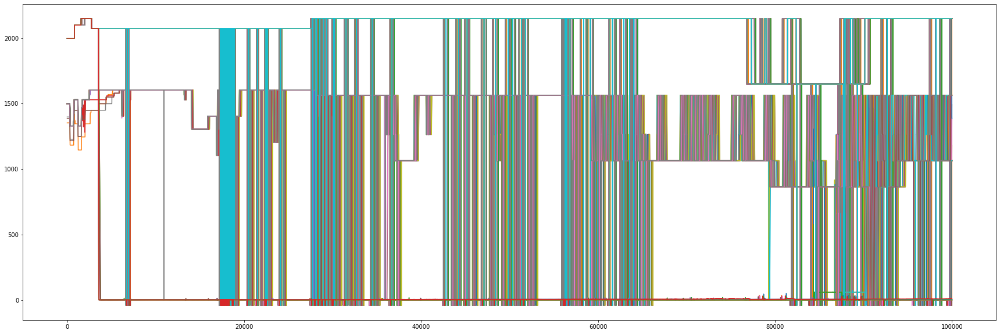

In [8]:
plt.figure(figsize=(30,10))
for i in range(dim**2):
    plt.plot(Data[i])
plt.show()

In [9]:
Y1 = np.zeros([T,dim**2])
for i in range(dim**2):
    Y1[:,i] = Data[i]
Y = Y1

In [11]:
max_val = np.max(Y)
min_val = np.min(Y)
diff = max_val - min_val
print(max_val,min_val,diff)

2150.2094726563 -42.0 2192.2094726563


Normalise data.

In [12]:
for j in range(dim**2):
    for i in range(T):
        Y[i,j] = (Y[i,j] - min_val) / np.float(diff)
        
#plt.figure(figsize=(30,10))
#for i in range(dim**2):
#    plt.plot(Y[:,i])
#plt.show()

In [13]:
D = [[] for i in range(T)]
Concern_list = [[] for i in range(T)]
Optimal_list = [[] for i in range(T)]
Test1 = [[] for i in range(T)]
for i in range(T):
    Test1[i] = np.zeros([dim,dim])
    D[i] = np.zeros([dim,dim])

In [15]:
for t in range(T):
    D[t] = np.reshape(Y[t,:], (dim,dim))

Decide number of arms to pull each round, k.

In [32]:
num_samples = np.int(0.33*dim**2)
print('{} samples taken each round for {} rounds'.format(num_samples,T))
print('Every channel is potentially sampled at least once every {} rounds.'.format(np.divmod(dim**2, num_samples)[0]+1))
power_reduction = 1 - (num_samples)/np.float(dim**2)
print('Power reduction:', power_reduction)

47 samples taken each round for 100000 rounds
Every channel is potentially sampled at least once every 4 rounds.
Power reduction: 0.6736111111111112


In [33]:
%matplotlib notebook
from matplotlib import animation, rc
from IPython.display import HTML
import time
np.random.seed(1)
p = np.random.rand(T)
#p = np.ones(T)*0.9
np.random.seed(4)
p_ = np.random.rand(T)
#p_ = np.ones(T)*0.9
Reset_counter = np.ones(dim**2)
flag = 1
if flag == 1:
    #plt.figure(figsize=(12,12))
    #fig = plt.gcf()
    #fig.show()
    #fig.canvas.draw()
    gamma = 0.8
    Prev_t = [[] for i in range(dim**2)]
    Pull_counter = np.zeros([T,dim**2])
    Threshold_count = np.zeros(dim**2)
    pull_p = np.ones(dim**2)
    Pull_p = np.zeros([T,dim**2])
    old_pull_p = np.zeros(dim**2)
    X = np.zeros([T,dim**2])
    X_hat = np.zeros(dim**2)
    sigma_hat = np.zeros(dim**2)
    Threshold_list = np.zeros([T,dim**2])
    Threshold_arms = []
    Reward = np.zeros(T)
    Threshold_upper1 = np.ones(dim**2)
    Threshold_lower1 = np.zeros(dim**2)
    boundary = 0.0001

    for t in range(T):
        print('Round ',t)
        ARMS = []
        if np.mod(t,np.divmod(dim**2,num_samples)[0]) == 0:
            choice = np.random.permutation(dim**2) # choose a random permutation of 1 to dim**2

        if np.mod(t,np.divmod(dim**2,num_samples)[0]) < np.divmod(dim**2,num_samples)[0]-1:
            # choose a subset of size num_samples from choice list
            for j in range(num_samples):
                arm = choice[num_samples*np.mod(t,np.divmod(dim**2,num_samples)[0])+j]
                if pull_p[arm] > p[t]:
                    ARMS.append(arm)
                    Pull_counter[t,arm] = 1
                    X[t,arm] = Y[t,arm]
                    
                    if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                        Threshold_list[t,arm] = 1
                        Threshold_count[arm] += 1
                        pull_p[arm] = 1
                    else:
                        new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                        pull_p[arm] = pull_p[arm]*new_pull*gamma
                    
                    Threshold_upper1[arm] = X[t,arm] + boundary
                    Threshold_lower1[arm] = X[t,arm] - boundary
                    
                    prev_t = t
                    if prev_t == 0:
                        Prev_t[arm] = np.array([t])
                        X_hat[arm] = X[t,arm]
                    else:
                        Prev_t[arm] = np.append(Prev_t[arm],t)
                        X_hat[arm] = np.mean(Y[Prev_t[arm].astype(int),arm])
                        sigma_hat[arm] = np.var(Y[Prev_t[arm].astype(int),arm])
                    
                    Pull_p[t,arm] = pull_p[arm]
                
                if not Prev_t[arm][-1].astype(int) == t:
                    if len(Prev_t[arm]) > 1:
                        if t - Prev_t[arm][-1].astype(int) > 0.05*T:
                            Prev_t[arm] = np.append(Prev_t[arm],t)
                            Pull_counter[t,arm] = 1
                            X[t,arm] = Y[t,arm]
                            if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                                Threshold_list[t,arm] = 1
                                Threshold_count[arm] += 1
                                pull_p[arm] = 1
                            else:
                                new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                                pull_p[arm] = pull_p[arm]*new_pull*gamma
                                
                            Threshold_upper1[arm] = X[t,arm] + boundary
                            Threshold_lower1[arm] = X[t,arm] - boundary
                            
        elif np.divmod(dim**2,num_samples)[0] > np.divmod(dim**2,num_samples)[1]:
            for j in range(num_samples+np.divmod(dim**2,num_samples)[1]):
                arm = choice[num_samples*np.mod(t,np.divmod(dim**2,num_samples)[0])+j]
                if pull_p[arm] > p[t]:
                    ARMS.append(arm)
                    Pull_counter[t,arm] = 1
                    X[t,arm] = Y[t,arm]

                    if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                        Threshold_list[t,arm] = 1
                        Threshold_count[arm] += 1
                        pull_p[arm] = 1
                    else:
                        new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                        pull_p[arm] = pull_p[arm]*new_pull*gamma

                    Threshold_upper1[arm] = X[t,arm] + boundary
                    Threshold_lower1[arm] = X[t,arm] - boundary

                    prev_t = t
                    if prev_t == 0:
                        Prev_t[arm] = np.array([t])
                        X_hat[arm] = X[t,arm]
                    else:
                        Prev_t[arm] = np.append(Prev_t[arm],t)
                        X_hat[arm] = np.mean(Y[Prev_t[arm].astype(int),arm])
                        sigma_hat[arm] = np.var(Y[Prev_t[arm].astype(int),arm])

                    Pull_p[t,arm] = pull_p[arm]
                    
                if not Prev_t[arm][-1].astype(int) == t:
                    if len(Prev_t[arm]) > 1:
                        if t - Prev_t[arm][-1].astype(int) > 0.05*T:
                            Prev_t[arm] = np.append(Prev_t[arm],t)
                            Pull_counter[t,arm] = 1
                            X[t,arm] = Y[t,arm]
                            if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                                Threshold_list[t,arm] = 1
                                Threshold_count[arm] += 1
                                pull_p[arm] = 1
                            else:
                                new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                                pull_p[arm] = pull_p[arm]*new_pull*gamma
                                
                            Threshold_upper1[arm] = X[t,arm] + boundary
                            Threshold_lower1[arm] = X[t,arm] - boundary
                                
            else:
                for j in range(num_samples+np.divmod(dim**2,num_samples)[1]):
                    arm = choice[num_samples*np.mod(t,np.divmod(dim**2,num_samples)[0])+j]
                    if pull_p[arm] > p[t]:
                        ARMS.append(arm)
                        Pull_counter[t,arm] = 1
                        X[t,arm] = Y[t,arm]

                        if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                            Threshold_list[t,arm] = 1
                            Threshold_count[arm] += 1
                            pull_p[arm] = 1
                        else:
                            new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                            pull_p[arm] = pull_p[arm]*new_pull*gamma

                        Threshold_upper1[arm] = X[t,arm] + boundary
                        Threshold_lower1[arm] = X[t,arm] - boundary

                        prev_t = t
                        if prev_t == 0:
                            Prev_t[arm] = np.array([t])
                            X_hat[arm] = X[t,arm]
                        else:
                            Prev_t[arm] = np.append(Prev_t[arm],t)
                            X_hat[arm] = np.mean(Y[Prev_t[arm].astype(int),arm])
                            sigma_hat[arm] = np.var(Y[Prev_t[arm].astype(int),arm])

                        Pull_p[t,arm] = pull_p[arm]
                        
                    if not Prev_t[arm][-1].astype(int) == t:
                        if len(Prev_t[arm]) > 1:
                            if t - Prev_t[arm][-1].astype(int) > 0.05*T:
                                Prev_t[arm] = np.append(Prev_t[arm],t)
                                Pull_counter[t,arm] = 1
                                X[t,arm] = Y[t,arm]
                                if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                                    Threshold_list[t,arm] = 1
                                    Threshold_count[arm] += 1
                                    pull_p[arm] = 1
                                else:
                                    new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                                    pull_p[arm] = pull_p[arm]*new_pull*gamma

                                Threshold_upper1[arm] = X[t,arm] + boundary
                                Threshold_lower1[arm] = X[t,arm] - boundary
                                
        if t > 0:
            Threshold_arms = np.where(Threshold_list[t-1,:])[0]
            Pull_counter[t,Threshold_arms] = 1
            X[t,Threshold_arms] = Y[t,Threshold_arms]
            for i in range(len(Threshold_arms)):
                if X[t,Threshold_arms[i]] > Threshold_upper1[Threshold_arms[i]] or X[t,Threshold_arms[i]] < Threshold_lower1[Threshold_arms[i]]:
                    Threshold_list[t,Threshold_arms[i]] = 1
                    Threshold_count[Threshold_arms[i]] += 1
                    Prev_t[Threshold_arms[i]] = np.append(Prev_t[Threshold_arms[i]],t)
                    #pull_p[Threshold_arms[i]] = 0
                    Pull_p[t,Threshold_arms[i]] = pull_p[Threshold_arms[i]]
                    #X_hat[Threshold_arms[i]] = np.mean(Y[Prev_t[Threshold_arms[i]].astype(int),Threshold_arms[i]])
                    #sigma_hat[Threshold_arms[i]] = np.var(Y[Prev_t[Threshold_arms[i]].astype(int),Threshold_arms[i]])
                else:
                    Threshold_list[t,Threshold_arms[i]] = 0
                    Prev_t[Threshold_arms[i]] = np.append(Prev_t[Threshold_arms[i]],t)
                    #X_hat[Threshold_arms[i]] = np.mean(Y[Prev_t[Threshold_arms[i]].astype(int),Threshold_arms[i]])
                    #sigma_hat[Threshold_arms[i]] = np.var(Y[Prev_t[Threshold_arms[i]].astype(int),Threshold_arms[i]])
                    #new_pull = np.float(np.sqrt(Reset_counter[Threshold_arms[i]]**2))*np.abs(X_hat[Threshold_arms[i]] - np.mean([Threshold_upper,Threshold_lower])) + np.float(sigma_hat[Threshold_arms[i]]+epsilon)
                    #pull_p[Threshold_arms[i]] = pull_p[Threshold_arms[i]] + new_pull 
                    #pull_p[Threshold_arms[i]] = gamma*pull_p[Threshold_arms[i]]
                    Pull_p[t,Threshold_arms[i]] = pull_p[Threshold_arms[i]]
                    #if pull_p[Threshold_arms[i]] > 0.999 and p_[t] > 0.5 or (t - Prev_t[Threshold_arms[i]][-1].astype(int) > 0.1*T):
                    #    Reset_counter[arm] += 1
                    #    pull_p[Threshold_arms[i]] = 0
                    #    Pull_p[t,Threshold_arms[i]] = pull_p[Threshold_arms[i]]
                if np.sum(np.isin(ARMS,Threshold_arms[i])) == 0:
                    Threshold_upper1[Threshold_arms[i]] = X[t,Threshold_arms[i]] + boundary
                    Threshold_lower1[Threshold_arms[i]] = X[t,Threshold_arms[i]] - boundary
        Test = np.reshape(X[t,:], (dim,dim))
        Test1[t] = Test
        #plt.imshow(Test, cmap=cmap, norm=norm)
        #plt.colorbar()
        #if len(np.where(Threshold_list[t,:]==1)[0]) == 1:
        #    plt.title('1 arm detected exceeding Threshold in round {}'.format(t))
        #else:
        #   plt.title('{} arms detected exceeding Threshold in Round {}'.format(len(np.where(Threshold_list[t,:]==1)[0]),t))
        #fig.canvas.draw()
        #plt.clf()
        print('Arms pulled:',np.unique(ARMS))
        print('Arms on Threshold list:',Threshold_arms)

Round  0
Arms pulled: [  0   3   7   8  11  12  29  30  31  34  44  50  51  54  55  56  57  63
  64  65  66  68  76  77  78  85  86  89  90  91  93  94  98  99 100 101
 103 106 109 110 115 117 120 123 139 140 142]
Arms on Threshold list: []
Round  1
Arms pulled: [  2   5   9  10  14  15  16  18  22  24  26  28  33  37  38  39  40  41
  43  45  47  53  59  62  67  69  70  74  75  81  87  92  97 102 105 114
 116 122 124 126 128 130 131 133 134 141 143]
Arms on Threshold list: []
Round  2
Arms pulled: []
Arms on Threshold list: []
Round  3
Arms pulled: [  3   7  10  16  26  30  32  36  37  42  43  46  48  49  50  55  58  62
  68  70  72  73  74  76  77  79  82  88  90  91  92  98 100 102 103 106
 112 116 117 118 119 124 127 137 139 140 143]
Arms on Threshold list: []
Round  4
Arms pulled: [  1   2   6  11  12  14  15  20  21  24  25  27  28  29  33  38  40  41
  44  51  53  56  59  61  63  65  66  67  75  80  81  84  89  94  96  97
 105 107 110 111 115 123 126 130 131 141 142]
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  94
Arms pulled: []
Arms on Threshold list: []
Round  95
Arms pulled: []
Arms on Threshold list: []
Round  96
Arms pulled: []
Arms on Threshold list: []
Round  97
Arms pulled: []
Arms on Threshold list: []
Round  98
Arms pulled: []
Arms on Threshold list: []
Round  99
Arms pulled: []
Arms on Threshold list: []
Round  100
Arms pulled: []
Arms on Threshold list: []
Round  101
Arms pulled: []
Arms on Threshold list: []
Round  102
Arms pulled: []
Arms on Threshold list: []
Round  103
Arms pulled: []
Arms on Threshold list: []
Round  104
Arms pulled: []
Arms on Threshold list: []
Round  105
Arms pulled: []
Arms on Threshold list: []
Round  106
Arms pulled: [  0   3   9  13  15  16  21  22  23  24  25  27  32  36  37  38  43  44
  47  50  53  61  63  65  66  67  72  74  77  78  79  82  94  95 100 101
 105 106 112 113 116 117 119 128 135 139 141]
Arms on Threshold list: []
Round  107
Arms pulled: []
Arms on Threshold list: []
Round  108
Arms pu

Arms pulled: [  3   5   9  10  12  15  16  18  19  20  24  29  31  33  34  36  37  41
  46  48  53  55  58  60  63  65  68  71  76  77  78  79  80  81  82  84
  87  88  89  90 100 115 120 122 130 131 134]
Arms on Threshold list: []
Round  217
Arms pulled: []
Arms on Threshold list: []
Round  218
Arms pulled: []
Arms on Threshold list: []
Round  219
Arms pulled: [  1   3   6   7  12  27  29  33  34  38  39  40  45  52  53  56  57  58
  62  74  79  83  84  88  89  90  92  93  94  98 102 112 114 117 118 120
 123 126 129 134 135 136 137 138 140 141 142]
Arms on Threshold list: []
Round  220
Arms pulled: []
Arms on Threshold list: []
Round  221
Arms pulled: []
Arms on Threshold list: []
Round  222
Arms pulled: []
Arms on Threshold list: []
Round  223
Arms pulled: []
Arms on Threshold list: []
Round  224
Arms pulled: []
Arms on Threshold list: []
Round  225
Arms pulled: []
Arms on Threshold list: []
Round  226
Arms pulled: []
Arms on Threshold list: []
Round  227
Arms pulled: []
Arms on Thre

Arms pulled: [ 39  40  98  99 107 108 109 120 121]
Arms on Threshold list: []
Round  370
Arms pulled: [  1  57  59 103 119 127]
Arms on Threshold list: []
Round  371
Arms pulled: []
Arms on Threshold list: []
Round  372
Arms pulled: [  4  46  63  99 109 120 127]
Arms on Threshold list: []
Round  373
Arms pulled: []
Arms on Threshold list: []
Round  374
Arms pulled: []
Arms on Threshold list: []
Round  375
Arms pulled: [  4   7  49  59  99 107 108 119 127]
Arms on Threshold list: []
Round  376
Arms pulled: []
Arms on Threshold list: []
Round  377
Arms pulled: []
Arms on Threshold list: []
Round  378
Arms pulled: []
Arms on Threshold list: []
Round  379
Arms pulled: [  4   7  46  49  62  65  98  99 104 107 108 109 127]
Arms on Threshold list: []
Round  380
Arms pulled: []
Arms on Threshold list: []
Round  381
Arms pulled: []
Arms on Threshold list: []
Round  382
Arms pulled: []
Arms on Threshold list: []
Round  383
Arms pulled: []
Arms on Threshold list: []
Round  384
Arms pulled: [  7  

Arms pulled: [42 44]
Arms on Threshold list: []
Round  485
Arms pulled: []
Arms on Threshold list: []
Round  486
Arms pulled: [ 42  67 122]
Arms on Threshold list: []
Round  487
Arms pulled: [  1   2   4   5   6   9  10  12  14  19  21  25  29  32  33  34  36  41
  49  52  59  60  61  63  65  68  75  82  84  87  88  89  90  97 107 109
 111 117 118 120 121 123 124 129 137 138 141]
Arms on Threshold list: []
Round  488
Arms pulled: []
Arms on Threshold list: [  2  60 117 118]
Round  489
Arms pulled: [ 60 117 118 122]
Arms on Threshold list: []
Round  490
Arms pulled: [2]
Arms on Threshold list: []
Round  491
Arms pulled: []
Arms on Threshold list: []
Round  492
Arms pulled: [ 60 122]
Arms on Threshold list: []
Round  493
Arms pulled: [  2  42  43  44  50 113]
Arms on Threshold list: []
Round  494
Arms pulled: []
Arms on Threshold list: []
Round  495
Arms pulled: []
Arms on Threshold list: []
Round  496
Arms pulled: []
Arms on Threshold list: []
Round  497
Arms pulled: []
Arms on Threshol

Arms pulled: []
Arms on Threshold list: []
Round  649
Arms pulled: []
Arms on Threshold list: []
Round  650
Arms pulled: []
Arms on Threshold list: []
Round  651
Arms pulled: [ 41 115]
Arms on Threshold list: []
Round  652
Arms pulled: []
Arms on Threshold list: []
Round  653
Arms pulled: []
Arms on Threshold list: []
Round  654
Arms pulled: []
Arms on Threshold list: []
Round  655
Arms pulled: []
Arms on Threshold list: []
Round  656
Arms pulled: []
Arms on Threshold list: []
Round  657
Arms pulled: [  1   5   8  23  40  41  42  43  58  65  95  98 101 104 111 113 120 121
 123 124 125]
Arms on Threshold list: []
Round  658
Arms pulled: []
Arms on Threshold list: []
Round  659
Arms pulled: []
Arms on Threshold list: []
Round  660
Arms pulled: []
Arms on Threshold list: []
Round  661
Arms pulled: []
Arms on Threshold list: []
Round  662
Arms pulled: []
Arms on Threshold list: []
Round  663
Arms pulled: []
Arms on Threshold list: []
Round  664
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: [ 39  40  47  49  52  55  60  61  62  66 104 109 112 117 126]
Round  771
Arms pulled: [  4   7  39  40  45  50  53  54  59  63  98 102 107 116 125]
Arms on Threshold list: [49 52]
Round  772
Arms pulled: [  1   6  38  41  42  52  55  57  60  62  64  65  99 101 103 108 109 112
 115 123 126]
Arms on Threshold list: [ 49  50  52  53  59  63  98 102 125]
Round  773
Arms pulled: []
Arms on Threshold list: [  1   6  41  42  50  57  59  64  65  99 101 102 103 108 115 125 126]
Round  774
Arms pulled: [  3  39  41  47  53  61  62  65 104 106 112 115 118 122 123]
Arms on Threshold list: [  1  42  50  65 108 126]
Round  775
Arms pulled: [  7  38  40  42  50  51  52  63  64  66  98  99 103 108 109 114 124 125
 126]
Arms on Threshold list: [  1   3  39  61 104 106 108 112 118 122 123]
Round  776
Arms pulled: []
Arms on Threshold list: [  7  38  40  51  61  66  98 109 112 114 124]
Round  777
Arms pulled: [  1   4   6  40  42  47  50  57  61  63  65 100 102 107

Arms pulled: []
Arms on Threshold list: [41]
Round  860
Arms pulled: []
Arms on Threshold list: []
Round  861
Arms pulled: []
Arms on Threshold list: []
Round  862
Arms pulled: []
Arms on Threshold list: []
Round  863
Arms pulled: []
Arms on Threshold list: []
Round  864
Arms pulled: []
Arms on Threshold list: []
Round  865
Arms pulled: [41]
Arms on Threshold list: []
Round  866
Arms pulled: []
Arms on Threshold list: [41]
Round  867
Arms pulled: []
Arms on Threshold list: []
Round  868
Arms pulled: [  1   3   6  39  42  45  56  57  61  63  64  65  99 100 101 106 111 112
 114 116 118 124]
Arms on Threshold list: []
Round  869
Arms pulled: []
Arms on Threshold list: [56]
Round  870
Arms pulled: [  2   3   8  43  44  48  49  54  55  58  64  65  99 101 102 105 106 107
 112 113 114 115 120 123 124 126 128]
Arms on Threshold list: []
Round  871
Arms pulled: [  4   5   6  41  42  50  51  62 103 104 108 109 110 117]
Arms on Threshold list: [  8  43  48  58 105 113 128]
Round  872
Arms pulled:

Arms pulled: [  4   7   8  23  29  41  43  44  58  60  63  67  80  82  83  92  93 100
 101 110 113 117 135 139]
Arms on Threshold list: []
Round  988
Arms pulled: []
Arms on Threshold list: []
Round  989
Arms pulled: []
Arms on Threshold list: []
Round  990
Arms pulled: []
Arms on Threshold list: []
Round  991
Arms pulled: [ 23  28  31  73  75  77  92 139 141]
Arms on Threshold list: []
Round  992
Arms pulled: []
Arms on Threshold list: []
Round  993
Arms pulled: []
Arms on Threshold list: []
Round  994
Arms pulled: []
Arms on Threshold list: []
Round  995
Arms pulled: []
Arms on Threshold list: []
Round  996
Arms pulled: [ 16  72  73  94 141]
Arms on Threshold list: []
Round  997
Arms pulled: []
Arms on Threshold list: []
Round  998
Arms pulled: []
Arms on Threshold list: []
Round  999
Arms pulled: []
Arms on Threshold list: []
Round  1000
Arms pulled: [ 0 18]
Arms on Threshold list: []
Round  1001
Arms pulled: []
Arms on Threshold list: []
Round  1002
Arms pulled: []
Arms on Threshol

Arms pulled: []
Arms on Threshold list: []
Round  1116
Arms pulled: [  3  27  28  32  43  45  46  48  52  56  60  61  64  66  67  92  95  96
  99 105 110 111 114 115 119 135 141]
Arms on Threshold list: []
Round  1117
Arms pulled: [ 9 17 19 25]
Arms on Threshold list: []
Round  1118
Arms pulled: []
Arms on Threshold list: []
Round  1119
Arms pulled: [  0   1   3   6   7   8  11  18  19  21  23  42  44  45  49  52  54  55
  57  59  63  64  73  82  90  92  94 101 109 111 113 115 118 120 125 126
 127 130 131 133 135 141]
Arms on Threshold list: []
Round  1120
Arms pulled: [ 9 14 17 26 27 32 87]
Arms on Threshold list: [ 11  21  90 133]
Round  1121
Arms pulled: []
Arms on Threshold list: []
Round  1122
Arms pulled: []
Arms on Threshold list: []
Round  1123
Arms pulled: [ 11  21  27  90 133]
Arms on Threshold list: []
Round  1124
Arms pulled: []
Arms on Threshold list: []
Round  1125
Arms pulled: []
Arms on Threshold list: []
Round  1126
Arms pulled: [ 11  21 129 131]
Arms on Threshold list

Arms pulled: [ 45  50  52  56 103 114 116]
Arms on Threshold list: [ 1  3 45 49 50]
Round  1238
Arms pulled: []
Arms on Threshold list: [ 1  3 49 52]
Round  1239
Arms pulled: [  3  11  12  13  14  25  27  28  33  34  35  38  39  40  45  46  47  49
  51  52  58  62  66  67  70  76  83  84  90  91  97  98 106 107 108 110
 111 114 115 117 121 134 135 138 140 142 143]
Arms on Threshold list: [ 3 49 52]
Round  1240
Arms pulled: [ 0  1 48 50 56 57 59]
Arms on Threshold list: [ 12  13  33  34  35  39  40  45  46  47  51  62  66  67  70  84  91  97
  98 106 107 108 110 111 115 117 121 134 140 142 143]
Round  1241
Arms pulled: []
Arms on Threshold list: [ 46  47  48  50  51  62  66  67 111]
Round  1242
Arms pulled: [  3  33  35  46  50  51  59  62  67  70  84  91  97 106 108 116 119 140
 142]
Arms on Threshold list: [ 46  47  48  50  51  62  66  67 111]
Round  1243
Arms pulled: [ 13  34  39  40  52  66 107 111 117 121 122 143]
Arms on Threshold list: [ 3 47 48 66]
Round  1244
Arms pulled: []
Ar

Arms pulled: [  2  55 104 109]
Arms on Threshold list: [  7  36  37  42  44  54  60  61  64  65  68  89 100 102 105 113 123]
Round  1355
Arms pulled: []
Arms on Threshold list: []
Round  1356
Arms pulled: [  2   6   7  61 113 123]
Arms on Threshold list: []
Round  1357
Arms pulled: [  0   1  11  13  20  23  25  31  35  36  37  42  47  48  50  56  58  59
  60  66  68  70  77  83  89  90 103 108 114 115 117 118 134 138]
Arms on Threshold list: []
Round  1358
Arms pulled: []
Arms on Threshold list: []
Round  1359
Arms pulled: [64]
Arms on Threshold list: []
Round  1360
Arms pulled: [  7  37  54  55 100 105 109 113 123]
Arms on Threshold list: []
Round  1361
Arms pulled: []
Arms on Threshold list: []
Round  1362
Arms pulled: [  0   1   2   3   6  17  38  42  45  64  68  91  96  97  99 105 117 118
 123 130 134 143]
Arms on Threshold list: []
Round  1363
Arms pulled: [  7  36  61 100 102 109 113 127]
Arms on Threshold list: []
Round  1364
Arms pulled: []
Arms on Threshold list: []
Round  136

Arms pulled: [124]
Arms on Threshold list: []
Round  1474
Arms pulled: [24]
Arms on Threshold list: []
Round  1475
Arms pulled: []
Arms on Threshold list: []
Round  1476
Arms pulled: [81]
Arms on Threshold list: []
Round  1477
Arms pulled: [ 24  30 101 124 132]
Arms on Threshold list: []
Round  1478
Arms pulled: []
Arms on Threshold list: []
Round  1479
Arms pulled: [24 81]
Arms on Threshold list: []
Round  1480
Arms pulled: [ 30 120 124]
Arms on Threshold list: []
Round  1481
Arms pulled: []
Arms on Threshold list: []
Round  1482
Arms pulled: []
Arms on Threshold list: []
Round  1483
Arms pulled: []
Arms on Threshold list: []
Round  1484
Arms pulled: []
Arms on Threshold list: []
Round  1485
Arms pulled: [ 24  30  64 126]
Arms on Threshold list: []
Round  1486
Arms pulled: []
Arms on Threshold list: []
Round  1487
Arms pulled: []
Arms on Threshold list: []
Round  1488
Arms pulled: [101 124]
Arms on Threshold list: []
Round  1489
Arms pulled: [24 30 81]
Arms on Threshold list: []
Round

Arms pulled: [  0   6  15  16  19  24  27  28  32  35  41  45  48  51  56  59  64  66
  67  71  72  75  76  78  91  97 103 104 108 109 111 113 117 120 122 124
 127 131 140 142]
Arms on Threshold list: [108 125]
Round  1609
Arms pulled: [  5  10  30  37  38  39  44  74  81 100 101 107 125 126 136 137]
Arms on Threshold list: [  0  45  56 103 104 109 111 113 117 122 124 127 131 140]
Round  1610
Arms pulled: []
Arms on Threshold list: [  0  44  45 100 101 103 107 109 111 124 126 127]
Round  1611
Arms pulled: [ 39  56 100 104 107 108 116 118 124 125 126 127 137]
Arms on Threshold list: [ 45 109 111 124 127]
Round  1612
Arms pulled: [  0  38 101 103 109 111 113 122 132 142 143]
Arms on Threshold list: [ 45 104 108 109 111 116]
Round  1613
Arms pulled: []
Arms on Threshold list: [ 45 104 122]
Round  1614
Arms pulled: [  0  44  59 101 108 116 124 127 140]
Arms on Threshold list: [ 45 122]
Round  1615
Arms pulled: [  3   5   7  22  25  27  35  36  37  39  42  46  52  53  54  55  56  57
  63  6

Round  1714
Arms pulled: [  5  26  38  41  42  44  45  53  56 100 101 103 108 109 112 114 118 119
 123 124 126 134 143]
Arms on Threshold list: [121]
Round  1715
Arms pulled: []
Arms on Threshold list: [103 109 112 123 124 126]
Round  1716
Arms pulled: [ 24  26  99 108 109 114 121 122 123]
Arms on Threshold list: [109 112 123 126]
Round  1717
Arms pulled: [ 25  41 103 104 110 117 120 126]
Arms on Threshold list: [108 122]
Round  1718
Arms pulled: []
Arms on Threshold list: [108 110 117]
Round  1719
Arms pulled: [ 10  21  26  41 101 102 107 117 118 122 138]
Arms on Threshold list: [110 117]
Round  1720
Arms pulled: [  6 124]
Arms on Threshold list: [107]
Round  1721
Arms pulled: []
Arms on Threshold list: [124]
Round  1722
Arms pulled: [107 112]
Arms on Threshold list: []
Round  1723
Arms pulled: [110 123 124]
Arms on Threshold list: [112]
Round  1724
Arms pulled: []
Arms on Threshold list: [123]
Round  1725
Arms pulled: [ 12  32  52  58  67 100 101 107 110 112 117 118 124]
Arms on Thre

Arms pulled: [123]
Arms on Threshold list: []
Round  1841
Arms pulled: []
Arms on Threshold list: []
Round  1842
Arms pulled: []
Arms on Threshold list: []
Round  1843
Arms pulled: []
Arms on Threshold list: []
Round  1844
Arms pulled: []
Arms on Threshold list: []
Round  1845
Arms pulled: []
Arms on Threshold list: []
Round  1846
Arms pulled: [ 19  34 115 129 135]
Arms on Threshold list: []
Round  1847
Arms pulled: []
Arms on Threshold list: []
Round  1848
Arms pulled: []
Arms on Threshold list: []
Round  1849
Arms pulled: [  5   7  17  25  40  47 103 105 111 116 119 135 141]
Arms on Threshold list: []
Round  1850
Arms pulled: []
Arms on Threshold list: []
Round  1851
Arms pulled: []
Arms on Threshold list: []
Round  1852
Arms pulled: [  0   3   4  19  21  24  25  27  41  43  51 100 102 105 106 115 117 120
 124 125 129 141]
Arms on Threshold list: []
Round  1853
Arms pulled: []
Arms on Threshold list: []
Round  1854
Arms pulled: []
Arms on Threshold list: []
Round  1855
Arms pulled: [

Round  1980
Arms pulled: []
Arms on Threshold list: [123]
Round  1981
Arms pulled: []
Arms on Threshold list: [123]
Round  1982
Arms pulled: []
Arms on Threshold list: [123]
Round  1983
Arms pulled: [123]
Arms on Threshold list: [123]
Round  1984
Arms pulled: []
Arms on Threshold list: []
Round  1985
Arms pulled: []
Arms on Threshold list: []
Round  1986
Arms pulled: [123]
Arms on Threshold list: []
Round  1987
Arms pulled: []
Arms on Threshold list: [123]
Round  1988
Arms pulled: []
Arms on Threshold list: []
Round  1989
Arms pulled: [  2   3   5   6  12  26  30  46  51  60  64  78  98 103 106 109 110 118
 122 130 134 135 143]
Arms on Threshold list: []
Round  1990
Arms pulled: [123]
Arms on Threshold list: [78]
Round  1991
Arms pulled: []
Arms on Threshold list: [123]
Round  1992
Arms pulled: [ 78 123]
Arms on Threshold list: [123]
Round  1993
Arms pulled: []
Arms on Threshold list: []
Round  1994
Arms pulled: []
Arms on Threshold list: []
Round  1995
Arms pulled: [123]
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  2117
Arms pulled: []
Arms on Threshold list: []
Round  2118
Arms pulled: []
Arms on Threshold list: []
Round  2119
Arms pulled: []
Arms on Threshold list: []
Round  2120
Arms pulled: []
Arms on Threshold list: []
Round  2121
Arms pulled: [ 43  50  54  57  58  60  66  73  78  81  89 123]
Arms on Threshold list: []
Round  2122
Arms pulled: []
Arms on Threshold list: []
Round  2123
Arms pulled: []
Arms on Threshold list: []
Round  2124
Arms pulled: [123]
Arms on Threshold list: []
Round  2125
Arms pulled: []
Arms on Threshold list: []
Round  2126
Arms pulled: []
Arms on Threshold list: []
Round  2127
Arms pulled: []
Arms on Threshold list: []
Round  2128
Arms pulled: []
Arms on Threshold list: []
Round  2129
Arms pulled: []
Arms on Threshold list: []
Round  2130
Arms pulled: []
Arms on Threshold list: []
Round  2131
Arms pulled: []
Arms on Threshold list: []
Round  2132
Arms pulled: []
Arms on Threshold list: []
Round  2133
Arms pulled: []

Arms on Threshold list: []
Round  2255
Arms pulled: []
Arms on Threshold list: []
Round  2256
Arms pulled: []
Arms on Threshold list: []
Round  2257
Arms pulled: [11 31 45 48 69 70 82 92 95]
Arms on Threshold list: []
Round  2258
Arms pulled: []
Arms on Threshold list: []
Round  2259
Arms pulled: []
Arms on Threshold list: []
Round  2260
Arms pulled: []
Arms on Threshold list: []
Round  2261
Arms pulled: []
Arms on Threshold list: []
Round  2262
Arms pulled: []
Arms on Threshold list: []
Round  2263
Arms pulled: []
Arms on Threshold list: []
Round  2264
Arms pulled: []
Arms on Threshold list: []
Round  2265
Arms pulled: [72]
Arms on Threshold list: []
Round  2266
Arms pulled: []
Arms on Threshold list: []
Round  2267
Arms pulled: []
Arms on Threshold list: []
Round  2268
Arms pulled: []
Arms on Threshold list: []
Round  2269
Arms pulled: [  0   3   4   6  18  19  20  25  26  27  33  36  38  42  47  48  50  51
  53  56  59  67  69  71  74  76  77  80  81  83  84  85  86  87  89  95
 100

Arms pulled: [ 28  46  51  71  72  79  82  90  97 117 139]
Arms on Threshold list: [94]
Round  2399
Arms pulled: []
Arms on Threshold list: []
Round  2400
Arms pulled: []
Arms on Threshold list: []
Round  2401
Arms pulled: [94]
Arms on Threshold list: []
Round  2402
Arms pulled: []
Arms on Threshold list: []
Round  2403
Arms pulled: []
Arms on Threshold list: []
Round  2404
Arms pulled: []
Arms on Threshold list: []
Round  2405
Arms pulled: []
Arms on Threshold list: []
Round  2406
Arms pulled: []
Arms on Threshold list: []
Round  2407
Arms pulled: []
Arms on Threshold list: []
Round  2408
Arms pulled: []
Arms on Threshold list: []
Round  2409
Arms pulled: [28 94]
Arms on Threshold list: []
Round  2410
Arms pulled: []
Arms on Threshold list: []
Round  2411
Arms pulled: []
Arms on Threshold list: []
Round  2412
Arms pulled: [94]
Arms on Threshold list: []
Round  2413
Arms pulled: []
Arms on Threshold list: []
Round  2414
Arms pulled: []
Arms on Threshold list: []
Round  2415
Arms pulled

Arms pulled: []
Arms on Threshold list: []
Round  2546
Arms pulled: []
Arms on Threshold list: []
Round  2547
Arms pulled: [  2  18  31  33  40  46  70  90  94  96 117]
Arms on Threshold list: []
Round  2548
Arms pulled: [67]
Arms on Threshold list: [ 2 40]
Round  2549
Arms pulled: []
Arms on Threshold list: []
Round  2550
Arms pulled: [40]
Arms on Threshold list: []
Round  2551
Arms pulled: [ 2 46 67 74]
Arms on Threshold list: []
Round  2552
Arms pulled: []
Arms on Threshold list: []
Round  2553
Arms pulled: [ 2 87]
Arms on Threshold list: []
Round  2554
Arms pulled: [46 67]
Arms on Threshold list: []
Round  2555
Arms pulled: []
Arms on Threshold list: []
Round  2556
Arms pulled: [2]
Arms on Threshold list: []
Round  2557
Arms pulled: [40 56]
Arms on Threshold list: []
Round  2558
Arms pulled: []
Arms on Threshold list: []
Round  2559
Arms pulled: []
Arms on Threshold list: []
Round  2560
Arms pulled: []
Arms on Threshold list: []
Round  2561
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [112]
Arms on Threshold list: []
Round  2662
Arms pulled: [66 75]
Arms on Threshold list: []
Round  2663
Arms pulled: []
Arms on Threshold list: []
Round  2664
Arms pulled: []
Arms on Threshold list: []
Round  2665
Arms pulled: [  4  43  48  57 101 109 110 118 124]
Arms on Threshold list: []
Round  2666
Arms pulled: []
Arms on Threshold list: []
Round  2667
Arms pulled: [  4   5  42  75 100 112]
Arms on Threshold list: []
Round  2668
Arms pulled: []
Arms on Threshold list: []
Round  2669
Arms pulled: []
Arms on Threshold list: []
Round  2670
Arms pulled: []
Arms on Threshold list: []
Round  2671
Arms pulled: []
Arms on Threshold list: []
Round  2672
Arms pulled: []
Arms on Threshold list: []
Round  2673
Arms pulled: [ 42  98 112]
Arms on Threshold list: []
Round  2674
Arms pulled: [  1   4  38  40  60  65  66 102 106 118 127]
Arms on Threshold list: []
Round  2675
Arms pulled: []
Arms on Threshold list: []
Round  2676
Arms pulled: [  4   5  41  42  98 112]
Arms on Threshol

Arms pulled: [  5  15  23  28  31  42  46  48  51  57  59  64  66  74  75  82  90  91
  92  93  94 107 111 113 115 116 119 120 121 128]
Arms on Threshold list: []
Round  2794
Arms pulled: []
Arms on Threshold list: [ 31  74  82  91  92  93  94 128]
Round  2795
Arms pulled: []
Arms on Threshold list: []
Round  2796
Arms pulled: [  3   5  23  31  52  61  65  66  87  93  98 109 120 124 139]
Arms on Threshold list: []
Round  2797
Arms pulled: [ 70  85  91  94 115]
Arms on Threshold list: []
Round  2798
Arms pulled: []
Arms on Threshold list: []
Round  2799
Arms pulled: [ 15  31  41  49  75  87  91  92  93  94 115 128 139]
Arms on Threshold list: []
Round  2800
Arms pulled: [  5  28  29  50  52  74  85  90 120]
Arms on Threshold list: []
Round  2801
Arms pulled: []
Arms on Threshold list: []
Round  2802
Arms pulled: []
Arms on Threshold list: []
Round  2803
Arms pulled: [ 15  28  38  82  91 139]
Arms on Threshold list: []
Round  2804
Arms pulled: []
Arms on Threshold list: []
Round  2805
Ar

Arms pulled: [  2   3   5   8   9  10  14  15  16  17  18  23  27  29  36  40  42  45
  47  48  52  57  64  65  71  77  79  83  89  93  97 102 106 110 114 116
 117 118 120 128 133 134 137 138 140 142 143]
Arms on Threshold list: []
Round  2912
Arms pulled: []
Arms on Threshold list: [ 10  16  17  18  27  36  79 133 134 137 140 142]
Round  2913
Arms pulled: [ 10  16  17  36  79 137]
Arms on Threshold list: []
Round  2914
Arms pulled: [ 27 133 140 142]
Arms on Threshold list: []
Round  2915
Arms pulled: []
Arms on Threshold list: []
Round  2916
Arms pulled: [ 18 140 142]
Arms on Threshold list: []
Round  2917
Arms pulled: []
Arms on Threshold list: []
Round  2918
Arms pulled: []
Arms on Threshold list: []
Round  2919
Arms pulled: [ 16  18  36 133 137]
Arms on Threshold list: []
Round  2920
Arms pulled: [ 27 134]
Arms on Threshold list: []
Round  2921
Arms pulled: []
Arms on Threshold list: []
Round  2922
Arms pulled: [ 17  18  96 128 130]
Arms on Threshold list: []
Round  2923
Arms pulle

Arms pulled: [ 22  37  84 137 140]
Arms on Threshold list: []
Round  3043
Arms pulled: []
Arms on Threshold list: []
Round  3044
Arms pulled: []
Arms on Threshold list: []
Round  3045
Arms pulled: []
Arms on Threshold list: []
Round  3046
Arms pulled: [  1   2   4   6   8  12  14  17  24  26  27  29  31  34  38  43  44  49
  53  54  58  59  64  68  71  73  77  79  81  87  88  89  90  91  95  97
  99 100 102 107 116 118 122 123 134 135 140]
Arms on Threshold list: []
Round  3047
Arms pulled: []
Arms on Threshold list: [ 12  26  34  95 135]
Round  3048
Arms pulled: [26]
Arms on Threshold list: []
Round  3049
Arms pulled: [ 11  12  13  21  27  28  31  33  37  52  68  71  72  76  78  79  80  82
  83  84  89  91  92  93  94  95 128 135 139 140 143]
Arms on Threshold list: []
Round  3050
Arms pulled: []
Arms on Threshold list: []
Round  3051
Arms pulled: [ 12  26 135]
Arms on Threshold list: []
Round  3052
Arms pulled: [34]
Arms on Threshold list: []
Round  3053
Arms pulled: []
Arms on Thres

Round  3182
Arms pulled: []
Arms on Threshold list: []
Round  3183
Arms pulled: []
Arms on Threshold list: []
Round  3184
Arms pulled: []
Arms on Threshold list: []
Round  3185
Arms pulled: []
Arms on Threshold list: []
Round  3186
Arms pulled: []
Arms on Threshold list: []
Round  3187
Arms pulled: []
Arms on Threshold list: []
Round  3188
Arms pulled: []
Arms on Threshold list: []
Round  3189
Arms pulled: [ 12  26  69  95 141 142]
Arms on Threshold list: []
Round  3190
Arms pulled: []
Arms on Threshold list: []
Round  3191
Arms pulled: []
Arms on Threshold list: []
Round  3192
Arms pulled: []
Arms on Threshold list: []
Round  3193
Arms pulled: []
Arms on Threshold list: []
Round  3194
Arms pulled: []
Arms on Threshold list: []
Round  3195
Arms pulled: []
Arms on Threshold list: []
Round  3196
Arms pulled: []
Arms on Threshold list: []
Round  3197
Arms pulled: []
Arms on Threshold list: []
Round  3198
Arms pulled: []
Arms on Threshold list: []
Round  3199
Arms pulled: []
Arms on Thresh

Arms pulled: []
Arms on Threshold list: []
Round  3332
Arms pulled: []
Arms on Threshold list: []
Round  3333
Arms pulled: []
Arms on Threshold list: []
Round  3334
Arms pulled: []
Arms on Threshold list: []
Round  3335
Arms pulled: []
Arms on Threshold list: []
Round  3336
Arms pulled: []
Arms on Threshold list: []
Round  3337
Arms pulled: []
Arms on Threshold list: []
Round  3338
Arms pulled: []
Arms on Threshold list: []
Round  3339
Arms pulled: []
Arms on Threshold list: []
Round  3340
Arms pulled: []
Arms on Threshold list: []
Round  3341
Arms pulled: []
Arms on Threshold list: []
Round  3342
Arms pulled: []
Arms on Threshold list: []
Round  3343
Arms pulled: []
Arms on Threshold list: []
Round  3344
Arms pulled: []
Arms on Threshold list: []
Round  3345
Arms pulled: []
Arms on Threshold list: []
Round  3346
Arms pulled: []
Arms on Threshold list: []
Round  3347
Arms pulled: []
Arms on Threshold list: []
Round  3348
Arms pulled: []
Arms on Threshold list: []
Round  3349
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  3502
Arms pulled: []
Arms on Threshold list: []
Round  3503
Arms pulled: []
Arms on Threshold list: []
Round  3504
Arms pulled: []
Arms on Threshold list: []
Round  3505
Arms pulled: []
Arms on Threshold list: []
Round  3506
Arms pulled: []
Arms on Threshold list: []
Round  3507
Arms pulled: []
Arms on Threshold list: []
Round  3508
Arms pulled: []
Arms on Threshold list: []
Round  3509
Arms pulled: []
Arms on Threshold list: []
Round  3510
Arms pulled: []
Arms on Threshold list: []
Round  3511
Arms pulled: []
Arms on Threshold list: []
Round  3512
Arms pulled: []
Arms on Threshold list: []
Round  3513
Arms pulled: []
Arms on Threshold list: []
Round  3514
Arms pulled: []
Arms on Threshold list: []
Round  3515
Arms pulled: []
Arms on Threshold list: []
Round  3516
Arms pulled: []
Arms on Threshold list: []
Round  3517
Arms pulled: []
Arms on Threshold list: []
Round  3518
Arms pulled: []
Arms on Threshold list: []
Round  3519
Arms pulle

Arms pulled: []
Arms on Threshold list: [115]
Round  3642
Arms pulled: [115]
Arms on Threshold list: [115]
Round  3643
Arms pulled: [140 143]
Arms on Threshold list: []
Round  3644
Arms pulled: []
Arms on Threshold list: []
Round  3645
Arms pulled: [ 25 115]
Arms on Threshold list: []
Round  3646
Arms pulled: [  1   2   4   6  11  16  17  21  22  31  33  34  35  39  44  46  50  53
  54  56  57  58  59  67  70  71  76  80  88  94 100 103 104 106 109 112
 113 114 116 125 127 128 129 132 134 135 137]
Arms on Threshold list: [115]
Round  3647
Arms pulled: []
Arms on Threshold list: [112 113 114 115]
Round  3648
Arms pulled: [112 113 115]
Arms on Threshold list: [112 113 114 115]
Round  3649
Arms pulled: []
Arms on Threshold list: [114]
Round  3650
Arms pulled: []
Arms on Threshold list: [114]
Round  3651
Arms pulled: [113 115]
Arms on Threshold list: [114]
Round  3652
Arms pulled: [114]
Arms on Threshold list: [113 114 115]
Round  3653
Arms pulled: []
Arms on Threshold list: [113 115]
Roun

Round  3772
Arms pulled: [113 114]
Arms on Threshold list: [111]
Round  3773
Arms pulled: []
Arms on Threshold list: [111]
Round  3774
Arms pulled: [114 115]
Arms on Threshold list: [111]
Round  3775
Arms pulled: []
Arms on Threshold list: [111]
Round  3776
Arms pulled: []
Arms on Threshold list: [111]
Round  3777
Arms pulled: [111]
Arms on Threshold list: [111]
Round  3778
Arms pulled: [112 113]
Arms on Threshold list: []
Round  3779
Arms pulled: []
Arms on Threshold list: [112]
Round  3780
Arms pulled: []
Arms on Threshold list: []
Round  3781
Arms pulled: [111 112]
Arms on Threshold list: []
Round  3782
Arms pulled: []
Arms on Threshold list: [111]
Round  3783
Arms pulled: [111]
Arms on Threshold list: []
Round  3784
Arms pulled: []
Arms on Threshold list: []
Round  3785
Arms pulled: []
Arms on Threshold list: []
Round  3786
Arms pulled: [111]
Arms on Threshold list: []
Round  3787
Arms pulled: []
Arms on Threshold list: []
Round  3788
Arms pulled: []
Arms on Threshold list: []
Roun

Arms pulled: [ 10  11  24  26  29  30  35  79  84  96 115 125 126 129 131 136 141 142]
Arms on Threshold list: []
Round  3926
Arms pulled: []
Arms on Threshold list: []
Round  3927
Arms pulled: []
Arms on Threshold list: []
Round  3928
Arms pulled: []
Arms on Threshold list: []
Round  3929
Arms pulled: []
Arms on Threshold list: []
Round  3930
Arms pulled: []
Arms on Threshold list: []
Round  3931
Arms pulled: []
Arms on Threshold list: []
Round  3932
Arms pulled: []
Arms on Threshold list: []
Round  3933
Arms pulled: [112]
Arms on Threshold list: []
Round  3934
Arms pulled: []
Arms on Threshold list: []
Round  3935
Arms pulled: []
Arms on Threshold list: []
Round  3936
Arms pulled: []
Arms on Threshold list: []
Round  3937
Arms pulled: []
Arms on Threshold list: []
Round  3938
Arms pulled: []
Arms on Threshold list: []
Round  3939
Arms pulled: [ 24  25 111 114]
Arms on Threshold list: []
Round  3940
Arms pulled: []
Arms on Threshold list: []
Round  3941
Arms pulled: []
Arms on Thresho

Arms on Threshold list: []
Round  4080
Arms pulled: []
Arms on Threshold list: []
Round  4081
Arms pulled: []
Arms on Threshold list: []
Round  4082
Arms pulled: []
Arms on Threshold list: []
Round  4083
Arms pulled: []
Arms on Threshold list: []
Round  4084
Arms pulled: []
Arms on Threshold list: []
Round  4085
Arms pulled: []
Arms on Threshold list: []
Round  4086
Arms pulled: []
Arms on Threshold list: []
Round  4087
Arms pulled: []
Arms on Threshold list: []
Round  4088
Arms pulled: []
Arms on Threshold list: []
Round  4089
Arms pulled: []
Arms on Threshold list: []
Round  4090
Arms pulled: []
Arms on Threshold list: []
Round  4091
Arms pulled: []
Arms on Threshold list: []
Round  4092
Arms pulled: []
Arms on Threshold list: []
Round  4093
Arms pulled: [41]
Arms on Threshold list: []
Round  4094
Arms pulled: []
Arms on Threshold list: []
Round  4095
Arms pulled: []
Arms on Threshold list: []
Round  4096
Arms pulled: []
Arms on Threshold list: []
Round  4097
Arms pulled: []
Arms on 

Arms pulled: []
Arms on Threshold list: []
Round  4244
Arms pulled: []
Arms on Threshold list: []
Round  4245
Arms pulled: []
Arms on Threshold list: []
Round  4246
Arms pulled: []
Arms on Threshold list: []
Round  4247
Arms pulled: []
Arms on Threshold list: []
Round  4248
Arms pulled: []
Arms on Threshold list: []
Round  4249
Arms pulled: []
Arms on Threshold list: []
Round  4250
Arms pulled: []
Arms on Threshold list: []
Round  4251
Arms pulled: []
Arms on Threshold list: []
Round  4252
Arms pulled: []
Arms on Threshold list: []
Round  4253
Arms pulled: []
Arms on Threshold list: []
Round  4254
Arms pulled: []
Arms on Threshold list: []
Round  4255
Arms pulled: []
Arms on Threshold list: []
Round  4256
Arms pulled: []
Arms on Threshold list: []
Round  4257
Arms pulled: []
Arms on Threshold list: []
Round  4258
Arms pulled: []
Arms on Threshold list: []
Round  4259
Arms pulled: []
Arms on Threshold list: []
Round  4260
Arms pulled: []
Arms on Threshold list: []
Round  4261
Arms pulle

Arms on Threshold list: []
Round  4385
Arms pulled: []
Arms on Threshold list: []
Round  4386
Arms pulled: []
Arms on Threshold list: []
Round  4387
Arms pulled: []
Arms on Threshold list: []
Round  4388
Arms pulled: []
Arms on Threshold list: []
Round  4389
Arms pulled: []
Arms on Threshold list: []
Round  4390
Arms pulled: []
Arms on Threshold list: []
Round  4391
Arms pulled: []
Arms on Threshold list: []
Round  4392
Arms pulled: []
Arms on Threshold list: []
Round  4393
Arms pulled: []
Arms on Threshold list: []
Round  4394
Arms pulled: []
Arms on Threshold list: []
Round  4395
Arms pulled: []
Arms on Threshold list: []
Round  4396
Arms pulled: []
Arms on Threshold list: []
Round  4397
Arms pulled: []
Arms on Threshold list: []
Round  4398
Arms pulled: []
Arms on Threshold list: []
Round  4399
Arms pulled: []
Arms on Threshold list: []
Round  4400
Arms pulled: []
Arms on Threshold list: []
Round  4401
Arms pulled: []
Arms on Threshold list: []
Round  4402
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  4534
Arms pulled: []
Arms on Threshold list: []
Round  4535
Arms pulled: []
Arms on Threshold list: []
Round  4536
Arms pulled: []
Arms on Threshold list: []
Round  4537
Arms pulled: []
Arms on Threshold list: []
Round  4538
Arms pulled: []
Arms on Threshold list: []
Round  4539
Arms pulled: []
Arms on Threshold list: []
Round  4540
Arms pulled: [41]
Arms on Threshold list: []
Round  4541
Arms pulled: []
Arms on Threshold list: []
Round  4542
Arms pulled: []
Arms on Threshold list: []
Round  4543
Arms pulled: []
Arms on Threshold list: []
Round  4544
Arms pulled: []
Arms on Threshold list: []
Round  4545
Arms pulled: []
Arms on Threshold list: []
Round  4546
Arms pulled: []
Arms on Threshold list: []
Round  4547
Arms pulled: []
Arms on Threshold list: []
Round  4548
Arms pulled: []
Arms on Threshold list: []
Round  4549
Arms pulled: []
Arms on Threshold list: []
Round  4550
Arms pulled: []
Arms on Threshold list: []
Round  4551
Arms pul

Arms on Threshold list: []
Round  4705
Arms pulled: []
Arms on Threshold list: []
Round  4706
Arms pulled: []
Arms on Threshold list: []
Round  4707
Arms pulled: []
Arms on Threshold list: []
Round  4708
Arms pulled: []
Arms on Threshold list: []
Round  4709
Arms pulled: []
Arms on Threshold list: []
Round  4710
Arms pulled: [ 41 125]
Arms on Threshold list: []
Round  4711
Arms pulled: []
Arms on Threshold list: []
Round  4712
Arms pulled: []
Arms on Threshold list: []
Round  4713
Arms pulled: [41]
Arms on Threshold list: []
Round  4714
Arms pulled: []
Arms on Threshold list: []
Round  4715
Arms pulled: []
Arms on Threshold list: []
Round  4716
Arms pulled: []
Arms on Threshold list: []
Round  4717
Arms pulled: []
Arms on Threshold list: []
Round  4718
Arms pulled: []
Arms on Threshold list: []
Round  4719
Arms pulled: []
Arms on Threshold list: []
Round  4720
Arms pulled: []
Arms on Threshold list: []
Round  4721
Arms pulled: []
Arms on Threshold list: []
Round  4722
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  4858
Arms pulled: []
Arms on Threshold list: []
Round  4859
Arms pulled: []
Arms on Threshold list: []
Round  4860
Arms pulled: []
Arms on Threshold list: []
Round  4861
Arms pulled: []
Arms on Threshold list: []
Round  4862
Arms pulled: []
Arms on Threshold list: []
Round  4863
Arms pulled: []
Arms on Threshold list: []
Round  4864
Arms pulled: []
Arms on Threshold list: []
Round  4865
Arms pulled: []
Arms on Threshold list: []
Round  4866
Arms pulled: []
Arms on Threshold list: []
Round  4867
Arms pulled: []
Arms on Threshold list: []
Round  4868
Arms pulled: []
Arms on Threshold list: []
Round  4869
Arms pulled: []
Arms on Threshold list: []
Round  4870
Arms pulled: []
Arms on Threshold list: []
Round  4871
Arms pulled: []
Arms on Threshold list: []
Round  4872
Arms pulled: [117]
Arms on Threshold list: []
Round  4873
Arms pulled: []
Arms on Threshold list: []
Round  4874
Arms pulled: []
Arms on Threshold list: []
Round  4875
Arms pu

Round  5016
Arms pulled: []
Arms on Threshold list: []
Round  5017
Arms pulled: []
Arms on Threshold list: []
Round  5018
Arms pulled: []
Arms on Threshold list: []
Round  5019
Arms pulled: []
Arms on Threshold list: []
Round  5020
Arms pulled: []
Arms on Threshold list: []
Round  5021
Arms pulled: []
Arms on Threshold list: []
Round  5022
Arms pulled: [  0   3  13  14  15  22  24  25  27  37  39  43  45  48  67  73  76  78
  84  89  91  92  97 106 108 109 111 118 120 127 130 131 136 137 141 142]
Arms on Threshold list: []
Round  5023
Arms pulled: []
Arms on Threshold list: []
Round  5024
Arms pulled: []
Arms on Threshold list: []
Round  5025
Arms pulled: []
Arms on Threshold list: []
Round  5026
Arms pulled: []
Arms on Threshold list: []
Round  5027
Arms pulled: []
Arms on Threshold list: []
Round  5028
Arms pulled: []
Arms on Threshold list: []
Round  5029
Arms pulled: []
Arms on Threshold list: []
Round  5030
Arms pulled: []
Arms on Threshold list: []
Round  5031
Arms pulled: []
Arm

Arms pulled: []
Arms on Threshold list: []
Round  5165
Arms pulled: []
Arms on Threshold list: []
Round  5166
Arms pulled: []
Arms on Threshold list: []
Round  5167
Arms pulled: []
Arms on Threshold list: []
Round  5168
Arms pulled: []
Arms on Threshold list: []
Round  5169
Arms pulled: []
Arms on Threshold list: []
Round  5170
Arms pulled: [117]
Arms on Threshold list: []
Round  5171
Arms pulled: []
Arms on Threshold list: []
Round  5172
Arms pulled: []
Arms on Threshold list: []
Round  5173
Arms pulled: []
Arms on Threshold list: []
Round  5174
Arms pulled: []
Arms on Threshold list: []
Round  5175
Arms pulled: []
Arms on Threshold list: []
Round  5176
Arms pulled: []
Arms on Threshold list: []
Round  5177
Arms pulled: []
Arms on Threshold list: []
Round  5178
Arms pulled: []
Arms on Threshold list: []
Round  5179
Arms pulled: []
Arms on Threshold list: []
Round  5180
Arms pulled: []
Arms on Threshold list: []
Round  5181
Arms pulled: [ 41 117]
Arms on Threshold list: []
Round  5182


Arms pulled: []
Arms on Threshold list: []
Round  5331
Arms pulled: []
Arms on Threshold list: []
Round  5332
Arms pulled: []
Arms on Threshold list: []
Round  5333
Arms pulled: []
Arms on Threshold list: []
Round  5334
Arms pulled: []
Arms on Threshold list: []
Round  5335
Arms pulled: []
Arms on Threshold list: []
Round  5336
Arms pulled: []
Arms on Threshold list: []
Round  5337
Arms pulled: []
Arms on Threshold list: []
Round  5338
Arms pulled: []
Arms on Threshold list: []
Round  5339
Arms pulled: []
Arms on Threshold list: []
Round  5340
Arms pulled: [117]
Arms on Threshold list: []
Round  5341
Arms pulled: []
Arms on Threshold list: []
Round  5342
Arms pulled: []
Arms on Threshold list: []
Round  5343
Arms pulled: []
Arms on Threshold list: []
Round  5344
Arms pulled: [41]
Arms on Threshold list: []
Round  5345
Arms pulled: []
Arms on Threshold list: []
Round  5346
Arms pulled: [ 41 117]
Arms on Threshold list: []
Round  5347
Arms pulled: []
Arms on Threshold list: []
Round  534

Arms on Threshold list: []
Round  5499
Arms pulled: []
Arms on Threshold list: []
Round  5500
Arms pulled: []
Arms on Threshold list: []
Round  5501
Arms pulled: []
Arms on Threshold list: []
Round  5502
Arms pulled: []
Arms on Threshold list: []
Round  5503
Arms pulled: []
Arms on Threshold list: []
Round  5504
Arms pulled: []
Arms on Threshold list: []
Round  5505
Arms pulled: []
Arms on Threshold list: []
Round  5506
Arms pulled: []
Arms on Threshold list: []
Round  5507
Arms pulled: []
Arms on Threshold list: []
Round  5508
Arms pulled: []
Arms on Threshold list: []
Round  5509
Arms pulled: []
Arms on Threshold list: []
Round  5510
Arms pulled: []
Arms on Threshold list: []
Round  5511
Arms pulled: []
Arms on Threshold list: []
Round  5512
Arms pulled: []
Arms on Threshold list: []
Round  5513
Arms pulled: []
Arms on Threshold list: []
Round  5514
Arms pulled: []
Arms on Threshold list: []
Round  5515
Arms pulled: []
Arms on Threshold list: []
Round  5516
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  5668
Arms pulled: []
Arms on Threshold list: []
Round  5669
Arms pulled: []
Arms on Threshold list: []
Round  5670
Arms pulled: []
Arms on Threshold list: []
Round  5671
Arms pulled: [123]
Arms on Threshold list: []
Round  5672
Arms pulled: []
Arms on Threshold list: []
Round  5673
Arms pulled: []
Arms on Threshold list: []
Round  5674
Arms pulled: []
Arms on Threshold list: []
Round  5675
Arms pulled: []
Arms on Threshold list: []
Round  5676
Arms pulled: []
Arms on Threshold list: []
Round  5677
Arms pulled: []
Arms on Threshold list: []
Round  5678
Arms pulled: []
Arms on Threshold list: []
Round  5679
Arms pulled: []
Arms on Threshold list: []
Round  5680
Arms pulled: []
Arms on Threshold list: []
Round  5681
Arms pulled: []
Arms on Threshold list: []
Round  5682
Arms pulled: [125]
Arms on Threshold list: []
Round  5683
Arms pulled: []
Arms on Threshold list: []
Round  5684
Arms pulled: []
Arms on Threshold list: []
Round  5685
Arms

Round  5819
Arms pulled: []
Arms on Threshold list: []
Round  5820
Arms pulled: []
Arms on Threshold list: []
Round  5821
Arms pulled: []
Arms on Threshold list: []
Round  5822
Arms pulled: []
Arms on Threshold list: []
Round  5823
Arms pulled: []
Arms on Threshold list: []
Round  5824
Arms pulled: []
Arms on Threshold list: []
Round  5825
Arms pulled: []
Arms on Threshold list: []
Round  5826
Arms pulled: []
Arms on Threshold list: []
Round  5827
Arms pulled: []
Arms on Threshold list: []
Round  5828
Arms pulled: []
Arms on Threshold list: []
Round  5829
Arms pulled: []
Arms on Threshold list: []
Round  5830
Arms pulled: []
Arms on Threshold list: []
Round  5831
Arms pulled: []
Arms on Threshold list: []
Round  5832
Arms pulled: []
Arms on Threshold list: []
Round  5833
Arms pulled: []
Arms on Threshold list: []
Round  5834
Arms pulled: []
Arms on Threshold list: []
Round  5835
Arms pulled: []
Arms on Threshold list: []
Round  5836
Arms pulled: []
Arms on Threshold list: []
Round  583

Arms pulled: []
Arms on Threshold list: []
Round  5980
Arms pulled: []
Arms on Threshold list: []
Round  5981
Arms pulled: []
Arms on Threshold list: []
Round  5982
Arms pulled: []
Arms on Threshold list: []
Round  5983
Arms pulled: []
Arms on Threshold list: []
Round  5984
Arms pulled: []
Arms on Threshold list: []
Round  5985
Arms pulled: [123]
Arms on Threshold list: []
Round  5986
Arms pulled: []
Arms on Threshold list: []
Round  5987
Arms pulled: []
Arms on Threshold list: []
Round  5988
Arms pulled: []
Arms on Threshold list: []
Round  5989
Arms pulled: []
Arms on Threshold list: []
Round  5990
Arms pulled: []
Arms on Threshold list: []
Round  5991
Arms pulled: []
Arms on Threshold list: []
Round  5992
Arms pulled: []
Arms on Threshold list: []
Round  5993
Arms pulled: []
Arms on Threshold list: []
Round  5994
Arms pulled: [117]
Arms on Threshold list: []
Round  5995
Arms pulled: [41]
Arms on Threshold list: []
Round  5996
Arms pulled: []
Arms on Threshold list: []
Round  5997
Ar

Arms pulled: []
Arms on Threshold list: []
Round  6146
Arms pulled: []
Arms on Threshold list: []
Round  6147
Arms pulled: []
Arms on Threshold list: []
Round  6148
Arms pulled: []
Arms on Threshold list: []
Round  6149
Arms pulled: []
Arms on Threshold list: []
Round  6150
Arms pulled: []
Arms on Threshold list: []
Round  6151
Arms pulled: []
Arms on Threshold list: []
Round  6152
Arms pulled: []
Arms on Threshold list: []
Round  6153
Arms pulled: []
Arms on Threshold list: []
Round  6154
Arms pulled: []
Arms on Threshold list: []
Round  6155
Arms pulled: []
Arms on Threshold list: []
Round  6156
Arms pulled: []
Arms on Threshold list: []
Round  6157
Arms pulled: []
Arms on Threshold list: []
Round  6158
Arms pulled: []
Arms on Threshold list: []
Round  6159
Arms pulled: [ 41 117]
Arms on Threshold list: []
Round  6160
Arms pulled: []
Arms on Threshold list: []
Round  6161
Arms pulled: []
Arms on Threshold list: []
Round  6162
Arms pulled: []
Arms on Threshold list: []
Round  6163
Arm

Arms on Threshold list: []
Round  6311
Arms pulled: []
Arms on Threshold list: []
Round  6312
Arms pulled: []
Arms on Threshold list: []
Round  6313
Arms pulled: [123]
Arms on Threshold list: []
Round  6314
Arms pulled: []
Arms on Threshold list: []
Round  6315
Arms pulled: []
Arms on Threshold list: []
Round  6316
Arms pulled: [123]
Arms on Threshold list: []
Round  6317
Arms pulled: []
Arms on Threshold list: []
Round  6318
Arms pulled: []
Arms on Threshold list: []
Round  6319
Arms pulled: []
Arms on Threshold list: []
Round  6320
Arms pulled: []
Arms on Threshold list: []
Round  6321
Arms pulled: []
Arms on Threshold list: []
Round  6322
Arms pulled: []
Arms on Threshold list: []
Round  6323
Arms pulled: []
Arms on Threshold list: []
Round  6324
Arms pulled: []
Arms on Threshold list: []
Round  6325
Arms pulled: [123]
Arms on Threshold list: []
Round  6326
Arms pulled: []
Arms on Threshold list: []
Round  6327
Arms pulled: []
Arms on Threshold list: []
Round  6328
Arms pulled: [123

Arms pulled: []
Arms on Threshold list: []
Round  6463
Arms pulled: []
Arms on Threshold list: []
Round  6464
Arms pulled: []
Arms on Threshold list: []
Round  6465
Arms pulled: []
Arms on Threshold list: []
Round  6466
Arms pulled: []
Arms on Threshold list: []
Round  6467
Arms pulled: []
Arms on Threshold list: []
Round  6468
Arms pulled: []
Arms on Threshold list: []
Round  6469
Arms pulled: []
Arms on Threshold list: []
Round  6470
Arms pulled: []
Arms on Threshold list: []
Round  6471
Arms pulled: [123]
Arms on Threshold list: []
Round  6472
Arms pulled: []
Arms on Threshold list: []
Round  6473
Arms pulled: []
Arms on Threshold list: []
Round  6474
Arms pulled: []
Arms on Threshold list: []
Round  6475
Arms pulled: []
Arms on Threshold list: []
Round  6476
Arms pulled: []
Arms on Threshold list: []
Round  6477
Arms pulled: [123]
Arms on Threshold list: []
Round  6478
Arms pulled: []
Arms on Threshold list: []
Round  6479
Arms pulled: []
Arms on Threshold list: []
Round  6480
Arms

Round  6633
Arms pulled: []
Arms on Threshold list: []
Round  6634
Arms pulled: []
Arms on Threshold list: []
Round  6635
Arms pulled: []
Arms on Threshold list: []
Round  6636
Arms pulled: []
Arms on Threshold list: []
Round  6637
Arms pulled: []
Arms on Threshold list: []
Round  6638
Arms pulled: []
Arms on Threshold list: []
Round  6639
Arms pulled: []
Arms on Threshold list: []
Round  6640
Arms pulled: []
Arms on Threshold list: []
Round  6641
Arms pulled: []
Arms on Threshold list: []
Round  6642
Arms pulled: []
Arms on Threshold list: []
Round  6643
Arms pulled: []
Arms on Threshold list: []
Round  6644
Arms pulled: []
Arms on Threshold list: []
Round  6645
Arms pulled: []
Arms on Threshold list: []
Round  6646
Arms pulled: []
Arms on Threshold list: []
Round  6647
Arms pulled: []
Arms on Threshold list: []
Round  6648
Arms pulled: []
Arms on Threshold list: []
Round  6649
Arms pulled: []
Arms on Threshold list: []
Round  6650
Arms pulled: []
Arms on Threshold list: []
Round  665

Round  6807
Arms pulled: []
Arms on Threshold list: []
Round  6808
Arms pulled: []
Arms on Threshold list: []
Round  6809
Arms pulled: []
Arms on Threshold list: []
Round  6810
Arms pulled: []
Arms on Threshold list: []
Round  6811
Arms pulled: []
Arms on Threshold list: []
Round  6812
Arms pulled: []
Arms on Threshold list: []
Round  6813
Arms pulled: []
Arms on Threshold list: []
Round  6814
Arms pulled: []
Arms on Threshold list: []
Round  6815
Arms pulled: []
Arms on Threshold list: []
Round  6816
Arms pulled: []
Arms on Threshold list: []
Round  6817
Arms pulled: []
Arms on Threshold list: []
Round  6818
Arms pulled: []
Arms on Threshold list: []
Round  6819
Arms pulled: []
Arms on Threshold list: []
Round  6820
Arms pulled: []
Arms on Threshold list: []
Round  6821
Arms pulled: []
Arms on Threshold list: []
Round  6822
Arms pulled: []
Arms on Threshold list: []
Round  6823
Arms pulled: []
Arms on Threshold list: []
Round  6824
Arms pulled: []
Arms on Threshold list: []
Round  682

Arms pulled: []
Arms on Threshold list: []
Round  6980
Arms pulled: []
Arms on Threshold list: []
Round  6981
Arms pulled: []
Arms on Threshold list: []
Round  6982
Arms pulled: []
Arms on Threshold list: []
Round  6983
Arms pulled: []
Arms on Threshold list: []
Round  6984
Arms pulled: []
Arms on Threshold list: []
Round  6985
Arms pulled: []
Arms on Threshold list: []
Round  6986
Arms pulled: []
Arms on Threshold list: []
Round  6987
Arms pulled: []
Arms on Threshold list: []
Round  6988
Arms pulled: []
Arms on Threshold list: []
Round  6989
Arms pulled: []
Arms on Threshold list: []
Round  6990
Arms pulled: []
Arms on Threshold list: []
Round  6991
Arms pulled: []
Arms on Threshold list: []
Round  6992
Arms pulled: []
Arms on Threshold list: []
Round  6993
Arms pulled: []
Arms on Threshold list: []
Round  6994
Arms pulled: []
Arms on Threshold list: []
Round  6995
Arms pulled: []
Arms on Threshold list: []
Round  6996
Arms pulled: []
Arms on Threshold list: []
Round  6997
Arms pulle

Arms on Threshold list: []
Round  7141
Arms pulled: []
Arms on Threshold list: []
Round  7142
Arms pulled: []
Arms on Threshold list: []
Round  7143
Arms pulled: []
Arms on Threshold list: []
Round  7144
Arms pulled: []
Arms on Threshold list: []
Round  7145
Arms pulled: []
Arms on Threshold list: []
Round  7146
Arms pulled: []
Arms on Threshold list: []
Round  7147
Arms pulled: []
Arms on Threshold list: []
Round  7148
Arms pulled: []
Arms on Threshold list: []
Round  7149
Arms pulled: []
Arms on Threshold list: []
Round  7150
Arms pulled: []
Arms on Threshold list: []
Round  7151
Arms pulled: []
Arms on Threshold list: []
Round  7152
Arms pulled: []
Arms on Threshold list: []
Round  7153
Arms pulled: []
Arms on Threshold list: []
Round  7154
Arms pulled: []
Arms on Threshold list: []
Round  7155
Arms pulled: []
Arms on Threshold list: []
Round  7156
Arms pulled: []
Arms on Threshold list: []
Round  7157
Arms pulled: []
Arms on Threshold list: []
Round  7158
Arms pulled: []
Arms on Th

Arms pulled: [114]
Arms on Threshold list: []
Round  7291
Arms pulled: []
Arms on Threshold list: []
Round  7292
Arms pulled: []
Arms on Threshold list: []
Round  7293
Arms pulled: []
Arms on Threshold list: []
Round  7294
Arms pulled: []
Arms on Threshold list: []
Round  7295
Arms pulled: []
Arms on Threshold list: []
Round  7296
Arms pulled: []
Arms on Threshold list: []
Round  7297
Arms pulled: [114]
Arms on Threshold list: []
Round  7298
Arms pulled: []
Arms on Threshold list: []
Round  7299
Arms pulled: []
Arms on Threshold list: []
Round  7300
Arms pulled: []
Arms on Threshold list: []
Round  7301
Arms pulled: []
Arms on Threshold list: []
Round  7302
Arms pulled: []
Arms on Threshold list: []
Round  7303
Arms pulled: []
Arms on Threshold list: []
Round  7304
Arms pulled: []
Arms on Threshold list: []
Round  7305
Arms pulled: []
Arms on Threshold list: []
Round  7306
Arms pulled: [114]
Arms on Threshold list: []
Round  7307
Arms pulled: []
Arms on Threshold list: []
Round  7308
A

Arms pulled: [  6  11  13  14  24  40  50  52  57  58  60  62  81 103 113 114 115 117
 136 137]
Arms on Threshold list: []
Round  7447
Arms pulled: []
Arms on Threshold list: []
Round  7448
Arms pulled: []
Arms on Threshold list: []
Round  7449
Arms pulled: []
Arms on Threshold list: []
Round  7450
Arms pulled: []
Arms on Threshold list: []
Round  7451
Arms pulled: []
Arms on Threshold list: []
Round  7452
Arms pulled: []
Arms on Threshold list: []
Round  7453
Arms pulled: []
Arms on Threshold list: []
Round  7454
Arms pulled: []
Arms on Threshold list: []
Round  7455
Arms pulled: []
Arms on Threshold list: []
Round  7456
Arms pulled: []
Arms on Threshold list: []
Round  7457
Arms pulled: []
Arms on Threshold list: []
Round  7458
Arms pulled: []
Arms on Threshold list: []
Round  7459
Arms pulled: []
Arms on Threshold list: []
Round  7460
Arms pulled: []
Arms on Threshold list: []
Round  7461
Arms pulled: []
Arms on Threshold list: []
Round  7462
Arms pulled: []
Arms on Threshold list: 

Arms on Threshold list: []
Round  7607
Arms pulled: []
Arms on Threshold list: []
Round  7608
Arms pulled: []
Arms on Threshold list: []
Round  7609
Arms pulled: []
Arms on Threshold list: []
Round  7610
Arms pulled: []
Arms on Threshold list: []
Round  7611
Arms pulled: []
Arms on Threshold list: []
Round  7612
Arms pulled: []
Arms on Threshold list: []
Round  7613
Arms pulled: []
Arms on Threshold list: []
Round  7614
Arms pulled: []
Arms on Threshold list: []
Round  7615
Arms pulled: []
Arms on Threshold list: []
Round  7616
Arms pulled: []
Arms on Threshold list: []
Round  7617
Arms pulled: []
Arms on Threshold list: []
Round  7618
Arms pulled: []
Arms on Threshold list: []
Round  7619
Arms pulled: []
Arms on Threshold list: []
Round  7620
Arms pulled: []
Arms on Threshold list: []
Round  7621
Arms pulled: []
Arms on Threshold list: []
Round  7622
Arms pulled: []
Arms on Threshold list: []
Round  7623
Arms pulled: []
Arms on Threshold list: []
Round  7624
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  7784
Arms pulled: []
Arms on Threshold list: []
Round  7785
Arms pulled: []
Arms on Threshold list: []
Round  7786
Arms pulled: []
Arms on Threshold list: []
Round  7787
Arms pulled: []
Arms on Threshold list: []
Round  7788
Arms pulled: []
Arms on Threshold list: []
Round  7789
Arms pulled: []
Arms on Threshold list: []
Round  7790
Arms pulled: []
Arms on Threshold list: []
Round  7791
Arms pulled: []
Arms on Threshold list: []
Round  7792
Arms pulled: []
Arms on Threshold list: []
Round  7793
Arms pulled: []
Arms on Threshold list: []
Round  7794
Arms pulled: []
Arms on Threshold list: []
Round  7795
Arms pulled: []
Arms on Threshold list: []
Round  7796
Arms pulled: []
Arms on Threshold list: []
Round  7797
Arms pulled: []
Arms on Threshold list: []
Round  7798
Arms pulled: []
Arms on Threshold list: []
Round  7799
Arms pulled: []
Arms on Threshold list: []
Round  7800
Arms pulled: []
Arms on Threshold list: []
Round  7801
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  7946
Arms pulled: []
Arms on Threshold list: []
Round  7947
Arms pulled: []
Arms on Threshold list: []
Round  7948
Arms pulled: []
Arms on Threshold list: []
Round  7949
Arms pulled: []
Arms on Threshold list: []
Round  7950
Arms pulled: []
Arms on Threshold list: []
Round  7951
Arms pulled: []
Arms on Threshold list: []
Round  7952
Arms pulled: []
Arms on Threshold list: []
Round  7953
Arms pulled: []
Arms on Threshold list: []
Round  7954
Arms pulled: []
Arms on Threshold list: []
Round  7955
Arms pulled: []
Arms on Threshold list: []
Round  7956
Arms pulled: [ 49 140]
Arms on Threshold list: []
Round  7957
Arms pulled: []
Arms on Threshold list: []
Round  7958
Arms pulled: []
Arms on Threshold list: []
Round  7959
Arms pulled: []
Arms on Threshold list: []
Round  7960
Arms pulled: []
Arms on Threshold list: []
Round  7961
Arms pulled: []
Arms on Threshold list: []
Round  7962
Arms pulled: []
Arms on Threshold list: []
Round  7963
Arm

Arms pulled: []
Arms on Threshold list: []
Round  8096
Arms pulled: []
Arms on Threshold list: []
Round  8097
Arms pulled: []
Arms on Threshold list: []
Round  8098
Arms pulled: []
Arms on Threshold list: []
Round  8099
Arms pulled: []
Arms on Threshold list: []
Round  8100
Arms pulled: []
Arms on Threshold list: []
Round  8101
Arms pulled: []
Arms on Threshold list: []
Round  8102
Arms pulled: []
Arms on Threshold list: []
Round  8103
Arms pulled: []
Arms on Threshold list: []
Round  8104
Arms pulled: []
Arms on Threshold list: []
Round  8105
Arms pulled: []
Arms on Threshold list: []
Round  8106
Arms pulled: []
Arms on Threshold list: []
Round  8107
Arms pulled: []
Arms on Threshold list: []
Round  8108
Arms pulled: []
Arms on Threshold list: []
Round  8109
Arms pulled: []
Arms on Threshold list: []
Round  8110
Arms pulled: []
Arms on Threshold list: []
Round  8111
Arms pulled: []
Arms on Threshold list: []
Round  8112
Arms pulled: []
Arms on Threshold list: []
Round  8113
Arms pulle

Arms on Threshold list: []
Round  8245
Arms pulled: []
Arms on Threshold list: []
Round  8246
Arms pulled: []
Arms on Threshold list: []
Round  8247
Arms pulled: []
Arms on Threshold list: []
Round  8248
Arms pulled: []
Arms on Threshold list: []
Round  8249
Arms pulled: []
Arms on Threshold list: []
Round  8250
Arms pulled: []
Arms on Threshold list: []
Round  8251
Arms pulled: []
Arms on Threshold list: []
Round  8252
Arms pulled: []
Arms on Threshold list: []
Round  8253
Arms pulled: []
Arms on Threshold list: []
Round  8254
Arms pulled: []
Arms on Threshold list: []
Round  8255
Arms pulled: []
Arms on Threshold list: []
Round  8256
Arms pulled: []
Arms on Threshold list: []
Round  8257
Arms pulled: []
Arms on Threshold list: []
Round  8258
Arms pulled: []
Arms on Threshold list: []
Round  8259
Arms pulled: []
Arms on Threshold list: []
Round  8260
Arms pulled: []
Arms on Threshold list: []
Round  8261
Arms pulled: []
Arms on Threshold list: []
Round  8262
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  8399
Arms pulled: []
Arms on Threshold list: []
Round  8400
Arms pulled: []
Arms on Threshold list: []
Round  8401
Arms pulled: []
Arms on Threshold list: []
Round  8402
Arms pulled: []
Arms on Threshold list: []
Round  8403
Arms pulled: []
Arms on Threshold list: []
Round  8404
Arms pulled: [26]
Arms on Threshold list: []
Round  8405
Arms pulled: []
Arms on Threshold list: []
Round  8406
Arms pulled: []
Arms on Threshold list: []
Round  8407
Arms pulled: []
Arms on Threshold list: []
Round  8408
Arms pulled: []
Arms on Threshold list: []
Round  8409
Arms pulled: []
Arms on Threshold list: []
Round  8410
Arms pulled: []
Arms on Threshold list: []
Round  8411
Arms pulled: []
Arms on Threshold list: []
Round  8412
Arms pulled: []
Arms on Threshold list: []
Round  8413
Arms pulled: []
Arms on Threshold list: []
Round  8414
Arms pulled: []
Arms on Threshold list: []
Round  8415
Arms pulled: []
Arms on Threshold list: []
Round  8416
Arms pul

Arms on Threshold list: []
Round  8564
Arms pulled: []
Arms on Threshold list: []
Round  8565
Arms pulled: []
Arms on Threshold list: []
Round  8566
Arms pulled: []
Arms on Threshold list: []
Round  8567
Arms pulled: []
Arms on Threshold list: []
Round  8568
Arms pulled: []
Arms on Threshold list: []
Round  8569
Arms pulled: []
Arms on Threshold list: []
Round  8570
Arms pulled: []
Arms on Threshold list: []
Round  8571
Arms pulled: []
Arms on Threshold list: []
Round  8572
Arms pulled: []
Arms on Threshold list: []
Round  8573
Arms pulled: []
Arms on Threshold list: []
Round  8574
Arms pulled: []
Arms on Threshold list: []
Round  8575
Arms pulled: []
Arms on Threshold list: []
Round  8576
Arms pulled: []
Arms on Threshold list: []
Round  8577
Arms pulled: []
Arms on Threshold list: []
Round  8578
Arms pulled: []
Arms on Threshold list: []
Round  8579
Arms pulled: []
Arms on Threshold list: []
Round  8580
Arms pulled: []
Arms on Threshold list: []
Round  8581
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  8716
Arms pulled: []
Arms on Threshold list: []
Round  8717
Arms pulled: []
Arms on Threshold list: []
Round  8718
Arms pulled: []
Arms on Threshold list: []
Round  8719
Arms pulled: []
Arms on Threshold list: []
Round  8720
Arms pulled: []
Arms on Threshold list: []
Round  8721
Arms pulled: []
Arms on Threshold list: []
Round  8722
Arms pulled: []
Arms on Threshold list: []
Round  8723
Arms pulled: []
Arms on Threshold list: []
Round  8724
Arms pulled: []
Arms on Threshold list: []
Round  8725
Arms pulled: []
Arms on Threshold list: []
Round  8726
Arms pulled: []
Arms on Threshold list: []
Round  8727
Arms pulled: []
Arms on Threshold list: []
Round  8728
Arms pulled: []
Arms on Threshold list: []
Round  8729
Arms pulled: []
Arms on Threshold list: []
Round  8730
Arms pulled: []
Arms on Threshold list: []
Round  8731
Arms pulled: []
Arms on Threshold list: []
Round  8732
Arms pulled: []
Arms on Threshold list: []
Round  8733
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  8893
Arms pulled: []
Arms on Threshold list: []
Round  8894
Arms pulled: []
Arms on Threshold list: []
Round  8895
Arms pulled: []
Arms on Threshold list: []
Round  8896
Arms pulled: []
Arms on Threshold list: []
Round  8897
Arms pulled: []
Arms on Threshold list: []
Round  8898
Arms pulled: []
Arms on Threshold list: []
Round  8899
Arms pulled: []
Arms on Threshold list: []
Round  8900
Arms pulled: []
Arms on Threshold list: []
Round  8901
Arms pulled: []
Arms on Threshold list: []
Round  8902
Arms pulled: []
Arms on Threshold list: []
Round  8903
Arms pulled: []
Arms on Threshold list: []
Round  8904
Arms pulled: []
Arms on Threshold list: []
Round  8905
Arms pulled: []
Arms on Threshold list: []
Round  8906
Arms pulled: []
Arms on Threshold list: []
Round  8907
Arms pulled: []
Arms on Threshold list: []
Round  8908
Arms pulled: []
Arms on Threshold list: []
Round  8909
Arms pulled: []
Arms on Threshold list: []
Round  8910
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  9050
Arms pulled: []
Arms on Threshold list: []
Round  9051
Arms pulled: []
Arms on Threshold list: []
Round  9052
Arms pulled: []
Arms on Threshold list: []
Round  9053
Arms pulled: []
Arms on Threshold list: []
Round  9054
Arms pulled: [123 140]
Arms on Threshold list: []
Round  9055
Arms pulled: []
Arms on Threshold list: []
Round  9056
Arms pulled: []
Arms on Threshold list: []
Round  9057
Arms pulled: []
Arms on Threshold list: []
Round  9058
Arms pulled: []
Arms on Threshold list: []
Round  9059
Arms pulled: []
Arms on Threshold list: []
Round  9060
Arms pulled: []
Arms on Threshold list: []
Round  9061
Arms pulled: []
Arms on Threshold list: []
Round  9062
Arms pulled: []
Arms on Threshold list: []
Round  9063
Arms pulled: []
Arms on Threshold list: []
Round  9064
Arms pulled: []
Arms on Threshold list: []
Round  9065
Arms pulled: []
Arms on Threshold list: []
Round  9066
Arms pulled: []
Arms on Threshold list: []
Round  9067
Arm

Arms pulled: []
Arms on Threshold list: []
Round  9197
Arms pulled: []
Arms on Threshold list: []
Round  9198
Arms pulled: []
Arms on Threshold list: []
Round  9199
Arms pulled: []
Arms on Threshold list: []
Round  9200
Arms pulled: []
Arms on Threshold list: []
Round  9201
Arms pulled: []
Arms on Threshold list: []
Round  9202
Arms pulled: []
Arms on Threshold list: []
Round  9203
Arms pulled: []
Arms on Threshold list: []
Round  9204
Arms pulled: []
Arms on Threshold list: []
Round  9205
Arms pulled: []
Arms on Threshold list: []
Round  9206
Arms pulled: []
Arms on Threshold list: []
Round  9207
Arms pulled: []
Arms on Threshold list: []
Round  9208
Arms pulled: []
Arms on Threshold list: []
Round  9209
Arms pulled: []
Arms on Threshold list: []
Round  9210
Arms pulled: []
Arms on Threshold list: []
Round  9211
Arms pulled: []
Arms on Threshold list: []
Round  9212
Arms pulled: []
Arms on Threshold list: []
Round  9213
Arms pulled: []
Arms on Threshold list: []
Round  9214
Arms pulle

Round  9352
Arms pulled: []
Arms on Threshold list: []
Round  9353
Arms pulled: []
Arms on Threshold list: []
Round  9354
Arms pulled: []
Arms on Threshold list: []
Round  9355
Arms pulled: []
Arms on Threshold list: []
Round  9356
Arms pulled: []
Arms on Threshold list: []
Round  9357
Arms pulled: []
Arms on Threshold list: []
Round  9358
Arms pulled: []
Arms on Threshold list: []
Round  9359
Arms pulled: []
Arms on Threshold list: []
Round  9360
Arms pulled: []
Arms on Threshold list: []
Round  9361
Arms pulled: []
Arms on Threshold list: []
Round  9362
Arms pulled: []
Arms on Threshold list: []
Round  9363
Arms pulled: []
Arms on Threshold list: []
Round  9364
Arms pulled: []
Arms on Threshold list: []
Round  9365
Arms pulled: []
Arms on Threshold list: []
Round  9366
Arms pulled: []
Arms on Threshold list: []
Round  9367
Arms pulled: []
Arms on Threshold list: []
Round  9368
Arms pulled: []
Arms on Threshold list: []
Round  9369
Arms pulled: []
Arms on Threshold list: []
Round  937

Arms on Threshold list: []
Round  9504
Arms pulled: []
Arms on Threshold list: []
Round  9505
Arms pulled: []
Arms on Threshold list: []
Round  9506
Arms pulled: []
Arms on Threshold list: []
Round  9507
Arms pulled: []
Arms on Threshold list: []
Round  9508
Arms pulled: []
Arms on Threshold list: []
Round  9509
Arms pulled: []
Arms on Threshold list: []
Round  9510
Arms pulled: []
Arms on Threshold list: []
Round  9511
Arms pulled: []
Arms on Threshold list: []
Round  9512
Arms pulled: []
Arms on Threshold list: []
Round  9513
Arms pulled: []
Arms on Threshold list: []
Round  9514
Arms pulled: []
Arms on Threshold list: []
Round  9515
Arms pulled: []
Arms on Threshold list: []
Round  9516
Arms pulled: [26]
Arms on Threshold list: []
Round  9517
Arms pulled: []
Arms on Threshold list: []
Round  9518
Arms pulled: []
Arms on Threshold list: []
Round  9519
Arms pulled: []
Arms on Threshold list: []
Round  9520
Arms pulled: []
Arms on Threshold list: []
Round  9521
Arms pulled: []
Arms on 

Arms pulled: []
Arms on Threshold list: []
Round  9664
Arms pulled: []
Arms on Threshold list: []
Round  9665
Arms pulled: []
Arms on Threshold list: []
Round  9666
Arms pulled: []
Arms on Threshold list: []
Round  9667
Arms pulled: []
Arms on Threshold list: []
Round  9668
Arms pulled: []
Arms on Threshold list: []
Round  9669
Arms pulled: []
Arms on Threshold list: []
Round  9670
Arms pulled: []
Arms on Threshold list: []
Round  9671
Arms pulled: []
Arms on Threshold list: []
Round  9672
Arms pulled: []
Arms on Threshold list: []
Round  9673
Arms pulled: []
Arms on Threshold list: []
Round  9674
Arms pulled: []
Arms on Threshold list: []
Round  9675
Arms pulled: []
Arms on Threshold list: []
Round  9676
Arms pulled: []
Arms on Threshold list: []
Round  9677
Arms pulled: []
Arms on Threshold list: []
Round  9678
Arms pulled: []
Arms on Threshold list: []
Round  9679
Arms pulled: []
Arms on Threshold list: []
Round  9680
Arms pulled: []
Arms on Threshold list: []
Round  9681
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  9824
Arms pulled: []
Arms on Threshold list: []
Round  9825
Arms pulled: []
Arms on Threshold list: []
Round  9826
Arms pulled: []
Arms on Threshold list: []
Round  9827
Arms pulled: []
Arms on Threshold list: []
Round  9828
Arms pulled: []
Arms on Threshold list: []
Round  9829
Arms pulled: []
Arms on Threshold list: []
Round  9830
Arms pulled: []
Arms on Threshold list: []
Round  9831
Arms pulled: []
Arms on Threshold list: []
Round  9832
Arms pulled: []
Arms on Threshold list: []
Round  9833
Arms pulled: []
Arms on Threshold list: []
Round  9834
Arms pulled: []
Arms on Threshold list: []
Round  9835
Arms pulled: []
Arms on Threshold list: []
Round  9836
Arms pulled: []
Arms on Threshold list: []
Round  9837
Arms pulled: []
Arms on Threshold list: []
Round  9838
Arms pulled: []
Arms on Threshold list: []
Round  9839
Arms pulled: []
Arms on Threshold list: []
Round  9840
Arms pulled: []
Arms on Threshold list: []
Round  9841
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  9998
Arms pulled: []
Arms on Threshold list: []
Round  9999
Arms pulled: []
Arms on Threshold list: []
Round  10000
Arms pulled: []
Arms on Threshold list: []
Round  10001
Arms pulled: []
Arms on Threshold list: []
Round  10002
Arms pulled: []
Arms on Threshold list: []
Round  10003
Arms pulled: []
Arms on Threshold list: []
Round  10004
Arms pulled: []
Arms on Threshold list: []
Round  10005
Arms pulled: []
Arms on Threshold list: []
Round  10006
Arms pulled: []
Arms on Threshold list: []
Round  10007
Arms pulled: []
Arms on Threshold list: []
Round  10008
Arms pulled: []
Arms on Threshold list: []
Round  10009
Arms pulled: []
Arms on Threshold list: []
Round  10010
Arms pulled: []
Arms on Threshold list: []
Round  10011
Arms pulled: []
Arms on Threshold list: []
Round  10012
Arms pulled: []
Arms on Threshold list: []
Round  10013
Arms pulled: []
Arms on Threshold list: []
Round  10014
Arms pulled: []
Arms on Threshold list: []
Round  

Round  10164
Arms pulled: []
Arms on Threshold list: []
Round  10165
Arms pulled: []
Arms on Threshold list: []
Round  10166
Arms pulled: []
Arms on Threshold list: []
Round  10167
Arms pulled: []
Arms on Threshold list: []
Round  10168
Arms pulled: []
Arms on Threshold list: []
Round  10169
Arms pulled: []
Arms on Threshold list: []
Round  10170
Arms pulled: []
Arms on Threshold list: []
Round  10171
Arms pulled: []
Arms on Threshold list: []
Round  10172
Arms pulled: []
Arms on Threshold list: []
Round  10173
Arms pulled: []
Arms on Threshold list: []
Round  10174
Arms pulled: []
Arms on Threshold list: []
Round  10175
Arms pulled: []
Arms on Threshold list: []
Round  10176
Arms pulled: []
Arms on Threshold list: []
Round  10177
Arms pulled: []
Arms on Threshold list: []
Round  10178
Arms pulled: []
Arms on Threshold list: []
Round  10179
Arms pulled: []
Arms on Threshold list: []
Round  10180
Arms pulled: []
Arms on Threshold list: []
Round  10181
Arms pulled: []
Arms on Threshold l

Round  10331
Arms pulled: []
Arms on Threshold list: []
Round  10332
Arms pulled: []
Arms on Threshold list: []
Round  10333
Arms pulled: []
Arms on Threshold list: []
Round  10334
Arms pulled: []
Arms on Threshold list: []
Round  10335
Arms pulled: []
Arms on Threshold list: []
Round  10336
Arms pulled: []
Arms on Threshold list: []
Round  10337
Arms pulled: []
Arms on Threshold list: []
Round  10338
Arms pulled: []
Arms on Threshold list: []
Round  10339
Arms pulled: []
Arms on Threshold list: []
Round  10340
Arms pulled: []
Arms on Threshold list: []
Round  10341
Arms pulled: []
Arms on Threshold list: []
Round  10342
Arms pulled: []
Arms on Threshold list: []
Round  10343
Arms pulled: []
Arms on Threshold list: []
Round  10344
Arms pulled: []
Arms on Threshold list: []
Round  10345
Arms pulled: []
Arms on Threshold list: []
Round  10346
Arms pulled: []
Arms on Threshold list: []
Round  10347
Arms pulled: []
Arms on Threshold list: []
Round  10348
Arms pulled: []
Arms on Threshold l

Round  10483
Arms pulled: []
Arms on Threshold list: []
Round  10484
Arms pulled: []
Arms on Threshold list: []
Round  10485
Arms pulled: []
Arms on Threshold list: []
Round  10486
Arms pulled: []
Arms on Threshold list: []
Round  10487
Arms pulled: []
Arms on Threshold list: []
Round  10488
Arms pulled: []
Arms on Threshold list: []
Round  10489
Arms pulled: []
Arms on Threshold list: []
Round  10490
Arms pulled: []
Arms on Threshold list: []
Round  10491
Arms pulled: []
Arms on Threshold list: []
Round  10492
Arms pulled: []
Arms on Threshold list: []
Round  10493
Arms pulled: []
Arms on Threshold list: []
Round  10494
Arms pulled: []
Arms on Threshold list: []
Round  10495
Arms pulled: []
Arms on Threshold list: []
Round  10496
Arms pulled: []
Arms on Threshold list: []
Round  10497
Arms pulled: []
Arms on Threshold list: []
Round  10498
Arms pulled: []
Arms on Threshold list: []
Round  10499
Arms pulled: []
Arms on Threshold list: []
Round  10500
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  10639
Arms pulled: []
Arms on Threshold list: []
Round  10640
Arms pulled: []
Arms on Threshold list: []
Round  10641
Arms pulled: []
Arms on Threshold list: []
Round  10642
Arms pulled: []
Arms on Threshold list: []
Round  10643
Arms pulled: []
Arms on Threshold list: []
Round  10644
Arms pulled: []
Arms on Threshold list: []
Round  10645
Arms pulled: []
Arms on Threshold list: []
Round  10646
Arms pulled: []
Arms on Threshold list: []
Round  10647
Arms pulled: []
Arms on Threshold list: []
Round  10648
Arms pulled: []
Arms on Threshold list: []
Round  10649
Arms pulled: []
Arms on Threshold list: []
Round  10650
Arms pulled: []
Arms on Threshold list: []
Round  10651
Arms pulled: []
Arms on Threshold list: []
Round  10652
Arms pulled: []
Arms on Threshold list: []
Round  10653
Arms pulled: []
Arms on Threshold list: []
Round  10654
Arms pulled: []
Arms on Threshold list: []
Round  10655
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  10792
Arms pulled: []
Arms on Threshold list: []
Round  10793
Arms pulled: []
Arms on Threshold list: []
Round  10794
Arms pulled: []
Arms on Threshold list: []
Round  10795
Arms pulled: []
Arms on Threshold list: []
Round  10796
Arms pulled: []
Arms on Threshold list: []
Round  10797
Arms pulled: []
Arms on Threshold list: []
Round  10798
Arms pulled: []
Arms on Threshold list: []
Round  10799
Arms pulled: []
Arms on Threshold list: []
Round  10800
Arms pulled: []
Arms on Threshold list: []
Round  10801
Arms pulled: []
Arms on Threshold list: []
Round  10802
Arms pulled: []
Arms on Threshold list: []
Round  10803
Arms pulled: []
Arms on Threshold list: []
Round  10804
Arms pulled: []
Arms on Threshold list: []
Round  10805
Arms pulled: []
Arms on Threshold list: []
Round  10806
Arms pulled: []
Arms on Threshold list: []
Round  10807
Arms pulled: []
Arms on Threshold list: []
Round  10808
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  10952
Arms pulled: []
Arms on Threshold list: []
Round  10953
Arms pulled: []
Arms on Threshold list: []
Round  10954
Arms pulled: []
Arms on Threshold list: []
Round  10955
Arms pulled: []
Arms on Threshold list: []
Round  10956
Arms pulled: []
Arms on Threshold list: []
Round  10957
Arms pulled: []
Arms on Threshold list: []
Round  10958
Arms pulled: []
Arms on Threshold list: []
Round  10959
Arms pulled: []
Arms on Threshold list: []
Round  10960
Arms pulled: []
Arms on Threshold list: []
Round  10961
Arms pulled: []
Arms on Threshold list: []
Round  10962
Arms pulled: []
Arms on Threshold list: []
Round  10963
Arms pulled: []
Arms on Threshold list: []
Round  10964
Arms pulled: []
Arms on Threshold list: []
Round  10965
Arms pulled: []
Arms on Threshold list: []
Round  10966
Arms pulled: []
Arms on Threshold list: []
Round  10967
Arms pulled: []
Arms on Threshold list: []
Round  10968
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [  1   3   4   8  10  11  15  17  27  29  30  32  33  41  45  47  50  51
  52  55  56  57  61  62  66  71  72  73  74  79  81  82  84  94  96  97
  99 101 103 104 105 114 118 123 137 139 140]
Arms on Threshold list: []
Round  11093
Arms pulled: []
Arms on Threshold list: []
Round  11094
Arms pulled: []
Arms on Threshold list: []
Round  11095
Arms pulled: []
Arms on Threshold list: []
Round  11096
Arms pulled: []
Arms on Threshold list: []
Round  11097
Arms pulled: []
Arms on Threshold list: []
Round  11098
Arms pulled: []
Arms on Threshold list: []
Round  11099
Arms pulled: []
Arms on Threshold list: []
Round  11100
Arms pulled: []
Arms on Threshold list: []
Round  11101
Arms pulled: []
Arms on Threshold list: []
Round  11102
Arms pulled: []
Arms on Threshold list: []
Round  11103
Arms pulled: []
Arms on Threshold list: []
Round  11104
Arms pulled: []
Arms on Threshold list: []
Round  11105
Arms pulled: []
Arms on Threshold list: []
Round  11106
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  11240
Arms pulled: []
Arms on Threshold list: []
Round  11241
Arms pulled: []
Arms on Threshold list: []
Round  11242
Arms pulled: []
Arms on Threshold list: []
Round  11243
Arms pulled: []
Arms on Threshold list: []
Round  11244
Arms pulled: []
Arms on Threshold list: []
Round  11245
Arms pulled: []
Arms on Threshold list: []
Round  11246
Arms pulled: []
Arms on Threshold list: []
Round  11247
Arms pulled: []
Arms on Threshold list: []
Round  11248
Arms pulled: []
Arms on Threshold list: []
Round  11249
Arms pulled: []
Arms on Threshold list: []
Round  11250
Arms pulled: []
Arms on Threshold list: []
Round  11251
Arms pulled: []
Arms on Threshold list: []
Round  11252
Arms pulled: []
Arms on Threshold list: []
Round  11253
Arms pulled: []
Arms on Threshold list: []
Round  11254
Arms pulled: []
Arms on Threshold list: []
Round  11255
Arms pulled: []
Arms on Threshold list: []
Round  11256
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  11404
Arms pulled: []
Arms on Threshold list: []
Round  11405
Arms pulled: []
Arms on Threshold list: []
Round  11406
Arms pulled: []
Arms on Threshold list: []
Round  11407
Arms pulled: []
Arms on Threshold list: []
Round  11408
Arms pulled: []
Arms on Threshold list: []
Round  11409
Arms pulled: []
Arms on Threshold list: []
Round  11410
Arms pulled: []
Arms on Threshold list: []
Round  11411
Arms pulled: []
Arms on Threshold list: []
Round  11412
Arms pulled: []
Arms on Threshold list: []
Round  11413
Arms pulled: []
Arms on Threshold list: []
Round  11414
Arms pulled: []
Arms on Threshold list: []
Round  11415
Arms pulled: []
Arms on Threshold list: []
Round  11416
Arms pulled: []
Arms on Threshold list: []
Round  11417
Arms pulled: []
Arms on Threshold list: []
Round  11418
Arms pulled: []
Arms on Threshold list: []
Round  11419
Arms pulled: []
Arms on Threshold list: []
Round  11420
Arms pulled: []
Arms on Threshold list: []
Round  11421
Arms pul

Round  11553
Arms pulled: []
Arms on Threshold list: []
Round  11554
Arms pulled: []
Arms on Threshold list: []
Round  11555
Arms pulled: []
Arms on Threshold list: []
Round  11556
Arms pulled: []
Arms on Threshold list: []
Round  11557
Arms pulled: []
Arms on Threshold list: []
Round  11558
Arms pulled: []
Arms on Threshold list: []
Round  11559
Arms pulled: []
Arms on Threshold list: []
Round  11560
Arms pulled: []
Arms on Threshold list: []
Round  11561
Arms pulled: []
Arms on Threshold list: []
Round  11562
Arms pulled: []
Arms on Threshold list: []
Round  11563
Arms pulled: []
Arms on Threshold list: []
Round  11564
Arms pulled: []
Arms on Threshold list: []
Round  11565
Arms pulled: []
Arms on Threshold list: []
Round  11566
Arms pulled: []
Arms on Threshold list: []
Round  11567
Arms pulled: []
Arms on Threshold list: []
Round  11568
Arms pulled: []
Arms on Threshold list: []
Round  11569
Arms pulled: []
Arms on Threshold list: []
Round  11570
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  11704
Arms pulled: []
Arms on Threshold list: []
Round  11705
Arms pulled: []
Arms on Threshold list: []
Round  11706
Arms pulled: []
Arms on Threshold list: []
Round  11707
Arms pulled: []
Arms on Threshold list: []
Round  11708
Arms pulled: []
Arms on Threshold list: []
Round  11709
Arms pulled: []
Arms on Threshold list: []
Round  11710
Arms pulled: []
Arms on Threshold list: []
Round  11711
Arms pulled: []
Arms on Threshold list: []
Round  11712
Arms pulled: []
Arms on Threshold list: []
Round  11713
Arms pulled: []
Arms on Threshold list: []
Round  11714
Arms pulled: []
Arms on Threshold list: []
Round  11715
Arms pulled: []
Arms on Threshold list: []
Round  11716
Arms pulled: []
Arms on Threshold list: []
Round  11717
Arms pulled: []
Arms on Threshold list: []
Round  11718
Arms pulled: []
Arms on Threshold list: []
Round  11719
Arms pulled: []
Arms on Threshold list: []
Round  11720
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  11860
Arms pulled: []
Arms on Threshold list: []
Round  11861
Arms pulled: []
Arms on Threshold list: []
Round  11862
Arms pulled: []
Arms on Threshold list: []
Round  11863
Arms pulled: []
Arms on Threshold list: []
Round  11864
Arms pulled: []
Arms on Threshold list: []
Round  11865
Arms pulled: []
Arms on Threshold list: []
Round  11866
Arms pulled: []
Arms on Threshold list: []
Round  11867
Arms pulled: []
Arms on Threshold list: []
Round  11868
Arms pulled: []
Arms on Threshold list: []
Round  11869
Arms pulled: []
Arms on Threshold list: []
Round  11870
Arms pulled: []
Arms on Threshold list: []
Round  11871
Arms pulled: []
Arms on Threshold list: []
Round  11872
Arms pulled: []
Arms on Threshold list: []
Round  11873
Arms pulled: []
Arms on Threshold list: []
Round  11874
Arms pulled: []
Arms on Threshold list: []
Round  11875
Arms pulled: []
Arms on Threshold list: []
Round  11876
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  12019
Arms pulled: []
Arms on Threshold list: []
Round  12020
Arms pulled: []
Arms on Threshold list: []
Round  12021
Arms pulled: []
Arms on Threshold list: []
Round  12022
Arms pulled: []
Arms on Threshold list: []
Round  12023
Arms pulled: []
Arms on Threshold list: []
Round  12024
Arms pulled: []
Arms on Threshold list: []
Round  12025
Arms pulled: []
Arms on Threshold list: []
Round  12026
Arms pulled: []
Arms on Threshold list: []
Round  12027
Arms pulled: []
Arms on Threshold list: []
Round  12028
Arms pulled: []
Arms on Threshold list: []
Round  12029
Arms pulled: []
Arms on Threshold list: []
Round  12030
Arms pulled: []
Arms on Threshold list: []
Round  12031
Arms pulled: []
Arms on Threshold list: []
Round  12032
Arms pulled: []
Arms on Threshold list: []
Round  12033
Arms pulled: []
Arms on Threshold list: []
Round  12034
Arms pulled: []
Arms on Threshold list: []
Round  12035
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  12169
Arms pulled: []
Arms on Threshold list: []
Round  12170
Arms pulled: []
Arms on Threshold list: []
Round  12171
Arms pulled: []
Arms on Threshold list: []
Round  12172
Arms pulled: []
Arms on Threshold list: []
Round  12173
Arms pulled: []
Arms on Threshold list: []
Round  12174
Arms pulled: []
Arms on Threshold list: []
Round  12175
Arms pulled: []
Arms on Threshold list: []
Round  12176
Arms pulled: []
Arms on Threshold list: []
Round  12177
Arms pulled: []
Arms on Threshold list: []
Round  12178
Arms pulled: []
Arms on Threshold list: []
Round  12179
Arms pulled: []
Arms on Threshold list: []
Round  12180
Arms pulled: []
Arms on Threshold list: []
Round  12181
Arms pulled: []
Arms on Threshold list: []
Round  12182
Arms pulled: []
Arms on Threshold list: []
Round  12183
Arms pulled: []
Arms on Threshold list: []
Round  12184
Arms pulled: []
Arms on Threshold list: []
Round  12185
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  12325
Arms pulled: []
Arms on Threshold list: []
Round  12326
Arms pulled: []
Arms on Threshold list: []
Round  12327
Arms pulled: []
Arms on Threshold list: []
Round  12328
Arms pulled: []
Arms on Threshold list: []
Round  12329
Arms pulled: []
Arms on Threshold list: []
Round  12330
Arms pulled: []
Arms on Threshold list: []
Round  12331
Arms pulled: []
Arms on Threshold list: []
Round  12332
Arms pulled: []
Arms on Threshold list: []
Round  12333
Arms pulled: []
Arms on Threshold list: []
Round  12334
Arms pulled: []
Arms on Threshold list: []
Round  12335
Arms pulled: []
Arms on Threshold list: []
Round  12336
Arms pulled: []
Arms on Threshold list: []
Round  12337
Arms pulled: []
Arms on Threshold list: []
Round  12338
Arms pulled: []
Arms on Threshold list: []
Round  12339
Arms pulled: []
Arms on Threshold list: []
Round  12340
Arms pulled: []
Arms on Threshold list: []
Round  12341
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  12493
Arms pulled: []
Arms on Threshold list: []
Round  12494
Arms pulled: []
Arms on Threshold list: []
Round  12495
Arms pulled: []
Arms on Threshold list: []
Round  12496
Arms pulled: []
Arms on Threshold list: []
Round  12497
Arms pulled: []
Arms on Threshold list: []
Round  12498
Arms pulled: []
Arms on Threshold list: []
Round  12499
Arms pulled: []
Arms on Threshold list: []
Round  12500
Arms pulled: []
Arms on Threshold list: []
Round  12501
Arms pulled: []
Arms on Threshold list: []
Round  12502
Arms pulled: []
Arms on Threshold list: []
Round  12503
Arms pulled: []
Arms on Threshold list: []
Round  12504
Arms pulled: []
Arms on Threshold list: []
Round  12505
Arms pulled: []
Arms on Threshold list: []
Round  12506
Arms pulled: []
Arms on Threshold list: []
Round  12507
Arms pulled: []
Arms on Threshold list: []
Round  12508
Arms pulled: []
Arms on Threshold list: []
Round  12509
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  12646
Arms pulled: []
Arms on Threshold list: []
Round  12647
Arms pulled: []
Arms on Threshold list: []
Round  12648
Arms pulled: []
Arms on Threshold list: []
Round  12649
Arms pulled: []
Arms on Threshold list: []
Round  12650
Arms pulled: []
Arms on Threshold list: []
Round  12651
Arms pulled: []
Arms on Threshold list: []
Round  12652
Arms pulled: []
Arms on Threshold list: []
Round  12653
Arms pulled: []
Arms on Threshold list: []
Round  12654
Arms pulled: []
Arms on Threshold list: []
Round  12655
Arms pulled: []
Arms on Threshold list: []
Round  12656
Arms pulled: []
Arms on Threshold list: []
Round  12657
Arms pulled: []
Arms on Threshold list: []
Round  12658
Arms pulled: []
Arms on Threshold list: []
Round  12659
Arms pulled: []
Arms on Threshold list: []
Round  12660
Arms pulled: []
Arms on Threshold list: []
Round  12661
Arms pulled: []
Arms on Threshold list: []
Round  12662
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  12797
Arms pulled: []
Arms on Threshold list: []
Round  12798
Arms pulled: []
Arms on Threshold list: []
Round  12799
Arms pulled: []
Arms on Threshold list: []
Round  12800
Arms pulled: []
Arms on Threshold list: []
Round  12801
Arms pulled: []
Arms on Threshold list: []
Round  12802
Arms pulled: []
Arms on Threshold list: []
Round  12803
Arms pulled: []
Arms on Threshold list: []
Round  12804
Arms pulled: []
Arms on Threshold list: []
Round  12805
Arms pulled: []
Arms on Threshold list: []
Round  12806
Arms pulled: []
Arms on Threshold list: []
Round  12807
Arms pulled: []
Arms on Threshold list: []
Round  12808
Arms pulled: []
Arms on Threshold list: []
Round  12809
Arms pulled: []
Arms on Threshold list: []
Round  12810
Arms pulled: []
Arms on Threshold list: []
Round  12811
Arms pulled: []
Arms on Threshold list: []
Round  12812
Arms pulled: []
Arms on Threshold list: []
Round  12813
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  12944
Arms pulled: []
Arms on Threshold list: []
Round  12945
Arms pulled: []
Arms on Threshold list: []
Round  12946
Arms pulled: []
Arms on Threshold list: []
Round  12947
Arms pulled: []
Arms on Threshold list: []
Round  12948
Arms pulled: []
Arms on Threshold list: []
Round  12949
Arms pulled: []
Arms on Threshold list: []
Round  12950
Arms pulled: []
Arms on Threshold list: []
Round  12951
Arms pulled: []
Arms on Threshold list: []
Round  12952
Arms pulled: []
Arms on Threshold list: []
Round  12953
Arms pulled: []
Arms on Threshold list: []
Round  12954
Arms pulled: []
Arms on Threshold list: []
Round  12955
Arms pulled: []
Arms on Threshold list: []
Round  12956
Arms pulled: []
Arms on Threshold list: []
Round  12957
Arms pulled: []
Arms on Threshold list: []
Round  12958
Arms pulled: []
Arms on Threshold list: []
Round  12959
Arms pulled: []
Arms on Threshold list: []
Round  12960
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  13110
Arms pulled: []
Arms on Threshold list: []
Round  13111
Arms pulled: []
Arms on Threshold list: []
Round  13112
Arms pulled: []
Arms on Threshold list: []
Round  13113
Arms pulled: []
Arms on Threshold list: []
Round  13114
Arms pulled: []
Arms on Threshold list: []
Round  13115
Arms pulled: []
Arms on Threshold list: []
Round  13116
Arms pulled: []
Arms on Threshold list: []
Round  13117
Arms pulled: []
Arms on Threshold list: []
Round  13118
Arms pulled: []
Arms on Threshold list: []
Round  13119
Arms pulled: []
Arms on Threshold list: []
Round  13120
Arms pulled: []
Arms on Threshold list: []
Round  13121
Arms pulled: []
Arms on Threshold list: []
Round  13122
Arms pulled: []
Arms on Threshold list: []
Round  13123
Arms pulled: []
Arms on Threshold list: []
Round  13124
Arms pulled: []
Arms on Threshold list: []
Round  13125
Arms pulled: []
Arms on Threshold list: []
Round  13126
Arms pulled: []
Arms on Threshold list: []
Round  13127
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  13258
Arms pulled: []
Arms on Threshold list: []
Round  13259
Arms pulled: []
Arms on Threshold list: []
Round  13260
Arms pulled: []
Arms on Threshold list: []
Round  13261
Arms pulled: []
Arms on Threshold list: []
Round  13262
Arms pulled: []
Arms on Threshold list: []
Round  13263
Arms pulled: []
Arms on Threshold list: []
Round  13264
Arms pulled: []
Arms on Threshold list: []
Round  13265
Arms pulled: []
Arms on Threshold list: []
Round  13266
Arms pulled: []
Arms on Threshold list: []
Round  13267
Arms pulled: []
Arms on Threshold list: []
Round  13268
Arms pulled: []
Arms on Threshold list: []
Round  13269
Arms pulled: []
Arms on Threshold list: []
Round  13270
Arms pulled: []
Arms on Threshold list: []
Round  13271
Arms pulled: []
Arms on Threshold list: []
Round  13272
Arms pulled: []
Arms on Threshold list: []
Round  13273
Arms pulled: []
Arms on Threshold list: []
Round  13274
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  13427
Arms pulled: []
Arms on Threshold list: []
Round  13428
Arms pulled: []
Arms on Threshold list: []
Round  13429
Arms pulled: []
Arms on Threshold list: []
Round  13430
Arms pulled: []
Arms on Threshold list: []
Round  13431
Arms pulled: []
Arms on Threshold list: []
Round  13432
Arms pulled: []
Arms on Threshold list: []
Round  13433
Arms pulled: []
Arms on Threshold list: []
Round  13434
Arms pulled: []
Arms on Threshold list: []
Round  13435
Arms pulled: []
Arms on Threshold list: []
Round  13436
Arms pulled: []
Arms on Threshold list: []
Round  13437
Arms pulled: [  9  15  16  18  26  28  31  41  49  54  55  69  75  79  86 100 110 125
 126 128 136 140 141 143]
Arms on Threshold list: []
Round  13438
Arms pulled: []
Arms on Threshold list: []
Round  13439
Arms pulled: []
Arms on Threshold list: []
Round  13440
Arms pulled: []
Arms on Threshold list: []
Round  13441
Arms pulled: []
Arms on Threshold list: []
Round  13442
Arms pulled: []
Arms on 

Arms pulled: []
Arms on Threshold list: []
Round  13579
Arms pulled: []
Arms on Threshold list: []
Round  13580
Arms pulled: []
Arms on Threshold list: []
Round  13581
Arms pulled: []
Arms on Threshold list: []
Round  13582
Arms pulled: []
Arms on Threshold list: []
Round  13583
Arms pulled: []
Arms on Threshold list: []
Round  13584
Arms pulled: []
Arms on Threshold list: []
Round  13585
Arms pulled: []
Arms on Threshold list: []
Round  13586
Arms pulled: []
Arms on Threshold list: []
Round  13587
Arms pulled: []
Arms on Threshold list: []
Round  13588
Arms pulled: []
Arms on Threshold list: []
Round  13589
Arms pulled: []
Arms on Threshold list: []
Round  13590
Arms pulled: [125]
Arms on Threshold list: []
Round  13591
Arms pulled: []
Arms on Threshold list: []
Round  13592
Arms pulled: []
Arms on Threshold list: []
Round  13593
Arms pulled: []
Arms on Threshold list: []
Round  13594
Arms pulled: []
Arms on Threshold list: []
Round  13595
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  13741
Arms pulled: [125]
Arms on Threshold list: []
Round  13742
Arms pulled: []
Arms on Threshold list: []
Round  13743
Arms pulled: []
Arms on Threshold list: []
Round  13744
Arms pulled: []
Arms on Threshold list: []
Round  13745
Arms pulled: []
Arms on Threshold list: []
Round  13746
Arms pulled: []
Arms on Threshold list: []
Round  13747
Arms pulled: []
Arms on Threshold list: []
Round  13748
Arms pulled: []
Arms on Threshold list: []
Round  13749
Arms pulled: []
Arms on Threshold list: []
Round  13750
Arms pulled: []
Arms on Threshold list: []
Round  13751
Arms pulled: []
Arms on Threshold list: []
Round  13752
Arms pulled: [125]
Arms on Threshold list: []
Round  13753
Arms pulled: []
Arms on Threshold list: []
Round  13754
Arms pulled: []
Arms on Threshold list: []
Round  13755
Arms pulled: []
Arms on Threshold list: []
Round  13756
Arms pulled: []
Arms on Threshold list: []
Round  13757
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  13898
Arms pulled: []
Arms on Threshold list: []
Round  13899
Arms pulled: []
Arms on Threshold list: []
Round  13900
Arms pulled: []
Arms on Threshold list: []
Round  13901
Arms pulled: []
Arms on Threshold list: []
Round  13902
Arms pulled: []
Arms on Threshold list: []
Round  13903
Arms pulled: []
Arms on Threshold list: []
Round  13904
Arms pulled: []
Arms on Threshold list: []
Round  13905
Arms pulled: []
Arms on Threshold list: []
Round  13906
Arms pulled: []
Arms on Threshold list: []
Round  13907
Arms pulled: []
Arms on Threshold list: []
Round  13908
Arms pulled: []
Arms on Threshold list: []
Round  13909
Arms pulled: []
Arms on Threshold list: []
Round  13910
Arms pulled: []
Arms on Threshold list: []
Round  13911
Arms pulled: []
Arms on Threshold list: []
Round  13912
Arms pulled: []
Arms on Threshold list: []
Round  13913
Arms pulled: []
Arms on Threshold list: []
Round  13914
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  14053
Arms pulled: []
Arms on Threshold list: []
Round  14054
Arms pulled: []
Arms on Threshold list: []
Round  14055
Arms pulled: []
Arms on Threshold list: []
Round  14056
Arms pulled: []
Arms on Threshold list: []
Round  14057
Arms pulled: []
Arms on Threshold list: []
Round  14058
Arms pulled: []
Arms on Threshold list: []
Round  14059
Arms pulled: []
Arms on Threshold list: []
Round  14060
Arms pulled: []
Arms on Threshold list: []
Round  14061
Arms pulled: []
Arms on Threshold list: []
Round  14062
Arms pulled: []
Arms on Threshold list: []
Round  14063
Arms pulled: []
Arms on Threshold list: []
Round  14064
Arms pulled: []
Arms on Threshold list: []
Round  14065
Arms pulled: []
Arms on Threshold list: []
Round  14066
Arms pulled: []
Arms on Threshold list: []
Round  14067
Arms pulled: []
Arms on Threshold list: []
Round  14068
Arms pulled: []
Arms on Threshold list: []
Round  14069
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  14209
Arms pulled: []
Arms on Threshold list: []
Round  14210
Arms pulled: []
Arms on Threshold list: []
Round  14211
Arms pulled: []
Arms on Threshold list: []
Round  14212
Arms pulled: []
Arms on Threshold list: []
Round  14213
Arms pulled: []
Arms on Threshold list: []
Round  14214
Arms pulled: []
Arms on Threshold list: []
Round  14215
Arms pulled: []
Arms on Threshold list: []
Round  14216
Arms pulled: []
Arms on Threshold list: []
Round  14217
Arms pulled: []
Arms on Threshold list: []
Round  14218
Arms pulled: []
Arms on Threshold list: []
Round  14219
Arms pulled: []
Arms on Threshold list: []
Round  14220
Arms pulled: []
Arms on Threshold list: []
Round  14221
Arms pulled: []
Arms on Threshold list: []
Round  14222
Arms pulled: []
Arms on Threshold list: []
Round  14223
Arms pulled: []
Arms on Threshold list: []
Round  14224
Arms pulled: []
Arms on Threshold list: []
Round  14225
Arms pulled: []
Arms on Threshold list: []
Round  14226
Arms pul

Arms on Threshold list: []
Round  14365
Arms pulled: [  1  39  47  50  51 101]
Arms on Threshold list: []
Round  14366
Arms pulled: []
Arms on Threshold list: []
Round  14367
Arms pulled: []
Arms on Threshold list: []
Round  14368
Arms pulled: []
Arms on Threshold list: []
Round  14369
Arms pulled: []
Arms on Threshold list: []
Round  14370
Arms pulled: []
Arms on Threshold list: []
Round  14371
Arms pulled: []
Arms on Threshold list: []
Round  14372
Arms pulled: []
Arms on Threshold list: []
Round  14373
Arms pulled: []
Arms on Threshold list: []
Round  14374
Arms pulled: []
Arms on Threshold list: []
Round  14375
Arms pulled: []
Arms on Threshold list: []
Round  14376
Arms pulled: []
Arms on Threshold list: []
Round  14377
Arms pulled: []
Arms on Threshold list: []
Round  14378
Arms pulled: []
Arms on Threshold list: []
Round  14379
Arms pulled: []
Arms on Threshold list: []
Round  14380
Arms pulled: []
Arms on Threshold list: []
Round  14381
Arms pulled: []
Arms on Threshold list: [

Arms on Threshold list: []
Round  14520
Arms pulled: [ 1  2  4 47 55 58]
Arms on Threshold list: []
Round  14521
Arms pulled: []
Arms on Threshold list: []
Round  14522
Arms pulled: []
Arms on Threshold list: []
Round  14523
Arms pulled: []
Arms on Threshold list: []
Round  14524
Arms pulled: []
Arms on Threshold list: []
Round  14525
Arms pulled: []
Arms on Threshold list: []
Round  14526
Arms pulled: []
Arms on Threshold list: []
Round  14527
Arms pulled: []
Arms on Threshold list: []
Round  14528
Arms pulled: []
Arms on Threshold list: []
Round  14529
Arms pulled: [ 2 51 55]
Arms on Threshold list: []
Round  14530
Arms pulled: []
Arms on Threshold list: []
Round  14531
Arms pulled: []
Arms on Threshold list: []
Round  14532
Arms pulled: []
Arms on Threshold list: []
Round  14533
Arms pulled: []
Arms on Threshold list: []
Round  14534
Arms pulled: []
Arms on Threshold list: []
Round  14535
Arms pulled: []
Arms on Threshold list: []
Round  14536
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  14666
Arms pulled: []
Arms on Threshold list: []
Round  14667
Arms pulled: [103 105]
Arms on Threshold list: []
Round  14668
Arms pulled: [ 53 104 109]
Arms on Threshold list: []
Round  14669
Arms pulled: []
Arms on Threshold list: []
Round  14670
Arms pulled: [119]
Arms on Threshold list: []
Round  14671
Arms pulled: [  3  53 105 109]
Arms on Threshold list: []
Round  14672
Arms pulled: []
Arms on Threshold list: []
Round  14673
Arms pulled: []
Arms on Threshold list: []
Round  14674
Arms pulled: [109 118]
Arms on Threshold list: []
Round  14675
Arms pulled: []
Arms on Threshold list: []
Round  14676
Arms pulled: [103 104]
Arms on Threshold list: []
Round  14677
Arms pulled: [105 109 118]
Arms on Threshold list: []
Round  14678
Arms pulled: []
Arms on Threshold list: []
Round  14679
Arms pulled: []
Arms on Threshold list: []
Round  14680
Arms pulled: []
Arms on Threshold list: []
Round  14681
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: [ 45  56  57  60  65 102 122 126]
Round  14810
Arms pulled: []
Arms on Threshold list: []
Round  14811
Arms pulled: []
Arms on Threshold list: []
Round  14812
Arms pulled: [ 45  56  57  60 122]
Arms on Threshold list: []
Round  14813
Arms pulled: []
Arms on Threshold list: []
Round  14814
Arms pulled: [ 65 102]
Arms on Threshold list: []
Round  14815
Arms pulled: [ 45  56  60 126]
Arms on Threshold list: []
Round  14816
Arms pulled: []
Arms on Threshold list: []
Round  14817
Arms pulled: [ 65 126]
Arms on Threshold list: []
Round  14818
Arms pulled: [122]
Arms on Threshold list: []
Round  14819
Arms pulled: []
Arms on Threshold list: []
Round  14820
Arms pulled: [ 56  57 126]
Arms on Threshold list: []
Round  14821
Arms pulled: []
Arms on Threshold list: []
Round  14822
Arms pulled: []
Arms on Threshold list: []
Round  14823
Arms pulled: [56 60 65]
Arms on Threshold list: []
Round  14824
Arms pulled: [ 45  57 126]
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  14972
Arms pulled: []
Arms on Threshold list: []
Round  14973
Arms pulled: []
Arms on Threshold list: []
Round  14974
Arms pulled: []
Arms on Threshold list: []
Round  14975
Arms pulled: []
Arms on Threshold list: []
Round  14976
Arms pulled: []
Arms on Threshold list: []
Round  14977
Arms pulled: [126]
Arms on Threshold list: []
Round  14978
Arms pulled: []
Arms on Threshold list: []
Round  14979
Arms pulled: []
Arms on Threshold list: []
Round  14980
Arms pulled: []
Arms on Threshold list: []
Round  14981
Arms pulled: []
Arms on Threshold list: []
Round  14982
Arms pulled: [ 38  39  47  50  60 102 109 118]
Arms on Threshold list: []
Round  14983
Arms pulled: []
Arms on Threshold list: []
Round  14984
Arms pulled: []
Arms on Threshold list: []
Round  14985
Arms pulled: []
Arms on Threshold list: []
Round  14986
Arms pulled: [  3  45  47  50  53  55  57  65 101 103 104 122 125]
Arms on Threshold list: []
Round  14987
Arms pulled: []
Arm

Arms pulled: []
Arms on Threshold list: []
Round  15121
Arms pulled: []
Arms on Threshold list: []
Round  15122
Arms pulled: []
Arms on Threshold list: []
Round  15123
Arms pulled: []
Arms on Threshold list: []
Round  15124
Arms pulled: []
Arms on Threshold list: []
Round  15125
Arms pulled: []
Arms on Threshold list: []
Round  15126
Arms pulled: []
Arms on Threshold list: []
Round  15127
Arms pulled: []
Arms on Threshold list: []
Round  15128
Arms pulled: []
Arms on Threshold list: []
Round  15129
Arms pulled: [56]
Arms on Threshold list: []
Round  15130
Arms pulled: []
Arms on Threshold list: []
Round  15131
Arms pulled: []
Arms on Threshold list: []
Round  15132
Arms pulled: []
Arms on Threshold list: []
Round  15133
Arms pulled: []
Arms on Threshold list: []
Round  15134
Arms pulled: []
Arms on Threshold list: []
Round  15135
Arms pulled: []
Arms on Threshold list: []
Round  15136
Arms pulled: []
Arms on Threshold list: []
Round  15137
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  15268
Arms pulled: [ 54 117]
Arms on Threshold list: []
Round  15269
Arms pulled: []
Arms on Threshold list: []
Round  15270
Arms pulled: [ 56  57 118 126]
Arms on Threshold list: []
Round  15271
Arms pulled: []
Arms on Threshold list: []
Round  15272
Arms pulled: []
Arms on Threshold list: []
Round  15273
Arms pulled: []
Arms on Threshold list: []
Round  15274
Arms pulled: []
Arms on Threshold list: []
Round  15275
Arms pulled: []
Arms on Threshold list: []
Round  15276
Arms pulled: []
Arms on Threshold list: []
Round  15277
Arms pulled: [124]
Arms on Threshold list: []
Round  15278
Arms pulled: []
Arms on Threshold list: []
Round  15279
Arms pulled: []
Arms on Threshold list: []
Round  15280
Arms pulled: []
Arms on Threshold list: []
Round  15281
Arms pulled: []
Arms on Threshold list: []
Round  15282
Arms pulled: []
Arms on Threshold list: []
Round  15283
Arms pulled: []
Arms on Threshold list: []
Round  15284
Arms pulled: []
Arms on

Arms on Threshold list: []
Round  15431
Arms pulled: []
Arms on Threshold list: []
Round  15432
Arms pulled: []
Arms on Threshold list: []
Round  15433
Arms pulled: []
Arms on Threshold list: []
Round  15434
Arms pulled: []
Arms on Threshold list: []
Round  15435
Arms pulled: []
Arms on Threshold list: []
Round  15436
Arms pulled: []
Arms on Threshold list: []
Round  15437
Arms pulled: []
Arms on Threshold list: []
Round  15438
Arms pulled: []
Arms on Threshold list: []
Round  15439
Arms pulled: []
Arms on Threshold list: []
Round  15440
Arms pulled: []
Arms on Threshold list: []
Round  15441
Arms pulled: []
Arms on Threshold list: []
Round  15442
Arms pulled: []
Arms on Threshold list: []
Round  15443
Arms pulled: []
Arms on Threshold list: []
Round  15444
Arms pulled: []
Arms on Threshold list: []
Round  15445
Arms pulled: []
Arms on Threshold list: []
Round  15446
Arms pulled: []
Arms on Threshold list: []
Round  15447
Arms pulled: []
Arms on Threshold list: []
Round  15448
Arms pul

Arms on Threshold list: []
Round  15576
Arms pulled: []
Arms on Threshold list: []
Round  15577
Arms pulled: []
Arms on Threshold list: []
Round  15578
Arms pulled: []
Arms on Threshold list: []
Round  15579
Arms pulled: []
Arms on Threshold list: []
Round  15580
Arms pulled: [6]
Arms on Threshold list: []
Round  15581
Arms pulled: []
Arms on Threshold list: []
Round  15582
Arms pulled: []
Arms on Threshold list: []
Round  15583
Arms pulled: []
Arms on Threshold list: []
Round  15584
Arms pulled: []
Arms on Threshold list: []
Round  15585
Arms pulled: []
Arms on Threshold list: []
Round  15586
Arms pulled: []
Arms on Threshold list: []
Round  15587
Arms pulled: []
Arms on Threshold list: []
Round  15588
Arms pulled: []
Arms on Threshold list: []
Round  15589
Arms pulled: []
Arms on Threshold list: []
Round  15590
Arms pulled: []
Arms on Threshold list: []
Round  15591
Arms pulled: []
Arms on Threshold list: []
Round  15592
Arms pulled: []
Arms on Threshold list: []
Round  15593
Arms pu

Round  15733
Arms pulled: []
Arms on Threshold list: []
Round  15734
Arms pulled: []
Arms on Threshold list: []
Round  15735
Arms pulled: []
Arms on Threshold list: []
Round  15736
Arms pulled: []
Arms on Threshold list: []
Round  15737
Arms pulled: []
Arms on Threshold list: []
Round  15738
Arms pulled: []
Arms on Threshold list: []
Round  15739
Arms pulled: []
Arms on Threshold list: []
Round  15740
Arms pulled: []
Arms on Threshold list: []
Round  15741
Arms pulled: []
Arms on Threshold list: []
Round  15742
Arms pulled: []
Arms on Threshold list: []
Round  15743
Arms pulled: []
Arms on Threshold list: []
Round  15744
Arms pulled: []
Arms on Threshold list: []
Round  15745
Arms pulled: []
Arms on Threshold list: []
Round  15746
Arms pulled: []
Arms on Threshold list: []
Round  15747
Arms pulled: []
Arms on Threshold list: []
Round  15748
Arms pulled: []
Arms on Threshold list: []
Round  15749
Arms pulled: []
Arms on Threshold list: []
Round  15750
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  15897
Arms pulled: []
Arms on Threshold list: []
Round  15898
Arms pulled: []
Arms on Threshold list: []
Round  15899
Arms pulled: []
Arms on Threshold list: []
Round  15900
Arms pulled: []
Arms on Threshold list: []
Round  15901
Arms pulled: []
Arms on Threshold list: []
Round  15902
Arms pulled: []
Arms on Threshold list: []
Round  15903
Arms pulled: []
Arms on Threshold list: []
Round  15904
Arms pulled: []
Arms on Threshold list: []
Round  15905
Arms pulled: []
Arms on Threshold list: []
Round  15906
Arms pulled: []
Arms on Threshold list: []
Round  15907
Arms pulled: []
Arms on Threshold list: []
Round  15908
Arms pulled: []
Arms on Threshold list: []
Round  15909
Arms pulled: []
Arms on Threshold list: []
Round  15910
Arms pulled: []
Arms on Threshold list: []
Round  15911
Arms pulled: []
Arms on Threshold list: []
Round  15912
Arms pulled: []
Arms on Threshold list: []
Round  15913
Arms pulled: []
Arms on Threshold list: []
Round  15914
Arms pul

Arms pulled: [40 48]
Arms on Threshold list: []
Round  16051
Arms pulled: [  6  56 102 109 119 124 125 126]
Arms on Threshold list: []
Round  16052
Arms pulled: []
Arms on Threshold list: [124]
Round  16053
Arms pulled: [124]
Arms on Threshold list: []
Round  16054
Arms pulled: [ 40  53  56 102 109 125]
Arms on Threshold list: []
Round  16055
Arms pulled: []
Arms on Threshold list: []
Round  16056
Arms pulled: [ 53 102]
Arms on Threshold list: []
Round  16057
Arms pulled: []
Arms on Threshold list: []
Round  16058
Arms pulled: []
Arms on Threshold list: []
Round  16059
Arms pulled: []
Arms on Threshold list: []
Round  16060
Arms pulled: [124]
Arms on Threshold list: []
Round  16061
Arms pulled: []
Arms on Threshold list: []
Round  16062
Arms pulled: []
Arms on Threshold list: []
Round  16063
Arms pulled: [48]
Arms on Threshold list: []
Round  16064
Arms pulled: []
Arms on Threshold list: []
Round  16065
Arms pulled: [ 48  53 109]
Arms on Threshold list: []
Round  16066
Arms pulled: [40

Arms pulled: []
Arms on Threshold list: []
Round  16198
Arms pulled: []
Arms on Threshold list: []
Round  16199
Arms pulled: []
Arms on Threshold list: []
Round  16200
Arms pulled: [54]
Arms on Threshold list: []
Round  16201
Arms pulled: []
Arms on Threshold list: []
Round  16202
Arms pulled: []
Arms on Threshold list: []
Round  16203
Arms pulled: []
Arms on Threshold list: []
Round  16204
Arms pulled: []
Arms on Threshold list: []
Round  16205
Arms pulled: []
Arms on Threshold list: []
Round  16206
Arms pulled: [  3  38  54 103]
Arms on Threshold list: []
Round  16207
Arms pulled: []
Arms on Threshold list: []
Round  16208
Arms pulled: []
Arms on Threshold list: []
Round  16209
Arms pulled: []
Arms on Threshold list: []
Round  16210
Arms pulled: [ 3 54]
Arms on Threshold list: []
Round  16211
Arms pulled: []
Arms on Threshold list: []
Round  16212
Arms pulled: []
Arms on Threshold list: []
Round  16213
Arms pulled: [ 38  40  41  52  54  58  60 104 117 124]
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  16340
Arms pulled: []
Arms on Threshold list: []
Round  16341
Arms pulled: []
Arms on Threshold list: []
Round  16342
Arms pulled: [45]
Arms on Threshold list: []
Round  16343
Arms pulled: []
Arms on Threshold list: []
Round  16344
Arms pulled: []
Arms on Threshold list: []
Round  16345
Arms pulled: []
Arms on Threshold list: []
Round  16346
Arms pulled: []
Arms on Threshold list: []
Round  16347
Arms pulled: [ 45  50 101 105]
Arms on Threshold list: []
Round  16348
Arms pulled: []
Arms on Threshold list: []
Round  16349
Arms pulled: []
Arms on Threshold list: []
Round  16350
Arms pulled: []
Arms on Threshold list: []
Round  16351
Arms pulled: []
Arms on Threshold list: []
Round  16352
Arms pulled: []
Arms on Threshold list: []
Round  16353
Arms pulled: []
Arms on Threshold list: []
Round  16354
Arms pulled: [101]
Arms on Threshold list: []
Round  16355
Arms pulled: []
Arms on Threshold list: []
Round  16356
Arms pulled: []
Arms on Thre

Arms pulled: []
Arms on Threshold list: []
Round  16484
Arms pulled: []
Arms on Threshold list: []
Round  16485
Arms pulled: []
Arms on Threshold list: []
Round  16486
Arms pulled: []
Arms on Threshold list: []
Round  16487
Arms pulled: []
Arms on Threshold list: []
Round  16488
Arms pulled: []
Arms on Threshold list: []
Round  16489
Arms pulled: [65]
Arms on Threshold list: []
Round  16490
Arms pulled: []
Arms on Threshold list: []
Round  16491
Arms pulled: []
Arms on Threshold list: []
Round  16492
Arms pulled: [  3   5  38  45  50  54  57 105 127]
Arms on Threshold list: []
Round  16493
Arms pulled: []
Arms on Threshold list: []
Round  16494
Arms pulled: []
Arms on Threshold list: []
Round  16495
Arms pulled: []
Arms on Threshold list: []
Round  16496
Arms pulled: []
Arms on Threshold list: []
Round  16497
Arms pulled: []
Arms on Threshold list: []
Round  16498
Arms pulled: []
Arms on Threshold list: []
Round  16499
Arms pulled: []
Arms on Threshold list: []
Round  16500
Arms pulled

Arms pulled: []
Arms on Threshold list: []
Round  16633
Arms pulled: []
Arms on Threshold list: []
Round  16634
Arms pulled: []
Arms on Threshold list: []
Round  16635
Arms pulled: []
Arms on Threshold list: []
Round  16636
Arms pulled: []
Arms on Threshold list: []
Round  16637
Arms pulled: []
Arms on Threshold list: []
Round  16638
Arms pulled: []
Arms on Threshold list: []
Round  16639
Arms pulled: [ 2 98]
Arms on Threshold list: []
Round  16640
Arms pulled: []
Arms on Threshold list: []
Round  16641
Arms pulled: []
Arms on Threshold list: []
Round  16642
Arms pulled: []
Arms on Threshold list: []
Round  16643
Arms pulled: []
Arms on Threshold list: []
Round  16644
Arms pulled: [  5   6  40  44  57  58  65  98 101 102 107 117 122]
Arms on Threshold list: []
Round  16645
Arms pulled: []
Arms on Threshold list: []
Round  16646
Arms pulled: []
Arms on Threshold list: []
Round  16647
Arms pulled: []
Arms on Threshold list: []
Round  16648
Arms pulled: [108]
Arms on Threshold list: []
Ro

Round  16782
Arms pulled: [62]
Arms on Threshold list: []
Round  16783
Arms pulled: []
Arms on Threshold list: []
Round  16784
Arms pulled: []
Arms on Threshold list: []
Round  16785
Arms pulled: []
Arms on Threshold list: []
Round  16786
Arms pulled: []
Arms on Threshold list: []
Round  16787
Arms pulled: []
Arms on Threshold list: []
Round  16788
Arms pulled: [ 51  62  98 103 108]
Arms on Threshold list: []
Round  16789
Arms pulled: []
Arms on Threshold list: []
Round  16790
Arms pulled: []
Arms on Threshold list: []
Round  16791
Arms pulled: [ 45  50  62  65 104 107 108]
Arms on Threshold list: []
Round  16792
Arms pulled: []
Arms on Threshold list: []
Round  16793
Arms pulled: []
Arms on Threshold list: []
Round  16794
Arms pulled: []
Arms on Threshold list: []
Round  16795
Arms pulled: []
Arms on Threshold list: []
Round  16796
Arms pulled: []
Arms on Threshold list: []
Round  16797
Arms pulled: []
Arms on Threshold list: []
Round  16798
Arms pulled: []
Arms on Threshold list: []


Round  16927
Arms pulled: [ 98 103 117 119]
Arms on Threshold list: [ 98 117 119]
Round  16928
Arms pulled: []
Arms on Threshold list: [103]
Round  16929
Arms pulled: []
Arms on Threshold list: [103]
Round  16930
Arms pulled: [ 98 104 117]
Arms on Threshold list: [103]
Round  16931
Arms pulled: []
Arms on Threshold list: [ 98 103 104 117]
Round  16932
Arms pulled: [104 117 119]
Arms on Threshold list: [103 104 117]
Round  16933
Arms pulled: [103]
Arms on Threshold list: [103 119]
Round  16934
Arms pulled: []
Arms on Threshold list: []
Round  16935
Arms pulled: [103 104 117]
Arms on Threshold list: []
Round  16936
Arms pulled: [98]
Arms on Threshold list: [103 104 117]
Round  16937
Arms pulled: []
Arms on Threshold list: [ 98 103 104 117]
Round  16938
Arms pulled: [104 119]
Arms on Threshold list: [ 98 103 104 117]
Round  16939
Arms pulled: [117]
Arms on Threshold list: [ 98 103 117 119]
Round  16940
Arms pulled: []
Arms on Threshold list: [ 98 103 119]
Round  16941
Arms pulled: [117]
A

Arms pulled: []
Arms on Threshold list: [ 38  61 104 117 119 125]
Round  17061
Arms pulled: [ 61 104 126]
Arms on Threshold list: [ 61 104 117 119 125]
Round  17062
Arms pulled: [ 44  53 125]
Arms on Threshold list: [117 119 125 126]
Round  17063
Arms pulled: []
Arms on Threshold list: [ 44  53 117 119]
Round  17064
Arms pulled: [ 44  53  62  98 103]
Arms on Threshold list: [ 44  53 117 119]
Round  17065
Arms pulled: [ 55  58  61 104 117 125]
Arms on Threshold list: [ 62 103 117]
Round  17066
Arms pulled: []
Arms on Threshold list: [ 55  58  61  62 103 104 125]
Round  17067
Arms pulled: [ 38 103 109]
Arms on Threshold list: [ 55  58  62 103 104 125]
Round  17068
Arms pulled: [ 44  53  61  62 125 126]
Arms on Threshold list: [ 38  55  58 104 125]
Round  17069
Arms pulled: []
Arms on Threshold list: [ 38  44  53  55  58  61 104 126]
Round  17070
Arms pulled: [ 61 109 117 125]
Arms on Threshold list: [ 38  44  53  55  58  61 104 126]
Round  17071
Arms pulled: [ 53  55 104 119 126]
Arms on

Arms pulled: [ 2  3  4  6 45 61]
Arms on Threshold list: [ 2  6 61 62]
Round  17171
Arms pulled: []
Arms on Threshold list: [ 3  4 45 62]
Round  17172
Arms pulled: [ 4 45 54 61]
Arms on Threshold list: [ 3  4 45 62]
Round  17173
Arms pulled: [ 38  53  55  58 101 105 127]
Arms on Threshold list: [ 3 61 62]
Round  17174
Arms pulled: []
Arms on Threshold list: [61 62]
Round  17175
Arms pulled: [  3  45  48  61 101]
Arms on Threshold list: [61 62]
Round  17176
Arms pulled: [51 58]
Arms on Threshold list: [45 48 62]
Round  17177
Arms pulled: []
Arms on Threshold list: [45 48 51 62]
Round  17178
Arms pulled: [ 3 62]
Arms on Threshold list: [45 48 51 62]
Round  17179
Arms pulled: [  6  53  54  61 104 117 119 126 127]
Arms on Threshold list: [ 3 45 48 51]
Round  17180
Arms pulled: []
Arms on Threshold list: [ 3  6 45 48 51 61]
Round  17181
Arms pulled: [ 3  4  6 44 51]
Arms on Threshold list: [ 3  6 48 51 61]
Round  17182
Arms pulled: [ 2 45 48 57 58]
Arms on Threshold list: [ 4 44 48 61]
Roun

Arms pulled: [  5   6 105 125]
Arms on Threshold list: [  3   4   5   6   8 108]
Round  17266
Arms pulled: [  4   8  38  45  48  54  65 108 117 127]
Arms on Threshold list: [  3   4   8 108]
Round  17267
Arms pulled: []
Arms on Threshold list: [3]
Round  17268
Arms pulled: [4]
Arms on Threshold list: [3]
Round  17269
Arms pulled: [  3   5   8  50  51 101 108 118]
Arms on Threshold list: [3 4]
Round  17270
Arms pulled: []
Arms on Threshold list: [  4   5   8 108]
Round  17271
Arms pulled: [2 3 8]
Arms on Threshold list: [  4   5   8 108]
Round  17272
Arms pulled: [ 1  4  6 40 51]
Arms on Threshold list: [  3   4   5 108]
Round  17273
Arms pulled: []
Arms on Threshold list: [  3   5   6 108]
Round  17274
Arms pulled: [  3 108]
Arms on Threshold list: [3 5 6]
Round  17275
Arms pulled: [  4   5 125 126]
Arms on Threshold list: [5]
Round  17276
Arms pulled: []
Arms on Threshold list: [4]
Round  17277
Arms pulled: [3 5]
Arms on Threshold list: [4]
Round  17278
Arms pulled: []
Arms on Thresho

Arms pulled: [106]
Arms on Threshold list: []
Round  17381
Arms pulled: []
Arms on Threshold list: []
Round  17382
Arms pulled: [ 51 121]
Arms on Threshold list: []
Round  17383
Arms pulled: [ 48 106 116]
Arms on Threshold list: []
Round  17384
Arms pulled: []
Arms on Threshold list: []
Round  17385
Arms pulled: [ 41  44  47  48 123]
Arms on Threshold list: []
Round  17386
Arms pulled: []
Arms on Threshold list: []
Round  17387
Arms pulled: []
Arms on Threshold list: []
Round  17388
Arms pulled: []
Arms on Threshold list: []
Round  17389
Arms pulled: []
Arms on Threshold list: []
Round  17390
Arms pulled: []
Arms on Threshold list: []
Round  17391
Arms pulled: [41]
Arms on Threshold list: []
Round  17392
Arms pulled: [116]
Arms on Threshold list: []
Round  17393
Arms pulled: []
Arms on Threshold list: []
Round  17394
Arms pulled: [  6  45  47  50  51  54  57  61  62  65  98 101 116 125 127]
Arms on Threshold list: []
Round  17395
Arms pulled: []
Arms on Threshold list: [50]
Round  1739

Arms on Threshold list: []
Round  17522
Arms pulled: []
Arms on Threshold list: []
Round  17523
Arms pulled: [  2   5   6 121]
Arms on Threshold list: []
Round  17524
Arms pulled: [ 3 44]
Arms on Threshold list: []
Round  17525
Arms pulled: []
Arms on Threshold list: []
Round  17526
Arms pulled: []
Arms on Threshold list: []
Round  17527
Arms pulled: []
Arms on Threshold list: []
Round  17528
Arms pulled: []
Arms on Threshold list: []
Round  17529
Arms pulled: []
Arms on Threshold list: []
Round  17530
Arms pulled: []
Arms on Threshold list: []
Round  17531
Arms pulled: []
Arms on Threshold list: []
Round  17532
Arms pulled: []
Arms on Threshold list: []
Round  17533
Arms pulled: []
Arms on Threshold list: []
Round  17534
Arms pulled: []
Arms on Threshold list: []
Round  17535
Arms pulled: []
Arms on Threshold list: []
Round  17536
Arms pulled: []
Arms on Threshold list: []
Round  17537
Arms pulled: []
Arms on Threshold list: []
Round  17538
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: []
Arms on Threshold list: []
Round  17664
Arms pulled: [101 106 121]
Arms on Threshold list: []
Round  17665
Arms pulled: [  1   2  52 102 122]
Arms on Threshold list: [106]
Round  17666
Arms pulled: []
Arms on Threshold list: [106]
Round  17667
Arms pulled: []
Arms on Threshold list: [106]
Round  17668
Arms pulled: [101 106 116]
Arms on Threshold list: [106]
Round  17669
Arms pulled: []
Arms on Threshold list: []
Round  17670
Arms pulled: [106 122]
Arms on Threshold list: []
Round  17671
Arms pulled: [101 116 121]
Arms on Threshold list: [106]
Round  17672
Arms pulled: []
Arms on Threshold list: []
Round  17673
Arms pulled: [106 117 122]
Arms on Threshold list: []
Round  17674
Arms pulled: []
Arms on Threshold list: [122]
Round  17675
Arms pulled: []
Arms on Threshold list: [122]
Round  17676
Arms pulled: [122]
Arms on Threshold list: []
Round  17677
Arms pulled: [  0   6   8  11  19  20  25  27  30  34  37  41  43  44  46  47  48  49
  55  57  60  62  65  69  70  72  75

Arms pulled: [ 41  46  61 116 135]
Arms on Threshold list: [ 0 48 51 52]
Round  17786
Arms pulled: []
Arms on Threshold list: [ 0 41 48 51 52]
Round  17787
Arms pulled: [  3   5  34  38  49  52  53  60  65  69  95  98 103 104 107 117 118 126]
Arms on Threshold list: [ 0 41 48 51 52]
Round  17788
Arms pulled: [ 41  46  48  61 102 122 135]
Arms on Threshold list: [  0  38  41  48  49  51  60  65 104 107 126]
Round  17789
Arms pulled: []
Arms on Threshold list: [  0  49  51 107 122]
Round  17790
Arms pulled: [48 51 60]
Arms on Threshold list: [ 0 49 51]
Round  17791
Arms pulled: [  0  38  40  46  52  95 104 107 109 116 122 125 134 135]
Arms on Threshold list: [ 0 48 49]
Round  17792
Arms pulled: []
Arms on Threshold list: [38 40 48 49 52 95]
Round  17793
Arms pulled: [41 48 51 95]
Arms on Threshold list: [38 40 48 49 52 95]
Round  17794
Arms pulled: [ 49  52  61 102 107 116 126 134]
Arms on Threshold list: [38 41 49 51 52]
Round  17795
Arms pulled: []
Arms on Threshold list: [ 51 102 116]

Arms pulled: [116 121]
Arms on Threshold list: [121]
Round  17900
Arms pulled: []
Arms on Threshold list: []
Round  17901
Arms pulled: []
Arms on Threshold list: []
Round  17902
Arms pulled: []
Arms on Threshold list: []
Round  17903
Arms pulled: []
Arms on Threshold list: []
Round  17904
Arms pulled: [46]
Arms on Threshold list: []
Round  17905
Arms pulled: [ 41  58  60 101 102 103 116 117]
Arms on Threshold list: [46]
Round  17906
Arms pulled: []
Arms on Threshold list: [ 41  46 103 117]
Round  17907
Arms pulled: [ 51  52  60  61  98 116]
Arms on Threshold list: [ 41 117]
Round  17908
Arms pulled: [ 46 103 121]
Arms on Threshold list: [117]
Round  17909
Arms pulled: []
Arms on Threshold list: [121]
Round  17910
Arms pulled: [ 38  46 134]
Arms on Threshold list: [121]
Round  17911
Arms pulled: [  0   1   3   8  40  41  43  44  47  48  49  51  55  98 102 105 107 116
 117 122 125 126 127 135]
Arms on Threshold list: [ 38 121]
Round  17912
Arms pulled: []
Arms on Threshold list: [  3   8

Arms pulled: [  2  46 109]
Arms on Threshold list: [ 2 46 62]
Round  18013
Arms pulled: [  6  56  57  61  62 119 125]
Arms on Threshold list: [62]
Round  18014
Arms pulled: []
Arms on Threshold list: [61]
Round  18015
Arms pulled: [61 62]
Arms on Threshold list: [61]
Round  18016
Arms pulled: []
Arms on Threshold list: [62]
Round  18017
Arms pulled: []
Arms on Threshold list: []
Round  18018
Arms pulled: [46]
Arms on Threshold list: []
Round  18019
Arms pulled: [  0   2   3   4   5   6   8  38  40  44  53  55  57  58  60  65  69 103
 104 105 106 107 109 119 124 126 135]
Arms on Threshold list: [46]
Round  18020
Arms pulled: []
Arms on Threshold list: [  8  44  46  60 126]
Round  18021
Arms pulled: [46 60 61]
Arms on Threshold list: [ 46 126]
Round  18022
Arms pulled: [  4   5  39  40  56  62 101 109 118 122]
Arms on Threshold list: [61]
Round  18023
Arms pulled: []
Arms on Threshold list: [118]
Round  18024
Arms pulled: [ 8 60 61]
Arms on Threshold list: [118]
Round  18025
Arms pulled:

Arms pulled: [  8  45 101 127]
Arms on Threshold list: [1 2]
Round  18127
Arms pulled: []
Arms on Threshold list: [8]
Round  18128
Arms pulled: []
Arms on Threshold list: []
Round  18129
Arms pulled: [1 2]
Arms on Threshold list: []
Round  18130
Arms pulled: [  8  50 125]
Arms on Threshold list: []
Round  18131
Arms pulled: []
Arms on Threshold list: [8]
Round  18132
Arms pulled: [2 5]
Arms on Threshold list: [8]
Round  18133
Arms pulled: []
Arms on Threshold list: [8]
Round  18134
Arms pulled: []
Arms on Threshold list: []
Round  18135
Arms pulled: [  0   2   3   4   6  46  50  51  56 118 122 123 125 126 127]
Arms on Threshold list: []
Round  18136
Arms pulled: [  1   5   8  54 106]
Arms on Threshold list: []
Round  18137
Arms pulled: []
Arms on Threshold list: []
Round  18138
Arms pulled: [  4  43  44  51  52  54  57 104 118]
Arms on Threshold list: []
Round  18139
Arms pulled: [8]
Arms on Threshold list: []
Round  18140
Arms pulled: []
Arms on Threshold list: []
Round  18141
Arms pu

Arms pulled: [ 36  51  61 103 127 134 135]
Arms on Threshold list: []
Round  18242
Arms pulled: []
Arms on Threshold list: []
Round  18243
Arms pulled: [  4 101 134]
Arms on Threshold list: []
Round  18244
Arms pulled: []
Arms on Threshold list: [134]
Round  18245
Arms pulled: []
Arms on Threshold list: [134]
Round  18246
Arms pulled: [34]
Arms on Threshold list: [134]
Round  18247
Arms pulled: [134]
Arms on Threshold list: [34]
Round  18248
Arms pulled: []
Arms on Threshold list: [34]
Round  18249
Arms pulled: [34]
Arms on Threshold list: [34]
Round  18250
Arms pulled: []
Arms on Threshold list: []
Round  18251
Arms pulled: []
Arms on Threshold list: []
Round  18252
Arms pulled: []
Arms on Threshold list: []
Round  18253
Arms pulled: [127 134]
Arms on Threshold list: []
Round  18254
Arms pulled: []
Arms on Threshold list: []
Round  18255
Arms pulled: [  5  51  54  61 101 103 127 134]
Arms on Threshold list: []
Round  18256
Arms pulled: [34]
Arms on Threshold list: [127 134]
Round  182

Arms pulled: [ 11  34  45  51  54  60  62  63  89 123 124 126 135]
Arms on Threshold list: []
Round  18382
Arms pulled: [  0   1   2   3   4  44  46  50  56  58  61  65  95  98 100 102 103 105
 107 132]
Arms on Threshold list: []
Round  18383
Arms pulled: []
Arms on Threshold list: [1]
Round  18384
Arms pulled: []
Arms on Threshold list: [1]
Round  18385
Arms pulled: [1]
Arms on Threshold list: []
Round  18386
Arms pulled: []
Arms on Threshold list: []
Round  18387
Arms pulled: [  2  11  51  89 100 105 122 123 124 127]
Arms on Threshold list: []
Round  18388
Arms pulled: [  0   1  45  47  57 126]
Arms on Threshold list: [124]
Round  18389
Arms pulled: []
Arms on Threshold list: [ 57 124]
Round  18390
Arms pulled: [  8 124 125 127 134]
Arms on Threshold list: [57]
Round  18391
Arms pulled: [57]
Arms on Threshold list: []
Round  18392
Arms pulled: []
Arms on Threshold list: []
Round  18393
Arms pulled: []
Arms on Threshold list: []
Round  18394
Arms pulled: [  0   3   4  38  39  42  47  

Arms pulled: [117 126]
Arms on Threshold list: []
Round  18506
Arms pulled: []
Arms on Threshold list: []
Round  18507
Arms pulled: []
Arms on Threshold list: []
Round  18508
Arms pulled: [117]
Arms on Threshold list: []
Round  18509
Arms pulled: []
Arms on Threshold list: []
Round  18510
Arms pulled: []
Arms on Threshold list: []
Round  18511
Arms pulled: [126]
Arms on Threshold list: []
Round  18512
Arms pulled: []
Arms on Threshold list: []
Round  18513
Arms pulled: [  0 121 125 126 127]
Arms on Threshold list: []
Round  18514
Arms pulled: []
Arms on Threshold list: []
Round  18515
Arms pulled: []
Arms on Threshold list: []
Round  18516
Arms pulled: [56]
Arms on Threshold list: []
Round  18517
Arms pulled: [119]
Arms on Threshold list: []
Round  18518
Arms pulled: []
Arms on Threshold list: []
Round  18519
Arms pulled: [117]
Arms on Threshold list: []
Round  18520
Arms pulled: []
Arms on Threshold list: []
Round  18521
Arms pulled: []
Arms on Threshold list: []
Round  18522
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  18653
Arms pulled: []
Arms on Threshold list: []
Round  18654
Arms pulled: [  6  56 118 119 124]
Arms on Threshold list: []
Round  18655
Arms pulled: [ 51  62 126]
Arms on Threshold list: []
Round  18656
Arms pulled: []
Arms on Threshold list: []
Round  18657
Arms pulled: []
Arms on Threshold list: []
Round  18658
Arms pulled: []
Arms on Threshold list: []
Round  18659
Arms pulled: []
Arms on Threshold list: []
Round  18660
Arms pulled: []
Arms on Threshold list: []
Round  18661
Arms pulled: []
Arms on Threshold list: []
Round  18662
Arms pulled: []
Arms on Threshold list: []
Round  18663
Arms pulled: [118 123 124]
Arms on Threshold list: []
Round  18664
Arms pulled: []
Arms on Threshold list: []
Round  18665
Arms pulled: []
Arms on Threshold list: []
Round  18666
Arms pulled: [  0   5  11  42  43  48  56  58  60  61  62  65  98 100 105 108 118 119
 121 125 132 134 135]
Arms on Threshold list: []
Round  18667
Arms pulled: []
Arms on Thr

Arms pulled: [51 52]
Arms on Threshold list: [60 61 65]
Round  18797
Arms pulled: []
Arms on Threshold list: [60 61 65]
Round  18798
Arms pulled: [51 52 65]
Arms on Threshold list: [61]
Round  18799
Arms pulled: [61]
Arms on Threshold list: []
Round  18800
Arms pulled: []
Arms on Threshold list: []
Round  18801
Arms pulled: [65]
Arms on Threshold list: []
Round  18802
Arms pulled: [60]
Arms on Threshold list: []
Round  18803
Arms pulled: []
Arms on Threshold list: []
Round  18804
Arms pulled: [ 43  52 116 124 127]
Arms on Threshold list: []
Round  18805
Arms pulled: [51 61 65]
Arms on Threshold list: []
Round  18806
Arms pulled: []
Arms on Threshold list: [51]
Round  18807
Arms pulled: [51 61]
Arms on Threshold list: [51]
Round  18808
Arms pulled: [60]
Arms on Threshold list: []
Round  18809
Arms pulled: []
Arms on Threshold list: []
Round  18810
Arms pulled: [51]
Arms on Threshold list: []
Round  18811
Arms pulled: []
Arms on Threshold list: []
Round  18812
Arms pulled: []
Arms on Thr

Arms pulled: [ 7 59 60]
Arms on Threshold list: []
Round  18940
Arms pulled: [99]
Arms on Threshold list: [59 60]
Round  18941
Arms pulled: []
Arms on Threshold list: [59 60]
Round  18942
Arms pulled: [54]
Arms on Threshold list: []
Round  18943
Arms pulled: [43 59 60 62 65 67 99]
Arms on Threshold list: []
Round  18944
Arms pulled: []
Arms on Threshold list: []
Round  18945
Arms pulled: []
Arms on Threshold list: []
Round  18946
Arms pulled: []
Arms on Threshold list: []
Round  18947
Arms pulled: []
Arms on Threshold list: []
Round  18948
Arms pulled: [59]
Arms on Threshold list: []
Round  18949
Arms pulled: [60 99]
Arms on Threshold list: []
Round  18950
Arms pulled: []
Arms on Threshold list: [99]
Round  18951
Arms pulled: [59 60]
Arms on Threshold list: [99]
Round  18952
Arms pulled: [54 99]
Arms on Threshold list: []
Round  18953
Arms pulled: []
Arms on Threshold list: []
Round  18954
Arms pulled: [99]
Arms on Threshold list: []
Round  18955
Arms pulled: []
Arms on Threshold list:

Arms on Threshold list: []
Round  19081
Arms pulled: []
Arms on Threshold list: []
Round  19082
Arms pulled: []
Arms on Threshold list: []
Round  19083
Arms pulled: [8]
Arms on Threshold list: []
Round  19084
Arms pulled: []
Arms on Threshold list: []
Round  19085
Arms pulled: []
Arms on Threshold list: []
Round  19086
Arms pulled: []
Arms on Threshold list: []
Round  19087
Arms pulled: []
Arms on Threshold list: []
Round  19088
Arms pulled: []
Arms on Threshold list: []
Round  19089
Arms pulled: []
Arms on Threshold list: []
Round  19090
Arms pulled: [43]
Arms on Threshold list: []
Round  19091
Arms pulled: []
Arms on Threshold list: []
Round  19092
Arms pulled: []
Arms on Threshold list: []
Round  19093
Arms pulled: []
Arms on Threshold list: []
Round  19094
Arms pulled: []
Arms on Threshold list: []
Round  19095
Arms pulled: [ 8 43]
Arms on Threshold list: []
Round  19096
Arms pulled: []
Arms on Threshold list: []
Round  19097
Arms pulled: []
Arms on Threshold list: []
Round  19098


Arms pulled: [60]
Arms on Threshold list: []
Round  19232
Arms pulled: []
Arms on Threshold list: []
Round  19233
Arms pulled: []
Arms on Threshold list: []
Round  19234
Arms pulled: []
Arms on Threshold list: []
Round  19235
Arms pulled: []
Arms on Threshold list: []
Round  19236
Arms pulled: []
Arms on Threshold list: []
Round  19237
Arms pulled: []
Arms on Threshold list: []
Round  19238
Arms pulled: []
Arms on Threshold list: []
Round  19239
Arms pulled: []
Arms on Threshold list: []
Round  19240
Arms pulled: []
Arms on Threshold list: []
Round  19241
Arms pulled: []
Arms on Threshold list: []
Round  19242
Arms pulled: []
Arms on Threshold list: []
Round  19243
Arms pulled: [60]
Arms on Threshold list: []
Round  19244
Arms pulled: []
Arms on Threshold list: []
Round  19245
Arms pulled: [67]
Arms on Threshold list: []
Round  19246
Arms pulled: [60]
Arms on Threshold list: [67]
Round  19247
Arms pulled: []
Arms on Threshold list: [60 67]
Round  19248
Arms pulled: [60]
Arms on Thresho

Arms pulled: [67]
Arms on Threshold list: []
Round  19382
Arms pulled: []
Arms on Threshold list: []
Round  19383
Arms pulled: []
Arms on Threshold list: []
Round  19384
Arms pulled: []
Arms on Threshold list: []
Round  19385
Arms pulled: []
Arms on Threshold list: []
Round  19386
Arms pulled: []
Arms on Threshold list: []
Round  19387
Arms pulled: []
Arms on Threshold list: []
Round  19388
Arms pulled: []
Arms on Threshold list: []
Round  19389
Arms pulled: [60]
Arms on Threshold list: []
Round  19390
Arms pulled: [ 67 105]
Arms on Threshold list: []
Round  19391
Arms pulled: []
Arms on Threshold list: []
Round  19392
Arms pulled: []
Arms on Threshold list: []
Round  19393
Arms pulled: []
Arms on Threshold list: []
Round  19394
Arms pulled: []
Arms on Threshold list: []
Round  19395
Arms pulled: [ 39  43  67  99 105]
Arms on Threshold list: []
Round  19396
Arms pulled: []
Arms on Threshold list: []
Round  19397
Arms pulled: []
Arms on Threshold list: []
Round  19398
Arms pulled: []
Ar

Arms pulled: []
Arms on Threshold list: []
Round  19531
Arms pulled: [62 67 98]
Arms on Threshold list: []
Round  19532
Arms pulled: []
Arms on Threshold list: []
Round  19533
Arms pulled: []
Arms on Threshold list: []
Round  19534
Arms pulled: []
Arms on Threshold list: []
Round  19535
Arms pulled: []
Arms on Threshold list: []
Round  19536
Arms pulled: []
Arms on Threshold list: []
Round  19537
Arms pulled: []
Arms on Threshold list: []
Round  19538
Arms pulled: []
Arms on Threshold list: []
Round  19539
Arms pulled: []
Arms on Threshold list: []
Round  19540
Arms pulled: []
Arms on Threshold list: []
Round  19541
Arms pulled: []
Arms on Threshold list: []
Round  19542
Arms pulled: []
Arms on Threshold list: []
Round  19543
Arms pulled: []
Arms on Threshold list: []
Round  19544
Arms pulled: []
Arms on Threshold list: []
Round  19545
Arms pulled: []
Arms on Threshold list: []
Round  19546
Arms pulled: []
Arms on Threshold list: []
Round  19547
Arms pulled: []
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  19678
Arms pulled: []
Arms on Threshold list: []
Round  19679
Arms pulled: []
Arms on Threshold list: []
Round  19680
Arms pulled: []
Arms on Threshold list: []
Round  19681
Arms pulled: []
Arms on Threshold list: []
Round  19682
Arms pulled: []
Arms on Threshold list: []
Round  19683
Arms pulled: [ 54  56  57 109 119]
Arms on Threshold list: []
Round  19684
Arms pulled: []
Arms on Threshold list: []
Round  19685
Arms pulled: []
Arms on Threshold list: []
Round  19686
Arms pulled: [  8  39  54  57  60  99 109 120 122 124]
Arms on Threshold list: []
Round  19687
Arms pulled: [ 40  56  59  98 101 105 127]
Arms on Threshold list: [60]
Round  19688
Arms pulled: []
Arms on Threshold list: []
Round  19689
Arms pulled: [60]
Arms on Threshold list: []
Round  19690
Arms pulled: []
Arms on Threshold list: []
Round  19691
Arms pulled: []
Arms on Threshold list: []
Round  19692
Arms pulled: [60]
Arms on Threshold list: []
Round  19693
Arms pulled: 

Arms pulled: [  7  45  51  66 106]
Arms on Threshold list: []
Round  19817
Arms pulled: []
Arms on Threshold list: []
Round  19818
Arms pulled: [ 5 45]
Arms on Threshold list: []
Round  19819
Arms pulled: [143]
Arms on Threshold list: []
Round  19820
Arms pulled: []
Arms on Threshold list: []
Round  19821
Arms pulled: [ 63 104 143]
Arms on Threshold list: []
Round  19822
Arms pulled: [  5  51  61  62 101 106 117 121 123]
Arms on Threshold list: []
Round  19823
Arms pulled: []
Arms on Threshold list: []
Round  19824
Arms pulled: []
Arms on Threshold list: []
Round  19825
Arms pulled: []
Arms on Threshold list: []
Round  19826
Arms pulled: []
Arms on Threshold list: []
Round  19827
Arms pulled: []
Arms on Threshold list: []
Round  19828
Arms pulled: [  5  45 104 106 143]
Arms on Threshold list: []
Round  19829
Arms pulled: []
Arms on Threshold list: []
Round  19830
Arms pulled: [ 51  60  62  63 106]
Arms on Threshold list: []
Round  19831
Arms pulled: [104]
Arms on Threshold list: []
Rou

Arms pulled: [  6  47  50  55 140]
Arms on Threshold list: []
Round  19955
Arms pulled: []
Arms on Threshold list: []
Round  19956
Arms pulled: []
Arms on Threshold list: []
Round  19957
Arms pulled: []
Arms on Threshold list: []
Round  19958
Arms pulled: []
Arms on Threshold list: []
Round  19959
Arms pulled: []
Arms on Threshold list: []
Round  19960
Arms pulled: []
Arms on Threshold list: []
Round  19961
Arms pulled: []
Arms on Threshold list: []
Round  19962
Arms pulled: []
Arms on Threshold list: []
Round  19963
Arms pulled: []
Arms on Threshold list: []
Round  19964
Arms pulled: []
Arms on Threshold list: []
Round  19965
Arms pulled: []
Arms on Threshold list: []
Round  19966
Arms pulled: []
Arms on Threshold list: []
Round  19967
Arms pulled: []
Arms on Threshold list: []
Round  19968
Arms pulled: []
Arms on Threshold list: []
Round  19969
Arms pulled: []
Arms on Threshold list: []
Round  19970
Arms pulled: []
Arms on Threshold list: []
Round  19971
Arms pulled: [  0   3   8  40

Arms pulled: []
Arms on Threshold list: []
Round  20101
Arms pulled: []
Arms on Threshold list: []
Round  20102
Arms pulled: []
Arms on Threshold list: []
Round  20103
Arms pulled: []
Arms on Threshold list: []
Round  20104
Arms pulled: []
Arms on Threshold list: []
Round  20105
Arms pulled: []
Arms on Threshold list: []
Round  20106
Arms pulled: []
Arms on Threshold list: []
Round  20107
Arms pulled: []
Arms on Threshold list: []
Round  20108
Arms pulled: []
Arms on Threshold list: []
Round  20109
Arms pulled: [52]
Arms on Threshold list: []
Round  20110
Arms pulled: []
Arms on Threshold list: []
Round  20111
Arms pulled: []
Arms on Threshold list: []
Round  20112
Arms pulled: []
Arms on Threshold list: []
Round  20113
Arms pulled: []
Arms on Threshold list: []
Round  20114
Arms pulled: []
Arms on Threshold list: []
Round  20115
Arms pulled: []
Arms on Threshold list: []
Round  20116
Arms pulled: []
Arms on Threshold list: []
Round  20117
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  20255
Arms pulled: []
Arms on Threshold list: []
Round  20256
Arms pulled: []
Arms on Threshold list: []
Round  20257
Arms pulled: [  2   3   6   7   8  38  40  42  43  47  50  51  59  62  65  66  95 103
 119 127]
Arms on Threshold list: []
Round  20258
Arms pulled: []
Arms on Threshold list: [42]
Round  20259
Arms pulled: []
Arms on Threshold list: []
Round  20260
Arms pulled: []
Arms on Threshold list: []
Round  20261
Arms pulled: []
Arms on Threshold list: []
Round  20262
Arms pulled: [42]
Arms on Threshold list: []
Round  20263
Arms pulled: []
Arms on Threshold list: []
Round  20264
Arms pulled: []
Arms on Threshold list: []
Round  20265
Arms pulled: [42]
Arms on Threshold list: []
Round  20266
Arms pulled: []
Arms on Threshold list: []
Round  20267
Arms pulled: []
Arms on Threshold list: []
Round  20268
Arms pulled: []
Arms on Threshold list: []
Round  20269
Arms pulled: []
Arms on Threshold list: []
Round  20270
Arms pulled: []
Ar

Arms pulled: []
Arms on Threshold list: []
Round  20414
Arms pulled: []
Arms on Threshold list: []
Round  20415
Arms pulled: []
Arms on Threshold list: []
Round  20416
Arms pulled: []
Arms on Threshold list: []
Round  20417
Arms pulled: []
Arms on Threshold list: []
Round  20418
Arms pulled: [ 2 42 43]
Arms on Threshold list: []
Round  20419
Arms pulled: []
Arms on Threshold list: []
Round  20420
Arms pulled: []
Arms on Threshold list: []
Round  20421
Arms pulled: [  6  39  48  61  66  67 107 116 124 126 140]
Arms on Threshold list: []
Round  20422
Arms pulled: []
Arms on Threshold list: [140]
Round  20423
Arms pulled: []
Arms on Threshold list: []
Round  20424
Arms pulled: [140]
Arms on Threshold list: []
Round  20425
Arms pulled: []
Arms on Threshold list: [140]
Round  20426
Arms pulled: []
Arms on Threshold list: []
Round  20427
Arms pulled: []
Arms on Threshold list: []
Round  20428
Arms pulled: []
Arms on Threshold list: []
Round  20429
Arms pulled: []
Arms on Threshold list: []
R

Round  20555
Arms pulled: []
Arms on Threshold list: []
Round  20556
Arms pulled: []
Arms on Threshold list: []
Round  20557
Arms pulled: []
Arms on Threshold list: []
Round  20558
Arms pulled: []
Arms on Threshold list: []
Round  20559
Arms pulled: []
Arms on Threshold list: []
Round  20560
Arms pulled: []
Arms on Threshold list: []
Round  20561
Arms pulled: []
Arms on Threshold list: []
Round  20562
Arms pulled: []
Arms on Threshold list: []
Round  20563
Arms pulled: []
Arms on Threshold list: []
Round  20564
Arms pulled: []
Arms on Threshold list: []
Round  20565
Arms pulled: []
Arms on Threshold list: []
Round  20566
Arms pulled: []
Arms on Threshold list: []
Round  20567
Arms pulled: []
Arms on Threshold list: []
Round  20568
Arms pulled: []
Arms on Threshold list: []
Round  20569
Arms pulled: []
Arms on Threshold list: []
Round  20570
Arms pulled: []
Arms on Threshold list: []
Round  20571
Arms pulled: []
Arms on Threshold list: []
Round  20572
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  20722
Arms pulled: []
Arms on Threshold list: []
Round  20723
Arms pulled: []
Arms on Threshold list: []
Round  20724
Arms pulled: []
Arms on Threshold list: []
Round  20725
Arms pulled: [  0  34  38  41  50  53  54  57  59  62  95  98 106 117 118 122 126 127
 134]
Arms on Threshold list: []
Round  20726
Arms pulled: []
Arms on Threshold list: []
Round  20727
Arms pulled: []
Arms on Threshold list: []
Round  20728
Arms pulled: []
Arms on Threshold list: []
Round  20729
Arms pulled: []
Arms on Threshold list: []
Round  20730
Arms pulled: [  2   4  34  36  38  42  53  55  56  58  59  61  63  65  66  75  89  98
 104 105 106 107 108 117 118 119 126 134 143]
Arms on Threshold list: []
Round  20731
Arms pulled: []
Arms on Threshold list: [ 4 58]
Round  20732
Arms pulled: []
Arms on Threshold list: []
Round  20733
Arms pulled: []
Arms on Threshold list: []
Round  20734
Arms pulled: [4]
Arms on Threshold list: []
Round  20735
Arms pulled: []
Ar

Arms pulled: []
Arms on Threshold list: []
Round  20866
Arms pulled: []
Arms on Threshold list: []
Round  20867
Arms pulled: []
Arms on Threshold list: []
Round  20868
Arms pulled: []
Arms on Threshold list: []
Round  20869
Arms pulled: []
Arms on Threshold list: []
Round  20870
Arms pulled: []
Arms on Threshold list: []
Round  20871
Arms pulled: []
Arms on Threshold list: []
Round  20872
Arms pulled: []
Arms on Threshold list: []
Round  20873
Arms pulled: []
Arms on Threshold list: []
Round  20874
Arms pulled: []
Arms on Threshold list: []
Round  20875
Arms pulled: []
Arms on Threshold list: []
Round  20876
Arms pulled: []
Arms on Threshold list: []
Round  20877
Arms pulled: []
Arms on Threshold list: []
Round  20878
Arms pulled: []
Arms on Threshold list: []
Round  20879
Arms pulled: []
Arms on Threshold list: []
Round  20880
Arms pulled: []
Arms on Threshold list: []
Round  20881
Arms pulled: [  2   3   4   5  43  47  53  65  99 100 102 116 125]
Arms on Threshold list: []
Round  208

Arms pulled: []
Arms on Threshold list: []
Round  21029
Arms pulled: []
Arms on Threshold list: []
Round  21030
Arms pulled: []
Arms on Threshold list: []
Round  21031
Arms pulled: []
Arms on Threshold list: []
Round  21032
Arms pulled: []
Arms on Threshold list: []
Round  21033
Arms pulled: []
Arms on Threshold list: []
Round  21034
Arms pulled: []
Arms on Threshold list: []
Round  21035
Arms pulled: []
Arms on Threshold list: []
Round  21036
Arms pulled: []
Arms on Threshold list: []
Round  21037
Arms pulled: []
Arms on Threshold list: []
Round  21038
Arms pulled: []
Arms on Threshold list: []
Round  21039
Arms pulled: []
Arms on Threshold list: []
Round  21040
Arms pulled: []
Arms on Threshold list: []
Round  21041
Arms pulled: []
Arms on Threshold list: []
Round  21042
Arms pulled: []
Arms on Threshold list: []
Round  21043
Arms pulled: []
Arms on Threshold list: []
Round  21044
Arms pulled: []
Arms on Threshold list: []
Round  21045
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  21169
Arms pulled: []
Arms on Threshold list: []
Round  21170
Arms pulled: []
Arms on Threshold list: []
Round  21171
Arms pulled: [44]
Arms on Threshold list: []
Round  21172
Arms pulled: []
Arms on Threshold list: []
Round  21173
Arms pulled: []
Arms on Threshold list: []
Round  21174
Arms pulled: [44]
Arms on Threshold list: []
Round  21175
Arms pulled: []
Arms on Threshold list: []
Round  21176
Arms pulled: []
Arms on Threshold list: []
Round  21177
Arms pulled: []
Arms on Threshold list: []
Round  21178
Arms pulled: []
Arms on Threshold list: []
Round  21179
Arms pulled: []
Arms on Threshold list: []
Round  21180
Arms pulled: []
Arms on Threshold list: []
Round  21181
Arms pulled: []
Arms on Threshold list: []
Round  21182
Arms pulled: []
Arms on Threshold list: []
Round  21183
Arms pulled: []
Arms on Threshold list: []
Round  21184
Arms pulled: []
Arms on Threshold list: []
Round  21185
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: [  1   7 116]
Arms on Threshold list: []
Round  21332
Arms pulled: []
Arms on Threshold list: []
Round  21333
Arms pulled: []
Arms on Threshold list: []
Round  21334
Arms pulled: []
Arms on Threshold list: []
Round  21335
Arms pulled: []
Arms on Threshold list: []
Round  21336
Arms pulled: []
Arms on Threshold list: []
Round  21337
Arms pulled: []
Arms on Threshold list: []
Round  21338
Arms pulled: []
Arms on Threshold list: []
Round  21339
Arms pulled: []
Arms on Threshold list: []
Round  21340
Arms pulled: []
Arms on Threshold list: []
Round  21341
Arms pulled: []
Arms on Threshold list: []
Round  21342
Arms pulled: []
Arms on Threshold list: []
Round  21343
Arms pulled: []
Arms on Threshold list: []
Round  21344
Arms pulled: []
Arms on Threshold list: []
Round  21345
Arms pulled: []
Arms on Threshold list: []
Round  21346
Arms pulled: []
Arms on Threshold list: []
Round  21347
Arms pulled: []
Arms on Threshold list: []
Round  21348
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  21500
Arms pulled: []
Arms on Threshold list: []
Round  21501
Arms pulled: []
Arms on Threshold list: []
Round  21502
Arms pulled: []
Arms on Threshold list: []
Round  21503
Arms pulled: []
Arms on Threshold list: []
Round  21504
Arms pulled: []
Arms on Threshold list: []
Round  21505
Arms pulled: []
Arms on Threshold list: []
Round  21506
Arms pulled: []
Arms on Threshold list: []
Round  21507
Arms pulled: []
Arms on Threshold list: []
Round  21508
Arms pulled: []
Arms on Threshold list: []
Round  21509
Arms pulled: []
Arms on Threshold list: []
Round  21510
Arms pulled: []
Arms on Threshold list: []
Round  21511
Arms pulled: []
Arms on Threshold list: []
Round  21512
Arms pulled: []
Arms on Threshold list: []
Round  21513
Arms pulled: []
Arms on Threshold list: []
Round  21514
Arms pulled: []
Arms on Threshold list: []
Round  21515
Arms pulled: []
Arms on Threshold list: []
Round  21516
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  21658
Arms pulled: []
Arms on Threshold list: []
Round  21659
Arms pulled: []
Arms on Threshold list: []
Round  21660
Arms pulled: []
Arms on Threshold list: []
Round  21661
Arms pulled: [22]
Arms on Threshold list: []
Round  21662
Arms pulled: []
Arms on Threshold list: []
Round  21663
Arms pulled: [ 21 142]
Arms on Threshold list: []
Round  21664
Arms pulled: []
Arms on Threshold list: []
Round  21665
Arms pulled: []
Arms on Threshold list: []
Round  21666
Arms pulled: []
Arms on Threshold list: []
Round  21667
Arms pulled: []
Arms on Threshold list: []
Round  21668
Arms pulled: []
Arms on Threshold list: []
Round  21669
Arms pulled: []
Arms on Threshold list: []
Round  21670
Arms pulled: []
Arms on Threshold list: []
Round  21671
Arms pulled: []
Arms on Threshold list: []
Round  21672
Arms pulled: []
Arms on Threshold list: []
Round  21673
Arms pulled: [142]
Arms on Threshold list: []
Round  21674
Arms pulled: []
Arms on Threshold list: []
Round  21

Arms on Threshold list: []
Round  21810
Arms pulled: []
Arms on Threshold list: []
Round  21811
Arms pulled: []
Arms on Threshold list: []
Round  21812
Arms pulled: []
Arms on Threshold list: []
Round  21813
Arms pulled: []
Arms on Threshold list: []
Round  21814
Arms pulled: []
Arms on Threshold list: []
Round  21815
Arms pulled: []
Arms on Threshold list: []
Round  21816
Arms pulled: []
Arms on Threshold list: []
Round  21817
Arms pulled: []
Arms on Threshold list: []
Round  21818
Arms pulled: []
Arms on Threshold list: []
Round  21819
Arms pulled: []
Arms on Threshold list: []
Round  21820
Arms pulled: []
Arms on Threshold list: []
Round  21821
Arms pulled: []
Arms on Threshold list: []
Round  21822
Arms pulled: []
Arms on Threshold list: []
Round  21823
Arms pulled: []
Arms on Threshold list: []
Round  21824
Arms pulled: []
Arms on Threshold list: []
Round  21825
Arms pulled: []
Arms on Threshold list: []
Round  21826
Arms pulled: []
Arms on Threshold list: []
Round  21827
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  21965
Arms pulled: []
Arms on Threshold list: []
Round  21966
Arms pulled: []
Arms on Threshold list: []
Round  21967
Arms pulled: []
Arms on Threshold list: []
Round  21968
Arms pulled: []
Arms on Threshold list: []
Round  21969
Arms pulled: []
Arms on Threshold list: []
Round  21970
Arms pulled: []
Arms on Threshold list: []
Round  21971
Arms pulled: []
Arms on Threshold list: []
Round  21972
Arms pulled: []
Arms on Threshold list: []
Round  21973
Arms pulled: []
Arms on Threshold list: []
Round  21974
Arms pulled: []
Arms on Threshold list: []
Round  21975
Arms pulled: []
Arms on Threshold list: []
Round  21976
Arms pulled: []
Arms on Threshold list: []
Round  21977
Arms pulled: []
Arms on Threshold list: []
Round  21978
Arms pulled: []
Arms on Threshold list: []
Round  21979
Arms pulled: []
Arms on Threshold list: []
Round  21980
Arms pulled: []
Arms on Threshold list: []
Round  21981
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  22126
Arms pulled: []
Arms on Threshold list: []
Round  22127
Arms pulled: []
Arms on Threshold list: []
Round  22128
Arms pulled: []
Arms on Threshold list: []
Round  22129
Arms pulled: []
Arms on Threshold list: []
Round  22130
Arms pulled: []
Arms on Threshold list: []
Round  22131
Arms pulled: []
Arms on Threshold list: []
Round  22132
Arms pulled: []
Arms on Threshold list: []
Round  22133
Arms pulled: []
Arms on Threshold list: []
Round  22134
Arms pulled: []
Arms on Threshold list: []
Round  22135
Arms pulled: []
Arms on Threshold list: []
Round  22136
Arms pulled: []
Arms on Threshold list: []
Round  22137
Arms pulled: []
Arms on Threshold list: []
Round  22138
Arms pulled: []
Arms on Threshold list: []
Round  22139
Arms pulled: []
Arms on Threshold list: []
Round  22140
Arms pulled: [  0  11  22  34  39  44  47  50  51  53  57  60  63  65  69 101 102 105
 106 109 119 122 127 134 142]
Arms on Threshold list: []
Round  22141
Arms pulled: []
Arms

Arms pulled: []
Arms on Threshold list: []
Round  22286
Arms pulled: []
Arms on Threshold list: []
Round  22287
Arms pulled: []
Arms on Threshold list: []
Round  22288
Arms pulled: []
Arms on Threshold list: []
Round  22289
Arms pulled: []
Arms on Threshold list: []
Round  22290
Arms pulled: []
Arms on Threshold list: []
Round  22291
Arms pulled: []
Arms on Threshold list: []
Round  22292
Arms pulled: []
Arms on Threshold list: []
Round  22293
Arms pulled: []
Arms on Threshold list: []
Round  22294
Arms pulled: [  2   7  21  26  40  43  45  50  52  55  57  60  62  63 101 108 109 116
 119 121 124 126]
Arms on Threshold list: []
Round  22295
Arms pulled: []
Arms on Threshold list: []
Round  22296
Arms pulled: []
Arms on Threshold list: []
Round  22297
Arms pulled: [140]
Arms on Threshold list: []
Round  22298
Arms pulled: []
Arms on Threshold list: []
Round  22299
Arms pulled: []
Arms on Threshold list: []
Round  22300
Arms pulled: []
Arms on Threshold list: []
Round  22301
Arms pulled: 

Arms pulled: []
Arms on Threshold list: []
Round  22433
Arms pulled: []
Arms on Threshold list: []
Round  22434
Arms pulled: [ 26 143]
Arms on Threshold list: []
Round  22435
Arms pulled: []
Arms on Threshold list: []
Round  22436
Arms pulled: []
Arms on Threshold list: []
Round  22437
Arms pulled: []
Arms on Threshold list: []
Round  22438
Arms pulled: []
Arms on Threshold list: []
Round  22439
Arms pulled: []
Arms on Threshold list: []
Round  22440
Arms pulled: []
Arms on Threshold list: []
Round  22441
Arms pulled: []
Arms on Threshold list: []
Round  22442
Arms pulled: []
Arms on Threshold list: []
Round  22443
Arms pulled: []
Arms on Threshold list: []
Round  22444
Arms pulled: []
Arms on Threshold list: []
Round  22445
Arms pulled: []
Arms on Threshold list: []
Round  22446
Arms pulled: []
Arms on Threshold list: []
Round  22447
Arms pulled: []
Arms on Threshold list: []
Round  22448
Arms pulled: []
Arms on Threshold list: []
Round  22449
Arms pulled: []
Arms on Threshold list: [

Arms pulled: []
Arms on Threshold list: []
Round  22582
Arms pulled: []
Arms on Threshold list: []
Round  22583
Arms pulled: []
Arms on Threshold list: []
Round  22584
Arms pulled: []
Arms on Threshold list: []
Round  22585
Arms pulled: []
Arms on Threshold list: []
Round  22586
Arms pulled: []
Arms on Threshold list: []
Round  22587
Arms pulled: []
Arms on Threshold list: []
Round  22588
Arms pulled: []
Arms on Threshold list: []
Round  22589
Arms pulled: []
Arms on Threshold list: []
Round  22590
Arms pulled: []
Arms on Threshold list: []
Round  22591
Arms pulled: []
Arms on Threshold list: []
Round  22592
Arms pulled: []
Arms on Threshold list: []
Round  22593
Arms pulled: []
Arms on Threshold list: []
Round  22594
Arms pulled: []
Arms on Threshold list: []
Round  22595
Arms pulled: []
Arms on Threshold list: []
Round  22596
Arms pulled: []
Arms on Threshold list: []
Round  22597
Arms pulled: []
Arms on Threshold list: []
Round  22598
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  22747
Arms pulled: []
Arms on Threshold list: []
Round  22748
Arms pulled: []
Arms on Threshold list: []
Round  22749
Arms pulled: []
Arms on Threshold list: []
Round  22750
Arms pulled: []
Arms on Threshold list: []
Round  22751
Arms pulled: []
Arms on Threshold list: []
Round  22752
Arms pulled: [  0   1   8  22  40  41  43  44  46  47  53  56  58  61  63  65  66  67
  69  95  99 100 101 102 105 108 109 119 120 123 124 125 143]
Arms on Threshold list: []
Round  22753
Arms pulled: []
Arms on Threshold list: []
Round  22754
Arms pulled: []
Arms on Threshold list: []
Round  22755
Arms pulled: []
Arms on Threshold list: []
Round  22756
Arms pulled: []
Arms on Threshold list: []
Round  22757
Arms pulled: []
Arms on Threshold list: []
Round  22758
Arms pulled: []
Arms on Threshold list: []
Round  22759
Arms pulled: []
Arms on Threshold list: []
Round  22760
Arms pulled: []
Arms on Threshold list: []
Round  22761
Arms pulled: []
Arms on Thre

Arms on Threshold list: []
Round  22892
Arms pulled: []
Arms on Threshold list: []
Round  22893
Arms pulled: []
Arms on Threshold list: []
Round  22894
Arms pulled: []
Arms on Threshold list: []
Round  22895
Arms pulled: []
Arms on Threshold list: []
Round  22896
Arms pulled: []
Arms on Threshold list: []
Round  22897
Arms pulled: []
Arms on Threshold list: []
Round  22898
Arms pulled: []
Arms on Threshold list: []
Round  22899
Arms pulled: []
Arms on Threshold list: []
Round  22900
Arms pulled: [26]
Arms on Threshold list: []
Round  22901
Arms pulled: []
Arms on Threshold list: []
Round  22902
Arms pulled: []
Arms on Threshold list: []
Round  22903
Arms pulled: []
Arms on Threshold list: []
Round  22904
Arms pulled: []
Arms on Threshold list: []
Round  22905
Arms pulled: []
Arms on Threshold list: []
Round  22906
Arms pulled: []
Arms on Threshold list: []
Round  22907
Arms pulled: []
Arms on Threshold list: []
Round  22908
Arms pulled: []
Arms on Threshold list: []
Round  22909
Arms p

Arms pulled: []
Arms on Threshold list: []
Round  23065
Arms pulled: []
Arms on Threshold list: []
Round  23066
Arms pulled: []
Arms on Threshold list: []
Round  23067
Arms pulled: []
Arms on Threshold list: []
Round  23068
Arms pulled: []
Arms on Threshold list: []
Round  23069
Arms pulled: []
Arms on Threshold list: []
Round  23070
Arms pulled: []
Arms on Threshold list: []
Round  23071
Arms pulled: []
Arms on Threshold list: []
Round  23072
Arms pulled: []
Arms on Threshold list: []
Round  23073
Arms pulled: [  1   8  40  43  45  47  49  50  52  54  55  57  61  65  66  67  75  89
  95  99 102 103 105 107 108 109 119 123 135]
Arms on Threshold list: []
Round  23074
Arms pulled: []
Arms on Threshold list: [47]
Round  23075
Arms pulled: []
Arms on Threshold list: [47]
Round  23076
Arms pulled: [47]
Arms on Threshold list: []
Round  23077
Arms pulled: []
Arms on Threshold list: []
Round  23078
Arms pulled: []
Arms on Threshold list: []
Round  23079
Arms pulled: []
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: []
Round  23216
Arms pulled: []
Arms on Threshold list: []
Round  23217
Arms pulled: []
Arms on Threshold list: []
Round  23218
Arms pulled: []
Arms on Threshold list: []
Round  23219
Arms pulled: []
Arms on Threshold list: []
Round  23220
Arms pulled: []
Arms on Threshold list: []
Round  23221
Arms pulled: []
Arms on Threshold list: []
Round  23222
Arms pulled: []
Arms on Threshold list: []
Round  23223
Arms pulled: []
Arms on Threshold list: []
Round  23224
Arms pulled: [47]
Arms on Threshold list: []
Round  23225
Arms pulled: []
Arms on Threshold list: []
Round  23226
Arms pulled: []
Arms on Threshold list: []
Round  23227
Arms pulled: [111]
Arms on Threshold list: []
Round  23228
Arms pulled: []
Arms on Threshold list: []
Round  23229
Arms pulled: []
Arms on Threshold list: []
Round  23230
Arms pulled: []
Arms on Threshold list: []
Round  23231
Arms pulled: []
Arms on Threshold list: []
Round  23232
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  23366
Arms pulled: []
Arms on Threshold list: []
Round  23367
Arms pulled: []
Arms on Threshold list: []
Round  23368
Arms pulled: []
Arms on Threshold list: []
Round  23369
Arms pulled: []
Arms on Threshold list: []
Round  23370
Arms pulled: []
Arms on Threshold list: []
Round  23371
Arms pulled: []
Arms on Threshold list: []
Round  23372
Arms pulled: []
Arms on Threshold list: []
Round  23373
Arms pulled: []
Arms on Threshold list: []
Round  23374
Arms pulled: []
Arms on Threshold list: []
Round  23375
Arms pulled: []
Arms on Threshold list: []
Round  23376
Arms pulled: []
Arms on Threshold list: []
Round  23377
Arms pulled: []
Arms on Threshold list: []
Round  23378
Arms pulled: []
Arms on Threshold list: []
Round  23379
Arms pulled: []
Arms on Threshold list: []
Round  23380
Arms pulled: []
Arms on Threshold list: []
Round  23381
Arms pulled: []
Arms on Threshold list: []
Round  23382
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  23532
Arms pulled: []
Arms on Threshold list: []
Round  23533
Arms pulled: []
Arms on Threshold list: []
Round  23534
Arms pulled: []
Arms on Threshold list: []
Round  23535
Arms pulled: []
Arms on Threshold list: []
Round  23536
Arms pulled: [47]
Arms on Threshold list: []
Round  23537
Arms pulled: []
Arms on Threshold list: []
Round  23538
Arms pulled: []
Arms on Threshold list: []
Round  23539
Arms pulled: []
Arms on Threshold list: []
Round  23540
Arms pulled: []
Arms on Threshold list: []
Round  23541
Arms pulled: []
Arms on Threshold list: []
Round  23542
Arms pulled: [47]
Arms on Threshold list: []
Round  23543
Arms pulled: []
Arms on Threshold list: []
Round  23544
Arms pulled: []
Arms on Threshold list: []
Round  23545
Arms pulled: []
Arms on Threshold list: []
Round  23546
Arms pulled: []
Arms on Threshold list: []
Round  23547
Arms pulled: [47]
Arms on Threshold list: []
Round  23548
Arms pulled: []
Arms on Threshold list: []

Arms pulled: [106]
Arms on Threshold list: [127]
Round  23678
Arms pulled: []
Arms on Threshold list: [106]
Round  23679
Arms pulled: [106]
Arms on Threshold list: []
Round  23680
Arms pulled: [122]
Arms on Threshold list: []
Round  23681
Arms pulled: []
Arms on Threshold list: [122]
Round  23682
Arms pulled: [122 127]
Arms on Threshold list: []
Round  23683
Arms pulled: []
Arms on Threshold list: []
Round  23684
Arms pulled: []
Arms on Threshold list: []
Round  23685
Arms pulled: []
Arms on Threshold list: []
Round  23686
Arms pulled: [122]
Arms on Threshold list: []
Round  23687
Arms pulled: []
Arms on Threshold list: []
Round  23688
Arms pulled: []
Arms on Threshold list: []
Round  23689
Arms pulled: [  2   6  47  54  57  67 106 122]
Arms on Threshold list: []
Round  23690
Arms pulled: []
Arms on Threshold list: []
Round  23691
Arms pulled: []
Arms on Threshold list: []
Round  23692
Arms pulled: [106]
Arms on Threshold list: []
Round  23693
Arms pulled: []
Arms on Threshold list: []

Arms pulled: [  2  44  47  58 106 122]
Arms on Threshold list: []
Round  23827
Arms pulled: [63]
Arms on Threshold list: [47]
Round  23828
Arms pulled: []
Arms on Threshold list: []
Round  23829
Arms pulled: []
Arms on Threshold list: []
Round  23830
Arms pulled: []
Arms on Threshold list: []
Round  23831
Arms pulled: []
Arms on Threshold list: []
Round  23832
Arms pulled: []
Arms on Threshold list: []
Round  23833
Arms pulled: [ 24  58  99 119 143]
Arms on Threshold list: []
Round  23834
Arms pulled: []
Arms on Threshold list: [24]
Round  23835
Arms pulled: [44 46 47 63]
Arms on Threshold list: []
Round  23836
Arms pulled: [24]
Arms on Threshold list: [46]
Round  23837
Arms pulled: []
Arms on Threshold list: []
Round  23838
Arms pulled: [46]
Arms on Threshold list: []
Round  23839
Arms pulled: [24 47]
Arms on Threshold list: []
Round  23840
Arms pulled: []
Arms on Threshold list: [24]
Round  23841
Arms pulled: []
Arms on Threshold list: [24]
Round  23842
Arms pulled: [ 63 106 119]
Arm

Round  23969
Arms pulled: []
Arms on Threshold list: []
Round  23970
Arms pulled: [ 2  6  8 43 47 57]
Arms on Threshold list: []
Round  23971
Arms pulled: []
Arms on Threshold list: []
Round  23972
Arms pulled: []
Arms on Threshold list: []
Round  23973
Arms pulled: []
Arms on Threshold list: []
Round  23974
Arms pulled: []
Arms on Threshold list: []
Round  23975
Arms pulled: []
Arms on Threshold list: []
Round  23976
Arms pulled: []
Arms on Threshold list: []
Round  23977
Arms pulled: [ 6  8 26 43]
Arms on Threshold list: []
Round  23978
Arms pulled: []
Arms on Threshold list: []
Round  23979
Arms pulled: []
Arms on Threshold list: []
Round  23980
Arms pulled: [ 2 43 47 57]
Arms on Threshold list: []
Round  23981
Arms pulled: []
Arms on Threshold list: []
Round  23982
Arms pulled: []
Arms on Threshold list: []
Round  23983
Arms pulled: []
Arms on Threshold list: []
Round  23984
Arms pulled: []
Arms on Threshold list: []
Round  23985
Arms pulled: []
Arms on Threshold list: []
Round  23

Arms pulled: []
Arms on Threshold list: []
Round  24127
Arms pulled: []
Arms on Threshold list: []
Round  24128
Arms pulled: []
Arms on Threshold list: []
Round  24129
Arms pulled: []
Arms on Threshold list: []
Round  24130
Arms pulled: []
Arms on Threshold list: []
Round  24131
Arms pulled: []
Arms on Threshold list: []
Round  24132
Arms pulled: []
Arms on Threshold list: []
Round  24133
Arms pulled: [67]
Arms on Threshold list: []
Round  24134
Arms pulled: []
Arms on Threshold list: []
Round  24135
Arms pulled: []
Arms on Threshold list: []
Round  24136
Arms pulled: []
Arms on Threshold list: []
Round  24137
Arms pulled: []
Arms on Threshold list: []
Round  24138
Arms pulled: []
Arms on Threshold list: []
Round  24139
Arms pulled: [  2   6  26  43  46  63  99 119 122 127]
Arms on Threshold list: []
Round  24140
Arms pulled: []
Arms on Threshold list: []
Round  24141
Arms pulled: []
Arms on Threshold list: []
Round  24142
Arms pulled: []
Arms on Threshold list: []
Round  24143
Arms pu

Arms on Threshold list: []
Round  24289
Arms pulled: []
Arms on Threshold list: []
Round  24290
Arms pulled: []
Arms on Threshold list: []
Round  24291
Arms pulled: []
Arms on Threshold list: []
Round  24292
Arms pulled: []
Arms on Threshold list: []
Round  24293
Arms pulled: []
Arms on Threshold list: []
Round  24294
Arms pulled: []
Arms on Threshold list: []
Round  24295
Arms pulled: []
Arms on Threshold list: []
Round  24296
Arms pulled: []
Arms on Threshold list: []
Round  24297
Arms pulled: []
Arms on Threshold list: []
Round  24298
Arms pulled: []
Arms on Threshold list: []
Round  24299
Arms pulled: []
Arms on Threshold list: []
Round  24300
Arms pulled: [47]
Arms on Threshold list: []
Round  24301
Arms pulled: []
Arms on Threshold list: []
Round  24302
Arms pulled: []
Arms on Threshold list: []
Round  24303
Arms pulled: []
Arms on Threshold list: []
Round  24304
Arms pulled: []
Arms on Threshold list: []
Round  24305
Arms pulled: []
Arms on Threshold list: []
Round  24306
Arms p

Arms pulled: []
Arms on Threshold list: []
Round  24446
Arms pulled: []
Arms on Threshold list: []
Round  24447
Arms pulled: []
Arms on Threshold list: []
Round  24448
Arms pulled: []
Arms on Threshold list: []
Round  24449
Arms pulled: []
Arms on Threshold list: []
Round  24450
Arms pulled: []
Arms on Threshold list: []
Round  24451
Arms pulled: []
Arms on Threshold list: []
Round  24452
Arms pulled: []
Arms on Threshold list: []
Round  24453
Arms pulled: []
Arms on Threshold list: []
Round  24454
Arms pulled: []
Arms on Threshold list: []
Round  24455
Arms pulled: []
Arms on Threshold list: []
Round  24456
Arms pulled: []
Arms on Threshold list: []
Round  24457
Arms pulled: []
Arms on Threshold list: []
Round  24458
Arms pulled: []
Arms on Threshold list: []
Round  24459
Arms pulled: []
Arms on Threshold list: []
Round  24460
Arms pulled: [  6  24  44  46  53  57  63 119]
Arms on Threshold list: []
Round  24461
Arms pulled: []
Arms on Threshold list: []
Round  24462
Arms pulled: []
A

Arms pulled: [110]
Arms on Threshold list: []
Round  24598
Arms pulled: [53]
Arms on Threshold list: []
Round  24599
Arms pulled: []
Arms on Threshold list: []
Round  24600
Arms pulled: []
Arms on Threshold list: []
Round  24601
Arms pulled: []
Arms on Threshold list: []
Round  24602
Arms pulled: []
Arms on Threshold list: []
Round  24603
Arms pulled: [ 53  63  67 110 122]
Arms on Threshold list: []
Round  24604
Arms pulled: []
Arms on Threshold list: []
Round  24605
Arms pulled: []
Arms on Threshold list: []
Round  24606
Arms pulled: []
Arms on Threshold list: []
Round  24607
Arms pulled: [ 23 110]
Arms on Threshold list: []
Round  24608
Arms pulled: []
Arms on Threshold list: []
Round  24609
Arms pulled: []
Arms on Threshold list: []
Round  24610
Arms pulled: [53]
Arms on Threshold list: []
Round  24611
Arms pulled: []
Arms on Threshold list: []
Round  24612
Arms pulled: []
Arms on Threshold list: []
Round  24613
Arms pulled: []
Arms on Threshold list: []
Round  24614
Arms pulled: []

Arms on Threshold list: []
Round  24747
Arms pulled: [ 26  43 110 122 127]
Arms on Threshold list: []
Round  24748
Arms pulled: []
Arms on Threshold list: []
Round  24749
Arms pulled: []
Arms on Threshold list: []
Round  24750
Arms pulled: []
Arms on Threshold list: []
Round  24751
Arms pulled: []
Arms on Threshold list: []
Round  24752
Arms pulled: []
Arms on Threshold list: []
Round  24753
Arms pulled: []
Arms on Threshold list: []
Round  24754
Arms pulled: []
Arms on Threshold list: []
Round  24755
Arms pulled: []
Arms on Threshold list: []
Round  24756
Arms pulled: [  0   3   6   7  22  24  26  43  46  53  55  56  57  58  61  65 104 108
 120 122 123 135 142]
Arms on Threshold list: []
Round  24757
Arms pulled: []
Arms on Threshold list: []
Round  24758
Arms pulled: []
Arms on Threshold list: []
Round  24759
Arms pulled: []
Arms on Threshold list: []
Round  24760
Arms pulled: []
Arms on Threshold list: []
Round  24761
Arms pulled: []
Arms on Threshold list: []
Round  24762
Arms pull

Arms pulled: [  3 106]
Arms on Threshold list: []
Round  24889
Arms pulled: []
Arms on Threshold list: []
Round  24890
Arms pulled: []
Arms on Threshold list: []
Round  24891
Arms pulled: []
Arms on Threshold list: []
Round  24892
Arms pulled: [  3  53 113]
Arms on Threshold list: []
Round  24893
Arms pulled: []
Arms on Threshold list: []
Round  24894
Arms pulled: []
Arms on Threshold list: []
Round  24895
Arms pulled: [  2   8  26  43  53 113 119 127 143]
Arms on Threshold list: []
Round  24896
Arms pulled: []
Arms on Threshold list: []
Round  24897
Arms pulled: []
Arms on Threshold list: []
Round  24898
Arms pulled: []
Arms on Threshold list: []
Round  24899
Arms pulled: []
Arms on Threshold list: []
Round  24900
Arms pulled: []
Arms on Threshold list: []
Round  24901
Arms pulled: []
Arms on Threshold list: [115]
Round  24902
Arms pulled: []
Arms on Threshold list: []
Round  24903
Arms pulled: []
Arms on Threshold list: []
Round  24904
Arms pulled: [115]
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  25042
Arms pulled: []
Arms on Threshold list: []
Round  25043
Arms pulled: []
Arms on Threshold list: []
Round  25044
Arms pulled: []
Arms on Threshold list: []
Round  25045
Arms pulled: []
Arms on Threshold list: []
Round  25046
Arms pulled: []
Arms on Threshold list: []
Round  25047
Arms pulled: []
Arms on Threshold list: []
Round  25048
Arms pulled: []
Arms on Threshold list: []
Round  25049
Arms pulled: []
Arms on Threshold list: []
Round  25050
Arms pulled: []
Arms on Threshold list: []
Round  25051
Arms pulled: []
Arms on Threshold list: []
Round  25052
Arms pulled: []
Arms on Threshold list: []
Round  25053
Arms pulled: []
Arms on Threshold list: []
Round  25054
Arms pulled: []
Arms on Threshold list: []
Round  25055
Arms pulled: []
Arms on Threshold list: []
Round  25056
Arms pulled: []
Arms on Threshold list: []
Round  25057
Arms pulled: [  2   3   4   7   8  21  24  40  45  57  98 101 115 116 120 125 132]
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  25211
Arms pulled: []
Arms on Threshold list: []
Round  25212
Arms pulled: [113]
Arms on Threshold list: []
Round  25213
Arms pulled: []
Arms on Threshold list: []
Round  25214
Arms pulled: []
Arms on Threshold list: []
Round  25215
Arms pulled: [115]
Arms on Threshold list: []
Round  25216
Arms pulled: []
Arms on Threshold list: []
Round  25217
Arms pulled: []
Arms on Threshold list: []
Round  25218
Arms pulled: []
Arms on Threshold list: []
Round  25219
Arms pulled: []
Arms on Threshold list: []
Round  25220
Arms pulled: []
Arms on Threshold list: []
Round  25221
Arms pulled: []
Arms on Threshold list: []
Round  25222
Arms pulled: []
Arms on Threshold list: []
Round  25223
Arms pulled: []
Arms on Threshold list: []
Round  25224
Arms pulled: []
Arms on Threshold list: []
Round  25225
Arms pulled: []
Arms on Threshold list: []
Round  25226
Arms pulled: []
Arms on Threshold list: []
Round  25227
Arms pulled: [ 23  53 115]
Arms on Thresho

Arms pulled: []
Arms on Threshold list: []
Round  25364
Arms pulled: []
Arms on Threshold list: []
Round  25365
Arms pulled: []
Arms on Threshold list: []
Round  25366
Arms pulled: []
Arms on Threshold list: []
Round  25367
Arms pulled: []
Arms on Threshold list: []
Round  25368
Arms pulled: []
Arms on Threshold list: []
Round  25369
Arms pulled: []
Arms on Threshold list: []
Round  25370
Arms pulled: []
Arms on Threshold list: []
Round  25371
Arms pulled: []
Arms on Threshold list: []
Round  25372
Arms pulled: []
Arms on Threshold list: []
Round  25373
Arms pulled: []
Arms on Threshold list: []
Round  25374
Arms pulled: []
Arms on Threshold list: []
Round  25375
Arms pulled: []
Arms on Threshold list: []
Round  25376
Arms pulled: []
Arms on Threshold list: []
Round  25377
Arms pulled: []
Arms on Threshold list: []
Round  25378
Arms pulled: []
Arms on Threshold list: []
Round  25379
Arms pulled: []
Arms on Threshold list: []
Round  25380
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  25535
Arms pulled: []
Arms on Threshold list: []
Round  25536
Arms pulled: []
Arms on Threshold list: []
Round  25537
Arms pulled: []
Arms on Threshold list: []
Round  25538
Arms pulled: []
Arms on Threshold list: []
Round  25539
Arms pulled: []
Arms on Threshold list: []
Round  25540
Arms pulled: []
Arms on Threshold list: []
Round  25541
Arms pulled: []
Arms on Threshold list: []
Round  25542
Arms pulled: []
Arms on Threshold list: []
Round  25543
Arms pulled: []
Arms on Threshold list: []
Round  25544
Arms pulled: []
Arms on Threshold list: []
Round  25545
Arms pulled: []
Arms on Threshold list: []
Round  25546
Arms pulled: []
Arms on Threshold list: []
Round  25547
Arms pulled: []
Arms on Threshold list: []
Round  25548
Arms pulled: []
Arms on Threshold list: []
Round  25549
Arms pulled: []
Arms on Threshold list: []
Round  25550
Arms pulled: []
Arms on Threshold list: []
Round  25551
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  25682
Arms pulled: []
Arms on Threshold list: []
Round  25683
Arms pulled: []
Arms on Threshold list: []
Round  25684
Arms pulled: []
Arms on Threshold list: []
Round  25685
Arms pulled: []
Arms on Threshold list: []
Round  25686
Arms pulled: []
Arms on Threshold list: []
Round  25687
Arms pulled: []
Arms on Threshold list: []
Round  25688
Arms pulled: []
Arms on Threshold list: []
Round  25689
Arms pulled: []
Arms on Threshold list: []
Round  25690
Arms pulled: []
Arms on Threshold list: []
Round  25691
Arms pulled: []
Arms on Threshold list: []
Round  25692
Arms pulled: []
Arms on Threshold list: []
Round  25693
Arms pulled: []
Arms on Threshold list: []
Round  25694
Arms pulled: []
Arms on Threshold list: []
Round  25695
Arms pulled: []
Arms on Threshold list: []
Round  25696
Arms pulled: [  3 106 113]
Arms on Threshold list: []
Round  25697
Arms pulled: []
Arms on Threshold list: []
Round  25698
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  25847
Arms pulled: []
Arms on Threshold list: []
Round  25848
Arms pulled: []
Arms on Threshold list: []
Round  25849
Arms pulled: []
Arms on Threshold list: []
Round  25850
Arms pulled: []
Arms on Threshold list: []
Round  25851
Arms pulled: []
Arms on Threshold list: []
Round  25852
Arms pulled: []
Arms on Threshold list: []
Round  25853
Arms pulled: []
Arms on Threshold list: []
Round  25854
Arms pulled: []
Arms on Threshold list: []
Round  25855
Arms pulled: []
Arms on Threshold list: []
Round  25856
Arms pulled: []
Arms on Threshold list: []
Round  25857
Arms pulled: []
Arms on Threshold list: []
Round  25858
Arms pulled: []
Arms on Threshold list: []
Round  25859
Arms pulled: []
Arms on Threshold list: []
Round  25860
Arms pulled: []
Arms on Threshold list: []
Round  25861
Arms pulled: []
Arms on Threshold list: []
Round  25862
Arms pulled: []
Arms on Threshold list: []
Round  25863
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  26011
Arms pulled: []
Arms on Threshold list: []
Round  26012
Arms pulled: []
Arms on Threshold list: []
Round  26013
Arms pulled: []
Arms on Threshold list: []
Round  26014
Arms pulled: []
Arms on Threshold list: []
Round  26015
Arms pulled: []
Arms on Threshold list: []
Round  26016
Arms pulled: []
Arms on Threshold list: []
Round  26017
Arms pulled: []
Arms on Threshold list: []
Round  26018
Arms pulled: []
Arms on Threshold list: []
Round  26019
Arms pulled: []
Arms on Threshold list: []
Round  26020
Arms pulled: []
Arms on Threshold list: []
Round  26021
Arms pulled: []
Arms on Threshold list: []
Round  26022
Arms pulled: []
Arms on Threshold list: []
Round  26023
Arms pulled: []
Arms on Threshold list: []
Round  26024
Arms pulled: []
Arms on Threshold list: []
Round  26025
Arms pulled: []
Arms on Threshold list: []
Round  26026
Arms pulled: []
Arms on Threshold list: []
Round  26027
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  26165
Arms pulled: []
Arms on Threshold list: []
Round  26166
Arms pulled: []
Arms on Threshold list: []
Round  26167
Arms pulled: []
Arms on Threshold list: []
Round  26168
Arms pulled: []
Arms on Threshold list: []
Round  26169
Arms pulled: []
Arms on Threshold list: []
Round  26170
Arms pulled: []
Arms on Threshold list: []
Round  26171
Arms pulled: []
Arms on Threshold list: []
Round  26172
Arms pulled: []
Arms on Threshold list: []
Round  26173
Arms pulled: []
Arms on Threshold list: []
Round  26174
Arms pulled: []
Arms on Threshold list: []
Round  26175
Arms pulled: []
Arms on Threshold list: []
Round  26176
Arms pulled: []
Arms on Threshold list: []
Round  26177
Arms pulled: []
Arms on Threshold list: []
Round  26178
Arms pulled: []
Arms on Threshold list: []
Round  26179
Arms pulled: []
Arms on Threshold list: []
Round  26180
Arms pulled: []
Arms on Threshold list: []
Round  26181
Arms pulled: []
Arms on Threshold list: []
Round

Round  26323
Arms pulled: []
Arms on Threshold list: []
Round  26324
Arms pulled: []
Arms on Threshold list: []
Round  26325
Arms pulled: []
Arms on Threshold list: []
Round  26326
Arms pulled: []
Arms on Threshold list: []
Round  26327
Arms pulled: []
Arms on Threshold list: []
Round  26328
Arms pulled: []
Arms on Threshold list: []
Round  26329
Arms pulled: []
Arms on Threshold list: []
Round  26330
Arms pulled: []
Arms on Threshold list: []
Round  26331
Arms pulled: []
Arms on Threshold list: []
Round  26332
Arms pulled: []
Arms on Threshold list: []
Round  26333
Arms pulled: []
Arms on Threshold list: []
Round  26334
Arms pulled: []
Arms on Threshold list: []
Round  26335
Arms pulled: []
Arms on Threshold list: []
Round  26336
Arms pulled: []
Arms on Threshold list: []
Round  26337
Arms pulled: []
Arms on Threshold list: []
Round  26338
Arms pulled: []
Arms on Threshold list: []
Round  26339
Arms pulled: []
Arms on Threshold list: []
Round  26340
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  26485
Arms pulled: []
Arms on Threshold list: []
Round  26486
Arms pulled: []
Arms on Threshold list: []
Round  26487
Arms pulled: []
Arms on Threshold list: []
Round  26488
Arms pulled: []
Arms on Threshold list: []
Round  26489
Arms pulled: []
Arms on Threshold list: []
Round  26490
Arms pulled: []
Arms on Threshold list: []
Round  26491
Arms pulled: []
Arms on Threshold list: []
Round  26492
Arms pulled: []
Arms on Threshold list: []
Round  26493
Arms pulled: []
Arms on Threshold list: []
Round  26494
Arms pulled: []
Arms on Threshold list: []
Round  26495
Arms pulled: []
Arms on Threshold list: []
Round  26496
Arms pulled: []
Arms on Threshold list: []
Round  26497
Arms pulled: []
Arms on Threshold list: []
Round  26498
Arms pulled: []
Arms on Threshold list: []
Round  26499
Arms pulled: []
Arms on Threshold list: []
Round  26500
Arms pulled: []
Arms on Threshold list: []
Round  26501
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  26647
Arms pulled: []
Arms on Threshold list: []
Round  26648
Arms pulled: []
Arms on Threshold list: []
Round  26649
Arms pulled: []
Arms on Threshold list: []
Round  26650
Arms pulled: []
Arms on Threshold list: []
Round  26651
Arms pulled: []
Arms on Threshold list: []
Round  26652
Arms pulled: []
Arms on Threshold list: []
Round  26653
Arms pulled: []
Arms on Threshold list: []
Round  26654
Arms pulled: []
Arms on Threshold list: []
Round  26655
Arms pulled: []
Arms on Threshold list: []
Round  26656
Arms pulled: [ 2  6 24 45 53 54 58 63]
Arms on Threshold list: []
Round  26657
Arms pulled: []
Arms on Threshold list: []
Round  26658
Arms pulled: []
Arms on Threshold list: []
Round  26659
Arms pulled: []
Arms on Threshold list: []
Round  26660
Arms pulled: []
Arms on Threshold list: []
Round  26661
Arms pulled: []
Arms on Threshold list: []
Round  26662
Arms pulled: []
Arms on Threshold list: []
Round  26663
Arms pulled: []
Arms on T

Arms pulled: []
Arms on Threshold list: []
Round  26819
Arms pulled: []
Arms on Threshold list: []
Round  26820
Arms pulled: []
Arms on Threshold list: []
Round  26821
Arms pulled: []
Arms on Threshold list: []
Round  26822
Arms pulled: []
Arms on Threshold list: []
Round  26823
Arms pulled: []
Arms on Threshold list: []
Round  26824
Arms pulled: []
Arms on Threshold list: []
Round  26825
Arms pulled: []
Arms on Threshold list: []
Round  26826
Arms pulled: []
Arms on Threshold list: []
Round  26827
Arms pulled: []
Arms on Threshold list: []
Round  26828
Arms pulled: []
Arms on Threshold list: []
Round  26829
Arms pulled: []
Arms on Threshold list: []
Round  26830
Arms pulled: []
Arms on Threshold list: []
Round  26831
Arms pulled: []
Arms on Threshold list: []
Round  26832
Arms pulled: []
Arms on Threshold list: []
Round  26833
Arms pulled: []
Arms on Threshold list: []
Round  26834
Arms pulled: []
Arms on Threshold list: []
Round  26835
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  26966
Arms pulled: []
Arms on Threshold list: []
Round  26967
Arms pulled: []
Arms on Threshold list: []
Round  26968
Arms pulled: []
Arms on Threshold list: []
Round  26969
Arms pulled: []
Arms on Threshold list: []
Round  26970
Arms pulled: []
Arms on Threshold list: []
Round  26971
Arms pulled: []
Arms on Threshold list: []
Round  26972
Arms pulled: []
Arms on Threshold list: []
Round  26973
Arms pulled: []
Arms on Threshold list: []
Round  26974
Arms pulled: []
Arms on Threshold list: []
Round  26975
Arms pulled: []
Arms on Threshold list: []
Round  26976
Arms pulled: []
Arms on Threshold list: []
Round  26977
Arms pulled: []
Arms on Threshold list: []
Round  26978
Arms pulled: []
Arms on Threshold list: []
Round  26979
Arms pulled: []
Arms on Threshold list: []
Round  26980
Arms pulled: []
Arms on Threshold list: []
Round  26981
Arms pulled: []
Arms on Threshold list: []
Round  26982
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  27133
Arms pulled: []
Arms on Threshold list: []
Round  27134
Arms pulled: []
Arms on Threshold list: []
Round  27135
Arms pulled: []
Arms on Threshold list: []
Round  27136
Arms pulled: []
Arms on Threshold list: []
Round  27137
Arms pulled: []
Arms on Threshold list: []
Round  27138
Arms pulled: []
Arms on Threshold list: []
Round  27139
Arms pulled: []
Arms on Threshold list: []
Round  27140
Arms pulled: []
Arms on Threshold list: []
Round  27141
Arms pulled: []
Arms on Threshold list: []
Round  27142
Arms pulled: []
Arms on Threshold list: []
Round  27143
Arms pulled: []
Arms on Threshold list: []
Round  27144
Arms pulled: []
Arms on Threshold list: []
Round  27145
Arms pulled: []
Arms on Threshold list: []
Round  27146
Arms pulled: []
Arms on Threshold list: []
Round  27147
Arms pulled: []
Arms on Threshold list: []
Round  27148
Arms pulled: []
Arms on Threshold list: []
Round  27149
Arms pulled: []
Arms on Threshold list: []
Round

Round  27291
Arms pulled: []
Arms on Threshold list: []
Round  27292
Arms pulled: []
Arms on Threshold list: []
Round  27293
Arms pulled: []
Arms on Threshold list: []
Round  27294
Arms pulled: []
Arms on Threshold list: []
Round  27295
Arms pulled: []
Arms on Threshold list: []
Round  27296
Arms pulled: []
Arms on Threshold list: []
Round  27297
Arms pulled: []
Arms on Threshold list: []
Round  27298
Arms pulled: []
Arms on Threshold list: []
Round  27299
Arms pulled: []
Arms on Threshold list: []
Round  27300
Arms pulled: []
Arms on Threshold list: []
Round  27301
Arms pulled: []
Arms on Threshold list: []
Round  27302
Arms pulled: []
Arms on Threshold list: []
Round  27303
Arms pulled: []
Arms on Threshold list: []
Round  27304
Arms pulled: []
Arms on Threshold list: []
Round  27305
Arms pulled: []
Arms on Threshold list: []
Round  27306
Arms pulled: []
Arms on Threshold list: []
Round  27307
Arms pulled: []
Arms on Threshold list: []
Round  27308
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  27439
Arms pulled: []
Arms on Threshold list: []
Round  27440
Arms pulled: []
Arms on Threshold list: []
Round  27441
Arms pulled: []
Arms on Threshold list: []
Round  27442
Arms pulled: []
Arms on Threshold list: []
Round  27443
Arms pulled: []
Arms on Threshold list: []
Round  27444
Arms pulled: []
Arms on Threshold list: []
Round  27445
Arms pulled: []
Arms on Threshold list: []
Round  27446
Arms pulled: []
Arms on Threshold list: []
Round  27447
Arms pulled: []
Arms on Threshold list: []
Round  27448
Arms pulled: []
Arms on Threshold list: []
Round  27449
Arms pulled: []
Arms on Threshold list: []
Round  27450
Arms pulled: []
Arms on Threshold list: []
Round  27451
Arms pulled: []
Arms on Threshold list: []
Round  27452
Arms pulled: []
Arms on Threshold list: []
Round  27453
Arms pulled: []
Arms on Threshold list: []
Round  27454
Arms pulled: []
Arms on Threshold list: []
Round  27455
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  27603
Arms pulled: []
Arms on Threshold list: []
Round  27604
Arms pulled: []
Arms on Threshold list: []
Round  27605
Arms pulled: []
Arms on Threshold list: []
Round  27606
Arms pulled: []
Arms on Threshold list: []
Round  27607
Arms pulled: []
Arms on Threshold list: []
Round  27608
Arms pulled: []
Arms on Threshold list: []
Round  27609
Arms pulled: []
Arms on Threshold list: []
Round  27610
Arms pulled: []
Arms on Threshold list: []
Round  27611
Arms pulled: []
Arms on Threshold list: []
Round  27612
Arms pulled: []
Arms on Threshold list: []
Round  27613
Arms pulled: []
Arms on Threshold list: []
Round  27614
Arms pulled: []
Arms on Threshold list: []
Round  27615
Arms pulled: []
Arms on Threshold list: []
Round  27616
Arms pulled: []
Arms on Threshold list: []
Round  27617
Arms pulled: []
Arms on Threshold list: []
Round  27618
Arms pulled: []
Arms on Threshold list: []
Round  27619
Arms pulled: []
Arms on Threshold list: []
Round  27620
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  27751
Arms pulled: []
Arms on Threshold list: []
Round  27752
Arms pulled: []
Arms on Threshold list: []
Round  27753
Arms pulled: []
Arms on Threshold list: []
Round  27754
Arms pulled: []
Arms on Threshold list: []
Round  27755
Arms pulled: []
Arms on Threshold list: []
Round  27756
Arms pulled: []
Arms on Threshold list: []
Round  27757
Arms pulled: []
Arms on Threshold list: []
Round  27758
Arms pulled: []
Arms on Threshold list: []
Round  27759
Arms pulled: []
Arms on Threshold list: []
Round  27760
Arms pulled: []
Arms on Threshold list: []
Round  27761
Arms pulled: []
Arms on Threshold list: []
Round  27762
Arms pulled: []
Arms on Threshold list: []
Round  27763
Arms pulled: []
Arms on Threshold list: []
Round  27764
Arms pulled: []
Arms on Threshold list: []
Round  27765
Arms pulled: []
Arms on Threshold list: []
Round  27766
Arms pulled: []
Arms on Threshold list: []
Round  27767
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  27905
Arms pulled: []
Arms on Threshold list: []
Round  27906
Arms pulled: []
Arms on Threshold list: []
Round  27907
Arms pulled: []
Arms on Threshold list: []
Round  27908
Arms pulled: []
Arms on Threshold list: []
Round  27909
Arms pulled: [26]
Arms on Threshold list: []
Round  27910
Arms pulled: []
Arms on Threshold list: []
Round  27911
Arms pulled: []
Arms on Threshold list: []
Round  27912
Arms pulled: []
Arms on Threshold list: []
Round  27913
Arms pulled: []
Arms on Threshold list: []
Round  27914
Arms pulled: []
Arms on Threshold list: []
Round  27915
Arms pulled: []
Arms on Threshold list: []
Round  27916
Arms pulled: []
Arms on Threshold list: []
Round  27917
Arms pulled: []
Arms on Threshold list: []
Round  27918
Arms pulled: []
Arms on Threshold list: []
Round  27919
Arms pulled: [134]
Arms on Threshold list: []
Round  27920
Arms pulled: []
Arms on Threshold list: []
Round  27921
Arms pulled: [ 26 135]
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  28069
Arms pulled: [134 135]
Arms on Threshold list: []
Round  28070
Arms pulled: []
Arms on Threshold list: []
Round  28071
Arms pulled: []
Arms on Threshold list: []
Round  28072
Arms pulled: []
Arms on Threshold list: []
Round  28073
Arms pulled: []
Arms on Threshold list: []
Round  28074
Arms pulled: []
Arms on Threshold list: []
Round  28075
Arms pulled: []
Arms on Threshold list: []
Round  28076
Arms pulled: []
Arms on Threshold list: []
Round  28077
Arms pulled: []
Arms on Threshold list: []
Round  28078
Arms pulled: []
Arms on Threshold list: []
Round  28079
Arms pulled: []
Arms on Threshold list: []
Round  28080
Arms pulled: []
Arms on Threshold list: []
Round  28081
Arms pulled: []
Arms on Threshold list: []
Round  28082
Arms pulled: []
Arms on Threshold list: []
Round  28083
Arms pulled: []
Arms on Threshold list: []
Round  28084
Arms pulled: []
Arms on Threshold list: []
Round  28085
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [83 87]
Arms on Threshold list: []
Round  28228
Arms pulled: []
Arms on Threshold list: [83 87]
Round  28229
Arms pulled: []
Arms on Threshold list: [83 87]
Round  28230
Arms pulled: [83]
Arms on Threshold list: [83]
Round  28231
Arms pulled: []
Arms on Threshold list: []
Round  28232
Arms pulled: []
Arms on Threshold list: []
Round  28233
Arms pulled: []
Arms on Threshold list: []
Round  28234
Arms pulled: [135]
Arms on Threshold list: []
Round  28235
Arms pulled: []
Arms on Threshold list: []
Round  28236
Arms pulled: [83]
Arms on Threshold list: []
Round  28237
Arms pulled: []
Arms on Threshold list: []
Round  28238
Arms pulled: []
Arms on Threshold list: []
Round  28239
Arms pulled: [13]
Arms on Threshold list: []
Round  28240
Arms pulled: [ 83  84 130 135]
Arms on Threshold list: []
Round  28241
Arms pulled: []
Arms on Threshold list: []
Round  28242
Arms pulled: []
Arms on Threshold list: []
Round  28243
Arms pulled: [87]
Arms on Threshold list: []
Round  28244
Arms 

Arms pulled: [10 84]
Arms on Threshold list: []
Round  28382
Arms pulled: []
Arms on Threshold list: []
Round  28383
Arms pulled: [84]
Arms on Threshold list: []
Round  28384
Arms pulled: []
Arms on Threshold list: []
Round  28385
Arms pulled: []
Arms on Threshold list: []
Round  28386
Arms pulled: []
Arms on Threshold list: []
Round  28387
Arms pulled: []
Arms on Threshold list: []
Round  28388
Arms pulled: []
Arms on Threshold list: []
Round  28389
Arms pulled: [10]
Arms on Threshold list: []
Round  28390
Arms pulled: [ 87 135]
Arms on Threshold list: []
Round  28391
Arms pulled: []
Arms on Threshold list: []
Round  28392
Arms pulled: []
Arms on Threshold list: []
Round  28393
Arms pulled: []
Arms on Threshold list: []
Round  28394
Arms pulled: []
Arms on Threshold list: []
Round  28395
Arms pulled: []
Arms on Threshold list: []
Round  28396
Arms pulled: []
Arms on Threshold list: []
Round  28397
Arms pulled: []
Arms on Threshold list: []
Round  28398
Arms pulled: [10]
Arms on Thresh

Arms pulled: []
Arms on Threshold list: []
Round  28555
Arms pulled: []
Arms on Threshold list: []
Round  28556
Arms pulled: []
Arms on Threshold list: []
Round  28557
Arms pulled: []
Arms on Threshold list: []
Round  28558
Arms pulled: []
Arms on Threshold list: []
Round  28559
Arms pulled: []
Arms on Threshold list: []
Round  28560
Arms pulled: []
Arms on Threshold list: []
Round  28561
Arms pulled: []
Arms on Threshold list: []
Round  28562
Arms pulled: []
Arms on Threshold list: []
Round  28563
Arms pulled: []
Arms on Threshold list: []
Round  28564
Arms pulled: [10]
Arms on Threshold list: []
Round  28565
Arms pulled: []
Arms on Threshold list: []
Round  28566
Arms pulled: []
Arms on Threshold list: []
Round  28567
Arms pulled: [10]
Arms on Threshold list: []
Round  28568
Arms pulled: []
Arms on Threshold list: []
Round  28569
Arms pulled: []
Arms on Threshold list: []
Round  28570
Arms pulled: []
Arms on Threshold list: []
Round  28571
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: [52]
Arms on Threshold list: []
Round  28679
Arms pulled: []
Arms on Threshold list: []
Round  28680
Arms pulled: [41 48 53]
Arms on Threshold list: []
Round  28681
Arms pulled: []
Arms on Threshold list: []
Round  28682
Arms pulled: []
Arms on Threshold list: []
Round  28683
Arms pulled: []
Arms on Threshold list: []
Round  28684
Arms pulled: []
Arms on Threshold list: []
Round  28685
Arms pulled: []
Arms on Threshold list: []
Round  28686
Arms pulled: []
Arms on Threshold list: []
Round  28687
Arms pulled: []
Arms on Threshold list: []
Round  28688
Arms pulled: []
Arms on Threshold list: []
Round  28689
Arms pulled: [50]
Arms on Threshold list: []
Round  28690
Arms pulled: [54]
Arms on Threshold list: []
Round  28691
Arms pulled: []
Arms on Threshold list: []
Round  28692
Arms pulled: []
Arms on Threshold list: []
Round  28693
Arms pulled: []
Arms on Threshold list: []
Round  28694
Arms pulled: []
Arms on Threshold list: []
Round  28695
Arms pulled: [54]
Arms on Threshol

Arms pulled: []
Arms on Threshold list: []
Round  28817
Arms pulled: []
Arms on Threshold list: []
Round  28818
Arms pulled: []
Arms on Threshold list: []
Round  28819
Arms pulled: []
Arms on Threshold list: []
Round  28820
Arms pulled: []
Arms on Threshold list: []
Round  28821
Arms pulled: []
Arms on Threshold list: []
Round  28822
Arms pulled: [3 6]
Arms on Threshold list: []
Round  28823
Arms pulled: []
Arms on Threshold list: [6]
Round  28824
Arms pulled: [  0   6   8  99 103 118]
Arms on Threshold list: [6]
Round  28825
Arms pulled: [  3   7  10  26  46  48  59  83 104 108 114 134 143]
Arms on Threshold list: [0 8]
Round  28826
Arms pulled: []
Arms on Threshold list: [3 7 8]
Round  28827
Arms pulled: [8]
Arms on Threshold list: [3 7 8]
Round  28828
Arms pulled: []
Arms on Threshold list: []
Round  28829
Arms pulled: []
Arms on Threshold list: []
Round  28830
Arms pulled: [6 7 8]
Arms on Threshold list: []
Round  28831
Arms pulled: [ 3 46 48 59 66]
Arms on Threshold list: [6 8]
Ro

Arms pulled: []
Arms on Threshold list: []
Round  28970
Arms pulled: []
Arms on Threshold list: []
Round  28971
Arms pulled: [3]
Arms on Threshold list: []
Round  28972
Arms pulled: []
Arms on Threshold list: []
Round  28973
Arms pulled: []
Arms on Threshold list: []
Round  28974
Arms pulled: []
Arms on Threshold list: []
Round  28975
Arms pulled: []
Arms on Threshold list: []
Round  28976
Arms pulled: []
Arms on Threshold list: []
Round  28977
Arms pulled: []
Arms on Threshold list: []
Round  28978
Arms pulled: []
Arms on Threshold list: []
Round  28979
Arms pulled: []
Arms on Threshold list: []
Round  28980
Arms pulled: []
Arms on Threshold list: []
Round  28981
Arms pulled: []
Arms on Threshold list: []
Round  28982
Arms pulled: []
Arms on Threshold list: []
Round  28983
Arms pulled: [0 6 7]
Arms on Threshold list: []
Round  28984
Arms pulled: []
Arms on Threshold list: [7]
Round  28985
Arms pulled: []
Arms on Threshold list: []
Round  28986
Arms pulled: [7]
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  29120
Arms pulled: []
Arms on Threshold list: []
Round  29121
Arms pulled: []
Arms on Threshold list: []
Round  29122
Arms pulled: []
Arms on Threshold list: []
Round  29123
Arms pulled: []
Arms on Threshold list: []
Round  29124
Arms pulled: []
Arms on Threshold list: []
Round  29125
Arms pulled: [8]
Arms on Threshold list: []
Round  29126
Arms pulled: []
Arms on Threshold list: []
Round  29127
Arms pulled: []
Arms on Threshold list: []
Round  29128
Arms pulled: []
Arms on Threshold list: []
Round  29129
Arms pulled: []
Arms on Threshold list: []
Round  29130
Arms pulled: []
Arms on Threshold list: []
Round  29131
Arms pulled: []
Arms on Threshold list: []
Round  29132
Arms pulled: []
Arms on Threshold list: []
Round  29133
Arms pulled: []
Arms on Threshold list: []
Round  29134
Arms pulled: []
Arms on Threshold list: []
Round  29135
Arms pulled: []
Arms on Threshold list: []
Round  29136
Arms pulled: []
Arms on Threshold list: []
Roun

Arms pulled: [  5   7   8  26  45  47  49  52  53  54  62  83 106 108 118 119 130]
Arms on Threshold list: []
Round  29276
Arms pulled: []
Arms on Threshold list: []
Round  29277
Arms pulled: []
Arms on Threshold list: []
Round  29278
Arms pulled: []
Arms on Threshold list: []
Round  29279
Arms pulled: []
Arms on Threshold list: []
Round  29280
Arms pulled: [106]
Arms on Threshold list: []
Round  29281
Arms pulled: []
Arms on Threshold list: []
Round  29282
Arms pulled: []
Arms on Threshold list: []
Round  29283
Arms pulled: [ 2  5 45]
Arms on Threshold list: []
Round  29284
Arms pulled: [44 57]
Arms on Threshold list: []
Round  29285
Arms pulled: []
Arms on Threshold list: []
Round  29286
Arms pulled: []
Arms on Threshold list: []
Round  29287
Arms pulled: []
Arms on Threshold list: [81]
Round  29288
Arms pulled: []
Arms on Threshold list: []
Round  29289
Arms pulled: []
Arms on Threshold list: []
Round  29290
Arms pulled: []
Arms on Threshold list: []
Round  29291
Arms pulled: []
Arm

Arms pulled: [  0   1   4   5  34  41  42  43  45  47  48  52  56  57  59  62  65  67
  69  84  95 100 104 110 111 115 119 122 124 125 126 127 132 143]
Arms on Threshold list: []
Round  29425
Arms pulled: []
Arms on Threshold list: [  1   4  34  42  43  56  65  67  69  95 124 125 126 132]
Round  29426
Arms pulled: []
Arms on Threshold list: []
Round  29427
Arms pulled: [ 42  43 126 132]
Arms on Threshold list: []
Round  29428
Arms pulled: [  4  65  69  95 124]
Arms on Threshold list: []
Round  29429
Arms pulled: []
Arms on Threshold list: []
Round  29430
Arms pulled: [ 34  42  43  95 124 125 126]
Arms on Threshold list: []
Round  29431
Arms pulled: [  2   5  41  44  45  50  53  56  63  65 132]
Arms on Threshold list: []
Round  29432
Arms pulled: []
Arms on Threshold list: []
Round  29433
Arms pulled: [43]
Arms on Threshold list: []
Round  29434
Arms pulled: [  4  34  69  95 124 132]
Arms on Threshold list: []
Round  29435
Arms pulled: []
Arms on Threshold list: [95]
Round  29436
Arms p

Arms pulled: []
Arms on Threshold list: []
Round  29558
Arms pulled: []
Arms on Threshold list: []
Round  29559
Arms pulled: []
Arms on Threshold list: []
Round  29560
Arms pulled: []
Arms on Threshold list: []
Round  29561
Arms pulled: []
Arms on Threshold list: []
Round  29562
Arms pulled: []
Arms on Threshold list: []
Round  29563
Arms pulled: []
Arms on Threshold list: []
Round  29564
Arms pulled: []
Arms on Threshold list: []
Round  29565
Arms pulled: []
Arms on Threshold list: []
Round  29566
Arms pulled: []
Arms on Threshold list: []
Round  29567
Arms pulled: []
Arms on Threshold list: []
Round  29568
Arms pulled: []
Arms on Threshold list: []
Round  29569
Arms pulled: [ 1  4 34 95]
Arms on Threshold list: []
Round  29570
Arms pulled: []
Arms on Threshold list: [17 68 71 74 79 90]
Round  29571
Arms pulled: [71]
Arms on Threshold list: []
Round  29572
Arms pulled: [17 74 90]
Arms on Threshold list: [27 96]
Round  29573
Arms pulled: []
Arms on Threshold list: []
Round  29574
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  29710
Arms pulled: [71 74]
Arms on Threshold list: []
Round  29711
Arms pulled: []
Arms on Threshold list: []
Round  29712
Arms pulled: []
Arms on Threshold list: []
Round  29713
Arms pulled: []
Arms on Threshold list: []
Round  29714
Arms pulled: []
Arms on Threshold list: []
Round  29715
Arms pulled: []
Arms on Threshold list: []
Round  29716
Arms pulled: []
Arms on Threshold list: []
Round  29717
Arms pulled: []
Arms on Threshold list: []
Round  29718
Arms pulled: []
Arms on Threshold list: []
Round  29719
Arms pulled: []
Arms on Threshold list: []
Round  29720
Arms pulled: []
Arms on Threshold list: []
Round  29721
Arms pulled: []
Arms on Threshold list: []
Round  29722
Arms pulled: []
Arms on Threshold list: []
Round  29723
Arms pulled: []
Arms on Threshold list: []
Round  29724
Arms pulled: []
Arms on Threshold list: []
Round  29725
Arms pulled: []
Arms on Threshold list: []
Round  29726
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  29860
Arms pulled: []
Arms on Threshold list: []
Round  29861
Arms pulled: []
Arms on Threshold list: []
Round  29862
Arms pulled: [ 17  36 104 119 125]
Arms on Threshold list: []
Round  29863
Arms pulled: [127]
Arms on Threshold list: []
Round  29864
Arms pulled: []
Arms on Threshold list: []
Round  29865
Arms pulled: []
Arms on Threshold list: []
Round  29866
Arms pulled: [125]
Arms on Threshold list: []
Round  29867
Arms pulled: []
Arms on Threshold list: []
Round  29868
Arms pulled: []
Arms on Threshold list: []
Round  29869
Arms pulled: [104 127]
Arms on Threshold list: []
Round  29870
Arms pulled: []
Arms on Threshold list: []
Round  29871
Arms pulled: []
Arms on Threshold list: []
Round  29872
Arms pulled: []
Arms on Threshold list: []
Round  29873
Arms pulled: []
Arms on Threshold list: []
Round  29874
Arms pulled: []
Arms on Threshold list: []
Round  29875
Arms pulled: [125]
Arms on Threshold list: []
Round  29876
Arms pulled: 

Arms pulled: []
Arms on Threshold list: []
Round  29999
Arms pulled: []
Arms on Threshold list: []
Round  30000
Arms pulled: []
Arms on Threshold list: []
Round  30001
Arms pulled: []
Arms on Threshold list: []
Round  30002
Arms pulled: []
Arms on Threshold list: []
Round  30003
Arms pulled: [  9  12  75  86  91 123]
Arms on Threshold list: []
Round  30004
Arms pulled: [65]
Arms on Threshold list: []
Round  30005
Arms pulled: []
Arms on Threshold list: []
Round  30006
Arms pulled: []
Arms on Threshold list: []
Round  30007
Arms pulled: []
Arms on Threshold list: []
Round  30008
Arms pulled: []
Arms on Threshold list: []
Round  30009
Arms pulled: []
Arms on Threshold list: []
Round  30010
Arms pulled: []
Arms on Threshold list: []
Round  30011
Arms pulled: []
Arms on Threshold list: []
Round  30012
Arms pulled: []
Arms on Threshold list: []
Round  30013
Arms pulled: [75]
Arms on Threshold list: []
Round  30014
Arms pulled: []
Arms on Threshold list: []
Round  30015
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  30157
Arms pulled: []
Arms on Threshold list: []
Round  30158
Arms pulled: []
Arms on Threshold list: []
Round  30159
Arms pulled: []
Arms on Threshold list: []
Round  30160
Arms pulled: []
Arms on Threshold list: []
Round  30161
Arms pulled: []
Arms on Threshold list: []
Round  30162
Arms pulled: []
Arms on Threshold list: []
Round  30163
Arms pulled: []
Arms on Threshold list: []
Round  30164
Arms pulled: []
Arms on Threshold list: []
Round  30165
Arms pulled: []
Arms on Threshold list: []
Round  30166
Arms pulled: []
Arms on Threshold list: []
Round  30167
Arms pulled: []
Arms on Threshold list: []
Round  30168
Arms pulled: []
Arms on Threshold list: []
Round  30169
Arms pulled: []
Arms on Threshold list: []
Round  30170
Arms pulled: []
Arms on Threshold list: []
Round  30171
Arms pulled: []
Arms on Threshold list: []
Round  30172
Arms pulled: [  5  27  41  50  56  62  63  65  66  67  69  70  75  79  95  99 106 124
 125 127 130 132]


Arms pulled: []
Arms on Threshold list: []
Round  30307
Arms pulled: []
Arms on Threshold list: []
Round  30308
Arms pulled: []
Arms on Threshold list: []
Round  30309
Arms pulled: []
Arms on Threshold list: []
Round  30310
Arms pulled: []
Arms on Threshold list: []
Round  30311
Arms pulled: []
Arms on Threshold list: []
Round  30312
Arms pulled: []
Arms on Threshold list: []
Round  30313
Arms pulled: []
Arms on Threshold list: []
Round  30314
Arms pulled: []
Arms on Threshold list: []
Round  30315
Arms pulled: []
Arms on Threshold list: []
Round  30316
Arms pulled: []
Arms on Threshold list: []
Round  30317
Arms pulled: []
Arms on Threshold list: []
Round  30318
Arms pulled: []
Arms on Threshold list: []
Round  30319
Arms pulled: []
Arms on Threshold list: []
Round  30320
Arms pulled: []
Arms on Threshold list: []
Round  30321
Arms pulled: []
Arms on Threshold list: []
Round  30322
Arms pulled: []
Arms on Threshold list: []
Round  30323
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [ 11  12  31  36  65  75 119]
Arms on Threshold list: []
Round  30464
Arms pulled: []
Arms on Threshold list: []
Round  30465
Arms pulled: []
Arms on Threshold list: []
Round  30466
Arms pulled: [ 43  67  69  75  81  92 119 132]
Arms on Threshold list: []
Round  30467
Arms pulled: []
Arms on Threshold list: []
Round  30468
Arms pulled: []
Arms on Threshold list: []
Round  30469
Arms pulled: []
Arms on Threshold list: []
Round  30470
Arms pulled: []
Arms on Threshold list: []
Round  30471
Arms pulled: []
Arms on Threshold list: []
Round  30472
Arms pulled: []
Arms on Threshold list: []
Round  30473
Arms pulled: []
Arms on Threshold list: [140]
Round  30474
Arms pulled: [140]
Arms on Threshold list: []
Round  30475
Arms pulled: [75]
Arms on Threshold list: []
Round  30476
Arms pulled: []
Arms on Threshold list: []
Round  30477
Arms pulled: []
Arms on Threshold list: []
Round  30478
Arms pulled: []
Arms on Threshold list: []
Round  30479
Arms pulled: []
Arms on Threshold list

Arms pulled: [39 78]
Arms on Threshold list: []
Round  30601
Arms pulled: []
Arms on Threshold list: []
Round  30602
Arms pulled: []
Arms on Threshold list: []
Round  30603
Arms pulled: []
Arms on Threshold list: []
Round  30604
Arms pulled: []
Arms on Threshold list: []
Round  30605
Arms pulled: []
Arms on Threshold list: []
Round  30606
Arms pulled: [20]
Arms on Threshold list: []
Round  30607
Arms pulled: [ 19  33  64  85 137 138]
Arms on Threshold list: []
Round  30608
Arms pulled: []
Arms on Threshold list: []
Round  30609
Arms pulled: []
Arms on Threshold list: []
Round  30610
Arms pulled: []
Arms on Threshold list: []
Round  30611
Arms pulled: []
Arms on Threshold list: []
Round  30612
Arms pulled: []
Arms on Threshold list: []
Round  30613
Arms pulled: []
Arms on Threshold list: []
Round  30614
Arms pulled: []
Arms on Threshold list: []
Round  30615
Arms pulled: []
Arms on Threshold list: []
Round  30616
Arms pulled: []
Arms on Threshold list: []
Round  30617
Arms pulled: []
Ar

Arms pulled: []
Arms on Threshold list: []
Round  30737
Arms pulled: []
Arms on Threshold list: []
Round  30738
Arms pulled: []
Arms on Threshold list: []
Round  30739
Arms pulled: [ 20  85 102]
Arms on Threshold list: []
Round  30740
Arms pulled: []
Arms on Threshold list: []
Round  30741
Arms pulled: []
Arms on Threshold list: []
Round  30742
Arms pulled: [ 64 140]
Arms on Threshold list: []
Round  30743
Arms pulled: []
Arms on Threshold list: []
Round  30744
Arms pulled: []
Arms on Threshold list: []
Round  30745
Arms pulled: []
Arms on Threshold list: []
Round  30746
Arms pulled: []
Arms on Threshold list: []
Round  30747
Arms pulled: []
Arms on Threshold list: []
Round  30748
Arms pulled: []
Arms on Threshold list: []
Round  30749
Arms pulled: []
Arms on Threshold list: []
Round  30750
Arms pulled: []
Arms on Threshold list: []
Round  30751
Arms pulled: [64 75]
Arms on Threshold list: []
Round  30752
Arms pulled: []
Arms on Threshold list: []
Round  30753
Arms pulled: []
Arms on T

Arms pulled: [58]
Arms on Threshold list: []
Round  30881
Arms pulled: []
Arms on Threshold list: []
Round  30882
Arms pulled: []
Arms on Threshold list: []
Round  30883
Arms pulled: [ 1 51]
Arms on Threshold list: []
Round  30884
Arms pulled: []
Arms on Threshold list: []
Round  30885
Arms pulled: []
Arms on Threshold list: []
Round  30886
Arms pulled: []
Arms on Threshold list: []
Round  30887
Arms pulled: []
Arms on Threshold list: []
Round  30888
Arms pulled: [58]
Arms on Threshold list: []
Round  30889
Arms pulled: []
Arms on Threshold list: []
Round  30890
Arms pulled: []
Arms on Threshold list: []
Round  30891
Arms pulled: []
Arms on Threshold list: []
Round  30892
Arms pulled: []
Arms on Threshold list: []
Round  30893
Arms pulled: []
Arms on Threshold list: []
Round  30894
Arms pulled: []
Arms on Threshold list: []
Round  30895
Arms pulled: []
Arms on Threshold list: []
Round  30896
Arms pulled: []
Arms on Threshold list: []
Round  30897
Arms pulled: []
Arms on Threshold list:

Arms on Threshold list: []
Round  31040
Arms pulled: []
Arms on Threshold list: []
Round  31041
Arms pulled: []
Arms on Threshold list: []
Round  31042
Arms pulled: []
Arms on Threshold list: []
Round  31043
Arms pulled: []
Arms on Threshold list: []
Round  31044
Arms pulled: []
Arms on Threshold list: []
Round  31045
Arms pulled: [58 59]
Arms on Threshold list: []
Round  31046
Arms pulled: []
Arms on Threshold list: []
Round  31047
Arms pulled: []
Arms on Threshold list: []
Round  31048
Arms pulled: []
Arms on Threshold list: []
Round  31049
Arms pulled: []
Arms on Threshold list: []
Round  31050
Arms pulled: []
Arms on Threshold list: []
Round  31051
Arms pulled: []
Arms on Threshold list: []
Round  31052
Arms pulled: []
Arms on Threshold list: []
Round  31053
Arms pulled: []
Arms on Threshold list: []
Round  31054
Arms pulled: []
Arms on Threshold list: []
Round  31055
Arms pulled: []
Arms on Threshold list: []
Round  31056
Arms pulled: [ 11  14  19  27  31  34  36  46  65  80  91  

Arms pulled: [101]
Arms on Threshold list: []
Round  31196
Arms pulled: []
Arms on Threshold list: []
Round  31197
Arms pulled: [ 51  59  61  64 102 140]
Arms on Threshold list: []
Round  31198
Arms pulled: [ 1 55]
Arms on Threshold list: []
Round  31199
Arms pulled: []
Arms on Threshold list: []
Round  31200
Arms pulled: []
Arms on Threshold list: []
Round  31201
Arms pulled: []
Arms on Threshold list: []
Round  31202
Arms pulled: []
Arms on Threshold list: []
Round  31203
Arms pulled: []
Arms on Threshold list: []
Round  31204
Arms pulled: [ 55 101]
Arms on Threshold list: []
Round  31205
Arms pulled: []
Arms on Threshold list: []
Round  31206
Arms pulled: []
Arms on Threshold list: []
Round  31207
Arms pulled: []
Arms on Threshold list: []
Round  31208
Arms pulled: []
Arms on Threshold list: []
Round  31209
Arms pulled: []
Arms on Threshold list: []
Round  31210
Arms pulled: []
Arms on Threshold list: []
Round  31211
Arms pulled: []
Arms on Threshold list: []
Round  31212
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  31348
Arms pulled: []
Arms on Threshold list: []
Round  31349
Arms pulled: []
Arms on Threshold list: []
Round  31350
Arms pulled: []
Arms on Threshold list: []
Round  31351
Arms pulled: []
Arms on Threshold list: []
Round  31352
Arms pulled: []
Arms on Threshold list: []
Round  31353
Arms pulled: []
Arms on Threshold list: []
Round  31354
Arms pulled: [ 12  15  16  28  30  37  51  55  58  93 104 106 121 136 139]
Arms on Threshold list: []
Round  31355
Arms pulled: []
Arms on Threshold list: []
Round  31356
Arms pulled: []
Arms on Threshold list: []
Round  31357
Arms pulled: []
Arms on Threshold list: []
Round  31358
Arms pulled: []
Arms on Threshold list: []
Round  31359
Arms pulled: []
Arms on Threshold list: []
Round  31360
Arms pulled: []
Arms on Threshold list: []
Round  31361
Arms pulled: []
Arms on Threshold list: []
Round  31362
Arms pulled: []
Arms on Threshold list: []
Round  31363
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [ 18  30  32  35  38  55  72  98 116 129]
Arms on Threshold list: []
Round  31498
Arms pulled: [  1  20  27  28  29  39  42  43  51  65  75  77  82  90  94 107 133]
Arms on Threshold list: []
Round  31499
Arms pulled: []
Arms on Threshold list: []
Round  31500
Arms pulled: []
Arms on Threshold list: []
Round  31501
Arms pulled: [ 12  33  37  39  40  73  76  78  98 102 128 140]
Arms on Threshold list: []
Round  31502
Arms pulled: []
Arms on Threshold list: []
Round  31503
Arms pulled: []
Arms on Threshold list: []
Round  31504
Arms pulled: []
Arms on Threshold list: []
Round  31505
Arms pulled: []
Arms on Threshold list: []
Round  31506
Arms pulled: []
Arms on Threshold list: []
Round  31507
Arms pulled: []
Arms on Threshold list: []
Round  31508
Arms pulled: []
Arms on Threshold list: []
Round  31509
Arms pulled: []
Arms on Threshold list: []
Round  31510
Arms pulled: []
Arms on Threshold list: []
Round  31511
Arms pulled: []
Arms on Threshold list: []
Round  31512
Arms pu

Arms on Threshold list: []
Round  31635
Arms pulled: []
Arms on Threshold list: []
Round  31636
Arms pulled: []
Arms on Threshold list: []
Round  31637
Arms pulled: []
Arms on Threshold list: []
Round  31638
Arms pulled: [ 32  55  58  93  94 133 136]
Arms on Threshold list: []
Round  31639
Arms pulled: []
Arms on Threshold list: []
Round  31640
Arms pulled: []
Arms on Threshold list: []
Round  31641
Arms pulled: []
Arms on Threshold list: []
Round  31642
Arms pulled: [97]
Arms on Threshold list: []
Round  31643
Arms pulled: []
Arms on Threshold list: []
Round  31644
Arms pulled: []
Arms on Threshold list: []
Round  31645
Arms pulled: []
Arms on Threshold list: []
Round  31646
Arms pulled: []
Arms on Threshold list: []
Round  31647
Arms pulled: []
Arms on Threshold list: []
Round  31648
Arms pulled: []
Arms on Threshold list: []
Round  31649
Arms pulled: []
Arms on Threshold list: []
Round  31650
Arms pulled: []
Arms on Threshold list: []
Round  31651
Arms pulled: [97]
Arms on Threshold

Arms pulled: [72]
Arms on Threshold list: []
Round  31799
Arms pulled: []
Arms on Threshold list: []
Round  31800
Arms pulled: []
Arms on Threshold list: []
Round  31801
Arms pulled: []
Arms on Threshold list: []
Round  31802
Arms pulled: []
Arms on Threshold list: []
Round  31803
Arms pulled: []
Arms on Threshold list: []
Round  31804
Arms pulled: []
Arms on Threshold list: []
Round  31805
Arms pulled: []
Arms on Threshold list: []
Round  31806
Arms pulled: []
Arms on Threshold list: []
Round  31807
Arms pulled: []
Arms on Threshold list: []
Round  31808
Arms pulled: []
Arms on Threshold list: []
Round  31809
Arms pulled: []
Arms on Threshold list: []
Round  31810
Arms pulled: [76 77]
Arms on Threshold list: []
Round  31811
Arms pulled: []
Arms on Threshold list: []
Round  31812
Arms pulled: []
Arms on Threshold list: []
Round  31813
Arms pulled: []
Arms on Threshold list: []
Round  31814
Arms pulled: []
Arms on Threshold list: []
Round  31815
Arms pulled: []
Arms on Threshold list: [

Arms pulled: []
Arms on Threshold list: []
Round  31955
Arms pulled: []
Arms on Threshold list: []
Round  31956
Arms pulled: []
Arms on Threshold list: []
Round  31957
Arms pulled: []
Arms on Threshold list: []
Round  31958
Arms pulled: []
Arms on Threshold list: []
Round  31959
Arms pulled: []
Arms on Threshold list: []
Round  31960
Arms pulled: []
Arms on Threshold list: []
Round  31961
Arms pulled: []
Arms on Threshold list: []
Round  31962
Arms pulled: []
Arms on Threshold list: []
Round  31963
Arms pulled: []
Arms on Threshold list: []
Round  31964
Arms pulled: []
Arms on Threshold list: []
Round  31965
Arms pulled: []
Arms on Threshold list: []
Round  31966
Arms pulled: [76]
Arms on Threshold list: []
Round  31967
Arms pulled: []
Arms on Threshold list: []
Round  31968
Arms pulled: []
Arms on Threshold list: []
Round  31969
Arms pulled: []
Arms on Threshold list: []
Round  31970
Arms pulled: []
Arms on Threshold list: []
Round  31971
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  32104
Arms pulled: []
Arms on Threshold list: []
Round  32105
Arms pulled: []
Arms on Threshold list: []
Round  32106
Arms pulled: []
Arms on Threshold list: []
Round  32107
Arms pulled: []
Arms on Threshold list: []
Round  32108
Arms pulled: []
Arms on Threshold list: []
Round  32109
Arms pulled: []
Arms on Threshold list: []
Round  32110
Arms pulled: []
Arms on Threshold list: []
Round  32111
Arms pulled: []
Arms on Threshold list: []
Round  32112
Arms pulled: []
Arms on Threshold list: []
Round  32113
Arms pulled: []
Arms on Threshold list: []
Round  32114
Arms pulled: []
Arms on Threshold list: []
Round  32115
Arms pulled: []
Arms on Threshold list: []
Round  32116
Arms pulled: []
Arms on Threshold list: []
Round  32117
Arms pulled: []
Arms on Threshold list: []
Round  32118
Arms pulled: []
Arms on Threshold list: []
Round  32119
Arms pulled: []
Arms on Threshold list: []
Round  32120
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  32257
Arms pulled: [143]
Arms on Threshold list: []
Round  32258
Arms pulled: []
Arms on Threshold list: [143]
Round  32259
Arms pulled: []
Arms on Threshold list: []
Round  32260
Arms pulled: [143]
Arms on Threshold list: []
Round  32261
Arms pulled: []
Arms on Threshold list: []
Round  32262
Arms pulled: []
Arms on Threshold list: []
Round  32263
Arms pulled: []
Arms on Threshold list: []
Round  32264
Arms pulled: []
Arms on Threshold list: []
Round  32265
Arms pulled: [143]
Arms on Threshold list: []
Round  32266
Arms pulled: []
Arms on Threshold list: []
Round  32267
Arms pulled: []
Arms on Threshold list: []
Round  32268
Arms pulled: []
Arms on Threshold list: []
Round  32269
Arms pulled: [143]
Arms on Threshold list: []
Round  32270
Arms pulled: []
Arms on Threshold list: []
Round  32271
Arms pulled: []
Arms on Threshold list: []
Round  32272
Arms pulled: [143]
Arms on Threshold list: []
Round  32273
Arms pulled: []
Arms on Thresh

Arms pulled: [63]
Arms on Threshold list: []
Round  32408
Arms pulled: []
Arms on Threshold list: []
Round  32409
Arms pulled: [143]
Arms on Threshold list: []
Round  32410
Arms pulled: []
Arms on Threshold list: []
Round  32411
Arms pulled: []
Arms on Threshold list: []
Round  32412
Arms pulled: []
Arms on Threshold list: []
Round  32413
Arms pulled: []
Arms on Threshold list: []
Round  32414
Arms pulled: []
Arms on Threshold list: []
Round  32415
Arms pulled: []
Arms on Threshold list: []
Round  32416
Arms pulled: []
Arms on Threshold list: []
Round  32417
Arms pulled: []
Arms on Threshold list: []
Round  32418
Arms pulled: []
Arms on Threshold list: []
Round  32419
Arms pulled: []
Arms on Threshold list: []
Round  32420
Arms pulled: []
Arms on Threshold list: []
Round  32421
Arms pulled: []
Arms on Threshold list: []
Round  32422
Arms pulled: []
Arms on Threshold list: []
Round  32423
Arms pulled: []
Arms on Threshold list: []
Round  32424
Arms pulled: [143]
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  32573
Arms pulled: []
Arms on Threshold list: []
Round  32574
Arms pulled: []
Arms on Threshold list: []
Round  32575
Arms pulled: []
Arms on Threshold list: []
Round  32576
Arms pulled: []
Arms on Threshold list: []
Round  32577
Arms pulled: []
Arms on Threshold list: []
Round  32578
Arms pulled: []
Arms on Threshold list: []
Round  32579
Arms pulled: []
Arms on Threshold list: []
Round  32580
Arms pulled: []
Arms on Threshold list: []
Round  32581
Arms pulled: []
Arms on Threshold list: []
Round  32582
Arms pulled: []
Arms on Threshold list: []
Round  32583
Arms pulled: []
Arms on Threshold list: []
Round  32584
Arms pulled: []
Arms on Threshold list: []
Round  32585
Arms pulled: []
Arms on Threshold list: []
Round  32586
Arms pulled: []
Arms on Threshold list: []
Round  32587
Arms pulled: []
Arms on Threshold list: []
Round  32588
Arms pulled: []
Arms on Threshold list: []
Round  32589
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  32719
Arms pulled: []
Arms on Threshold list: []
Round  32720
Arms pulled: []
Arms on Threshold list: []
Round  32721
Arms pulled: []
Arms on Threshold list: []
Round  32722
Arms pulled: []
Arms on Threshold list: []
Round  32723
Arms pulled: []
Arms on Threshold list: []
Round  32724
Arms pulled: []
Arms on Threshold list: []
Round  32725
Arms pulled: []
Arms on Threshold list: []
Round  32726
Arms pulled: []
Arms on Threshold list: []
Round  32727
Arms pulled: []
Arms on Threshold list: []
Round  32728
Arms pulled: []
Arms on Threshold list: []
Round  32729
Arms pulled: []
Arms on Threshold list: []
Round  32730
Arms pulled: []
Arms on Threshold list: []
Round  32731
Arms pulled: []
Arms on Threshold list: []
Round  32732
Arms pulled: []
Arms on Threshold list: []
Round  32733
Arms pulled: []
Arms on Threshold list: []
Round  32734
Arms pulled: []
Arms on Threshold list: []
Round  32735
Arms pulled: []
Arms on Threshold list: []
Round  32736
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  32873
Arms pulled: []
Arms on Threshold list: []
Round  32874
Arms pulled: []
Arms on Threshold list: []
Round  32875
Arms pulled: []
Arms on Threshold list: [105]
Round  32876
Arms pulled: []
Arms on Threshold list: [109]
Round  32877
Arms pulled: []
Arms on Threshold list: []
Round  32878
Arms pulled: [105 109]
Arms on Threshold list: [117]
Round  32879
Arms pulled: []
Arms on Threshold list: []
Round  32880
Arms pulled: [109]
Arms on Threshold list: []
Round  32881
Arms pulled: [105 117]
Arms on Threshold list: []
Round  32882
Arms pulled: []
Arms on Threshold list: []
Round  32883
Arms pulled: [ 63 105 109]
Arms on Threshold list: []
Round  32884
Arms pulled: []
Arms on Threshold list: []
Round  32885
Arms pulled: []
Arms on Threshold list: []
Round  32886
Arms pulled: [105 109]
Arms on Threshold list: []
Round  32887
Arms pulled: []
Arms on Threshold list: []
Round  32888
Arms pulled: []
Arms on Threshold list: []
Round  32889
Arms

Arms pulled: []
Arms on Threshold list: []
Round  33014
Arms pulled: []
Arms on Threshold list: []
Round  33015
Arms pulled: []
Arms on Threshold list: []
Round  33016
Arms pulled: []
Arms on Threshold list: []
Round  33017
Arms pulled: []
Arms on Threshold list: []
Round  33018
Arms pulled: []
Arms on Threshold list: []
Round  33019
Arms pulled: []
Arms on Threshold list: []
Round  33020
Arms pulled: []
Arms on Threshold list: []
Round  33021
Arms pulled: []
Arms on Threshold list: []
Round  33022
Arms pulled: []
Arms on Threshold list: []
Round  33023
Arms pulled: []
Arms on Threshold list: []
Round  33024
Arms pulled: []
Arms on Threshold list: []
Round  33025
Arms pulled: []
Arms on Threshold list: []
Round  33026
Arms pulled: []
Arms on Threshold list: []
Round  33027
Arms pulled: []
Arms on Threshold list: []
Round  33028
Arms pulled: []
Arms on Threshold list: []
Round  33029
Arms pulled: []
Arms on Threshold list: []
Round  33030
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  33160
Arms pulled: []
Arms on Threshold list: []
Round  33161
Arms pulled: []
Arms on Threshold list: []
Round  33162
Arms pulled: []
Arms on Threshold list: []
Round  33163
Arms pulled: []
Arms on Threshold list: []
Round  33164
Arms pulled: []
Arms on Threshold list: []
Round  33165
Arms pulled: []
Arms on Threshold list: []
Round  33166
Arms pulled: []
Arms on Threshold list: []
Round  33167
Arms pulled: []
Arms on Threshold list: []
Round  33168
Arms pulled: []
Arms on Threshold list: []
Round  33169
Arms pulled: []
Arms on Threshold list: []
Round  33170
Arms pulled: []
Arms on Threshold list: []
Round  33171
Arms pulled: []
Arms on Threshold list: []
Round  33172
Arms pulled: []
Arms on Threshold list: []
Round  33173
Arms pulled: []
Arms on Threshold list: []
Round  33174
Arms pulled: []
Arms on Threshold list: []
Round  33175
Arms pulled: []
Arms on Threshold list: []
Round  33176
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  33311
Arms pulled: []
Arms on Threshold list: []
Round  33312
Arms pulled: []
Arms on Threshold list: []
Round  33313
Arms pulled: []
Arms on Threshold list: []
Round  33314
Arms pulled: []
Arms on Threshold list: []
Round  33315
Arms pulled: []
Arms on Threshold list: []
Round  33316
Arms pulled: []
Arms on Threshold list: []
Round  33317
Arms pulled: []
Arms on Threshold list: []
Round  33318
Arms pulled: []
Arms on Threshold list: []
Round  33319
Arms pulled: []
Arms on Threshold list: []
Round  33320
Arms pulled: []
Arms on Threshold list: []
Round  33321
Arms pulled: []
Arms on Threshold list: []
Round  33322
Arms pulled: []
Arms on Threshold list: []
Round  33323
Arms pulled: []
Arms on Threshold list: []
Round  33324
Arms pulled: []
Arms on Threshold list: []
Round  33325
Arms pulled: []
Arms on Threshold list: []
Round  33326
Arms pulled: []
Arms on Threshold list: []
Round  33327
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  33461
Arms pulled: []
Arms on Threshold list: []
Round  33462
Arms pulled: [143]
Arms on Threshold list: []
Round  33463
Arms pulled: []
Arms on Threshold list: []
Round  33464
Arms pulled: []
Arms on Threshold list: []
Round  33465
Arms pulled: []
Arms on Threshold list: []
Round  33466
Arms pulled: []
Arms on Threshold list: []
Round  33467
Arms pulled: []
Arms on Threshold list: []
Round  33468
Arms pulled: []
Arms on Threshold list: []
Round  33469
Arms pulled: []
Arms on Threshold list: []
Round  33470
Arms pulled: []
Arms on Threshold list: []
Round  33471
Arms pulled: []
Arms on Threshold list: []
Round  33472
Arms pulled: []
Arms on Threshold list: []
Round  33473
Arms pulled: []
Arms on Threshold list: []
Round  33474
Arms pulled: []
Arms on Threshold list: []
Round  33475
Arms pulled: []
Arms on Threshold list: []
Round  33476
Arms pulled: []
Arms on Threshold list: []
Round  33477
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  33629
Arms pulled: []
Arms on Threshold list: []
Round  33630
Arms pulled: []
Arms on Threshold list: []
Round  33631
Arms pulled: []
Arms on Threshold list: []
Round  33632
Arms pulled: []
Arms on Threshold list: []
Round  33633
Arms pulled: [ 26 117 143]
Arms on Threshold list: []
Round  33634
Arms pulled: []
Arms on Threshold list: []
Round  33635
Arms pulled: []
Arms on Threshold list: []
Round  33636
Arms pulled: []
Arms on Threshold list: []
Round  33637
Arms pulled: []
Arms on Threshold list: []
Round  33638
Arms pulled: []
Arms on Threshold list: []
Round  33639
Arms pulled: []
Arms on Threshold list: []
Round  33640
Arms pulled: []
Arms on Threshold list: []
Round  33641
Arms pulled: []
Arms on Threshold list: []
Round  33642
Arms pulled: []
Arms on Threshold list: []
Round  33643
Arms pulled: []
Arms on Threshold list: []
Round  33644
Arms pulled: []
Arms on Threshold list: []
Round  33645
Arms pulled: []
Arms on Threshold lis

Round  33788
Arms pulled: []
Arms on Threshold list: []
Round  33789
Arms pulled: []
Arms on Threshold list: []
Round  33790
Arms pulled: []
Arms on Threshold list: []
Round  33791
Arms pulled: []
Arms on Threshold list: []
Round  33792
Arms pulled: []
Arms on Threshold list: []
Round  33793
Arms pulled: []
Arms on Threshold list: []
Round  33794
Arms pulled: []
Arms on Threshold list: []
Round  33795
Arms pulled: []
Arms on Threshold list: []
Round  33796
Arms pulled: [26]
Arms on Threshold list: []
Round  33797
Arms pulled: []
Arms on Threshold list: []
Round  33798
Arms pulled: []
Arms on Threshold list: []
Round  33799
Arms pulled: []
Arms on Threshold list: []
Round  33800
Arms pulled: []
Arms on Threshold list: []
Round  33801
Arms pulled: []
Arms on Threshold list: []
Round  33802
Arms pulled: []
Arms on Threshold list: []
Round  33803
Arms pulled: []
Arms on Threshold list: []
Round  33804
Arms pulled: []
Arms on Threshold list: []
Round  33805
Arms pulled: []
Arms on Threshold

Arms on Threshold list: []
Round  33950
Arms pulled: []
Arms on Threshold list: []
Round  33951
Arms pulled: []
Arms on Threshold list: []
Round  33952
Arms pulled: [143]
Arms on Threshold list: []
Round  33953
Arms pulled: []
Arms on Threshold list: []
Round  33954
Arms pulled: []
Arms on Threshold list: []
Round  33955
Arms pulled: [105]
Arms on Threshold list: []
Round  33956
Arms pulled: []
Arms on Threshold list: []
Round  33957
Arms pulled: []
Arms on Threshold list: []
Round  33958
Arms pulled: [ 63 105 109 120 143]
Arms on Threshold list: []
Round  33959
Arms pulled: []
Arms on Threshold list: []
Round  33960
Arms pulled: []
Arms on Threshold list: []
Round  33961
Arms pulled: []
Arms on Threshold list: []
Round  33962
Arms pulled: []
Arms on Threshold list: []
Round  33963
Arms pulled: []
Arms on Threshold list: []
Round  33964
Arms pulled: []
Arms on Threshold list: []
Round  33965
Arms pulled: []
Arms on Threshold list: []
Round  33966
Arms pulled: []
Arms on Threshold list:

Arms pulled: [143]
Arms on Threshold list: []
Round  34108
Arms pulled: []
Arms on Threshold list: []
Round  34109
Arms pulled: []
Arms on Threshold list: []
Round  34110
Arms pulled: []
Arms on Threshold list: []
Round  34111
Arms pulled: [143]
Arms on Threshold list: []
Round  34112
Arms pulled: []
Arms on Threshold list: []
Round  34113
Arms pulled: []
Arms on Threshold list: []
Round  34114
Arms pulled: []
Arms on Threshold list: []
Round  34115
Arms pulled: []
Arms on Threshold list: []
Round  34116
Arms pulled: []
Arms on Threshold list: []
Round  34117
Arms pulled: []
Arms on Threshold list: []
Round  34118
Arms pulled: []
Arms on Threshold list: []
Round  34119
Arms pulled: []
Arms on Threshold list: []
Round  34120
Arms pulled: []
Arms on Threshold list: []
Round  34121
Arms pulled: []
Arms on Threshold list: []
Round  34122
Arms pulled: []
Arms on Threshold list: []
Round  34123
Arms pulled: []
Arms on Threshold list: []
Round  34124
Arms pulled: []
Arms on Threshold list: []

Arms on Threshold list: []
Round  34262
Arms pulled: []
Arms on Threshold list: []
Round  34263
Arms pulled: []
Arms on Threshold list: []
Round  34264
Arms pulled: []
Arms on Threshold list: []
Round  34265
Arms pulled: []
Arms on Threshold list: []
Round  34266
Arms pulled: []
Arms on Threshold list: []
Round  34267
Arms pulled: []
Arms on Threshold list: []
Round  34268
Arms pulled: []
Arms on Threshold list: []
Round  34269
Arms pulled: []
Arms on Threshold list: []
Round  34270
Arms pulled: []
Arms on Threshold list: []
Round  34271
Arms pulled: []
Arms on Threshold list: []
Round  34272
Arms pulled: []
Arms on Threshold list: []
Round  34273
Arms pulled: []
Arms on Threshold list: []
Round  34274
Arms pulled: []
Arms on Threshold list: []
Round  34275
Arms pulled: []
Arms on Threshold list: []
Round  34276
Arms pulled: []
Arms on Threshold list: []
Round  34277
Arms pulled: []
Arms on Threshold list: []
Round  34278
Arms pulled: []
Arms on Threshold list: []
Round  34279
Arms pul

Arms pulled: [143]
Arms on Threshold list: []
Round  34421
Arms pulled: []
Arms on Threshold list: []
Round  34422
Arms pulled: []
Arms on Threshold list: []
Round  34423
Arms pulled: []
Arms on Threshold list: []
Round  34424
Arms pulled: []
Arms on Threshold list: []
Round  34425
Arms pulled: []
Arms on Threshold list: []
Round  34426
Arms pulled: []
Arms on Threshold list: []
Round  34427
Arms pulled: []
Arms on Threshold list: []
Round  34428
Arms pulled: []
Arms on Threshold list: []
Round  34429
Arms pulled: []
Arms on Threshold list: []
Round  34430
Arms pulled: []
Arms on Threshold list: []
Round  34431
Arms pulled: []
Arms on Threshold list: []
Round  34432
Arms pulled: []
Arms on Threshold list: []
Round  34433
Arms pulled: []
Arms on Threshold list: []
Round  34434
Arms pulled: []
Arms on Threshold list: []
Round  34435
Arms pulled: []
Arms on Threshold list: []
Round  34436
Arms pulled: []
Arms on Threshold list: []
Round  34437
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  34577
Arms pulled: []
Arms on Threshold list: []
Round  34578
Arms pulled: []
Arms on Threshold list: []
Round  34579
Arms pulled: []
Arms on Threshold list: []
Round  34580
Arms pulled: []
Arms on Threshold list: []
Round  34581
Arms pulled: []
Arms on Threshold list: []
Round  34582
Arms pulled: []
Arms on Threshold list: []
Round  34583
Arms pulled: []
Arms on Threshold list: []
Round  34584
Arms pulled: []
Arms on Threshold list: []
Round  34585
Arms pulled: []
Arms on Threshold list: []
Round  34586
Arms pulled: []
Arms on Threshold list: []
Round  34587
Arms pulled: []
Arms on Threshold list: []
Round  34588
Arms pulled: []
Arms on Threshold list: []
Round  34589
Arms pulled: []
Arms on Threshold list: []
Round  34590
Arms pulled: []
Arms on Threshold list: []
Round  34591
Arms pulled: []
Arms on Threshold list: []
Round  34592
Arms pulled: []
Arms on Threshold list: []
Round  34593
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  34736
Arms pulled: []
Arms on Threshold list: []
Round  34737
Arms pulled: []
Arms on Threshold list: []
Round  34738
Arms pulled: []
Arms on Threshold list: []
Round  34739
Arms pulled: []
Arms on Threshold list: []
Round  34740
Arms pulled: []
Arms on Threshold list: []
Round  34741
Arms pulled: []
Arms on Threshold list: []
Round  34742
Arms pulled: []
Arms on Threshold list: []
Round  34743
Arms pulled: []
Arms on Threshold list: []
Round  34744
Arms pulled: []
Arms on Threshold list: []
Round  34745
Arms pulled: []
Arms on Threshold list: []
Round  34746
Arms pulled: []
Arms on Threshold list: []
Round  34747
Arms pulled: []
Arms on Threshold list: []
Round  34748
Arms pulled: []
Arms on Threshold list: []
Round  34749
Arms pulled: []
Arms on Threshold list: []
Round  34750
Arms pulled: []
Arms on Threshold list: []
Round  34751
Arms pulled: []
Arms on Threshold list: []
Round  34752
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  34894
Arms pulled: []
Arms on Threshold list: []
Round  34895
Arms pulled: []
Arms on Threshold list: []
Round  34896
Arms pulled: []
Arms on Threshold list: []
Round  34897
Arms pulled: []
Arms on Threshold list: []
Round  34898
Arms pulled: []
Arms on Threshold list: []
Round  34899
Arms pulled: []
Arms on Threshold list: []
Round  34900
Arms pulled: []
Arms on Threshold list: []
Round  34901
Arms pulled: []
Arms on Threshold list: []
Round  34902
Arms pulled: []
Arms on Threshold list: []
Round  34903
Arms pulled: []
Arms on Threshold list: []
Round  34904
Arms pulled: []
Arms on Threshold list: []
Round  34905
Arms pulled: []
Arms on Threshold list: []
Round  34906
Arms pulled: []
Arms on Threshold list: []
Round  34907
Arms pulled: []
Arms on Threshold list: []
Round  34908
Arms pulled: []
Arms on Threshold list: []
Round  34909
Arms pulled: []
Arms on Threshold list: []
Round  34910
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  35054
Arms pulled: []
Arms on Threshold list: []
Round  35055
Arms pulled: []
Arms on Threshold list: []
Round  35056
Arms pulled: []
Arms on Threshold list: []
Round  35057
Arms pulled: []
Arms on Threshold list: []
Round  35058
Arms pulled: []
Arms on Threshold list: []
Round  35059
Arms pulled: []
Arms on Threshold list: []
Round  35060
Arms pulled: []
Arms on Threshold list: []
Round  35061
Arms pulled: []
Arms on Threshold list: []
Round  35062
Arms pulled: []
Arms on Threshold list: []
Round  35063
Arms pulled: []
Arms on Threshold list: []
Round  35064
Arms pulled: []
Arms on Threshold list: []
Round  35065
Arms pulled: []
Arms on Threshold list: []
Round  35066
Arms pulled: []
Arms on Threshold list: []
Round  35067
Arms pulled: []
Arms on Threshold list: []
Round  35068
Arms pulled: []
Arms on Threshold list: []
Round  35069
Arms pulled: []
Arms on Threshold list: []
Round  35070
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  35212
Arms pulled: []
Arms on Threshold list: []
Round  35213
Arms pulled: []
Arms on Threshold list: []
Round  35214
Arms pulled: []
Arms on Threshold list: []
Round  35215
Arms pulled: []
Arms on Threshold list: []
Round  35216
Arms pulled: []
Arms on Threshold list: []
Round  35217
Arms pulled: []
Arms on Threshold list: []
Round  35218
Arms pulled: []
Arms on Threshold list: []
Round  35219
Arms pulled: []
Arms on Threshold list: []
Round  35220
Arms pulled: []
Arms on Threshold list: []
Round  35221
Arms pulled: []
Arms on Threshold list: []
Round  35222
Arms pulled: []
Arms on Threshold list: []
Round  35223
Arms pulled: []
Arms on Threshold list: []
Round  35224
Arms pulled: []
Arms on Threshold list: []
Round  35225
Arms pulled: []
Arms on Threshold list: []
Round  35226
Arms pulled: []
Arms on Threshold list: []
Round  35227
Arms pulled: []
Arms on Threshold list: []
Round  35228
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [114]
Arms on Threshold list: []
Round  35374
Arms pulled: []
Arms on Threshold list: []
Round  35375
Arms pulled: []
Arms on Threshold list: []
Round  35376
Arms pulled: []
Arms on Threshold list: []
Round  35377
Arms pulled: []
Arms on Threshold list: []
Round  35378
Arms pulled: []
Arms on Threshold list: []
Round  35379
Arms pulled: [114]
Arms on Threshold list: []
Round  35380
Arms pulled: []
Arms on Threshold list: []
Round  35381
Arms pulled: []
Arms on Threshold list: []
Round  35382
Arms pulled: []
Arms on Threshold list: []
Round  35383
Arms pulled: []
Arms on Threshold list: []
Round  35384
Arms pulled: []
Arms on Threshold list: []
Round  35385
Arms pulled: []
Arms on Threshold list: []
Round  35386
Arms pulled: []
Arms on Threshold list: []
Round  35387
Arms pulled: []
Arms on Threshold list: []
Round  35388
Arms pulled: [114]
Arms on Threshold list: []
Round  35389
Arms pulled: []
Arms on Threshold list: []
Round  35390
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  35522
Arms pulled: []
Arms on Threshold list: []
Round  35523
Arms pulled: []
Arms on Threshold list: []
Round  35524
Arms pulled: []
Arms on Threshold list: []
Round  35525
Arms pulled: []
Arms on Threshold list: []
Round  35526
Arms pulled: []
Arms on Threshold list: []
Round  35527
Arms pulled: []
Arms on Threshold list: []
Round  35528
Arms pulled: []
Arms on Threshold list: []
Round  35529
Arms pulled: []
Arms on Threshold list: []
Round  35530
Arms pulled: []
Arms on Threshold list: []
Round  35531
Arms pulled: []
Arms on Threshold list: []
Round  35532
Arms pulled: []
Arms on Threshold list: []
Round  35533
Arms pulled: []
Arms on Threshold list: []
Round  35534
Arms pulled: []
Arms on Threshold list: []
Round  35535
Arms pulled: []
Arms on Threshold list: []
Round  35536
Arms pulled: []
Arms on Threshold list: []
Round  35537
Arms pulled: []
Arms on Threshold list: []
Round  35538
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  35681
Arms pulled: []
Arms on Threshold list: []
Round  35682
Arms pulled: []
Arms on Threshold list: []
Round  35683
Arms pulled: []
Arms on Threshold list: []
Round  35684
Arms pulled: []
Arms on Threshold list: []
Round  35685
Arms pulled: []
Arms on Threshold list: []
Round  35686
Arms pulled: []
Arms on Threshold list: []
Round  35687
Arms pulled: []
Arms on Threshold list: []
Round  35688
Arms pulled: []
Arms on Threshold list: []
Round  35689
Arms pulled: []
Arms on Threshold list: []
Round  35690
Arms pulled: []
Arms on Threshold list: []
Round  35691
Arms pulled: []
Arms on Threshold list: []
Round  35692
Arms pulled: []
Arms on Threshold list: []
Round  35693
Arms pulled: []
Arms on Threshold list: []
Round  35694
Arms pulled: []
Arms on Threshold list: []
Round  35695
Arms pulled: []
Arms on Threshold list: []
Round  35696
Arms pulled: []
Arms on Threshold list: []
Round  35697
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [114]
Arms on Threshold list: []
Round  35828
Arms pulled: []
Arms on Threshold list: []
Round  35829
Arms pulled: []
Arms on Threshold list: []
Round  35830
Arms pulled: []
Arms on Threshold list: []
Round  35831
Arms pulled: []
Arms on Threshold list: []
Round  35832
Arms pulled: []
Arms on Threshold list: []
Round  35833
Arms pulled: []
Arms on Threshold list: []
Round  35834
Arms pulled: []
Arms on Threshold list: []
Round  35835
Arms pulled: []
Arms on Threshold list: []
Round  35836
Arms pulled: []
Arms on Threshold list: []
Round  35837
Arms pulled: []
Arms on Threshold list: []
Round  35838
Arms pulled: []
Arms on Threshold list: []
Round  35839
Arms pulled: []
Arms on Threshold list: []
Round  35840
Arms pulled: []
Arms on Threshold list: []
Round  35841
Arms pulled: []
Arms on Threshold list: []
Round  35842
Arms pulled: []
Arms on Threshold list: []
Round  35843
Arms pulled: []
Arms on Threshold list: []
Round  35844
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  35983
Arms pulled: []
Arms on Threshold list: []
Round  35984
Arms pulled: []
Arms on Threshold list: []
Round  35985
Arms pulled: []
Arms on Threshold list: []
Round  35986
Arms pulled: []
Arms on Threshold list: []
Round  35987
Arms pulled: []
Arms on Threshold list: []
Round  35988
Arms pulled: []
Arms on Threshold list: []
Round  35989
Arms pulled: []
Arms on Threshold list: []
Round  35990
Arms pulled: []
Arms on Threshold list: []
Round  35991
Arms pulled: []
Arms on Threshold list: []
Round  35992
Arms pulled: []
Arms on Threshold list: []
Round  35993
Arms pulled: []
Arms on Threshold list: []
Round  35994
Arms pulled: []
Arms on Threshold list: []
Round  35995
Arms pulled: [126]
Arms on Threshold list: []
Round  35996
Arms pulled: []
Arms on Threshold list: []
Round  35997
Arms pulled: []
Arms on Threshold list: []
Round  35998
Arms pulled: [126]
Arms on Threshold list: []
Round  35999
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: [126]
Round  36145
Arms pulled: [126]
Arms on Threshold list: [126]
Round  36146
Arms pulled: []
Arms on Threshold list: []
Round  36147
Arms pulled: []
Arms on Threshold list: []
Round  36148
Arms pulled: []
Arms on Threshold list: []
Round  36149
Arms pulled: []
Arms on Threshold list: []
Round  36150
Arms pulled: []
Arms on Threshold list: []
Round  36151
Arms pulled: []
Arms on Threshold list: []
Round  36152
Arms pulled: []
Arms on Threshold list: []
Round  36153
Arms pulled: []
Arms on Threshold list: []
Round  36154
Arms pulled: [126]
Arms on Threshold list: []
Round  36155
Arms pulled: []
Arms on Threshold list: [126]
Round  36156
Arms pulled: [126]
Arms on Threshold list: [126]
Round  36157
Arms pulled: []
Arms on Threshold list: []
Round  36158
Arms pulled: []
Arms on Threshold list: []
Round  36159
Arms pulled: []
Arms on Threshold list: []
Round  36160
Arms pulled: [100]
Arms on Threshold list: []
Round  36161
Arms pulled: []
Arms on 

Arms pulled: [ 54 125]
Arms on Threshold list: []
Round  36295
Arms pulled: [ 55 101 109 126]
Arms on Threshold list: []
Round  36296
Arms pulled: []
Arms on Threshold list: []
Round  36297
Arms pulled: [ 54  58 120]
Arms on Threshold list: []
Round  36298
Arms pulled: []
Arms on Threshold list: []
Round  36299
Arms pulled: []
Arms on Threshold list: []
Round  36300
Arms pulled: []
Arms on Threshold list: []
Round  36301
Arms pulled: []
Arms on Threshold list: []
Round  36302
Arms pulled: []
Arms on Threshold list: []
Round  36303
Arms pulled: [ 58 100 101]
Arms on Threshold list: []
Round  36304
Arms pulled: []
Arms on Threshold list: []
Round  36305
Arms pulled: []
Arms on Threshold list: []
Round  36306
Arms pulled: []
Arms on Threshold list: []
Round  36307
Arms pulled: []
Arms on Threshold list: []
Round  36308
Arms pulled: []
Arms on Threshold list: []
Round  36309
Arms pulled: [ 55  58 101 116 125]
Arms on Threshold list: []
Round  36310
Arms pulled: []
Arms on Threshold list: [

Arms on Threshold list: [52]
Round  36438
Arms pulled: [65]
Arms on Threshold list: [52]
Round  36439
Arms pulled: [52 60]
Arms on Threshold list: [52 65]
Round  36440
Arms pulled: []
Arms on Threshold list: []
Round  36441
Arms pulled: [43 52]
Arms on Threshold list: []
Round  36442
Arms pulled: [ 65 125]
Arms on Threshold list: [52]
Round  36443
Arms pulled: []
Arms on Threshold list: [52]
Round  36444
Arms pulled: [60 65]
Arms on Threshold list: [52]
Round  36445
Arms pulled: [52]
Arms on Threshold list: [52]
Round  36446
Arms pulled: []
Arms on Threshold list: []
Round  36447
Arms pulled: [ 52  60  62 125]
Arms on Threshold list: []
Round  36448
Arms pulled: []
Arms on Threshold list: [52]
Round  36449
Arms pulled: []
Arms on Threshold list: [52]
Round  36450
Arms pulled: []
Arms on Threshold list: [52]
Round  36451
Arms pulled: [46 62 65]
Arms on Threshold list: [52]
Round  36452
Arms pulled: []
Arms on Threshold list: [46 52]
Round  36453
Arms pulled: [52]
Arms on Threshold list:

Arms on Threshold list: []
Round  36588
Arms pulled: []
Arms on Threshold list: []
Round  36589
Arms pulled: [1]
Arms on Threshold list: []
Round  36590
Arms pulled: []
Arms on Threshold list: [1]
Round  36591
Arms pulled: [4]
Arms on Threshold list: [1]
Round  36592
Arms pulled: [1]
Arms on Threshold list: [1]
Round  36593
Arms pulled: []
Arms on Threshold list: []
Round  36594
Arms pulled: []
Arms on Threshold list: []
Round  36595
Arms pulled: []
Arms on Threshold list: []
Round  36596
Arms pulled: []
Arms on Threshold list: []
Round  36597
Arms pulled: [1]
Arms on Threshold list: []
Round  36598
Arms pulled: [  4   7  46  64 125]
Arms on Threshold list: []
Round  36599
Arms pulled: []
Arms on Threshold list: []
Round  36600
Arms pulled: [2]
Arms on Threshold list: []
Round  36601
Arms pulled: [1]
Arms on Threshold list: [2]
Round  36602
Arms pulled: []
Arms on Threshold list: [2]
Round  36603
Arms pulled: [2]
Arms on Threshold list: [2]
Round  36604
Arms pulled: [1]
Arms on Thresho

Arms pulled: [105 121]
Arms on Threshold list: [122 124]
Round  36742
Arms pulled: [116 122]
Arms on Threshold list: [105 121 122 124]
Round  36743
Arms pulled: []
Arms on Threshold list: [105 121 124]
Round  36744
Arms pulled: [ 99 100 116 121 124 143]
Arms on Threshold list: [105 121 124]
Round  36745
Arms pulled: []
Arms on Threshold list: [ 99 100 105]
Round  36746
Arms pulled: []
Arms on Threshold list: [ 99 105]
Round  36747
Arms pulled: [124 143]
Arms on Threshold list: [ 99 105]
Round  36748
Arms pulled: [100 105 121]
Arms on Threshold list: [ 99 105 124]
Round  36749
Arms pulled: []
Arms on Threshold list: [ 99 121 124]
Round  36750
Arms pulled: [  1   3   8  38  52  55  58 100 116 125 126]
Arms on Threshold list: [ 99 124]
Round  36751
Arms pulled: [121]
Arms on Threshold list: [ 99 116 124]
Round  36752
Arms pulled: []
Arms on Threshold list: [116 124]
Round  36753
Arms pulled: [  7  99 105 143]
Arms on Threshold list: [116 124]
Round  36754
Arms pulled: [124]
Arms on Thresh

Arms on Threshold list: [126]
Round  36875
Arms pulled: []
Arms on Threshold list: [126]
Round  36876
Arms pulled: [54]
Arms on Threshold list: [126]
Round  36877
Arms pulled: []
Arms on Threshold list: [ 54 126]
Round  36878
Arms pulled: []
Arms on Threshold list: [ 54 126]
Round  36879
Arms pulled: [ 99 109 121 124 126]
Arms on Threshold list: [ 54 126]
Round  36880
Arms pulled: [54]
Arms on Threshold list: [54]
Round  36881
Arms pulled: []
Arms on Threshold list: []
Round  36882
Arms pulled: [54]
Arms on Threshold list: []
Round  36883
Arms pulled: [109]
Arms on Threshold list: []
Round  36884
Arms pulled: []
Arms on Threshold list: []
Round  36885
Arms pulled: [54]
Arms on Threshold list: []
Round  36886
Arms pulled: []
Arms on Threshold list: []
Round  36887
Arms pulled: []
Arms on Threshold list: []
Round  36888
Arms pulled: []
Arms on Threshold list: []
Round  36889
Arms pulled: []
Arms on Threshold list: []
Round  36890
Arms pulled: []
Arms on Threshold list: []
Round  36891
Ar

Arms pulled: [ 99 120 122 124]
Arms on Threshold list: [45]
Round  37010
Arms pulled: []
Arms on Threshold list: [ 45 122 124]
Round  37011
Arms pulled: [  7  49  55  59  60  64  99 109 116 122 124 126]
Arms on Threshold list: [ 45 122 124]
Round  37012
Arms pulled: [46 51]
Arms on Threshold list: [ 45  49  64 109]
Round  37013
Arms pulled: []
Arms on Threshold list: [ 45  46  64 109]
Round  37014
Arms pulled: [ 46  64 122]
Arms on Threshold list: [ 45  46  64 109]
Round  37015
Arms pulled: [ 45  52 105 120 121 124]
Arms on Threshold list: [ 45 109 122]
Round  37016
Arms pulled: []
Arms on Threshold list: [ 52 105 109 121 122 124]
Round  37017
Arms pulled: [ 45  49 122]
Arms on Threshold list: [ 52 105 109 122 124]
Round  37018
Arms pulled: [ 46  52  64 100 105 109 121 124]
Arms on Threshold list: [ 45  52 105 109 124]
Round  37019
Arms pulled: []
Arms on Threshold list: [46 64]
Round  37020
Arms pulled: [ 49  64 122]
Arms on Threshold list: [64]
Round  37021
Arms pulled: [ 42 109 120]

Arms pulled: [  2 126]
Arms on Threshold list: [126]
Round  37136
Arms pulled: []
Arms on Threshold list: [2]
Round  37137
Arms pulled: []
Arms on Threshold list: [2]
Round  37138
Arms pulled: [  2 125 126]
Arms on Threshold list: [2]
Round  37139
Arms pulled: []
Arms on Threshold list: [126]
Round  37140
Arms pulled: [  2 126]
Arms on Threshold list: [126]
Round  37141
Arms pulled: [ 38  52 125]
Arms on Threshold list: [2]
Round  37142
Arms pulled: []
Arms on Threshold list: [ 2 38]
Round  37143
Arms pulled: []
Arms on Threshold list: [2]
Round  37144
Arms pulled: [ 49 125]
Arms on Threshold list: [2]
Round  37145
Arms pulled: []
Arms on Threshold list: [2]
Round  37146
Arms pulled: []
Arms on Threshold list: [2]
Round  37147
Arms pulled: [  2  38  55 126]
Arms on Threshold list: [2]
Round  37148
Arms pulled: []
Arms on Threshold list: [55]
Round  37149
Arms pulled: [  2  38  55 126]
Arms on Threshold list: [55]
Round  37150
Arms pulled: [64]
Arms on Threshold list: []
Round  37151
Ar

Arms pulled: [ 7 49 59]
Arms on Threshold list: []
Round  37274
Arms pulled: []
Arms on Threshold list: []
Round  37275
Arms pulled: [49]
Arms on Threshold list: []
Round  37276
Arms pulled: [ 7 51]
Arms on Threshold list: []
Round  37277
Arms pulled: []
Arms on Threshold list: []
Round  37278
Arms pulled: []
Arms on Threshold list: []
Round  37279
Arms pulled: []
Arms on Threshold list: []
Round  37280
Arms pulled: []
Arms on Threshold list: []
Round  37281
Arms pulled: [  7  64  65 125]
Arms on Threshold list: []
Round  37282
Arms pulled: []
Arms on Threshold list: []
Round  37283
Arms pulled: []
Arms on Threshold list: []
Round  37284
Arms pulled: []
Arms on Threshold list: []
Round  37285
Arms pulled: []
Arms on Threshold list: []
Round  37286
Arms pulled: []
Arms on Threshold list: []
Round  37287
Arms pulled: []
Arms on Threshold list: []
Round  37288
Arms pulled: []
Arms on Threshold list: []
Round  37289
Arms pulled: []
Arms on Threshold list: []
Round  37290
Arms pulled: [  2 

Arms pulled: []
Arms on Threshold list: [7]
Round  37417
Arms pulled: [  2   7 121 124]
Arms on Threshold list: [7]
Round  37418
Arms pulled: []
Arms on Threshold list: []
Round  37419
Arms pulled: [7]
Arms on Threshold list: []
Round  37420
Arms pulled: []
Arms on Threshold list: [7]
Round  37421
Arms pulled: []
Arms on Threshold list: [7]
Round  37422
Arms pulled: []
Arms on Threshold list: []
Round  37423
Arms pulled: []
Arms on Threshold list: []
Round  37424
Arms pulled: []
Arms on Threshold list: []
Round  37425
Arms pulled: []
Arms on Threshold list: []
Round  37426
Arms pulled: [  0   5  11  17  19  23  31  36  39  41  42  45  46  47  51  52  55  56
  62  64  67  68  70  71  72  73  86  90  93  94  96  99 101 102 105 108
 110 114 115 119 125 127 131 134 137 138]
Arms on Threshold list: []
Round  37427
Arms pulled: []
Arms on Threshold list: [  0   5  39  41  47  56  67 102 108 119 127]
Round  37428
Arms pulled: [ 7 39]
Arms on Threshold list: []
Round  37429
Arms pulled: [  5  

Arms pulled: [47]
Arms on Threshold list: []
Round  37550
Arms pulled: []
Arms on Threshold list: []
Round  37551
Arms pulled: [  0   2  41  45  47  49  62  67 119 121 124 126]
Arms on Threshold list: []
Round  37552
Arms pulled: []
Arms on Threshold list: []
Round  37553
Arms pulled: []
Arms on Threshold list: []
Round  37554
Arms pulled: [  2   5   8  39  41  47  49  54  56  62 102 109 119 125]
Arms on Threshold list: []
Round  37555
Arms pulled: [  3   7  38  42  43  45  51  55  65  99 108 120 121 122 126]
Arms on Threshold list: []
Round  37556
Arms pulled: []
Arms on Threshold list: [ 3 51]
Round  37557
Arms pulled: []
Arms on Threshold list: []
Round  37558
Arms pulled: [51]
Arms on Threshold list: []
Round  37559
Arms pulled: []
Arms on Threshold list: [51]
Round  37560
Arms pulled: [ 3 51]
Arms on Threshold list: [51]
Round  37561
Arms pulled: []
Arms on Threshold list: []
Round  37562
Arms pulled: []
Arms on Threshold list: []
Round  37563
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  37693
Arms pulled: []
Arms on Threshold list: []
Round  37694
Arms pulled: []
Arms on Threshold list: []
Round  37695
Arms pulled: [51]
Arms on Threshold list: []
Round  37696
Arms pulled: []
Arms on Threshold list: []
Round  37697
Arms pulled: []
Arms on Threshold list: []
Round  37698
Arms pulled: []
Arms on Threshold list: []
Round  37699
Arms pulled: [4]
Arms on Threshold list: []
Round  37700
Arms pulled: []
Arms on Threshold list: []
Round  37701
Arms pulled: []
Arms on Threshold list: []
Round  37702
Arms pulled: [  2   5  41  47  59 108]
Arms on Threshold list: []
Round  37703
Arms pulled: []
Arms on Threshold list: [2]
Round  37704
Arms pulled: []
Arms on Threshold list: []
Round  37705
Arms pulled: []
Arms on Threshold list: []
Round  37706
Arms pulled: []
Arms on Threshold list: []
Round  37707
Arms pulled: [ 1  4 51]
Arms on Threshold list: []
Round  37708
Arms pulled: []
Arms on Threshold list: []
Round  37709
Arms pulled: 

Arms pulled: []
Arms on Threshold list: []
Round  37834
Arms pulled: []
Arms on Threshold list: []
Round  37835
Arms pulled: []
Arms on Threshold list: []
Round  37836
Arms pulled: []
Arms on Threshold list: []
Round  37837
Arms pulled: []
Arms on Threshold list: []
Round  37838
Arms pulled: []
Arms on Threshold list: []
Round  37839
Arms pulled: [  1   2   4  44  53 106]
Arms on Threshold list: []
Round  37840
Arms pulled: [ 63 104 123]
Arms on Threshold list: []
Round  37841
Arms pulled: []
Arms on Threshold list: []
Round  37842
Arms pulled: []
Arms on Threshold list: []
Round  37843
Arms pulled: []
Arms on Threshold list: []
Round  37844
Arms pulled: []
Arms on Threshold list: []
Round  37845
Arms pulled: []
Arms on Threshold list: []
Round  37846
Arms pulled: [117]
Arms on Threshold list: []
Round  37847
Arms pulled: []
Arms on Threshold list: []
Round  37848
Arms pulled: []
Arms on Threshold list: []
Round  37849
Arms pulled: [  6 106 123]
Arms on Threshold list: []
Round  37850


Arms pulled: [  6   8  26  38  40  48  50  56  59  60  62  64  67  99 100 101 102 107
 116 119 122 125 140]
Arms on Threshold list: []
Round  37979
Arms pulled: []
Arms on Threshold list: []
Round  37980
Arms pulled: []
Arms on Threshold list: []
Round  37981
Arms pulled: []
Arms on Threshold list: []
Round  37982
Arms pulled: []
Arms on Threshold list: []
Round  37983
Arms pulled: [50 61]
Arms on Threshold list: []
Round  37984
Arms pulled: [140]
Arms on Threshold list: []
Round  37985
Arms pulled: []
Arms on Threshold list: []
Round  37986
Arms pulled: []
Arms on Threshold list: []
Round  37987
Arms pulled: []
Arms on Threshold list: []
Round  37988
Arms pulled: []
Arms on Threshold list: []
Round  37989
Arms pulled: [ 40  48  61 140]
Arms on Threshold list: []
Round  37990
Arms pulled: [50]
Arms on Threshold list: []
Round  37991
Arms pulled: []
Arms on Threshold list: []
Round  37992
Arms pulled: []
Arms on Threshold list: []
Round  37993
Arms pulled: []
Arms on Threshold list: []


Arms on Threshold list: []
Round  38125
Arms pulled: []
Arms on Threshold list: []
Round  38126
Arms pulled: []
Arms on Threshold list: []
Round  38127
Arms pulled: []
Arms on Threshold list: []
Round  38128
Arms pulled: []
Arms on Threshold list: []
Round  38129
Arms pulled: []
Arms on Threshold list: []
Round  38130
Arms pulled: []
Arms on Threshold list: []
Round  38131
Arms pulled: []
Arms on Threshold list: []
Round  38132
Arms pulled: []
Arms on Threshold list: []
Round  38133
Arms pulled: []
Arms on Threshold list: []
Round  38134
Arms pulled: []
Arms on Threshold list: []
Round  38135
Arms pulled: []
Arms on Threshold list: []
Round  38136
Arms pulled: []
Arms on Threshold list: []
Round  38137
Arms pulled: []
Arms on Threshold list: []
Round  38138
Arms pulled: []
Arms on Threshold list: []
Round  38139
Arms pulled: []
Arms on Threshold list: []
Round  38140
Arms pulled: []
Arms on Threshold list: []
Round  38141
Arms pulled: []
Arms on Threshold list: []
Round  38142
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  38287
Arms pulled: []
Arms on Threshold list: []
Round  38288
Arms pulled: []
Arms on Threshold list: []
Round  38289
Arms pulled: []
Arms on Threshold list: []
Round  38290
Arms pulled: []
Arms on Threshold list: []
Round  38291
Arms pulled: []
Arms on Threshold list: []
Round  38292
Arms pulled: []
Arms on Threshold list: []
Round  38293
Arms pulled: []
Arms on Threshold list: []
Round  38294
Arms pulled: []
Arms on Threshold list: []
Round  38295
Arms pulled: []
Arms on Threshold list: []
Round  38296
Arms pulled: []
Arms on Threshold list: []
Round  38297
Arms pulled: []
Arms on Threshold list: []
Round  38298
Arms pulled: []
Arms on Threshold list: []
Round  38299
Arms pulled: []
Arms on Threshold list: []
Round  38300
Arms pulled: []
Arms on Threshold list: []
Round  38301
Arms pulled: []
Arms on Threshold list: []
Round  38302
Arms pulled: []
Arms on Threshold list: []
Round  38303
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  38440
Arms pulled: []
Arms on Threshold list: []
Round  38441
Arms pulled: []
Arms on Threshold list: []
Round  38442
Arms pulled: []
Arms on Threshold list: []
Round  38443
Arms pulled: []
Arms on Threshold list: []
Round  38444
Arms pulled: []
Arms on Threshold list: []
Round  38445
Arms pulled: []
Arms on Threshold list: []
Round  38446
Arms pulled: []
Arms on Threshold list: []
Round  38447
Arms pulled: []
Arms on Threshold list: []
Round  38448
Arms pulled: [  5   6  53 107 123]
Arms on Threshold list: []
Round  38449
Arms pulled: []
Arms on Threshold list: []
Round  38450
Arms pulled: []
Arms on Threshold list: []
Round  38451
Arms pulled: []
Arms on Threshold list: []
Round  38452
Arms pulled: [  2   5  39  40  48 117]
Arms on Threshold list: []
Round  38453
Arms pulled: []
Arms on Threshold list: []
Round  38454
Arms pulled: []
Arms on Threshold list: []
Round  38455
Arms pulled: []
Arms on Threshold list: []
Round  38456
Arms pulled: []
Arms o

Arms pulled: []
Arms on Threshold list: []
Round  38590
Arms pulled: [118]
Arms on Threshold list: []
Round  38591
Arms pulled: []
Arms on Threshold list: []
Round  38592
Arms pulled: [ 2 61]
Arms on Threshold list: []
Round  38593
Arms pulled: [  4  50 118 140]
Arms on Threshold list: []
Round  38594
Arms pulled: []
Arms on Threshold list: []
Round  38595
Arms pulled: []
Arms on Threshold list: []
Round  38596
Arms pulled: []
Arms on Threshold list: []
Round  38597
Arms pulled: []
Arms on Threshold list: []
Round  38598
Arms pulled: []
Arms on Threshold list: []
Round  38599
Arms pulled: []
Arms on Threshold list: []
Round  38600
Arms pulled: []
Arms on Threshold list: []
Round  38601
Arms pulled: []
Arms on Threshold list: []
Round  38602
Arms pulled: []
Arms on Threshold list: []
Round  38603
Arms pulled: []
Arms on Threshold list: []
Round  38604
Arms pulled: []
Arms on Threshold list: []
Round  38605
Arms pulled: []
Arms on Threshold list: []
Round  38606
Arms pulled: []
Arms on T

Arms pulled: [98]
Arms on Threshold list: []
Round  38747
Arms pulled: []
Arms on Threshold list: []
Round  38748
Arms pulled: []
Arms on Threshold list: []
Round  38749
Arms pulled: []
Arms on Threshold list: []
Round  38750
Arms pulled: []
Arms on Threshold list: []
Round  38751
Arms pulled: [98]
Arms on Threshold list: []
Round  38752
Arms pulled: []
Arms on Threshold list: []
Round  38753
Arms pulled: []
Arms on Threshold list: []
Round  38754
Arms pulled: []
Arms on Threshold list: []
Round  38755
Arms pulled: []
Arms on Threshold list: []
Round  38756
Arms pulled: []
Arms on Threshold list: []
Round  38757
Arms pulled: []
Arms on Threshold list: []
Round  38758
Arms pulled: []
Arms on Threshold list: []
Round  38759
Arms pulled: []
Arms on Threshold list: []
Round  38760
Arms pulled: []
Arms on Threshold list: []
Round  38761
Arms pulled: []
Arms on Threshold list: []
Round  38762
Arms pulled: []
Arms on Threshold list: []
Round  38763
Arms pulled: []
Arms on Threshold list: []
R

Arms on Threshold list: []
Round  38891
Arms pulled: []
Arms on Threshold list: []
Round  38892
Arms pulled: []
Arms on Threshold list: []
Round  38893
Arms pulled: []
Arms on Threshold list: []
Round  38894
Arms pulled: []
Arms on Threshold list: []
Round  38895
Arms pulled: []
Arms on Threshold list: []
Round  38896
Arms pulled: []
Arms on Threshold list: []
Round  38897
Arms pulled: []
Arms on Threshold list: []
Round  38898
Arms pulled: []
Arms on Threshold list: []
Round  38899
Arms pulled: []
Arms on Threshold list: []
Round  38900
Arms pulled: []
Arms on Threshold list: []
Round  38901
Arms pulled: []
Arms on Threshold list: []
Round  38902
Arms pulled: []
Arms on Threshold list: []
Round  38903
Arms pulled: []
Arms on Threshold list: []
Round  38904
Arms pulled: [106]
Arms on Threshold list: []
Round  38905
Arms pulled: []
Arms on Threshold list: []
Round  38906
Arms pulled: []
Arms on Threshold list: []
Round  38907
Arms pulled: []
Arms on Threshold list: []
Round  38908
Arms 

Arms on Threshold list: []
Round  39050
Arms pulled: []
Arms on Threshold list: []
Round  39051
Arms pulled: []
Arms on Threshold list: []
Round  39052
Arms pulled: []
Arms on Threshold list: []
Round  39053
Arms pulled: []
Arms on Threshold list: []
Round  39054
Arms pulled: []
Arms on Threshold list: []
Round  39055
Arms pulled: []
Arms on Threshold list: []
Round  39056
Arms pulled: []
Arms on Threshold list: []
Round  39057
Arms pulled: []
Arms on Threshold list: []
Round  39058
Arms pulled: []
Arms on Threshold list: []
Round  39059
Arms pulled: []
Arms on Threshold list: []
Round  39060
Arms pulled: []
Arms on Threshold list: []
Round  39061
Arms pulled: []
Arms on Threshold list: []
Round  39062
Arms pulled: []
Arms on Threshold list: []
Round  39063
Arms pulled: []
Arms on Threshold list: []
Round  39064
Arms pulled: []
Arms on Threshold list: []
Round  39065
Arms pulled: []
Arms on Threshold list: []
Round  39066
Arms pulled: []
Arms on Threshold list: []
Round  39067
Arms pul

Arms pulled: [116]
Arms on Threshold list: [101 102]
Round  39211
Arms pulled: [101]
Arms on Threshold list: [101 102 116]
Round  39212
Arms pulled: []
Arms on Threshold list: [102 116]
Round  39213
Arms pulled: [102 116]
Arms on Threshold list: [102 116]
Round  39214
Arms pulled: []
Arms on Threshold list: []
Round  39215
Arms pulled: []
Arms on Threshold list: []
Round  39216
Arms pulled: [101]
Arms on Threshold list: []
Round  39217
Arms pulled: [102 116]
Arms on Threshold list: [101]
Round  39218
Arms pulled: []
Arms on Threshold list: [101 102 116]
Round  39219
Arms pulled: [118]
Arms on Threshold list: [101 102 116]
Round  39220
Arms pulled: [101 102 116]
Arms on Threshold list: [101 102 116 118]
Round  39221
Arms pulled: []
Arms on Threshold list: []
Round  39222
Arms pulled: [101 116 118]
Arms on Threshold list: []
Round  39223
Arms pulled: []
Arms on Threshold list: [101]
Round  39224
Arms pulled: []
Arms on Threshold list: [101]
Round  39225
Arms pulled: []
Arms on Threshold 

Arms pulled: [104 121 127]
Arms on Threshold list: []
Round  39373
Arms pulled: []
Arms on Threshold list: []
Round  39374
Arms pulled: []
Arms on Threshold list: []
Round  39375
Arms pulled: [117 127]
Arms on Threshold list: []
Round  39376
Arms pulled: [98]
Arms on Threshold list: []
Round  39377
Arms pulled: []
Arms on Threshold list: []
Round  39378
Arms pulled: []
Arms on Threshold list: []
Round  39379
Arms pulled: [104 127]
Arms on Threshold list: []
Round  39380
Arms pulled: []
Arms on Threshold list: []
Round  39381
Arms pulled: [104 121 127]
Arms on Threshold list: []
Round  39382
Arms pulled: []
Arms on Threshold list: []
Round  39383
Arms pulled: []
Arms on Threshold list: []
Round  39384
Arms pulled: [117 121 127]
Arms on Threshold list: []
Round  39385
Arms pulled: []
Arms on Threshold list: []
Round  39386
Arms pulled: []
Arms on Threshold list: []
Round  39387
Arms pulled: [117 121]
Arms on Threshold list: []
Round  39388
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  39524
Arms pulled: []
Arms on Threshold list: []
Round  39525
Arms pulled: []
Arms on Threshold list: []
Round  39526
Arms pulled: []
Arms on Threshold list: []
Round  39527
Arms pulled: []
Arms on Threshold list: []
Round  39528
Arms pulled: []
Arms on Threshold list: []
Round  39529
Arms pulled: []
Arms on Threshold list: []
Round  39530
Arms pulled: []
Arms on Threshold list: []
Round  39531
Arms pulled: []
Arms on Threshold list: []
Round  39532
Arms pulled: []
Arms on Threshold list: []
Round  39533
Arms pulled: []
Arms on Threshold list: []
Round  39534
Arms pulled: []
Arms on Threshold list: []
Round  39535
Arms pulled: []
Arms on Threshold list: []
Round  39536
Arms pulled: []
Arms on Threshold list: []
Round  39537
Arms pulled: []
Arms on Threshold list: []
Round  39538
Arms pulled: []
Arms on Threshold list: []
Round  39539
Arms pulled: []
Arms on Threshold list: []
Round  39540
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  39676
Arms pulled: []
Arms on Threshold list: []
Round  39677
Arms pulled: []
Arms on Threshold list: []
Round  39678
Arms pulled: []
Arms on Threshold list: []
Round  39679
Arms pulled: []
Arms on Threshold list: []
Round  39680
Arms pulled: []
Arms on Threshold list: []
Round  39681
Arms pulled: []
Arms on Threshold list: []
Round  39682
Arms pulled: [101 116 127]
Arms on Threshold list: []
Round  39683
Arms pulled: []
Arms on Threshold list: []
Round  39684
Arms pulled: []
Arms on Threshold list: []
Round  39685
Arms pulled: []
Arms on Threshold list: []
Round  39686
Arms pulled: []
Arms on Threshold list: []
Round  39687
Arms pulled: []
Arms on Threshold list: []
Round  39688
Arms pulled: []
Arms on Threshold list: []
Round  39689
Arms pulled: []
Arms on Threshold list: []
Round  39690
Arms pulled: []
Arms on Threshold list: []
Round  39691
Arms pulled: [  3 102 118 121]
Arms on Threshold list: []
Round  39692
Arms pulled: []
Arms o

Arms pulled: []
Arms on Threshold list: []
Round  39821
Arms pulled: []
Arms on Threshold list: []
Round  39822
Arms pulled: []
Arms on Threshold list: []
Round  39823
Arms pulled: []
Arms on Threshold list: []
Round  39824
Arms pulled: []
Arms on Threshold list: []
Round  39825
Arms pulled: []
Arms on Threshold list: []
Round  39826
Arms pulled: []
Arms on Threshold list: []
Round  39827
Arms pulled: []
Arms on Threshold list: []
Round  39828
Arms pulled: []
Arms on Threshold list: []
Round  39829
Arms pulled: []
Arms on Threshold list: []
Round  39830
Arms pulled: []
Arms on Threshold list: []
Round  39831
Arms pulled: []
Arms on Threshold list: []
Round  39832
Arms pulled: []
Arms on Threshold list: []
Round  39833
Arms pulled: []
Arms on Threshold list: []
Round  39834
Arms pulled: []
Arms on Threshold list: []
Round  39835
Arms pulled: []
Arms on Threshold list: []
Round  39836
Arms pulled: []
Arms on Threshold list: []
Round  39837
Arms pulled: []
Arms on Threshold list: []
Round

Round  39979
Arms pulled: []
Arms on Threshold list: []
Round  39980
Arms pulled: []
Arms on Threshold list: []
Round  39981
Arms pulled: []
Arms on Threshold list: []
Round  39982
Arms pulled: []
Arms on Threshold list: []
Round  39983
Arms pulled: []
Arms on Threshold list: []
Round  39984
Arms pulled: []
Arms on Threshold list: []
Round  39985
Arms pulled: []
Arms on Threshold list: []
Round  39986
Arms pulled: []
Arms on Threshold list: []
Round  39987
Arms pulled: []
Arms on Threshold list: []
Round  39988
Arms pulled: []
Arms on Threshold list: []
Round  39989
Arms pulled: []
Arms on Threshold list: []
Round  39990
Arms pulled: []
Arms on Threshold list: []
Round  39991
Arms pulled: []
Arms on Threshold list: []
Round  39992
Arms pulled: []
Arms on Threshold list: []
Round  39993
Arms pulled: []
Arms on Threshold list: []
Round  39994
Arms pulled: []
Arms on Threshold list: []
Round  39995
Arms pulled: []
Arms on Threshold list: []
Round  39996
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  40128
Arms pulled: []
Arms on Threshold list: []
Round  40129
Arms pulled: []
Arms on Threshold list: []
Round  40130
Arms pulled: []
Arms on Threshold list: []
Round  40131
Arms pulled: []
Arms on Threshold list: []
Round  40132
Arms pulled: []
Arms on Threshold list: []
Round  40133
Arms pulled: []
Arms on Threshold list: []
Round  40134
Arms pulled: []
Arms on Threshold list: []
Round  40135
Arms pulled: []
Arms on Threshold list: []
Round  40136
Arms pulled: []
Arms on Threshold list: []
Round  40137
Arms pulled: [  2   7   8  39  44  48  61 109 124]
Arms on Threshold list: []
Round  40138
Arms pulled: [119]
Arms on Threshold list: []
Round  40139
Arms pulled: []
Arms on Threshold list: []
Round  40140
Arms pulled: [  1   2   3  41  46  61 101 109 117 119 124 127]
Arms on Threshold list: []
Round  40141
Arms pulled: []
Arms on Threshold list: []
Round  40142
Arms pulled: []
Arms on Threshold list: []
Round  40143
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  40278
Arms pulled: []
Arms on Threshold list: []
Round  40279
Arms pulled: []
Arms on Threshold list: []
Round  40280
Arms pulled: []
Arms on Threshold list: []
Round  40281
Arms pulled: []
Arms on Threshold list: []
Round  40282
Arms pulled: []
Arms on Threshold list: []
Round  40283
Arms pulled: []
Arms on Threshold list: []
Round  40284
Arms pulled: []
Arms on Threshold list: []
Round  40285
Arms pulled: []
Arms on Threshold list: []
Round  40286
Arms pulled: []
Arms on Threshold list: []
Round  40287
Arms pulled: []
Arms on Threshold list: []
Round  40288
Arms pulled: []
Arms on Threshold list: []
Round  40289
Arms pulled: []
Arms on Threshold list: []
Round  40290
Arms pulled: []
Arms on Threshold list: []
Round  40291
Arms pulled: [  4  63 107]
Arms on Threshold list: []
Round  40292
Arms pulled: []
Arms on Threshold list: []
Round  40293
Arms pulled: []
Arms on Threshold list: []
Round  40294
Arms pulled: []
Arms on Threshold list: []
Round  402

Arms pulled: []
Arms on Threshold list: []
Round  40427
Arms pulled: []
Arms on Threshold list: []
Round  40428
Arms pulled: []
Arms on Threshold list: []
Round  40429
Arms pulled: []
Arms on Threshold list: []
Round  40430
Arms pulled: []
Arms on Threshold list: []
Round  40431
Arms pulled: [58]
Arms on Threshold list: []
Round  40432
Arms pulled: []
Arms on Threshold list: []
Round  40433
Arms pulled: []
Arms on Threshold list: []
Round  40434
Arms pulled: []
Arms on Threshold list: []
Round  40435
Arms pulled: []
Arms on Threshold list: []
Round  40436
Arms pulled: []
Arms on Threshold list: []
Round  40437
Arms pulled: []
Arms on Threshold list: []
Round  40438
Arms pulled: []
Arms on Threshold list: []
Round  40439
Arms pulled: []
Arms on Threshold list: []
Round  40440
Arms pulled: [  0  38  42  43 105 122]
Arms on Threshold list: []
Round  40441
Arms pulled: []
Arms on Threshold list: []
Round  40442
Arms pulled: []
Arms on Threshold list: []
Round  40443
Arms pulled: []
Arms on

Round  40574
Arms pulled: []
Arms on Threshold list: []
Round  40575
Arms pulled: []
Arms on Threshold list: []
Round  40576
Arms pulled: [118 119]
Arms on Threshold list: []
Round  40577
Arms pulled: []
Arms on Threshold list: [118 119]
Round  40578
Arms pulled: [119]
Arms on Threshold list: [118 119]
Round  40579
Arms pulled: []
Arms on Threshold list: [118]
Round  40580
Arms pulled: []
Arms on Threshold list: [118]
Round  40581
Arms pulled: []
Arms on Threshold list: [118]
Round  40582
Arms pulled: [119 123]
Arms on Threshold list: []
Round  40583
Arms pulled: []
Arms on Threshold list: [119]
Round  40584
Arms pulled: [118]
Arms on Threshold list: [119]
Round  40585
Arms pulled: []
Arms on Threshold list: [119]
Round  40586
Arms pulled: []
Arms on Threshold list: [119]
Round  40587
Arms pulled: [119]
Arms on Threshold list: [119]
Round  40588
Arms pulled: []
Arms on Threshold list: []
Round  40589
Arms pulled: []
Arms on Threshold list: []
Round  40590
Arms pulled: [118 119]
Arms on

Arms pulled: [ 49  50  54  62 100 106]
Arms on Threshold list: []
Round  40706
Arms pulled: []
Arms on Threshold list: [106]
Round  40707
Arms pulled: []
Arms on Threshold list: [106]
Round  40708
Arms pulled: [50 65]
Arms on Threshold list: [106]
Round  40709
Arms pulled: []
Arms on Threshold list: [106]
Round  40710
Arms pulled: [62 65]
Arms on Threshold list: [106]
Round  40711
Arms pulled: [ 49  64 120 143]
Arms on Threshold list: [106]
Round  40712
Arms pulled: []
Arms on Threshold list: [106]
Round  40713
Arms pulled: [  1   3   4   6   7  38  39  53  59  65 100 101 102 106 121 123 124]
Arms on Threshold list: [106]
Round  40714
Arms pulled: [ 49  54  64  99 118 143]
Arms on Threshold list: [123]
Round  40715
Arms pulled: []
Arms on Threshold list: [123]
Round  40716
Arms pulled: [ 49  50  64 106 123]
Arms on Threshold list: [123]
Round  40717
Arms pulled: [ 99 100 126]
Arms on Threshold list: []
Round  40718
Arms pulled: []
Arms on Threshold list: []
Round  40719
Arms pulled: [1

Arms on Threshold list: [56 59]
Round  40849
Arms pulled: [56 62]
Arms on Threshold list: [56]
Round  40850
Arms pulled: []
Arms on Threshold list: []
Round  40851
Arms pulled: [55 59]
Arms on Threshold list: []
Round  40852
Arms pulled: [ 42  53  54  56 120]
Arms on Threshold list: [59]
Round  40853
Arms pulled: []
Arms on Threshold list: [56 59]
Round  40854
Arms pulled: [56]
Arms on Threshold list: [59]
Round  40855
Arms pulled: [62]
Arms on Threshold list: [59]
Round  40856
Arms pulled: []
Arms on Threshold list: [59]
Round  40857
Arms pulled: [54]
Arms on Threshold list: [59]
Round  40858
Arms pulled: [42 53 55 59 62]
Arms on Threshold list: [59]
Round  40859
Arms pulled: []
Arms on Threshold list: []
Round  40860
Arms pulled: [55 58 59]
Arms on Threshold list: []
Round  40861
Arms pulled: [62]
Arms on Threshold list: [58 59]
Round  40862
Arms pulled: []
Arms on Threshold list: [58 59]
Round  40863
Arms pulled: []
Arms on Threshold list: [58 59]
Round  40864
Arms pulled: [55 56 58

Round  40981
Arms pulled: [49]
Arms on Threshold list: []
Round  40982
Arms pulled: []
Arms on Threshold list: []
Round  40983
Arms pulled: [49]
Arms on Threshold list: []
Round  40984
Arms pulled: [51]
Arms on Threshold list: []
Round  40985
Arms pulled: []
Arms on Threshold list: []
Round  40986
Arms pulled: []
Arms on Threshold list: []
Round  40987
Arms pulled: [41]
Arms on Threshold list: []
Round  40988
Arms pulled: []
Arms on Threshold list: []
Round  40989
Arms pulled: []
Arms on Threshold list: []
Round  40990
Arms pulled: [41 49 64]
Arms on Threshold list: []
Round  40991
Arms pulled: []
Arms on Threshold list: []
Round  40992
Arms pulled: [49]
Arms on Threshold list: []
Round  40993
Arms pulled: [41 50 51 64]
Arms on Threshold list: []
Round  40994
Arms pulled: []
Arms on Threshold list: []
Round  40995
Arms pulled: []
Arms on Threshold list: []
Round  40996
Arms pulled: [41 49 58 62]
Arms on Threshold list: []
Round  40997
Arms pulled: []
Arms on Threshold list: []
Round  4

Arms pulled: []
Arms on Threshold list: []
Round  41127
Arms pulled: []
Arms on Threshold list: []
Round  41128
Arms pulled: [8]
Arms on Threshold list: []
Round  41129
Arms pulled: []
Arms on Threshold list: [8]
Round  41130
Arms pulled: [4]
Arms on Threshold list: [8]
Round  41131
Arms pulled: [1 8]
Arms on Threshold list: [8]
Round  41132
Arms pulled: []
Arms on Threshold list: []
Round  41133
Arms pulled: []
Arms on Threshold list: []
Round  41134
Arms pulled: []
Arms on Threshold list: []
Round  41135
Arms pulled: []
Arms on Threshold list: []
Round  41136
Arms pulled: [8]
Arms on Threshold list: []
Round  41137
Arms pulled: []
Arms on Threshold list: [8]
Round  41138
Arms pulled: []
Arms on Threshold list: [8]
Round  41139
Arms pulled: [49]
Arms on Threshold list: [8]
Round  41140
Arms pulled: [1 8]
Arms on Threshold list: [8]
Round  41141
Arms pulled: []
Arms on Threshold list: []
Round  41142
Arms pulled: []
Arms on Threshold list: []
Round  41143
Arms pulled: []
Arms on Thresh

Arms pulled: []
Arms on Threshold list: []
Round  41266
Arms pulled: []
Arms on Threshold list: []
Round  41267
Arms pulled: []
Arms on Threshold list: []
Round  41268
Arms pulled: []
Arms on Threshold list: []
Round  41269
Arms pulled: []
Arms on Threshold list: []
Round  41270
Arms pulled: []
Arms on Threshold list: []
Round  41271
Arms pulled: []
Arms on Threshold list: []
Round  41272
Arms pulled: []
Arms on Threshold list: []
Round  41273
Arms pulled: []
Arms on Threshold list: []
Round  41274
Arms pulled: [  8 125]
Arms on Threshold list: []
Round  41275
Arms pulled: [4]
Arms on Threshold list: []
Round  41276
Arms pulled: []
Arms on Threshold list: []
Round  41277
Arms pulled: []
Arms on Threshold list: []
Round  41278
Arms pulled: []
Arms on Threshold list: []
Round  41279
Arms pulled: []
Arms on Threshold list: []
Round  41280
Arms pulled: []
Arms on Threshold list: []
Round  41281
Arms pulled: []
Arms on Threshold list: []
Round  41282
Arms pulled: []
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  41429
Arms pulled: []
Arms on Threshold list: []
Round  41430
Arms pulled: []
Arms on Threshold list: []
Round  41431
Arms pulled: []
Arms on Threshold list: []
Round  41432
Arms pulled: []
Arms on Threshold list: []
Round  41433
Arms pulled: []
Arms on Threshold list: []
Round  41434
Arms pulled: []
Arms on Threshold list: []
Round  41435
Arms pulled: []
Arms on Threshold list: []
Round  41436
Arms pulled: []
Arms on Threshold list: []
Round  41437
Arms pulled: []
Arms on Threshold list: []
Round  41438
Arms pulled: []
Arms on Threshold list: []
Round  41439
Arms pulled: []
Arms on Threshold list: []
Round  41440
Arms pulled: []
Arms on Threshold list: []
Round  41441
Arms pulled: []
Arms on Threshold list: []
Round  41442
Arms pulled: []
Arms on Threshold list: []
Round  41443
Arms pulled: []
Arms on Threshold list: []
Round  41444
Arms pulled: []
Arms on Threshold list: []
Round  41445
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  41591
Arms pulled: []
Arms on Threshold list: []
Round  41592
Arms pulled: []
Arms on Threshold list: []
Round  41593
Arms pulled: []
Arms on Threshold list: []
Round  41594
Arms pulled: []
Arms on Threshold list: []
Round  41595
Arms pulled: []
Arms on Threshold list: []
Round  41596
Arms pulled: []
Arms on Threshold list: []
Round  41597
Arms pulled: []
Arms on Threshold list: []
Round  41598
Arms pulled: []
Arms on Threshold list: []
Round  41599
Arms pulled: []
Arms on Threshold list: []
Round  41600
Arms pulled: []
Arms on Threshold list: []
Round  41601
Arms pulled: []
Arms on Threshold list: []
Round  41602
Arms pulled: []
Arms on Threshold list: []
Round  41603
Arms pulled: []
Arms on Threshold list: []
Round  41604
Arms pulled: []
Arms on Threshold list: []
Round  41605
Arms pulled: []
Arms on Threshold list: []
Round  41606
Arms pulled: []
Arms on Threshold list: []
Round  41607
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  41743
Arms pulled: []
Arms on Threshold list: []
Round  41744
Arms pulled: []
Arms on Threshold list: []
Round  41745
Arms pulled: []
Arms on Threshold list: []
Round  41746
Arms pulled: []
Arms on Threshold list: []
Round  41747
Arms pulled: []
Arms on Threshold list: []
Round  41748
Arms pulled: []
Arms on Threshold list: []
Round  41749
Arms pulled: []
Arms on Threshold list: []
Round  41750
Arms pulled: []
Arms on Threshold list: []
Round  41751
Arms pulled: [143]
Arms on Threshold list: []
Round  41752
Arms pulled: []
Arms on Threshold list: [143]
Round  41753
Arms pulled: []
Arms on Threshold list: []
Round  41754
Arms pulled: []
Arms on Threshold list: []
Round  41755
Arms pulled: [  1  40  43  51  56  58  60  64  99 108 118 119 120 125 143]
Arms on Threshold list: []
Round  41756
Arms pulled: []
Arms on Threshold list: [143]
Round  41757
Arms pulled: []
Arms on Threshold list: []
Round  41758
Arms pulled: [143]
Arms on Threshold

Round  41889
Arms pulled: []
Arms on Threshold list: []
Round  41890
Arms pulled: []
Arms on Threshold list: []
Round  41891
Arms pulled: []
Arms on Threshold list: []
Round  41892
Arms pulled: [143]
Arms on Threshold list: []
Round  41893
Arms pulled: []
Arms on Threshold list: [143]
Round  41894
Arms pulled: []
Arms on Threshold list: []
Round  41895
Arms pulled: []
Arms on Threshold list: []
Round  41896
Arms pulled: [143]
Arms on Threshold list: []
Round  41897
Arms pulled: []
Arms on Threshold list: [143]
Round  41898
Arms pulled: [143]
Arms on Threshold list: []
Round  41899
Arms pulled: []
Arms on Threshold list: []
Round  41900
Arms pulled: []
Arms on Threshold list: []
Round  41901
Arms pulled: [143]
Arms on Threshold list: []
Round  41902
Arms pulled: []
Arms on Threshold list: []
Round  41903
Arms pulled: []
Arms on Threshold list: []
Round  41904
Arms pulled: [143]
Arms on Threshold list: []
Round  41905
Arms pulled: []
Arms on Threshold list: []
Round  41906
Arms pulled: [

Arms pulled: [52 67]
Arms on Threshold list: []
Round  42056
Arms pulled: []
Arms on Threshold list: []
Round  42057
Arms pulled: []
Arms on Threshold list: []
Round  42058
Arms pulled: []
Arms on Threshold list: []
Round  42059
Arms pulled: []
Arms on Threshold list: []
Round  42060
Arms pulled: []
Arms on Threshold list: []
Round  42061
Arms pulled: [52]
Arms on Threshold list: []
Round  42062
Arms pulled: []
Arms on Threshold list: []
Round  42063
Arms pulled: []
Arms on Threshold list: []
Round  42064
Arms pulled: []
Arms on Threshold list: []
Round  42065
Arms pulled: []
Arms on Threshold list: []
Round  42066
Arms pulled: []
Arms on Threshold list: []
Round  42067
Arms pulled: [  0   1   3   5   6   8  38  39  40  46  48  49  52  55  57  59  62  67
  99 106 107 108 120 121 122]
Arms on Threshold list: []
Round  42068
Arms pulled: []
Arms on Threshold list: []
Round  42069
Arms pulled: []
Arms on Threshold list: []
Round  42070
Arms pulled: []
Arms on Threshold list: []
Round  420

Round  42222
Arms pulled: []
Arms on Threshold list: []
Round  42223
Arms pulled: []
Arms on Threshold list: []
Round  42224
Arms pulled: []
Arms on Threshold list: []
Round  42225
Arms pulled: []
Arms on Threshold list: []
Round  42226
Arms pulled: []
Arms on Threshold list: []
Round  42227
Arms pulled: []
Arms on Threshold list: []
Round  42228
Arms pulled: []
Arms on Threshold list: []
Round  42229
Arms pulled: []
Arms on Threshold list: []
Round  42230
Arms pulled: []
Arms on Threshold list: []
Round  42231
Arms pulled: []
Arms on Threshold list: []
Round  42232
Arms pulled: []
Arms on Threshold list: []
Round  42233
Arms pulled: []
Arms on Threshold list: []
Round  42234
Arms pulled: []
Arms on Threshold list: []
Round  42235
Arms pulled: []
Arms on Threshold list: []
Round  42236
Arms pulled: []
Arms on Threshold list: []
Round  42237
Arms pulled: []
Arms on Threshold list: []
Round  42238
Arms pulled: []
Arms on Threshold list: []
Round  42239
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  42377
Arms pulled: []
Arms on Threshold list: []
Round  42378
Arms pulled: []
Arms on Threshold list: []
Round  42379
Arms pulled: []
Arms on Threshold list: []
Round  42380
Arms pulled: []
Arms on Threshold list: []
Round  42381
Arms pulled: []
Arms on Threshold list: []
Round  42382
Arms pulled: []
Arms on Threshold list: []
Round  42383
Arms pulled: []
Arms on Threshold list: []
Round  42384
Arms pulled: []
Arms on Threshold list: []
Round  42385
Arms pulled: []
Arms on Threshold list: []
Round  42386
Arms pulled: []
Arms on Threshold list: []
Round  42387
Arms pulled: []
Arms on Threshold list: []
Round  42388
Arms pulled: []
Arms on Threshold list: []
Round  42389
Arms pulled: []
Arms on Threshold list: []
Round  42390
Arms pulled: []
Arms on Threshold list: []
Round  42391
Arms pulled: []
Arms on Threshold list: []
Round  42392
Arms pulled: []
Arms on Threshold list: []
Round  42393
Arms pulled: []
Arms on Threshold list: []
Round

Round  42550
Arms pulled: []
Arms on Threshold list: []
Round  42551
Arms pulled: []
Arms on Threshold list: []
Round  42552
Arms pulled: []
Arms on Threshold list: []
Round  42553
Arms pulled: []
Arms on Threshold list: []
Round  42554
Arms pulled: []
Arms on Threshold list: []
Round  42555
Arms pulled: []
Arms on Threshold list: []
Round  42556
Arms pulled: []
Arms on Threshold list: []
Round  42557
Arms pulled: []
Arms on Threshold list: []
Round  42558
Arms pulled: []
Arms on Threshold list: []
Round  42559
Arms pulled: []
Arms on Threshold list: []
Round  42560
Arms pulled: []
Arms on Threshold list: []
Round  42561
Arms pulled: []
Arms on Threshold list: []
Round  42562
Arms pulled: []
Arms on Threshold list: []
Round  42563
Arms pulled: []
Arms on Threshold list: []
Round  42564
Arms pulled: []
Arms on Threshold list: []
Round  42565
Arms pulled: []
Arms on Threshold list: []
Round  42566
Arms pulled: []
Arms on Threshold list: []
Round  42567
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  42718
Arms pulled: []
Arms on Threshold list: []
Round  42719
Arms pulled: []
Arms on Threshold list: []
Round  42720
Arms pulled: []
Arms on Threshold list: []
Round  42721
Arms pulled: []
Arms on Threshold list: []
Round  42722
Arms pulled: []
Arms on Threshold list: []
Round  42723
Arms pulled: []
Arms on Threshold list: []
Round  42724
Arms pulled: []
Arms on Threshold list: []
Round  42725
Arms pulled: []
Arms on Threshold list: []
Round  42726
Arms pulled: []
Arms on Threshold list: []
Round  42727
Arms pulled: []
Arms on Threshold list: []
Round  42728
Arms pulled: []
Arms on Threshold list: []
Round  42729
Arms pulled: []
Arms on Threshold list: []
Round  42730
Arms pulled: []
Arms on Threshold list: []
Round  42731
Arms pulled: []
Arms on Threshold list: []
Round  42732
Arms pulled: []
Arms on Threshold list: []
Round  42733
Arms pulled: []
Arms on Threshold list: []
Round  42734
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  42887
Arms pulled: []
Arms on Threshold list: []
Round  42888
Arms pulled: []
Arms on Threshold list: []
Round  42889
Arms pulled: []
Arms on Threshold list: []
Round  42890
Arms pulled: []
Arms on Threshold list: []
Round  42891
Arms pulled: []
Arms on Threshold list: []
Round  42892
Arms pulled: []
Arms on Threshold list: []
Round  42893
Arms pulled: []
Arms on Threshold list: []
Round  42894
Arms pulled: []
Arms on Threshold list: []
Round  42895
Arms pulled: []
Arms on Threshold list: []
Round  42896
Arms pulled: []
Arms on Threshold list: []
Round  42897
Arms pulled: []
Arms on Threshold list: []
Round  42898
Arms pulled: []
Arms on Threshold list: []
Round  42899
Arms pulled: []
Arms on Threshold list: []
Round  42900
Arms pulled: []
Arms on Threshold list: []
Round  42901
Arms pulled: [52]
Arms on Threshold list: []
Round  42902
Arms pulled: []
Arms on Threshold list: []
Round  42903
Arms pulled: []
Arms on Threshold list: []
Rou

Arms on Threshold list: []
Round  43041
Arms pulled: []
Arms on Threshold list: []
Round  43042
Arms pulled: [143]
Arms on Threshold list: []
Round  43043
Arms pulled: []
Arms on Threshold list: []
Round  43044
Arms pulled: []
Arms on Threshold list: []
Round  43045
Arms pulled: []
Arms on Threshold list: []
Round  43046
Arms pulled: []
Arms on Threshold list: []
Round  43047
Arms pulled: [143]
Arms on Threshold list: []
Round  43048
Arms pulled: []
Arms on Threshold list: []
Round  43049
Arms pulled: []
Arms on Threshold list: []
Round  43050
Arms pulled: []
Arms on Threshold list: []
Round  43051
Arms pulled: []
Arms on Threshold list: []
Round  43052
Arms pulled: []
Arms on Threshold list: []
Round  43053
Arms pulled: []
Arms on Threshold list: []
Round  43054
Arms pulled: [143]
Arms on Threshold list: []
Round  43055
Arms pulled: []
Arms on Threshold list: []
Round  43056
Arms pulled: [143]
Arms on Threshold list: []
Round  43057
Arms pulled: []
Arms on Threshold list: []
Round  43

Arms on Threshold list: []
Round  43210
Arms pulled: []
Arms on Threshold list: []
Round  43211
Arms pulled: []
Arms on Threshold list: []
Round  43212
Arms pulled: []
Arms on Threshold list: []
Round  43213
Arms pulled: []
Arms on Threshold list: []
Round  43214
Arms pulled: []
Arms on Threshold list: []
Round  43215
Arms pulled: []
Arms on Threshold list: []
Round  43216
Arms pulled: []
Arms on Threshold list: []
Round  43217
Arms pulled: []
Arms on Threshold list: []
Round  43218
Arms pulled: []
Arms on Threshold list: []
Round  43219
Arms pulled: []
Arms on Threshold list: []
Round  43220
Arms pulled: []
Arms on Threshold list: []
Round  43221
Arms pulled: []
Arms on Threshold list: []
Round  43222
Arms pulled: []
Arms on Threshold list: []
Round  43223
Arms pulled: []
Arms on Threshold list: []
Round  43224
Arms pulled: []
Arms on Threshold list: []
Round  43225
Arms pulled: []
Arms on Threshold list: []
Round  43226
Arms pulled: []
Arms on Threshold list: []
Round  43227
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  43358
Arms pulled: []
Arms on Threshold list: []
Round  43359
Arms pulled: []
Arms on Threshold list: []
Round  43360
Arms pulled: []
Arms on Threshold list: []
Round  43361
Arms pulled: []
Arms on Threshold list: []
Round  43362
Arms pulled: []
Arms on Threshold list: []
Round  43363
Arms pulled: []
Arms on Threshold list: []
Round  43364
Arms pulled: []
Arms on Threshold list: []
Round  43365
Arms pulled: []
Arms on Threshold list: []
Round  43366
Arms pulled: [143]
Arms on Threshold list: []
Round  43367
Arms pulled: []
Arms on Threshold list: [143]
Round  43368
Arms pulled: [143]
Arms on Threshold list: []
Round  43369
Arms pulled: []
Arms on Threshold list: []
Round  43370
Arms pulled: []
Arms on Threshold list: []
Round  43371
Arms pulled: [143]
Arms on Threshold list: []
Round  43372
Arms pulled: []
Arms on Threshold list: []
Round  43373
Arms pulled: []
Arms on Threshold list: []
Round  43374
Arms pulled: []
Arms on Threshold li

Round  43502
Arms pulled: []
Arms on Threshold list: []
Round  43503
Arms pulled: []
Arms on Threshold list: []
Round  43504
Arms pulled: []
Arms on Threshold list: []
Round  43505
Arms pulled: []
Arms on Threshold list: []
Round  43506
Arms pulled: []
Arms on Threshold list: []
Round  43507
Arms pulled: []
Arms on Threshold list: []
Round  43508
Arms pulled: []
Arms on Threshold list: []
Round  43509
Arms pulled: []
Arms on Threshold list: []
Round  43510
Arms pulled: []
Arms on Threshold list: []
Round  43511
Arms pulled: []
Arms on Threshold list: []
Round  43512
Arms pulled: []
Arms on Threshold list: []
Round  43513
Arms pulled: []
Arms on Threshold list: []
Round  43514
Arms pulled: []
Arms on Threshold list: []
Round  43515
Arms pulled: []
Arms on Threshold list: []
Round  43516
Arms pulled: []
Arms on Threshold list: []
Round  43517
Arms pulled: []
Arms on Threshold list: []
Round  43518
Arms pulled: []
Arms on Threshold list: []
Round  43519
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  43651
Arms pulled: [140 143]
Arms on Threshold list: []
Round  43652
Arms pulled: []
Arms on Threshold list: []
Round  43653
Arms pulled: [143]
Arms on Threshold list: []
Round  43654
Arms pulled: []
Arms on Threshold list: []
Round  43655
Arms pulled: []
Arms on Threshold list: []
Round  43656
Arms pulled: []
Arms on Threshold list: []
Round  43657
Arms pulled: []
Arms on Threshold list: []
Round  43658
Arms pulled: []
Arms on Threshold list: []
Round  43659
Arms pulled: []
Arms on Threshold list: []
Round  43660
Arms pulled: []
Arms on Threshold list: []
Round  43661
Arms pulled: []
Arms on Threshold list: []
Round  43662
Arms pulled: []
Arms on Threshold list: []
Round  43663
Arms pulled: []
Arms on Threshold list: []
Round  43664
Arms pulled: []
Arms on Threshold list: []
Round  43665
Arms pulled: []
Arms on Threshold list: []
Round  43666
Arms pulled: []
Arms on Threshold list: []
Round  43667
Arms pulled: []
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: []
Round  43811
Arms pulled: []
Arms on Threshold list: []
Round  43812
Arms pulled: []
Arms on Threshold list: []
Round  43813
Arms pulled: []
Arms on Threshold list: []
Round  43814
Arms pulled: []
Arms on Threshold list: []
Round  43815
Arms pulled: []
Arms on Threshold list: []
Round  43816
Arms pulled: []
Arms on Threshold list: []
Round  43817
Arms pulled: []
Arms on Threshold list: []
Round  43818
Arms pulled: []
Arms on Threshold list: []
Round  43819
Arms pulled: []
Arms on Threshold list: []
Round  43820
Arms pulled: []
Arms on Threshold list: []
Round  43821
Arms pulled: []
Arms on Threshold list: []
Round  43822
Arms pulled: []
Arms on Threshold list: []
Round  43823
Arms pulled: []
Arms on Threshold list: []
Round  43824
Arms pulled: []
Arms on Threshold list: []
Round  43825
Arms pulled: []
Arms on Threshold list: []
Round  43826
Arms pulled: []
Arms on Threshold list: []
Round  43827
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  43961
Arms pulled: []
Arms on Threshold list: []
Round  43962
Arms pulled: []
Arms on Threshold list: []
Round  43963
Arms pulled: []
Arms on Threshold list: []
Round  43964
Arms pulled: []
Arms on Threshold list: []
Round  43965
Arms pulled: []
Arms on Threshold list: []
Round  43966
Arms pulled: []
Arms on Threshold list: []
Round  43967
Arms pulled: []
Arms on Threshold list: []
Round  43968
Arms pulled: []
Arms on Threshold list: []
Round  43969
Arms pulled: []
Arms on Threshold list: []
Round  43970
Arms pulled: []
Arms on Threshold list: []
Round  43971
Arms pulled: []
Arms on Threshold list: []
Round  43972
Arms pulled: []
Arms on Threshold list: []
Round  43973
Arms pulled: []
Arms on Threshold list: []
Round  43974
Arms pulled: []
Arms on Threshold list: []
Round  43975
Arms pulled: []
Arms on Threshold list: []
Round  43976
Arms pulled: []
Arms on Threshold list: []
Round  43977
Arms pulled: []
Arms on Threshold list: []
Round

Round  44116
Arms pulled: []
Arms on Threshold list: []
Round  44117
Arms pulled: []
Arms on Threshold list: []
Round  44118
Arms pulled: []
Arms on Threshold list: []
Round  44119
Arms pulled: []
Arms on Threshold list: []
Round  44120
Arms pulled: []
Arms on Threshold list: []
Round  44121
Arms pulled: []
Arms on Threshold list: []
Round  44122
Arms pulled: []
Arms on Threshold list: []
Round  44123
Arms pulled: []
Arms on Threshold list: []
Round  44124
Arms pulled: []
Arms on Threshold list: []
Round  44125
Arms pulled: []
Arms on Threshold list: []
Round  44126
Arms pulled: []
Arms on Threshold list: []
Round  44127
Arms pulled: []
Arms on Threshold list: []
Round  44128
Arms pulled: []
Arms on Threshold list: []
Round  44129
Arms pulled: []
Arms on Threshold list: []
Round  44130
Arms pulled: []
Arms on Threshold list: []
Round  44131
Arms pulled: []
Arms on Threshold list: []
Round  44132
Arms pulled: []
Arms on Threshold list: []
Round  44133
Arms pulled: []
Arms on Threshold l

Round  44263
Arms pulled: []
Arms on Threshold list: []
Round  44264
Arms pulled: []
Arms on Threshold list: []
Round  44265
Arms pulled: []
Arms on Threshold list: []
Round  44266
Arms pulled: []
Arms on Threshold list: []
Round  44267
Arms pulled: []
Arms on Threshold list: []
Round  44268
Arms pulled: []
Arms on Threshold list: []
Round  44269
Arms pulled: []
Arms on Threshold list: []
Round  44270
Arms pulled: []
Arms on Threshold list: []
Round  44271
Arms pulled: []
Arms on Threshold list: []
Round  44272
Arms pulled: []
Arms on Threshold list: []
Round  44273
Arms pulled: []
Arms on Threshold list: []
Round  44274
Arms pulled: []
Arms on Threshold list: []
Round  44275
Arms pulled: [ 58 143]
Arms on Threshold list: []
Round  44276
Arms pulled: []
Arms on Threshold list: []
Round  44277
Arms pulled: []
Arms on Threshold list: []
Round  44278
Arms pulled: []
Arms on Threshold list: []
Round  44279
Arms pulled: []
Arms on Threshold list: []
Round  44280
Arms pulled: []
Arms on Thre

Arms pulled: []
Arms on Threshold list: []
Round  44414
Arms pulled: []
Arms on Threshold list: []
Round  44415
Arms pulled: []
Arms on Threshold list: []
Round  44416
Arms pulled: []
Arms on Threshold list: []
Round  44417
Arms pulled: []
Arms on Threshold list: []
Round  44418
Arms pulled: []
Arms on Threshold list: []
Round  44419
Arms pulled: []
Arms on Threshold list: []
Round  44420
Arms pulled: []
Arms on Threshold list: []
Round  44421
Arms pulled: []
Arms on Threshold list: []
Round  44422
Arms pulled: []
Arms on Threshold list: []
Round  44423
Arms pulled: []
Arms on Threshold list: []
Round  44424
Arms pulled: []
Arms on Threshold list: []
Round  44425
Arms pulled: []
Arms on Threshold list: []
Round  44426
Arms pulled: []
Arms on Threshold list: []
Round  44427
Arms pulled: []
Arms on Threshold list: []
Round  44428
Arms pulled: []
Arms on Threshold list: []
Round  44429
Arms pulled: []
Arms on Threshold list: []
Round  44430
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  44584
Arms pulled: []
Arms on Threshold list: []
Round  44585
Arms pulled: []
Arms on Threshold list: []
Round  44586
Arms pulled: []
Arms on Threshold list: []
Round  44587
Arms pulled: []
Arms on Threshold list: []
Round  44588
Arms pulled: []
Arms on Threshold list: []
Round  44589
Arms pulled: []
Arms on Threshold list: []
Round  44590
Arms pulled: []
Arms on Threshold list: []
Round  44591
Arms pulled: []
Arms on Threshold list: []
Round  44592
Arms pulled: []
Arms on Threshold list: []
Round  44593
Arms pulled: []
Arms on Threshold list: []
Round  44594
Arms pulled: []
Arms on Threshold list: []
Round  44595
Arms pulled: []
Arms on Threshold list: []
Round  44596
Arms pulled: []
Arms on Threshold list: []
Round  44597
Arms pulled: []
Arms on Threshold list: []
Round  44598
Arms pulled: []
Arms on Threshold list: []
Round  44599
Arms pulled: []
Arms on Threshold list: []
Round  44600
Arms pulled: []
Arms on Threshold list: []
Round

Round  44731
Arms pulled: []
Arms on Threshold list: []
Round  44732
Arms pulled: []
Arms on Threshold list: []
Round  44733
Arms pulled: [114]
Arms on Threshold list: []
Round  44734
Arms pulled: [143]
Arms on Threshold list: []
Round  44735
Arms pulled: []
Arms on Threshold list: []
Round  44736
Arms pulled: [114 143]
Arms on Threshold list: []
Round  44737
Arms pulled: []
Arms on Threshold list: []
Round  44738
Arms pulled: []
Arms on Threshold list: []
Round  44739
Arms pulled: []
Arms on Threshold list: []
Round  44740
Arms pulled: [114]
Arms on Threshold list: []
Round  44741
Arms pulled: []
Arms on Threshold list: []
Round  44742
Arms pulled: []
Arms on Threshold list: []
Round  44743
Arms pulled: []
Arms on Threshold list: []
Round  44744
Arms pulled: []
Arms on Threshold list: []
Round  44745
Arms pulled: []
Arms on Threshold list: []
Round  44746
Arms pulled: []
Arms on Threshold list: []
Round  44747
Arms pulled: []
Arms on Threshold list: []
Round  44748
Arms pulled: []
Arm

Arms on Threshold list: []
Round  44880
Arms pulled: []
Arms on Threshold list: []
Round  44881
Arms pulled: []
Arms on Threshold list: []
Round  44882
Arms pulled: []
Arms on Threshold list: []
Round  44883
Arms pulled: []
Arms on Threshold list: []
Round  44884
Arms pulled: []
Arms on Threshold list: []
Round  44885
Arms pulled: []
Arms on Threshold list: []
Round  44886
Arms pulled: []
Arms on Threshold list: []
Round  44887
Arms pulled: []
Arms on Threshold list: []
Round  44888
Arms pulled: []
Arms on Threshold list: []
Round  44889
Arms pulled: []
Arms on Threshold list: []
Round  44890
Arms pulled: []
Arms on Threshold list: []
Round  44891
Arms pulled: []
Arms on Threshold list: []
Round  44892
Arms pulled: []
Arms on Threshold list: []
Round  44893
Arms pulled: []
Arms on Threshold list: []
Round  44894
Arms pulled: []
Arms on Threshold list: []
Round  44895
Arms pulled: []
Arms on Threshold list: []
Round  44896
Arms pulled: []
Arms on Threshold list: []
Round  44897
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  45034
Arms pulled: []
Arms on Threshold list: []
Round  45035
Arms pulled: []
Arms on Threshold list: []
Round  45036
Arms pulled: []
Arms on Threshold list: []
Round  45037
Arms pulled: []
Arms on Threshold list: []
Round  45038
Arms pulled: []
Arms on Threshold list: []
Round  45039
Arms pulled: []
Arms on Threshold list: []
Round  45040
Arms pulled: []
Arms on Threshold list: []
Round  45041
Arms pulled: []
Arms on Threshold list: []
Round  45042
Arms pulled: []
Arms on Threshold list: []
Round  45043
Arms pulled: []
Arms on Threshold list: []
Round  45044
Arms pulled: []
Arms on Threshold list: []
Round  45045
Arms pulled: []
Arms on Threshold list: []
Round  45046
Arms pulled: []
Arms on Threshold list: []
Round  45047
Arms pulled: []
Arms on Threshold list: []
Round  45048
Arms pulled: [143]
Arms on Threshold list: []
Round  45049
Arms pulled: []
Arms on Threshold list: []
Round  45050
Arms pulled: []
Arms on Threshold list: []
Ro

Round  45183
Arms pulled: []
Arms on Threshold list: []
Round  45184
Arms pulled: [143]
Arms on Threshold list: []
Round  45185
Arms pulled: []
Arms on Threshold list: []
Round  45186
Arms pulled: []
Arms on Threshold list: []
Round  45187
Arms pulled: []
Arms on Threshold list: []
Round  45188
Arms pulled: []
Arms on Threshold list: []
Round  45189
Arms pulled: []
Arms on Threshold list: []
Round  45190
Arms pulled: []
Arms on Threshold list: []
Round  45191
Arms pulled: []
Arms on Threshold list: []
Round  45192
Arms pulled: []
Arms on Threshold list: []
Round  45193
Arms pulled: [143]
Arms on Threshold list: []
Round  45194
Arms pulled: []
Arms on Threshold list: []
Round  45195
Arms pulled: []
Arms on Threshold list: []
Round  45196
Arms pulled: []
Arms on Threshold list: []
Round  45197
Arms pulled: []
Arms on Threshold list: []
Round  45198
Arms pulled: []
Arms on Threshold list: []
Round  45199
Arms pulled: []
Arms on Threshold list: []
Round  45200
Arms pulled: []
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  45354
Arms pulled: []
Arms on Threshold list: []
Round  45355
Arms pulled: []
Arms on Threshold list: []
Round  45356
Arms pulled: []
Arms on Threshold list: []
Round  45357
Arms pulled: []
Arms on Threshold list: []
Round  45358
Arms pulled: []
Arms on Threshold list: []
Round  45359
Arms pulled: []
Arms on Threshold list: []
Round  45360
Arms pulled: []
Arms on Threshold list: []
Round  45361
Arms pulled: []
Arms on Threshold list: []
Round  45362
Arms pulled: []
Arms on Threshold list: []
Round  45363
Arms pulled: []
Arms on Threshold list: []
Round  45364
Arms pulled: []
Arms on Threshold list: []
Round  45365
Arms pulled: []
Arms on Threshold list: []
Round  45366
Arms pulled: []
Arms on Threshold list: []
Round  45367
Arms pulled: []
Arms on Threshold list: []
Round  45368
Arms pulled: []
Arms on Threshold list: []
Round  45369
Arms pulled: []
Arms on Threshold list: []
Round  45370
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  45514
Arms pulled: []
Arms on Threshold list: []
Round  45515
Arms pulled: []
Arms on Threshold list: []
Round  45516
Arms pulled: []
Arms on Threshold list: []
Round  45517
Arms pulled: []
Arms on Threshold list: []
Round  45518
Arms pulled: []
Arms on Threshold list: []
Round  45519
Arms pulled: []
Arms on Threshold list: []
Round  45520
Arms pulled: []
Arms on Threshold list: []
Round  45521
Arms pulled: []
Arms on Threshold list: []
Round  45522
Arms pulled: [143]
Arms on Threshold list: []
Round  45523
Arms pulled: []
Arms on Threshold list: [143]
Round  45524
Arms pulled: []
Arms on Threshold list: []
Round  45525
Arms pulled: []
Arms on Threshold list: []
Round  45526
Arms pulled: []
Arms on Threshold list: []
Round  45527
Arms pulled: []
Arms on Threshold list: []
Round  45528
Arms pulled: [143]
Arms on Threshold list: []
Round  45529
Arms pulled: []
Arms on Threshold list: []
Round  45530
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  45686
Arms pulled: []
Arms on Threshold list: []
Round  45687
Arms pulled: []
Arms on Threshold list: []
Round  45688
Arms pulled: [143]
Arms on Threshold list: []
Round  45689
Arms pulled: []
Arms on Threshold list: []
Round  45690
Arms pulled: []
Arms on Threshold list: []
Round  45691
Arms pulled: []
Arms on Threshold list: []
Round  45692
Arms pulled: []
Arms on Threshold list: []
Round  45693
Arms pulled: []
Arms on Threshold list: []
Round  45694
Arms pulled: []
Arms on Threshold list: []
Round  45695
Arms pulled: []
Arms on Threshold list: []
Round  45696
Arms pulled: []
Arms on Threshold list: []
Round  45697
Arms pulled: []
Arms on Threshold list: []
Round  45698
Arms pulled: []
Arms on Threshold list: []
Round  45699
Arms pulled: []
Arms on Threshold list: []
Round  45700
Arms pulled: []
Arms on Threshold list: []
Round  45701
Arms pulled: []
Arms on Threshold list: []
Round  45702
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [143]
Arms on Threshold list: []
Round  45848
Arms pulled: []
Arms on Threshold list: []
Round  45849
Arms pulled: [143]
Arms on Threshold list: []
Round  45850
Arms pulled: []
Arms on Threshold list: []
Round  45851
Arms pulled: []
Arms on Threshold list: []
Round  45852
Arms pulled: []
Arms on Threshold list: []
Round  45853
Arms pulled: []
Arms on Threshold list: []
Round  45854
Arms pulled: []
Arms on Threshold list: []
Round  45855
Arms pulled: []
Arms on Threshold list: []
Round  45856
Arms pulled: []
Arms on Threshold list: []
Round  45857
Arms pulled: []
Arms on Threshold list: []
Round  45858
Arms pulled: []
Arms on Threshold list: []
Round  45859
Arms pulled: []
Arms on Threshold list: []
Round  45860
Arms pulled: []
Arms on Threshold list: []
Round  45861
Arms pulled: []
Arms on Threshold list: []
Round  45862
Arms pulled: []
Arms on Threshold list: []
Round  45863
Arms pulled: []
Arms on Threshold list: []
Round  45864
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  45998
Arms pulled: []
Arms on Threshold list: []
Round  45999
Arms pulled: []
Arms on Threshold list: []
Round  46000
Arms pulled: []
Arms on Threshold list: []
Round  46001
Arms pulled: []
Arms on Threshold list: []
Round  46002
Arms pulled: []
Arms on Threshold list: []
Round  46003
Arms pulled: []
Arms on Threshold list: []
Round  46004
Arms pulled: []
Arms on Threshold list: []
Round  46005
Arms pulled: []
Arms on Threshold list: []
Round  46006
Arms pulled: []
Arms on Threshold list: []
Round  46007
Arms pulled: []
Arms on Threshold list: []
Round  46008
Arms pulled: []
Arms on Threshold list: []
Round  46009
Arms pulled: []
Arms on Threshold list: []
Round  46010
Arms pulled: []
Arms on Threshold list: []
Round  46011
Arms pulled: []
Arms on Threshold list: []
Round  46012
Arms pulled: []
Arms on Threshold list: []
Round  46013
Arms pulled: []
Arms on Threshold list: []
Round  46014
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  46160
Arms pulled: []
Arms on Threshold list: []
Round  46161
Arms pulled: []
Arms on Threshold list: []
Round  46162
Arms pulled: []
Arms on Threshold list: []
Round  46163
Arms pulled: []
Arms on Threshold list: []
Round  46164
Arms pulled: []
Arms on Threshold list: []
Round  46165
Arms pulled: []
Arms on Threshold list: []
Round  46166
Arms pulled: []
Arms on Threshold list: []
Round  46167
Arms pulled: []
Arms on Threshold list: []
Round  46168
Arms pulled: [143]
Arms on Threshold list: []
Round  46169
Arms pulled: []
Arms on Threshold list: [143]
Round  46170
Arms pulled: [143]
Arms on Threshold list: []
Round  46171
Arms pulled: []
Arms on Threshold list: []
Round  46172
Arms pulled: []
Arms on Threshold list: []
Round  46173
Arms pulled: []
Arms on Threshold list: []
Round  46174
Arms pulled: []
Arms on Threshold list: []
Round  46175
Arms pulled: []
Arms on Threshold list: []
Round  46176
Arms pulled: [143]
Arms on Threshold li

Arms pulled: [143]
Arms on Threshold list: []
Round  46334
Arms pulled: []
Arms on Threshold list: []
Round  46335
Arms pulled: []
Arms on Threshold list: []
Round  46336
Arms pulled: [143]
Arms on Threshold list: []
Round  46337
Arms pulled: []
Arms on Threshold list: []
Round  46338
Arms pulled: []
Arms on Threshold list: []
Round  46339
Arms pulled: [143]
Arms on Threshold list: []
Round  46340
Arms pulled: []
Arms on Threshold list: []
Round  46341
Arms pulled: []
Arms on Threshold list: []
Round  46342
Arms pulled: []
Arms on Threshold list: []
Round  46343
Arms pulled: []
Arms on Threshold list: []
Round  46344
Arms pulled: []
Arms on Threshold list: []
Round  46345
Arms pulled: []
Arms on Threshold list: []
Round  46346
Arms pulled: []
Arms on Threshold list: []
Round  46347
Arms pulled: []
Arms on Threshold list: []
Round  46348
Arms pulled: []
Arms on Threshold list: []
Round  46349
Arms pulled: []
Arms on Threshold list: []
Round  46350
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  46490
Arms pulled: []
Arms on Threshold list: []
Round  46491
Arms pulled: []
Arms on Threshold list: []
Round  46492
Arms pulled: []
Arms on Threshold list: []
Round  46493
Arms pulled: []
Arms on Threshold list: []
Round  46494
Arms pulled: []
Arms on Threshold list: []
Round  46495
Arms pulled: []
Arms on Threshold list: []
Round  46496
Arms pulled: []
Arms on Threshold list: []
Round  46497
Arms pulled: []
Arms on Threshold list: []
Round  46498
Arms pulled: []
Arms on Threshold list: []
Round  46499
Arms pulled: []
Arms on Threshold list: []
Round  46500
Arms pulled: []
Arms on Threshold list: []
Round  46501
Arms pulled: []
Arms on Threshold list: []
Round  46502
Arms pulled: []
Arms on Threshold list: []
Round  46503
Arms pulled: []
Arms on Threshold list: []
Round  46504
Arms pulled: []
Arms on Threshold list: []
Round  46505
Arms pulled: []
Arms on Threshold list: []
Round  46506
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  46658
Arms pulled: []
Arms on Threshold list: []
Round  46659
Arms pulled: []
Arms on Threshold list: []
Round  46660
Arms pulled: []
Arms on Threshold list: []
Round  46661
Arms pulled: []
Arms on Threshold list: []
Round  46662
Arms pulled: []
Arms on Threshold list: []
Round  46663
Arms pulled: []
Arms on Threshold list: []
Round  46664
Arms pulled: []
Arms on Threshold list: []
Round  46665
Arms pulled: []
Arms on Threshold list: []
Round  46666
Arms pulled: []
Arms on Threshold list: []
Round  46667
Arms pulled: []
Arms on Threshold list: []
Round  46668
Arms pulled: []
Arms on Threshold list: []
Round  46669
Arms pulled: []
Arms on Threshold list: []
Round  46670
Arms pulled: []
Arms on Threshold list: []
Round  46671
Arms pulled: []
Arms on Threshold list: []
Round  46672
Arms pulled: []
Arms on Threshold list: []
Round  46673
Arms pulled: []
Arms on Threshold list: []
Round  46674
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  46826
Arms pulled: []
Arms on Threshold list: []
Round  46827
Arms pulled: []
Arms on Threshold list: []
Round  46828
Arms pulled: []
Arms on Threshold list: []
Round  46829
Arms pulled: []
Arms on Threshold list: []
Round  46830
Arms pulled: []
Arms on Threshold list: []
Round  46831
Arms pulled: [143]
Arms on Threshold list: []
Round  46832
Arms pulled: []
Arms on Threshold list: [143]
Round  46833
Arms pulled: []
Arms on Threshold list: []
Round  46834
Arms pulled: []
Arms on Threshold list: []
Round  46835
Arms pulled: []
Arms on Threshold list: []
Round  46836
Arms pulled: []
Arms on Threshold list: []
Round  46837
Arms pulled: []
Arms on Threshold list: []
Round  46838
Arms pulled: []
Arms on Threshold list: []
Round  46839
Arms pulled: []
Arms on Threshold list: []
Round  46840
Arms pulled: []
Arms on Threshold list: []
Round  46841
Arms pulled: []
Arms on Threshold list: []
Round  46842
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  46981
Arms pulled: []
Arms on Threshold list: []
Round  46982
Arms pulled: []
Arms on Threshold list: []
Round  46983
Arms pulled: []
Arms on Threshold list: []
Round  46984
Arms pulled: []
Arms on Threshold list: []
Round  46985
Arms pulled: []
Arms on Threshold list: []
Round  46986
Arms pulled: []
Arms on Threshold list: []
Round  46987
Arms pulled: []
Arms on Threshold list: []
Round  46988
Arms pulled: []
Arms on Threshold list: []
Round  46989
Arms pulled: [143]
Arms on Threshold list: []
Round  46990
Arms pulled: []
Arms on Threshold list: [143]
Round  46991
Arms pulled: []
Arms on Threshold list: []
Round  46992
Arms pulled: [143]
Arms on Threshold list: []
Round  46993
Arms pulled: []
Arms on Threshold list: []
Round  46994
Arms pulled: []
Arms on Threshold list: []
Round  46995
Arms pulled: []
Arms on Threshold list: []
Round  46996
Arms pulled: []
Arms on Threshold list: []
Round  46997
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  47147
Arms pulled: []
Arms on Threshold list: []
Round  47148
Arms pulled: [140 143]
Arms on Threshold list: []
Round  47149
Arms pulled: []
Arms on Threshold list: [143]
Round  47150
Arms pulled: []
Arms on Threshold list: []
Round  47151
Arms pulled: [143]
Arms on Threshold list: []
Round  47152
Arms pulled: [140]
Arms on Threshold list: []
Round  47153
Arms pulled: []
Arms on Threshold list: []
Round  47154
Arms pulled: [140]
Arms on Threshold list: []
Round  47155
Arms pulled: []
Arms on Threshold list: []
Round  47156
Arms pulled: []
Arms on Threshold list: []
Round  47157
Arms pulled: [140]
Arms on Threshold list: []
Round  47158
Arms pulled: [143]
Arms on Threshold list: []
Round  47159
Arms pulled: []
Arms on Threshold list: []
Round  47160
Arms pulled: []
Arms on Threshold list: []
Round  47161
Arms pulled: [140]
Arms on Threshold list: []
Round  47162
Arms pulled: []
Arms on Threshold list: []
Round  47163
Arms pulled: [140 14

Arms pulled: [143]
Arms on Threshold list: []
Round  47296
Arms pulled: []
Arms on Threshold list: []
Round  47297
Arms pulled: []
Arms on Threshold list: []
Round  47298
Arms pulled: [26]
Arms on Threshold list: []
Round  47299
Arms pulled: []
Arms on Threshold list: []
Round  47300
Arms pulled: []
Arms on Threshold list: []
Round  47301
Arms pulled: []
Arms on Threshold list: []
Round  47302
Arms pulled: [143]
Arms on Threshold list: []
Round  47303
Arms pulled: []
Arms on Threshold list: [143]
Round  47304
Arms pulled: [26]
Arms on Threshold list: []
Round  47305
Arms pulled: [143]
Arms on Threshold list: []
Round  47306
Arms pulled: []
Arms on Threshold list: []
Round  47307
Arms pulled: [143]
Arms on Threshold list: []
Round  47308
Arms pulled: [  3   4   5   8  10  11  13  19  25  26  30  33  36  40  42  47  50  51
  53  54  56  60  63  75  77  78  80  81  82  88  89  91  93  95  97 111
 116 117 121 123 132 133 134 135 137 138 142]
Arms on Threshold list: []
Round  47309
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  47449
Arms pulled: []
Arms on Threshold list: []
Round  47450
Arms pulled: []
Arms on Threshold list: []
Round  47451
Arms pulled: []
Arms on Threshold list: []
Round  47452
Arms pulled: []
Arms on Threshold list: []
Round  47453
Arms pulled: []
Arms on Threshold list: []
Round  47454
Arms pulled: []
Arms on Threshold list: []
Round  47455
Arms pulled: []
Arms on Threshold list: []
Round  47456
Arms pulled: []
Arms on Threshold list: []
Round  47457
Arms pulled: []
Arms on Threshold list: []
Round  47458
Arms pulled: []
Arms on Threshold list: []
Round  47459
Arms pulled: []
Arms on Threshold list: []
Round  47460
Arms pulled: []
Arms on Threshold list: []
Round  47461
Arms pulled: []
Arms on Threshold list: []
Round  47462
Arms pulled: []
Arms on Threshold list: []
Round  47463
Arms pulled: []
Arms on Threshold list: []
Round  47464
Arms pulled: []
Arms on Threshold list: []
Round  47465
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  47602
Arms pulled: []
Arms on Threshold list: []
Round  47603
Arms pulled: []
Arms on Threshold list: []
Round  47604
Arms pulled: []
Arms on Threshold list: []
Round  47605
Arms pulled: []
Arms on Threshold list: []
Round  47606
Arms pulled: []
Arms on Threshold list: []
Round  47607
Arms pulled: []
Arms on Threshold list: []
Round  47608
Arms pulled: []
Arms on Threshold list: []
Round  47609
Arms pulled: []
Arms on Threshold list: []
Round  47610
Arms pulled: []
Arms on Threshold list: []
Round  47611
Arms pulled: []
Arms on Threshold list: []
Round  47612
Arms pulled: []
Arms on Threshold list: []
Round  47613
Arms pulled: []
Arms on Threshold list: []
Round  47614
Arms pulled: []
Arms on Threshold list: []
Round  47615
Arms pulled: []
Arms on Threshold list: []
Round  47616
Arms pulled: []
Arms on Threshold list: []
Round  47617
Arms pulled: []
Arms on Threshold list: []
Round  47618
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  47755
Arms pulled: [140]
Arms on Threshold list: []
Round  47756
Arms pulled: []
Arms on Threshold list: []
Round  47757
Arms pulled: []
Arms on Threshold list: []
Round  47758
Arms pulled: []
Arms on Threshold list: []
Round  47759
Arms pulled: []
Arms on Threshold list: []
Round  47760
Arms pulled: []
Arms on Threshold list: []
Round  47761
Arms pulled: []
Arms on Threshold list: []
Round  47762
Arms pulled: []
Arms on Threshold list: []
Round  47763
Arms pulled: []
Arms on Threshold list: []
Round  47764
Arms pulled: [140]
Arms on Threshold list: []
Round  47765
Arms pulled: []
Arms on Threshold list: []
Round  47766
Arms pulled: []
Arms on Threshold list: []
Round  47767
Arms pulled: []
Arms on Threshold list: []
Round  47768
Arms pulled: []
Arms on Threshold list: []
Round  47769
Arms pulled: []
Arms on Threshold list: []
Round  47770
Arms pulled: []
Arms on Threshold list: []
Round  47771
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  47903
Arms pulled: []
Arms on Threshold list: []
Round  47904
Arms pulled: []
Arms on Threshold list: []
Round  47905
Arms pulled: []
Arms on Threshold list: []
Round  47906
Arms pulled: []
Arms on Threshold list: []
Round  47907
Arms pulled: []
Arms on Threshold list: []
Round  47908
Arms pulled: []
Arms on Threshold list: []
Round  47909
Arms pulled: []
Arms on Threshold list: []
Round  47910
Arms pulled: [143]
Arms on Threshold list: []
Round  47911
Arms pulled: []
Arms on Threshold list: []
Round  47912
Arms pulled: []
Arms on Threshold list: []
Round  47913
Arms pulled: []
Arms on Threshold list: []
Round  47914
Arms pulled: []
Arms on Threshold list: []
Round  47915
Arms pulled: []
Arms on Threshold list: []
Round  47916
Arms pulled: []
Arms on Threshold list: []
Round  47917
Arms pulled: []
Arms on Threshold list: []
Round  47918
Arms pulled: []
Arms on Threshold list: []
Round  47919
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  48055
Arms pulled: []
Arms on Threshold list: []
Round  48056
Arms pulled: []
Arms on Threshold list: []
Round  48057
Arms pulled: []
Arms on Threshold list: []
Round  48058
Arms pulled: []
Arms on Threshold list: []
Round  48059
Arms pulled: []
Arms on Threshold list: []
Round  48060
Arms pulled: []
Arms on Threshold list: []
Round  48061
Arms pulled: []
Arms on Threshold list: []
Round  48062
Arms pulled: []
Arms on Threshold list: []
Round  48063
Arms pulled: [143]
Arms on Threshold list: []
Round  48064
Arms pulled: []
Arms on Threshold list: []
Round  48065
Arms pulled: []
Arms on Threshold list: []
Round  48066
Arms pulled: [143]
Arms on Threshold list: []
Round  48067
Arms pulled: []
Arms on Threshold list: []
Round  48068
Arms pulled: []
Arms on Threshold list: []
Round  48069
Arms pulled: [143]
Arms on Threshold list: []
Round  48070
Arms pulled: []
Arms on Threshold list: []
Round  48071
Arms pulled: []
Arms on Threshold list: []
Round  48072

Arms pulled: []
Arms on Threshold list: []
Round  48217
Arms pulled: [ 99 117]
Arms on Threshold list: []
Round  48218
Arms pulled: []
Arms on Threshold list: []
Round  48219
Arms pulled: []
Arms on Threshold list: []
Round  48220
Arms pulled: []
Arms on Threshold list: []
Round  48221
Arms pulled: []
Arms on Threshold list: []
Round  48222
Arms pulled: [117]
Arms on Threshold list: []
Round  48223
Arms pulled: []
Arms on Threshold list: []
Round  48224
Arms pulled: []
Arms on Threshold list: []
Round  48225
Arms pulled: []
Arms on Threshold list: []
Round  48226
Arms pulled: [143]
Arms on Threshold list: []
Round  48227
Arms pulled: []
Arms on Threshold list: []
Round  48228
Arms pulled: []
Arms on Threshold list: []
Round  48229
Arms pulled: []
Arms on Threshold list: []
Round  48230
Arms pulled: []
Arms on Threshold list: []
Round  48231
Arms pulled: []
Arms on Threshold list: []
Round  48232
Arms pulled: [99]
Arms on Threshold list: []
Round  48233
Arms pulled: []
Arms on Threshold

Arms pulled: []
Arms on Threshold list: []
Round  48382
Arms pulled: []
Arms on Threshold list: []
Round  48383
Arms pulled: []
Arms on Threshold list: []
Round  48384
Arms pulled: []
Arms on Threshold list: []
Round  48385
Arms pulled: []
Arms on Threshold list: []
Round  48386
Arms pulled: []
Arms on Threshold list: []
Round  48387
Arms pulled: []
Arms on Threshold list: []
Round  48388
Arms pulled: [120 121]
Arms on Threshold list: []
Round  48389
Arms pulled: []
Arms on Threshold list: []
Round  48390
Arms pulled: []
Arms on Threshold list: []
Round  48391
Arms pulled: []
Arms on Threshold list: []
Round  48392
Arms pulled: []
Arms on Threshold list: []
Round  48393
Arms pulled: []
Arms on Threshold list: []
Round  48394
Arms pulled: [109 143]
Arms on Threshold list: []
Round  48395
Arms pulled: []
Arms on Threshold list: []
Round  48396
Arms pulled: []
Arms on Threshold list: []
Round  48397
Arms pulled: []
Arms on Threshold list: []
Round  48398
Arms pulled: []
Arms on Threshold 

Arms pulled: [116 117 121]
Arms on Threshold list: [120]
Round  48520
Arms pulled: []
Arms on Threshold list: [116 117 120 121]
Round  48521
Arms pulled: []
Arms on Threshold list: [116 117 120 121]
Round  48522
Arms pulled: [117 120 121 122]
Arms on Threshold list: [116 117 120 121]
Round  48523
Arms pulled: []
Arms on Threshold list: [116 122]
Round  48524
Arms pulled: []
Arms on Threshold list: [116 122]
Round  48525
Arms pulled: [121 122]
Arms on Threshold list: [116 122]
Round  48526
Arms pulled: [116]
Arms on Threshold list: [116 121]
Round  48527
Arms pulled: []
Arms on Threshold list: [121]
Round  48528
Arms pulled: [ 99 116 117]
Arms on Threshold list: [121]
Round  48529
Arms pulled: [102 118 121 124]
Arms on Threshold list: [116 121]
Round  48530
Arms pulled: []
Arms on Threshold list: [102 116 124]
Round  48531
Arms pulled: [121 143]
Arms on Threshold list: [116 124]
Round  48532
Arms pulled: [102 116 117 122]
Arms on Threshold list: [121 124]
Round  48533
Arms pulled: []
Ar

Arms pulled: []
Arms on Threshold list: []
Round  48655
Arms pulled: [109]
Arms on Threshold list: []
Round  48656
Arms pulled: []
Arms on Threshold list: []
Round  48657
Arms pulled: [124]
Arms on Threshold list: []
Round  48658
Arms pulled: [109]
Arms on Threshold list: []
Round  48659
Arms pulled: []
Arms on Threshold list: []
Round  48660
Arms pulled: []
Arms on Threshold list: []
Round  48661
Arms pulled: []
Arms on Threshold list: []
Round  48662
Arms pulled: []
Arms on Threshold list: []
Round  48663
Arms pulled: [ 99 109 117 120 121 143]
Arms on Threshold list: []
Round  48664
Arms pulled: []
Arms on Threshold list: [143]
Round  48665
Arms pulled: []
Arms on Threshold list: []
Round  48666
Arms pulled: [143]
Arms on Threshold list: []
Round  48667
Arms pulled: []
Arms on Threshold list: []
Round  48668
Arms pulled: []
Arms on Threshold list: []
Round  48669
Arms pulled: [143]
Arms on Threshold list: []
Round  48670
Arms pulled: []
Arms on Threshold list: []
Round  48671
Arms pu

Arms on Threshold list: []
Round  48805
Arms pulled: []
Arms on Threshold list: []
Round  48806
Arms pulled: []
Arms on Threshold list: []
Round  48807
Arms pulled: []
Arms on Threshold list: []
Round  48808
Arms pulled: []
Arms on Threshold list: []
Round  48809
Arms pulled: []
Arms on Threshold list: []
Round  48810
Arms pulled: []
Arms on Threshold list: []
Round  48811
Arms pulled: [109 143]
Arms on Threshold list: []
Round  48812
Arms pulled: []
Arms on Threshold list: []
Round  48813
Arms pulled: []
Arms on Threshold list: []
Round  48814
Arms pulled: []
Arms on Threshold list: []
Round  48815
Arms pulled: []
Arms on Threshold list: []
Round  48816
Arms pulled: []
Arms on Threshold list: []
Round  48817
Arms pulled: [143]
Arms on Threshold list: []
Round  48818
Arms pulled: []
Arms on Threshold list: []
Round  48819
Arms pulled: []
Arms on Threshold list: []
Round  48820
Arms pulled: []
Arms on Threshold list: []
Round  48821
Arms pulled: []
Arms on Threshold list: []
Round  4882

Arms on Threshold list: []
Round  48949
Arms pulled: []
Arms on Threshold list: []
Round  48950
Arms pulled: []
Arms on Threshold list: []
Round  48951
Arms pulled: []
Arms on Threshold list: []
Round  48952
Arms pulled: []
Arms on Threshold list: []
Round  48953
Arms pulled: []
Arms on Threshold list: []
Round  48954
Arms pulled: []
Arms on Threshold list: []
Round  48955
Arms pulled: []
Arms on Threshold list: []
Round  48956
Arms pulled: []
Arms on Threshold list: []
Round  48957
Arms pulled: []
Arms on Threshold list: []
Round  48958
Arms pulled: []
Arms on Threshold list: []
Round  48959
Arms pulled: []
Arms on Threshold list: []
Round  48960
Arms pulled: []
Arms on Threshold list: []
Round  48961
Arms pulled: []
Arms on Threshold list: []
Round  48962
Arms pulled: []
Arms on Threshold list: []
Round  48963
Arms pulled: [108 109 116 117 118 120 121]
Arms on Threshold list: []
Round  48964
Arms pulled: []
Arms on Threshold list: []
Round  48965
Arms pulled: []
Arms on Threshold lis

Round  49095
Arms pulled: []
Arms on Threshold list: []
Round  49096
Arms pulled: []
Arms on Threshold list: []
Round  49097
Arms pulled: []
Arms on Threshold list: []
Round  49098
Arms pulled: []
Arms on Threshold list: []
Round  49099
Arms pulled: []
Arms on Threshold list: []
Round  49100
Arms pulled: []
Arms on Threshold list: []
Round  49101
Arms pulled: []
Arms on Threshold list: []
Round  49102
Arms pulled: []
Arms on Threshold list: []
Round  49103
Arms pulled: []
Arms on Threshold list: []
Round  49104
Arms pulled: []
Arms on Threshold list: []
Round  49105
Arms pulled: []
Arms on Threshold list: []
Round  49106
Arms pulled: []
Arms on Threshold list: []
Round  49107
Arms pulled: []
Arms on Threshold list: []
Round  49108
Arms pulled: []
Arms on Threshold list: []
Round  49109
Arms pulled: []
Arms on Threshold list: []
Round  49110
Arms pulled: [ 45 102 114 117 118 122 140]
Arms on Threshold list: []
Round  49111
Arms pulled: []
Arms on Threshold list: [140]
Round  49112
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  49264
Arms pulled: []
Arms on Threshold list: []
Round  49265
Arms pulled: []
Arms on Threshold list: []
Round  49266
Arms pulled: []
Arms on Threshold list: []
Round  49267
Arms pulled: []
Arms on Threshold list: []
Round  49268
Arms pulled: []
Arms on Threshold list: []
Round  49269
Arms pulled: []
Arms on Threshold list: []
Round  49270
Arms pulled: []
Arms on Threshold list: []
Round  49271
Arms pulled: []
Arms on Threshold list: []
Round  49272
Arms pulled: []
Arms on Threshold list: []
Round  49273
Arms pulled: []
Arms on Threshold list: []
Round  49274
Arms pulled: []
Arms on Threshold list: []
Round  49275
Arms pulled: []
Arms on Threshold list: []
Round  49276
Arms pulled: []
Arms on Threshold list: []
Round  49277
Arms pulled: []
Arms on Threshold list: []
Round  49278
Arms pulled: []
Arms on Threshold list: []
Round  49279
Arms pulled: []
Arms on Threshold list: []
Round  49280
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  49436
Arms pulled: []
Arms on Threshold list: []
Round  49437
Arms pulled: []
Arms on Threshold list: []
Round  49438
Arms pulled: []
Arms on Threshold list: []
Round  49439
Arms pulled: []
Arms on Threshold list: []
Round  49440
Arms pulled: []
Arms on Threshold list: []
Round  49441
Arms pulled: []
Arms on Threshold list: []
Round  49442
Arms pulled: []
Arms on Threshold list: []
Round  49443
Arms pulled: []
Arms on Threshold list: []
Round  49444
Arms pulled: []
Arms on Threshold list: []
Round  49445
Arms pulled: []
Arms on Threshold list: []
Round  49446
Arms pulled: []
Arms on Threshold list: []
Round  49447
Arms pulled: []
Arms on Threshold list: []
Round  49448
Arms pulled: []
Arms on Threshold list: []
Round  49449
Arms pulled: []
Arms on Threshold list: []
Round  49450
Arms pulled: []
Arms on Threshold list: []
Round  49451
Arms pulled: []
Arms on Threshold list: []
Round  49452
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  49582
Arms pulled: []
Arms on Threshold list: []
Round  49583
Arms pulled: []
Arms on Threshold list: []
Round  49584
Arms pulled: []
Arms on Threshold list: []
Round  49585
Arms pulled: [ 45 102 121 124]
Arms on Threshold list: []
Round  49586
Arms pulled: []
Arms on Threshold list: []
Round  49587
Arms pulled: []
Arms on Threshold list: []
Round  49588
Arms pulled: []
Arms on Threshold list: []
Round  49589
Arms pulled: []
Arms on Threshold list: []
Round  49590
Arms pulled: []
Arms on Threshold list: []
Round  49591
Arms pulled: []
Arms on Threshold list: []
Round  49592
Arms pulled: []
Arms on Threshold list: []
Round  49593
Arms pulled: []
Arms on Threshold list: []
Round  49594
Arms pulled: []
Arms on Threshold list: []
Round  49595
Arms pulled: []
Arms on Threshold list: []
Round  49596
Arms pulled: []
Arms on Threshold list: []
Round  49597
Arms pulled: []
Arms on Threshold list: []
Round  49598
Arms pulled: []
Arms on Threshold

Arms pulled: []
Arms on Threshold list: []
Round  49746
Arms pulled: []
Arms on Threshold list: []
Round  49747
Arms pulled: []
Arms on Threshold list: []
Round  49748
Arms pulled: []
Arms on Threshold list: []
Round  49749
Arms pulled: []
Arms on Threshold list: []
Round  49750
Arms pulled: []
Arms on Threshold list: []
Round  49751
Arms pulled: []
Arms on Threshold list: []
Round  49752
Arms pulled: []
Arms on Threshold list: []
Round  49753
Arms pulled: []
Arms on Threshold list: []
Round  49754
Arms pulled: []
Arms on Threshold list: []
Round  49755
Arms pulled: []
Arms on Threshold list: []
Round  49756
Arms pulled: []
Arms on Threshold list: []
Round  49757
Arms pulled: []
Arms on Threshold list: []
Round  49758
Arms pulled: []
Arms on Threshold list: []
Round  49759
Arms pulled: []
Arms on Threshold list: []
Round  49760
Arms pulled: []
Arms on Threshold list: []
Round  49761
Arms pulled: []
Arms on Threshold list: []
Round  49762
Arms pulled: [99]
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  49907
Arms pulled: []
Arms on Threshold list: []
Round  49908
Arms pulled: [120 143]
Arms on Threshold list: []
Round  49909
Arms pulled: []
Arms on Threshold list: []
Round  49910
Arms pulled: []
Arms on Threshold list: []
Round  49911
Arms pulled: []
Arms on Threshold list: []
Round  49912
Arms pulled: []
Arms on Threshold list: []
Round  49913
Arms pulled: []
Arms on Threshold list: []
Round  49914
Arms pulled: []
Arms on Threshold list: []
Round  49915
Arms pulled: []
Arms on Threshold list: []
Round  49916
Arms pulled: []
Arms on Threshold list: []
Round  49917
Arms pulled: []
Arms on Threshold list: []
Round  49918
Arms pulled: [143]
Arms on Threshold list: []
Round  49919
Arms pulled: []
Arms on Threshold list: []
Round  49920
Arms pulled: [140]
Arms on Threshold list: []
Round  49921
Arms pulled: []
Arms on Threshold list: []
Round  49922
Arms pulled: []
Arms on Threshold list: []
Round  49923
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  50054
Arms pulled: []
Arms on Threshold list: []
Round  50055
Arms pulled: []
Arms on Threshold list: []
Round  50056
Arms pulled: []
Arms on Threshold list: []
Round  50057
Arms pulled: []
Arms on Threshold list: []
Round  50058
Arms pulled: []
Arms on Threshold list: []
Round  50059
Arms pulled: []
Arms on Threshold list: []
Round  50060
Arms pulled: []
Arms on Threshold list: []
Round  50061
Arms pulled: []
Arms on Threshold list: []
Round  50062
Arms pulled: []
Arms on Threshold list: []
Round  50063
Arms pulled: []
Arms on Threshold list: []
Round  50064
Arms pulled: []
Arms on Threshold list: []
Round  50065
Arms pulled: []
Arms on Threshold list: []
Round  50066
Arms pulled: []
Arms on Threshold list: []
Round  50067
Arms pulled: []
Arms on Threshold list: []
Round  50068
Arms pulled: []
Arms on Threshold list: []
Round  50069
Arms pulled: []
Arms on Threshold list: []
Round  50070
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  50219
Arms pulled: []
Arms on Threshold list: []
Round  50220
Arms pulled: []
Arms on Threshold list: []
Round  50221
Arms pulled: []
Arms on Threshold list: []
Round  50222
Arms pulled: []
Arms on Threshold list: []
Round  50223
Arms pulled: []
Arms on Threshold list: []
Round  50224
Arms pulled: []
Arms on Threshold list: []
Round  50225
Arms pulled: []
Arms on Threshold list: []
Round  50226
Arms pulled: []
Arms on Threshold list: []
Round  50227
Arms pulled: []
Arms on Threshold list: []
Round  50228
Arms pulled: []
Arms on Threshold list: []
Round  50229
Arms pulled: []
Arms on Threshold list: []
Round  50230
Arms pulled: []
Arms on Threshold list: []
Round  50231
Arms pulled: []
Arms on Threshold list: []
Round  50232
Arms pulled: []
Arms on Threshold list: []
Round  50233
Arms pulled: []
Arms on Threshold list: []
Round  50234
Arms pulled: []
Arms on Threshold list: []
Round  50235
Arms pulled: [143]
Arms on Threshold list: []
Ro

Round  50361
Arms pulled: []
Arms on Threshold list: []
Round  50362
Arms pulled: []
Arms on Threshold list: []
Round  50363
Arms pulled: []
Arms on Threshold list: []
Round  50364
Arms pulled: []
Arms on Threshold list: []
Round  50365
Arms pulled: []
Arms on Threshold list: []
Round  50366
Arms pulled: []
Arms on Threshold list: []
Round  50367
Arms pulled: []
Arms on Threshold list: []
Round  50368
Arms pulled: []
Arms on Threshold list: []
Round  50369
Arms pulled: []
Arms on Threshold list: []
Round  50370
Arms pulled: []
Arms on Threshold list: []
Round  50371
Arms pulled: []
Arms on Threshold list: []
Round  50372
Arms pulled: []
Arms on Threshold list: []
Round  50373
Arms pulled: []
Arms on Threshold list: []
Round  50374
Arms pulled: []
Arms on Threshold list: []
Round  50375
Arms pulled: []
Arms on Threshold list: []
Round  50376
Arms pulled: []
Arms on Threshold list: []
Round  50377
Arms pulled: []
Arms on Threshold list: []
Round  50378
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  50528
Arms pulled: []
Arms on Threshold list: []
Round  50529
Arms pulled: []
Arms on Threshold list: []
Round  50530
Arms pulled: []
Arms on Threshold list: []
Round  50531
Arms pulled: []
Arms on Threshold list: []
Round  50532
Arms pulled: []
Arms on Threshold list: []
Round  50533
Arms pulled: []
Arms on Threshold list: []
Round  50534
Arms pulled: []
Arms on Threshold list: []
Round  50535
Arms pulled: []
Arms on Threshold list: []
Round  50536
Arms pulled: []
Arms on Threshold list: []
Round  50537
Arms pulled: []
Arms on Threshold list: []
Round  50538
Arms pulled: []
Arms on Threshold list: []
Round  50539
Arms pulled: []
Arms on Threshold list: []
Round  50540
Arms pulled: []
Arms on Threshold list: []
Round  50541
Arms pulled: []
Arms on Threshold list: []
Round  50542
Arms pulled: []
Arms on Threshold list: []
Round  50543
Arms pulled: []
Arms on Threshold list: []
Round  50544
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  50677
Arms pulled: []
Arms on Threshold list: []
Round  50678
Arms pulled: []
Arms on Threshold list: []
Round  50679
Arms pulled: []
Arms on Threshold list: []
Round  50680
Arms pulled: []
Arms on Threshold list: []
Round  50681
Arms pulled: []
Arms on Threshold list: []
Round  50682
Arms pulled: []
Arms on Threshold list: []
Round  50683
Arms pulled: []
Arms on Threshold list: []
Round  50684
Arms pulled: []
Arms on Threshold list: []
Round  50685
Arms pulled: []
Arms on Threshold list: []
Round  50686
Arms pulled: []
Arms on Threshold list: []
Round  50687
Arms pulled: []
Arms on Threshold list: []
Round  50688
Arms pulled: []
Arms on Threshold list: []
Round  50689
Arms pulled: []
Arms on Threshold list: []
Round  50690
Arms pulled: []
Arms on Threshold list: []
Round  50691
Arms pulled: []
Arms on Threshold list: []
Round  50692
Arms pulled: []
Arms on Threshold list: []
Round  50693
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  50835
Arms pulled: []
Arms on Threshold list: []
Round  50836
Arms pulled: []
Arms on Threshold list: []
Round  50837
Arms pulled: []
Arms on Threshold list: []
Round  50838
Arms pulled: []
Arms on Threshold list: []
Round  50839
Arms pulled: []
Arms on Threshold list: []
Round  50840
Arms pulled: []
Arms on Threshold list: []
Round  50841
Arms pulled: []
Arms on Threshold list: []
Round  50842
Arms pulled: []
Arms on Threshold list: []
Round  50843
Arms pulled: []
Arms on Threshold list: []
Round  50844
Arms pulled: []
Arms on Threshold list: []
Round  50845
Arms pulled: []
Arms on Threshold list: []
Round  50846
Arms pulled: []
Arms on Threshold list: []
Round  50847
Arms pulled: []
Arms on Threshold list: []
Round  50848
Arms pulled: []
Arms on Threshold list: []
Round  50849
Arms pulled: []
Arms on Threshold list: []
Round  50850
Arms pulled: [143]
Arms on Threshold list: []
Round  50851
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [143]
Arms on Threshold list: []
Round  50987
Arms pulled: []
Arms on Threshold list: []
Round  50988
Arms pulled: []
Arms on Threshold list: []
Round  50989
Arms pulled: []
Arms on Threshold list: []
Round  50990
Arms pulled: []
Arms on Threshold list: []
Round  50991
Arms pulled: []
Arms on Threshold list: []
Round  50992
Arms pulled: []
Arms on Threshold list: []
Round  50993
Arms pulled: []
Arms on Threshold list: []
Round  50994
Arms pulled: []
Arms on Threshold list: []
Round  50995
Arms pulled: []
Arms on Threshold list: []
Round  50996
Arms pulled: []
Arms on Threshold list: []
Round  50997
Arms pulled: []
Arms on Threshold list: []
Round  50998
Arms pulled: []
Arms on Threshold list: []
Round  50999
Arms pulled: []
Arms on Threshold list: []
Round  51000
Arms pulled: []
Arms on Threshold list: []
Round  51001
Arms pulled: []
Arms on Threshold list: []
Round  51002
Arms pulled: []
Arms on Threshold list: []
Round  51003
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  51134
Arms pulled: []
Arms on Threshold list: []
Round  51135
Arms pulled: []
Arms on Threshold list: []
Round  51136
Arms pulled: []
Arms on Threshold list: []
Round  51137
Arms pulled: []
Arms on Threshold list: []
Round  51138
Arms pulled: []
Arms on Threshold list: []
Round  51139
Arms pulled: []
Arms on Threshold list: []
Round  51140
Arms pulled: []
Arms on Threshold list: []
Round  51141
Arms pulled: []
Arms on Threshold list: []
Round  51142
Arms pulled: []
Arms on Threshold list: []
Round  51143
Arms pulled: []
Arms on Threshold list: []
Round  51144
Arms pulled: [143]
Arms on Threshold list: []
Round  51145
Arms pulled: []
Arms on Threshold list: []
Round  51146
Arms pulled: []
Arms on Threshold list: []
Round  51147
Arms pulled: []
Arms on Threshold list: []
Round  51148
Arms pulled: []
Arms on Threshold list: []
Round  51149
Arms pulled: []
Arms on Threshold list: []
Round  51150
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  51281
Arms pulled: []
Arms on Threshold list: []
Round  51282
Arms pulled: []
Arms on Threshold list: []
Round  51283
Arms pulled: [24]
Arms on Threshold list: []
Round  51284
Arms pulled: []
Arms on Threshold list: []
Round  51285
Arms pulled: []
Arms on Threshold list: []
Round  51286
Arms pulled: []
Arms on Threshold list: []
Round  51287
Arms pulled: []
Arms on Threshold list: []
Round  51288
Arms pulled: []
Arms on Threshold list: []
Round  51289
Arms pulled: []
Arms on Threshold list: []
Round  51290
Arms pulled: []
Arms on Threshold list: []
Round  51291
Arms pulled: []
Arms on Threshold list: []
Round  51292
Arms pulled: []
Arms on Threshold list: []
Round  51293
Arms pulled: []
Arms on Threshold list: []
Round  51294
Arms pulled: []
Arms on Threshold list: []
Round  51295
Arms pulled: []
Arms on Threshold list: []
Round  51296
Arms pulled: []
Arms on Threshold list: []
Round  51297
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: [143]
Arms on Threshold list: []
Round  51434
Arms pulled: []
Arms on Threshold list: []
Round  51435
Arms pulled: []
Arms on Threshold list: []
Round  51436
Arms pulled: [143]
Arms on Threshold list: []
Round  51437
Arms pulled: []
Arms on Threshold list: []
Round  51438
Arms pulled: [143]
Arms on Threshold list: []
Round  51439
Arms pulled: []
Arms on Threshold list: []
Round  51440
Arms pulled: []
Arms on Threshold list: []
Round  51441
Arms pulled: []
Arms on Threshold list: []
Round  51442
Arms pulled: []
Arms on Threshold list: []
Round  51443
Arms pulled: []
Arms on Threshold list: []
Round  51444
Arms pulled: []
Arms on Threshold list: []
Round  51445
Arms pulled: []
Arms on Threshold list: []
Round  51446
Arms pulled: []
Arms on Threshold list: []
Round  51447
Arms pulled: []
Arms on Threshold list: []
Round  51448
Arms pulled: []
Arms on Threshold list: []
Round  51449
Arms pulled: []
Arms on Threshold list: []
Round  51450
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  51598
Arms pulled: []
Arms on Threshold list: []
Round  51599
Arms pulled: []
Arms on Threshold list: []
Round  51600
Arms pulled: []
Arms on Threshold list: []
Round  51601
Arms pulled: []
Arms on Threshold list: []
Round  51602
Arms pulled: []
Arms on Threshold list: []
Round  51603
Arms pulled: []
Arms on Threshold list: []
Round  51604
Arms pulled: []
Arms on Threshold list: []
Round  51605
Arms pulled: []
Arms on Threshold list: []
Round  51606
Arms pulled: []
Arms on Threshold list: []
Round  51607
Arms pulled: []
Arms on Threshold list: []
Round  51608
Arms pulled: []
Arms on Threshold list: []
Round  51609
Arms pulled: []
Arms on Threshold list: []
Round  51610
Arms pulled: []
Arms on Threshold list: []
Round  51611
Arms pulled: []
Arms on Threshold list: []
Round  51612
Arms pulled: []
Arms on Threshold list: []
Round  51613
Arms pulled: []
Arms on Threshold list: []
Round  51614
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  51748
Arms pulled: []
Arms on Threshold list: []
Round  51749
Arms pulled: []
Arms on Threshold list: []
Round  51750
Arms pulled: []
Arms on Threshold list: []
Round  51751
Arms pulled: []
Arms on Threshold list: []
Round  51752
Arms pulled: []
Arms on Threshold list: []
Round  51753
Arms pulled: []
Arms on Threshold list: []
Round  51754
Arms pulled: []
Arms on Threshold list: []
Round  51755
Arms pulled: []
Arms on Threshold list: []
Round  51756
Arms pulled: []
Arms on Threshold list: []
Round  51757
Arms pulled: []
Arms on Threshold list: []
Round  51758
Arms pulled: []
Arms on Threshold list: []
Round  51759
Arms pulled: []
Arms on Threshold list: []
Round  51760
Arms pulled: []
Arms on Threshold list: []
Round  51761
Arms pulled: []
Arms on Threshold list: []
Round  51762
Arms pulled: [143]
Arms on Threshold list: []
Round  51763
Arms pulled: []
Arms on Threshold list: []
Round  51764
Arms pulled: []
Arms on Threshold list: []
Round  51765
Arms 

Arms on Threshold list: []
Round  51911
Arms pulled: []
Arms on Threshold list: []
Round  51912
Arms pulled: []
Arms on Threshold list: []
Round  51913
Arms pulled: []
Arms on Threshold list: []
Round  51914
Arms pulled: []
Arms on Threshold list: []
Round  51915
Arms pulled: []
Arms on Threshold list: []
Round  51916
Arms pulled: []
Arms on Threshold list: []
Round  51917
Arms pulled: []
Arms on Threshold list: []
Round  51918
Arms pulled: []
Arms on Threshold list: []
Round  51919
Arms pulled: []
Arms on Threshold list: []
Round  51920
Arms pulled: []
Arms on Threshold list: []
Round  51921
Arms pulled: [140]
Arms on Threshold list: []
Round  51922
Arms pulled: []
Arms on Threshold list: []
Round  51923
Arms pulled: []
Arms on Threshold list: []
Round  51924
Arms pulled: []
Arms on Threshold list: []
Round  51925
Arms pulled: []
Arms on Threshold list: []
Round  51926
Arms pulled: []
Arms on Threshold list: []
Round  51927
Arms pulled: []
Arms on Threshold list: []
Round  51928
Arms 

Round  52066
Arms pulled: []
Arms on Threshold list: []
Round  52067
Arms pulled: []
Arms on Threshold list: []
Round  52068
Arms pulled: [140]
Arms on Threshold list: []
Round  52069
Arms pulled: []
Arms on Threshold list: []
Round  52070
Arms pulled: []
Arms on Threshold list: []
Round  52071
Arms pulled: []
Arms on Threshold list: []
Round  52072
Arms pulled: []
Arms on Threshold list: []
Round  52073
Arms pulled: []
Arms on Threshold list: []
Round  52074
Arms pulled: []
Arms on Threshold list: []
Round  52075
Arms pulled: []
Arms on Threshold list: []
Round  52076
Arms pulled: []
Arms on Threshold list: []
Round  52077
Arms pulled: []
Arms on Threshold list: []
Round  52078
Arms pulled: [140]
Arms on Threshold list: []
Round  52079
Arms pulled: []
Arms on Threshold list: []
Round  52080
Arms pulled: []
Arms on Threshold list: []
Round  52081
Arms pulled: []
Arms on Threshold list: []
Round  52082
Arms pulled: []
Arms on Threshold list: []
Round  52083
Arms pulled: []
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  52228
Arms pulled: []
Arms on Threshold list: []
Round  52229
Arms pulled: []
Arms on Threshold list: []
Round  52230
Arms pulled: []
Arms on Threshold list: []
Round  52231
Arms pulled: []
Arms on Threshold list: []
Round  52232
Arms pulled: []
Arms on Threshold list: []
Round  52233
Arms pulled: [140]
Arms on Threshold list: []
Round  52234
Arms pulled: []
Arms on Threshold list: []
Round  52235
Arms pulled: []
Arms on Threshold list: []
Round  52236
Arms pulled: []
Arms on Threshold list: []
Round  52237
Arms pulled: []
Arms on Threshold list: []
Round  52238
Arms pulled: []
Arms on Threshold list: []
Round  52239
Arms pulled: []
Arms on Threshold list: []
Round  52240
Arms pulled: []
Arms on Threshold list: []
Round  52241
Arms pulled: []
Arms on Threshold list: []
Round  52242
Arms pulled: []
Arms on Threshold list: []
Round  52243
Arms pulled: []
Arms on Threshold list: []
Round  52244
Arms pulled: []
Arms on Threshold list: []
Ro

Round  52380
Arms pulled: []
Arms on Threshold list: []
Round  52381
Arms pulled: []
Arms on Threshold list: []
Round  52382
Arms pulled: []
Arms on Threshold list: []
Round  52383
Arms pulled: []
Arms on Threshold list: []
Round  52384
Arms pulled: []
Arms on Threshold list: []
Round  52385
Arms pulled: []
Arms on Threshold list: []
Round  52386
Arms pulled: [114]
Arms on Threshold list: []
Round  52387
Arms pulled: []
Arms on Threshold list: []
Round  52388
Arms pulled: []
Arms on Threshold list: []
Round  52389
Arms pulled: []
Arms on Threshold list: []
Round  52390
Arms pulled: []
Arms on Threshold list: []
Round  52391
Arms pulled: []
Arms on Threshold list: []
Round  52392
Arms pulled: []
Arms on Threshold list: []
Round  52393
Arms pulled: [143]
Arms on Threshold list: []
Round  52394
Arms pulled: []
Arms on Threshold list: []
Round  52395
Arms pulled: []
Arms on Threshold list: []
Round  52396
Arms pulled: []
Arms on Threshold list: []
Round  52397
Arms pulled: []
Arms on Thres

Arms on Threshold list: []
Round  52535
Arms pulled: []
Arms on Threshold list: []
Round  52536
Arms pulled: [26]
Arms on Threshold list: []
Round  52537
Arms pulled: []
Arms on Threshold list: []
Round  52538
Arms pulled: []
Arms on Threshold list: []
Round  52539
Arms pulled: []
Arms on Threshold list: []
Round  52540
Arms pulled: []
Arms on Threshold list: []
Round  52541
Arms pulled: []
Arms on Threshold list: []
Round  52542
Arms pulled: []
Arms on Threshold list: []
Round  52543
Arms pulled: []
Arms on Threshold list: []
Round  52544
Arms pulled: []
Arms on Threshold list: []
Round  52545
Arms pulled: []
Arms on Threshold list: []
Round  52546
Arms pulled: []
Arms on Threshold list: []
Round  52547
Arms pulled: []
Arms on Threshold list: []
Round  52548
Arms pulled: [143]
Arms on Threshold list: []
Round  52549
Arms pulled: []
Arms on Threshold list: [143]
Round  52550
Arms pulled: []
Arms on Threshold list: []
Round  52551
Arms pulled: []
Arms on Threshold list: []
Round  52552


Arms pulled: []
Arms on Threshold list: [143]
Round  52700
Arms pulled: []
Arms on Threshold list: []
Round  52701
Arms pulled: []
Arms on Threshold list: []
Round  52702
Arms pulled: [143]
Arms on Threshold list: []
Round  52703
Arms pulled: []
Arms on Threshold list: []
Round  52704
Arms pulled: []
Arms on Threshold list: []
Round  52705
Arms pulled: []
Arms on Threshold list: []
Round  52706
Arms pulled: []
Arms on Threshold list: []
Round  52707
Arms pulled: []
Arms on Threshold list: []
Round  52708
Arms pulled: []
Arms on Threshold list: []
Round  52709
Arms pulled: []
Arms on Threshold list: []
Round  52710
Arms pulled: []
Arms on Threshold list: []
Round  52711
Arms pulled: []
Arms on Threshold list: []
Round  52712
Arms pulled: []
Arms on Threshold list: []
Round  52713
Arms pulled: [140]
Arms on Threshold list: []
Round  52714
Arms pulled: []
Arms on Threshold list: []
Round  52715
Arms pulled: []
Arms on Threshold list: []
Round  52716
Arms pulled: []
Arms on Threshold list:

Round  52862
Arms pulled: []
Arms on Threshold list: []
Round  52863
Arms pulled: []
Arms on Threshold list: []
Round  52864
Arms pulled: []
Arms on Threshold list: []
Round  52865
Arms pulled: []
Arms on Threshold list: []
Round  52866
Arms pulled: []
Arms on Threshold list: []
Round  52867
Arms pulled: []
Arms on Threshold list: []
Round  52868
Arms pulled: []
Arms on Threshold list: []
Round  52869
Arms pulled: [143]
Arms on Threshold list: []
Round  52870
Arms pulled: []
Arms on Threshold list: []
Round  52871
Arms pulled: []
Arms on Threshold list: []
Round  52872
Arms pulled: []
Arms on Threshold list: []
Round  52873
Arms pulled: [143]
Arms on Threshold list: []
Round  52874
Arms pulled: []
Arms on Threshold list: []
Round  52875
Arms pulled: []
Arms on Threshold list: []
Round  52876
Arms pulled: []
Arms on Threshold list: []
Round  52877
Arms pulled: []
Arms on Threshold list: []
Round  52878
Arms pulled: []
Arms on Threshold list: []
Round  52879
Arms pulled: [143]
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  53032
Arms pulled: []
Arms on Threshold list: []
Round  53033
Arms pulled: []
Arms on Threshold list: []
Round  53034
Arms pulled: []
Arms on Threshold list: []
Round  53035
Arms pulled: []
Arms on Threshold list: []
Round  53036
Arms pulled: []
Arms on Threshold list: []
Round  53037
Arms pulled: []
Arms on Threshold list: []
Round  53038
Arms pulled: []
Arms on Threshold list: []
Round  53039
Arms pulled: []
Arms on Threshold list: []
Round  53040
Arms pulled: []
Arms on Threshold list: []
Round  53041
Arms pulled: []
Arms on Threshold list: []
Round  53042
Arms pulled: []
Arms on Threshold list: []
Round  53043
Arms pulled: []
Arms on Threshold list: []
Round  53044
Arms pulled: [ 26 114 143]
Arms on Threshold list: []
Round  53045
Arms pulled: []
Arms on Threshold list: []
Round  53046
Arms pulled: []
Arms on Threshold list: []
Round  53047
Arms pulled: []
Arms on Threshold list: []
Round  53048
Arms pulled: []
Arms on Threshold lis

Round  53189
Arms pulled: []
Arms on Threshold list: []
Round  53190
Arms pulled: []
Arms on Threshold list: []
Round  53191
Arms pulled: []
Arms on Threshold list: []
Round  53192
Arms pulled: []
Arms on Threshold list: []
Round  53193
Arms pulled: []
Arms on Threshold list: []
Round  53194
Arms pulled: []
Arms on Threshold list: []
Round  53195
Arms pulled: []
Arms on Threshold list: []
Round  53196
Arms pulled: []
Arms on Threshold list: []
Round  53197
Arms pulled: [ 26 140 143]
Arms on Threshold list: []
Round  53198
Arms pulled: []
Arms on Threshold list: []
Round  53199
Arms pulled: [143]
Arms on Threshold list: []
Round  53200
Arms pulled: []
Arms on Threshold list: []
Round  53201
Arms pulled: []
Arms on Threshold list: []
Round  53202
Arms pulled: []
Arms on Threshold list: []
Round  53203
Arms pulled: []
Arms on Threshold list: []
Round  53204
Arms pulled: []
Arms on Threshold list: []
Round  53205
Arms pulled: []
Arms on Threshold list: []
Round  53206
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  53360
Arms pulled: []
Arms on Threshold list: []
Round  53361
Arms pulled: [143]
Arms on Threshold list: []
Round  53362
Arms pulled: []
Arms on Threshold list: []
Round  53363
Arms pulled: []
Arms on Threshold list: []
Round  53364
Arms pulled: []
Arms on Threshold list: []
Round  53365
Arms pulled: []
Arms on Threshold list: []
Round  53366
Arms pulled: []
Arms on Threshold list: []
Round  53367
Arms pulled: []
Arms on Threshold list: []
Round  53368
Arms pulled: [143]
Arms on Threshold list: []
Round  53369
Arms pulled: []
Arms on Threshold list: [143]
Round  53370
Arms pulled: []
Arms on Threshold list: []
Round  53371
Arms pulled: [143]
Arms on Threshold list: []
Round  53372
Arms pulled: []
Arms on Threshold list: []
Round  53373
Arms pulled: []
Arms on Threshold list: []
Round  53374
Arms pulled: []
Arms on Threshold list: []
Round  53375
Arms pulled: []
Arms on Threshold list: []
Round  53376
Arms pulled: []
Arms on Threshold li

Arms on Threshold list: []
Round  53508
Arms pulled: []
Arms on Threshold list: []
Round  53509
Arms pulled: []
Arms on Threshold list: []
Round  53510
Arms pulled: []
Arms on Threshold list: []
Round  53511
Arms pulled: [143]
Arms on Threshold list: []
Round  53512
Arms pulled: []
Arms on Threshold list: []
Round  53513
Arms pulled: []
Arms on Threshold list: []
Round  53514
Arms pulled: []
Arms on Threshold list: []
Round  53515
Arms pulled: []
Arms on Threshold list: []
Round  53516
Arms pulled: []
Arms on Threshold list: []
Round  53517
Arms pulled: []
Arms on Threshold list: []
Round  53518
Arms pulled: [143]
Arms on Threshold list: []
Round  53519
Arms pulled: []
Arms on Threshold list: [143]
Round  53520
Arms pulled: [143]
Arms on Threshold list: []
Round  53521
Arms pulled: []
Arms on Threshold list: []
Round  53522
Arms pulled: []
Arms on Threshold list: []
Round  53523
Arms pulled: [143]
Arms on Threshold list: []
Round  53524
Arms pulled: []
Arms on Threshold list: []
Round 

Round  53662
Arms pulled: []
Arms on Threshold list: []
Round  53663
Arms pulled: []
Arms on Threshold list: []
Round  53664
Arms pulled: []
Arms on Threshold list: []
Round  53665
Arms pulled: [143]
Arms on Threshold list: []
Round  53666
Arms pulled: []
Arms on Threshold list: [143]
Round  53667
Arms pulled: [143]
Arms on Threshold list: []
Round  53668
Arms pulled: []
Arms on Threshold list: []
Round  53669
Arms pulled: []
Arms on Threshold list: []
Round  53670
Arms pulled: [ 45 117 124 140 143]
Arms on Threshold list: []
Round  53671
Arms pulled: []
Arms on Threshold list: []
Round  53672
Arms pulled: []
Arms on Threshold list: []
Round  53673
Arms pulled: []
Arms on Threshold list: []
Round  53674
Arms pulled: []
Arms on Threshold list: []
Round  53675
Arms pulled: []
Arms on Threshold list: []
Round  53676
Arms pulled: []
Arms on Threshold list: []
Round  53677
Arms pulled: []
Arms on Threshold list: []
Round  53678
Arms pulled: []
Arms on Threshold list: []
Round  53679
Arms pu

Round  53829
Arms pulled: []
Arms on Threshold list: []
Round  53830
Arms pulled: []
Arms on Threshold list: []
Round  53831
Arms pulled: []
Arms on Threshold list: []
Round  53832
Arms pulled: []
Arms on Threshold list: []
Round  53833
Arms pulled: [143]
Arms on Threshold list: []
Round  53834
Arms pulled: []
Arms on Threshold list: []
Round  53835
Arms pulled: []
Arms on Threshold list: []
Round  53836
Arms pulled: []
Arms on Threshold list: []
Round  53837
Arms pulled: []
Arms on Threshold list: []
Round  53838
Arms pulled: []
Arms on Threshold list: []
Round  53839
Arms pulled: []
Arms on Threshold list: []
Round  53840
Arms pulled: []
Arms on Threshold list: []
Round  53841
Arms pulled: []
Arms on Threshold list: []
Round  53842
Arms pulled: []
Arms on Threshold list: []
Round  53843
Arms pulled: []
Arms on Threshold list: []
Round  53844
Arms pulled: []
Arms on Threshold list: []
Round  53845
Arms pulled: [143]
Arms on Threshold list: []
Round  53846
Arms pulled: []
Arms on Thres

Arms on Threshold list: []
Round  53990
Arms pulled: []
Arms on Threshold list: []
Round  53991
Arms pulled: []
Arms on Threshold list: []
Round  53992
Arms pulled: []
Arms on Threshold list: []
Round  53993
Arms pulled: []
Arms on Threshold list: []
Round  53994
Arms pulled: []
Arms on Threshold list: []
Round  53995
Arms pulled: []
Arms on Threshold list: []
Round  53996
Arms pulled: []
Arms on Threshold list: []
Round  53997
Arms pulled: []
Arms on Threshold list: []
Round  53998
Arms pulled: []
Arms on Threshold list: []
Round  53999
Arms pulled: []
Arms on Threshold list: []
Round  54000
Arms pulled: []
Arms on Threshold list: []
Round  54001
Arms pulled: []
Arms on Threshold list: []
Round  54002
Arms pulled: []
Arms on Threshold list: []
Round  54003
Arms pulled: []
Arms on Threshold list: []
Round  54004
Arms pulled: []
Arms on Threshold list: []
Round  54005
Arms pulled: []
Arms on Threshold list: []
Round  54006
Arms pulled: [26]
Arms on Threshold list: []
Round  54007
Arms p

Round  54146
Arms pulled: []
Arms on Threshold list: []
Round  54147
Arms pulled: []
Arms on Threshold list: []
Round  54148
Arms pulled: [143]
Arms on Threshold list: []
Round  54149
Arms pulled: []
Arms on Threshold list: []
Round  54150
Arms pulled: []
Arms on Threshold list: []
Round  54151
Arms pulled: []
Arms on Threshold list: []
Round  54152
Arms pulled: []
Arms on Threshold list: []
Round  54153
Arms pulled: [143]
Arms on Threshold list: []
Round  54154
Arms pulled: []
Arms on Threshold list: []
Round  54155
Arms pulled: []
Arms on Threshold list: []
Round  54156
Arms pulled: []
Arms on Threshold list: []
Round  54157
Arms pulled: []
Arms on Threshold list: []
Round  54158
Arms pulled: []
Arms on Threshold list: []
Round  54159
Arms pulled: []
Arms on Threshold list: []
Round  54160
Arms pulled: []
Arms on Threshold list: []
Round  54161
Arms pulled: []
Arms on Threshold list: []
Round  54162
Arms pulled: []
Arms on Threshold list: []
Round  54163
Arms pulled: []
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  54298
Arms pulled: []
Arms on Threshold list: []
Round  54299
Arms pulled: []
Arms on Threshold list: []
Round  54300
Arms pulled: []
Arms on Threshold list: []
Round  54301
Arms pulled: []
Arms on Threshold list: []
Round  54302
Arms pulled: []
Arms on Threshold list: []
Round  54303
Arms pulled: [143]
Arms on Threshold list: []
Round  54304
Arms pulled: []
Arms on Threshold list: []
Round  54305
Arms pulled: []
Arms on Threshold list: []
Round  54306
Arms pulled: []
Arms on Threshold list: []
Round  54307
Arms pulled: []
Arms on Threshold list: []
Round  54308
Arms pulled: []
Arms on Threshold list: []
Round  54309
Arms pulled: []
Arms on Threshold list: []
Round  54310
Arms pulled: []
Arms on Threshold list: []
Round  54311
Arms pulled: []
Arms on Threshold list: []
Round  54312
Arms pulled: []
Arms on Threshold list: []
Round  54313
Arms pulled: []
Arms on Threshold list: []
Round  54314
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  54448
Arms pulled: []
Arms on Threshold list: []
Round  54449
Arms pulled: []
Arms on Threshold list: []
Round  54450
Arms pulled: []
Arms on Threshold list: []
Round  54451
Arms pulled: []
Arms on Threshold list: []
Round  54452
Arms pulled: []
Arms on Threshold list: []
Round  54453
Arms pulled: []
Arms on Threshold list: []
Round  54454
Arms pulled: []
Arms on Threshold list: []
Round  54455
Arms pulled: []
Arms on Threshold list: []
Round  54456
Arms pulled: []
Arms on Threshold list: []
Round  54457
Arms pulled: []
Arms on Threshold list: []
Round  54458
Arms pulled: []
Arms on Threshold list: []
Round  54459
Arms pulled: []
Arms on Threshold list: []
Round  54460
Arms pulled: []
Arms on Threshold list: []
Round  54461
Arms pulled: []
Arms on Threshold list: []
Round  54462
Arms pulled: []
Arms on Threshold list: []
Round  54463
Arms pulled: []
Arms on Threshold list: []
Round  54464
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  54613
Arms pulled: []
Arms on Threshold list: []
Round  54614
Arms pulled: []
Arms on Threshold list: []
Round  54615
Arms pulled: []
Arms on Threshold list: []
Round  54616
Arms pulled: []
Arms on Threshold list: []
Round  54617
Arms pulled: []
Arms on Threshold list: []
Round  54618
Arms pulled: []
Arms on Threshold list: []
Round  54619
Arms pulled: []
Arms on Threshold list: []
Round  54620
Arms pulled: []
Arms on Threshold list: []
Round  54621
Arms pulled: []
Arms on Threshold list: []
Round  54622
Arms pulled: []
Arms on Threshold list: []
Round  54623
Arms pulled: []
Arms on Threshold list: []
Round  54624
Arms pulled: []
Arms on Threshold list: []
Round  54625
Arms pulled: []
Arms on Threshold list: []
Round  54626
Arms pulled: []
Arms on Threshold list: []
Round  54627
Arms pulled: []
Arms on Threshold list: []
Round  54628
Arms pulled: []
Arms on Threshold list: []
Round  54629
Arms pulled: []
Arms on Threshold list: []
Round  54630
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  54784
Arms pulled: []
Arms on Threshold list: []
Round  54785
Arms pulled: []
Arms on Threshold list: []
Round  54786
Arms pulled: []
Arms on Threshold list: []
Round  54787
Arms pulled: []
Arms on Threshold list: []
Round  54788
Arms pulled: []
Arms on Threshold list: []
Round  54789
Arms pulled: []
Arms on Threshold list: []
Round  54790
Arms pulled: []
Arms on Threshold list: []
Round  54791
Arms pulled: []
Arms on Threshold list: []
Round  54792
Arms pulled: []
Arms on Threshold list: []
Round  54793
Arms pulled: []
Arms on Threshold list: []
Round  54794
Arms pulled: []
Arms on Threshold list: []
Round  54795
Arms pulled: []
Arms on Threshold list: []
Round  54796
Arms pulled: []
Arms on Threshold list: []
Round  54797
Arms pulled: []
Arms on Threshold list: []
Round  54798
Arms pulled: []
Arms on Threshold list: []
Round  54799
Arms pulled: []
Arms on Threshold list: []
Round  54800
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  54929
Arms pulled: []
Arms on Threshold list: []
Round  54930
Arms pulled: []
Arms on Threshold list: []
Round  54931
Arms pulled: []
Arms on Threshold list: []
Round  54932
Arms pulled: []
Arms on Threshold list: []
Round  54933
Arms pulled: []
Arms on Threshold list: []
Round  54934
Arms pulled: []
Arms on Threshold list: []
Round  54935
Arms pulled: []
Arms on Threshold list: []
Round  54936
Arms pulled: []
Arms on Threshold list: []
Round  54937
Arms pulled: []
Arms on Threshold list: []
Round  54938
Arms pulled: []
Arms on Threshold list: []
Round  54939
Arms pulled: []
Arms on Threshold list: []
Round  54940
Arms pulled: []
Arms on Threshold list: []
Round  54941
Arms pulled: []
Arms on Threshold list: []
Round  54942
Arms pulled: [140]
Arms on Threshold list: []
Round  54943
Arms pulled: [143]
Arms on Threshold list: []
Round  54944
Arms pulled: []
Arms on Threshold list: []
Round  54945
Arms pulled: [140]
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  55079
Arms pulled: []
Arms on Threshold list: []
Round  55080
Arms pulled: []
Arms on Threshold list: []
Round  55081
Arms pulled: []
Arms on Threshold list: []
Round  55082
Arms pulled: []
Arms on Threshold list: []
Round  55083
Arms pulled: []
Arms on Threshold list: []
Round  55084
Arms pulled: []
Arms on Threshold list: []
Round  55085
Arms pulled: []
Arms on Threshold list: []
Round  55086
Arms pulled: []
Arms on Threshold list: []
Round  55087
Arms pulled: []
Arms on Threshold list: []
Round  55088
Arms pulled: []
Arms on Threshold list: []
Round  55089
Arms pulled: []
Arms on Threshold list: []
Round  55090
Arms pulled: []
Arms on Threshold list: []
Round  55091
Arms pulled: []
Arms on Threshold list: []
Round  55092
Arms pulled: []
Arms on Threshold list: []
Round  55093
Arms pulled: []
Arms on Threshold list: []
Round  55094
Arms pulled: []
Arms on Threshold list: []
Round  55095
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  55244
Arms pulled: []
Arms on Threshold list: []
Round  55245
Arms pulled: []
Arms on Threshold list: []
Round  55246
Arms pulled: []
Arms on Threshold list: []
Round  55247
Arms pulled: []
Arms on Threshold list: []
Round  55248
Arms pulled: []
Arms on Threshold list: []
Round  55249
Arms pulled: []
Arms on Threshold list: []
Round  55250
Arms pulled: []
Arms on Threshold list: []
Round  55251
Arms pulled: []
Arms on Threshold list: []
Round  55252
Arms pulled: []
Arms on Threshold list: []
Round  55253
Arms pulled: []
Arms on Threshold list: []
Round  55254
Arms pulled: []
Arms on Threshold list: []
Round  55255
Arms pulled: []
Arms on Threshold list: []
Round  55256
Arms pulled: []
Arms on Threshold list: []
Round  55257
Arms pulled: []
Arms on Threshold list: []
Round  55258
Arms pulled: []
Arms on Threshold list: []
Round  55259
Arms pulled: []
Arms on Threshold list: []
Round  55260
Arms pulled: []
Arms on Threshold list: []
Round

Round  55390
Arms pulled: []
Arms on Threshold list: []
Round  55391
Arms pulled: []
Arms on Threshold list: []
Round  55392
Arms pulled: []
Arms on Threshold list: []
Round  55393
Arms pulled: []
Arms on Threshold list: []
Round  55394
Arms pulled: []
Arms on Threshold list: []
Round  55395
Arms pulled: []
Arms on Threshold list: []
Round  55396
Arms pulled: []
Arms on Threshold list: []
Round  55397
Arms pulled: []
Arms on Threshold list: []
Round  55398
Arms pulled: []
Arms on Threshold list: []
Round  55399
Arms pulled: []
Arms on Threshold list: []
Round  55400
Arms pulled: []
Arms on Threshold list: []
Round  55401
Arms pulled: []
Arms on Threshold list: []
Round  55402
Arms pulled: []
Arms on Threshold list: []
Round  55403
Arms pulled: []
Arms on Threshold list: []
Round  55404
Arms pulled: []
Arms on Threshold list: []
Round  55405
Arms pulled: []
Arms on Threshold list: []
Round  55406
Arms pulled: []
Arms on Threshold list: []
Round  55407
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  55540
Arms pulled: []
Arms on Threshold list: []
Round  55541
Arms pulled: []
Arms on Threshold list: []
Round  55542
Arms pulled: []
Arms on Threshold list: []
Round  55543
Arms pulled: [140]
Arms on Threshold list: []
Round  55544
Arms pulled: []
Arms on Threshold list: []
Round  55545
Arms pulled: []
Arms on Threshold list: []
Round  55546
Arms pulled: []
Arms on Threshold list: []
Round  55547
Arms pulled: []
Arms on Threshold list: []
Round  55548
Arms pulled: []
Arms on Threshold list: []
Round  55549
Arms pulled: []
Arms on Threshold list: []
Round  55550
Arms pulled: []
Arms on Threshold list: []
Round  55551
Arms pulled: []
Arms on Threshold list: []
Round  55552
Arms pulled: []
Arms on Threshold list: []
Round  55553
Arms pulled: []
Arms on Threshold list: []
Round  55554
Arms pulled: []
Arms on Threshold list: []
Round  55555
Arms pulled: []
Arms on Threshold list: []
Round  55556
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  55709
Arms pulled: []
Arms on Threshold list: []
Round  55710
Arms pulled: []
Arms on Threshold list: []
Round  55711
Arms pulled: []
Arms on Threshold list: []
Round  55712
Arms pulled: []
Arms on Threshold list: []
Round  55713
Arms pulled: []
Arms on Threshold list: []
Round  55714
Arms pulled: []
Arms on Threshold list: []
Round  55715
Arms pulled: []
Arms on Threshold list: []
Round  55716
Arms pulled: []
Arms on Threshold list: []
Round  55717
Arms pulled: []
Arms on Threshold list: []
Round  55718
Arms pulled: []
Arms on Threshold list: []
Round  55719
Arms pulled: []
Arms on Threshold list: []
Round  55720
Arms pulled: []
Arms on Threshold list: []
Round  55721
Arms pulled: []
Arms on Threshold list: []
Round  55722
Arms pulled: []
Arms on Threshold list: []
Round  55723
Arms pulled: []
Arms on Threshold list: []
Round  55724
Arms pulled: []
Arms on Threshold list: []
Round  55725
Arms pulled: [ 24  99 140]
Arms on Threshold lis

Arms on Threshold list: []
Round  55864
Arms pulled: []
Arms on Threshold list: []
Round  55865
Arms pulled: []
Arms on Threshold list: []
Round  55866
Arms pulled: []
Arms on Threshold list: []
Round  55867
Arms pulled: []
Arms on Threshold list: []
Round  55868
Arms pulled: []
Arms on Threshold list: []
Round  55869
Arms pulled: []
Arms on Threshold list: []
Round  55870
Arms pulled: []
Arms on Threshold list: []
Round  55871
Arms pulled: []
Arms on Threshold list: []
Round  55872
Arms pulled: []
Arms on Threshold list: []
Round  55873
Arms pulled: []
Arms on Threshold list: []
Round  55874
Arms pulled: []
Arms on Threshold list: []
Round  55875
Arms pulled: []
Arms on Threshold list: []
Round  55876
Arms pulled: []
Arms on Threshold list: []
Round  55877
Arms pulled: []
Arms on Threshold list: []
Round  55878
Arms pulled: []
Arms on Threshold list: []
Round  55879
Arms pulled: []
Arms on Threshold list: []
Round  55880
Arms pulled: []
Arms on Threshold list: []
Round  55881
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  56022
Arms pulled: []
Arms on Threshold list: []
Round  56023
Arms pulled: []
Arms on Threshold list: []
Round  56024
Arms pulled: []
Arms on Threshold list: []
Round  56025
Arms pulled: []
Arms on Threshold list: []
Round  56026
Arms pulled: []
Arms on Threshold list: []
Round  56027
Arms pulled: []
Arms on Threshold list: []
Round  56028
Arms pulled: []
Arms on Threshold list: []
Round  56029
Arms pulled: []
Arms on Threshold list: []
Round  56030
Arms pulled: []
Arms on Threshold list: []
Round  56031
Arms pulled: []
Arms on Threshold list: []
Round  56032
Arms pulled: []
Arms on Threshold list: []
Round  56033
Arms pulled: []
Arms on Threshold list: []
Round  56034
Arms pulled: []
Arms on Threshold list: []
Round  56035
Arms pulled: []
Arms on Threshold list: []
Round  56036
Arms pulled: []
Arms on Threshold list: []
Round  56037
Arms pulled: []
Arms on Threshold list: []
Round  56038
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  56182
Arms pulled: [143]
Arms on Threshold list: []
Round  56183
Arms pulled: []
Arms on Threshold list: [143]
Round  56184
Arms pulled: [143]
Arms on Threshold list: [143]
Round  56185
Arms pulled: []
Arms on Threshold list: []
Round  56186
Arms pulled: []
Arms on Threshold list: []
Round  56187
Arms pulled: []
Arms on Threshold list: []
Round  56188
Arms pulled: [143]
Arms on Threshold list: []
Round  56189
Arms pulled: []
Arms on Threshold list: [143]
Round  56190
Arms pulled: [140 143]
Arms on Threshold list: [143]
Round  56191
Arms pulled: []
Arms on Threshold list: []
Round  56192
Arms pulled: []
Arms on Threshold list: []
Round  56193
Arms pulled: []
Arms on Threshold list: []
Round  56194
Arms pulled: [143]
Arms on Threshold list: []
Round  56195
Arms pulled: []
Arms on Threshold list: []
Round  56196
Arms pulled: []
Arms on Threshold list: []
Round  56197
Arms pulled: []
Arms on Threshold list: []
Round  56198
Arms pulled: []
A

Arms pulled: [143]
Arms on Threshold list: []
Round  56338
Arms pulled: []
Arms on Threshold list: []
Round  56339
Arms pulled: []
Arms on Threshold list: []
Round  56340
Arms pulled: []
Arms on Threshold list: []
Round  56341
Arms pulled: []
Arms on Threshold list: []
Round  56342
Arms pulled: []
Arms on Threshold list: []
Round  56343
Arms pulled: []
Arms on Threshold list: []
Round  56344
Arms pulled: [140 143]
Arms on Threshold list: []
Round  56345
Arms pulled: []
Arms on Threshold list: []
Round  56346
Arms pulled: []
Arms on Threshold list: []
Round  56347
Arms pulled: [143]
Arms on Threshold list: []
Round  56348
Arms pulled: []
Arms on Threshold list: []
Round  56349
Arms pulled: []
Arms on Threshold list: []
Round  56350
Arms pulled: []
Arms on Threshold list: []
Round  56351
Arms pulled: []
Arms on Threshold list: []
Round  56352
Arms pulled: []
Arms on Threshold list: []
Round  56353
Arms pulled: []
Arms on Threshold list: []
Round  56354
Arms pulled: []
Arms on Threshold l

Arms pulled: [138 140]
Arms on Threshold list: []
Round  56483
Arms pulled: []
Arms on Threshold list: []
Round  56484
Arms pulled: []
Arms on Threshold list: []
Round  56485
Arms pulled: []
Arms on Threshold list: []
Round  56486
Arms pulled: []
Arms on Threshold list: []
Round  56487
Arms pulled: []
Arms on Threshold list: []
Round  56488
Arms pulled: []
Arms on Threshold list: []
Round  56489
Arms pulled: []
Arms on Threshold list: []
Round  56490
Arms pulled: []
Arms on Threshold list: []
Round  56491
Arms pulled: []
Arms on Threshold list: []
Round  56492
Arms pulled: []
Arms on Threshold list: []
Round  56493
Arms pulled: []
Arms on Threshold list: []
Round  56494
Arms pulled: []
Arms on Threshold list: []
Round  56495
Arms pulled: []
Arms on Threshold list: []
Round  56496
Arms pulled: []
Arms on Threshold list: []
Round  56497
Arms pulled: []
Arms on Threshold list: []
Round  56498
Arms pulled: []
Arms on Threshold list: []
Round  56499
Arms pulled: [133 135]
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: []
Round  56641
Arms pulled: []
Arms on Threshold list: []
Round  56642
Arms pulled: []
Arms on Threshold list: []
Round  56643
Arms pulled: [138]
Arms on Threshold list: []
Round  56644
Arms pulled: []
Arms on Threshold list: []
Round  56645
Arms pulled: []
Arms on Threshold list: []
Round  56646
Arms pulled: []
Arms on Threshold list: []
Round  56647
Arms pulled: []
Arms on Threshold list: []
Round  56648
Arms pulled: []
Arms on Threshold list: []
Round  56649
Arms pulled: []
Arms on Threshold list: []
Round  56650
Arms pulled: []
Arms on Threshold list: []
Round  56651
Arms pulled: []
Arms on Threshold list: []
Round  56652
Arms pulled: []
Arms on Threshold list: []
Round  56653
Arms pulled: [143]
Arms on Threshold list: []
Round  56654
Arms pulled: []
Arms on Threshold list: [143]
Round  56655
Arms pulled: [143]
Arms on Threshold list: []
Round  56656
Arms pulled: []
Arms on Threshold list: []
Round  56657
Arms pulled: []
Arms on Threshold li

Arms pulled: [140 143]
Arms on Threshold list: []
Round  56794
Arms pulled: []
Arms on Threshold list: []
Round  56795
Arms pulled: []
Arms on Threshold list: []
Round  56796
Arms pulled: []
Arms on Threshold list: []
Round  56797
Arms pulled: []
Arms on Threshold list: []
Round  56798
Arms pulled: []
Arms on Threshold list: []
Round  56799
Arms pulled: []
Arms on Threshold list: []
Round  56800
Arms pulled: []
Arms on Threshold list: []
Round  56801
Arms pulled: []
Arms on Threshold list: []
Round  56802
Arms pulled: []
Arms on Threshold list: []
Round  56803
Arms pulled: [ 26 133 138 140]
Arms on Threshold list: []
Round  56804
Arms pulled: []
Arms on Threshold list: []
Round  56805
Arms pulled: []
Arms on Threshold list: []
Round  56806
Arms pulled: []
Arms on Threshold list: []
Round  56807
Arms pulled: []
Arms on Threshold list: []
Round  56808
Arms pulled: []
Arms on Threshold list: []
Round  56809
Arms pulled: []
Arms on Threshold list: []
Round  56810
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  56951
Arms pulled: []
Arms on Threshold list: []
Round  56952
Arms pulled: []
Arms on Threshold list: []
Round  56953
Arms pulled: []
Arms on Threshold list: []
Round  56954
Arms pulled: []
Arms on Threshold list: []
Round  56955
Arms pulled: []
Arms on Threshold list: []
Round  56956
Arms pulled: []
Arms on Threshold list: []
Round  56957
Arms pulled: []
Arms on Threshold list: []
Round  56958
Arms pulled: []
Arms on Threshold list: []
Round  56959
Arms pulled: []
Arms on Threshold list: []
Round  56960
Arms pulled: []
Arms on Threshold list: []
Round  56961
Arms pulled: []
Arms on Threshold list: []
Round  56962
Arms pulled: []
Arms on Threshold list: []
Round  56963
Arms pulled: []
Arms on Threshold list: []
Round  56964
Arms pulled: []
Arms on Threshold list: []
Round  56965
Arms pulled: []
Arms on Threshold list: []
Round  56966
Arms pulled: []
Arms on Threshold list: []
Round  56967
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  57110
Arms pulled: []
Arms on Threshold list: []
Round  57111
Arms pulled: []
Arms on Threshold list: []
Round  57112
Arms pulled: []
Arms on Threshold list: []
Round  57113
Arms pulled: []
Arms on Threshold list: []
Round  57114
Arms pulled: []
Arms on Threshold list: []
Round  57115
Arms pulled: []
Arms on Threshold list: []
Round  57116
Arms pulled: []
Arms on Threshold list: []
Round  57117
Arms pulled: []
Arms on Threshold list: []
Round  57118
Arms pulled: []
Arms on Threshold list: []
Round  57119
Arms pulled: []
Arms on Threshold list: []
Round  57120
Arms pulled: []
Arms on Threshold list: []
Round  57121
Arms pulled: [143]
Arms on Threshold list: []
Round  57122
Arms pulled: []
Arms on Threshold list: []
Round  57123
Arms pulled: []
Arms on Threshold list: []
Round  57124
Arms pulled: []
Arms on Threshold list: []
Round  57125
Arms pulled: []
Arms on Threshold list: []
Round  57126
Arms pulled: [143]
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  57275
Arms pulled: []
Arms on Threshold list: []
Round  57276
Arms pulled: []
Arms on Threshold list: []
Round  57277
Arms pulled: []
Arms on Threshold list: []
Round  57278
Arms pulled: []
Arms on Threshold list: []
Round  57279
Arms pulled: []
Arms on Threshold list: []
Round  57280
Arms pulled: []
Arms on Threshold list: []
Round  57281
Arms pulled: []
Arms on Threshold list: []
Round  57282
Arms pulled: []
Arms on Threshold list: []
Round  57283
Arms pulled: []
Arms on Threshold list: []
Round  57284
Arms pulled: []
Arms on Threshold list: []
Round  57285
Arms pulled: []
Arms on Threshold list: []
Round  57286
Arms pulled: []
Arms on Threshold list: []
Round  57287
Arms pulled: []
Arms on Threshold list: []
Round  57288
Arms pulled: []
Arms on Threshold list: []
Round  57289
Arms pulled: []
Arms on Threshold list: []
Round  57290
Arms pulled: []
Arms on Threshold list: []
Round  57291
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  57421
Arms pulled: []
Arms on Threshold list: []
Round  57422
Arms pulled: []
Arms on Threshold list: []
Round  57423
Arms pulled: []
Arms on Threshold list: []
Round  57424
Arms pulled: []
Arms on Threshold list: []
Round  57425
Arms pulled: []
Arms on Threshold list: []
Round  57426
Arms pulled: []
Arms on Threshold list: []
Round  57427
Arms pulled: []
Arms on Threshold list: []
Round  57428
Arms pulled: []
Arms on Threshold list: []
Round  57429
Arms pulled: []
Arms on Threshold list: []
Round  57430
Arms pulled: []
Arms on Threshold list: []
Round  57431
Arms pulled: []
Arms on Threshold list: []
Round  57432
Arms pulled: []
Arms on Threshold list: []
Round  57433
Arms pulled: []
Arms on Threshold list: []
Round  57434
Arms pulled: []
Arms on Threshold list: []
Round  57435
Arms pulled: []
Arms on Threshold list: []
Round  57436
Arms pulled: []
Arms on Threshold list: []
Round  57437
Arms pulled: []
Arms on Threshold list: []
Round

Round  57567
Arms pulled: []
Arms on Threshold list: []
Round  57568
Arms pulled: [143]
Arms on Threshold list: []
Round  57569
Arms pulled: []
Arms on Threshold list: []
Round  57570
Arms pulled: []
Arms on Threshold list: []
Round  57571
Arms pulled: [143]
Arms on Threshold list: []
Round  57572
Arms pulled: []
Arms on Threshold list: []
Round  57573
Arms pulled: []
Arms on Threshold list: []
Round  57574
Arms pulled: []
Arms on Threshold list: []
Round  57575
Arms pulled: []
Arms on Threshold list: []
Round  57576
Arms pulled: [143]
Arms on Threshold list: []
Round  57577
Arms pulled: []
Arms on Threshold list: [143]
Round  57578
Arms pulled: []
Arms on Threshold list: []
Round  57579
Arms pulled: [135 140]
Arms on Threshold list: []
Round  57580
Arms pulled: [143]
Arms on Threshold list: []
Round  57581
Arms pulled: []
Arms on Threshold list: [143]
Round  57582
Arms pulled: []
Arms on Threshold list: []
Round  57583
Arms pulled: [143]
Arms on Threshold list: []
Round  57584
Arms pu

Arms on Threshold list: []
Round  57735
Arms pulled: []
Arms on Threshold list: []
Round  57736
Arms pulled: []
Arms on Threshold list: []
Round  57737
Arms pulled: []
Arms on Threshold list: []
Round  57738
Arms pulled: []
Arms on Threshold list: []
Round  57739
Arms pulled: []
Arms on Threshold list: []
Round  57740
Arms pulled: []
Arms on Threshold list: []
Round  57741
Arms pulled: []
Arms on Threshold list: []
Round  57742
Arms pulled: []
Arms on Threshold list: []
Round  57743
Arms pulled: []
Arms on Threshold list: []
Round  57744
Arms pulled: []
Arms on Threshold list: []
Round  57745
Arms pulled: []
Arms on Threshold list: []
Round  57746
Arms pulled: []
Arms on Threshold list: []
Round  57747
Arms pulled: []
Arms on Threshold list: []
Round  57748
Arms pulled: []
Arms on Threshold list: []
Round  57749
Arms pulled: []
Arms on Threshold list: []
Round  57750
Arms pulled: []
Arms on Threshold list: []
Round  57751
Arms pulled: []
Arms on Threshold list: []
Round  57752
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  57889
Arms pulled: []
Arms on Threshold list: []
Round  57890
Arms pulled: []
Arms on Threshold list: []
Round  57891
Arms pulled: []
Arms on Threshold list: []
Round  57892
Arms pulled: []
Arms on Threshold list: []
Round  57893
Arms pulled: []
Arms on Threshold list: []
Round  57894
Arms pulled: []
Arms on Threshold list: []
Round  57895
Arms pulled: [143]
Arms on Threshold list: []
Round  57896
Arms pulled: []
Arms on Threshold list: [143]
Round  57897
Arms pulled: [143]
Arms on Threshold list: []
Round  57898
Arms pulled: []
Arms on Threshold list: []
Round  57899
Arms pulled: []
Arms on Threshold list: []
Round  57900
Arms pulled: []
Arms on Threshold list: []
Round  57901
Arms pulled: [143]
Arms on Threshold list: []
Round  57902
Arms pulled: []
Arms on Threshold list: []
Round  57903
Arms pulled: []
Arms on Threshold list: []
Round  57904
Arms pulled: []
Arms on Threshold list: []
Round  57905
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  58034
Arms pulled: []
Arms on Threshold list: []
Round  58035
Arms pulled: []
Arms on Threshold list: []
Round  58036
Arms pulled: []
Arms on Threshold list: []
Round  58037
Arms pulled: []
Arms on Threshold list: []
Round  58038
Arms pulled: [143]
Arms on Threshold list: []
Round  58039
Arms pulled: []
Arms on Threshold list: []
Round  58040
Arms pulled: []
Arms on Threshold list: []
Round  58041
Arms pulled: []
Arms on Threshold list: []
Round  58042
Arms pulled: []
Arms on Threshold list: []
Round  58043
Arms pulled: []
Arms on Threshold list: []
Round  58044
Arms pulled: []
Arms on Threshold list: []
Round  58045
Arms pulled: []
Arms on Threshold list: []
Round  58046
Arms pulled: []
Arms on Threshold list: []
Round  58047
Arms pulled: []
Arms on Threshold list: []
Round  58048
Arms pulled: []
Arms on Threshold list: []
Round  58049
Arms pulled: []
Arms on Threshold list: []
Round  58050
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  58202
Arms pulled: []
Arms on Threshold list: []
Round  58203
Arms pulled: []
Arms on Threshold list: []
Round  58204
Arms pulled: []
Arms on Threshold list: []
Round  58205
Arms pulled: []
Arms on Threshold list: []
Round  58206
Arms pulled: []
Arms on Threshold list: []
Round  58207
Arms pulled: []
Arms on Threshold list: []
Round  58208
Arms pulled: []
Arms on Threshold list: []
Round  58209
Arms pulled: []
Arms on Threshold list: []
Round  58210
Arms pulled: []
Arms on Threshold list: []
Round  58211
Arms pulled: []
Arms on Threshold list: []
Round  58212
Arms pulled: []
Arms on Threshold list: []
Round  58213
Arms pulled: []
Arms on Threshold list: []
Round  58214
Arms pulled: []
Arms on Threshold list: []
Round  58215
Arms pulled: []
Arms on Threshold list: []
Round  58216
Arms pulled: []
Arms on Threshold list: []
Round  58217
Arms pulled: []
Arms on Threshold list: []
Round  58218
Arms pulled: []
Arms on Threshold list: []
Round  58219
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  58372
Arms pulled: []
Arms on Threshold list: []
Round  58373
Arms pulled: []
Arms on Threshold list: []
Round  58374
Arms pulled: []
Arms on Threshold list: []
Round  58375
Arms pulled: []
Arms on Threshold list: []
Round  58376
Arms pulled: []
Arms on Threshold list: []
Round  58377
Arms pulled: []
Arms on Threshold list: []
Round  58378
Arms pulled: []
Arms on Threshold list: []
Round  58379
Arms pulled: []
Arms on Threshold list: []
Round  58380
Arms pulled: []
Arms on Threshold list: []
Round  58381
Arms pulled: []
Arms on Threshold list: []
Round  58382
Arms pulled: []
Arms on Threshold list: []
Round  58383
Arms pulled: []
Arms on Threshold list: []
Round  58384
Arms pulled: []
Arms on Threshold list: []
Round  58385
Arms pulled: []
Arms on Threshold list: []
Round  58386
Arms pulled: []
Arms on Threshold list: []
Round  58387
Arms pulled: []
Arms on Threshold list: []
Round  58388
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [143]
Arms on Threshold list: []
Round  58537
Arms pulled: []
Arms on Threshold list: []
Round  58538
Arms pulled: []
Arms on Threshold list: []
Round  58539
Arms pulled: []
Arms on Threshold list: []
Round  58540
Arms pulled: []
Arms on Threshold list: []
Round  58541
Arms pulled: []
Arms on Threshold list: []
Round  58542
Arms pulled: [143]
Arms on Threshold list: []
Round  58543
Arms pulled: []
Arms on Threshold list: [143]
Round  58544
Arms pulled: []
Arms on Threshold list: []
Round  58545
Arms pulled: [143]
Arms on Threshold list: []
Round  58546
Arms pulled: []
Arms on Threshold list: [143]
Round  58547
Arms pulled: []
Arms on Threshold list: [143]
Round  58548
Arms pulled: []
Arms on Threshold list: []
Round  58549
Arms pulled: []
Arms on Threshold list: []
Round  58550
Arms pulled: []
Arms on Threshold list: []
Round  58551
Arms pulled: [143]
Arms on Threshold list: []
Round  58552
Arms pulled: []
Arms on Threshold list: []
Round  58553
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  58706
Arms pulled: []
Arms on Threshold list: []
Round  58707
Arms pulled: []
Arms on Threshold list: []
Round  58708
Arms pulled: []
Arms on Threshold list: []
Round  58709
Arms pulled: []
Arms on Threshold list: []
Round  58710
Arms pulled: [143]
Arms on Threshold list: []
Round  58711
Arms pulled: []
Arms on Threshold list: [143]
Round  58712
Arms pulled: []
Arms on Threshold list: [143]
Round  58713
Arms pulled: []
Arms on Threshold list: []
Round  58714
Arms pulled: []
Arms on Threshold list: []
Round  58715
Arms pulled: []
Arms on Threshold list: []
Round  58716
Arms pulled: [143]
Arms on Threshold list: []
Round  58717
Arms pulled: []
Arms on Threshold list: [143]
Round  58718
Arms pulled: []
Arms on Threshold list: []
Round  58719
Arms pulled: []
Arms on Threshold list: []
Round  58720
Arms pulled: [143]
Arms on Threshold list: []
Round  58721
Arms pulled: []
Arms on Threshold list: [143]
Round  58722
Arms pulled: []
Arms on Thr

Round  58870
Arms pulled: []
Arms on Threshold list: []
Round  58871
Arms pulled: []
Arms on Threshold list: []
Round  58872
Arms pulled: []
Arms on Threshold list: []
Round  58873
Arms pulled: []
Arms on Threshold list: []
Round  58874
Arms pulled: []
Arms on Threshold list: []
Round  58875
Arms pulled: []
Arms on Threshold list: []
Round  58876
Arms pulled: []
Arms on Threshold list: []
Round  58877
Arms pulled: []
Arms on Threshold list: []
Round  58878
Arms pulled: []
Arms on Threshold list: []
Round  58879
Arms pulled: [138]
Arms on Threshold list: []
Round  58880
Arms pulled: []
Arms on Threshold list: []
Round  58881
Arms pulled: []
Arms on Threshold list: []
Round  58882
Arms pulled: []
Arms on Threshold list: []
Round  58883
Arms pulled: []
Arms on Threshold list: []
Round  58884
Arms pulled: []
Arms on Threshold list: []
Round  58885
Arms pulled: []
Arms on Threshold list: []
Round  58886
Arms pulled: []
Arms on Threshold list: []
Round  58887
Arms pulled: [143]
Arms on Thres

Round  59017
Arms pulled: []
Arms on Threshold list: []
Round  59018
Arms pulled: []
Arms on Threshold list: []
Round  59019
Arms pulled: [143]
Arms on Threshold list: []
Round  59020
Arms pulled: []
Arms on Threshold list: [143]
Round  59021
Arms pulled: []
Arms on Threshold list: []
Round  59022
Arms pulled: []
Arms on Threshold list: []
Round  59023
Arms pulled: [143]
Arms on Threshold list: []
Round  59024
Arms pulled: []
Arms on Threshold list: []
Round  59025
Arms pulled: []
Arms on Threshold list: []
Round  59026
Arms pulled: [143]
Arms on Threshold list: []
Round  59027
Arms pulled: []
Arms on Threshold list: []
Round  59028
Arms pulled: []
Arms on Threshold list: []
Round  59029
Arms pulled: []
Arms on Threshold list: []
Round  59030
Arms pulled: []
Arms on Threshold list: []
Round  59031
Arms pulled: [143]
Arms on Threshold list: []
Round  59032
Arms pulled: []
Arms on Threshold list: []
Round  59033
Arms pulled: []
Arms on Threshold list: []
Round  59034
Arms pulled: []
Arms

Arms pulled: []
Arms on Threshold list: [98]
Round  59168
Arms pulled: []
Arms on Threshold list: []
Round  59169
Arms pulled: []
Arms on Threshold list: []
Round  59170
Arms pulled: []
Arms on Threshold list: []
Round  59171
Arms pulled: []
Arms on Threshold list: []
Round  59172
Arms pulled: [143]
Arms on Threshold list: []
Round  59173
Arms pulled: [98]
Arms on Threshold list: []
Round  59174
Arms pulled: []
Arms on Threshold list: []
Round  59175
Arms pulled: []
Arms on Threshold list: []
Round  59176
Arms pulled: [98]
Arms on Threshold list: []
Round  59177
Arms pulled: []
Arms on Threshold list: []
Round  59178
Arms pulled: []
Arms on Threshold list: []
Round  59179
Arms pulled: []
Arms on Threshold list: []
Round  59180
Arms pulled: []
Arms on Threshold list: []
Round  59181
Arms pulled: []
Arms on Threshold list: []
Round  59182
Arms pulled: [98]
Arms on Threshold list: []
Round  59183
Arms pulled: []
Arms on Threshold list: []
Round  59184
Arms pulled: [143]
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: []
Round  59318
Arms pulled: []
Arms on Threshold list: []
Round  59319
Arms pulled: []
Arms on Threshold list: []
Round  59320
Arms pulled: [143]
Arms on Threshold list: []
Round  59321
Arms pulled: []
Arms on Threshold list: []
Round  59322
Arms pulled: []
Arms on Threshold list: []
Round  59323
Arms pulled: []
Arms on Threshold list: []
Round  59324
Arms pulled: []
Arms on Threshold list: []
Round  59325
Arms pulled: []
Arms on Threshold list: []
Round  59326
Arms pulled: []
Arms on Threshold list: []
Round  59327
Arms pulled: []
Arms on Threshold list: []
Round  59328
Arms pulled: []
Arms on Threshold list: []
Round  59329
Arms pulled: [143]
Arms on Threshold list: []
Round  59330
Arms pulled: []
Arms on Threshold list: [143]
Round  59331
Arms pulled: []
Arms on Threshold list: []
Round  59332
Arms pulled: []
Arms on Threshold list: []
Round  59333
Arms pulled: []
Arms on Threshold list: []
Round  59334
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  59461
Arms pulled: []
Arms on Threshold list: []
Round  59462
Arms pulled: []
Arms on Threshold list: []
Round  59463
Arms pulled: [143]
Arms on Threshold list: []
Round  59464
Arms pulled: []
Arms on Threshold list: []
Round  59465
Arms pulled: []
Arms on Threshold list: []
Round  59466
Arms pulled: []
Arms on Threshold list: []
Round  59467
Arms pulled: []
Arms on Threshold list: []
Round  59468
Arms pulled: []
Arms on Threshold list: []
Round  59469
Arms pulled: []
Arms on Threshold list: []
Round  59470
Arms pulled: []
Arms on Threshold list: []
Round  59471
Arms pulled: []
Arms on Threshold list: []
Round  59472
Arms pulled: [99]
Arms on Threshold list: []
Round  59473
Arms pulled: [ 98 105 108 126]
Arms on Threshold list: []
Round  59474
Arms pulled: []
Arms on Threshold list: []
Round  59475
Arms pulled: []
Arms on Threshold list: []
Round  59476
Arms pulled: [143]
Arms on Threshold list: []
Round  59477
Arms pulled: []
Arms on T

Arms pulled: []
Arms on Threshold list: []
Round  59624
Arms pulled: []
Arms on Threshold list: []
Round  59625
Arms pulled: []
Arms on Threshold list: []
Round  59626
Arms pulled: [143]
Arms on Threshold list: []
Round  59627
Arms pulled: []
Arms on Threshold list: []
Round  59628
Arms pulled: [143]
Arms on Threshold list: []
Round  59629
Arms pulled: []
Arms on Threshold list: []
Round  59630
Arms pulled: []
Arms on Threshold list: []
Round  59631
Arms pulled: []
Arms on Threshold list: []
Round  59632
Arms pulled: []
Arms on Threshold list: []
Round  59633
Arms pulled: []
Arms on Threshold list: []
Round  59634
Arms pulled: [143]
Arms on Threshold list: []
Round  59635
Arms pulled: []
Arms on Threshold list: []
Round  59636
Arms pulled: []
Arms on Threshold list: []
Round  59637
Arms pulled: []
Arms on Threshold list: []
Round  59638
Arms pulled: []
Arms on Threshold list: []
Round  59639
Arms pulled: []
Arms on Threshold list: []
Round  59640
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: [143]
Round  59790
Arms pulled: []
Arms on Threshold list: []
Round  59791
Arms pulled: [143]
Arms on Threshold list: []
Round  59792
Arms pulled: []
Arms on Threshold list: []
Round  59793
Arms pulled: [143]
Arms on Threshold list: []
Round  59794
Arms pulled: []
Arms on Threshold list: []
Round  59795
Arms pulled: []
Arms on Threshold list: []
Round  59796
Arms pulled: [143]
Arms on Threshold list: []
Round  59797
Arms pulled: []
Arms on Threshold list: [143]
Round  59798
Arms pulled: []
Arms on Threshold list: []
Round  59799
Arms pulled: [143]
Arms on Threshold list: []
Round  59800
Arms pulled: []
Arms on Threshold list: []
Round  59801
Arms pulled: []
Arms on Threshold list: []
Round  59802
Arms pulled: []
Arms on Threshold list: []
Round  59803
Arms pulled: []
Arms on Threshold list: []
Round  59804
Arms pulled: []
Arms on Threshold list: []
Round  59805
Arms pulled: []
Arms on Threshold list: []
Round  59806
Arms pulled: [143]
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  59934
Arms pulled: []
Arms on Threshold list: []
Round  59935
Arms pulled: [  4 105 127]
Arms on Threshold list: []
Round  59936
Arms pulled: []
Arms on Threshold list: [4]
Round  59937
Arms pulled: [  4  41  44  45  59  63  67 127]
Arms on Threshold list: []
Round  59938
Arms pulled: [ 60 108]
Arms on Threshold list: []
Round  59939
Arms pulled: []
Arms on Threshold list: [108]
Round  59940
Arms pulled: [4]
Arms on Threshold list: [108]
Round  59941
Arms pulled: []
Arms on Threshold list: [108]
Round  59942
Arms pulled: []
Arms on Threshold list: [108]
Round  59943
Arms pulled: []
Arms on Threshold list: [108]
Round  59944
Arms pulled: [ 39  44  67 108]
Arms on Threshold list: [108]
Round  59945
Arms pulled: []
Arms on Threshold list: []
Round  59946
Arms pulled: []
Arms on Threshold list: []
Round  59947
Arms pulled: [4]
Arms on Threshold list: []
Round  59948
Arms pulled: []
Arms on Threshold list: []
Round  59949
Arms pulled: [ 41  

Arms pulled: [40]
Arms on Threshold list: []
Round  60071
Arms pulled: []
Arms on Threshold list: []
Round  60072
Arms pulled: [40]
Arms on Threshold list: []
Round  60073
Arms pulled: [43 45 49]
Arms on Threshold list: []
Round  60074
Arms pulled: []
Arms on Threshold list: []
Round  60075
Arms pulled: []
Arms on Threshold list: []
Round  60076
Arms pulled: [ 43  63 109 143]
Arms on Threshold list: []
Round  60077
Arms pulled: []
Arms on Threshold list: []
Round  60078
Arms pulled: [40]
Arms on Threshold list: []
Round  60079
Arms pulled: []
Arms on Threshold list: []
Round  60080
Arms pulled: []
Arms on Threshold list: []
Round  60081
Arms pulled: []
Arms on Threshold list: []
Round  60082
Arms pulled: []
Arms on Threshold list: []
Round  60083
Arms pulled: []
Arms on Threshold list: []
Round  60084
Arms pulled: []
Arms on Threshold list: []
Round  60085
Arms pulled: []
Arms on Threshold list: []
Round  60086
Arms pulled: []
Arms on Threshold list: []
Round  60087
Arms pulled: [ 41  

Arms on Threshold list: [39]
Round  60211
Arms pulled: [57]
Arms on Threshold list: [40]
Round  60212
Arms pulled: []
Arms on Threshold list: [40]
Round  60213
Arms pulled: []
Arms on Threshold list: [40]
Round  60214
Arms pulled: [40]
Arms on Threshold list: [40]
Round  60215
Arms pulled: []
Arms on Threshold list: []
Round  60216
Arms pulled: [39]
Arms on Threshold list: []
Round  60217
Arms pulled: [40]
Arms on Threshold list: []
Round  60218
Arms pulled: []
Arms on Threshold list: [40]
Round  60219
Arms pulled: []
Arms on Threshold list: [40]
Round  60220
Arms pulled: [39 60]
Arms on Threshold list: [40]
Round  60221
Arms pulled: []
Arms on Threshold list: [40]
Round  60222
Arms pulled: []
Arms on Threshold list: [40]
Round  60223
Arms pulled: [40 57]
Arms on Threshold list: [40]
Round  60224
Arms pulled: []
Arms on Threshold list: []
Round  60225
Arms pulled: [  4  44  45  62 109 140 143]
Arms on Threshold list: []
Round  60226
Arms pulled: [40]
Arms on Threshold list: [44 45 62]


Arms pulled: []
Arms on Threshold list: []
Round  60345
Arms pulled: []
Arms on Threshold list: []
Round  60346
Arms pulled: [ 67 126]
Arms on Threshold list: []
Round  60347
Arms pulled: []
Arms on Threshold list: [126]
Round  60348
Arms pulled: [ 57  65 105]
Arms on Threshold list: [126]
Round  60349
Arms pulled: [ 67 108 109 126]
Arms on Threshold list: [126]
Round  60350
Arms pulled: []
Arms on Threshold list: []
Round  60351
Arms pulled: [126]
Arms on Threshold list: []
Round  60352
Arms pulled: []
Arms on Threshold list: [126]
Round  60353
Arms pulled: []
Arms on Threshold list: [126]
Round  60354
Arms pulled: []
Arms on Threshold list: [126]
Round  60355
Arms pulled: [126]
Arms on Threshold list: [126]
Round  60356
Arms pulled: []
Arms on Threshold list: []
Round  60357
Arms pulled: [ 67 109 126 143]
Arms on Threshold list: []
Round  60358
Arms pulled: []
Arms on Threshold list: [ 67 126 143]
Round  60359
Arms pulled: []
Arms on Threshold list: [ 67 126]
Round  60360
Arms pulled

Arms pulled: [140 143]
Arms on Threshold list: []
Round  60491
Arms pulled: []
Arms on Threshold list: []
Round  60492
Arms pulled: []
Arms on Threshold list: []
Round  60493
Arms pulled: [ 41  58  59  62 140]
Arms on Threshold list: []
Round  60494
Arms pulled: []
Arms on Threshold list: [41 58 59]
Round  60495
Arms pulled: [ 41  58  59 143]
Arms on Threshold list: [58 59]
Round  60496
Arms pulled: []
Arms on Threshold list: []
Round  60497
Arms pulled: []
Arms on Threshold list: []
Round  60498
Arms pulled: [58 59]
Arms on Threshold list: []
Round  60499
Arms pulled: []
Arms on Threshold list: [58 59]
Round  60500
Arms pulled: []
Arms on Threshold list: [58 59]
Round  60501
Arms pulled: []
Arms on Threshold list: [58 59]
Round  60502
Arms pulled: [59]
Arms on Threshold list: [58 59]
Round  60503
Arms pulled: []
Arms on Threshold list: [58]
Round  60504
Arms pulled: [ 58 126]
Arms on Threshold list: []
Round  60505
Arms pulled: [59]
Arms on Threshold list: []
Round  60506
Arms pulled:

Arms pulled: [ 44  45  62 143]
Arms on Threshold list: []
Round  60641
Arms pulled: []
Arms on Threshold list: []
Round  60642
Arms pulled: [ 57  60 108 127]
Arms on Threshold list: []
Round  60643
Arms pulled: []
Arms on Threshold list: []
Round  60644
Arms pulled: []
Arms on Threshold list: []
Round  60645
Arms pulled: [ 4 39 43 45 62]
Arms on Threshold list: []
Round  60646
Arms pulled: []
Arms on Threshold list: []
Round  60647
Arms pulled: []
Arms on Threshold list: []
Round  60648
Arms pulled: [ 40  44  45  60 140]
Arms on Threshold list: []
Round  60649
Arms pulled: []
Arms on Threshold list: []
Round  60650
Arms pulled: []
Arms on Threshold list: []
Round  60651
Arms pulled: []
Arms on Threshold list: []
Round  60652
Arms pulled: [ 49  62  65  98 105 108 109 143]
Arms on Threshold list: []
Round  60653
Arms pulled: []
Arms on Threshold list: [49]
Round  60654
Arms pulled: []
Arms on Threshold list: []
Round  60655
Arms pulled: [41 49]
Arms on Threshold list: []
Round  60656
Arm

Arms pulled: []
Arms on Threshold list: []
Round  60788
Arms pulled: []
Arms on Threshold list: []
Round  60789
Arms pulled: [38 39 41 49 57 60 62 65]
Arms on Threshold list: []
Round  60790
Arms pulled: [143]
Arms on Threshold list: []
Round  60791
Arms pulled: []
Arms on Threshold list: []
Round  60792
Arms pulled: [ 45  59 143]
Arms on Threshold list: []
Round  60793
Arms pulled: []
Arms on Threshold list: []
Round  60794
Arms pulled: []
Arms on Threshold list: []
Round  60795
Arms pulled: []
Arms on Threshold list: []
Round  60796
Arms pulled: []
Arms on Threshold list: []
Round  60797
Arms pulled: []
Arms on Threshold list: []
Round  60798
Arms pulled: []
Arms on Threshold list: []
Round  60799
Arms pulled: []
Arms on Threshold list: []
Round  60800
Arms pulled: []
Arms on Threshold list: []
Round  60801
Arms pulled: []
Arms on Threshold list: []
Round  60802
Arms pulled: []
Arms on Threshold list: []
Round  60803
Arms pulled: []
Arms on Threshold list: []
Round  60804
Arms pulled

Arms pulled: []
Arms on Threshold list: []
Round  60948
Arms pulled: [  4  60  62  63  65  67 105 127]
Arms on Threshold list: []
Round  60949
Arms pulled: [126]
Arms on Threshold list: [4]
Round  60950
Arms pulled: []
Arms on Threshold list: [  4 126]
Round  60951
Arms pulled: [126]
Arms on Threshold list: [  4 126]
Round  60952
Arms pulled: [4]
Arms on Threshold list: [4]
Round  60953
Arms pulled: []
Arms on Threshold list: []
Round  60954
Arms pulled: []
Arms on Threshold list: []
Round  60955
Arms pulled: []
Arms on Threshold list: []
Round  60956
Arms pulled: []
Arms on Threshold list: []
Round  60957
Arms pulled: []
Arms on Threshold list: []
Round  60958
Arms pulled: []
Arms on Threshold list: []
Round  60959
Arms pulled: []
Arms on Threshold list: []
Round  60960
Arms pulled: [4]
Arms on Threshold list: []
Round  60961
Arms pulled: [126]
Arms on Threshold list: [4]
Round  60962
Arms pulled: []
Arms on Threshold list: [126]
Round  60963
Arms pulled: [  4  45  99 108 126 127]
Arm

Arms pulled: []
Arms on Threshold list: []
Round  61099
Arms pulled: []
Arms on Threshold list: []
Round  61100
Arms pulled: []
Arms on Threshold list: []
Round  61101
Arms pulled: [143]
Arms on Threshold list: []
Round  61102
Arms pulled: []
Arms on Threshold list: []
Round  61103
Arms pulled: []
Arms on Threshold list: []
Round  61104
Arms pulled: []
Arms on Threshold list: []
Round  61105
Arms pulled: []
Arms on Threshold list: []
Round  61106
Arms pulled: []
Arms on Threshold list: []
Round  61107
Arms pulled: []
Arms on Threshold list: []
Round  61108
Arms pulled: [143]
Arms on Threshold list: [61 66]
Round  61109
Arms pulled: []
Arms on Threshold list: [ 5  6 61]
Round  61110
Arms pulled: [ 6 66]
Arms on Threshold list: [61]
Round  61111
Arms pulled: [61]
Arms on Threshold list: [50 61]
Round  61112
Arms pulled: []
Arms on Threshold list: []
Round  61113
Arms pulled: [50 61]
Arms on Threshold list: []
Round  61114
Arms pulled: [5]
Arms on Threshold list: [ 0 61]
Round  61115
Arms

Round  61249
Arms pulled: [49]
Arms on Threshold list: []
Round  61250
Arms pulled: []
Arms on Threshold list: [49]
Round  61251
Arms pulled: [49]
Arms on Threshold list: []
Round  61252
Arms pulled: [  4  59  61  62  67 105 108 109 127 133 140]
Arms on Threshold list: []
Round  61253
Arms pulled: []
Arms on Threshold list: []
Round  61254
Arms pulled: [49]
Arms on Threshold list: []
Round  61255
Arms pulled: [50]
Arms on Threshold list: []
Round  61256
Arms pulled: []
Arms on Threshold list: []
Round  61257
Arms pulled: []
Arms on Threshold list: []
Round  61258
Arms pulled: []
Arms on Threshold list: []
Round  61259
Arms pulled: []
Arms on Threshold list: []
Round  61260
Arms pulled: []
Arms on Threshold list: []
Round  61261
Arms pulled: [49 50 67]
Arms on Threshold list: []
Round  61262
Arms pulled: []
Arms on Threshold list: []
Round  61263
Arms pulled: []
Arms on Threshold list: []
Round  61264
Arms pulled: []
Arms on Threshold list: []
Round  61265
Arms pulled: []
Arms on Thresh

Arms pulled: [0]
Arms on Threshold list: []
Round  61393
Arms pulled: []
Arms on Threshold list: [0]
Round  61394
Arms pulled: []
Arms on Threshold list: [0]
Round  61395
Arms pulled: [140]
Arms on Threshold list: [0]
Round  61396
Arms pulled: [44]
Arms on Threshold list: [0]
Round  61397
Arms pulled: []
Arms on Threshold list: [0]
Round  61398
Arms pulled: [0]
Arms on Threshold list: [0]
Round  61399
Arms pulled: []
Arms on Threshold list: []
Round  61400
Arms pulled: []
Arms on Threshold list: []
Round  61401
Arms pulled: []
Arms on Threshold list: []
Round  61402
Arms pulled: [0]
Arms on Threshold list: []
Round  61403
Arms pulled: []
Arms on Threshold list: [0]
Round  61404
Arms pulled: [0]
Arms on Threshold list: [0]
Round  61405
Arms pulled: []
Arms on Threshold list: []
Round  61406
Arms pulled: []
Arms on Threshold list: []
Round  61407
Arms pulled: [140]
Arms on Threshold list: []
Round  61408
Arms pulled: []
Arms on Threshold list: []
Round  61409
Arms pulled: []
Arms on Thre

Arms pulled: [3]
Arms on Threshold list: []
Round  61541
Arms pulled: []
Arms on Threshold list: []
Round  61542
Arms pulled: []
Arms on Threshold list: []
Round  61543
Arms pulled: []
Arms on Threshold list: []
Round  61544
Arms pulled: []
Arms on Threshold list: []
Round  61545
Arms pulled: [  3  44  45 140]
Arms on Threshold list: []
Round  61546
Arms pulled: [  1   5   8  39  41  66 143]
Arms on Threshold list: []
Round  61547
Arms pulled: []
Arms on Threshold list: [  5 143]
Round  61548
Arms pulled: [5]
Arms on Threshold list: [5]
Round  61549
Arms pulled: []
Arms on Threshold list: []
Round  61550
Arms pulled: []
Arms on Threshold list: []
Round  61551
Arms pulled: []
Arms on Threshold list: []
Round  61552
Arms pulled: []
Arms on Threshold list: []
Round  61553
Arms pulled: []
Arms on Threshold list: []
Round  61554
Arms pulled: []
Arms on Threshold list: []
Round  61555
Arms pulled: [143]
Arms on Threshold list: []
Round  61556
Arms pulled: []
Arms on Threshold list: [143]
Rou

Arms pulled: [143]
Arms on Threshold list: []
Round  61687
Arms pulled: [5 6 8]
Arms on Threshold list: []
Round  61688
Arms pulled: []
Arms on Threshold list: []
Round  61689
Arms pulled: [6]
Arms on Threshold list: []
Round  61690
Arms pulled: []
Arms on Threshold list: []
Round  61691
Arms pulled: []
Arms on Threshold list: []
Round  61692
Arms pulled: [  6 143]
Arms on Threshold list: []
Round  61693
Arms pulled: []
Arms on Threshold list: []
Round  61694
Arms pulled: []
Arms on Threshold list: []
Round  61695
Arms pulled: [6]
Arms on Threshold list: []
Round  61696
Arms pulled: []
Arms on Threshold list: []
Round  61697
Arms pulled: []
Arms on Threshold list: []
Round  61698
Arms pulled: []
Arms on Threshold list: []
Round  61699
Arms pulled: []
Arms on Threshold list: []
Round  61700
Arms pulled: []
Arms on Threshold list: []
Round  61701
Arms pulled: []
Arms on Threshold list: []
Round  61702
Arms pulled: []
Arms on Threshold list: []
Round  61703
Arms pulled: []
Arms on Thresho

Arms pulled: [99]
Arms on Threshold list: []
Round  61837
Arms pulled: [143]
Arms on Threshold list: []
Round  61838
Arms pulled: []
Arms on Threshold list: [143]
Round  61839
Arms pulled: [102]
Arms on Threshold list: []
Round  61840
Arms pulled: []
Arms on Threshold list: []
Round  61841
Arms pulled: []
Arms on Threshold list: []
Round  61842
Arms pulled: [  6 117]
Arms on Threshold list: []
Round  61843
Arms pulled: [143]
Arms on Threshold list: []
Round  61844
Arms pulled: []
Arms on Threshold list: []
Round  61845
Arms pulled: [  6  99 102 116 143]
Arms on Threshold list: []
Round  61846
Arms pulled: []
Arms on Threshold list: []
Round  61847
Arms pulled: []
Arms on Threshold list: []
Round  61848
Arms pulled: []
Arms on Threshold list: []
Round  61849
Arms pulled: []
Arms on Threshold list: []
Round  61850
Arms pulled: []
Arms on Threshold list: []
Round  61851
Arms pulled: [ 60 107 143]
Arms on Threshold list: []
Round  61852
Arms pulled: []
Arms on Threshold list: []
Round  618

Arms pulled: []
Arms on Threshold list: []
Round  61978
Arms pulled: []
Arms on Threshold list: []
Round  61979
Arms pulled: []
Arms on Threshold list: []
Round  61980
Arms pulled: []
Arms on Threshold list: []
Round  61981
Arms pulled: [125 126]
Arms on Threshold list: []
Round  61982
Arms pulled: []
Arms on Threshold list: []
Round  61983
Arms pulled: []
Arms on Threshold list: []
Round  61984
Arms pulled: []
Arms on Threshold list: []
Round  61985
Arms pulled: []
Arms on Threshold list: []
Round  61986
Arms pulled: [  4 104]
Arms on Threshold list: []
Round  61987
Arms pulled: []
Arms on Threshold list: []
Round  61988
Arms pulled: []
Arms on Threshold list: []
Round  61989
Arms pulled: [105]
Arms on Threshold list: []
Round  61990
Arms pulled: []
Arms on Threshold list: []
Round  61991
Arms pulled: []
Arms on Threshold list: []
Round  61992
Arms pulled: []
Arms on Threshold list: []
Round  61993
Arms pulled: []
Arms on Threshold list: []
Round  61994
Arms pulled: []
Arms on Thresho

Arms pulled: [106]
Arms on Threshold list: [ 63 106]
Round  62110
Arms pulled: [ 41  63 108]
Arms on Threshold list: [63]
Round  62111
Arms pulled: []
Arms on Threshold list: [ 41 108]
Round  62112
Arms pulled: [41]
Arms on Threshold list: [ 41 108]
Round  62113
Arms pulled: [106 108]
Arms on Threshold list: [108]
Round  62114
Arms pulled: []
Arms on Threshold list: [106]
Round  62115
Arms pulled: [108]
Arms on Threshold list: [106]
Round  62116
Arms pulled: [63]
Arms on Threshold list: [106 108]
Round  62117
Arms pulled: []
Arms on Threshold list: [ 63 106 108]
Round  62118
Arms pulled: [ 41 106 108]
Arms on Threshold list: [ 63 106 108]
Round  62119
Arms pulled: [  4  38 103 121]
Arms on Threshold list: [41 63]
Round  62120
Arms pulled: []
Arms on Threshold list: [41 63]
Round  62121
Arms pulled: [104]
Arms on Threshold list: [41 63]
Round  62122
Arms pulled: [106 108]
Arms on Threshold list: [41 63]
Round  62123
Arms pulled: []
Arms on Threshold list: [ 41  63 106 108]
Round  62124


Arms pulled: []
Arms on Threshold list: []
Round  62249
Arms pulled: []
Arms on Threshold list: []
Round  62250
Arms pulled: []
Arms on Threshold list: []
Round  62251
Arms pulled: [65 98]
Arms on Threshold list: []
Round  62252
Arms pulled: []
Arms on Threshold list: []
Round  62253
Arms pulled: [65]
Arms on Threshold list: []
Round  62254
Arms pulled: [43 44]
Arms on Threshold list: []
Round  62255
Arms pulled: []
Arms on Threshold list: []
Round  62256
Arms pulled: []
Arms on Threshold list: []
Round  62257
Arms pulled: [ 49 126]
Arms on Threshold list: []
Round  62258
Arms pulled: []
Arms on Threshold list: []
Round  62259
Arms pulled: [ 65  98 140]
Arms on Threshold list: []
Round  62260
Arms pulled: []
Arms on Threshold list: []
Round  62261
Arms pulled: []
Arms on Threshold list: []
Round  62262
Arms pulled: [126]
Arms on Threshold list: []
Round  62263
Arms pulled: []
Arms on Threshold list: []
Round  62264
Arms pulled: []
Arms on Threshold list: []
Round  62265
Arms pulled: [6

Arms pulled: [40 58]
Arms on Threshold list: []
Round  62389
Arms pulled: [57]
Arms on Threshold list: [40]
Round  62390
Arms pulled: []
Arms on Threshold list: [40]
Round  62391
Arms pulled: [57 59]
Arms on Threshold list: [40]
Round  62392
Arms pulled: [40]
Arms on Threshold list: []
Round  62393
Arms pulled: []
Arms on Threshold list: []
Round  62394
Arms pulled: [39]
Arms on Threshold list: []
Round  62395
Arms pulled: []
Arms on Threshold list: [39]
Round  62396
Arms pulled: []
Arms on Threshold list: [39]
Round  62397
Arms pulled: [40 61]
Arms on Threshold list: [39]
Round  62398
Arms pulled: [  1   5   6   8  59  60  98  99 102 127 143]
Arms on Threshold list: [39 40 61]
Round  62399
Arms pulled: []
Arms on Threshold list: [ 1 39 40 60 61]
Round  62400
Arms pulled: [40 57 59]
Arms on Threshold list: [ 1 39 40 60 61]
Round  62401
Arms pulled: [39 60 61]
Arms on Threshold list: [ 1 39 60 61]
Round  62402
Arms pulled: []
Arms on Threshold list: [1]
Round  62403
Arms pulled: [40 60]

Arms pulled: []
Arms on Threshold list: []
Round  62534
Arms pulled: []
Arms on Threshold list: []
Round  62535
Arms pulled: []
Arms on Threshold list: []
Round  62536
Arms pulled: []
Arms on Threshold list: []
Round  62537
Arms pulled: []
Arms on Threshold list: []
Round  62538
Arms pulled: [38 41 44 63]
Arms on Threshold list: []
Round  62539
Arms pulled: []
Arms on Threshold list: []
Round  62540
Arms pulled: []
Arms on Threshold list: []
Round  62541
Arms pulled: []
Arms on Threshold list: []
Round  62542
Arms pulled: []
Arms on Threshold list: []
Round  62543
Arms pulled: []
Arms on Threshold list: []
Round  62544
Arms pulled: []
Arms on Threshold list: []
Round  62545
Arms pulled: []
Arms on Threshold list: []
Round  62546
Arms pulled: []
Arms on Threshold list: []
Round  62547
Arms pulled: [45 65]
Arms on Threshold list: []
Round  62548
Arms pulled: [0]
Arms on Threshold list: []
Round  62549
Arms pulled: []
Arms on Threshold list: []
Round  62550
Arms pulled: [38 41 45 61]
Arms

Arms pulled: [106]
Arms on Threshold list: []
Round  62665
Arms pulled: [105 121]
Arms on Threshold list: [106]
Round  62666
Arms pulled: []
Arms on Threshold list: [106]
Round  62667
Arms pulled: [  0 103 105 108]
Arms on Threshold list: [106]
Round  62668
Arms pulled: [106 109]
Arms on Threshold list: [  0 106]
Round  62669
Arms pulled: []
Arms on Threshold list: [  0 109]
Round  62670
Arms pulled: []
Arms on Threshold list: [  0 109]
Round  62671
Arms pulled: []
Arms on Threshold list: [  0 109]
Round  62672
Arms pulled: []
Arms on Threshold list: [  0 109]
Round  62673
Arms pulled: [105 121]
Arms on Threshold list: [  0 109]
Round  62674
Arms pulled: [  4  38  49  58  63 102 106 109]
Arms on Threshold list: [  0 109]
Round  62675
Arms pulled: []
Arms on Threshold list: [  0 106]
Round  62676
Arms pulled: [  0 107]
Arms on Threshold list: [  0 106]
Round  62677
Arms pulled: [109]
Arms on Threshold list: [106 107]
Round  62678
Arms pulled: []
Arms on Threshold list: [106 107 109]
Rou

Arms pulled: [  1 125]
Arms on Threshold list: [125]
Round  62788
Arms pulled: []
Arms on Threshold list: []
Round  62789
Arms pulled: []
Arms on Threshold list: []
Round  62790
Arms pulled: []
Arms on Threshold list: []
Round  62791
Arms pulled: []
Arms on Threshold list: []
Round  62792
Arms pulled: []
Arms on Threshold list: []
Round  62793
Arms pulled: []
Arms on Threshold list: []
Round  62794
Arms pulled: [  1 103 108 121]
Arms on Threshold list: []
Round  62795
Arms pulled: []
Arms on Threshold list: []
Round  62796
Arms pulled: [109]
Arms on Threshold list: []
Round  62797
Arms pulled: []
Arms on Threshold list: []
Round  62798
Arms pulled: []
Arms on Threshold list: []
Round  62799
Arms pulled: [103 107 125]
Arms on Threshold list: []
Round  62800
Arms pulled: []
Arms on Threshold list: [125]
Round  62801
Arms pulled: []
Arms on Threshold list: []
Round  62802
Arms pulled: []
Arms on Threshold list: []
Round  62803
Arms pulled: [125]
Arms on Threshold list: []
Round  62804
Arm

Arms pulled: [60 66]
Arms on Threshold list: [39 59 66]
Round  62927
Arms pulled: []
Arms on Threshold list: [39 59 60]
Round  62928
Arms pulled: [39 58 66]
Arms on Threshold list: [39 59 60]
Round  62929
Arms pulled: [ 59  60 126]
Arms on Threshold list: [59 60 66]
Round  62930
Arms pulled: []
Arms on Threshold list: [66]
Round  62931
Arms pulled: [ 57  59 126]
Arms on Threshold list: [66]
Round  62932
Arms pulled: [60]
Arms on Threshold list: [59 66]
Round  62933
Arms pulled: []
Arms on Threshold list: [59 60 66]
Round  62934
Arms pulled: [59]
Arms on Threshold list: [59 60 66]
Round  62935
Arms pulled: [ 60  66 109 125]
Arms on Threshold list: [60 66]
Round  62936
Arms pulled: []
Arms on Threshold list: []
Round  62937
Arms pulled: []
Arms on Threshold list: []
Round  62938
Arms pulled: [58 59 60 66]
Arms on Threshold list: []
Round  62939
Arms pulled: []
Arms on Threshold list: [60 66]
Round  62940
Arms pulled: [58]
Arms on Threshold list: [60 66]
Round  62941
Arms pulled: [  4  40

Arms pulled: [45 50]
Arms on Threshold list: [49]
Round  63055
Arms pulled: [49]
Arms on Threshold list: [49 50]
Round  63056
Arms pulled: []
Arms on Threshold list: []
Round  63057
Arms pulled: []
Arms on Threshold list: []
Round  63058
Arms pulled: [45 49 50]
Arms on Threshold list: []
Round  63059
Arms pulled: []
Arms on Threshold list: [49]
Round  63060
Arms pulled: [49]
Arms on Threshold list: [49]
Round  63061
Arms pulled: [45 50 63 65]
Arms on Threshold list: []
Round  63062
Arms pulled: []
Arms on Threshold list: []
Round  63063
Arms pulled: [49]
Arms on Threshold list: []
Round  63064
Arms pulled: []
Arms on Threshold list: [49]
Round  63065
Arms pulled: []
Arms on Threshold list: [49]
Round  63066
Arms pulled: [45]
Arms on Threshold list: [49]
Round  63067
Arms pulled: [ 40  41  50  65 143]
Arms on Threshold list: [49]
Round  63068
Arms pulled: []
Arms on Threshold list: [49]
Round  63069
Arms pulled: [49]
Arms on Threshold list: [49]
Round  63070
Arms pulled: [ 39  43  50  6

Arms pulled: [0]
Arms on Threshold list: []
Round  63199
Arms pulled: []
Arms on Threshold list: []
Round  63200
Arms pulled: []
Arms on Threshold list: []
Round  63201
Arms pulled: []
Arms on Threshold list: []
Round  63202
Arms pulled: [0]
Arms on Threshold list: []
Round  63203
Arms pulled: []
Arms on Threshold list: [0]
Round  63204
Arms pulled: [  0  41  43  44  50 125]
Arms on Threshold list: [0]
Round  63205
Arms pulled: [ 38  39  45  49  58  59  61  65 108 126]
Arms on Threshold list: []
Round  63206
Arms pulled: []
Arms on Threshold list: []
Round  63207
Arms pulled: []
Arms on Threshold list: []
Round  63208
Arms pulled: [0]
Arms on Threshold list: []
Round  63209
Arms pulled: []
Arms on Threshold list: [0]
Round  63210
Arms pulled: []
Arms on Threshold list: [0]
Round  63211
Arms pulled: []
Arms on Threshold list: [0]
Round  63212
Arms pulled: []
Arms on Threshold list: [0]
Round  63213
Arms pulled: []
Arms on Threshold list: [0]
Round  63214
Arms pulled: [0]
Arms on Thresho

Arms pulled: []
Arms on Threshold list: []
Round  63336
Arms pulled: []
Arms on Threshold list: []
Round  63337
Arms pulled: []
Arms on Threshold list: []
Round  63338
Arms pulled: []
Arms on Threshold list: []
Round  63339
Arms pulled: []
Arms on Threshold list: []
Round  63340
Arms pulled: []
Arms on Threshold list: []
Round  63341
Arms pulled: []
Arms on Threshold list: []
Round  63342
Arms pulled: []
Arms on Threshold list: []
Round  63343
Arms pulled: []
Arms on Threshold list: []
Round  63344
Arms pulled: []
Arms on Threshold list: []
Round  63345
Arms pulled: []
Arms on Threshold list: []
Round  63346
Arms pulled: []
Arms on Threshold list: []
Round  63347
Arms pulled: []
Arms on Threshold list: []
Round  63348
Arms pulled: []
Arms on Threshold list: []
Round  63349
Arms pulled: [118 124]
Arms on Threshold list: []
Round  63350
Arms pulled: []
Arms on Threshold list: []
Round  63351
Arms pulled: []
Arms on Threshold list: []
Round  63352
Arms pulled: []
Arms on Threshold list: [

Arms on Threshold list: []
Round  63482
Arms pulled: []
Arms on Threshold list: []
Round  63483
Arms pulled: [  0  62 127]
Arms on Threshold list: []
Round  63484
Arms pulled: []
Arms on Threshold list: []
Round  63485
Arms pulled: []
Arms on Threshold list: []
Round  63486
Arms pulled: []
Arms on Threshold list: []
Round  63487
Arms pulled: [  4 118]
Arms on Threshold list: []
Round  63488
Arms pulled: []
Arms on Threshold list: []
Round  63489
Arms pulled: []
Arms on Threshold list: []
Round  63490
Arms pulled: []
Arms on Threshold list: []
Round  63491
Arms pulled: []
Arms on Threshold list: []
Round  63492
Arms pulled: []
Arms on Threshold list: []
Round  63493
Arms pulled: []
Arms on Threshold list: []
Round  63494
Arms pulled: []
Arms on Threshold list: []
Round  63495
Arms pulled: [  4  44  49  60 124 127 143]
Arms on Threshold list: []
Round  63496
Arms pulled: []
Arms on Threshold list: []
Round  63497
Arms pulled: []
Arms on Threshold list: []
Round  63498
Arms pulled: []
Arm

Round  63633
Arms pulled: []
Arms on Threshold list: []
Round  63634
Arms pulled: []
Arms on Threshold list: []
Round  63635
Arms pulled: []
Arms on Threshold list: []
Round  63636
Arms pulled: []
Arms on Threshold list: []
Round  63637
Arms pulled: [  1  42  47  55 100]
Arms on Threshold list: []
Round  63638
Arms pulled: []
Arms on Threshold list: []
Round  63639
Arms pulled: []
Arms on Threshold list: []
Round  63640
Arms pulled: []
Arms on Threshold list: []
Round  63641
Arms pulled: []
Arms on Threshold list: []
Round  63642
Arms pulled: []
Arms on Threshold list: []
Round  63643
Arms pulled: []
Arms on Threshold list: []
Round  63644
Arms pulled: []
Arms on Threshold list: []
Round  63645
Arms pulled: []
Arms on Threshold list: []
Round  63646
Arms pulled: []
Arms on Threshold list: []
Round  63647
Arms pulled: []
Arms on Threshold list: []
Round  63648
Arms pulled: []
Arms on Threshold list: []
Round  63649
Arms pulled: []
Arms on Threshold list: []
Round  63650
Arms pulled: []


Round  63799
Arms pulled: []
Arms on Threshold list: []
Round  63800
Arms pulled: []
Arms on Threshold list: []
Round  63801
Arms pulled: []
Arms on Threshold list: []
Round  63802
Arms pulled: []
Arms on Threshold list: []
Round  63803
Arms pulled: []
Arms on Threshold list: []
Round  63804
Arms pulled: []
Arms on Threshold list: []
Round  63805
Arms pulled: []
Arms on Threshold list: []
Round  63806
Arms pulled: []
Arms on Threshold list: []
Round  63807
Arms pulled: []
Arms on Threshold list: []
Round  63808
Arms pulled: []
Arms on Threshold list: []
Round  63809
Arms pulled: []
Arms on Threshold list: []
Round  63810
Arms pulled: []
Arms on Threshold list: []
Round  63811
Arms pulled: []
Arms on Threshold list: []
Round  63812
Arms pulled: []
Arms on Threshold list: []
Round  63813
Arms pulled: []
Arms on Threshold list: []
Round  63814
Arms pulled: []
Arms on Threshold list: []
Round  63815
Arms pulled: []
Arms on Threshold list: []
Round  63816
Arms pulled: []
Arms on Threshold l

Round  63967
Arms pulled: []
Arms on Threshold list: []
Round  63968
Arms pulled: []
Arms on Threshold list: []
Round  63969
Arms pulled: []
Arms on Threshold list: []
Round  63970
Arms pulled: []
Arms on Threshold list: []
Round  63971
Arms pulled: []
Arms on Threshold list: []
Round  63972
Arms pulled: []
Arms on Threshold list: []
Round  63973
Arms pulled: []
Arms on Threshold list: []
Round  63974
Arms pulled: []
Arms on Threshold list: []
Round  63975
Arms pulled: [  4  38  40  44  49  50  59  64  65 102 104 105 109 118 119 120 124 127
 140]
Arms on Threshold list: []
Round  63976
Arms pulled: []
Arms on Threshold list: []
Round  63977
Arms pulled: []
Arms on Threshold list: []
Round  63978
Arms pulled: []
Arms on Threshold list: []
Round  63979
Arms pulled: []
Arms on Threshold list: []
Round  63980
Arms pulled: []
Arms on Threshold list: []
Round  63981
Arms pulled: []
Arms on Threshold list: []
Round  63982
Arms pulled: [64]
Arms on Threshold list: []
Round  63983
Arms pulled: 

Arms pulled: []
Arms on Threshold list: []
Round  64133
Arms pulled: []
Arms on Threshold list: []
Round  64134
Arms pulled: []
Arms on Threshold list: []
Round  64135
Arms pulled: []
Arms on Threshold list: []
Round  64136
Arms pulled: []
Arms on Threshold list: []
Round  64137
Arms pulled: []
Arms on Threshold list: []
Round  64138
Arms pulled: []
Arms on Threshold list: []
Round  64139
Arms pulled: []
Arms on Threshold list: []
Round  64140
Arms pulled: []
Arms on Threshold list: []
Round  64141
Arms pulled: []
Arms on Threshold list: []
Round  64142
Arms pulled: []
Arms on Threshold list: []
Round  64143
Arms pulled: []
Arms on Threshold list: []
Round  64144
Arms pulled: []
Arms on Threshold list: [51]
Round  64145
Arms pulled: []
Arms on Threshold list: []
Round  64146
Arms pulled: []
Arms on Threshold list: []
Round  64147
Arms pulled: []
Arms on Threshold list: []
Round  64148
Arms pulled: []
Arms on Threshold list: []
Round  64149
Arms pulled: [51]
Arms on Threshold list: []
R

Arms pulled: [  6   8 100 106]
Arms on Threshold list: []
Round  64286
Arms pulled: []
Arms on Threshold list: []
Round  64287
Arms pulled: [  8  51 107 143]
Arms on Threshold list: []
Round  64288
Arms pulled: []
Arms on Threshold list: []
Round  64289
Arms pulled: []
Arms on Threshold list: []
Round  64290
Arms pulled: [  6  64  98 107 116 124]
Arms on Threshold list: []
Round  64291
Arms pulled: [102 106 118 143]
Arms on Threshold list: []
Round  64292
Arms pulled: []
Arms on Threshold list: []
Round  64293
Arms pulled: [116 124 143]
Arms on Threshold list: []
Round  64294
Arms pulled: []
Arms on Threshold list: []
Round  64295
Arms pulled: []
Arms on Threshold list: []
Round  64296
Arms pulled: []
Arms on Threshold list: []
Round  64297
Arms pulled: []
Arms on Threshold list: []
Round  64298
Arms pulled: []
Arms on Threshold list: []
Round  64299
Arms pulled: [102]
Arms on Threshold list: []
Round  64300
Arms pulled: [143]
Arms on Threshold list: []
Round  64301
Arms pulled: []
Arm

Round  64426
Arms pulled: [105]
Arms on Threshold list: [ 59 107 109 116 127]
Round  64427
Arms pulled: []
Arms on Threshold list: [ 59 105 107 127]
Round  64428
Arms pulled: [ 53 116]
Arms on Threshold list: [ 59 105 107 127]
Round  64429
Arms pulled: [105 107 109]
Arms on Threshold list: [ 59 105 107 127]
Round  64430
Arms pulled: []
Arms on Threshold list: [ 59 127]
Round  64431
Arms pulled: [ 53 107 127]
Arms on Threshold list: [ 59 127]
Round  64432
Arms pulled: [102 109]
Arms on Threshold list: [ 59 107]
Round  64433
Arms pulled: []
Arms on Threshold list: [ 59 107]
Round  64434
Arms pulled: [ 47  59 105 122 124]
Arms on Threshold list: [ 59 107]
Round  64435
Arms pulled: [  2   8  98 100 102 109 118 127]
Arms on Threshold list: [105 107 124]
Round  64436
Arms pulled: []
Arms on Threshold list: [100 105 107 124 127]
Round  64437
Arms pulled: [  6   8  59  98 102 118 127]
Arms on Threshold list: [105 107 124]
Round  64438
Arms pulled: [100 116]
Arms on Threshold list: [ 59 105 107

Arms pulled: [64]
Arms on Threshold list: [63 64]
Round  64564
Arms pulled: [ 63 100 106 109 127]
Arms on Threshold list: [63]
Round  64565
Arms pulled: []
Arms on Threshold list: []
Round  64566
Arms pulled: [61 64]
Arms on Threshold list: []
Round  64567
Arms pulled: [47]
Arms on Threshold list: [64]
Round  64568
Arms pulled: []
Arms on Threshold list: [47 64]
Round  64569
Arms pulled: [59 61]
Arms on Threshold list: [47 64]
Round  64570
Arms pulled: [  2   6  51  53 106 143]
Arms on Threshold list: [47 64]
Round  64571
Arms pulled: []
Arms on Threshold list: [47 51 64]
Round  64572
Arms pulled: [ 51  63 109]
Arms on Threshold list: [47 64]
Round  64573
Arms pulled: [47 61 64]
Arms on Threshold list: [47 63 64]
Round  64574
Arms pulled: []
Arms on Threshold list: []
Round  64575
Arms pulled: [47 51]
Arms on Threshold list: []
Round  64576
Arms pulled: [63 64]
Arms on Threshold list: [47]
Round  64577
Arms pulled: []
Arms on Threshold list: [47 64]
Round  64578
Arms pulled: [47 51 63]

Arms pulled: []
Arms on Threshold list: []
Round  64720
Arms pulled: []
Arms on Threshold list: []
Round  64721
Arms pulled: []
Arms on Threshold list: []
Round  64722
Arms pulled: []
Arms on Threshold list: []
Round  64723
Arms pulled: []
Arms on Threshold list: []
Round  64724
Arms pulled: []
Arms on Threshold list: []
Round  64725
Arms pulled: []
Arms on Threshold list: []
Round  64726
Arms pulled: []
Arms on Threshold list: []
Round  64727
Arms pulled: []
Arms on Threshold list: []
Round  64728
Arms pulled: []
Arms on Threshold list: []
Round  64729
Arms pulled: []
Arms on Threshold list: []
Round  64730
Arms pulled: []
Arms on Threshold list: []
Round  64731
Arms pulled: [51]
Arms on Threshold list: []
Round  64732
Arms pulled: []
Arms on Threshold list: []
Round  64733
Arms pulled: []
Arms on Threshold list: []
Round  64734
Arms pulled: [  4  44  61  98 105 106 109 114 118 124]
Arms on Threshold list: []
Round  64735
Arms pulled: []
Arms on Threshold list: [44 61]
Round  64736
Ar

Arms pulled: []
Arms on Threshold list: [1]
Round  64867
Arms pulled: [1 2]
Arms on Threshold list: [1]
Round  64868
Arms pulled: []
Arms on Threshold list: []
Round  64869
Arms pulled: []
Arms on Threshold list: []
Round  64870
Arms pulled: [53]
Arms on Threshold list: []
Round  64871
Arms pulled: []
Arms on Threshold list: []
Round  64872
Arms pulled: [1]
Arms on Threshold list: []
Round  64873
Arms pulled: [51]
Arms on Threshold list: [1]
Round  64874
Arms pulled: []
Arms on Threshold list: [1]
Round  64875
Arms pulled: [47]
Arms on Threshold list: [1]
Round  64876
Arms pulled: [51]
Arms on Threshold list: [1]
Round  64877
Arms pulled: []
Arms on Threshold list: [1]
Round  64878
Arms pulled: [2]
Arms on Threshold list: [1]
Round  64879
Arms pulled: [  1  44  63  64  98 109]
Arms on Threshold list: [1 2]
Round  64880
Arms pulled: []
Arms on Threshold list: [ 2 98]
Round  64881
Arms pulled: []
Arms on Threshold list: [ 2 98]
Round  64882
Arms pulled: [  1   2   4   6   8  42  49  57  

Arms pulled: [105 120 127]
Arms on Threshold list: [127]
Round  65015
Arms pulled: []
Arms on Threshold list: []
Round  65016
Arms pulled: [ 44  47  51  53  59 100 109 120 143]
Arms on Threshold list: []
Round  65017
Arms pulled: [  1   2   8 116 124]
Arms on Threshold list: []
Round  65018
Arms pulled: []
Arms on Threshold list: [  8 124]
Round  65019
Arms pulled: []
Arms on Threshold list: [124]
Round  65020
Arms pulled: [8]
Arms on Threshold list: [124]
Round  65021
Arms pulled: []
Arms on Threshold list: [124]
Round  65022
Arms pulled: [100 103 127]
Arms on Threshold list: [124]
Round  65023
Arms pulled: [8]
Arms on Threshold list: [124 127]
Round  65024
Arms pulled: []
Arms on Threshold list: [124 127]
Round  65025
Arms pulled: [  1   2  98 116 120 124]
Arms on Threshold list: [124 127]
Round  65026
Arms pulled: [127]
Arms on Threshold list: [127]
Round  65027
Arms pulled: []
Arms on Threshold list: []
Round  65028
Arms pulled: [124]
Arms on Threshold list: []
Round  65029
Arms pu

Arms on Threshold list: [ 53 143]
Round  65160
Arms pulled: [  2  53 143]
Arms on Threshold list: [53]
Round  65161
Arms pulled: [1]
Arms on Threshold list: []
Round  65162
Arms pulled: []
Arms on Threshold list: []
Round  65163
Arms pulled: [  2  38  61 107 118 119 120 127 143]
Arms on Threshold list: []
Round  65164
Arms pulled: [53]
Arms on Threshold list: []
Round  65165
Arms pulled: []
Arms on Threshold list: [53]
Round  65166
Arms pulled: [  2  47 103 109 116]
Arms on Threshold list: [53]
Round  65167
Arms pulled: [ 53 143]
Arms on Threshold list: [53]
Round  65168
Arms pulled: []
Arms on Threshold list: [143]
Round  65169
Arms pulled: []
Arms on Threshold list: []
Round  65170
Arms pulled: [  1   2 143]
Arms on Threshold list: []
Round  65171
Arms pulled: []
Arms on Threshold list: []
Round  65172
Arms pulled: [ 1  5 59 64]
Arms on Threshold list: []
Round  65173
Arms pulled: []
Arms on Threshold list: []
Round  65174
Arms pulled: []
Arms on Threshold list: []
Round  65175
Arms 

Arms pulled: [59]
Arms on Threshold list: [59]
Round  65303
Arms pulled: []
Arms on Threshold list: []
Round  65304
Arms pulled: [59]
Arms on Threshold list: []
Round  65305
Arms pulled: []
Arms on Threshold list: [59]
Round  65306
Arms pulled: []
Arms on Threshold list: []
Round  65307
Arms pulled: [59]
Arms on Threshold list: []
Round  65308
Arms pulled: []
Arms on Threshold list: []
Round  65309
Arms pulled: []
Arms on Threshold list: []
Round  65310
Arms pulled: [59]
Arms on Threshold list: []
Round  65311
Arms pulled: [143]
Arms on Threshold list: []
Round  65312
Arms pulled: []
Arms on Threshold list: []
Round  65313
Arms pulled: []
Arms on Threshold list: []
Round  65314
Arms pulled: []
Arms on Threshold list: []
Round  65315
Arms pulled: []
Arms on Threshold list: []
Round  65316
Arms pulled: [59]
Arms on Threshold list: []
Round  65317
Arms pulled: [143]
Arms on Threshold list: []
Round  65318
Arms pulled: []
Arms on Threshold list: [143]
Round  65319
Arms pulled: [62]
Arms on

Arms pulled: []
Arms on Threshold list: []
Round  65438
Arms pulled: []
Arms on Threshold list: []
Round  65439
Arms pulled: [143]
Arms on Threshold list: []
Round  65440
Arms pulled: [50]
Arms on Threshold list: []
Round  65441
Arms pulled: []
Arms on Threshold list: [50]
Round  65442
Arms pulled: [143]
Arms on Threshold list: [50]
Round  65443
Arms pulled: []
Arms on Threshold list: [50]
Round  65444
Arms pulled: []
Arms on Threshold list: [50]
Round  65445
Arms pulled: []
Arms on Threshold list: [50]
Round  65446
Arms pulled: [50]
Arms on Threshold list: [50]
Round  65447
Arms pulled: []
Arms on Threshold list: []
Round  65448
Arms pulled: []
Arms on Threshold list: []
Round  65449
Arms pulled: []
Arms on Threshold list: []
Round  65450
Arms pulled: []
Arms on Threshold list: []
Round  65451
Arms pulled: []
Arms on Threshold list: []
Round  65452
Arms pulled: [ 50 143]
Arms on Threshold list: []
Round  65453
Arms pulled: []
Arms on Threshold list: [143]
Round  65454
Arms pulled: [14

Arms on Threshold list: []
Round  65593
Arms pulled: [140]
Arms on Threshold list: []
Round  65594
Arms pulled: []
Arms on Threshold list: []
Round  65595
Arms pulled: []
Arms on Threshold list: []
Round  65596
Arms pulled: []
Arms on Threshold list: []
Round  65597
Arms pulled: []
Arms on Threshold list: []
Round  65598
Arms pulled: []
Arms on Threshold list: []
Round  65599
Arms pulled: []
Arms on Threshold list: []
Round  65600
Arms pulled: []
Arms on Threshold list: []
Round  65601
Arms pulled: []
Arms on Threshold list: []
Round  65602
Arms pulled: []
Arms on Threshold list: []
Round  65603
Arms pulled: []
Arms on Threshold list: []
Round  65604
Arms pulled: []
Arms on Threshold list: []
Round  65605
Arms pulled: []
Arms on Threshold list: []
Round  65606
Arms pulled: []
Arms on Threshold list: []
Round  65607
Arms pulled: []
Arms on Threshold list: []
Round  65608
Arms pulled: []
Arms on Threshold list: []
Round  65609
Arms pulled: []
Arms on Threshold list: []
Round  65610
Arms 

Arms on Threshold list: []
Round  65753
Arms pulled: []
Arms on Threshold list: []
Round  65754
Arms pulled: []
Arms on Threshold list: []
Round  65755
Arms pulled: []
Arms on Threshold list: []
Round  65756
Arms pulled: []
Arms on Threshold list: []
Round  65757
Arms pulled: []
Arms on Threshold list: []
Round  65758
Arms pulled: []
Arms on Threshold list: []
Round  65759
Arms pulled: []
Arms on Threshold list: []
Round  65760
Arms pulled: []
Arms on Threshold list: []
Round  65761
Arms pulled: []
Arms on Threshold list: []
Round  65762
Arms pulled: []
Arms on Threshold list: []
Round  65763
Arms pulled: []
Arms on Threshold list: []
Round  65764
Arms pulled: []
Arms on Threshold list: []
Round  65765
Arms pulled: []
Arms on Threshold list: []
Round  65766
Arms pulled: []
Arms on Threshold list: []
Round  65767
Arms pulled: []
Arms on Threshold list: []
Round  65768
Arms pulled: []
Arms on Threshold list: []
Round  65769
Arms pulled: []
Arms on Threshold list: []
Round  65770
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  65906
Arms pulled: []
Arms on Threshold list: []
Round  65907
Arms pulled: []
Arms on Threshold list: []
Round  65908
Arms pulled: []
Arms on Threshold list: []
Round  65909
Arms pulled: []
Arms on Threshold list: []
Round  65910
Arms pulled: []
Arms on Threshold list: []
Round  65911
Arms pulled: []
Arms on Threshold list: []
Round  65912
Arms pulled: []
Arms on Threshold list: []
Round  65913
Arms pulled: [5]
Arms on Threshold list: []
Round  65914
Arms pulled: [  4  38  40  41  43  51  55  60  62  63  98 118 119 121 126 140 143]
Arms on Threshold list: []
Round  65915
Arms pulled: []
Arms on Threshold list: []
Round  65916
Arms pulled: []
Arms on Threshold list: []
Round  65917
Arms pulled: []
Arms on Threshold list: []
Round  65918
Arms pulled: []
Arms on Threshold list: []
Round  65919
Arms pulled: []
Arms on Threshold list: []
Round  65920
Arms pulled: []
Arms on Threshold list: []
Round  65921
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  66072
Arms pulled: []
Arms on Threshold list: []
Round  66073
Arms pulled: []
Arms on Threshold list: []
Round  66074
Arms pulled: []
Arms on Threshold list: []
Round  66075
Arms pulled: []
Arms on Threshold list: []
Round  66076
Arms pulled: []
Arms on Threshold list: []
Round  66077
Arms pulled: []
Arms on Threshold list: []
Round  66078
Arms pulled: []
Arms on Threshold list: []
Round  66079
Arms pulled: []
Arms on Threshold list: []
Round  66080
Arms pulled: []
Arms on Threshold list: []
Round  66081
Arms pulled: []
Arms on Threshold list: []
Round  66082
Arms pulled: []
Arms on Threshold list: []
Round  66083
Arms pulled: []
Arms on Threshold list: []
Round  66084
Arms pulled: []
Arms on Threshold list: []
Round  66085
Arms pulled: []
Arms on Threshold list: []
Round  66086
Arms pulled: []
Arms on Threshold list: []
Round  66087
Arms pulled: []
Arms on Threshold list: []
Round  66088
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [143]
Arms on Threshold list: []
Round  66235
Arms pulled: []
Arms on Threshold list: []
Round  66236
Arms pulled: []
Arms on Threshold list: []
Round  66237
Arms pulled: []
Arms on Threshold list: []
Round  66238
Arms pulled: []
Arms on Threshold list: []
Round  66239
Arms pulled: []
Arms on Threshold list: []
Round  66240
Arms pulled: []
Arms on Threshold list: []
Round  66241
Arms pulled: []
Arms on Threshold list: []
Round  66242
Arms pulled: []
Arms on Threshold list: []
Round  66243
Arms pulled: []
Arms on Threshold list: []
Round  66244
Arms pulled: []
Arms on Threshold list: []
Round  66245
Arms pulled: []
Arms on Threshold list: []
Round  66246
Arms pulled: []
Arms on Threshold list: []
Round  66247
Arms pulled: []
Arms on Threshold list: []
Round  66248
Arms pulled: []
Arms on Threshold list: []
Round  66249
Arms pulled: []
Arms on Threshold list: []
Round  66250
Arms pulled: []
Arms on Threshold list: []
Round  66251
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  66400
Arms pulled: []
Arms on Threshold list: []
Round  66401
Arms pulled: []
Arms on Threshold list: []
Round  66402
Arms pulled: [  4  43  55  59  63  65  98  99 100 103 106 107 117 122 125 127]
Arms on Threshold list: []
Round  66403
Arms pulled: [143]
Arms on Threshold list: []
Round  66404
Arms pulled: []
Arms on Threshold list: [143]
Round  66405
Arms pulled: [143]
Arms on Threshold list: [143]
Round  66406
Arms pulled: []
Arms on Threshold list: []
Round  66407
Arms pulled: []
Arms on Threshold list: []
Round  66408
Arms pulled: []
Arms on Threshold list: []
Round  66409
Arms pulled: []
Arms on Threshold list: []
Round  66410
Arms pulled: []
Arms on Threshold list: []
Round  66411
Arms pulled: []
Arms on Threshold list: []
Round  66412
Arms pulled: []
Arms on Threshold list: []
Round  66413
Arms pulled: []
Arms on Threshold list: []
Round  66414
Arms pulled: []
Arms on Threshold list: []
Round  66415
Arms pulled: [  3   4   5   8  42  49  51  53

Arms pulled: []
Arms on Threshold list: []
Round  66550
Arms pulled: []
Arms on Threshold list: []
Round  66551
Arms pulled: []
Arms on Threshold list: []
Round  66552
Arms pulled: []
Arms on Threshold list: []
Round  66553
Arms pulled: []
Arms on Threshold list: []
Round  66554
Arms pulled: []
Arms on Threshold list: []
Round  66555
Arms pulled: [143]
Arms on Threshold list: []
Round  66556
Arms pulled: []
Arms on Threshold list: []
Round  66557
Arms pulled: []
Arms on Threshold list: []
Round  66558
Arms pulled: []
Arms on Threshold list: []
Round  66559
Arms pulled: []
Arms on Threshold list: []
Round  66560
Arms pulled: []
Arms on Threshold list: []
Round  66561
Arms pulled: []
Arms on Threshold list: []
Round  66562
Arms pulled: []
Arms on Threshold list: []
Round  66563
Arms pulled: []
Arms on Threshold list: []
Round  66564
Arms pulled: [143]
Arms on Threshold list: []
Round  66565
Arms pulled: [ 56 123]
Arms on Threshold list: [143]
Round  66566
Arms pulled: []
Arms on Threshol

Arms on Threshold list: []
Round  66695
Arms pulled: []
Arms on Threshold list: []
Round  66696
Arms pulled: []
Arms on Threshold list: []
Round  66697
Arms pulled: []
Arms on Threshold list: []
Round  66698
Arms pulled: []
Arms on Threshold list: []
Round  66699
Arms pulled: [143]
Arms on Threshold list: []
Round  66700
Arms pulled: []
Arms on Threshold list: []
Round  66701
Arms pulled: []
Arms on Threshold list: []
Round  66702
Arms pulled: []
Arms on Threshold list: []
Round  66703
Arms pulled: []
Arms on Threshold list: []
Round  66704
Arms pulled: []
Arms on Threshold list: []
Round  66705
Arms pulled: []
Arms on Threshold list: []
Round  66706
Arms pulled: []
Arms on Threshold list: []
Round  66707
Arms pulled: []
Arms on Threshold list: []
Round  66708
Arms pulled: []
Arms on Threshold list: []
Round  66709
Arms pulled: []
Arms on Threshold list: []
Round  66710
Arms pulled: []
Arms on Threshold list: []
Round  66711
Arms pulled: []
Arms on Threshold list: []
Round  66712
Arms 

Arms on Threshold list: []
Round  66843
Arms pulled: []
Arms on Threshold list: []
Round  66844
Arms pulled: [46]
Arms on Threshold list: []
Round  66845
Arms pulled: []
Arms on Threshold list: []
Round  66846
Arms pulled: [105]
Arms on Threshold list: []
Round  66847
Arms pulled: []
Arms on Threshold list: []
Round  66848
Arms pulled: []
Arms on Threshold list: []
Round  66849
Arms pulled: []
Arms on Threshold list: []
Round  66850
Arms pulled: []
Arms on Threshold list: []
Round  66851
Arms pulled: []
Arms on Threshold list: []
Round  66852
Arms pulled: [ 46 102 104 105 122 123 143]
Arms on Threshold list: []
Round  66853
Arms pulled: [  7 107 127]
Arms on Threshold list: [123 143]
Round  66854
Arms pulled: []
Arms on Threshold list: []
Round  66855
Arms pulled: []
Arms on Threshold list: []
Round  66856
Arms pulled: [  7 101 116]
Arms on Threshold list: []
Round  66857
Arms pulled: []
Arms on Threshold list: []
Round  66858
Arms pulled: [46]
Arms on Threshold list: []
Round  66859
A

Arms pulled: [  7  54 102 106 107 125 127 143]
Arms on Threshold list: [107 127]
Round  66964
Arms pulled: [100 105]
Arms on Threshold list: [ 54 106]
Round  66965
Arms pulled: []
Arms on Threshold list: [ 54 105 106]
Round  66966
Arms pulled: [ 53 106 127]
Arms on Threshold list: [ 54 105 106]
Round  66967
Arms pulled: [54]
Arms on Threshold list: [ 54 105 127]
Round  66968
Arms pulled: []
Arms on Threshold list: [105 127]
Round  66969
Arms pulled: [  7  53  54 105 106 107 116 121 143]
Arms on Threshold list: [105 127]
Round  66970
Arms pulled: [127]
Arms on Threshold list: [ 54 106 107 127]
Round  66971
Arms pulled: []
Arms on Threshold list: [ 54 106 107]
Round  66972
Arms pulled: [ 54 100 101 107 127 143]
Arms on Threshold list: [ 54 106 107]
Round  66973
Arms pulled: [104 105]
Arms on Threshold list: [106]
Round  66974
Arms pulled: []
Arms on Threshold list: [105 106]
Round  66975
Arms pulled: []
Arms on Threshold list: [105 106]
Round  66976
Arms pulled: []
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: [ 40  44  67 125]
Round  67089
Arms pulled: [ 67 125]
Arms on Threshold list: [ 44  67 125]
Round  67090
Arms pulled: [40 44 58 59]
Arms on Threshold list: [44]
Round  67091
Arms pulled: []
Arms on Threshold list: []
Round  67092
Arms pulled: [44 67]
Arms on Threshold list: []
Round  67093
Arms pulled: []
Arms on Threshold list: [44 67]
Round  67094
Arms pulled: []
Arms on Threshold list: [67]
Round  67095
Arms pulled: [ 59  67 125]
Arms on Threshold list: [67]
Round  67096
Arms pulled: [40 44]
Arms on Threshold list: [125]
Round  67097
Arms pulled: []
Arms on Threshold list: [125]
Round  67098
Arms pulled: [ 67 125]
Arms on Threshold list: [125]
Round  67099
Arms pulled: []
Arms on Threshold list: [67]
Round  67100
Arms pulled: []
Arms on Threshold list: [67]
Round  67101
Arms pulled: []
Arms on Threshold list: [67]
Round  67102
Arms pulled: [44 67]
Arms on Threshold list: [67]
Round  67103
Arms pulled: []
Arms on Threshold list: [44]
Round  671

Arms pulled: [48 56 58]
Arms on Threshold list: [58]
Round  67222
Arms pulled: []
Arms on Threshold list: [56]
Round  67223
Arms pulled: []
Arms on Threshold list: [56]
Round  67224
Arms pulled: []
Arms on Threshold list: [56]
Round  67225
Arms pulled: [ 53  54 140 143]
Arms on Threshold list: [56]
Round  67226
Arms pulled: []
Arms on Threshold list: [56]
Round  67227
Arms pulled: [54]
Arms on Threshold list: []
Round  67228
Arms pulled: [ 48  52  56  58 140]
Arms on Threshold list: []
Round  67229
Arms pulled: []
Arms on Threshold list: [58]
Round  67230
Arms pulled: [58]
Arms on Threshold list: [58]
Round  67231
Arms pulled: []
Arms on Threshold list: []
Round  67232
Arms pulled: []
Arms on Threshold list: []
Round  67233
Arms pulled: [56]
Arms on Threshold list: []
Round  67234
Arms pulled: [ 54  58 140]
Arms on Threshold list: []
Round  67235
Arms pulled: []
Arms on Threshold list: [58]
Round  67236
Arms pulled: []
Arms on Threshold list: [58]
Round  67237
Arms pulled: [53 58]
Arms

Round  67348
Arms pulled: [ 43  44  46  59 104 140 143]
Arms on Threshold list: [44 46]
Round  67349
Arms pulled: []
Arms on Threshold list: [143]
Round  67350
Arms pulled: [46]
Arms on Threshold list: []
Round  67351
Arms pulled: [ 40  43  62  67 143]
Arms on Threshold list: [46]
Round  67352
Arms pulled: []
Arms on Threshold list: [46]
Round  67353
Arms pulled: [  5   6  40  41  42  46  47  54  58  59  61  63  65  66 103 119 123 124]
Arms on Threshold list: [46]
Round  67354
Arms pulled: [ 67 143]
Arms on Threshold list: [41 47 65]
Round  67355
Arms pulled: []
Arms on Threshold list: [ 41  47  65 143]
Round  67356
Arms pulled: [62]
Arms on Threshold list: [41 47 65]
Round  67357
Arms pulled: [44]
Arms on Threshold list: [41 47 65]
Round  67358
Arms pulled: []
Arms on Threshold list: [41 44 47 65]
Round  67359
Arms pulled: [ 41 143]
Arms on Threshold list: [41 47 65]
Round  67360
Arms pulled: [ 40  43  47  54  59  65 100 107 108 125 127 140]
Arms on Threshold list: [47 65]
Round  6736

Arms on Threshold list: []
Round  67477
Arms pulled: []
Arms on Threshold list: []
Round  67478
Arms pulled: []
Arms on Threshold list: []
Round  67479
Arms pulled: []
Arms on Threshold list: []
Round  67480
Arms pulled: [44 52]
Arms on Threshold list: []
Round  67481
Arms pulled: []
Arms on Threshold list: []
Round  67482
Arms pulled: []
Arms on Threshold list: []
Round  67483
Arms pulled: [143]
Arms on Threshold list: []
Round  67484
Arms pulled: []
Arms on Threshold list: []
Round  67485
Arms pulled: []
Arms on Threshold list: []
Round  67486
Arms pulled: []
Arms on Threshold list: []
Round  67487
Arms pulled: []
Arms on Threshold list: []
Round  67488
Arms pulled: [ 0 44 46 47 48 52 60 67]
Arms on Threshold list: []
Round  67489
Arms pulled: []
Arms on Threshold list: []
Round  67490
Arms pulled: []
Arms on Threshold list: []
Round  67491
Arms pulled: []
Arms on Threshold list: []
Round  67492
Arms pulled: [ 0 39 43 46 53 60 65]
Arms on Threshold list: []
Round  67493
Arms pulled: 

Arms pulled: []
Arms on Threshold list: []
Round  67625
Arms pulled: []
Arms on Threshold list: []
Round  67626
Arms pulled: [7]
Arms on Threshold list: []
Round  67627
Arms pulled: [  3 143]
Arms on Threshold list: []
Round  67628
Arms pulled: []
Arms on Threshold list: []
Round  67629
Arms pulled: []
Arms on Threshold list: []
Round  67630
Arms pulled: [  0   7 140 143]
Arms on Threshold list: []
Round  67631
Arms pulled: []
Arms on Threshold list: []
Round  67632
Arms pulled: []
Arms on Threshold list: []
Round  67633
Arms pulled: []
Arms on Threshold list: []
Round  67634
Arms pulled: []
Arms on Threshold list: []
Round  67635
Arms pulled: []
Arms on Threshold list: []
Round  67636
Arms pulled: []
Arms on Threshold list: []
Round  67637
Arms pulled: []
Arms on Threshold list: []
Round  67638
Arms pulled: [ 0 52]
Arms on Threshold list: []
Round  67639
Arms pulled: [ 44  48 140 143]
Arms on Threshold list: []
Round  67640
Arms pulled: []
Arms on Threshold list: [143]
Round  67641
Ar

Arms pulled: [  3 140]
Arms on Threshold list: []
Round  67768
Arms pulled: [2 8]
Arms on Threshold list: []
Round  67769
Arms pulled: []
Arms on Threshold list: []
Round  67770
Arms pulled: []
Arms on Threshold list: []
Round  67771
Arms pulled: []
Arms on Threshold list: []
Round  67772
Arms pulled: []
Arms on Threshold list: []
Round  67773
Arms pulled: []
Arms on Threshold list: []
Round  67774
Arms pulled: []
Arms on Threshold list: []
Round  67775
Arms pulled: []
Arms on Threshold list: []
Round  67776
Arms pulled: [140]
Arms on Threshold list: []
Round  67777
Arms pulled: [3]
Arms on Threshold list: []
Round  67778
Arms pulled: []
Arms on Threshold list: []
Round  67779
Arms pulled: [140]
Arms on Threshold list: []
Round  67780
Arms pulled: [3 8]
Arms on Threshold list: [140]
Round  67781
Arms pulled: []
Arms on Threshold list: []
Round  67782
Arms pulled: [3]
Arms on Threshold list: []
Round  67783
Arms pulled: [140]
Arms on Threshold list: []
Round  67784
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  67915
Arms pulled: [114 143]
Arms on Threshold list: []
Round  67916
Arms pulled: []
Arms on Threshold list: [143]
Round  67917
Arms pulled: []
Arms on Threshold list: []
Round  67918
Arms pulled: [114 140 143]
Arms on Threshold list: []
Round  67919
Arms pulled: []
Arms on Threshold list: [140]
Round  67920
Arms pulled: []
Arms on Threshold list: []
Round  67921
Arms pulled: []
Arms on Threshold list: []
Round  67922
Arms pulled: []
Arms on Threshold list: []
Round  67923
Arms pulled: [140]
Arms on Threshold list: []
Round  67924
Arms pulled: [114 143]
Arms on Threshold list: []
Round  67925
Arms pulled: []
Arms on Threshold list: [143]
Round  67926
Arms pulled: [3 8]
Arms on Threshold list: []
Round  67927
Arms pulled: [143]
Arms on Threshold list: []
Round  67928
Arms pulled: []
Arms on Threshold list: []
Round  67929
Arms pulled: [114]
Arms on Threshold list: []
Round  67930
Arms pulled: []
Arms on Threshold list: []
Round  67931
Ar

Arms pulled: []
Arms on Threshold list: []
Round  68081
Arms pulled: []
Arms on Threshold list: []
Round  68082
Arms pulled: [  7   8 140 143]
Arms on Threshold list: []
Round  68083
Arms pulled: []
Arms on Threshold list: []
Round  68084
Arms pulled: []
Arms on Threshold list: []
Round  68085
Arms pulled: [114 140]
Arms on Threshold list: []
Round  68086
Arms pulled: []
Arms on Threshold list: []
Round  68087
Arms pulled: []
Arms on Threshold list: []
Round  68088
Arms pulled: [  7  40  44  54 143]
Arms on Threshold list: []
Round  68089
Arms pulled: []
Arms on Threshold list: []
Round  68090
Arms pulled: []
Arms on Threshold list: []
Round  68091
Arms pulled: []
Arms on Threshold list: []
Round  68092
Arms pulled: [143]
Arms on Threshold list: []
Round  68093
Arms pulled: []
Arms on Threshold list: []
Round  68094
Arms pulled: [140]
Arms on Threshold list: []
Round  68095
Arms pulled: []
Arms on Threshold list: []
Round  68096
Arms pulled: []
Arms on Threshold list: []
Round  68097
A

Round  68250
Arms pulled: []
Arms on Threshold list: []
Round  68251
Arms pulled: []
Arms on Threshold list: []
Round  68252
Arms pulled: []
Arms on Threshold list: []
Round  68253
Arms pulled: []
Arms on Threshold list: []
Round  68254
Arms pulled: [140 143]
Arms on Threshold list: []
Round  68255
Arms pulled: []
Arms on Threshold list: [143]
Round  68256
Arms pulled: [7]
Arms on Threshold list: []
Round  68257
Arms pulled: []
Arms on Threshold list: []
Round  68258
Arms pulled: []
Arms on Threshold list: []
Round  68259
Arms pulled: []
Arms on Threshold list: []
Round  68260
Arms pulled: []
Arms on Threshold list: []
Round  68261
Arms pulled: []
Arms on Threshold list: []
Round  68262
Arms pulled: [143]
Arms on Threshold list: []
Round  68263
Arms pulled: []
Arms on Threshold list: [143]
Round  68264
Arms pulled: []
Arms on Threshold list: [143]
Round  68265
Arms pulled: []
Arms on Threshold list: []
Round  68266
Arms pulled: [114]
Arms on Threshold list: []
Round  68267
Arms pulled:

Arms pulled: [  2 114]
Arms on Threshold list: []
Round  68408
Arms pulled: []
Arms on Threshold list: []
Round  68409
Arms pulled: [143]
Arms on Threshold list: []
Round  68410
Arms pulled: []
Arms on Threshold list: [143]
Round  68411
Arms pulled: []
Arms on Threshold list: []
Round  68412
Arms pulled: [143]
Arms on Threshold list: []
Round  68413
Arms pulled: []
Arms on Threshold list: []
Round  68414
Arms pulled: []
Arms on Threshold list: []
Round  68415
Arms pulled: []
Arms on Threshold list: []
Round  68416
Arms pulled: [143]
Arms on Threshold list: []
Round  68417
Arms pulled: []
Arms on Threshold list: []
Round  68418
Arms pulled: []
Arms on Threshold list: []
Round  68419
Arms pulled: []
Arms on Threshold list: []
Round  68420
Arms pulled: []
Arms on Threshold list: []
Round  68421
Arms pulled: [  7   8  40  41  52  60 114 125 143]
Arms on Threshold list: []
Round  68422
Arms pulled: []
Arms on Threshold list: [143]
Round  68423
Arms pulled: []
Arms on Threshold list: []
Roun

Arms on Threshold list: []
Round  68561
Arms pulled: []
Arms on Threshold list: []
Round  68562
Arms pulled: []
Arms on Threshold list: []
Round  68563
Arms pulled: []
Arms on Threshold list: []
Round  68564
Arms pulled: []
Arms on Threshold list: []
Round  68565
Arms pulled: [  4   6   7  24  26  46  47  48  50  51  52  53  55  58  62  63 100 104
 106 107 109 114 117 120 121 143]
Arms on Threshold list: []
Round  68566
Arms pulled: []
Arms on Threshold list: []
Round  68567
Arms pulled: []
Arms on Threshold list: []
Round  68568
Arms pulled: []
Arms on Threshold list: []
Round  68569
Arms pulled: []
Arms on Threshold list: []
Round  68570
Arms pulled: []
Arms on Threshold list: []
Round  68571
Arms pulled: [140 143]
Arms on Threshold list: []
Round  68572
Arms pulled: []
Arms on Threshold list: []
Round  68573
Arms pulled: []
Arms on Threshold list: []
Round  68574
Arms pulled: []
Arms on Threshold list: []
Round  68575
Arms pulled: [  1   3  39  43  44  47  54  55  56  59  60  64  65

Round  68704
Arms pulled: []
Arms on Threshold list: []
Round  68705
Arms pulled: []
Arms on Threshold list: []
Round  68706
Arms pulled: [143]
Arms on Threshold list: []
Round  68707
Arms pulled: []
Arms on Threshold list: [143]
Round  68708
Arms pulled: []
Arms on Threshold list: []
Round  68709
Arms pulled: [140 143]
Arms on Threshold list: []
Round  68710
Arms pulled: []
Arms on Threshold list: [143]
Round  68711
Arms pulled: []
Arms on Threshold list: []
Round  68712
Arms pulled: [140 143]
Arms on Threshold list: []
Round  68713
Arms pulled: []
Arms on Threshold list: []
Round  68714
Arms pulled: []
Arms on Threshold list: []
Round  68715
Arms pulled: []
Arms on Threshold list: []
Round  68716
Arms pulled: []
Arms on Threshold list: []
Round  68717
Arms pulled: []
Arms on Threshold list: []
Round  68718
Arms pulled: [143]
Arms on Threshold list: []
Round  68719
Arms pulled: []
Arms on Threshold list: []
Round  68720
Arms pulled: []
Arms on Threshold list: []
Round  68721
Arms pull

Arms pulled: []
Arms on Threshold list: []
Round  68861
Arms pulled: []
Arms on Threshold list: []
Round  68862
Arms pulled: []
Arms on Threshold list: []
Round  68863
Arms pulled: []
Arms on Threshold list: []
Round  68864
Arms pulled: []
Arms on Threshold list: []
Round  68865
Arms pulled: []
Arms on Threshold list: []
Round  68866
Arms pulled: [143]
Arms on Threshold list: []
Round  68867
Arms pulled: []
Arms on Threshold list: []
Round  68868
Arms pulled: []
Arms on Threshold list: []
Round  68869
Arms pulled: []
Arms on Threshold list: []
Round  68870
Arms pulled: []
Arms on Threshold list: []
Round  68871
Arms pulled: []
Arms on Threshold list: []
Round  68872
Arms pulled: []
Arms on Threshold list: []
Round  68873
Arms pulled: []
Arms on Threshold list: []
Round  68874
Arms pulled: [  2  39  47  59  62 106 123 140 143]
Arms on Threshold list: []
Round  68875
Arms pulled: []
Arms on Threshold list: [140]
Round  68876
Arms pulled: []
Arms on Threshold list: []
Round  68877
Arms pu

Arms pulled: [140 143]
Arms on Threshold list: []
Round  69020
Arms pulled: []
Arms on Threshold list: []
Round  69021
Arms pulled: []
Arms on Threshold list: []
Round  69022
Arms pulled: []
Arms on Threshold list: []
Round  69023
Arms pulled: []
Arms on Threshold list: []
Round  69024
Arms pulled: []
Arms on Threshold list: []
Round  69025
Arms pulled: [143]
Arms on Threshold list: []
Round  69026
Arms pulled: []
Arms on Threshold list: []
Round  69027
Arms pulled: []
Arms on Threshold list: []
Round  69028
Arms pulled: []
Arms on Threshold list: []
Round  69029
Arms pulled: []
Arms on Threshold list: []
Round  69030
Arms pulled: []
Arms on Threshold list: []
Round  69031
Arms pulled: []
Arms on Threshold list: []
Round  69032
Arms pulled: []
Arms on Threshold list: []
Round  69033
Arms pulled: [140]
Arms on Threshold list: []
Round  69034
Arms pulled: []
Arms on Threshold list: []
Round  69035
Arms pulled: []
Arms on Threshold list: []
Round  69036
Arms pulled: []
Arms on Threshold l

Round  69178
Arms pulled: []
Arms on Threshold list: []
Round  69179
Arms pulled: []
Arms on Threshold list: []
Round  69180
Arms pulled: []
Arms on Threshold list: []
Round  69181
Arms pulled: []
Arms on Threshold list: []
Round  69182
Arms pulled: []
Arms on Threshold list: []
Round  69183
Arms pulled: []
Arms on Threshold list: []
Round  69184
Arms pulled: []
Arms on Threshold list: []
Round  69185
Arms pulled: []
Arms on Threshold list: []
Round  69186
Arms pulled: [  3   5   6  39  41  42  43  47  51  57  63  64  65  67  98  99 102 104
 108 126 140 143]
Arms on Threshold list: []
Round  69187
Arms pulled: []
Arms on Threshold list: [140 143]
Round  69188
Arms pulled: []
Arms on Threshold list: []
Round  69189
Arms pulled: []
Arms on Threshold list: []
Round  69190
Arms pulled: [140 143]
Arms on Threshold list: []
Round  69191
Arms pulled: []
Arms on Threshold list: []
Round  69192
Arms pulled: [8]
Arms on Threshold list: []
Round  69193
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: []
Arms on Threshold list: []
Round  69337
Arms pulled: []
Arms on Threshold list: []
Round  69338
Arms pulled: []
Arms on Threshold list: []
Round  69339
Arms pulled: []
Arms on Threshold list: []
Round  69340
Arms pulled: []
Arms on Threshold list: []
Round  69341
Arms pulled: []
Arms on Threshold list: []
Round  69342
Arms pulled: []
Arms on Threshold list: []
Round  69343
Arms pulled: []
Arms on Threshold list: []
Round  69344
Arms pulled: []
Arms on Threshold list: []
Round  69345
Arms pulled: []
Arms on Threshold list: []
Round  69346
Arms pulled: []
Arms on Threshold list: []
Round  69347
Arms pulled: []
Arms on Threshold list: []
Round  69348
Arms pulled: []
Arms on Threshold list: []
Round  69349
Arms pulled: []
Arms on Threshold list: []
Round  69350
Arms pulled: []
Arms on Threshold list: []
Round  69351
Arms pulled: []
Arms on Threshold list: []
Round  69352
Arms pulled: []
Arms on Threshold list: []
Round  69353
Arms pulled: []
Arms on Threshold list: []
Round

Round  69479
Arms pulled: []
Arms on Threshold list: []
Round  69480
Arms pulled: []
Arms on Threshold list: []
Round  69481
Arms pulled: []
Arms on Threshold list: []
Round  69482
Arms pulled: []
Arms on Threshold list: []
Round  69483
Arms pulled: []
Arms on Threshold list: []
Round  69484
Arms pulled: []
Arms on Threshold list: []
Round  69485
Arms pulled: []
Arms on Threshold list: []
Round  69486
Arms pulled: []
Arms on Threshold list: []
Round  69487
Arms pulled: [143]
Arms on Threshold list: []
Round  69488
Arms pulled: []
Arms on Threshold list: [143]
Round  69489
Arms pulled: [143]
Arms on Threshold list: []
Round  69490
Arms pulled: []
Arms on Threshold list: []
Round  69491
Arms pulled: []
Arms on Threshold list: []
Round  69492
Arms pulled: []
Arms on Threshold list: []
Round  69493
Arms pulled: []
Arms on Threshold list: []
Round  69494
Arms pulled: []
Arms on Threshold list: []
Round  69495
Arms pulled: []
Arms on Threshold list: []
Round  69496
Arms pulled: []
Arms on Th

Arms pulled: [  0   3   4   7  39  40  43  52  57  58  61  62  63  64  67  98 101 114
 116 118 120 123 125]
Arms on Threshold list: [ 54 124]
Round  69616
Arms pulled: [104 105 107 108 122 124]
Arms on Threshold list: [ 54 101 114 123 124 125]
Round  69617
Arms pulled: []
Arms on Threshold list: [ 54 101 105]
Round  69618
Arms pulled: [101 104 114]
Arms on Threshold list: [ 54 101 105]
Round  69619
Arms pulled: [ 54  99 105 109 122 123 124]
Arms on Threshold list: [ 54 104 105 114]
Round  69620
Arms pulled: []
Arms on Threshold list: [104 122 124]
Round  69621
Arms pulled: [ 99 100 107 108]
Arms on Threshold list: [104 122 124]
Round  69622
Arms pulled: [ 54 114 122 124]
Arms on Threshold list: [100 104 122 124]
Round  69623
Arms pulled: []
Arms on Threshold list: [ 54 100 104]
Round  69624
Arms pulled: [100 101 105 114 122 124]
Arms on Threshold list: [100 104]
Round  69625
Arms pulled: [ 54 120 123 125]
Arms on Threshold list: [104 105 122 124]
Round  69626
Arms pulled: []
Arms on Th

Round  69732
Arms pulled: [109 143]
Arms on Threshold list: []
Round  69733
Arms pulled: [ 60 123]
Arms on Threshold list: [109]
Round  69734
Arms pulled: []
Arms on Threshold list: [109]
Round  69735
Arms pulled: [ 54 100 104 107 108 109 127 140 143]
Arms on Threshold list: [109]
Round  69736
Arms pulled: [ 60  99 105 106 120 124]
Arms on Threshold list: []
Round  69737
Arms pulled: []
Arms on Threshold list: []
Round  69738
Arms pulled: []
Arms on Threshold list: []
Round  69739
Arms pulled: [108 109]
Arms on Threshold list: []
Round  69740
Arms pulled: []
Arms on Threshold list: [109]
Round  69741
Arms pulled: []
Arms on Threshold list: [109]
Round  69742
Arms pulled: [109]
Arms on Threshold list: [109]
Round  69743
Arms pulled: []
Arms on Threshold list: []
Round  69744
Arms pulled: []
Arms on Threshold list: []
Round  69745
Arms pulled: [ 53 109]
Arms on Threshold list: []
Round  69746
Arms pulled: []
Arms on Threshold list: [109]
Round  69747
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  69863
Arms pulled: []
Arms on Threshold list: []
Round  69864
Arms pulled: [45 53]
Arms on Threshold list: []
Round  69865
Arms pulled: []
Arms on Threshold list: [53]
Round  69866
Arms pulled: []
Arms on Threshold list: [53]
Round  69867
Arms pulled: [114 125 143]
Arms on Threshold list: [53]
Round  69868
Arms pulled: [53]
Arms on Threshold list: [53]
Round  69869
Arms pulled: []
Arms on Threshold list: []
Round  69870
Arms pulled: [ 43  62 101 106 107 108 114]
Arms on Threshold list: []
Round  69871
Arms pulled: [ 53  60 102 123 124]
Arms on Threshold list: []
Round  69872
Arms pulled: []
Arms on Threshold list: [53]
Round  69873
Arms pulled: [ 67 109 114]
Arms on Threshold list: []
Round  69874
Arms pulled: []
Arms on Threshold list: []
Round  69875
Arms pulled: []
Arms on Threshold list: []
Round  69876
Arms pulled: [ 53 143]
Arms on Threshold list: []
Round  69877
Arms pulled: []
Arms on Threshold list: []
Round  69878
Arms pulled:

Arms pulled: [  0   4   5  12  19  35  37  46  47  52  56  57  58  61  63  83 101 103
 106 114 121 125 135 143]
Arms on Threshold list: []
Round  70019
Arms pulled: []
Arms on Threshold list: [ 0 46 47 52 56 63]
Round  70020
Arms pulled: [56 60]
Arms on Threshold list: [ 0 46 63]
Round  70021
Arms pulled: [46 54 62]
Arms on Threshold list: [ 0 46 63]
Round  70022
Arms pulled: []
Arms on Threshold list: [ 0 62 63]
Round  70023
Arms pulled: [ 43  52  54  62 109 143]
Arms on Threshold list: [ 0 62 63]
Round  70024
Arms pulled: [46 63]
Arms on Threshold list: [ 0 43 63]
Round  70025
Arms pulled: []
Arms on Threshold list: [ 0 43 46]
Round  70026
Arms pulled: [46]
Arms on Threshold list: [ 0 43 46]
Round  70027
Arms pulled: [ 43  54  56 108 109 123 143]
Arms on Threshold list: [ 0 43]
Round  70028
Arms pulled: []
Arms on Threshold list: [0]
Round  70029
Arms pulled: [43 52]
Arms on Threshold list: [0]
Round  70030
Arms pulled: [ 0 46 62 63]
Arms on Threshold list: [ 0 43]
Round  70031
Arms 

Arms pulled: [  0   2  47  53  54  60 123 143]
Arms on Threshold list: [2]
Round  70150
Arms pulled: [43 45 52 63 67]
Arms on Threshold list: []
Round  70151
Arms pulled: []
Arms on Threshold list: []
Round  70152
Arms pulled: []
Arms on Threshold list: []
Round  70153
Arms pulled: [2]
Arms on Threshold list: []
Round  70154
Arms pulled: []
Arms on Threshold list: [2]
Round  70155
Arms pulled: [40 47 63]
Arms on Threshold list: [2]
Round  70156
Arms pulled: [2]
Arms on Threshold list: [2]
Round  70157
Arms pulled: []
Arms on Threshold list: []
Round  70158
Arms pulled: [  2  54  56  59  60  67 114]
Arms on Threshold list: []
Round  70159
Arms pulled: []
Arms on Threshold list: [2]
Round  70160
Arms pulled: []
Arms on Threshold list: [2]
Round  70161
Arms pulled: [ 2 52]
Arms on Threshold list: [2]
Round  70162
Arms pulled: []
Arms on Threshold list: []
Round  70163
Arms pulled: []
Arms on Threshold list: []
Round  70164
Arms pulled: [45 46 47]
Arms on Threshold list: []
Round  70165
Ar

Arms pulled: [  3   5  52 143]
Arms on Threshold list: []
Round  70309
Arms pulled: [26]
Arms on Threshold list: []
Round  70310
Arms pulled: []
Arms on Threshold list: []
Round  70311
Arms pulled: [0]
Arms on Threshold list: []
Round  70312
Arms pulled: [  3  26  40  52  54  56  59  63  99 102 106 108 109 120 143]
Arms on Threshold list: []
Round  70313
Arms pulled: []
Arms on Threshold list: [143]
Round  70314
Arms pulled: [0 3]
Arms on Threshold list: []
Round  70315
Arms pulled: [143]
Arms on Threshold list: [0]
Round  70316
Arms pulled: []
Arms on Threshold list: [0]
Round  70317
Arms pulled: []
Arms on Threshold list: [0]
Round  70318
Arms pulled: [  3  26 143]
Arms on Threshold list: [0]
Round  70319
Arms pulled: []
Arms on Threshold list: [0]
Round  70320
Arms pulled: [5]
Arms on Threshold list: [0]
Round  70321
Arms pulled: [  0 143]
Arms on Threshold list: [0]
Round  70322
Arms pulled: []
Arms on Threshold list: []
Round  70323
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [98]
Arms on Threshold list: [122]
Round  70450
Arms pulled: [101 102 116 120 122 127]
Arms on Threshold list: [122]
Round  70451
Arms pulled: []
Arms on Threshold list: []
Round  70452
Arms pulled: [  7 102 116 119 127]
Arms on Threshold list: []
Round  70453
Arms pulled: [120]
Arms on Threshold list: [127]
Round  70454
Arms pulled: []
Arms on Threshold list: [127]
Round  70455
Arms pulled: [102]
Arms on Threshold list: [127]
Round  70456
Arms pulled: [  4  98 116 120 122]
Arms on Threshold list: [127]
Round  70457
Arms pulled: []
Arms on Threshold list: [  4 122 127]
Round  70458
Arms pulled: [  0   1   8  46  47  58  63 116 119 120 127]
Arms on Threshold list: [  4 122 127]
Round  70459
Arms pulled: [  4 101]
Arms on Threshold list: [  4 122]
Round  70460
Arms pulled: []
Arms on Threshold list: [122]
Round  70461
Arms pulled: []
Arms on Threshold list: [122]
Round  70462
Arms pulled: [  4  98 101 102 120 122 127]
Arms on Threshold list: [122]
Round  70463
Arms pulled: [

Round  70582
Arms pulled: []
Arms on Threshold list: []
Round  70583
Arms pulled: []
Arms on Threshold list: []
Round  70584
Arms pulled: [  2   3   7  47  98 109 120 127]
Arms on Threshold list: []
Round  70585
Arms pulled: []
Arms on Threshold list: []
Round  70586
Arms pulled: []
Arms on Threshold list: []
Round  70587
Arms pulled: []
Arms on Threshold list: []
Round  70588
Arms pulled: []
Arms on Threshold list: []
Round  70589
Arms pulled: []
Arms on Threshold list: []
Round  70590
Arms pulled: [ 99 109]
Arms on Threshold list: []
Round  70591
Arms pulled: []
Arms on Threshold list: []
Round  70592
Arms pulled: []
Arms on Threshold list: []
Round  70593
Arms pulled: []
Arms on Threshold list: []
Round  70594
Arms pulled: [ 99 122]
Arms on Threshold list: []
Round  70595
Arms pulled: []
Arms on Threshold list: []
Round  70596
Arms pulled: []
Arms on Threshold list: []
Round  70597
Arms pulled: []
Arms on Threshold list: []
Round  70598
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  70751
Arms pulled: []
Arms on Threshold list: []
Round  70752
Arms pulled: []
Arms on Threshold list: []
Round  70753
Arms pulled: [114]
Arms on Threshold list: []
Round  70754
Arms pulled: []
Arms on Threshold list: []
Round  70755
Arms pulled: [114]
Arms on Threshold list: []
Round  70756
Arms pulled: []
Arms on Threshold list: []
Round  70757
Arms pulled: []
Arms on Threshold list: []
Round  70758
Arms pulled: []
Arms on Threshold list: []
Round  70759
Arms pulled: [114]
Arms on Threshold list: []
Round  70760
Arms pulled: []
Arms on Threshold list: []
Round  70761
Arms pulled: []
Arms on Threshold list: []
Round  70762
Arms pulled: [  3   7   8  98 100 105 114 143]
Arms on Threshold list: []
Round  70763
Arms pulled: []
Arms on Threshold list: [143]
Round  70764
Arms pulled: []
Arms on Threshold list: [143]
Round  70765
Arms pulled: [143]
Arms on Threshold list: []
Round  70766
Arms pulled: []
Arms on Threshold list: []
Round  70767

Arms pulled: [102 121]
Arms on Threshold list: [104]
Round  70903
Arms pulled: [104 122 143]
Arms on Threshold list: [104]
Round  70904
Arms pulled: []
Arms on Threshold list: [122]
Round  70905
Arms pulled: [104]
Arms on Threshold list: [122]
Round  70906
Arms pulled: [100 122 143]
Arms on Threshold list: [104 122]
Round  70907
Arms pulled: []
Arms on Threshold list: [100 104]
Round  70908
Arms pulled: [121]
Arms on Threshold list: [104]
Round  70909
Arms pulled: [ 99 104 122]
Arms on Threshold list: [104]
Round  70910
Arms pulled: []
Arms on Threshold list: [122]
Round  70911
Arms pulled: [ 99 122 143]
Arms on Threshold list: [122]
Round  70912
Arms pulled: [104]
Arms on Threshold list: []
Round  70913
Arms pulled: []
Arms on Threshold list: [104]
Round  70914
Arms pulled: [100 122]
Arms on Threshold list: [104]
Round  70915
Arms pulled: [104]
Arms on Threshold list: [104 122]
Round  70916
Arms pulled: []
Arms on Threshold list: [122]
Round  70917
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  71058
Arms pulled: []
Arms on Threshold list: []
Round  71059
Arms pulled: []
Arms on Threshold list: []
Round  71060
Arms pulled: []
Arms on Threshold list: []
Round  71061
Arms pulled: [104 107]
Arms on Threshold list: []
Round  71062
Arms pulled: [121 127]
Arms on Threshold list: []
Round  71063
Arms pulled: []
Arms on Threshold list: []
Round  71064
Arms pulled: [107]
Arms on Threshold list: []
Round  71065
Arms pulled: [121]
Arms on Threshold list: []
Round  71066
Arms pulled: []
Arms on Threshold list: []
Round  71067
Arms pulled: []
Arms on Threshold list: []
Round  71068
Arms pulled: [  3   7   8  26  45  53  99 101 102 109 116 122 143]
Arms on Threshold list: []
Round  71069
Arms pulled: []
Arms on Threshold list: [ 45 101 109 116]
Round  71070
Arms pulled: [101 109]
Arms on Threshold list: []
Round  71071
Arms pulled: [116]
Arms on Threshold list: []
Round  71072
Arms pulled: []
Arms on Threshold list: []
Round  71073
Arms pul

Arms pulled: []
Arms on Threshold list: [58]
Round  71197
Arms pulled: []
Arms on Threshold list: [58]
Round  71198
Arms pulled: []
Arms on Threshold list: [58]
Round  71199
Arms pulled: [58 63]
Arms on Threshold list: [58]
Round  71200
Arms pulled: [ 47  52  53  54  59 108 119]
Arms on Threshold list: []
Round  71201
Arms pulled: []
Arms on Threshold list: [59]
Round  71202
Arms pulled: [ 58  59 143]
Arms on Threshold list: [59]
Round  71203
Arms pulled: []
Arms on Threshold list: [ 58 143]
Round  71204
Arms pulled: []
Arms on Threshold list: [58]
Round  71205
Arms pulled: [ 59 143]
Arms on Threshold list: [58]
Round  71206
Arms pulled: [ 0 54]
Arms on Threshold list: [59]
Round  71207
Arms pulled: []
Arms on Threshold list: [59]
Round  71208
Arms pulled: [58]
Arms on Threshold list: [59]
Round  71209
Arms pulled: [59]
Arms on Threshold list: [58 59]
Round  71210
Arms pulled: []
Arms on Threshold list: [58]
Round  71211
Arms pulled: [143]
Arms on Threshold list: [58]
Round  71212
Arms

Arms pulled: [ 43  62  63 119]
Arms on Threshold list: [67]
Round  71321
Arms pulled: []
Arms on Threshold list: [ 63  67 119]
Round  71322
Arms pulled: [63 99]
Arms on Threshold list: [ 63  67 119]
Round  71323
Arms pulled: [  0   1   2   4  40  43  54  62  67 100 102 127]
Arms on Threshold list: [ 67  99 119]
Round  71324
Arms pulled: []
Arms on Threshold list: [  1   4  99 102 119]
Round  71325
Arms pulled: []
Arms on Threshold list: [  4  99 102 119]
Round  71326
Arms pulled: [  4  43  67  99 102]
Arms on Threshold list: [  4 102 119]
Round  71327
Arms pulled: []
Arms on Threshold list: [ 67 119]
Round  71328
Arms pulled: [  2   4  40  67 119 143]
Arms on Threshold list: [119]
Round  71329
Arms pulled: [  1  63  99 102]
Arms on Threshold list: [  4 143]
Round  71330
Arms pulled: []
Arms on Threshold list: [  4  63 102 143]
Round  71331
Arms pulled: [ 40  45  58  67 102 105 108 119 120 124 125 140]
Arms on Threshold list: [ 4 63]
Round  71332
Arms pulled: [ 3 43 62 63 99]
Arms on Th

Arms pulled: [ 47 101 107 116 120 121 122]
Arms on Threshold list: []
Round  71455
Arms pulled: [  4  52  62  63  98 100 143]
Arms on Threshold list: []
Round  71456
Arms pulled: []
Arms on Threshold list: [143]
Round  71457
Arms pulled: [ 47  98 100 102 121 122]
Arms on Threshold list: []
Round  71458
Arms pulled: [143]
Arms on Threshold list: []
Round  71459
Arms pulled: []
Arms on Threshold list: []
Round  71460
Arms pulled: []
Arms on Threshold list: []
Round  71461
Arms pulled: [  5  62  63  98 100 120 127 143]
Arms on Threshold list: []
Round  71462
Arms pulled: []
Arms on Threshold list: [143]
Round  71463
Arms pulled: [100 101 102 104 107 143]
Arms on Threshold list: []
Round  71464
Arms pulled: []
Arms on Threshold list: []
Round  71465
Arms pulled: []
Arms on Threshold list: []
Round  71466
Arms pulled: []
Arms on Threshold list: []
Round  71467
Arms pulled: [  1   4  63  98 100 104 107 120 143]
Arms on Threshold list: []
Round  71468
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [0]
Arms on Threshold list: [0]
Round  71590
Arms pulled: []
Arms on Threshold list: []
Round  71591
Arms pulled: []
Arms on Threshold list: []
Round  71592
Arms pulled: [  1   4  46  47  52  58  99 101 102 104 106 109 116 119 123]
Arms on Threshold list: []
Round  71593
Arms pulled: []
Arms on Threshold list: []
Round  71594
Arms pulled: []
Arms on Threshold list: []
Round  71595
Arms pulled: []
Arms on Threshold list: []
Round  71596
Arms pulled: [  0 108]
Arms on Threshold list: []
Round  71597
Arms pulled: []
Arms on Threshold list: [0]
Round  71598
Arms pulled: [122 127 143]
Arms on Threshold list: [0]
Round  71599
Arms pulled: [125]
Arms on Threshold list: [  0 143]
Round  71600
Arms pulled: []
Arms on Threshold list: [0]
Round  71601
Arms pulled: [108 143]
Arms on Threshold list: [0]
Round  71602
Arms pulled: [125]
Arms on Threshold list: [0]
Round  71603
Arms pulled: []
Arms on Threshold list: [0]
Round  71604
Arms pulled: [  5 102 105 106 107 109 116 127 143]
Arms

Arms pulled: [102 120]
Arms on Threshold list: [  2 101]
Round  71725
Arms pulled: [101]
Arms on Threshold list: [2]
Round  71726
Arms pulled: []
Arms on Threshold list: [2]
Round  71727
Arms pulled: [101 102]
Arms on Threshold list: [2]
Round  71728
Arms pulled: [  0  52  99 100 109 121]
Arms on Threshold list: [2]
Round  71729
Arms pulled: []
Arms on Threshold list: [  2  99 100 121]
Round  71730
Arms pulled: [101 120 121]
Arms on Threshold list: [  2 100 121]
Round  71731
Arms pulled: [ 46  53 102 107 108 125]
Arms on Threshold list: [  2 100]
Round  71732
Arms pulled: []
Arms on Threshold list: [  2 100]
Round  71733
Arms pulled: [99]
Arms on Threshold list: [  2 100]
Round  71734
Arms pulled: [ 47  54  62  63 100 102 104 105 108 122 125]
Arms on Threshold list: [2]
Round  71735
Arms pulled: []
Arms on Threshold list: [ 54  62 104 105 122]
Round  71736
Arms pulled: [ 54  62 105 121]
Arms on Threshold list: [ 62 104 105 122]
Round  71737
Arms pulled: [ 99 101 120 122]
Arms on Thresh

Round  71866
Arms pulled: [ 43  46  58  67 102 104 106 107 108 109 119 120 143]
Arms on Threshold list: []
Round  71867
Arms pulled: []
Arms on Threshold list: [106 107 109 119]
Round  71868
Arms pulled: [106 108]
Arms on Threshold list: []
Round  71869
Arms pulled: [109]
Arms on Threshold list: []
Round  71870
Arms pulled: []
Arms on Threshold list: []
Round  71871
Arms pulled: []
Arms on Threshold list: []
Round  71872
Arms pulled: [106 107 109 119]
Arms on Threshold list: []
Round  71873
Arms pulled: []
Arms on Threshold list: []
Round  71874
Arms pulled: []
Arms on Threshold list: []
Round  71875
Arms pulled: [  2   3   4  43  54  58  67 107 123 124]
Arms on Threshold list: []
Round  71876
Arms pulled: []
Arms on Threshold list: []
Round  71877
Arms pulled: [ 46 109 119]
Arms on Threshold list: []
Round  71878
Arms pulled: []
Arms on Threshold list: []
Round  71879
Arms pulled: []
Arms on Threshold list: []
Round  71880
Arms pulled: []
Arms on Threshold list: []
Round  71881
Arms p

Arms pulled: []
Arms on Threshold list: []
Round  72029
Arms pulled: []
Arms on Threshold list: []
Round  72030
Arms pulled: [ 46  62  63  67 100 104 108 120 122 125 143]
Arms on Threshold list: []
Round  72031
Arms pulled: [54]
Arms on Threshold list: [125]
Round  72032
Arms pulled: []
Arms on Threshold list: []
Round  72033
Arms pulled: []
Arms on Threshold list: []
Round  72034
Arms pulled: [125]
Arms on Threshold list: []
Round  72035
Arms pulled: []
Arms on Threshold list: []
Round  72036
Arms pulled: [125 143]
Arms on Threshold list: []
Round  72037
Arms pulled: []
Arms on Threshold list: [143]
Round  72038
Arms pulled: []
Arms on Threshold list: []
Round  72039
Arms pulled: [54]
Arms on Threshold list: []
Round  72040
Arms pulled: [  5  40 125 143]
Arms on Threshold list: []
Round  72041
Arms pulled: []
Arms on Threshold list: []
Round  72042
Arms pulled: [143]
Arms on Threshold list: []
Round  72043
Arms pulled: [  4   5  40  43  46  53 109 125]
Arms on Threshold list: [143]
Ro

Round  72170
Arms pulled: []
Arms on Threshold list: [63]
Round  72171
Arms pulled: []
Arms on Threshold list: [63]
Round  72172
Arms pulled: []
Arms on Threshold list: [63]
Round  72173
Arms pulled: []
Arms on Threshold list: [63]
Round  72174
Arms pulled: []
Arms on Threshold list: [63]
Round  72175
Arms pulled: [45 63]
Arms on Threshold list: []
Round  72176
Arms pulled: []
Arms on Threshold list: [45]
Round  72177
Arms pulled: []
Arms on Threshold list: [45]
Round  72178
Arms pulled: [ 40 143]
Arms on Threshold list: []
Round  72179
Arms pulled: []
Arms on Threshold list: []
Round  72180
Arms pulled: [45]
Arms on Threshold list: []
Round  72181
Arms pulled: [ 58  63 114 125 143]
Arms on Threshold list: [45]
Round  72182
Arms pulled: []
Arms on Threshold list: [45]
Round  72183
Arms pulled: [43 45 58]
Arms on Threshold list: [45]
Round  72184
Arms pulled: []
Arms on Threshold list: []
Round  72185
Arms pulled: []
Arms on Threshold list: []
Round  72186
Arms pulled: [45]
Arms on Thre

Arms pulled: [119]
Arms on Threshold list: []
Round  72328
Arms pulled: [ 5  6 99]
Arms on Threshold list: [119]
Round  72329
Arms pulled: []
Arms on Threshold list: [ 99 119]
Round  72330
Arms pulled: [  4   5   7  98  99 116 143]
Arms on Threshold list: [119]
Round  72331
Arms pulled: [119]
Arms on Threshold list: [116 119 143]
Round  72332
Arms pulled: []
Arms on Threshold list: [116]
Round  72333
Arms pulled: [ 99 116]
Arms on Threshold list: []
Round  72334
Arms pulled: [  7 119 143]
Arms on Threshold list: []
Round  72335
Arms pulled: []
Arms on Threshold list: [119 143]
Round  72336
Arms pulled: []
Arms on Threshold list: [119]
Round  72337
Arms pulled: [  6   7  99 116]
Arms on Threshold list: []
Round  72338
Arms pulled: []
Arms on Threshold list: []
Round  72339
Arms pulled: [  5   7 116 143]
Arms on Threshold list: []
Round  72340
Arms pulled: []
Arms on Threshold list: [143]
Round  72341
Arms pulled: []
Arms on Threshold list: []
Round  72342
Arms pulled: []
Arms on Thresho

Arms pulled: [106 123 124]
Arms on Threshold list: [ 99 106 107 123]
Round  72452
Arms pulled: []
Arms on Threshold list: [ 99 107]
Round  72453
Arms pulled: [123]
Arms on Threshold list: [ 99 107]
Round  72454
Arms pulled: [106]
Arms on Threshold list: [ 99 107 123]
Round  72455
Arms pulled: []
Arms on Threshold list: [ 99 106 107 123]
Round  72456
Arms pulled: [ 99 106 107]
Arms on Threshold list: [ 99 107 123]
Round  72457
Arms pulled: [  0 101 105 127 143]
Arms on Threshold list: [123]
Round  72458
Arms pulled: []
Arms on Threshold list: [  0 123]
Round  72459
Arms pulled: [  0  99 105 109]
Arms on Threshold list: [  0 123]
Round  72460
Arms pulled: [ 98 102 104 106 107 123 124 127]
Arms on Threshold list: [ 99 123]
Round  72461
Arms pulled: []
Arms on Threshold list: [ 99 107]
Round  72462
Arms pulled: [  0 105 127 143]
Arms on Threshold list: [99]
Round  72463
Arms pulled: [107 123]
Arms on Threshold list: [ 0 99]
Round  72464
Arms pulled: []
Arms on Threshold list: [ 0 99]
Round

Arms pulled: [106]
Arms on Threshold list: [106]
Round  72589
Arms pulled: []
Arms on Threshold list: []
Round  72590
Arms pulled: []
Arms on Threshold list: []
Round  72591
Arms pulled: []
Arms on Threshold list: []
Round  72592
Arms pulled: [105 124 125]
Arms on Threshold list: []
Round  72593
Arms pulled: []
Arms on Threshold list: []
Round  72594
Arms pulled: [  2  67  98  99 106 109 116 121 127]
Arms on Threshold list: []
Round  72595
Arms pulled: []
Arms on Threshold list: [  2 106]
Round  72596
Arms pulled: []
Arms on Threshold list: []
Round  72597
Arms pulled: [2]
Arms on Threshold list: []
Round  72598
Arms pulled: []
Arms on Threshold list: []
Round  72599
Arms pulled: []
Arms on Threshold list: []
Round  72600
Arms pulled: [2]
Arms on Threshold list: []
Round  72601
Arms pulled: [1]
Arms on Threshold list: []
Round  72602
Arms pulled: []
Arms on Threshold list: []
Round  72603
Arms pulled: [  0   1 100 102 116 120 121 125]
Arms on Threshold list: []
Round  72604
Arms pulled

Arms pulled: []
Arms on Threshold list: [101]
Round  72731
Arms pulled: []
Arms on Threshold list: [101]
Round  72732
Arms pulled: [101]
Arms on Threshold list: [101]
Round  72733
Arms pulled: []
Arms on Threshold list: []
Round  72734
Arms pulled: []
Arms on Threshold list: []
Round  72735
Arms pulled: [  5   8  98  99 109 143]
Arms on Threshold list: []
Round  72736
Arms pulled: [125]
Arms on Threshold list: []
Round  72737
Arms pulled: []
Arms on Threshold list: []
Round  72738
Arms pulled: [  1   8 105 107 120 124 127]
Arms on Threshold list: []
Round  72739
Arms pulled: [101]
Arms on Threshold list: [120]
Round  72740
Arms pulled: []
Arms on Threshold list: [101 120]
Round  72741
Arms pulled: []
Arms on Threshold list: [101 120]
Round  72742
Arms pulled: [  0   2   6   8  67 101 102 105 116 121 124 125]
Arms on Threshold list: [101 120]
Round  72743
Arms pulled: []
Arms on Threshold list: [  6  67 102 116 120 121]
Round  72744
Arms pulled: [  6 116 121]
Arms on Threshold list: [ 6

Arms on Threshold list: [109 123]
Round  72878
Arms pulled: []
Arms on Threshold list: [123]
Round  72879
Arms pulled: [  3   7  45  54  58  62  99 114 119 121 122 124 143]
Arms on Threshold list: [123]
Round  72880
Arms pulled: [  5  53  67  98 101 105 106 107 109 120]
Arms on Threshold list: [  7  58  62 114 119 124]
Round  72881
Arms pulled: []
Arms on Threshold list: [109]
Round  72882
Arms pulled: [  0   4   7   8  40  45  54  58  59  99 100 102 105 109 122 123 124 127
 140]
Arms on Threshold list: [109]
Round  72883
Arms pulled: [ 53  62 107 143]
Arms on Threshold list: [  4  40  59 140]
Round  72884
Arms pulled: []
Arms on Threshold list: []
Round  72885
Arms pulled: [  7  58 123 124 143]
Arms on Threshold list: []
Round  72886
Arms pulled: [  4  40  53  59  62 107 119 140]
Arms on Threshold list: [143]
Round  72887
Arms pulled: []
Arms on Threshold list: [143]
Round  72888
Arms pulled: [  6   7  67 107 119 120 123]
Arms on Threshold list: []
Round  72889
Arms pulled: [ 40  59 1

Arms pulled: [45 53]
Arms on Threshold list: []
Round  73010
Arms pulled: []
Arms on Threshold list: [53]
Round  73011
Arms pulled: []
Arms on Threshold list: [53]
Round  73012
Arms pulled: [53]
Arms on Threshold list: [53]
Round  73013
Arms pulled: []
Arms on Threshold list: []
Round  73014
Arms pulled: []
Arms on Threshold list: []
Round  73015
Arms pulled: [53]
Arms on Threshold list: []
Round  73016
Arms pulled: []
Arms on Threshold list: [53]
Round  73017
Arms pulled: [  4   7  45  46  53  63 104 105 106 121 123 140]
Arms on Threshold list: [53]
Round  73018
Arms pulled: []
Arms on Threshold list: [63]
Round  73019
Arms pulled: []
Arms on Threshold list: []
Round  73020
Arms pulled: [45]
Arms on Threshold list: []
Round  73021
Arms pulled: [ 53  63  67 143]
Arms on Threshold list: []
Round  73022
Arms pulled: []
Arms on Threshold list: [143]
Round  73023
Arms pulled: [143]
Arms on Threshold list: []
Round  73024
Arms pulled: [53 63]
Arms on Threshold list: []
Round  73025
Arms pul

Arms pulled: [  0  38  43  52  54 143]
Arms on Threshold list: []
Round  73147
Arms pulled: [39]
Arms on Threshold list: [43]
Round  73148
Arms pulled: []
Arms on Threshold list: [39 43]
Round  73149
Arms pulled: [ 0 59]
Arms on Threshold list: [43]
Round  73150
Arms pulled: []
Arms on Threshold list: [43]
Round  73151
Arms pulled: []
Arms on Threshold list: [43]
Round  73152
Arms pulled: [43]
Arms on Threshold list: [43]
Round  73153
Arms pulled: []
Arms on Threshold list: []
Round  73154
Arms pulled: []
Arms on Threshold list: []
Round  73155
Arms pulled: [43]
Arms on Threshold list: []
Round  73156
Arms pulled: [  0   6   7  40  58 100 106 109 114 125 143]
Arms on Threshold list: [43]
Round  73157
Arms pulled: []
Arms on Threshold list: [ 40  43 143]
Round  73158
Arms pulled: [ 40 143]
Arms on Threshold list: [40 43]
Round  73159
Arms pulled: [  1   2   4   7  42  43  44  45  46  48  50  53  54  62  66  67  99 101
 105 106 107 109 117 120 124 125]
Arms on Threshold list: [43]
Round 

Arms pulled: []
Arms on Threshold list: [48]
Round  73283
Arms pulled: []
Arms on Threshold list: [48]
Round  73284
Arms pulled: [50 52]
Arms on Threshold list: [48]
Round  73285
Arms pulled: [ 2 46 48 62]
Arms on Threshold list: []
Round  73286
Arms pulled: []
Arms on Threshold list: []
Round  73287
Arms pulled: [  0   2  43  48 143]
Arms on Threshold list: []
Round  73288
Arms pulled: []
Arms on Threshold list: [143]
Round  73289
Arms pulled: []
Arms on Threshold list: []
Round  73290
Arms pulled: []
Arms on Threshold list: []
Round  73291
Arms pulled: [  1  38  39  42  43  46  52  59 143]
Arms on Threshold list: []
Round  73292
Arms pulled: []
Arms on Threshold list: []
Round  73293
Arms pulled: [143]
Arms on Threshold list: []
Round  73294
Arms pulled: [48 50 63]
Arms on Threshold list: []
Round  73295
Arms pulled: []
Arms on Threshold list: []
Round  73296
Arms pulled: [  0   2   5  38  42  43  50  62  66  67 100 101 105 106 116 121 143]
Arms on Threshold list: []
Round  73297
Arm

Arms pulled: []
Arms on Threshold list: []
Round  73432
Arms pulled: []
Arms on Threshold list: []
Round  73433
Arms pulled: []
Arms on Threshold list: []
Round  73434
Arms pulled: [  2  45  48  50  63 143]
Arms on Threshold list: []
Round  73435
Arms pulled: [6]
Arms on Threshold list: []
Round  73436
Arms pulled: []
Arms on Threshold list: []
Round  73437
Arms pulled: [  6 143]
Arms on Threshold list: []
Round  73438
Arms pulled: []
Arms on Threshold list: []
Round  73439
Arms pulled: []
Arms on Threshold list: []
Round  73440
Arms pulled: []
Arms on Threshold list: []
Round  73441
Arms pulled: []
Arms on Threshold list: []
Round  73442
Arms pulled: []
Arms on Threshold list: []
Round  73443
Arms pulled: [6]
Arms on Threshold list: []
Round  73444
Arms pulled: [46]
Arms on Threshold list: []
Round  73445
Arms pulled: []
Arms on Threshold list: []
Round  73446
Arms pulled: [6]
Arms on Threshold list: []
Round  73447
Arms pulled: []
Arms on Threshold list: []
Round  73448
Arms pulled: 

Round  73583
Arms pulled: []
Arms on Threshold list: [  1 143]
Round  73584
Arms pulled: []
Arms on Threshold list: [1]
Round  73585
Arms pulled: [143]
Arms on Threshold list: [1]
Round  73586
Arms pulled: []
Arms on Threshold list: [1]
Round  73587
Arms pulled: []
Arms on Threshold list: [1]
Round  73588
Arms pulled: []
Arms on Threshold list: [1]
Round  73589
Arms pulled: []
Arms on Threshold list: [1]
Round  73590
Arms pulled: [  1 140]
Arms on Threshold list: [1]
Round  73591
Arms pulled: [143]
Arms on Threshold list: []
Round  73592
Arms pulled: []
Arms on Threshold list: [143]
Round  73593
Arms pulled: []
Arms on Threshold list: []
Round  73594
Arms pulled: []
Arms on Threshold list: []
Round  73595
Arms pulled: []
Arms on Threshold list: []
Round  73596
Arms pulled: []
Arms on Threshold list: []
Round  73597
Arms pulled: [  1 140]
Arms on Threshold list: []
Round  73598
Arms pulled: []
Arms on Threshold list: [1]
Round  73599
Arms pulled: []
Arms on Threshold list: [1]
Round  73

Arms on Threshold list: [6 7 8]
Round  73720
Arms pulled: [7 8]
Arms on Threshold list: [  6   7   8 143]
Round  73721
Arms pulled: []
Arms on Threshold list: [6]
Round  73722
Arms pulled: []
Arms on Threshold list: [6]
Round  73723
Arms pulled: [  8 143]
Arms on Threshold list: [6]
Round  73724
Arms pulled: []
Arms on Threshold list: [  6   8 143]
Round  73725
Arms pulled: [6 8]
Arms on Threshold list: [6 8]
Round  73726
Arms pulled: [  7 143]
Arms on Threshold list: []
Round  73727
Arms pulled: []
Arms on Threshold list: [7]
Round  73728
Arms pulled: [6 7 8]
Arms on Threshold list: [7]
Round  73729
Arms pulled: []
Arms on Threshold list: [6 8]
Round  73730
Arms pulled: []
Arms on Threshold list: [6 8]
Round  73731
Arms pulled: [7 8]
Arms on Threshold list: [6 8]
Round  73732
Arms pulled: [6]
Arms on Threshold list: [6 7]
Round  73733
Arms pulled: []
Arms on Threshold list: [7]
Round  73734
Arms pulled: [8]
Arms on Threshold list: [7]
Round  73735
Arms pulled: [6]
Arms on Threshold li

Arms on Threshold list: []
Round  73875
Arms pulled: []
Arms on Threshold list: []
Round  73876
Arms pulled: []
Arms on Threshold list: []
Round  73877
Arms pulled: []
Arms on Threshold list: []
Round  73878
Arms pulled: []
Arms on Threshold list: []
Round  73879
Arms pulled: [143]
Arms on Threshold list: []
Round  73880
Arms pulled: []
Arms on Threshold list: []
Round  73881
Arms pulled: []
Arms on Threshold list: []
Round  73882
Arms pulled: []
Arms on Threshold list: []
Round  73883
Arms pulled: []
Arms on Threshold list: []
Round  73884
Arms pulled: []
Arms on Threshold list: []
Round  73885
Arms pulled: []
Arms on Threshold list: []
Round  73886
Arms pulled: []
Arms on Threshold list: []
Round  73887
Arms pulled: []
Arms on Threshold list: []
Round  73888
Arms pulled: []
Arms on Threshold list: []
Round  73889
Arms pulled: []
Arms on Threshold list: []
Round  73890
Arms pulled: []
Arms on Threshold list: []
Round  73891
Arms pulled: []
Arms on Threshold list: []
Round  73892
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  74035
Arms pulled: []
Arms on Threshold list: []
Round  74036
Arms pulled: []
Arms on Threshold list: []
Round  74037
Arms pulled: []
Arms on Threshold list: []
Round  74038
Arms pulled: []
Arms on Threshold list: []
Round  74039
Arms pulled: []
Arms on Threshold list: []
Round  74040
Arms pulled: []
Arms on Threshold list: []
Round  74041
Arms pulled: []
Arms on Threshold list: []
Round  74042
Arms pulled: []
Arms on Threshold list: []
Round  74043
Arms pulled: []
Arms on Threshold list: []
Round  74044
Arms pulled: []
Arms on Threshold list: []
Round  74045
Arms pulled: []
Arms on Threshold list: []
Round  74046
Arms pulled: []
Arms on Threshold list: []
Round  74047
Arms pulled: []
Arms on Threshold list: []
Round  74048
Arms pulled: []
Arms on Threshold list: []
Round  74049
Arms pulled: [143]
Arms on Threshold list: []
Round  74050
Arms pulled: []
Arms on Threshold list: [143]
Round  74051
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  74201
Arms pulled: []
Arms on Threshold list: []
Round  74202
Arms pulled: [  0   4   8  38  43  58 100 104 107 119 120 121 140]
Arms on Threshold list: []
Round  74203
Arms pulled: []
Arms on Threshold list: []
Round  74204
Arms pulled: []
Arms on Threshold list: []
Round  74205
Arms pulled: []
Arms on Threshold list: []
Round  74206
Arms pulled: []
Arms on Threshold list: []
Round  74207
Arms pulled: []
Arms on Threshold list: []
Round  74208
Arms pulled: [114 143]
Arms on Threshold list: []
Round  74209
Arms pulled: []
Arms on Threshold list: [143]
Round  74210
Arms pulled: []
Arms on Threshold list: []
Round  74211
Arms pulled: []
Arms on Threshold list: []
Round  74212
Arms pulled: [114 143]
Arms on Threshold list: []
Round  74213
Arms pulled: []
Arms on Threshold list: []
Round  74214
Arms pulled: []
Arms on Threshold list: []
Round  74215
Arms pulled: [143]
Arms on Threshold list: []
Round  74216
Arms pulled: []
Arms on Threshold

Arms pulled: [143]
Arms on Threshold list: []
Round  74377
Arms pulled: []
Arms on Threshold list: []
Round  74378
Arms pulled: []
Arms on Threshold list: []
Round  74379
Arms pulled: [143]
Arms on Threshold list: []
Round  74380
Arms pulled: []
Arms on Threshold list: [143]
Round  74381
Arms pulled: []
Arms on Threshold list: []
Round  74382
Arms pulled: [143]
Arms on Threshold list: []
Round  74383
Arms pulled: []
Arms on Threshold list: []
Round  74384
Arms pulled: []
Arms on Threshold list: []
Round  74385
Arms pulled: []
Arms on Threshold list: []
Round  74386
Arms pulled: [143]
Arms on Threshold list: []
Round  74387
Arms pulled: []
Arms on Threshold list: []
Round  74388
Arms pulled: []
Arms on Threshold list: []
Round  74389
Arms pulled: [143]
Arms on Threshold list: []
Round  74390
Arms pulled: []
Arms on Threshold list: []
Round  74391
Arms pulled: [143]
Arms on Threshold list: []
Round  74392
Arms pulled: []
Arms on Threshold list: [143]
Round  74393
Arms pulled: []
Arms on 

Arms pulled: []
Arms on Threshold list: []
Round  74546
Arms pulled: []
Arms on Threshold list: []
Round  74547
Arms pulled: []
Arms on Threshold list: []
Round  74548
Arms pulled: []
Arms on Threshold list: []
Round  74549
Arms pulled: []
Arms on Threshold list: []
Round  74550
Arms pulled: [143]
Arms on Threshold list: []
Round  74551
Arms pulled: []
Arms on Threshold list: []
Round  74552
Arms pulled: []
Arms on Threshold list: []
Round  74553
Arms pulled: []
Arms on Threshold list: []
Round  74554
Arms pulled: []
Arms on Threshold list: []
Round  74555
Arms pulled: []
Arms on Threshold list: []
Round  74556
Arms pulled: []
Arms on Threshold list: []
Round  74557
Arms pulled: []
Arms on Threshold list: []
Round  74558
Arms pulled: []
Arms on Threshold list: []
Round  74559
Arms pulled: []
Arms on Threshold list: []
Round  74560
Arms pulled: []
Arms on Threshold list: []
Round  74561
Arms pulled: []
Arms on Threshold list: []
Round  74562
Arms pulled: [143]
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  74710
Arms pulled: []
Arms on Threshold list: []
Round  74711
Arms pulled: []
Arms on Threshold list: []
Round  74712
Arms pulled: []
Arms on Threshold list: []
Round  74713
Arms pulled: []
Arms on Threshold list: []
Round  74714
Arms pulled: []
Arms on Threshold list: []
Round  74715
Arms pulled: []
Arms on Threshold list: []
Round  74716
Arms pulled: [140]
Arms on Threshold list: []
Round  74717
Arms pulled: []
Arms on Threshold list: []
Round  74718
Arms pulled: []
Arms on Threshold list: []
Round  74719
Arms pulled: []
Arms on Threshold list: []
Round  74720
Arms pulled: []
Arms on Threshold list: []
Round  74721
Arms pulled: []
Arms on Threshold list: []
Round  74722
Arms pulled: [  5 100]
Arms on Threshold list: []
Round  74723
Arms pulled: []
Arms on Threshold list: []
Round  74724
Arms pulled: []
Arms on Threshold list: []
Round  74725
Arms pulled: []
Arms on Threshold list: []
Round  74726
Arms pulled: []
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: []
Round  74878
Arms pulled: []
Arms on Threshold list: []
Round  74879
Arms pulled: []
Arms on Threshold list: []
Round  74880
Arms pulled: []
Arms on Threshold list: []
Round  74881
Arms pulled: []
Arms on Threshold list: []
Round  74882
Arms pulled: []
Arms on Threshold list: []
Round  74883
Arms pulled: []
Arms on Threshold list: []
Round  74884
Arms pulled: []
Arms on Threshold list: []
Round  74885
Arms pulled: []
Arms on Threshold list: []
Round  74886
Arms pulled: []
Arms on Threshold list: []
Round  74887
Arms pulled: []
Arms on Threshold list: []
Round  74888
Arms pulled: []
Arms on Threshold list: []
Round  74889
Arms pulled: []
Arms on Threshold list: []
Round  74890
Arms pulled: []
Arms on Threshold list: []
Round  74891
Arms pulled: []
Arms on Threshold list: []
Round  74892
Arms pulled: []
Arms on Threshold list: []
Round  74893
Arms pulled: []
Arms on Threshold list: []
Round  74894
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  75056
Arms pulled: []
Arms on Threshold list: []
Round  75057
Arms pulled: [143]
Arms on Threshold list: []
Round  75058
Arms pulled: []
Arms on Threshold list: [143]
Round  75059
Arms pulled: []
Arms on Threshold list: []
Round  75060
Arms pulled: [143]
Arms on Threshold list: []
Round  75061
Arms pulled: []
Arms on Threshold list: [143]
Round  75062
Arms pulled: []
Arms on Threshold list: []
Round  75063
Arms pulled: [143]
Arms on Threshold list: []
Round  75064
Arms pulled: []
Arms on Threshold list: [143]
Round  75065
Arms pulled: []
Arms on Threshold list: [143]
Round  75066
Arms pulled: []
Arms on Threshold list: []
Round  75067
Arms pulled: [143]
Arms on Threshold list: []
Round  75068
Arms pulled: []
Arms on Threshold list: []
Round  75069
Arms pulled: [143]
Arms on Threshold list: []
Round  75070
Arms pulled: []
Arms on Threshold list: [143]
Round  75071
Arms pulled: []
Arms on Threshold list: [143]
Round  75072
Arms pulled: []
Arms on Thresho

Arms pulled: [101 103 105 119]
Arms on Threshold list: []
Round  75229
Arms pulled: []
Arms on Threshold list: []
Round  75230
Arms pulled: []
Arms on Threshold list: []
Round  75231
Arms pulled: [143]
Arms on Threshold list: []
Round  75232
Arms pulled: [140]
Arms on Threshold list: []
Round  75233
Arms pulled: []
Arms on Threshold list: []
Round  75234
Arms pulled: [140]
Arms on Threshold list: []
Round  75235
Arms pulled: [143]
Arms on Threshold list: []
Round  75236
Arms pulled: []
Arms on Threshold list: [143]
Round  75237
Arms pulled: []
Arms on Threshold list: []
Round  75238
Arms pulled: [124 140]
Arms on Threshold list: []
Round  75239
Arms pulled: []
Arms on Threshold list: []
Round  75240
Arms pulled: [143]
Arms on Threshold list: []
Round  75241
Arms pulled: []
Arms on Threshold list: [143]
Round  75242
Arms pulled: []
Arms on Threshold list: []
Round  75243
Arms pulled: []
Arms on Threshold list: []
Round  75244
Arms pulled: []
Arms on Threshold list: []
Round  75245
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  75410
Arms pulled: []
Arms on Threshold list: []
Round  75411
Arms pulled: [143]
Arms on Threshold list: []
Round  75412
Arms pulled: [100 106]
Arms on Threshold list: [143]
Round  75413
Arms pulled: []
Arms on Threshold list: []
Round  75414
Arms pulled: []
Arms on Threshold list: []
Round  75415
Arms pulled: [101 103 124 143]
Arms on Threshold list: []
Round  75416
Arms pulled: []
Arms on Threshold list: []
Round  75417
Arms pulled: []
Arms on Threshold list: []
Round  75418
Arms pulled: []
Arms on Threshold list: []
Round  75419
Arms pulled: []
Arms on Threshold list: []
Round  75420
Arms pulled: []
Arms on Threshold list: []
Round  75421
Arms pulled: [ 99 100 101 103 105 106]
Arms on Threshold list: []
Round  75422
Arms pulled: []
Arms on Threshold list: []
Round  75423
Arms pulled: [143]
Arms on Threshold list: []
Round  75424
Arms pulled: []
Arms on Threshold list: []
Round  75425
Arms pulled: []
Arms on Threshold list: []
Round  

Round  75561
Arms pulled: []
Arms on Threshold list: []
Round  75562
Arms pulled: [143]
Arms on Threshold list: []
Round  75563
Arms pulled: []
Arms on Threshold list: [143]
Round  75564
Arms pulled: []
Arms on Threshold list: []
Round  75565
Arms pulled: [104]
Arms on Threshold list: []
Round  75566
Arms pulled: []
Arms on Threshold list: []
Round  75567
Arms pulled: []
Arms on Threshold list: []
Round  75568
Arms pulled: [ 58 101 106 143]
Arms on Threshold list: []
Round  75569
Arms pulled: []
Arms on Threshold list: []
Round  75570
Arms pulled: []
Arms on Threshold list: []
Round  75571
Arms pulled: [143]
Arms on Threshold list: []
Round  75572
Arms pulled: []
Arms on Threshold list: [143]
Round  75573
Arms pulled: []
Arms on Threshold list: []
Round  75574
Arms pulled: [143]
Arms on Threshold list: []
Round  75575
Arms pulled: []
Arms on Threshold list: []
Round  75576
Arms pulled: []
Arms on Threshold list: []
Round  75577
Arms pulled: [ 58 104 143]
Arms on Threshold list: []
Roun

Arms pulled: []
Arms on Threshold list: []
Round  75721
Arms pulled: []
Arms on Threshold list: []
Round  75722
Arms pulled: []
Arms on Threshold list: []
Round  75723
Arms pulled: [ 39  45 107 109 118 120 126]
Arms on Threshold list: []
Round  75724
Arms pulled: [ 63 125 143]
Arms on Threshold list: []
Round  75725
Arms pulled: []
Arms on Threshold list: []
Round  75726
Arms pulled: []
Arms on Threshold list: []
Round  75727
Arms pulled: []
Arms on Threshold list: []
Round  75728
Arms pulled: []
Arms on Threshold list: []
Round  75729
Arms pulled: []
Arms on Threshold list: []
Round  75730
Arms pulled: []
Arms on Threshold list: []
Round  75731
Arms pulled: []
Arms on Threshold list: []
Round  75732
Arms pulled: []
Arms on Threshold list: []
Round  75733
Arms pulled: [143]
Arms on Threshold list: []
Round  75734
Arms pulled: []
Arms on Threshold list: [143]
Round  75735
Arms pulled: []
Arms on Threshold list: []
Round  75736
Arms pulled: [143]
Arms on Threshold list: []
Round  75737
A

Arms pulled: [143]
Arms on Threshold list: []
Round  75877
Arms pulled: [102]
Arms on Threshold list: []
Round  75878
Arms pulled: []
Arms on Threshold list: []
Round  75879
Arms pulled: []
Arms on Threshold list: []
Round  75880
Arms pulled: []
Arms on Threshold list: []
Round  75881
Arms pulled: []
Arms on Threshold list: []
Round  75882
Arms pulled: [ 45 102 109 114 120 123 140]
Arms on Threshold list: []
Round  75883
Arms pulled: [ 44 143]
Arms on Threshold list: []
Round  75884
Arms pulled: []
Arms on Threshold list: [143]
Round  75885
Arms pulled: []
Arms on Threshold list: []
Round  75886
Arms pulled: [143]
Arms on Threshold list: []
Round  75887
Arms pulled: []
Arms on Threshold list: []
Round  75888
Arms pulled: [  5  39  41  42  45  52  58  66  67  99 102 106 116 119 120 122 124 140]
Arms on Threshold list: []
Round  75889
Arms pulled: [143]
Arms on Threshold list: [ 41  52  66  67 122]
Round  75890
Arms pulled: []
Arms on Threshold list: []
Round  75891
Arms pulled: [67]
Arm

Arms pulled: [40]
Arms on Threshold list: [120 122]
Round  76042
Arms pulled: [118]
Arms on Threshold list: [120 122]
Round  76043
Arms pulled: []
Arms on Threshold list: [120 122]
Round  76044
Arms pulled: []
Arms on Threshold list: [120 122]
Round  76045
Arms pulled: [ 40 120]
Arms on Threshold list: [120 122]
Round  76046
Arms pulled: []
Arms on Threshold list: [122]
Round  76047
Arms pulled: [122]
Arms on Threshold list: [122]
Round  76048
Arms pulled: [102 120]
Arms on Threshold list: []
Round  76049
Arms pulled: []
Arms on Threshold list: [102 120]
Round  76050
Arms pulled: [ 40  48 102]
Arms on Threshold list: [102 120]
Round  76051
Arms pulled: [122]
Arms on Threshold list: [120]
Round  76052
Arms pulled: []
Arms on Threshold list: [120 122]
Round  76053
Arms pulled: [120 122]
Arms on Threshold list: [120 122]
Round  76054
Arms pulled: []
Arms on Threshold list: []
Round  76055
Arms pulled: []
Arms on Threshold list: []
Round  76056
Arms pulled: [102 122]
Arms on Threshold list

Arms pulled: [108]
Arms on Threshold list: []
Round  76186
Arms pulled: [126]
Arms on Threshold list: [108]
Round  76187
Arms pulled: []
Arms on Threshold list: [108 126]
Round  76188
Arms pulled: [126]
Arms on Threshold list: [108 126]
Round  76189
Arms pulled: [108 143]
Arms on Threshold list: [108]
Round  76190
Arms pulled: []
Arms on Threshold list: []
Round  76191
Arms pulled: []
Arms on Threshold list: []
Round  76192
Arms pulled: [108 143]
Arms on Threshold list: []
Round  76193
Arms pulled: []
Arms on Threshold list: [108]
Round  76194
Arms pulled: [ 66 102 120 126]
Arms on Threshold list: []
Round  76195
Arms pulled: [108]
Arms on Threshold list: [126]
Round  76196
Arms pulled: []
Arms on Threshold list: [126]
Round  76197
Arms pulled: [126]
Arms on Threshold list: [126]
Round  76198
Arms pulled: []
Arms on Threshold list: []
Round  76199
Arms pulled: []
Arms on Threshold list: []
Round  76200
Arms pulled: []
Arms on Threshold list: []
Round  76201
Arms pulled: [108]
Arms on T

Arms pulled: [104 106]
Arms on Threshold list: []
Round  76327
Arms pulled: [  2  50 122]
Arms on Threshold list: [106]
Round  76328
Arms pulled: []
Arms on Threshold list: [106 122]
Round  76329
Arms pulled: [ 53 107 121 122]
Arms on Threshold list: [106]
Round  76330
Arms pulled: []
Arms on Threshold list: [ 53 106 107]
Round  76331
Arms pulled: []
Arms on Threshold list: [ 53 106 107]
Round  76332
Arms pulled: [  2  53 104 122 143]
Arms on Threshold list: [ 53 106 107]
Round  76333
Arms pulled: [106]
Arms on Threshold list: [106 107 143]
Round  76334
Arms pulled: []
Arms on Threshold list: [107]
Round  76335
Arms pulled: [ 53 107 143]
Arms on Threshold list: [107]
Round  76336
Arms pulled: [ 39  43  45  49  52  56  62  66  98 102 104 109 123 124]
Arms on Threshold list: [53]
Round  76337
Arms pulled: []
Arms on Threshold list: [ 53  56 124]
Round  76338
Arms pulled: [ 53  56 102 124 143]
Arms on Threshold list: [53 56]
Round  76339
Arms pulled: [106]
Arms on Threshold list: [124]
Ro

Arms pulled: [ 42 109 143]
Arms on Threshold list: [ 40 118]
Round  76468
Arms pulled: [ 40 126]
Arms on Threshold list: [ 40  42 118]
Round  76469
Arms pulled: []
Arms on Threshold list: [ 42 118]
Round  76470
Arms pulled: [ 40  42 109 118]
Arms on Threshold list: [ 42 118]
Round  76471
Arms pulled: []
Arms on Threshold list: [40]
Round  76472
Arms pulled: []
Arms on Threshold list: []
Round  76473
Arms pulled: [ 59 100 102 106 116]
Arms on Threshold list: []
Round  76474
Arms pulled: [ 40 143]
Arms on Threshold list: []
Round  76475
Arms pulled: []
Arms on Threshold list: [ 40 143]
Round  76476
Arms pulled: [40]
Arms on Threshold list: [40]
Round  76477
Arms pulled: [42]
Arms on Threshold list: []
Round  76478
Arms pulled: []
Arms on Threshold list: [42]
Round  76479
Arms pulled: [118 143]
Arms on Threshold list: [42]
Round  76480
Arms pulled: [ 40 126]
Arms on Threshold list: [ 42 118 143]
Round  76481
Arms pulled: []
Arms on Threshold list: [ 40  42 118 143]
Round  76482
Arms pulle

Arms pulled: [ 56 124]
Arms on Threshold list: [ 50  98 124]
Round  76589
Arms pulled: []
Arms on Threshold list: [50 98]
Round  76590
Arms pulled: [ 53  54  56  98 101 120]
Arms on Threshold list: [50 98]
Round  76591
Arms pulled: [50]
Arms on Threshold list: [50 54]
Round  76592
Arms pulled: []
Arms on Threshold list: []
Round  76593
Arms pulled: [ 54  56 124]
Arms on Threshold list: []
Round  76594
Arms pulled: [50 98]
Arms on Threshold list: [124]
Round  76595
Arms pulled: []
Arms on Threshold list: [ 50  98 124]
Round  76596
Arms pulled: [98]
Arms on Threshold list: [ 50  98 124]
Round  76597
Arms pulled: [ 50  53  54 122 124]
Arms on Threshold list: [ 50 124]
Round  76598
Arms pulled: []
Arms on Threshold list: []
Round  76599
Arms pulled: [ 56  98 102 114]
Arms on Threshold list: []
Round  76600
Arms pulled: [ 50 104 122]
Arms on Threshold list: [ 98 114]
Round  76601
Arms pulled: []
Arms on Threshold list: [ 50  98 114]
Round  76602
Arms pulled: [ 56  98 104]
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: [ 61  65 127]
Round  76707
Arms pulled: [  1   6  40  51  58  62  99 103 109 114 116 121 125 140]
Arms on Threshold list: [ 61  65 127]
Round  76708
Arms pulled: [ 42  61  65 104 122 123 126 127]
Arms on Threshold list: [ 61  65 125 127]
Round  76709
Arms pulled: []
Arms on Threshold list: [104 122 125]
Round  76710
Arms pulled: [  1   2   8  38  39  42  44  58  62  63  64  99 101 102 103 104 107 114
 116 119 122 126 127]
Arms on Threshold list: [122 125]
Round  76711
Arms pulled: [  4  65 100 120 121 125 143]
Arms on Threshold list: [ 38  42  44  63 125 127]
Round  76712
Arms pulled: []
Arms on Threshold list: [ 42  44  63  65 127]
Round  76713
Arms pulled: [ 38  61  65 100]
Arms on Threshold list: [ 42  44  63  65 127]
Round  76714
Arms pulled: [42 63]
Arms on Threshold list: [42 44 61 63]
Round  76715
Arms pulled: []
Arms on Threshold list: [44 61]
Round  76716
Arms pulled: [ 42  61  63  65 125 127]
Arms on Threshold list: [44 61]
Round  76717

Arms pulled: [47 50 51]
Arms on Threshold list: [ 48  54  56 125]
Round  76832
Arms pulled: []
Arms on Threshold list: [ 48  50  51  54  56 125]
Round  76833
Arms pulled: [ 33  52  54 108]
Arms on Threshold list: [ 48  50  51  54  56 125]
Round  76834
Arms pulled: [  4  38  39  40  42  47  48  51  64  98 102 103 106 116 119 122 123 143]
Arms on Threshold list: [ 48  50  51  52  56 125]
Round  76835
Arms pulled: []
Arms on Threshold list: [ 52  56 125 143]
Round  76836
Arms pulled: [  0   4  32  33  39  42  44  61  62  65 100 101 102 103 104 107 108 118
 119]
Arms on Threshold list: [ 52  56 125]
Round  76837
Arms pulled: [ 47  48  51 125 143]
Arms on Threshold list: [  0  52  56 125]
Round  76838
Arms pulled: []
Arms on Threshold list: [ 0 48 56]
Round  76839
Arms pulled: [  5  50  53  56 108 126]
Arms on Threshold list: [ 0 48 56]
Round  76840
Arms pulled: [  0  48  51  52 143]
Arms on Threshold list: [ 0 48]
Round  76841
Arms pulled: []
Arms on Threshold list: []
Round  76842
Arms pu

Arms pulled: [  0   1   2  40  48  51  63  98 101 102 107 108 109 118 121 122 127]
Arms on Threshold list: [62]
Round  76966
Arms pulled: [ 38  41  42  44  50  52  53  59  62  65  66 114 123 124 125 126 143]
Arms on Threshold list: [ 2 40]
Round  76967
Arms pulled: []
Arms on Threshold list: [  2  40  42  66 143]
Round  76968
Arms pulled: [ 56  59  66 143]
Arms on Threshold list: [ 2 40 42]
Round  76969
Arms pulled: [ 2 42 53 54]
Arms on Threshold list: [ 2 40 42 56]
Round  76970
Arms pulled: []
Arms on Threshold list: [40 54 56]
Round  76971
Arms pulled: [40 56]
Arms on Threshold list: [40 54 56]
Round  76972
Arms pulled: [  2  42  62  66 140]
Arms on Threshold list: [54]
Round  76973
Arms pulled: []
Arms on Threshold list: [42 62 66]
Round  76974
Arms pulled: [56 66]
Arms on Threshold list: [42 62 66]
Round  76975
Arms pulled: [40 53 59 62]
Arms on Threshold list: [42 56 62]
Round  76976
Arms pulled: []
Arms on Threshold list: [40 42 56]
Round  76977
Arms pulled: [ 53 140]
Arms on Th

Arms pulled: [52 66]
Arms on Threshold list: [40 61 66]
Round  77095
Arms pulled: [  1   5  20  27  40  42  44  47  51 114]
Arms on Threshold list: [61]
Round  77096
Arms pulled: []
Arms on Threshold list: [42 61]
Round  77097
Arms pulled: [  0  41  52  65 105 143]
Arms on Threshold list: [42 61]
Round  77098
Arms pulled: [  1   4   5  13  27  29  36  43  53  56  61  62  64  99 100 102 103 104
 106 107 114 118 120 126]
Arms on Threshold list: [ 42  61 143]
Round  77099
Arms pulled: []
Arms on Threshold list: [42 43 62 64]
Round  77100
Arms pulled: [41 43 45 59 62 65]
Arms on Threshold list: [42 43 62]
Round  77101
Arms pulled: [  2   5  29  32  38  40  42  48  53  64 100 114 116 120 122 125 143]
Arms on Threshold list: [42]
Round  77102
Arms pulled: []
Arms on Threshold list: [40 48]
Round  77103
Arms pulled: [  8  20  27  34  38  51  54  56  62  64  65 105]
Arms on Threshold list: [40]
Round  77104
Arms pulled: [48 61]
Arms on Threshold list: [ 8 40 62]
Round  77105
Arms pulled: []
Ar

Arms on Threshold list: []
Round  77207
Arms pulled: []
Arms on Threshold list: [47 48]
Round  77208
Arms pulled: [47 48 50]
Arms on Threshold list: [47 48]
Round  77209
Arms pulled: [  0   8  20  29  33  34  36  38  41  43  58  65  67 100 119 120]
Arms on Threshold list: [50]
Round  77210
Arms pulled: []
Arms on Threshold list: [50]
Round  77211
Arms pulled: [ 36  41  49  50  61 105 140]
Arms on Threshold list: [50]
Round  77212
Arms pulled: [64]
Arms on Threshold list: [49]
Round  77213
Arms pulled: []
Arms on Threshold list: [49]
Round  77214
Arms pulled: [47 48 49 50]
Arms on Threshold list: [49]
Round  77215
Arms pulled: [  0   1   8  36  43  51  65 105]
Arms on Threshold list: [47 48 50]
Round  77216
Arms pulled: []
Arms on Threshold list: [48 50 51]
Round  77217
Arms pulled: [47 49 51 64]
Arms on Threshold list: [48 50 51]
Round  77218
Arms pulled: []
Arms on Threshold list: [48 49 50]
Round  77219
Arms pulled: []
Arms on Threshold list: [48 49 50]
Round  77220
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  77347
Arms pulled: [4 8]
Arms on Threshold list: []
Round  77348
Arms pulled: []
Arms on Threshold list: []
Round  77349
Arms pulled: []
Arms on Threshold list: []
Round  77350
Arms pulled: []
Arms on Threshold list: []
Round  77351
Arms pulled: []
Arms on Threshold list: []
Round  77352
Arms pulled: []
Arms on Threshold list: []
Round  77353
Arms pulled: [6 8]
Arms on Threshold list: []
Round  77354
Arms pulled: []
Arms on Threshold list: []
Round  77355
Arms pulled: [ 0 26]
Arms on Threshold list: []
Round  77356
Arms pulled: []
Arms on Threshold list: []
Round  77357
Arms pulled: []
Arms on Threshold list: []
Round  77358
Arms pulled: []
Arms on Threshold list: []
Round  77359
Arms pulled: [ 8 26]
Arms on Threshold list: []
Round  77360
Arms pulled: []
Arms on Threshold list: []
Round  77361
Arms pulled: [ 8 26 47 49 50]
Arms on Threshold list: []
Round  77362
Arms pulled: []
Arms on Threshold list: []
Round  77363
Arms pulled: []
Ar

Arms pulled: [ 0  5  6 26 40 42 50 61 62 63 66 67]
Arms on Threshold list: [4]
Round  77515
Arms pulled: []
Arms on Threshold list: [4 5 6]
Round  77516
Arms pulled: []
Arms on Threshold list: [4 5 6]
Round  77517
Arms pulled: []
Arms on Threshold list: [4 5 6]
Round  77518
Arms pulled: [4 5 6]
Arms on Threshold list: [4 5 6]
Round  77519
Arms pulled: []
Arms on Threshold list: []
Round  77520
Arms pulled: []
Arms on Threshold list: []
Round  77521
Arms pulled: []
Arms on Threshold list: []
Round  77522
Arms pulled: []
Arms on Threshold list: []
Round  77523
Arms pulled: [5 6]
Arms on Threshold list: []
Round  77524
Arms pulled: []
Arms on Threshold list: [5 6]
Round  77525
Arms pulled: []
Arms on Threshold list: [6]
Round  77526
Arms pulled: [4 6]
Arms on Threshold list: [6]
Round  77527
Arms pulled: [5]
Arms on Threshold list: [4]
Round  77528
Arms pulled: []
Arms on Threshold list: [5]
Round  77529
Arms pulled: [4 6]
Arms on Threshold list: [5]
Round  77530
Arms pulled: [5]
Arms on 

Arms pulled: [  1   4  26  29  41  43  47  48  59  64  65 114 140 143]
Arms on Threshold list: [4]
Round  77662
Arms pulled: [133]
Arms on Threshold list: [114]
Round  77663
Arms pulled: []
Arms on Threshold list: []
Round  77664
Arms pulled: [  4 114]
Arms on Threshold list: []
Round  77665
Arms pulled: []
Arms on Threshold list: [4]
Round  77666
Arms pulled: []
Arms on Threshold list: [4]
Round  77667
Arms pulled: [ 13  26  29  36  38  41  49  50  53  58  62  98 100 102 108 116 118 122
 124]
Arms on Threshold list: [4]
Round  77668
Arms pulled: [4]
Arms on Threshold list: []
Round  77669
Arms pulled: []
Arms on Threshold list: []
Round  77670
Arms pulled: [4]
Arms on Threshold list: []
Round  77671
Arms pulled: []
Arms on Threshold list: []
Round  77672
Arms pulled: []
Arms on Threshold list: []
Round  77673
Arms pulled: []
Arms on Threshold list: []
Round  77674
Arms pulled: []
Arms on Threshold list: []
Round  77675
Arms pulled: []
Arms on Threshold list: []
Round  77676
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  77831
Arms pulled: []
Arms on Threshold list: []
Round  77832
Arms pulled: []
Arms on Threshold list: []
Round  77833
Arms pulled: []
Arms on Threshold list: []
Round  77834
Arms pulled: []
Arms on Threshold list: []
Round  77835
Arms pulled: []
Arms on Threshold list: []
Round  77836
Arms pulled: []
Arms on Threshold list: []
Round  77837
Arms pulled: []
Arms on Threshold list: []
Round  77838
Arms pulled: []
Arms on Threshold list: []
Round  77839
Arms pulled: []
Arms on Threshold list: []
Round  77840
Arms pulled: []
Arms on Threshold list: []
Round  77841
Arms pulled: []
Arms on Threshold list: []
Round  77842
Arms pulled: [8]
Arms on Threshold list: []
Round  77843
Arms pulled: []
Arms on Threshold list: []
Round  77844
Arms pulled: [6]
Arms on Threshold list: []
Round  77845
Arms pulled: []
Arms on Threshold list: []
Round  77846
Arms pulled: []
Arms on Threshold list: []
Round  77847
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  77998
Arms pulled: []
Arms on Threshold list: []
Round  77999
Arms pulled: []
Arms on Threshold list: []
Round  78000
Arms pulled: [114]
Arms on Threshold list: []
Round  78001
Arms pulled: []
Arms on Threshold list: []
Round  78002
Arms pulled: []
Arms on Threshold list: []
Round  78003
Arms pulled: []
Arms on Threshold list: []
Round  78004
Arms pulled: []
Arms on Threshold list: []
Round  78005
Arms pulled: []
Arms on Threshold list: []
Round  78006
Arms pulled: []
Arms on Threshold list: []
Round  78007
Arms pulled: []
Arms on Threshold list: []
Round  78008
Arms pulled: []
Arms on Threshold list: []
Round  78009
Arms pulled: []
Arms on Threshold list: []
Round  78010
Arms pulled: []
Arms on Threshold list: []
Round  78011
Arms pulled: []
Arms on Threshold list: []
Round  78012
Arms pulled: []
Arms on Threshold list: []
Round  78013
Arms pulled: []
Arms on Threshold list: []
Round  78014
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  78158
Arms pulled: []
Arms on Threshold list: []
Round  78159
Arms pulled: []
Arms on Threshold list: []
Round  78160
Arms pulled: []
Arms on Threshold list: []
Round  78161
Arms pulled: []
Arms on Threshold list: []
Round  78162
Arms pulled: []
Arms on Threshold list: []
Round  78163
Arms pulled: []
Arms on Threshold list: []
Round  78164
Arms pulled: []
Arms on Threshold list: []
Round  78165
Arms pulled: []
Arms on Threshold list: []
Round  78166
Arms pulled: [140]
Arms on Threshold list: []
Round  78167
Arms pulled: []
Arms on Threshold list: []
Round  78168
Arms pulled: []
Arms on Threshold list: []
Round  78169
Arms pulled: []
Arms on Threshold list: []
Round  78170
Arms pulled: []
Arms on Threshold list: []
Round  78171
Arms pulled: []
Arms on Threshold list: []
Round  78172
Arms pulled: [140]
Arms on Threshold list: []
Round  78173
Arms pulled: []
Arms on Threshold list: []
Round  78174
Arms pulled: []
Arms on Threshold list: []
Round  78175
Ar

Arms pulled: []
Arms on Threshold list: []
Round  78328
Arms pulled: []
Arms on Threshold list: []
Round  78329
Arms pulled: []
Arms on Threshold list: []
Round  78330
Arms pulled: []
Arms on Threshold list: []
Round  78331
Arms pulled: []
Arms on Threshold list: []
Round  78332
Arms pulled: []
Arms on Threshold list: []
Round  78333
Arms pulled: []
Arms on Threshold list: []
Round  78334
Arms pulled: [5]
Arms on Threshold list: []
Round  78335
Arms pulled: []
Arms on Threshold list: []
Round  78336
Arms pulled: []
Arms on Threshold list: []
Round  78337
Arms pulled: []
Arms on Threshold list: []
Round  78338
Arms pulled: []
Arms on Threshold list: []
Round  78339
Arms pulled: []
Arms on Threshold list: []
Round  78340
Arms pulled: []
Arms on Threshold list: []
Round  78341
Arms pulled: []
Arms on Threshold list: []
Round  78342
Arms pulled: []
Arms on Threshold list: []
Round  78343
Arms pulled: []
Arms on Threshold list: []
Round  78344
Arms pulled: []
Arms on Threshold list: []
Roun

Arms on Threshold list: []
Round  78479
Arms pulled: []
Arms on Threshold list: []
Round  78480
Arms pulled: []
Arms on Threshold list: []
Round  78481
Arms pulled: []
Arms on Threshold list: []
Round  78482
Arms pulled: []
Arms on Threshold list: []
Round  78483
Arms pulled: [36]
Arms on Threshold list: []
Round  78484
Arms pulled: []
Arms on Threshold list: []
Round  78485
Arms pulled: []
Arms on Threshold list: []
Round  78486
Arms pulled: []
Arms on Threshold list: []
Round  78487
Arms pulled: [36]
Arms on Threshold list: []
Round  78488
Arms pulled: []
Arms on Threshold list: []
Round  78489
Arms pulled: []
Arms on Threshold list: []
Round  78490
Arms pulled: []
Arms on Threshold list: []
Round  78491
Arms pulled: []
Arms on Threshold list: []
Round  78492
Arms pulled: []
Arms on Threshold list: []
Round  78493
Arms pulled: []
Arms on Threshold list: []
Round  78494
Arms pulled: []
Arms on Threshold list: []
Round  78495
Arms pulled: []
Arms on Threshold list: []
Round  78496
Arms

Arms pulled: [13]
Arms on Threshold list: []
Round  78647
Arms pulled: []
Arms on Threshold list: []
Round  78648
Arms pulled: []
Arms on Threshold list: []
Round  78649
Arms pulled: []
Arms on Threshold list: []
Round  78650
Arms pulled: []
Arms on Threshold list: []
Round  78651
Arms pulled: []
Arms on Threshold list: []
Round  78652
Arms pulled: []
Arms on Threshold list: []
Round  78653
Arms pulled: []
Arms on Threshold list: []
Round  78654
Arms pulled: [30 79]
Arms on Threshold list: []
Round  78655
Arms pulled: []
Arms on Threshold list: []
Round  78656
Arms pulled: []
Arms on Threshold list: []
Round  78657
Arms pulled: []
Arms on Threshold list: []
Round  78658
Arms pulled: [17 30 77]
Arms on Threshold list: []
Round  78659
Arms pulled: []
Arms on Threshold list: []
Round  78660
Arms pulled: []
Arms on Threshold list: []
Round  78661
Arms pulled: []
Arms on Threshold list: []
Round  78662
Arms pulled: []
Arms on Threshold list: []
Round  78663
Arms pulled: []
Arms on Threshold

Arms pulled: []
Arms on Threshold list: []
Round  78802
Arms pulled: [ 97 131]
Arms on Threshold list: []
Round  78803
Arms pulled: []
Arms on Threshold list: []
Round  78804
Arms pulled: []
Arms on Threshold list: []
Round  78805
Arms pulled: [  0   6  13  20  34  38  39  42  44  45  47  50  52  56  64  65  66  75
  97 102 104 105 108 119 121 122 140]
Arms on Threshold list: []
Round  78806
Arms pulled: []
Arms on Threshold list: [102 104 119 121 122 140]
Round  78807
Arms pulled: [119]
Arms on Threshold list: [104 122]
Round  78808
Arms pulled: [102 120 121 140]
Arms on Threshold list: [104 122]
Round  78809
Arms pulled: []
Arms on Threshold list: [104 122]
Round  78810
Arms pulled: [102 120 121 122 140]
Arms on Threshold list: [104 122]
Round  78811
Arms pulled: [104]
Arms on Threshold list: [104]
Round  78812
Arms pulled: []
Arms on Threshold list: []
Round  78813
Arms pulled: [104 122]
Arms on Threshold list: []
Round  78814
Arms pulled: []
Arms on Threshold list: [104 122]
Round 

Arms on Threshold list: []
Round  78940
Arms pulled: [ 28  99 104 106 108 119 121]
Arms on Threshold list: [120]
Round  78941
Arms pulled: []
Arms on Threshold list: [104 120 121]
Round  78942
Arms pulled: [103 120]
Arms on Threshold list: [104 120 121]
Round  78943
Arms pulled: [ 28 104 118 140]
Arms on Threshold list: [103 104 121]
Round  78944
Arms pulled: []
Arms on Threshold list: [103 121]
Round  78945
Arms pulled: [103]
Arms on Threshold list: [103 121]
Round  78946
Arms pulled: []
Arms on Threshold list: [121]
Round  78947
Arms pulled: []
Arms on Threshold list: [121]
Round  78948
Arms pulled: [103 140]
Arms on Threshold list: [121]
Round  78949
Arms pulled: [121]
Arms on Threshold list: [103 121]
Round  78950
Arms pulled: []
Arms on Threshold list: [103]
Round  78951
Arms pulled: [117 120 121]
Arms on Threshold list: [103]
Round  78952
Arms pulled: [103]
Arms on Threshold list: [103 120 121]
Round  78953
Arms pulled: []
Arms on Threshold list: [121]
Round  78954
Arms pulled: [

Arms pulled: [108 130]
Arms on Threshold list: [126]
Round  79073
Arms pulled: []
Arms on Threshold list: [108 126]
Round  79074
Arms pulled: [126]
Arms on Threshold list: [126]
Round  79075
Arms pulled: [108]
Arms on Threshold list: []
Round  79076
Arms pulled: []
Arms on Threshold list: [108]
Round  79077
Arms pulled: [ 26  30  33  34  40  41  42  43  52  53  54  55  58  59  67  75  77  97
  98 100 102 109 119 124 127 133 143]
Arms on Threshold list: [108]
Round  79078
Arms pulled: [106 114 130]
Arms on Threshold list: [ 53  54 108 109]
Round  79079
Arms pulled: []
Arms on Threshold list: [ 54 108 109]
Round  79080
Arms pulled: [53]
Arms on Threshold list: [ 54 108 109]
Round  79081
Arms pulled: [54]
Arms on Threshold list: [ 54 108 109]
Round  79082
Arms pulled: []
Arms on Threshold list: [108 109]
Round  79083
Arms pulled: [ 73 104 106 122 124 131]
Arms on Threshold list: [108 109]
Round  79084
Arms pulled: [108 109 126]
Arms on Threshold list: [108 109]
Round  79085
Arms pulled: [

Arms pulled: [140]
Arms on Threshold list: [53]
Round  79213
Arms pulled: [53]
Arms on Threshold list: [53]
Round  79214
Arms pulled: []
Arms on Threshold list: []
Round  79215
Arms pulled: []
Arms on Threshold list: []
Round  79216
Arms pulled: []
Arms on Threshold list: []
Round  79217
Arms pulled: []
Arms on Threshold list: []
Round  79218
Arms pulled: [53]
Arms on Threshold list: []
Round  79219
Arms pulled: [126]
Arms on Threshold list: [53]
Round  79220
Arms pulled: []
Arms on Threshold list: [53]
Round  79221
Arms pulled: []
Arms on Threshold list: [53]
Round  79222
Arms pulled: [53]
Arms on Threshold list: [53]
Round  79223
Arms pulled: []
Arms on Threshold list: []
Round  79224
Arms pulled: [53]
Arms on Threshold list: []
Round  79225
Arms pulled: []
Arms on Threshold list: [53]
Round  79226
Arms pulled: []
Arms on Threshold list: [53]
Round  79227
Arms pulled: []
Arms on Threshold list: [53]
Round  79228
Arms pulled: [53]
Arms on Threshold list: [53]
Round  79229
Arms pulled:

Arms pulled: [117 118]
Arms on Threshold list: [ 39  42 117]
Round  79363
Arms pulled: [ 14  39  45  54  63  74 119]
Arms on Threshold list: [ 39  42 118]
Round  79364
Arms pulled: []
Arms on Threshold list: [ 42 118 119]
Round  79365
Arms pulled: [ 15  58 117]
Arms on Threshold list: [ 42 118 119]
Round  79366
Arms pulled: [ 39  42  51  52 118]
Arms on Threshold list: [ 42 117 118 119]
Round  79367
Arms pulled: []
Arms on Threshold list: [117 119]
Round  79368
Arms pulled: [ 39  51  70 117]
Arms on Threshold list: [117 119]
Round  79369
Arms pulled: [42]
Arms on Threshold list: [119]
Round  79370
Arms pulled: []
Arms on Threshold list: [ 42 119]
Round  79371
Arms pulled: [118 119]
Arms on Threshold list: [ 42 119]
Round  79372
Arms pulled: [ 42 117]
Arms on Threshold list: [ 42 118]
Round  79373
Arms pulled: []
Arms on Threshold list: [117 118]
Round  79374
Arms pulled: [ 10  11  15  39  53  76 104 116 117 122 126]
Arms on Threshold list: [117 118]
Round  79375
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: [ 47  50 119]
Round  79498
Arms pulled: [119]
Arms on Threshold list: [ 47  50 119]
Round  79499
Arms pulled: []
Arms on Threshold list: [47 50]
Round  79500
Arms pulled: [ 45  52  61  63  73  87  97 103 117]
Arms on Threshold list: [47 50]
Round  79501
Arms pulled: [50]
Arms on Threshold list: [50 52]
Round  79502
Arms pulled: []
Arms on Threshold list: [52]
Round  79503
Arms pulled: [45 99]
Arms on Threshold list: [52]
Round  79504
Arms pulled: [ 46  73 103 117 118 119 120]
Arms on Threshold list: [52]
Round  79505
Arms pulled: []
Arms on Threshold list: [ 52 119]
Round  79506
Arms pulled: [ 42  45  73 104]
Arms on Threshold list: [ 52 119]
Round  79507
Arms pulled: [ 47 119]
Arms on Threshold list: [ 52  73 119]
Round  79508
Arms pulled: []
Arms on Threshold list: [52 73]
Round  79509
Arms pulled: [50 52 79]
Arms on Threshold list: [52 73]
Round  79510
Arms pulled: [ 47 102 119]
Arms on Threshold list: [50 73]
Round  79511
Arms pulled: []
Arms

Arms pulled: []
Arms on Threshold list: []
Round  79640
Arms pulled: []
Arms on Threshold list: []
Round  79641
Arms pulled: []
Arms on Threshold list: []
Round  79642
Arms pulled: []
Arms on Threshold list: []
Round  79643
Arms pulled: []
Arms on Threshold list: []
Round  79644
Arms pulled: []
Arms on Threshold list: []
Round  79645
Arms pulled: [109]
Arms on Threshold list: []
Round  79646
Arms pulled: []
Arms on Threshold list: []
Round  79647
Arms pulled: [109 123]
Arms on Threshold list: []
Round  79648
Arms pulled: []
Arms on Threshold list: []
Round  79649
Arms pulled: []
Arms on Threshold list: []
Round  79650
Arms pulled: []
Arms on Threshold list: []
Round  79651
Arms pulled: []
Arms on Threshold list: []
Round  79652
Arms pulled: []
Arms on Threshold list: []
Round  79653
Arms pulled: []
Arms on Threshold list: []
Round  79654
Arms pulled: []
Arms on Threshold list: []
Round  79655
Arms pulled: []
Arms on Threshold list: []
Round  79656
Arms pulled: []
Arms on Threshold list

Round  79817
Arms pulled: []
Arms on Threshold list: []
Round  79818
Arms pulled: []
Arms on Threshold list: []
Round  79819
Arms pulled: []
Arms on Threshold list: []
Round  79820
Arms pulled: []
Arms on Threshold list: []
Round  79821
Arms pulled: []
Arms on Threshold list: []
Round  79822
Arms pulled: []
Arms on Threshold list: []
Round  79823
Arms pulled: []
Arms on Threshold list: []
Round  79824
Arms pulled: []
Arms on Threshold list: []
Round  79825
Arms pulled: [54 75 99]
Arms on Threshold list: []
Round  79826
Arms pulled: []
Arms on Threshold list: []
Round  79827
Arms pulled: []
Arms on Threshold list: []
Round  79828
Arms pulled: []
Arms on Threshold list: []
Round  79829
Arms pulled: []
Arms on Threshold list: []
Round  79830
Arms pulled: []
Arms on Threshold list: []
Round  79831
Arms pulled: []
Arms on Threshold list: []
Round  79832
Arms pulled: []
Arms on Threshold list: []
Round  79833
Arms pulled: []
Arms on Threshold list: []
Round  79834
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  79991
Arms pulled: []
Arms on Threshold list: []
Round  79992
Arms pulled: [ 52  58  69  74 109 117 120]
Arms on Threshold list: []
Round  79993
Arms pulled: [  9  42  61  65  72  73  75 102 105 121 123 124 129]
Arms on Threshold list: [52]
Round  79994
Arms pulled: []
Arms on Threshold list: [65]
Round  79995
Arms pulled: [  1   2   3   5   6   7   9  13  14  20  27  28  29  33  36  39  41  43
  45  47  49  51  53  58  63  64  79  99 107 114 116 117 120 131]
Arms on Threshold list: []
Round  79996
Arms pulled: [52]
Arms on Threshold list: [  5   6   7  41  43  45  47  49  53  63  64 107]
Round  79997
Arms pulled: []
Arms on Threshold list: [ 5  6  7 49]
Round  79998
Arms pulled: [41 49 53]
Arms on Threshold list: [ 5  6  7 49]
Round  79999
Arms pulled: [  6   7  45  52  63  64 107]
Arms on Threshold list: [5 6 7]
Round  80000
Arms pulled: []
Arms on Threshold list: [5]
Round  80001
Arms pulled: [49 64]
Arms on Threshold list: []
Round 

Arms pulled: []
Arms on Threshold list: []
Round  80146
Arms pulled: []
Arms on Threshold list: []
Round  80147
Arms pulled: []
Arms on Threshold list: []
Round  80148
Arms pulled: []
Arms on Threshold list: []
Round  80149
Arms pulled: []
Arms on Threshold list: []
Round  80150
Arms pulled: []
Arms on Threshold list: []
Round  80151
Arms pulled: [140]
Arms on Threshold list: []
Round  80152
Arms pulled: [  1   2   5   6  15  20  27  28  39  44  45  47  49  50  51  52  53  56
  72  73  74  75  76  79  87 101 104 106 108 120 123 127 129 130 139 143]
Arms on Threshold list: []
Round  80153
Arms pulled: []
Arms on Threshold list: [ 44  50  56 101 143]
Round  80154
Arms pulled: [50]
Arms on Threshold list: []
Round  80155
Arms pulled: [101 143]
Arms on Threshold list: []
Round  80156
Arms pulled: []
Arms on Threshold list: []
Round  80157
Arms pulled: [ 56 101 143]
Arms on Threshold list: []
Round  80158
Arms pulled: [ 7 19 37 44 46 49 50]
Arms on Threshold list: []
Round  80159
Arms pulle

Round  80315
Arms pulled: []
Arms on Threshold list: []
Round  80316
Arms pulled: []
Arms on Threshold list: []
Round  80317
Arms pulled: [24]
Arms on Threshold list: []
Round  80318
Arms pulled: []
Arms on Threshold list: []
Round  80319
Arms pulled: []
Arms on Threshold list: []
Round  80320
Arms pulled: []
Arms on Threshold list: []
Round  80321
Arms pulled: []
Arms on Threshold list: []
Round  80322
Arms pulled: [24]
Arms on Threshold list: []
Round  80323
Arms pulled: []
Arms on Threshold list: []
Round  80324
Arms pulled: []
Arms on Threshold list: []
Round  80325
Arms pulled: [24]
Arms on Threshold list: []
Round  80326
Arms pulled: []
Arms on Threshold list: []
Round  80327
Arms pulled: []
Arms on Threshold list: []
Round  80328
Arms pulled: []
Arms on Threshold list: []
Round  80329
Arms pulled: [  2   3  10  12  17  20  24  29  32  44  47  51  53  58  62  70  75  79
  80  91  98  99 105 108 116 117 121 122 125 129 131 133]
Arms on Threshold list: []
Round  80330
Arms pulled: 

Arms pulled: []
Arms on Threshold list: []
Round  80489
Arms pulled: []
Arms on Threshold list: []
Round  80490
Arms pulled: [ 50 101 125]
Arms on Threshold list: []
Round  80491
Arms pulled: []
Arms on Threshold list: []
Round  80492
Arms pulled: []
Arms on Threshold list: []
Round  80493
Arms pulled: []
Arms on Threshold list: []
Round  80494
Arms pulled: [5]
Arms on Threshold list: []
Round  80495
Arms pulled: []
Arms on Threshold list: []
Round  80496
Arms pulled: []
Arms on Threshold list: []
Round  80497
Arms pulled: []
Arms on Threshold list: []
Round  80498
Arms pulled: []
Arms on Threshold list: []
Round  80499
Arms pulled: []
Arms on Threshold list: []
Round  80500
Arms pulled: [5]
Arms on Threshold list: []
Round  80501
Arms pulled: []
Arms on Threshold list: []
Round  80502
Arms pulled: []
Arms on Threshold list: []
Round  80503
Arms pulled: []
Arms on Threshold list: []
Round  80504
Arms pulled: []
Arms on Threshold list: []
Round  80505
Arms pulled: []
Arms on Threshold l

Round  80671
Arms pulled: []
Arms on Threshold list: []
Round  80672
Arms pulled: []
Arms on Threshold list: []
Round  80673
Arms pulled: []
Arms on Threshold list: []
Round  80674
Arms pulled: [24]
Arms on Threshold list: []
Round  80675
Arms pulled: []
Arms on Threshold list: []
Round  80676
Arms pulled: []
Arms on Threshold list: []
Round  80677
Arms pulled: []
Arms on Threshold list: []
Round  80678
Arms pulled: []
Arms on Threshold list: []
Round  80679
Arms pulled: [ 18  24  38  62 125]
Arms on Threshold list: []
Round  80680
Arms pulled: [5]
Arms on Threshold list: []
Round  80681
Arms pulled: []
Arms on Threshold list: []
Round  80682
Arms pulled: [24]
Arms on Threshold list: []
Round  80683
Arms pulled: []
Arms on Threshold list: []
Round  80684
Arms pulled: []
Arms on Threshold list: []
Round  80685
Arms pulled: [5]
Arms on Threshold list: []
Round  80686
Arms pulled: []
Arms on Threshold list: []
Round  80687
Arms pulled: []
Arms on Threshold list: []
Round  80688
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  80830
Arms pulled: []
Arms on Threshold list: []
Round  80831
Arms pulled: []
Arms on Threshold list: []
Round  80832
Arms pulled: []
Arms on Threshold list: []
Round  80833
Arms pulled: []
Arms on Threshold list: []
Round  80834
Arms pulled: []
Arms on Threshold list: []
Round  80835
Arms pulled: []
Arms on Threshold list: []
Round  80836
Arms pulled: []
Arms on Threshold list: []
Round  80837
Arms pulled: []
Arms on Threshold list: []
Round  80838
Arms pulled: []
Arms on Threshold list: []
Round  80839
Arms pulled: [24]
Arms on Threshold list: []
Round  80840
Arms pulled: []
Arms on Threshold list: []
Round  80841
Arms pulled: []
Arms on Threshold list: []
Round  80842
Arms pulled: []
Arms on Threshold list: []
Round  80843
Arms pulled: []
Arms on Threshold list: []
Round  80844
Arms pulled: [ 12  18  39  41  52  58  63  65  72  80 101 119 127]
Arms on Threshold list: []
Round  80845
Arms pulled: []
Arms on Threshold list: []
Round  8

Arms pulled: [37]
Arms on Threshold list: []
Round  80983
Arms pulled: []
Arms on Threshold list: []
Round  80984
Arms pulled: []
Arms on Threshold list: []
Round  80985
Arms pulled: []
Arms on Threshold list: []
Round  80986
Arms pulled: []
Arms on Threshold list: []
Round  80987
Arms pulled: []
Arms on Threshold list: []
Round  80988
Arms pulled: []
Arms on Threshold list: []
Round  80989
Arms pulled: []
Arms on Threshold list: []
Round  80990
Arms pulled: []
Arms on Threshold list: []
Round  80991
Arms pulled: []
Arms on Threshold list: []
Round  80992
Arms pulled: []
Arms on Threshold list: []
Round  80993
Arms pulled: []
Arms on Threshold list: []
Round  80994
Arms pulled: []
Arms on Threshold list: []
Round  80995
Arms pulled: []
Arms on Threshold list: []
Round  80996
Arms pulled: []
Arms on Threshold list: []
Round  80997
Arms pulled: []
Arms on Threshold list: []
Round  80998
Arms pulled: []
Arms on Threshold list: []
Round  80999
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  81146
Arms pulled: []
Arms on Threshold list: []
Round  81147
Arms pulled: []
Arms on Threshold list: []
Round  81148
Arms pulled: []
Arms on Threshold list: []
Round  81149
Arms pulled: []
Arms on Threshold list: []
Round  81150
Arms pulled: []
Arms on Threshold list: []
Round  81151
Arms pulled: [98]
Arms on Threshold list: []
Round  81152
Arms pulled: []
Arms on Threshold list: []
Round  81153
Arms pulled: [98]
Arms on Threshold list: []
Round  81154
Arms pulled: [ 68 107]
Arms on Threshold list: []
Round  81155
Arms pulled: []
Arms on Threshold list: []
Round  81156
Arms pulled: [68]
Arms on Threshold list: []
Round  81157
Arms pulled: []
Arms on Threshold list: []
Round  81158
Arms pulled: []
Arms on Threshold list: []
Round  81159
Arms pulled: []
Arms on Threshold list: []
Round  81160
Arms pulled: []
Arms on Threshold list: []
Round  81161
Arms pulled: []
Arms on Threshold list: []
Round  81162
Arms pulled: []
Arms on Threshold l

Arms pulled: [18]
Arms on Threshold list: []
Round  81316
Arms pulled: []
Arms on Threshold list: []
Round  81317
Arms pulled: []
Arms on Threshold list: []
Round  81318
Arms pulled: []
Arms on Threshold list: []
Round  81319
Arms pulled: [107]
Arms on Threshold list: []
Round  81320
Arms pulled: []
Arms on Threshold list: []
Round  81321
Arms pulled: []
Arms on Threshold list: []
Round  81322
Arms pulled: [107]
Arms on Threshold list: []
Round  81323
Arms pulled: []
Arms on Threshold list: []
Round  81324
Arms pulled: [18]
Arms on Threshold list: []
Round  81325
Arms pulled: []
Arms on Threshold list: []
Round  81326
Arms pulled: []
Arms on Threshold list: []
Round  81327
Arms pulled: []
Arms on Threshold list: []
Round  81328
Arms pulled: [ 18 107]
Arms on Threshold list: []
Round  81329
Arms pulled: []
Arms on Threshold list: []
Round  81330
Arms pulled: []
Arms on Threshold list: []
Round  81331
Arms pulled: [18 68 98]
Arms on Threshold list: []
Round  81332
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round  81478
Arms pulled: []
Arms on Threshold list: []
Round  81479
Arms pulled: []
Arms on Threshold list: []
Round  81480
Arms pulled: []
Arms on Threshold list: []
Round  81481
Arms pulled: [ 15  38 143]
Arms on Threshold list: []
Round  81482
Arms pulled: []
Arms on Threshold list: []
Round  81483
Arms pulled: [62 94]
Arms on Threshold list: []
Round  81484
Arms pulled: []
Arms on Threshold list: []
Round  81485
Arms pulled: []
Arms on Threshold list: []
Round  81486
Arms pulled: [62]
Arms on Threshold list: []
Round  81487
Arms pulled: []
Arms on Threshold list: []
Round  81488
Arms pulled: []
Arms on Threshold list: []
Round  81489
Arms pulled: []
Arms on Threshold list: []
Round  81490
Arms pulled: [15 94]
Arms on Threshold list: []
Round  81491
Arms pulled: []
Arms on Threshold list: []
Round  81492
Arms pulled: []
Arms on Threshold list: []
Round  81493
Arms pulled: []
Arms on Threshold list: []
Round  81494
Arms pulled: []
Arms on T

Round  81617
Arms pulled: []
Arms on Threshold list: []
Round  81618
Arms pulled: [ 10  11  14  18  19  38  41  42  44  46  62  65 130]
Arms on Threshold list: []
Round  81619
Arms pulled: []
Arms on Threshold list: [41 42 62]
Round  81620
Arms pulled: []
Arms on Threshold list: [41 42 62]
Round  81621
Arms pulled: []
Arms on Threshold list: [41 42 62]
Round  81622
Arms pulled: [41 42 59]
Arms on Threshold list: [41 62]
Round  81623
Arms pulled: []
Arms on Threshold list: [62]
Round  81624
Arms pulled: [41]
Arms on Threshold list: [62]
Round  81625
Arms pulled: [10 14 38 59 65]
Arms on Threshold list: [41 62]
Round  81626
Arms pulled: []
Arms on Threshold list: [41 62 65]
Round  81627
Arms pulled: [ 14  52  59  65 130]
Arms on Threshold list: [41 62 65]
Round  81628
Arms pulled: [41]
Arms on Threshold list: [41 62]
Round  81629
Arms pulled: []
Arms on Threshold list: [62]
Round  81630
Arms pulled: [  8  38  42  43  44  45  46  59  64 137 140]
Arms on Threshold list: [62]
Round  81631
A

Arms pulled: [ 41  45  62  64 140]
Arms on Threshold list: [143]
Round  81755
Arms pulled: []
Arms on Threshold list: [64]
Round  81756
Arms pulled: [  0  62 143]
Arms on Threshold list: []
Round  81757
Arms pulled: []
Arms on Threshold list: [  0 143]
Round  81758
Arms pulled: []
Arms on Threshold list: [0]
Round  81759
Arms pulled: [143]
Arms on Threshold list: [0]
Round  81760
Arms pulled: []
Arms on Threshold list: [0]
Round  81761
Arms pulled: []
Arms on Threshold list: [0]
Round  81762
Arms pulled: [ 64 143]
Arms on Threshold list: [0]
Round  81763
Arms pulled: [  0   8  10  15  17  38  42  49  52 140]
Arms on Threshold list: [0]
Round  81764
Arms pulled: []
Arms on Threshold list: [49]
Round  81765
Arms pulled: []
Arms on Threshold list: [49]
Round  81766
Arms pulled: [ 0 49]
Arms on Threshold list: [49]
Round  81767
Arms pulled: []
Arms on Threshold list: [0]
Round  81768
Arms pulled: [ 52 143]
Arms on Threshold list: [0]
Round  81769
Arms pulled: [ 44 140]
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  81895
Arms pulled: []
Arms on Threshold list: []
Round  81896
Arms pulled: []
Arms on Threshold list: []
Round  81897
Arms pulled: []
Arms on Threshold list: []
Round  81898
Arms pulled: [ 28  49  52 143]
Arms on Threshold list: []
Round  81899
Arms pulled: []
Arms on Threshold list: [143]
Round  81900
Arms pulled: []
Arms on Threshold list: []
Round  81901
Arms pulled: [143]
Arms on Threshold list: []
Round  81902
Arms pulled: []
Arms on Threshold list: []
Round  81903
Arms pulled: []
Arms on Threshold list: []
Round  81904
Arms pulled: []
Arms on Threshold list: []
Round  81905
Arms pulled: []
Arms on Threshold list: []
Round  81906
Arms pulled: [ 24  46  50  52  91  94 131 139]
Arms on Threshold list: []
Round  81907
Arms pulled: []
Arms on Threshold list: []
Round  81908
Arms pulled: []
Arms on Threshold list: []
Round  81909
Arms pulled: [32]
Arms on Threshold list: []
Round  81910
Arms pulled: []
Arms on Threshold list: []
Round  

Round  82059
Arms pulled: [ 17  27  71 143]
Arms on Threshold list: []
Round  82060
Arms pulled: []
Arms on Threshold list: []
Round  82061
Arms pulled: []
Arms on Threshold list: []
Round  82062
Arms pulled: []
Arms on Threshold list: []
Round  82063
Arms pulled: []
Arms on Threshold list: []
Round  82064
Arms pulled: []
Arms on Threshold list: []
Round  82065
Arms pulled: [143]
Arms on Threshold list: []
Round  82066
Arms pulled: []
Arms on Threshold list: [143]
Round  82067
Arms pulled: []
Arms on Threshold list: []
Round  82068
Arms pulled: [ 12  27 143]
Arms on Threshold list: []
Round  82069
Arms pulled: []
Arms on Threshold list: []
Round  82070
Arms pulled: []
Arms on Threshold list: []
Round  82071
Arms pulled: []
Arms on Threshold list: []
Round  82072
Arms pulled: []
Arms on Threshold list: []
Round  82073
Arms pulled: []
Arms on Threshold list: []
Round  82074
Arms pulled: []
Arms on Threshold list: []
Round  82075
Arms pulled: [143]
Arms on Threshold list: []
Round  82076


Arms pulled: [  8  12  14  19  37 140 143]
Arms on Threshold list: []
Round  82229
Arms pulled: []
Arms on Threshold list: [8]
Round  82230
Arms pulled: [ 10 143]
Arms on Threshold list: [8]
Round  82231
Arms pulled: []
Arms on Threshold list: [8]
Round  82232
Arms pulled: []
Arms on Threshold list: [8]
Round  82233
Arms pulled: [8]
Arms on Threshold list: [8]
Round  82234
Arms pulled: [0]
Arms on Threshold list: []
Round  82235
Arms pulled: []
Arms on Threshold list: []
Round  82236
Arms pulled: [  0  14 143]
Arms on Threshold list: []
Round  82237
Arms pulled: []
Arms on Threshold list: []
Round  82238
Arms pulled: []
Arms on Threshold list: []
Round  82239
Arms pulled: []
Arms on Threshold list: []
Round  82240
Arms pulled: []
Arms on Threshold list: []
Round  82241
Arms pulled: []
Arms on Threshold list: []
Round  82242
Arms pulled: [ 0  8 15]
Arms on Threshold list: []
Round  82243
Arms pulled: [  9  26  27  45  50  65 143]
Arms on Threshold list: [8]
Round  82244
Arms pulled: []


Arms pulled: [  8  10  11  12  13  15  17  19  26  32  34  37  41  44  45  65  66  98
 131]
Arms on Threshold list: []
Round  82405
Arms pulled: []
Arms on Threshold list: [11]
Round  82406
Arms pulled: []
Arms on Threshold list: []
Round  82407
Arms pulled: [11]
Arms on Threshold list: []
Round  82408
Arms pulled: []
Arms on Threshold list: []
Round  82409
Arms pulled: []
Arms on Threshold list: []
Round  82410
Arms pulled: [11]
Arms on Threshold list: []
Round  82411
Arms pulled: []
Arms on Threshold list: []
Round  82412
Arms pulled: []
Arms on Threshold list: []
Round  82413
Arms pulled: []
Arms on Threshold list: []
Round  82414
Arms pulled: []
Arms on Threshold list: []
Round  82415
Arms pulled: []
Arms on Threshold list: []
Round  82416
Arms pulled: [11]
Arms on Threshold list: []
Round  82417
Arms pulled: []
Arms on Threshold list: []
Round  82418
Arms pulled: []
Arms on Threshold list: []
Round  82419
Arms pulled: [  1  14  18  19  27  32  38  43  44  50  59  62  83 107 122 13

Arms on Threshold list: []
Round  82569
Arms pulled: []
Arms on Threshold list: []
Round  82570
Arms pulled: []
Arms on Threshold list: []
Round  82571
Arms pulled: []
Arms on Threshold list: []
Round  82572
Arms pulled: [137]
Arms on Threshold list: []
Round  82573
Arms pulled: []
Arms on Threshold list: []
Round  82574
Arms pulled: []
Arms on Threshold list: []
Round  82575
Arms pulled: []
Arms on Threshold list: []
Round  82576
Arms pulled: []
Arms on Threshold list: []
Round  82577
Arms pulled: []
Arms on Threshold list: []
Round  82578
Arms pulled: []
Arms on Threshold list: []
Round  82579
Arms pulled: [130]
Arms on Threshold list: []
Round  82580
Arms pulled: []
Arms on Threshold list: []
Round  82581
Arms pulled: []
Arms on Threshold list: []
Round  82582
Arms pulled: [137]
Arms on Threshold list: []
Round  82583
Arms pulled: []
Arms on Threshold list: []
Round  82584
Arms pulled: []
Arms on Threshold list: []
Round  82585
Arms pulled: []
Arms on Threshold list: []
Round  82586

Arms pulled: []
Arms on Threshold list: []
Round  82730
Arms pulled: []
Arms on Threshold list: []
Round  82731
Arms pulled: []
Arms on Threshold list: []
Round  82732
Arms pulled: []
Arms on Threshold list: []
Round  82733
Arms pulled: []
Arms on Threshold list: []
Round  82734
Arms pulled: [130]
Arms on Threshold list: []
Round  82735
Arms pulled: [  0   8  11  14  17  24  28  32  42  49  64  66  94 137]
Arms on Threshold list: []
Round  82736
Arms pulled: []
Arms on Threshold list: []
Round  82737
Arms pulled: []
Arms on Threshold list: []
Round  82738
Arms pulled: []
Arms on Threshold list: []
Round  82739
Arms pulled: []
Arms on Threshold list: []
Round  82740
Arms pulled: []
Arms on Threshold list: []
Round  82741
Arms pulled: []
Arms on Threshold list: []
Round  82742
Arms pulled: []
Arms on Threshold list: []
Round  82743
Arms pulled: []
Arms on Threshold list: []
Round  82744
Arms pulled: []
Arms on Threshold list: []
Round  82745
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  82874
Arms pulled: []
Arms on Threshold list: []
Round  82875
Arms pulled: []
Arms on Threshold list: []
Round  82876
Arms pulled: [48 69 74]
Arms on Threshold list: []
Round  82877
Arms pulled: []
Arms on Threshold list: []
Round  82878
Arms pulled: []
Arms on Threshold list: []
Round  82879
Arms pulled: []
Arms on Threshold list: []
Round  82880
Arms pulled: []
Arms on Threshold list: []
Round  82881
Arms pulled: [48 69 79 83]
Arms on Threshold list: []
Round  82882
Arms pulled: []
Arms on Threshold list: []
Round  82883
Arms pulled: []
Arms on Threshold list: []
Round  82884
Arms pulled: []
Arms on Threshold list: []
Round  82885
Arms pulled: []
Arms on Threshold list: []
Round  82886
Arms pulled: []
Arms on Threshold list: []
Round  82887
Arms pulled: []
Arms on Threshold list: []
Round  82888
Arms pulled: [74]
Arms on Threshold list: []
Round  82889
Arms pulled: []
Arms on Threshold list: []
Round  82890
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  83033
Arms pulled: []
Arms on Threshold list: []
Round  83034
Arms pulled: []
Arms on Threshold list: []
Round  83035
Arms pulled: [72 74 79]
Arms on Threshold list: []
Round  83036
Arms pulled: []
Arms on Threshold list: []
Round  83037
Arms pulled: [67 72]
Arms on Threshold list: []
Round  83038
Arms pulled: [ 74  79 130 139]
Arms on Threshold list: []
Round  83039
Arms pulled: []
Arms on Threshold list: []
Round  83040
Arms pulled: [ 72 139]
Arms on Threshold list: []
Round  83041
Arms pulled: []
Arms on Threshold list: []
Round  83042
Arms pulled: []
Arms on Threshold list: []
Round  83043
Arms pulled: []
Arms on Threshold list: []
Round  83044
Arms pulled: []
Arms on Threshold list: []
Round  83045
Arms pulled: []
Arms on Threshold list: []
Round  83046
Arms pulled: []
Arms on Threshold list: []
Round  83047
Arms pulled: []
Arms on Threshold list: []
Round  83048
Arms pulled: []
Arms on Threshold list: []
Round  83049
Arms pulled: 

Arms pulled: [ 55 140]
Arms on Threshold list: []
Round  83173
Arms pulled: []
Arms on Threshold list: []
Round  83174
Arms pulled: []
Arms on Threshold list: []
Round  83175
Arms pulled: []
Arms on Threshold list: []
Round  83176
Arms pulled: []
Arms on Threshold list: []
Round  83177
Arms pulled: []
Arms on Threshold list: []
Round  83178
Arms pulled: []
Arms on Threshold list: []
Round  83179
Arms pulled: [140]
Arms on Threshold list: []
Round  83180
Arms pulled: []
Arms on Threshold list: []
Round  83181
Arms pulled: []
Arms on Threshold list: []
Round  83182
Arms pulled: []
Arms on Threshold list: []
Round  83183
Arms pulled: []
Arms on Threshold list: []
Round  83184
Arms pulled: []
Arms on Threshold list: []
Round  83185
Arms pulled: []
Arms on Threshold list: []
Round  83186
Arms pulled: []
Arms on Threshold list: []
Round  83187
Arms pulled: []
Arms on Threshold list: []
Round  83188
Arms pulled: []
Arms on Threshold list: []
Round  83189
Arms pulled: []
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: []
Round  83329
Arms pulled: [ 40  48  83 131 143]
Arms on Threshold list: []
Round  83330
Arms pulled: []
Arms on Threshold list: []
Round  83331
Arms pulled: []
Arms on Threshold list: []
Round  83332
Arms pulled: [74]
Arms on Threshold list: []
Round  83333
Arms pulled: []
Arms on Threshold list: []
Round  83334
Arms pulled: [143]
Arms on Threshold list: []
Round  83335
Arms pulled: []
Arms on Threshold list: []
Round  83336
Arms pulled: []
Arms on Threshold list: []
Round  83337
Arms pulled: [40]
Arms on Threshold list: []
Round  83338
Arms pulled: []
Arms on Threshold list: []
Round  83339
Arms pulled: []
Arms on Threshold list: []
Round  83340
Arms pulled: []
Arms on Threshold list: []
Round  83341
Arms pulled: []
Arms on Threshold list: []
Round  83342
Arms pulled: []
Arms on Threshold list: []
Round  83343
Arms pulled: [ 57  67  69  74  87 137 139]
Arms on Threshold list: []
Round  83344
Arms pulled: []
Arms on Threshold list: []
Round  8

Arms on Threshold list: []
Round  83507
Arms pulled: []
Arms on Threshold list: []
Round  83508
Arms pulled: []
Arms on Threshold list: []
Round  83509
Arms pulled: []
Arms on Threshold list: []
Round  83510
Arms pulled: []
Arms on Threshold list: []
Round  83511
Arms pulled: []
Arms on Threshold list: []
Round  83512
Arms pulled: []
Arms on Threshold list: []
Round  83513
Arms pulled: []
Arms on Threshold list: []
Round  83514
Arms pulled: [143]
Arms on Threshold list: []
Round  83515
Arms pulled: []
Arms on Threshold list: []
Round  83516
Arms pulled: []
Arms on Threshold list: []
Round  83517
Arms pulled: []
Arms on Threshold list: []
Round  83518
Arms pulled: []
Arms on Threshold list: []
Round  83519
Arms pulled: []
Arms on Threshold list: []
Round  83520
Arms pulled: []
Arms on Threshold list: []
Round  83521
Arms pulled: []
Arms on Threshold list: []
Round  83522
Arms pulled: []
Arms on Threshold list: []
Round  83523
Arms pulled: []
Arms on Threshold list: []
Round  83524
Arms 

Arms pulled: [72]
Arms on Threshold list: []
Round  83684
Arms pulled: []
Arms on Threshold list: []
Round  83685
Arms pulled: []
Arms on Threshold list: []
Round  83686
Arms pulled: []
Arms on Threshold list: []
Round  83687
Arms pulled: []
Arms on Threshold list: []
Round  83688
Arms pulled: []
Arms on Threshold list: []
Round  83689
Arms pulled: []
Arms on Threshold list: []
Round  83690
Arms pulled: []
Arms on Threshold list: []
Round  83691
Arms pulled: []
Arms on Threshold list: []
Round  83692
Arms pulled: []
Arms on Threshold list: []
Round  83693
Arms pulled: []
Arms on Threshold list: []
Round  83694
Arms pulled: []
Arms on Threshold list: []
Round  83695
Arms pulled: []
Arms on Threshold list: []
Round  83696
Arms pulled: []
Arms on Threshold list: []
Round  83697
Arms pulled: []
Arms on Threshold list: []
Round  83698
Arms pulled: []
Arms on Threshold list: []
Round  83699
Arms pulled: []
Arms on Threshold list: []
Round  83700
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: [ 98 120]
Arms on Threshold list: []
Round  83840
Arms pulled: []
Arms on Threshold list: []
Round  83841
Arms pulled: [100]
Arms on Threshold list: []
Round  83842
Arms pulled: [2]
Arms on Threshold list: []
Round  83843
Arms pulled: []
Arms on Threshold list: []
Round  83844
Arms pulled: [  2 120]
Arms on Threshold list: []
Round  83845
Arms pulled: [ 99 127]
Arms on Threshold list: []
Round  83846
Arms pulled: []
Arms on Threshold list: [99]
Round  83847
Arms pulled: [ 98 100 105 127]
Arms on Threshold list: [99]
Round  83848
Arms pulled: [99]
Arms on Threshold list: [99]
Round  83849
Arms pulled: []
Arms on Threshold list: []
Round  83850
Arms pulled: [ 99 105 127 140]
Arms on Threshold list: []
Round  83851
Arms pulled: [  2  98 100 120]
Arms on Threshold list: [99]
Round  83852
Arms pulled: []
Arms on Threshold list: [99]
Round  83853
Arms pulled: [127 140]
Arms on Threshold list: [99]
Round  83854
Arms pulled: [99]
Arms on Threshold list: [99]
Round  83855
Arms pull

Arms pulled: [54]
Arms on Threshold list: [127]
Round  83971
Arms pulled: [127]
Arms on Threshold list: []
Round  83972
Arms pulled: []
Arms on Threshold list: []
Round  83973
Arms pulled: [105 120]
Arms on Threshold list: []
Round  83974
Arms pulled: [127 134]
Arms on Threshold list: [105]
Round  83975
Arms pulled: []
Arms on Threshold list: [105]
Round  83976
Arms pulled: [105]
Arms on Threshold list: [105]
Round  83977
Arms pulled: []
Arms on Threshold list: []
Round  83978
Arms pulled: []
Arms on Threshold list: []
Round  83979
Arms pulled: [ 54 105]
Arms on Threshold list: []
Round  83980
Arms pulled: [  8   9  12  13  17  30  31  38  40  42  45  46  47  48  52  55  61  62
  65  66  67  68  69  76  80  87  97 100 104 120 122 123 125 129 130 134
 137]
Arms on Threshold list: [105]
Round  83981
Arms pulled: []
Arms on Threshold list: [ 55 104 105 122 123 125]
Round  83982
Arms pulled: [123]
Arms on Threshold list: [ 55 105]
Round  83983
Arms pulled: [ 55 104 122 125]
Arms on Thresho

Arms pulled: []
Arms on Threshold list: [125]
Round  84111
Arms pulled: []
Arms on Threshold list: [125]
Round  84112
Arms pulled: [125]
Arms on Threshold list: [125]
Round  84113
Arms pulled: []
Arms on Threshold list: []
Round  84114
Arms pulled: []
Arms on Threshold list: []
Round  84115
Arms pulled: [ 40  55  71  72  98  99 105 119 125 127 138 143]
Arms on Threshold list: []
Round  84116
Arms pulled: []
Arms on Threshold list: [40]
Round  84117
Arms pulled: []
Arms on Threshold list: [40]
Round  84118
Arms pulled: [40]
Arms on Threshold list: [40]
Round  84119
Arms pulled: []
Arms on Threshold list: []
Round  84120
Arms pulled: []
Arms on Threshold list: []
Round  84121
Arms pulled: [ 40  57 125]
Arms on Threshold list: []
Round  84122
Arms pulled: []
Arms on Threshold list: [40]
Round  84123
Arms pulled: []
Arms on Threshold list: [40]
Round  84124
Arms pulled: []
Arms on Threshold list: [40]
Round  84125
Arms pulled: []
Arms on Threshold list: [40]
Round  84126
Arms pulled: [40]


Arms pulled: [  1   2   7  10  11  17  29  30  35  38  40  42  45  54  56  59  62  63
  65  68  72  75  94  98 101 102 104 114 117 120 124 131 134]
Arms on Threshold list: [56]
Round  84263
Arms pulled: []
Arms on Threshold list: [ 45  63  65 101 117 124]
Round  84264
Arms pulled: [ 51  56 124]
Arms on Threshold list: []
Round  84265
Arms pulled: [ 38  46  63  64 101 108 117]
Arms on Threshold list: [56]
Round  84266
Arms pulled: []
Arms on Threshold list: [56]
Round  84267
Arms pulled: [45]
Arms on Threshold list: [56]
Round  84268
Arms pulled: [ 51  56  65 117]
Arms on Threshold list: [56]
Round  84269
Arms pulled: []
Arms on Threshold list: []
Round  84270
Arms pulled: [65]
Arms on Threshold list: []
Round  84271
Arms pulled: [56]
Arms on Threshold list: []
Round  84272
Arms pulled: []
Arms on Threshold list: [56]
Round  84273
Arms pulled: [56]
Arms on Threshold list: [56]
Round  84274
Arms pulled: [ 65 124]
Arms on Threshold list: []
Round  84275
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: [42 62 67]
Round  84390
Arms pulled: [ 40  53  58  59  62  63  67  96 117]
Arms on Threshold list: [42 62 67]
Round  84391
Arms pulled: [42]
Arms on Threshold list: [40 42]
Round  84392
Arms pulled: []
Arms on Threshold list: [40]
Round  84393
Arms pulled: [40 67 90]
Arms on Threshold list: [40]
Round  84394
Arms pulled: [42 86]
Arms on Threshold list: [67]
Round  84395
Arms pulled: []
Arms on Threshold list: [42 67]
Round  84396
Arms pulled: [42]
Arms on Threshold list: [67]
Round  84397
Arms pulled: [40 67]
Arms on Threshold list: [67]
Round  84398
Arms pulled: []
Arms on Threshold list: []
Round  84399
Arms pulled: [40 62 67]
Arms on Threshold list: []
Round  84400
Arms pulled: []
Arms on Threshold list: [62 67]
Round  84401
Arms pulled: []
Arms on Threshold list: [62 67]
Round  84402
Arms pulled: [ 40  44  54  55  57  62  65 101 103 114 118 119 124]
Arms on Threshold list: [62 67]
Round  84403
Arms pulled: [93]
Arms on Threshold list: [67]
Ro

Arms pulled: []
Arms on Threshold list: [51]
Round  84517
Arms pulled: []
Arms on Threshold list: [51]
Round  84518
Arms pulled: []
Arms on Threshold list: [51]
Round  84519
Arms pulled: [ 46  53  55  57  59  64  86  96 117]
Arms on Threshold list: [51]
Round  84520
Arms pulled: [51]
Arms on Threshold list: [51]
Round  84521
Arms pulled: []
Arms on Threshold list: []
Round  84522
Arms pulled: []
Arms on Threshold list: []
Round  84523
Arms pulled: []
Arms on Threshold list: []
Round  84524
Arms pulled: []
Arms on Threshold list: []
Round  84525
Arms pulled: [45 51]
Arms on Threshold list: []
Round  84526
Arms pulled: []
Arms on Threshold list: [51]
Round  84527
Arms pulled: []
Arms on Threshold list: [51]
Round  84528
Arms pulled: []
Arms on Threshold list: [51]
Round  84529
Arms pulled: [51]
Arms on Threshold list: []
Round  84530
Arms pulled: []
Arms on Threshold list: []
Round  84531
Arms pulled: [44 45 46]
Arms on Threshold list: []
Round  84532
Arms pulled: [51]
Arms on Threshold 

Arms pulled: [ 40  42  45  46  58  62  64  66  86  96 100 103 108 109 119 120 122 125
 126 127 134]
Arms on Threshold list: [100]
Round  84686
Arms pulled: []
Arms on Threshold list: [103 120]
Round  84687
Arms pulled: [  2  99 103 120]
Arms on Threshold list: []
Round  84688
Arms pulled: [ 98 102 114]
Arms on Threshold list: []
Round  84689
Arms pulled: []
Arms on Threshold list: []
Round  84690
Arms pulled: [ 98  99 100 120]
Arms on Threshold list: []
Round  84691
Arms pulled: []
Arms on Threshold list: []
Round  84692
Arms pulled: []
Arms on Threshold list: []
Round  84693
Arms pulled: []
Arms on Threshold list: []
Round  84694
Arms pulled: [100 102 103]
Arms on Threshold list: []
Round  84695
Arms pulled: []
Arms on Threshold list: []
Round  84696
Arms pulled: []
Arms on Threshold list: []
Round  84697
Arms pulled: []
Arms on Threshold list: []
Round  84698
Arms pulled: []
Arms on Threshold list: []
Round  84699
Arms pulled: [ 45  67  99 103]
Arms on Threshold list: []
Round  84700

Arms pulled: []
Arms on Threshold list: []
Round  84842
Arms pulled: []
Arms on Threshold list: []
Round  84843
Arms pulled: []
Arms on Threshold list: []
Round  84844
Arms pulled: [118]
Arms on Threshold list: []
Round  84845
Arms pulled: []
Arms on Threshold list: []
Round  84846
Arms pulled: []
Arms on Threshold list: []
Round  84847
Arms pulled: [  3 118]
Arms on Threshold list: []
Round  84848
Arms pulled: []
Arms on Threshold list: []
Round  84849
Arms pulled: []
Arms on Threshold list: []
Round  84850
Arms pulled: []
Arms on Threshold list: []
Round  84851
Arms pulled: []
Arms on Threshold list: []
Round  84852
Arms pulled: []
Arms on Threshold list: []
Round  84853
Arms pulled: [  2  40  42  44  45  53  56  58  66  86  90  96  98 118 140]
Arms on Threshold list: []
Round  84854
Arms pulled: []
Arms on Threshold list: []
Round  84855
Arms pulled: []
Arms on Threshold list: []
Round  84856
Arms pulled: []
Arms on Threshold list: []
Round  84857
Arms pulled: []
Arms on Threshold l

Arms pulled: [  2 104 107 111 123 125 126]
Arms on Threshold list: []
Round  84989
Arms pulled: []
Arms on Threshold list: []
Round  84990
Arms pulled: [ 52 107]
Arms on Threshold list: []
Round  84991
Arms pulled: [104]
Arms on Threshold list: []
Round  84992
Arms pulled: []
Arms on Threshold list: []
Round  84993
Arms pulled: [  3  52 107 114 118 125 126]
Arms on Threshold list: []
Round  84994
Arms pulled: [124]
Arms on Threshold list: []
Round  84995
Arms pulled: []
Arms on Threshold list: []
Round  84996
Arms pulled: [114]
Arms on Threshold list: []
Round  84997
Arms pulled: [  2   4   7   9  10  17  18  27  28  33  37  40  52  55  62  63  65  68
  71  73  74  91  93  94 100 102 112 116 118 120 122 127 129 131 134 143]
Arms on Threshold list: []
Round  84998
Arms pulled: []
Arms on Threshold list: [  4   7 143]
Round  84999
Arms pulled: [  3   4   7  52  53 101 104 114 123 124 126]
Arms on Threshold list: [7]
Round  85000
Arms pulled: [48]
Arms on Threshold list: []
Round  85001
A

Arms on Threshold list: []
Round  85133
Arms pulled: []
Arms on Threshold list: []
Round  85134
Arms pulled: []
Arms on Threshold list: []
Round  85135
Arms pulled: []
Arms on Threshold list: []
Round  85136
Arms pulled: []
Arms on Threshold list: []
Round  85137
Arms pulled: [ 54 111]
Arms on Threshold list: []
Round  85138
Arms pulled: []
Arms on Threshold list: []
Round  85139
Arms pulled: []
Arms on Threshold list: []
Round  85140
Arms pulled: []
Arms on Threshold list: []
Round  85141
Arms pulled: []
Arms on Threshold list: []
Round  85142
Arms pulled: []
Arms on Threshold list: []
Round  85143
Arms pulled: []
Arms on Threshold list: []
Round  85144
Arms pulled: []
Arms on Threshold list: []
Round  85145
Arms pulled: []
Arms on Threshold list: []
Round  85146
Arms pulled: []
Arms on Threshold list: []
Round  85147
Arms pulled: [ 56 119]
Arms on Threshold list: []
Round  85148
Arms pulled: []
Arms on Threshold list: []
Round  85149
Arms pulled: []
Arms on Threshold list: []
Round  

Arms pulled: []
Arms on Threshold list: []
Round  85297
Arms pulled: []
Arms on Threshold list: []
Round  85298
Arms pulled: []
Arms on Threshold list: []
Round  85299
Arms pulled: []
Arms on Threshold list: []
Round  85300
Arms pulled: [40]
Arms on Threshold list: []
Round  85301
Arms pulled: []
Arms on Threshold list: []
Round  85302
Arms pulled: []
Arms on Threshold list: []
Round  85303
Arms pulled: []
Arms on Threshold list: []
Round  85304
Arms pulled: []
Arms on Threshold list: []
Round  85305
Arms pulled: []
Arms on Threshold list: []
Round  85306
Arms pulled: []
Arms on Threshold list: []
Round  85307
Arms pulled: []
Arms on Threshold list: []
Round  85308
Arms pulled: [  5  49 143]
Arms on Threshold list: []
Round  85309
Arms pulled: []
Arms on Threshold list: [49]
Round  85310
Arms pulled: []
Arms on Threshold list: [49]
Round  85311
Arms pulled: [ 6 44 49]
Arms on Threshold list: [49]
Round  85312
Arms pulled: []
Arms on Threshold list: []
Round  85313
Arms pulled: []
Arms 

Arms pulled: [  4  41  48  52  53  54  64 108]
Arms on Threshold list: []
Round  85463
Arms pulled: []
Arms on Threshold list: [48]
Round  85464
Arms pulled: [48]
Arms on Threshold list: []
Round  85465
Arms pulled: [42 49 66 67]
Arms on Threshold list: []
Round  85466
Arms pulled: []
Arms on Threshold list: []
Round  85467
Arms pulled: []
Arms on Threshold list: []
Round  85468
Arms pulled: [48]
Arms on Threshold list: []
Round  85469
Arms pulled: []
Arms on Threshold list: []
Round  85470
Arms pulled: [64]
Arms on Threshold list: []
Round  85471
Arms pulled: []
Arms on Threshold list: []
Round  85472
Arms pulled: []
Arms on Threshold list: []
Round  85473
Arms pulled: []
Arms on Threshold list: []
Round  85474
Arms pulled: []
Arms on Threshold list: []
Round  85475
Arms pulled: []
Arms on Threshold list: []
Round  85476
Arms pulled: []
Arms on Threshold list: []
Round  85477
Arms pulled: [64 67]
Arms on Threshold list: []
Round  85478
Arms pulled: []
Arms on Threshold list: []
Round 

Arms pulled: [143]
Arms on Threshold list: []
Round  85628
Arms pulled: []
Arms on Threshold list: []
Round  85629
Arms pulled: [143]
Arms on Threshold list: []
Round  85630
Arms pulled: []
Arms on Threshold list: []
Round  85631
Arms pulled: []
Arms on Threshold list: []
Round  85632
Arms pulled: []
Arms on Threshold list: []
Round  85633
Arms pulled: []
Arms on Threshold list: []
Round  85634
Arms pulled: []
Arms on Threshold list: []
Round  85635
Arms pulled: []
Arms on Threshold list: []
Round  85636
Arms pulled: []
Arms on Threshold list: []
Round  85637
Arms pulled: []
Arms on Threshold list: []
Round  85638
Arms pulled: []
Arms on Threshold list: []
Round  85639
Arms pulled: []
Arms on Threshold list: []
Round  85640
Arms pulled: []
Arms on Threshold list: []
Round  85641
Arms pulled: []
Arms on Threshold list: []
Round  85642
Arms pulled: []
Arms on Threshold list: []
Round  85643
Arms pulled: []
Arms on Threshold list: []
Round  85644
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  85783
Arms pulled: []
Arms on Threshold list: []
Round  85784
Arms pulled: []
Arms on Threshold list: []
Round  85785
Arms pulled: []
Arms on Threshold list: []
Round  85786
Arms pulled: []
Arms on Threshold list: []
Round  85787
Arms pulled: []
Arms on Threshold list: []
Round  85788
Arms pulled: []
Arms on Threshold list: []
Round  85789
Arms pulled: [ 1 45]
Arms on Threshold list: []
Round  85790
Arms pulled: []
Arms on Threshold list: []
Round  85791
Arms pulled: [4]
Arms on Threshold list: []
Round  85792
Arms pulled: []
Arms on Threshold list: []
Round  85793
Arms pulled: []
Arms on Threshold list: []
Round  85794
Arms pulled: [  3   5  41  46  48  52  53  62  63  65  86  90  96 102 103 104 114 118
 120 122 124 125 126]
Arms on Threshold list: []
Round  85795
Arms pulled: []
Arms on Threshold list: [ 5 46 62 63]
Round  85796
Arms pulled: []
Arms on Threshold list: [5]
Round  85797
Arms pulled: [  1   2   3   4  46 114 143]
Arms on

Arms pulled: []
Arms on Threshold list: []
Round  85925
Arms pulled: []
Arms on Threshold list: []
Round  85926
Arms pulled: []
Arms on Threshold list: []
Round  85927
Arms pulled: []
Arms on Threshold list: []
Round  85928
Arms pulled: []
Arms on Threshold list: []
Round  85929
Arms pulled: []
Arms on Threshold list: []
Round  85930
Arms pulled: []
Arms on Threshold list: []
Round  85931
Arms pulled: []
Arms on Threshold list: []
Round  85932
Arms pulled: []
Arms on Threshold list: []
Round  85933
Arms pulled: []
Arms on Threshold list: []
Round  85934
Arms pulled: []
Arms on Threshold list: []
Round  85935
Arms pulled: [7]
Arms on Threshold list: []
Round  85936
Arms pulled: [  3   4  14  15  30  31  32  34  38  39  40  41  44  45  48  49  56  61
  63  64  67  68  70  73  77  80  86  87  94  98  99 106 107 108 111 116
 120 124 133 138]
Arms on Threshold list: []
Round  85937
Arms pulled: []
Arms on Threshold list: []
Round  85938
Arms pulled: [ 6 55]
Arms on Threshold list: []
Round 

Arms pulled: []
Arms on Threshold list: []
Round  86087
Arms pulled: []
Arms on Threshold list: []
Round  86088
Arms pulled: []
Arms on Threshold list: []
Round  86089
Arms pulled: [51]
Arms on Threshold list: []
Round  86090
Arms pulled: []
Arms on Threshold list: []
Round  86091
Arms pulled: []
Arms on Threshold list: []
Round  86092
Arms pulled: []
Arms on Threshold list: []
Round  86093
Arms pulled: []
Arms on Threshold list: []
Round  86094
Arms pulled: []
Arms on Threshold list: []
Round  86095
Arms pulled: [51]
Arms on Threshold list: []
Round  86096
Arms pulled: []
Arms on Threshold list: []
Round  86097
Arms pulled: [51]
Arms on Threshold list: []
Round  86098
Arms pulled: []
Arms on Threshold list: []
Round  86099
Arms pulled: []
Arms on Threshold list: []
Round  86100
Arms pulled: []
Arms on Threshold list: []
Round  86101
Arms pulled: []
Arms on Threshold list: []
Round  86102
Arms pulled: []
Arms on Threshold list: []
Round  86103
Arms pulled: []
Arms on Threshold list: []

Round  86238
Arms pulled: []
Arms on Threshold list: []
Round  86239
Arms pulled: []
Arms on Threshold list: []
Round  86240
Arms pulled: []
Arms on Threshold list: []
Round  86241
Arms pulled: []
Arms on Threshold list: []
Round  86242
Arms pulled: []
Arms on Threshold list: []
Round  86243
Arms pulled: []
Arms on Threshold list: []
Round  86244
Arms pulled: []
Arms on Threshold list: []
Round  86245
Arms pulled: []
Arms on Threshold list: []
Round  86246
Arms pulled: []
Arms on Threshold list: []
Round  86247
Arms pulled: [ 51 114]
Arms on Threshold list: []
Round  86248
Arms pulled: []
Arms on Threshold list: []
Round  86249
Arms pulled: []
Arms on Threshold list: []
Round  86250
Arms pulled: []
Arms on Threshold list: []
Round  86251
Arms pulled: []
Arms on Threshold list: []
Round  86252
Arms pulled: []
Arms on Threshold list: []
Round  86253
Arms pulled: [  2  45 114]
Arms on Threshold list: []
Round  86254
Arms pulled: []
Arms on Threshold list: []
Round  86255
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  86409
Arms pulled: []
Arms on Threshold list: []
Round  86410
Arms pulled: []
Arms on Threshold list: []
Round  86411
Arms pulled: []
Arms on Threshold list: []
Round  86412
Arms pulled: []
Arms on Threshold list: []
Round  86413
Arms pulled: []
Arms on Threshold list: []
Round  86414
Arms pulled: []
Arms on Threshold list: []
Round  86415
Arms pulled: []
Arms on Threshold list: []
Round  86416
Arms pulled: []
Arms on Threshold list: []
Round  86417
Arms pulled: []
Arms on Threshold list: []
Round  86418
Arms pulled: []
Arms on Threshold list: []
Round  86419
Arms pulled: []
Arms on Threshold list: []
Round  86420
Arms pulled: []
Arms on Threshold list: []
Round  86421
Arms pulled: []
Arms on Threshold list: []
Round  86422
Arms pulled: []
Arms on Threshold list: []
Round  86423
Arms pulled: []
Arms on Threshold list: []
Round  86424
Arms pulled: []
Arms on Threshold list: []
Round  86425
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  86572
Arms pulled: [105]
Arms on Threshold list: []
Round  86573
Arms pulled: []
Arms on Threshold list: []
Round  86574
Arms pulled: []
Arms on Threshold list: []
Round  86575
Arms pulled: []
Arms on Threshold list: []
Round  86576
Arms pulled: []
Arms on Threshold list: []
Round  86577
Arms pulled: [ 4 51 58]
Arms on Threshold list: []
Round  86578
Arms pulled: []
Arms on Threshold list: []
Round  86579
Arms pulled: []
Arms on Threshold list: []
Round  86580
Arms pulled: []
Arms on Threshold list: []
Round  86581
Arms pulled: []
Arms on Threshold list: []
Round  86582
Arms pulled: []
Arms on Threshold list: []
Round  86583
Arms pulled: []
Arms on Threshold list: []
Round  86584
Arms pulled: []
Arms on Threshold list: []
Round  86585
Arms pulled: []
Arms on Threshold list: []
Round  86586
Arms pulled: []
Arms on Threshold list: []
Round  86587
Arms pulled: []
Arms on Threshold list: []
Round  86588
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  86746
Arms pulled: []
Arms on Threshold list: []
Round  86747
Arms pulled: []
Arms on Threshold list: []
Round  86748
Arms pulled: []
Arms on Threshold list: []
Round  86749
Arms pulled: []
Arms on Threshold list: []
Round  86750
Arms pulled: []
Arms on Threshold list: []
Round  86751
Arms pulled: []
Arms on Threshold list: []
Round  86752
Arms pulled: []
Arms on Threshold list: []
Round  86753
Arms pulled: []
Arms on Threshold list: []
Round  86754
Arms pulled: []
Arms on Threshold list: []
Round  86755
Arms pulled: []
Arms on Threshold list: []
Round  86756
Arms pulled: []
Arms on Threshold list: []
Round  86757
Arms pulled: []
Arms on Threshold list: []
Round  86758
Arms pulled: []
Arms on Threshold list: []
Round  86759
Arms pulled: []
Arms on Threshold list: []
Round  86760
Arms pulled: []
Arms on Threshold list: []
Round  86761
Arms pulled: [105]
Arms on Threshold list: []
Round  86762
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  86899
Arms pulled: []
Arms on Threshold list: []
Round  86900
Arms pulled: []
Arms on Threshold list: []
Round  86901
Arms pulled: []
Arms on Threshold list: []
Round  86902
Arms pulled: []
Arms on Threshold list: []
Round  86903
Arms pulled: []
Arms on Threshold list: []
Round  86904
Arms pulled: []
Arms on Threshold list: []
Round  86905
Arms pulled: []
Arms on Threshold list: []
Round  86906
Arms pulled: []
Arms on Threshold list: []
Round  86907
Arms pulled: []
Arms on Threshold list: []
Round  86908
Arms pulled: []
Arms on Threshold list: []
Round  86909
Arms pulled: []
Arms on Threshold list: []
Round  86910
Arms pulled: []
Arms on Threshold list: []
Round  86911
Arms pulled: []
Arms on Threshold list: []
Round  86912
Arms pulled: []
Arms on Threshold list: []
Round  86913
Arms pulled: [ 92 128]
Arms on Threshold list: []
Round  86914
Arms pulled: []
Arms on Threshold list: []
Round  86915
Arms pulled: []
Arms on Threshold list: [

Round  87033
Arms pulled: [106]
Arms on Threshold list: []
Round  87034
Arms pulled: [101 104 107 127]
Arms on Threshold list: [106]
Round  87035
Arms pulled: []
Arms on Threshold list: [107]
Round  87036
Arms pulled: [106 107]
Arms on Threshold list: [107]
Round  87037
Arms pulled: []
Arms on Threshold list: []
Round  87038
Arms pulled: []
Arms on Threshold list: []
Round  87039
Arms pulled: [105 107]
Arms on Threshold list: []
Round  87040
Arms pulled: [106]
Arms on Threshold list: [ 95 107]
Round  87041
Arms pulled: []
Arms on Threshold list: [84]
Round  87042
Arms pulled: []
Arms on Threshold list: []
Round  87043
Arms pulled: [106]
Arms on Threshold list: []
Round  87044
Arms pulled: []
Arms on Threshold list: []
Round  87045
Arms pulled: []
Arms on Threshold list: []
Round  87046
Arms pulled: [ 95 103 106 127]
Arms on Threshold list: []
Round  87047
Arms pulled: []
Arms on Threshold list: [ 82 127 136]
Round  87048
Arms pulled: []
Arms on Threshold list: [127]
Round  87049
Arms p

Arms pulled: [107 119]
Arms on Threshold list: [119]
Round  87166
Arms pulled: []
Arms on Threshold list: []
Round  87167
Arms pulled: []
Arms on Threshold list: []
Round  87168
Arms pulled: [119]
Arms on Threshold list: []
Round  87169
Arms pulled: [107]
Arms on Threshold list: [119]
Round  87170
Arms pulled: []
Arms on Threshold list: [119]
Round  87171
Arms pulled: [127 140]
Arms on Threshold list: [119]
Round  87172
Arms pulled: [ 78  84 107 136]
Arms on Threshold list: [119]
Round  87173
Arms pulled: []
Arms on Threshold list: [119]
Round  87174
Arms pulled: [119]
Arms on Threshold list: [119]
Round  87175
Arms pulled: []
Arms on Threshold list: []
Round  87176
Arms pulled: []
Arms on Threshold list: []
Round  87177
Arms pulled: [119]
Arms on Threshold list: []
Round  87178
Arms pulled: [ 82 105 106 127]
Arms on Threshold list: [119]
Round  87179
Arms pulled: []
Arms on Threshold list: [119]
Round  87180
Arms pulled: [119]
Arms on Threshold list: [119]
Round  87181
Arms pulled: [1

Arms pulled: []
Arms on Threshold list: [53]
Round  87310
Arms pulled: []
Arms on Threshold list: [53]
Round  87311
Arms pulled: []
Arms on Threshold list: [53]
Round  87312
Arms pulled: []
Arms on Threshold list: [53]
Round  87313
Arms pulled: []
Arms on Threshold list: [53]
Round  87314
Arms pulled: []
Arms on Threshold list: [53]
Round  87315
Arms pulled: [ 16 125]
Arms on Threshold list: [53]
Round  87316
Arms pulled: []
Arms on Threshold list: [53]
Round  87317
Arms pulled: []
Arms on Threshold list: [53]
Round  87318
Arms pulled: [53]
Arms on Threshold list: [53]
Round  87319
Arms pulled: [ 78 103 105 106 109 125 128 132 135 136 140]
Arms on Threshold list: []
Round  87320
Arms pulled: []
Arms on Threshold list: []
Round  87321
Arms pulled: []
Arms on Threshold list: []
Round  87322
Arms pulled: [53]
Arms on Threshold list: []
Round  87323
Arms pulled: []
Arms on Threshold list: [53]
Round  87324
Arms pulled: [53]
Arms on Threshold list: [53]
Round  87325
Arms pulled: []
Arms on 

Arms pulled: [38 58]
Arms on Threshold list: [38]
Round  87455
Arms pulled: []
Arms on Threshold list: [58]
Round  87456
Arms pulled: []
Arms on Threshold list: [58]
Round  87457
Arms pulled: [58]
Arms on Threshold list: [58]
Round  87458
Arms pulled: []
Arms on Threshold list: []
Round  87459
Arms pulled: [38 55 58]
Arms on Threshold list: []
Round  87460
Arms pulled: []
Arms on Threshold list: [38 55 58]
Round  87461
Arms pulled: []
Arms on Threshold list: [38 58]
Round  87462
Arms pulled: [19 38 55 58]
Arms on Threshold list: [38 58]
Round  87463
Arms pulled: [54]
Arms on Threshold list: []
Round  87464
Arms pulled: []
Arms on Threshold list: []
Round  87465
Arms pulled: [19]
Arms on Threshold list: []
Round  87466
Arms pulled: [54]
Arms on Threshold list: []
Round  87467
Arms pulled: []
Arms on Threshold list: []
Round  87468
Arms pulled: [ 19  38  53 100]
Arms on Threshold list: []
Round  87469
Arms pulled: [55 58]
Arms on Threshold list: [38]
Round  87470
Arms pulled: []
Arms on 

Arms pulled: [ 65  66  67 143]
Arms on Threshold list: [44 65 66 67]
Round  87590
Arms pulled: []
Arms on Threshold list: [ 44 143]
Round  87591
Arms pulled: [ 65 143]
Arms on Threshold list: [44]
Round  87592
Arms pulled: [44 67]
Arms on Threshold list: [44 65]
Round  87593
Arms pulled: []
Arms on Threshold list: [65 67]
Round  87594
Arms pulled: [143]
Arms on Threshold list: [65 67]
Round  87595
Arms pulled: [16 58 65 66]
Arms on Threshold list: [65 67]
Round  87596
Arms pulled: []
Arms on Threshold list: [66 67]
Round  87597
Arms pulled: [65]
Arms on Threshold list: [66 67]
Round  87598
Arms pulled: []
Arms on Threshold list: [65 66 67]
Round  87599
Arms pulled: []
Arms on Threshold list: [65 66 67]
Round  87600
Arms pulled: [65 67]
Arms on Threshold list: [65 66 67]
Round  87601
Arms pulled: [ 44 143]
Arms on Threshold list: [66]
Round  87602
Arms pulled: []
Arms on Threshold list: [44 66]
Round  87603
Arms pulled: [65]
Arms on Threshold list: [44 66]
Round  87604
Arms pulled: [66]

Arms pulled: [ 16  44  46 100 101 119 125 127 143]
Arms on Threshold list: [128]
Round  87733
Arms pulled: [128]
Arms on Threshold list: [119 128]
Round  87734
Arms pulled: []
Arms on Threshold list: []
Round  87735
Arms pulled: [128]
Arms on Threshold list: []
Round  87736
Arms pulled: [119]
Arms on Threshold list: [128]
Round  87737
Arms pulled: []
Arms on Threshold list: [128]
Round  87738
Arms pulled: []
Arms on Threshold list: [128]
Round  87739
Arms pulled: [119 128]
Arms on Threshold list: [128]
Round  87740
Arms pulled: []
Arms on Threshold list: []
Round  87741
Arms pulled: [ 46  65  67 119 123]
Arms on Threshold list: []
Round  87742
Arms pulled: [114 128]
Arms on Threshold list: []
Round  87743
Arms pulled: []
Arms on Threshold list: [128]
Round  87744
Arms pulled: [140]
Arms on Threshold list: [128]
Round  87745
Arms pulled: [128]
Arms on Threshold list: [128]
Round  87746
Arms pulled: []
Arms on Threshold list: []
Round  87747
Arms pulled: [119 128]
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: [122]
Round  87861
Arms pulled: [ 17  27  34 132 134 138]
Arms on Threshold list: [122]
Round  87862
Arms pulled: [128 139]
Arms on Threshold list: [122 134 138]
Round  87863
Arms pulled: []
Arms on Threshold list: [122 128 138 139]
Round  87864
Arms pulled: [122 128 134 138 139]
Arms on Threshold list: [122 138 139]
Round  87865
Arms pulled: []
Arms on Threshold list: [128 134]
Round  87866
Arms pulled: []
Arms on Threshold list: [128 134]
Round  87867
Arms pulled: [135 138]
Arms on Threshold list: [128]
Round  87868
Arms pulled: [128 132 134]
Arms on Threshold list: [128 135 138]
Round  87869
Arms pulled: []
Arms on Threshold list: [132 135 138]
Round  87870
Arms pulled: [ 17  55  67 114 132 135 140 143]
Arms on Threshold list: [135 138]
Round  87871
Arms pulled: [122 128 134 138 139]
Arms on Threshold list: [ 55 138]
Round  87872
Arms pulled: []
Arms on Threshold list: [122 128 134 139]
Round  87873
Arms pulled: [ 54  55 134 135 139]
Arms on T

Arms pulled: [  2  54 111 132 138]
Arms on Threshold list: [2]
Round  87979
Arms pulled: [ 35 122]
Arms on Threshold list: []
Round  87980
Arms pulled: []
Arms on Threshold list: []
Round  87981
Arms pulled: []
Arms on Threshold list: []
Round  87982
Arms pulled: [116 130 139]
Arms on Threshold list: []
Round  87983
Arms pulled: []
Arms on Threshold list: [116]
Round  87984
Arms pulled: []
Arms on Threshold list: []
Round  87985
Arms pulled: []
Arms on Threshold list: []
Round  87986
Arms pulled: []
Arms on Threshold list: []
Round  87987
Arms pulled: [  2  58 116 134]
Arms on Threshold list: []
Round  87988
Arms pulled: []
Arms on Threshold list: [2]
Round  87989
Arms pulled: []
Arms on Threshold list: [2]
Round  87990
Arms pulled: [135]
Arms on Threshold list: []
Round  87991
Arms pulled: []
Arms on Threshold list: []
Round  87992
Arms pulled: []
Arms on Threshold list: []
Round  87993
Arms pulled: [ 58 116 127]
Arms on Threshold list: []
Round  87994
Arms pulled: []
Arms on Threshol

Arms on Threshold list: [54]
Round  88127
Arms pulled: []
Arms on Threshold list: [54]
Round  88128
Arms pulled: [  2  12  16  19  46  58  66  67  78  81 109 114 126 128 135 139 140]
Arms on Threshold list: [54]
Round  88129
Arms pulled: []
Arms on Threshold list: [46 54]
Round  88130
Arms pulled: []
Arms on Threshold list: [54]
Round  88131
Arms pulled: [46 54]
Arms on Threshold list: [54]
Round  88132
Arms pulled: []
Arms on Threshold list: []
Round  88133
Arms pulled: []
Arms on Threshold list: []
Round  88134
Arms pulled: []
Arms on Threshold list: []
Round  88135
Arms pulled: [54]
Arms on Threshold list: []
Round  88136
Arms pulled: []
Arms on Threshold list: [54]
Round  88137
Arms pulled: [46]
Arms on Threshold list: [54]
Round  88138
Arms pulled: []
Arms on Threshold list: [54]
Round  88139
Arms pulled: []
Arms on Threshold list: [54]
Round  88140
Arms pulled: []
Arms on Threshold list: [54]
Round  88141
Arms pulled: [  2  44  46 116]
Arms on Threshold list: [54]
Round  88142
Ar

Arms pulled: []
Arms on Threshold list: []
Round  88292
Arms pulled: []
Arms on Threshold list: []
Round  88293
Arms pulled: []
Arms on Threshold list: []
Round  88294
Arms pulled: []
Arms on Threshold list: []
Round  88295
Arms pulled: []
Arms on Threshold list: []
Round  88296
Arms pulled: []
Arms on Threshold list: []
Round  88297
Arms pulled: []
Arms on Threshold list: []
Round  88298
Arms pulled: []
Arms on Threshold list: []
Round  88299
Arms pulled: []
Arms on Threshold list: []
Round  88300
Arms pulled: []
Arms on Threshold list: []
Round  88301
Arms pulled: []
Arms on Threshold list: []
Round  88302
Arms pulled: []
Arms on Threshold list: []
Round  88303
Arms pulled: []
Arms on Threshold list: []
Round  88304
Arms pulled: []
Arms on Threshold list: []
Round  88305
Arms pulled: []
Arms on Threshold list: []
Round  88306
Arms pulled: [46]
Arms on Threshold list: []
Round  88307
Arms pulled: []
Arms on Threshold list: []
Round  88308
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: [44 67 84]
Arms on Threshold list: []
Round  88435
Arms pulled: [ 66  85  98 143]
Arms on Threshold list: []
Round  88436
Arms pulled: []
Arms on Threshold list: []
Round  88437
Arms pulled: [ 18  46  49  85  98 143]
Arms on Threshold list: []
Round  88438
Arms pulled: [12 65 84]
Arms on Threshold list: [46]
Round  88439
Arms pulled: []
Arms on Threshold list: [46]
Round  88440
Arms pulled: [ 49  53  98 140 143]
Arms on Threshold list: []
Round  88441
Arms pulled: [12 44 65 67 84 85]
Arms on Threshold list: [49]
Round  88442
Arms pulled: []
Arms on Threshold list: [49]
Round  88443
Arms pulled: [46]
Arms on Threshold list: [49]
Round  88444
Arms pulled: [49]
Arms on Threshold list: [49]
Round  88445
Arms pulled: []
Arms on Threshold list: []
Round  88446
Arms pulled: []
Arms on Threshold list: []
Round  88447
Arms pulled: []
Arms on Threshold list: []
Round  88448
Arms pulled: []
Arms on Threshold list: []
Round  88449
Arms pulled: [65 98]
Arms on Threshold list: []
Round 

Round  88574
Arms pulled: []
Arms on Threshold list: []
Round  88575
Arms pulled: [ 16  19 139]
Arms on Threshold list: []
Round  88576
Arms pulled: []
Arms on Threshold list: []
Round  88577
Arms pulled: []
Arms on Threshold list: []
Round  88578
Arms pulled: []
Arms on Threshold list: []
Round  88579
Arms pulled: [140]
Arms on Threshold list: []
Round  88580
Arms pulled: []
Arms on Threshold list: []
Round  88581
Arms pulled: [140]
Arms on Threshold list: []
Round  88582
Arms pulled: [139]
Arms on Threshold list: []
Round  88583
Arms pulled: []
Arms on Threshold list: []
Round  88584
Arms pulled: []
Arms on Threshold list: []
Round  88585
Arms pulled: [ 49  81 140]
Arms on Threshold list: []
Round  88586
Arms pulled: []
Arms on Threshold list: []
Round  88587
Arms pulled: [27 53 67]
Arms on Threshold list: []
Round  88588
Arms pulled: [  2  16  19  38  49  84 139 140]
Arms on Threshold list: []
Round  88589
Arms pulled: []
Arms on Threshold list: []
Round  88590
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  88732
Arms pulled: []
Arms on Threshold list: []
Round  88733
Arms pulled: []
Arms on Threshold list: []
Round  88734
Arms pulled: [34]
Arms on Threshold list: []
Round  88735
Arms pulled: [  2  18  19  66  84  85 127 140]
Arms on Threshold list: []
Round  88736
Arms pulled: []
Arms on Threshold list: []
Round  88737
Arms pulled: []
Arms on Threshold list: []
Round  88738
Arms pulled: [ 12  16  17  19  27  35  38  44  46  49  58  98 127 135 139]
Arms on Threshold list: []
Round  88739
Arms pulled: []
Arms on Threshold list: []
Round  88740
Arms pulled: []
Arms on Threshold list: []
Round  88741
Arms pulled: []
Arms on Threshold list: []
Round  88742
Arms pulled: []
Arms on Threshold list: []
Round  88743
Arms pulled: []
Arms on Threshold list: []
Round  88744
Arms pulled: []
Arms on Threshold list: []
Round  88745
Arms pulled: []
Arms on Threshold list: []
Round  88746
Arms pulled: []
Arms on Threshold list: []
Round  88747
Arms pulled:

Arms pulled: [ 54 116 139]
Arms on Threshold list: [ 2 54]
Round  88874
Arms pulled: []
Arms on Threshold list: [2]
Round  88875
Arms pulled: [ 53 119]
Arms on Threshold list: [2]
Round  88876
Arms pulled: [ 2 54]
Arms on Threshold list: [ 2 53]
Round  88877
Arms pulled: []
Arms on Threshold list: [54]
Round  88878
Arms pulled: [ 53 116]
Arms on Threshold list: [54]
Round  88879
Arms pulled: [54]
Arms on Threshold list: [54]
Round  88880
Arms pulled: []
Arms on Threshold list: []
Round  88881
Arms pulled: []
Arms on Threshold list: []
Round  88882
Arms pulled: [54]
Arms on Threshold list: []
Round  88883
Arms pulled: []
Arms on Threshold list: [54]
Round  88884
Arms pulled: []
Arms on Threshold list: [54]
Round  88885
Arms pulled: [53 54]
Arms on Threshold list: [54]
Round  88886
Arms pulled: []
Arms on Threshold list: []
Round  88887
Arms pulled: [  2 116]
Arms on Threshold list: []
Round  88888
Arms pulled: [ 12  16  49  53  54  65  66 119 122 139 140]
Arms on Threshold list: [2]
Rou

Arms on Threshold list: []
Round  89012
Arms pulled: []
Arms on Threshold list: []
Round  89013
Arms pulled: []
Arms on Threshold list: []
Round  89014
Arms pulled: []
Arms on Threshold list: []
Round  89015
Arms pulled: []
Arms on Threshold list: []
Round  89016
Arms pulled: [  6  12  34  44  46  49  54  58  62  89  98 104 109 111 119 123 126 135
 138 140]
Arms on Threshold list: []
Round  89017
Arms pulled: [  1  16  17  19  38  55  66  82  85  88 116 122 130 139 143]
Arms on Threshold list: [  6  58  89 126 138]
Round  89018
Arms pulled: []
Arms on Threshold list: [  6  55 122]
Round  89019
Arms pulled: [  6 126]
Arms on Threshold list: [  6 122]
Round  89020
Arms pulled: [ 55  89 122]
Arms on Threshold list: [122]
Round  89021
Arms pulled: []
Arms on Threshold list: []
Round  89022
Arms pulled: [  6  53  89 122]
Arms on Threshold list: []
Round  89023
Arms pulled: [58]
Arms on Threshold list: [122]
Round  89024
Arms pulled: []
Arms on Threshold list: [122]
Round  89025
Arms pulled:

Arms pulled: []
Arms on Threshold list: [119]
Round  89139
Arms pulled: [46]
Arms on Threshold list: [119]
Round  89140
Arms pulled: [ 65 119]
Arms on Threshold list: [ 46 119]
Round  89141
Arms pulled: []
Arms on Threshold list: [46 65]
Round  89142
Arms pulled: [46 65]
Arms on Threshold list: [46 65]
Round  89143
Arms pulled: [ 44 123 132]
Arms on Threshold list: []
Round  89144
Arms pulled: []
Arms on Threshold list: [ 44 123]
Round  89145
Arms pulled: [119]
Arms on Threshold list: [123]
Round  89146
Arms pulled: [46]
Arms on Threshold list: [119 123]
Round  89147
Arms pulled: []
Arms on Threshold list: [ 46 119 123]
Round  89148
Arms pulled: [ 44  65 119 123 128]
Arms on Threshold list: [ 46 119 123]
Round  89149
Arms pulled: [66 81]
Arms on Threshold list: [46 65]
Round  89150
Arms pulled: []
Arms on Threshold list: [46 65 81]
Round  89151
Arms pulled: [ 81 119]
Arms on Threshold list: [46 65]
Round  89152
Arms pulled: [116]
Arms on Threshold list: [ 46  65 119]
Round  89153
Arms 

Arms pulled: [ 44  53  55  65  92 122 123 138]
Arms on Threshold list: [132]
Round  89288
Arms pulled: []
Arms on Threshold list: [53 92]
Round  89289
Arms pulled: [ 44  46 119 126]
Arms on Threshold list: [53]
Round  89290
Arms pulled: [ 53  66  92 116 128]
Arms on Threshold list: [53]
Round  89291
Arms pulled: []
Arms on Threshold list: []
Round  89292
Arms pulled: [53]
Arms on Threshold list: []
Round  89293
Arms pulled: [ 12  16  27  38  46  58  65  82  84  88  89  98 111 122 123 126 130 132
 135 138 143]
Arms on Threshold list: [53]
Round  89294
Arms pulled: []
Arms on Threshold list: [ 53  84  88  89 135 138 143]
Round  89295
Arms pulled: [ 88 126]
Arms on Threshold list: [ 53 135 138]
Round  89296
Arms pulled: [ 53  89 135 138]
Arms on Threshold list: [ 53 135 138]
Round  89297
Arms pulled: []
Arms on Threshold list: []
Round  89298
Arms pulled: [84 92]
Arms on Threshold list: []
Round  89299
Arms pulled: [53 89]
Arms on Threshold list: []
Round  89300
Arms pulled: []
Arms on Th

Round  89429
Arms pulled: []
Arms on Threshold list: []
Round  89430
Arms pulled: []
Arms on Threshold list: []
Round  89431
Arms pulled: [ 54  58  64  81 132]
Arms on Threshold list: []
Round  89432
Arms pulled: []
Arms on Threshold list: []
Round  89433
Arms pulled: []
Arms on Threshold list: []
Round  89434
Arms pulled: [58 81]
Arms on Threshold list: []
Round  89435
Arms pulled: []
Arms on Threshold list: []
Round  89436
Arms pulled: [ 49  54  56  58  67 134]
Arms on Threshold list: []
Round  89437
Arms pulled: []
Arms on Threshold list: []
Round  89438
Arms pulled: []
Arms on Threshold list: []
Round  89439
Arms pulled: [134]
Arms on Threshold list: []
Round  89440
Arms pulled: []
Arms on Threshold list: []
Round  89441
Arms pulled: []
Arms on Threshold list: []
Round  89442
Arms pulled: [134]
Arms on Threshold list: []
Round  89443
Arms pulled: []
Arms on Threshold list: []
Round  89444
Arms pulled: []
Arms on Threshold list: []
Round  89445
Arms pulled: [  6  40  44  46  49  53 

Arms pulled: [  1   7  17  27  35  44  48  52  53  54  62  64  65  66  74  82  84  85
  92  98 102 106 107 109 119 122 123 125 126 127 132 135 139]
Arms on Threshold list: [44]
Round  89582
Arms pulled: []
Arms on Threshold list: [  1  35  48  64  65  66 119 123 126 127]
Round  89583
Arms pulled: [ 44  66 127]
Arms on Threshold list: [  1  64  65 119 123 126]
Round  89584
Arms pulled: [ 35  46  48 119 126]
Arms on Threshold list: [  1  44  64  65 119 123 126]
Round  89585
Arms pulled: []
Arms on Threshold list: [  1  46  64  65 123]
Round  89586
Arms pulled: [ 44  65 126]
Arms on Threshold list: [  1  46  64  65 123]
Round  89587
Arms pulled: [ 35  46  78  95 122 123 127]
Arms on Threshold list: [  1  46  64 123 126]
Round  89588
Arms pulled: []
Arms on Threshold list: [  1  64 126]
Round  89589
Arms pulled: [ 35  38  44  46 116 123 125]
Arms on Threshold list: [  1  64 126]
Round  89590
Arms pulled: [  1  64  65 126]
Arms on Threshold list: [  1  46  64 123 126]
Round  89591
Arms pull

Arms pulled: [ 46  48  51  66 116 122 126]
Arms on Threshold list: []
Round  89702
Arms pulled: []
Arms on Threshold list: [122]
Round  89703
Arms pulled: []
Arms on Threshold list: []
Round  89704
Arms pulled: [49]
Arms on Threshold list: []
Round  89705
Arms pulled: []
Arms on Threshold list: []
Round  89706
Arms pulled: [122]
Arms on Threshold list: []
Round  89707
Arms pulled: []
Arms on Threshold list: [122]
Round  89708
Arms pulled: []
Arms on Threshold list: [122]
Round  89709
Arms pulled: []
Arms on Threshold list: [122]
Round  89710
Arms pulled: [122]
Arms on Threshold list: [122]
Round  89711
Arms pulled: []
Arms on Threshold list: []
Round  89712
Arms pulled: []
Arms on Threshold list: []
Round  89713
Arms pulled: [122]
Arms on Threshold list: []
Round  89714
Arms pulled: []
Arms on Threshold list: [122]
Round  89715
Arms pulled: []
Arms on Threshold list: [122]
Round  89716
Arms pulled: []
Arms on Threshold list: [122]
Round  89717
Arms pulled: []
Arms on Threshold list: [1

Arms pulled: []
Arms on Threshold list: [ 38 126]
Round  89847
Arms pulled: []
Arms on Threshold list: [ 38 126]
Round  89848
Arms pulled: [ 15  17  27 119 123 126]
Arms on Threshold list: [ 38 126]
Round  89849
Arms pulled: []
Arms on Threshold list: [ 38 119]
Round  89850
Arms pulled: [38]
Arms on Threshold list: [38]
Round  89851
Arms pulled: [119]
Arms on Threshold list: []
Round  89852
Arms pulled: []
Arms on Threshold list: []
Round  89853
Arms pulled: [38 58]
Arms on Threshold list: []
Round  89854
Arms pulled: [ 12 123 126]
Arms on Threshold list: [38 58]
Round  89855
Arms pulled: []
Arms on Threshold list: [ 38  58 126]
Round  89856
Arms pulled: [ 38 119 126 127]
Arms on Threshold list: [38 58]
Round  89857
Arms pulled: [ 17 123]
Arms on Threshold list: [58]
Round  89858
Arms pulled: []
Arms on Threshold list: [58]
Round  89859
Arms pulled: [ 38 126]
Arms on Threshold list: [58]
Round  89860
Arms pulled: [58]
Arms on Threshold list: [38 58]
Round  89861
Arms pulled: []
Arms on

Arms pulled: [ 53  66 125]
Arms on Threshold list: [54]
Round  89993
Arms pulled: []
Arms on Threshold list: [54 66]
Round  89994
Arms pulled: []
Arms on Threshold list: [54]
Round  89995
Arms pulled: [53]
Arms on Threshold list: [54]
Round  89996
Arms pulled: []
Arms on Threshold list: [54]
Round  89997
Arms pulled: [66]
Arms on Threshold list: [54]
Round  89998
Arms pulled: [54]
Arms on Threshold list: [54]
Round  89999
Arms pulled: []
Arms on Threshold list: []
Round  90000
Arms pulled: [  2  12  35  58  62  78  81  84 119 122 126 128 130 134 136 138 140]
Arms on Threshold list: []
Round  90001
Arms pulled: [53]
Arms on Threshold list: [33 62]
Round  90002
Arms pulled: []
Arms on Threshold list: []
Round  90003
Arms pulled: [62 66]
Arms on Threshold list: []
Round  90004
Arms pulled: [54]
Arms on Threshold list: []
Round  90005
Arms pulled: []
Arms on Threshold list: [54]
Round  90006
Arms pulled: []
Arms on Threshold list: [54]
Round  90007
Arms pulled: [  2   4  15  16  19  27  33

Arms pulled: [38 52]
Arms on Threshold list: [49 99]
Round  90119
Arms pulled: []
Arms on Threshold list: [49 99]
Round  90120
Arms pulled: [38 52]
Arms on Threshold list: [49 99]
Round  90121
Arms pulled: [4]
Arms on Threshold list: [49 99]
Round  90122
Arms pulled: []
Arms on Threshold list: [ 4 49 99]
Round  90123
Arms pulled: []
Arms on Threshold list: [ 4 49 99]
Round  90124
Arms pulled: [48 49 52 55 99]
Arms on Threshold list: [ 4 49 99]
Round  90125
Arms pulled: []
Arms on Threshold list: [4]
Round  90126
Arms pulled: []
Arms on Threshold list: [4]
Round  90127
Arms pulled: [  4   6  17  33  42  46  48  53  54 140]
Arms on Threshold list: [4]
Round  90128
Arms pulled: []
Arms on Threshold list: [42]
Round  90129
Arms pulled: [  6  16  19  38  40  42  46  48  54 116]
Arms on Threshold list: [42]
Round  90130
Arms pulled: []
Arms on Threshold list: [40]
Round  90131
Arms pulled: []
Arms on Threshold list: [40]
Round  90132
Arms pulled: [19 40 65]
Arms on Threshold list: [40]
Round

Arms on Threshold list: [ 62  63  67  98 101 102 103 105 107]
Round  90220
Arms pulled: [  5  36  41  42  62  63  65  99 100 107]
Arms on Threshold list: [ 63  67  98 102 105 107]
Round  90221
Arms pulled: []
Arms on Threshold list: [ 41  65  67  98 100 102 105]
Round  90222
Arms pulled: [  7  62  67 100 101 102]
Arms on Threshold list: [ 41  65  67  98 100 102 105]
Round  90223
Arms pulled: [  0  36  41  42  48  49  55  65 103 104 105 107 128 132]
Arms on Threshold list: [ 41  65  98 101 105]
Round  90224
Arms pulled: []
Arms on Threshold list: [ 98 101 103 104 107]
Round  90225
Arms pulled: [ 63  67  98 102 105 107]
Arms on Threshold list: [ 98 101 103 104 107]
Round  90226
Arms pulled: [  7   8  62  65  99 100 104]
Arms on Threshold list: [ 63  67 101 102 103 104 105]
Round  90227
Arms pulled: []
Arms on Threshold list: [  8  62  63  65 100 101 102 103 105]
Round  90228
Arms pulled: [ 41  62  65 100 101 104]
Arms on Threshold list: [ 62  63  65 101 102 103]
Round  90229
Arms pulled:

Arms pulled: []
Arms on Threshold list: [ 48  98  99 101 103]
Round  90330
Arms pulled: [  0   8  44  46  62  65 100 101 143]
Arms on Threshold list: [ 48  98  99 101 103]
Round  90331
Arms pulled: [ 48  51 102 103 104]
Arms on Threshold list: [  0  48  98  99 100 103]
Round  90332
Arms pulled: []
Arms on Threshold list: [  0  51  98  99 100 102]
Round  90333
Arms pulled: [ 50  51  98 100 103 143]
Arms on Threshold list: [  0  51  98  99 100 102]
Round  90334
Arms pulled: [  0  48  49 101]
Arms on Threshold list: [  0  50  99 102 103]
Round  90335
Arms pulled: []
Arms on Threshold list: [ 48  49  50  99 101 102 103]
Round  90336
Arms pulled: [  0  51 101]
Arms on Threshold list: [ 48  49  50  99 101 102 103]
Round  90337
Arms pulled: [ 49  50  98 103 107]
Arms on Threshold list: [  0  48  49  50  51  99 102 103]
Round  90338
Arms pulled: []
Arms on Threshold list: [  0  48  51  98  99 102 107]
Round  90339
Arms pulled: [ 50 100 101 107]
Arms on Threshold list: [  0  48  51  99 102]
Rou

Round  90431
Arms pulled: []
Arms on Threshold list: [ 98  99 101 102 107]
Round  90432
Arms pulled: [ 20  98  99 104 105]
Arms on Threshold list: [ 98  99 102 107]
Round  90433
Arms pulled: [101 102 103]
Arms on Threshold list: [102 104 105 107]
Round  90434
Arms pulled: []
Arms on Threshold list: [103 104 105 107]
Round  90435
Arms pulled: [ 99 103 104]
Arms on Threshold list: [103 104 105 107]
Round  90436
Arms pulled: [  4  12  14  16  19  36  38  50  54  55  65  82  95  98 102 109 116 119
 122 123 126 136 140 143]
Arms on Threshold list: [ 99 105 107]
Round  90437
Arms pulled: []
Arms on Threshold list: [ 98  99 102 105 107]
Round  90438
Arms pulled: [ 20  52  99 100 103]
Arms on Threshold list: [ 98  99 102 105 107]
Round  90439
Arms pulled: [ 98 102 105]
Arms on Threshold list: [ 98 100 102 103 105 107]
Round  90440
Arms pulled: []
Arms on Threshold list: [100 103 107]
Round  90441
Arms pulled: [100 101 104 105]
Arms on Threshold list: [100 103 107]
Round  90442
Arms pulled: [ 2

Arms pulled: [100 102 107]
Arms on Threshold list: [  3 101 102 104 105 109]
Round  90530
Arms pulled: []
Arms on Threshold list: [  3 100 101 104 105 107 109]
Round  90531
Arms pulled: [101 105]
Arms on Threshold list: [  3 100 101 104 105 107 109]
Round  90532
Arms pulled: [ 1  3 20 30 44 49 52 64]
Arms on Threshold list: [  3 100 104 107 109]
Round  90533
Arms pulled: []
Arms on Threshold list: [100 104 107 109]
Round  90534
Arms pulled: [103 105]
Arms on Threshold list: [100 104 107 109]
Round  90535
Arms pulled: [100 102 104 107]
Arms on Threshold list: [100 103 104 105 109]
Round  90536
Arms pulled: []
Arms on Threshold list: [102 103 105 109]
Round  90537
Arms pulled: [ 98 100 104]
Arms on Threshold list: [102 103 105 109]
Round  90538
Arms pulled: [101 103 105 109]
Arms on Threshold list: [ 98 100 102 103 104 105 109]
Round  90539
Arms pulled: []
Arms on Threshold list: [ 98 100 101 102 104]
Round  90540
Arms pulled: [ 99 101 104]
Arms on Threshold list: [ 98 100 101 102 104]
R

Arms pulled: [  0   3   6  30  41  48  66  92 103 105 107]
Arms on Threshold list: [103 105]
Round  90652
Arms pulled: [  4   5   7 102 109 127]
Arms on Threshold list: [107]
Round  90653
Arms pulled: []
Arms on Threshold list: [  7 102 107 109 127]
Round  90654
Arms pulled: [104 105 109]
Arms on Threshold list: [107 109]
Round  90655
Arms pulled: [  4   6   7 127]
Arms on Threshold list: [104 105]
Round  90656
Arms pulled: []
Arms on Threshold list: [104]
Round  90657
Arms pulled: [  0   3   5  66 100 103 104]
Arms on Threshold list: [104]
Round  90658
Arms pulled: [  1   2   4  49  64  92  98 109 143]
Arms on Threshold list: []
Round  90659
Arms pulled: []
Arms on Threshold list: [  1  98 109]
Round  90660
Arms pulled: [  2   4   5  99 102 107 143]
Arms on Threshold list: [  1 109]
Round  90661
Arms pulled: [  1   7 103]
Arms on Threshold list: [  1 109]
Round  90662
Arms pulled: []
Arms on Threshold list: [109]
Round  90663
Arms pulled: [  1   4   5   7  11  16  17  18  19  20  27  

Arms pulled: [123]
Arms on Threshold list: [127]
Round  90791
Arms pulled: []
Arms on Threshold list: [123 127]
Round  90792
Arms pulled: [123 127]
Arms on Threshold list: [123 127]
Round  90793
Arms pulled: [  2   7   8  52  99 100 101 105 109 116]
Arms on Threshold list: []
Round  90794
Arms pulled: []
Arms on Threshold list: [  2 116]
Round  90795
Arms pulled: [116]
Arms on Threshold list: [116]
Round  90796
Arms pulled: [123 127]
Arms on Threshold list: []
Round  90797
Arms pulled: []
Arms on Threshold list: [123 127]
Round  90798
Arms pulled: [  2 116 123 127]
Arms on Threshold list: [123 127]
Round  90799
Arms pulled: [  0   1   8 103 104]
Arms on Threshold list: [116]
Round  90800
Arms pulled: []
Arms on Threshold list: [116]
Round  90801
Arms pulled: [  2 116]
Arms on Threshold list: [116]
Round  90802
Arms pulled: []
Arms on Threshold list: []
Round  90803
Arms pulled: []
Arms on Threshold list: []
Round  90804
Arms pulled: [127]
Arms on Threshold list: []
Round  90805
Arms pu

Arms pulled: [  4  85 103 109]
Arms on Threshold list: [116 122]
Round  90934
Arms pulled: [  7 116 123 127]
Arms on Threshold list: [116 122]
Round  90935
Arms pulled: []
Arms on Threshold list: [122 127]
Round  90936
Arms pulled: [5]
Arms on Threshold list: [122 127]
Round  90937
Arms pulled: [ 89 116 122 123 143]
Arms on Threshold list: [122 127]
Round  90938
Arms pulled: []
Arms on Threshold list: [ 70 116 127]
Round  90939
Arms pulled: [119 127]
Arms on Threshold list: [116 127]
Round  90940
Arms pulled: [  7  89 143]
Arms on Threshold list: [116]
Round  90941
Arms pulled: []
Arms on Threshold list: [ 31 116 133]
Round  90942
Arms pulled: [  0   2   7   8  41  51  66  85 100 102 103 131 143]
Arms on Threshold list: [116]
Round  90943
Arms pulled: [  1   3   5  70 101 106 116 119 122 123 127]
Arms on Threshold list: [  8 116]
Round  90944
Arms pulled: []
Arms on Threshold list: [122 127]
Round  90945
Arms pulled: [  7 122 123 143]
Arms on Threshold list: [122 127]
Round  90946
Arms

Arms pulled: [ 38  42 118 119 122 123 125]
Arms on Threshold list: [ 42  54 116 119 122 123 124 125]
Round  91045
Arms pulled: [ 53  54  55  81 116 124]
Arms on Threshold list: [ 38  54 116 118 124]
Round  91046
Arms pulled: []
Arms on Threshold list: [ 38  53  55 118]
Round  91047
Arms pulled: [ 38  55  59 116 119 124 125 127]
Arms on Threshold list: [ 38  55 118]
Round  91048
Arms pulled: [ 42  81 122 123]
Arms on Threshold list: [ 59 116 118 119 124 125 127]
Round  91049
Arms pulled: []
Arms on Threshold list: [ 42  59 116 118 119 122 123 124 125 127]
Round  91050
Arms pulled: [ 54  56 116 119 122 127]
Arms on Threshold list: [ 42  59 116 118 119 122 123 124 125 127]
Round  91051
Arms pulled: [ 42  53  55  81 123 124]
Arms on Threshold list: [ 42  54  56  59 118 123 124 125]
Round  91052
Arms pulled: []
Arms on Threshold list: [ 54  55  56  59 118 125]
Round  91053
Arms pulled: [  8  44  53  55  56  70  85  89  99 101 103 104 105 116 118 119 125 130
 133]
Arms on Threshold list: [ 5

Arms pulled: []
Arms on Threshold list: [ 39  41  44  45  54  57  58  59  62  64  67  71  83  86  87  88  96 116
 117 118 119 122 143]
Round  91140
Arms pulled: [ 38  45  53  54  65  71  83  88 122 127 143]
Arms on Threshold list: [ 39  41  44  45  54  57  58  59  62  64  67 116 117 118 119 122]
Round  91141
Arms pulled: [ 39  41  42  44  55  57  62  86  87 118 119 123 125]
Arms on Threshold list: [ 38  39  41  44  53  57  58  59  64  65  67 116 117 118 119 127]
Round  91142
Arms pulled: []
Arms on Threshold list: [ 38  42  53  58  59  64  65  67 116 117 123 125 127]
Round  91143
Arms pulled: [ 13  32  41  42  45  53  54  62  67  71  74  86 126 143]
Arms on Threshold list: [ 38  42  53  58  59  64  65  67 116 117 123 125 127]
Round  91144
Arms pulled: [ 38  40  64  65 116 119 124 125]
Arms on Threshold list: [ 38  41  45  54  58  59  62  64  65 116 117 123 125 127]
Round  91145
Arms pulled: []
Arms on Threshold list: [ 40  41  45  54  58  62 117 119 123 124 127]
Round  91146
Arms pulle

Round  91223
Arms pulled: []
Arms on Threshold list: [ 40  41  45  53  56  57  64  67 116 119 123 125]
Round  91224
Arms pulled: [ 53  57  65  67 116 122 123 124]
Arms on Threshold list: [ 40  41  45  53  56  57  64  67 116 119 123 125]
Round  91225
Arms pulled: [ 32  41  44  45  54  58  64  71  83  86  88 143]
Arms on Threshold list: [ 40  41  45  56  64  65 119 124 125]
Round  91226
Arms pulled: []
Arms on Threshold list: [ 40  44  54  56  58  65 119 124 125 143]
Round  91227
Arms pulled: [ 41  44  45  54  58  62  64  67 123]
Arms on Threshold list: [ 40  44  54  56  58  65 119 124 125]
Round  91228
Arms pulled: [ 53  59 122 124 143]
Arms on Threshold list: [ 40  41  45  56  62  64  65  67 119 123 124 125]
Round  91229
Arms pulled: []
Arms on Threshold list: [ 40  41  45  53  56  62  64  65  67 119 123 125]
Round  91230
Arms pulled: [ 40  42  53  54  56  57  64  67 124 125]
Arms on Threshold list: [ 40  41  45  53  56  62  64  65  67 119 123 125]
Round  91231
Arms pulled: [ 38  44  4

Arms pulled: [ 44  56  59  67 119 143]
Arms on Threshold list: [ 38  39  40  45  54  55  56  57  65  67 125]
Round  91306
Arms pulled: [ 38  40  45  55  57  58  62  64  65 107]
Arms on Threshold list: [ 38  39  40  44  45  54  55  57  59  65 119 125]
Round  91307
Arms pulled: []
Arms on Threshold list: [ 39  44  54  58  59  62  64 107 125]
Round  91308
Arms pulled: [ 54  56  58  65 107 125]
Arms on Threshold list: [ 39  44  54  58  59  64 107 125]
Round  91309
Arms pulled: [ 38  39  53  57  62 123]
Arms on Threshold list: [39 44 56 59 64 65]
Round  91310
Arms pulled: []
Arms on Threshold list: [ 38  44  53  56  57  59  64  65 123]
Round  91311
Arms pulled: [ 38  55  56  59 106 107 123]
Arms on Threshold list: [38 44 53 56 57 59 64 65]
Round  91312
Arms pulled: [ 39  57  58  64 125]
Arms on Threshold list: [ 44  53  55  57  64  65 106 107]
Round  91313
Arms pulled: []
Arms on Threshold list: [ 39  44  53  55  58  65 106 107 125]
Round  91314
Arms pulled: [ 38  53  55  57  62  65 123]
Ar

Arms pulled: [ 41  56  58  64  65  99 125]
Arms on Threshold list: [ 38  42  57  58  67 106 107]
Round  91400
Arms pulled: []
Arms on Threshold list: [ 38  41  42  56  57  65  67 106 107]
Round  91401
Arms pulled: [39 40 44 48 54 55 62 64]
Arms on Threshold list: [ 38  41  42  56  57  65  67 106 107]
Round  91402
Arms pulled: [ 38  45  56  57  65 106 107 125 139]
Arms on Threshold list: [ 38  40  41  42  44  48  54  55  56  57  62  65  67 106 107]
Round  91403
Arms pulled: []
Arms on Threshold list: [40 41 42 44 45 48 54 55 62 67]
Round  91404
Arms pulled: [38 40 41 45 53 58 59]
Arms on Threshold list: [40 41 42 44 45 48 54 55 62 67]
Round  91405
Arms pulled: [48 54 55 63 67 99]
Arms on Threshold list: [38 42 44 48 54 55 58 62 67]
Round  91406
Arms pulled: []
Arms on Threshold list: [38 42 44 58 62 63]
Round  91407
Arms pulled: [ 54  55  56  58  62 106 143]
Arms on Threshold list: [38 42 44 58 62 63]
Round  91408
Arms pulled: [39 40 44 45 57 59 63]
Arms on Threshold list: [ 28  38  42 

Arms pulled: []
Arms on Threshold list: [ 40  44  45  48  51  55  62  65  67 109]
Round  91482
Arms pulled: [ 38  41  42  44  45  48  57  58  62  67 107]
Arms on Threshold list: [ 40  44  45  48  51  62  65  67 109]
Round  91483
Arms pulled: [ 40  55  56  59  65 106]
Arms on Threshold list: [ 38  40  41  42  51  57  58  65 107 109]
Round  91484
Arms pulled: []
Arms on Threshold list: [ 38  41  42  51  56  57  58  59 106 107 109]
Round  91485
Arms pulled: [42 48 54 67]
Arms on Threshold list: [ 38  41  42  51  56  57  58  59 106 107 109]
Round  91486
Arms pulled: [ 39  41  45  56  59  63  64 106 107]
Arms on Threshold list: [ 38  41  48  51  56  57  58  59  67 106 107 109]
Round  91487
Arms pulled: []
Arms on Threshold list: [ 38  39  45  48  51  57  58  63  64  67 109]
Round  91488
Arms pulled: [ 38  40  41  44  45  48  51  59  62  64  67 139]
Arms on Threshold list: [ 38  39  45  48  51  57  58  63  64  67 109]
Round  91489
Arms pulled: [ 10  28  42  54  55  65  99 105 125 129]
Arms o

Arms pulled: []
Arms on Threshold list: [ 39  41  48  59  62  65  67 106]
Round  91563
Arms pulled: [ 42  48  59  98 103 106]
Arms on Threshold list: [ 41  48  59  62  65  67 106]
Round  91564
Arms pulled: [  0  38  40  46  51  62  63  64  65  66  67 105]
Arms on Threshold list: [41 42 62 65 67]
Round  91565
Arms pulled: []
Arms on Threshold list: [ 0 40 41 42 51 63 64 66]
Round  91566
Arms pulled: [ 41  46  48  51  63  64  65  67 101]
Arms on Threshold list: [ 0 41 42 51 63 64 66]
Round  91567
Arms pulled: [ 0 42 45 50 59 66]
Arms on Threshold list: [ 0 42 48 65 66 67]
Round  91568
Arms pulled: []
Arms on Threshold list: [48 50 65 67]
Round  91569
Arms pulled: [ 0 48 50 51 59 62 63]
Arms on Threshold list: [48 50 65 67]
Round  91570
Arms pulled: [40 41 44 58 64 67]
Arms on Threshold list: [ 0 51 62 63 65 67]
Round  91571
Arms pulled: []
Arms on Threshold list: [ 0 40 41 44 51 62 63 65]
Round  91572
Arms pulled: [ 38  39  40  45  64  66 101 104]
Arms on Threshold list: [ 0 40 41 44 51 

Arms pulled: [ 48  50  51  62  63  64  65  66 103]
Arms on Threshold list: [ 45  46  50  62  63  65  66  67 102 103]
Round  91658
Arms pulled: []
Arms on Threshold list: [ 45  46  48  51  64  67 102]
Round  91659
Arms pulled: [ 42  48  50  58  65  98 101 107 109 143]
Arms on Threshold list: [ 45  46  48  51  64  67 102]
Round  91660
Arms pulled: [  0  45  46  51  62  63  64  66  67 102]
Arms on Threshold list: [ 45  46  50  51  64  65  67 102 109]
Round  91661
Arms pulled: []
Arms on Threshold list: [  0  50  62  63  65  66 109]
Round  91662
Arms pulled: [64 66 67]
Arms on Threshold list: [  0  50  63  65  66 109]
Round  91663
Arms pulled: [  0  40  41  46  48  63  65 101 102 109]
Arms on Threshold list: [  0  50  63  64  67 109]
Round  91664
Arms pulled: []
Arms on Threshold list: [46 48 50 64 67]
Round  91665
Arms pulled: [41 45 50 62 66 67]
Arms on Threshold list: [46 48 50 64 67]
Round  91666
Arms pulled: [44 46 51 64 65]
Arms on Threshold list: [45 46 48 62 64 66]
Round  91667
Arm

Arms pulled: [ 44  50  62  66 104 106]
Arms on Threshold list: [ 0  1 45 46 48 51 63]
Round  91750
Arms pulled: [ 0  3 45 46 49 51]
Arms on Threshold list: [ 0  1 45 46 48 50 51 63]
Round  91751
Arms pulled: []
Arms on Threshold list: [ 1  3 48 49 50]
Round  91752
Arms pulled: [46 51]
Arms on Threshold list: [ 1  3 48 49 50]
Round  91753
Arms pulled: [ 0  3 48 63]
Arms on Threshold list: [ 1  3 46 48 49 50 51]
Round  91754
Arms pulled: []
Arms on Threshold list: [ 0  1 49 50 51]
Round  91755
Arms pulled: [  0   1  48  49  51  64 107]
Arms on Threshold list: [ 0  1 49 50 51]
Round  91756
Arms pulled: [ 3 46 50 52 63]
Arms on Threshold list: [48 50 64]
Round  91757
Arms pulled: []
Arms on Threshold list: [ 3 52 64]
Round  91758
Arms pulled: [ 0  3 46 48 50 52 64]
Arms on Threshold list: [ 3 52 64]
Round  91759
Arms pulled: [51 63]
Arms on Threshold list: [ 0 50]
Round  91760
Arms pulled: []
Arms on Threshold list: [ 0 50 51]
Round  91761
Arms pulled: [ 0  3 50]
Arms on Threshold list: [ 

Round  91862
Arms pulled: []
Arms on Threshold list: [  0   1   3   5   6   8 123]
Round  91863
Arms pulled: [  1  30  41  46  48  49  51  52  55  57  58  65  68  74  82  83  86  87
  88  89  90  95  98 100 101 105 107 118 123 124 131 138]
Arms on Threshold list: [  0   1   3   5   6   8 123]
Round  91864
Arms pulled: [0 5]
Arms on Threshold list: [  0   3   5   6   8 118 124]
Round  91865
Arms pulled: []
Arms on Threshold list: [  3   6   8 118 124]
Round  91866
Arms pulled: [  5   8 124]
Arms on Threshold list: [  3   6   8 118 124]
Round  91867
Arms pulled: [  0   6  41  42  48  50  51  54  55  56  58  62  63  65  66  67  71 100
 109 123 128]
Arms on Threshold list: [  3   5   6 118]
Round  91868
Arms pulled: []
Arms on Threshold list: [  0   3   5 118 123]
Round  91869
Arms pulled: [  5   8 117 118]
Arms on Threshold list: [  0   3   5 118 123]
Round  91870
Arms pulled: [  1   6  38  44  45  48  52 106 107]
Arms on Threshold list: [  3   8 117 123]
Round  91871
Arms pulled: []
Arms

Arms pulled: [  5   6 123]
Arms on Threshold list: [  2   3   8 117 123]
Round  91967
Arms pulled: []
Arms on Threshold list: [  2   3   5   6   8 117]
Round  91968
Arms pulled: [  1   3   8  44  48  49  73 100 106 143]
Arms on Threshold list: [  2   3   5   6   8 117]
Round  91969
Arms pulled: [  0   6 122]
Arms on Threshold list: [  1   2   5   6 117]
Round  91970
Arms pulled: []
Arms on Threshold list: [  0   1   2   5 117 122]
Round  91971
Arms pulled: [  0 122]
Arms on Threshold list: [  0   1   2   5 117 122]
Round  91972
Arms pulled: [  1   2   4   6   8 117 118]
Arms on Threshold list: [  1   2 117]
Round  91973
Arms pulled: []
Arms on Threshold list: [  4   6   8 118]
Round  91974
Arms pulled: [3 8]
Arms on Threshold list: [4 6 8]
Round  91975
Arms pulled: [0 4 5]
Arms on Threshold list: [3 4 6]
Round  91976
Arms pulled: []
Arms on Threshold list: [0 3 6]
Round  91977
Arms pulled: [  0   6   8 117]
Arms on Threshold list: [0 3 6]
Round  91978
Arms pulled: [  4  26  73 118 124]

Arms pulled: [  0   3   5  26  49  50  52 101 118]
Arms on Threshold list: [6 8]
Round  92086
Arms pulled: [  4   8  37  67  73  98 100]
Arms on Threshold list: [3 5 6 8]
Round  92087
Arms pulled: []
Arms on Threshold list: [3 4 5 6]
Round  92088
Arms pulled: [  0   1   3   4   5   8  26 109 122]
Arms on Threshold list: [3 4 5 6]
Round  92089
Arms pulled: [  2 117 123 124]
Arms on Threshold list: [1 6 8]
Round  92090
Arms pulled: []
Arms on Threshold list: [  1   2   6   8 123 124]
Round  92091
Arms pulled: [1 4 5]
Arms on Threshold list: [  1   2   6   8 124]
Round  92092
Arms pulled: [  8 123]
Arms on Threshold list: [  2   4   5   6   8 124]
Round  92093
Arms pulled: []
Arms on Threshold list: [  2   4   5   6 124]
Round  92094
Arms pulled: [  0   5 113 117 123]
Arms on Threshold list: [  2   4   5   6 124]
Round  92095
Arms pulled: [  1   2   3   4  44  45  49  50  52  64  73 101 122]
Arms on Threshold list: [  2   4   6 124]
Round  92096
Arms pulled: []
Arms on Threshold list: [  

Arms pulled: [ 1 38]
Arms on Threshold list: [3]
Round  92209
Arms pulled: [4]
Arms on Threshold list: [ 3 38]
Round  92210
Arms pulled: []
Arms on Threshold list: [ 3  4 38]
Round  92211
Arms pulled: [  0   1   2   3   8  48  55  93 101 109 119]
Arms on Threshold list: [ 3  4 38]
Round  92212
Arms pulled: [ 4  5  6  7 38 57]
Arms on Threshold list: [ 2  4 38]
Round  92213
Arms pulled: []
Arms on Threshold list: [ 5  6  7 57]
Round  92214
Arms pulled: [ 6  7 38 57]
Arms on Threshold list: [ 5  6  7 57]
Round  92215
Arms pulled: [  5  93 113 143]
Arms on Threshold list: [ 5 38]
Round  92216
Arms pulled: []
Arms on Threshold list: [38]
Round  92217
Arms pulled: [ 1  2  3  4  7 55]
Arms on Threshold list: [38]
Round  92218
Arms pulled: [ 6 57]
Arms on Threshold list: [ 2  3  4  7 38]
Round  92219
Arms pulled: []
Arms on Threshold list: [ 2  3  4  6  7 38 57]
Round  92220
Arms pulled: [38 57]
Arms on Threshold list: [ 2  3  4  6  7 38 57]
Round  92221
Arms pulled: [2 3 4]
Arms on Threshold

Arms pulled: [  6   7  38  40  42  44  46  54 119]
Arms on Threshold list: [ 5  6  7 65]
Round  92342
Arms pulled: []
Arms on Threshold list: [ 5 44 46 65]
Round  92343
Arms pulled: [ 4  7  8 38 40 42 54]
Arms on Threshold list: [ 5 44 46 65]
Round  92344
Arms pulled: [ 6 44]
Arms on Threshold list: [ 5  7  8 44 46 65]
Round  92345
Arms pulled: []
Arms on Threshold list: [ 5  6  7 46 65]
Round  92346
Arms pulled: [ 5  6  7 45 46]
Arms on Threshold list: [ 5  6  7 46 65]
Round  92347
Arms pulled: [  3   8  57  65 119]
Arms on Threshold list: [45 65]
Round  92348
Arms pulled: []
Arms on Threshold list: [ 8 45]
Round  92349
Arms pulled: [5 7]
Arms on Threshold list: [ 8 45]
Round  92350
Arms pulled: [ 6 44 45 46]
Arms on Threshold list: [ 5  7  8 45]
Round  92351
Arms pulled: []
Arms on Threshold list: [ 6  7  8 44 46]
Round  92352
Arms pulled: [65]
Arms on Threshold list: [ 6  7  8 44 46]
Round  92353
Arms pulled: [ 5  6  8 46]
Arms on Threshold list: [ 7  8 44 46 65]
Round  92354
Arms p

Round  92459
Arms pulled: []
Arms on Threshold list: [40 50 51 52 66]
Round  92460
Arms pulled: [52 54 63 65]
Arms on Threshold list: [40 50 51 52 66]
Round  92461
Arms pulled: [ 8 39 40 42 44 45 50 51 58 66]
Arms on Threshold list: [40 50 51 66]
Round  92462
Arms pulled: []
Arms on Threshold list: [44]
Round  92463
Arms pulled: [40 50 51 66]
Arms on Threshold list: [44]
Round  92464
Arms pulled: [44 46 47 52 58]
Arms on Threshold list: [40 44 50 51 66]
Round  92465
Arms pulled: []
Arms on Threshold list: [40 47 50 51 52 66]
Round  92466
Arms pulled: [51]
Arms on Threshold list: [40 47 50 51 52 66]
Round  92467
Arms pulled: [44 47 50 52 66]
Arms on Threshold list: [40 47 50 52 66]
Round  92468
Arms pulled: []
Arms on Threshold list: [40 44]
Round  92469
Arms pulled: []
Arms on Threshold list: [40 44]
Round  92470
Arms pulled: [40 51 66]
Arms on Threshold list: [40 44]
Round  92471
Arms pulled: []
Arms on Threshold list: [44 51 66]
Round  92472
Arms pulled: [40 45 47 52 63]
Arms on Thre

Arms on Threshold list: []
Round  92576
Arms pulled: []
Arms on Threshold list: [50]
Round  92577
Arms pulled: [ 45  49  52  67 127]
Arms on Threshold list: [50]
Round  92578
Arms pulled: [66]
Arms on Threshold list: [50 52]
Round  92579
Arms pulled: []
Arms on Threshold list: [50 52]
Round  92580
Arms pulled: [52]
Arms on Threshold list: [50 52]
Round  92581
Arms pulled: []
Arms on Threshold list: [50]
Round  92582
Arms pulled: []
Arms on Threshold list: [50]
Round  92583
Arms pulled: [ 58  67 143]
Arms on Threshold list: [50]
Round  92584
Arms pulled: [56 84]
Arms on Threshold list: [50]
Round  92585
Arms pulled: []
Arms on Threshold list: [50]
Round  92586
Arms pulled: [ 58  67 143]
Arms on Threshold list: [50]
Round  92587
Arms pulled: []
Arms on Threshold list: [50]
Round  92588
Arms pulled: []
Arms on Threshold list: []
Round  92589
Arms pulled: [50]
Arms on Threshold list: []
Round  92590
Arms pulled: [ 46  52  58  65  66 127]
Arms on Threshold list: []
Round  92591
Arms pulled:

Arms pulled: [ 38  47  50  62  67 139]
Arms on Threshold list: []
Round  92716
Arms pulled: [ 40  41  48  51  66 143]
Arms on Threshold list: [67]
Round  92717
Arms pulled: []
Arms on Threshold list: []
Round  92718
Arms pulled: [41 48 49 52 67]
Arms on Threshold list: []
Round  92719
Arms pulled: [62]
Arms on Threshold list: []
Round  92720
Arms pulled: []
Arms on Threshold list: []
Round  92721
Arms pulled: [67]
Arms on Threshold list: []
Round  92722
Arms pulled: [ 49  50  52  66 139]
Arms on Threshold list: []
Round  92723
Arms pulled: []
Arms on Threshold list: []
Round  92724
Arms pulled: [66]
Arms on Threshold list: []
Round  92725
Arms pulled: []
Arms on Threshold list: []
Round  92726
Arms pulled: []
Arms on Threshold list: []
Round  92727
Arms pulled: []
Arms on Threshold list: []
Round  92728
Arms pulled: []
Arms on Threshold list: []
Round  92729
Arms pulled: []
Arms on Threshold list: []
Round  92730
Arms pulled: []
Arms on Threshold list: []
Round  92731
Arms pulled: []
A

Round  92843
Arms pulled: []
Arms on Threshold list: [ 0  1  2 52]
Round  92844
Arms pulled: [ 2 50]
Arms on Threshold list: [0 1 2]
Round  92845
Arms pulled: [ 0  1 51 52 65]
Arms on Threshold list: [1]
Round  92846
Arms pulled: []
Arms on Threshold list: []
Round  92847
Arms pulled: [ 2 52]
Arms on Threshold list: []
Round  92848
Arms pulled: [ 0  1 50 53]
Arms on Threshold list: [2]
Round  92849
Arms pulled: []
Arms on Threshold list: [1 2]
Round  92850
Arms pulled: [1]
Arms on Threshold list: [1 2]
Round  92851
Arms pulled: [2]
Arms on Threshold list: [2]
Round  92852
Arms pulled: []
Arms on Threshold list: []
Round  92853
Arms pulled: []
Arms on Threshold list: []
Round  92854
Arms pulled: [ 2 47 65]
Arms on Threshold list: []
Round  92855
Arms pulled: []
Arms on Threshold list: [2]
Round  92856
Arms pulled: [ 0 47 52]
Arms on Threshold list: [2]
Round  92857
Arms pulled: [ 1  2 50 53]
Arms on Threshold list: [2]
Round  92858
Arms pulled: []
Arms on Threshold list: [1]
Round  9285

Arms pulled: [  1 100]
Arms on Threshold list: [100]
Round  92971
Arms pulled: [  2   4   5   6   7   8  38  41  57  58  59  75  79  84 117 127 139]
Arms on Threshold list: [1]
Round  92972
Arms pulled: []
Arms on Threshold list: [1 4 5 6 7 8]
Round  92973
Arms pulled: [7 8]
Arms on Threshold list: [1 4 5 6 7 8]
Round  92974
Arms pulled: [5]
Arms on Threshold list: [1 4 5 6]
Round  92975
Arms pulled: []
Arms on Threshold list: [1 4 6]
Round  92976
Arms pulled: [ 2  6  7 42 47 48 51 52 53 59 64 65 66]
Arms on Threshold list: [1 4 6]
Round  92977
Arms pulled: [  1 100]
Arms on Threshold list: [1 4 7]
Round  92978
Arms pulled: []
Arms on Threshold list: [  4   7 100]
Round  92979
Arms pulled: [1 4 6 7]
Arms on Threshold list: [  4   7 100]
Round  92980
Arms pulled: [100]
Arms on Threshold list: [  1   6 100]
Round  92981
Arms pulled: []
Arms on Threshold list: [1 6]
Round  92982
Arms pulled: [  4  53  59 140]
Arms on Threshold list: [1 6]
Round  92983
Arms pulled: [2 6 7]
Arms on Threshol

Arms pulled: [0 8]
Arms on Threshold list: []
Round  93116
Arms pulled: []
Arms on Threshold list: [8]
Round  93117
Arms pulled: [  5   6  44  46  53 143]
Arms on Threshold list: []
Round  93118
Arms pulled: [8]
Arms on Threshold list: []
Round  93119
Arms pulled: []
Arms on Threshold list: []
Round  93120
Arms pulled: [  4   5   7  98 106]
Arms on Threshold list: []
Round  93121
Arms pulled: [2]
Arms on Threshold list: [4]
Round  93122
Arms pulled: []
Arms on Threshold list: [2 4]
Round  93123
Arms pulled: []
Arms on Threshold list: [4]
Round  93124
Arms pulled: [2 8]
Arms on Threshold list: [4]
Round  93125
Arms pulled: []
Arms on Threshold list: [4]
Round  93126
Arms pulled: [0 6]
Arms on Threshold list: [4]
Round  93127
Arms pulled: []
Arms on Threshold list: []
Round  93128
Arms pulled: []
Arms on Threshold list: []
Round  93129
Arms pulled: [4]
Arms on Threshold list: []
Round  93130
Arms pulled: []
Arms on Threshold list: []
Round  93131
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [  5 100]
Arms on Threshold list: [6]
Round  93262
Arms pulled: [  6   7  98 102]
Arms on Threshold list: [6]
Round  93263
Arms pulled: []
Arms on Threshold list: [  7 102]
Round  93264
Arms pulled: [  1   4   8  98 102]
Arms on Threshold list: [7]
Round  93265
Arms pulled: [3 5 6]
Arms on Threshold list: [7 8]
Round  93266
Arms pulled: []
Arms on Threshold list: [7 8]
Round  93267
Arms pulled: [  7 102]
Arms on Threshold list: [7 8]
Round  93268
Arms pulled: []
Arms on Threshold list: [8]
Round  93269
Arms pulled: []
Arms on Threshold list: [8]
Round  93270
Arms pulled: [  5 100 102]
Arms on Threshold list: [8]
Round  93271
Arms pulled: [7 8]
Arms on Threshold list: [8]
Round  93272
Arms pulled: []
Arms on Threshold list: []
Round  93273
Arms pulled: [  3   4   7  11  18  19  26  28  31  33  34  37  39  42  44  47  52  57
  61  62  63  64  75  76  84  92  93  94  98 106 108 111 117 118 122 133
 134 135 139]
Arms on Threshold list: []
Round  93274
Arms pulled: [  1   2   5

Arms pulled: []
Arms on Threshold list: [108]
Round  93400
Arms pulled: [103 104 108 143]
Arms on Threshold list: [108]
Round  93401
Arms pulled: []
Arms on Threshold list: []
Round  93402
Arms pulled: []
Arms on Threshold list: []
Round  93403
Arms pulled: [100 103 105]
Arms on Threshold list: []
Round  93404
Arms pulled: []
Arms on Threshold list: []
Round  93405
Arms pulled: [108]
Arms on Threshold list: []
Round  93406
Arms pulled: []
Arms on Threshold list: [108]
Round  93407
Arms pulled: []
Arms on Threshold list: []
Round  93408
Arms pulled: [  4 103]
Arms on Threshold list: []
Round  93409
Arms pulled: [105 108 143]
Arms on Threshold list: []
Round  93410
Arms pulled: []
Arms on Threshold list: []
Round  93411
Arms pulled: [  2 108]
Arms on Threshold list: []
Round  93412
Arms pulled: []
Arms on Threshold list: []
Round  93413
Arms pulled: []
Arms on Threshold list: []
Round  93414
Arms pulled: []
Arms on Threshold list: []
Round  93415
Arms pulled: [  3   4   6 103 105 108 143

Arms pulled: []
Arms on Threshold list: []
Round  93560
Arms pulled: []
Arms on Threshold list: []
Round  93561
Arms pulled: []
Arms on Threshold list: []
Round  93562
Arms pulled: []
Arms on Threshold list: []
Round  93563
Arms pulled: []
Arms on Threshold list: []
Round  93564
Arms pulled: []
Arms on Threshold list: []
Round  93565
Arms pulled: [  2   4  26  98 100 102 104 108 143]
Arms on Threshold list: []
Round  93566
Arms pulled: []
Arms on Threshold list: []
Round  93567
Arms pulled: [  8 101 102 105]
Arms on Threshold list: []
Round  93568
Arms pulled: []
Arms on Threshold list: []
Round  93569
Arms pulled: []
Arms on Threshold list: []
Round  93570
Arms pulled: [  6   7 101]
Arms on Threshold list: []
Round  93571
Arms pulled: []
Arms on Threshold list: []
Round  93572
Arms pulled: []
Arms on Threshold list: []
Round  93573
Arms pulled: []
Arms on Threshold list: []
Round  93574
Arms pulled: []
Arms on Threshold list: []
Round  93575
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  93736
Arms pulled: []
Arms on Threshold list: []
Round  93737
Arms pulled: []
Arms on Threshold list: []
Round  93738
Arms pulled: [  7  98 101 104 108]
Arms on Threshold list: []
Round  93739
Arms pulled: []
Arms on Threshold list: []
Round  93740
Arms pulled: []
Arms on Threshold list: []
Round  93741
Arms pulled: []
Arms on Threshold list: []
Round  93742
Arms pulled: []
Arms on Threshold list: []
Round  93743
Arms pulled: []
Arms on Threshold list: []
Round  93744
Arms pulled: [  0   2   3   4   5   6   7  26  39  47  48  50  51  61  65  67 100 108
 113 140 143]
Arms on Threshold list: []
Round  93745
Arms pulled: []
Arms on Threshold list: [140 143]
Round  93746
Arms pulled: []
Arms on Threshold list: []
Round  93747
Arms pulled: []
Arms on Threshold list: []
Round  93748
Arms pulled: [140]
Arms on Threshold list: []
Round  93749
Arms pulled: []
Arms on Threshold list: []
Round  93750
Arms pulled: []
Arms on Threshold list: []
Roun

Arms pulled: [123]
Arms on Threshold list: []
Round  93881
Arms pulled: []
Arms on Threshold list: [123]
Round  93882
Arms pulled: [ 54 116]
Arms on Threshold list: []
Round  93883
Arms pulled: [  3   4   5   6   8 102 104 122 123 140 143]
Arms on Threshold list: []
Round  93884
Arms pulled: []
Arms on Threshold list: []
Round  93885
Arms pulled: [  0   1   2   6   7   9  10  13  20  38  39  44  45  46  52  56  58  59
  61  62  67  72  73  81  83  84  85  93 108 109 118 123 127]
Arms on Threshold list: []
Round  93886
Arms pulled: [116]
Arms on Threshold list: [ 38  56  58  59 109 118]
Round  93887
Arms pulled: []
Arms on Threshold list: [38 58 59]
Round  93888
Arms pulled: [  7   8  99 101 104 105 118 123]
Arms on Threshold list: [38 58 59]
Round  93889
Arms pulled: [ 56  58  59 109]
Arms on Threshold list: [38 58 59]
Round  93890
Arms pulled: []
Arms on Threshold list: [38]
Round  93891
Arms pulled: [58]
Arms on Threshold list: [38]
Round  93892
Arms pulled: [38 59]
Arms on Threshold

Arms pulled: [  2   4   5   8  38  44  54  55  65  77  98  99 101 102 108 109 118]
Arms on Threshold list: []
Round  94034
Arms pulled: []
Arms on Threshold list: [44 54 55]
Round  94035
Arms pulled: [ 53  55  56  58 107 109 116]
Arms on Threshold list: [44 54 55]
Round  94036
Arms pulled: [ 38 125 143]
Arms on Threshold list: [44 54]
Round  94037
Arms pulled: []
Arms on Threshold list: [ 44  54 143]
Round  94038
Arms pulled: [ 54 143]
Arms on Threshold list: [44 54]
Round  94039
Arms pulled: [44]
Arms on Threshold list: [44]
Round  94040
Arms pulled: []
Arms on Threshold list: []
Round  94041
Arms pulled: [44]
Arms on Threshold list: []
Round  94042
Arms pulled: [  1   3  54  55  56 100 101 102 103 108 116 118 123 140]
Arms on Threshold list: [44]
Round  94043
Arms pulled: []
Arms on Threshold list: [44 54 55]
Round  94044
Arms pulled: []
Arms on Threshold list: [44 55]
Round  94045
Arms pulled: [54 55]
Arms on Threshold list: [44 55]
Round  94046
Arms pulled: []
Arms on Threshold lis

Arms pulled: [ 44  48  57  58 121 124]
Arms on Threshold list: [48]
Round  94165
Arms pulled: [ 39 117]
Arms on Threshold list: [58]
Round  94166
Arms pulled: []
Arms on Threshold list: []
Round  94167
Arms pulled: []
Arms on Threshold list: []
Round  94168
Arms pulled: [48 58]
Arms on Threshold list: []
Round  94169
Arms pulled: []
Arms on Threshold list: [48]
Round  94170
Arms pulled: [48 58]
Arms on Threshold list: [48]
Round  94171
Arms pulled: []
Arms on Threshold list: []
Round  94172
Arms pulled: []
Arms on Threshold list: []
Round  94173
Arms pulled: []
Arms on Threshold list: []
Round  94174
Arms pulled: [ 38 121]
Arms on Threshold list: []
Round  94175
Arms pulled: []
Arms on Threshold list: []
Round  94176
Arms pulled: [ 39  53  54  57 118 122 125 143]
Arms on Threshold list: []
Round  94177
Arms pulled: [ 48  56  58  59 116 117 120 121 127]
Arms on Threshold list: [39]
Round  94178
Arms pulled: []
Arms on Threshold list: [39 48 59]
Round  94179
Arms pulled: [117]
Arms on Th

Arms pulled: []
Arms on Threshold list: [44 45]
Round  94324
Arms pulled: [44]
Arms on Threshold list: [44 45]
Round  94325
Arms pulled: []
Arms on Threshold list: [45]
Round  94326
Arms pulled: [44 45]
Arms on Threshold list: [45]
Round  94327
Arms pulled: [ 38  39  48 143]
Arms on Threshold list: [44]
Round  94328
Arms pulled: []
Arms on Threshold list: [44]
Round  94329
Arms pulled: [44]
Arms on Threshold list: [44]
Round  94330
Arms pulled: []
Arms on Threshold list: []
Round  94331
Arms pulled: []
Arms on Threshold list: []
Round  94332
Arms pulled: []
Arms on Threshold list: []
Round  94333
Arms pulled: [45]
Arms on Threshold list: []
Round  94334
Arms pulled: []
Arms on Threshold list: [45]
Round  94335
Arms pulled: [45]
Arms on Threshold list: []
Round  94336
Arms pulled: [44]
Arms on Threshold list: []
Round  94337
Arms pulled: []
Arms on Threshold list: []
Round  94338
Arms pulled: []
Arms on Threshold list: []
Round  94339
Arms pulled: []
Arms on Threshold list: []
Round  94

Arms pulled: [ 47  50  63 119]
Arms on Threshold list: []
Round  94460
Arms pulled: []
Arms on Threshold list: []
Round  94461
Arms pulled: [48]
Arms on Threshold list: []
Round  94462
Arms pulled: [49]
Arms on Threshold list: []
Round  94463
Arms pulled: []
Arms on Threshold list: [49]
Round  94464
Arms pulled: [49 50]
Arms on Threshold list: [49]
Round  94465
Arms pulled: [ 41  45  48  99 119]
Arms on Threshold list: []
Round  94466
Arms pulled: []
Arms on Threshold list: []
Round  94467
Arms pulled: [49]
Arms on Threshold list: []
Round  94468
Arms pulled: [63]
Arms on Threshold list: [49]
Round  94469
Arms pulled: []
Arms on Threshold list: [49]
Round  94470
Arms pulled: [52 99]
Arms on Threshold list: [49]
Round  94471
Arms pulled: [ 49  50 119]
Arms on Threshold list: [49]
Round  94472
Arms pulled: []
Arms on Threshold list: []
Round  94473
Arms pulled: [49]
Arms on Threshold list: []
Round  94474
Arms pulled: []
Arms on Threshold list: [49]
Round  94475
Arms pulled: []
Arms on T

Arms pulled: []
Arms on Threshold list: []
Round  94607
Arms pulled: []
Arms on Threshold list: []
Round  94608
Arms pulled: []
Arms on Threshold list: []
Round  94609
Arms pulled: []
Arms on Threshold list: []
Round  94610
Arms pulled: []
Arms on Threshold list: []
Round  94611
Arms pulled: []
Arms on Threshold list: []
Round  94612
Arms pulled: [ 45  47  48  49  50  52  65  98 143]
Arms on Threshold list: []
Round  94613
Arms pulled: []
Arms on Threshold list: []
Round  94614
Arms pulled: []
Arms on Threshold list: []
Round  94615
Arms pulled: []
Arms on Threshold list: []
Round  94616
Arms pulled: []
Arms on Threshold list: []
Round  94617
Arms pulled: [ 44  45  49  52  65  66  98 103 121]
Arms on Threshold list: []
Round  94618
Arms pulled: []
Arms on Threshold list: []
Round  94619
Arms pulled: []
Arms on Threshold list: []
Round  94620
Arms pulled: []
Arms on Threshold list: []
Round  94621
Arms pulled: []
Arms on Threshold list: []
Round  94622
Arms pulled: []
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: []
Round  94774
Arms pulled: []
Arms on Threshold list: []
Round  94775
Arms pulled: []
Arms on Threshold list: []
Round  94776
Arms pulled: []
Arms on Threshold list: []
Round  94777
Arms pulled: []
Arms on Threshold list: []
Round  94778
Arms pulled: []
Arms on Threshold list: []
Round  94779
Arms pulled: []
Arms on Threshold list: []
Round  94780
Arms pulled: []
Arms on Threshold list: []
Round  94781
Arms pulled: []
Arms on Threshold list: []
Round  94782
Arms pulled: []
Arms on Threshold list: []
Round  94783
Arms pulled: []
Arms on Threshold list: []
Round  94784
Arms pulled: []
Arms on Threshold list: []
Round  94785
Arms pulled: []
Arms on Threshold list: []
Round  94786
Arms pulled: []
Arms on Threshold list: []
Round  94787
Arms pulled: []
Arms on Threshold list: []
Round  94788
Arms pulled: [41 43 50 56 62 99]
Arms on Threshold list: []
Round  94789
Arms pulled: []
Arms on Threshold list: []
Round  94790
Arms pulled: []
Arms on Thresho

Arms on Threshold list: [120]
Round  94949
Arms pulled: []
Arms on Threshold list: []
Round  94950
Arms pulled: []
Arms on Threshold list: []
Round  94951
Arms pulled: []
Arms on Threshold list: []
Round  94952
Arms pulled: []
Arms on Threshold list: []
Round  94953
Arms pulled: [120]
Arms on Threshold list: []
Round  94954
Arms pulled: []
Arms on Threshold list: [120]
Round  94955
Arms pulled: []
Arms on Threshold list: [120]
Round  94956
Arms pulled: []
Arms on Threshold list: [120]
Round  94957
Arms pulled: []
Arms on Threshold list: [120]
Round  94958
Arms pulled: []
Arms on Threshold list: [120]
Round  94959
Arms pulled: []
Arms on Threshold list: [120]
Round  94960
Arms pulled: [120]
Arms on Threshold list: [120]
Round  94961
Arms pulled: []
Arms on Threshold list: []
Round  94962
Arms pulled: []
Arms on Threshold list: []
Round  94963
Arms pulled: [120]
Arms on Threshold list: []
Round  94964
Arms pulled: []
Arms on Threshold list: [120]
Round  94965
Arms pulled: [120]
Arms on T

Arms pulled: []
Arms on Threshold list: []
Round  95091
Arms pulled: []
Arms on Threshold list: []
Round  95092
Arms pulled: [118]
Arms on Threshold list: []
Round  95093
Arms pulled: []
Arms on Threshold list: []
Round  95094
Arms pulled: []
Arms on Threshold list: []
Round  95095
Arms pulled: [  5 118]
Arms on Threshold list: []
Round  95096
Arms pulled: []
Arms on Threshold list: []
Round  95097
Arms pulled: [106]
Arms on Threshold list: []
Round  95098
Arms pulled: [  5  40  64 105 118 143]
Arms on Threshold list: []
Round  95099
Arms pulled: []
Arms on Threshold list: []
Round  95100
Arms pulled: []
Arms on Threshold list: []
Round  95101
Arms pulled: []
Arms on Threshold list: []
Round  95102
Arms pulled: []
Arms on Threshold list: []
Round  95103
Arms pulled: [  2   3   5  40  42 106 143]
Arms on Threshold list: []
Round  95104
Arms pulled: []
Arms on Threshold list: []
Round  95105
Arms pulled: []
Arms on Threshold list: []
Round  95106
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [  6 117]
Arms on Threshold list: []
Round  95251
Arms pulled: [109]
Arms on Threshold list: []
Round  95252
Arms pulled: []
Arms on Threshold list: []
Round  95253
Arms pulled: []
Arms on Threshold list: []
Round  95254
Arms pulled: []
Arms on Threshold list: []
Round  95255
Arms pulled: []
Arms on Threshold list: []
Round  95256
Arms pulled: [123]
Arms on Threshold list: []
Round  95257
Arms pulled: []
Arms on Threshold list: []
Round  95258
Arms pulled: []
Arms on Threshold list: []
Round  95259
Arms pulled: []
Arms on Threshold list: []
Round  95260
Arms pulled: []
Arms on Threshold list: []
Round  95261
Arms pulled: []
Arms on Threshold list: []
Round  95262
Arms pulled: []
Arms on Threshold list: []
Round  95263
Arms pulled: []
Arms on Threshold list: []
Round  95264
Arms pulled: []
Arms on Threshold list: []
Round  95265
Arms pulled: [123]
Arms on Threshold list: []
Round  95266
Arms pulled: []
Arms on Threshold list: []
Round  95267
Arms pulled: []
Arms on Threshol

Arms pulled: [ 4 56]
Arms on Threshold list: []
Round  95411
Arms pulled: []
Arms on Threshold list: []
Round  95412
Arms pulled: [80]
Arms on Threshold list: []
Round  95413
Arms pulled: [53]
Arms on Threshold list: []
Round  95414
Arms pulled: []
Arms on Threshold list: []
Round  95415
Arms pulled: []
Arms on Threshold list: []
Round  95416
Arms pulled: []
Arms on Threshold list: []
Round  95417
Arms pulled: []
Arms on Threshold list: []
Round  95418
Arms pulled: [53]
Arms on Threshold list: []
Round  95419
Arms pulled: []
Arms on Threshold list: []
Round  95420
Arms pulled: []
Arms on Threshold list: []
Round  95421
Arms pulled: []
Arms on Threshold list: []
Round  95422
Arms pulled: []
Arms on Threshold list: []
Round  95423
Arms pulled: []
Arms on Threshold list: []
Round  95424
Arms pulled: [ 56 116]
Arms on Threshold list: []
Round  95425
Arms pulled: []
Arms on Threshold list: []
Round  95426
Arms pulled: []
Arms on Threshold list: []
Round  95427
Arms pulled: []
Arms on Thresh

Arms pulled: [125]
Arms on Threshold list: []
Round  95584
Arms pulled: [38]
Arms on Threshold list: []
Round  95585
Arms pulled: []
Arms on Threshold list: []
Round  95586
Arms pulled: []
Arms on Threshold list: []
Round  95587
Arms pulled: []
Arms on Threshold list: []
Round  95588
Arms pulled: []
Arms on Threshold list: []
Round  95589
Arms pulled: []
Arms on Threshold list: []
Round  95590
Arms pulled: []
Arms on Threshold list: []
Round  95591
Arms pulled: []
Arms on Threshold list: []
Round  95592
Arms pulled: []
Arms on Threshold list: []
Round  95593
Arms pulled: []
Arms on Threshold list: []
Round  95594
Arms pulled: []
Arms on Threshold list: []
Round  95595
Arms pulled: []
Arms on Threshold list: []
Round  95596
Arms pulled: []
Arms on Threshold list: []
Round  95597
Arms pulled: []
Arms on Threshold list: []
Round  95598
Arms pulled: []
Arms on Threshold list: []
Round  95599
Arms pulled: []
Arms on Threshold list: []
Round  95600
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  95731
Arms pulled: []
Arms on Threshold list: []
Round  95732
Arms pulled: []
Arms on Threshold list: []
Round  95733
Arms pulled: []
Arms on Threshold list: []
Round  95734
Arms pulled: [ 53  56  62  63  65 101 103 104 107 108]
Arms on Threshold list: []
Round  95735
Arms pulled: []
Arms on Threshold list: [108]
Round  95736
Arms pulled: [ 42  43  59  64 103 104 106]
Arms on Threshold list: []
Round  95737
Arms pulled: [108]
Arms on Threshold list: []
Round  95738
Arms pulled: []
Arms on Threshold list: []
Round  95739
Arms pulled: [ 42 101 106 108]
Arms on Threshold list: []
Round  95740
Arms pulled: []
Arms on Threshold list: []
Round  95741
Arms pulled: []
Arms on Threshold list: []
Round  95742
Arms pulled: []
Arms on Threshold list: []
Round  95743
Arms pulled: []
Arms on Threshold list: []
Round  95744
Arms pulled: []
Arms on Threshold list: []
Round  95745
Arms pulled: [ 39  54  56  63  65  69 103 107 123 125]
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: []
Round  95899
Arms pulled: []
Arms on Threshold list: []
Round  95900
Arms pulled: []
Arms on Threshold list: []
Round  95901
Arms pulled: []
Arms on Threshold list: []
Round  95902
Arms pulled: []
Arms on Threshold list: []
Round  95903
Arms pulled: []
Arms on Threshold list: []
Round  95904
Arms pulled: []
Arms on Threshold list: []
Round  95905
Arms pulled: [ 49 109 143]
Arms on Threshold list: []
Round  95906
Arms pulled: []
Arms on Threshold list: [143]
Round  95907
Arms pulled: [  0   4   6  39  41  42  43  48  50  58  62 101 103 106 116 117 118 119
 121 127]
Arms on Threshold list: []
Round  95908
Arms pulled: [143]
Arms on Threshold list: [48 50]
Round  95909
Arms pulled: []
Arms on Threshold list: []
Round  95910
Arms pulled: []
Arms on Threshold list: []
Round  95911
Arms pulled: [ 48 143]
Arms on Threshold list: []
Round  95912
Arms pulled: []
Arms on Threshold list: []
Round  95913
Arms pulled: [108]
Arms on Threshold list: []
Round

Round  96055
Arms pulled: []
Arms on Threshold list: []
Round  96056
Arms pulled: []
Arms on Threshold list: []
Round  96057
Arms pulled: []
Arms on Threshold list: []
Round  96058
Arms pulled: [ 45  48 109 143]
Arms on Threshold list: []
Round  96059
Arms pulled: []
Arms on Threshold list: []
Round  96060
Arms pulled: []
Arms on Threshold list: []
Round  96061
Arms pulled: []
Arms on Threshold list: []
Round  96062
Arms pulled: []
Arms on Threshold list: []
Round  96063
Arms pulled: []
Arms on Threshold list: []
Round  96064
Arms pulled: []
Arms on Threshold list: []
Round  96065
Arms pulled: []
Arms on Threshold list: []
Round  96066
Arms pulled: []
Arms on Threshold list: []
Round  96067
Arms pulled: []
Arms on Threshold list: []
Round  96068
Arms pulled: []
Arms on Threshold list: []
Round  96069
Arms pulled: []
Arms on Threshold list: []
Round  96070
Arms pulled: []
Arms on Threshold list: []
Round  96071
Arms pulled: []
Arms on Threshold list: []
Round  96072
Arms pulled: []
Arms

Arms pulled: []
Arms on Threshold list: []
Round  96199
Arms pulled: [3]
Arms on Threshold list: []
Round  96200
Arms pulled: []
Arms on Threshold list: [3]
Round  96201
Arms pulled: [  3 118 124]
Arms on Threshold list: [3]
Round  96202
Arms pulled: [ 45 121 122 127 143]
Arms on Threshold list: []
Round  96203
Arms pulled: []
Arms on Threshold list: []
Round  96204
Arms pulled: [  0   3  47  66 118 121]
Arms on Threshold list: []
Round  96205
Arms pulled: []
Arms on Threshold list: [3]
Round  96206
Arms pulled: []
Arms on Threshold list: [3]
Round  96207
Arms pulled: [  3  66 118 124]
Arms on Threshold list: [3]
Round  96208
Arms pulled: [ 47 121]
Arms on Threshold list: []
Round  96209
Arms pulled: []
Arms on Threshold list: []
Round  96210
Arms pulled: [122]
Arms on Threshold list: []
Round  96211
Arms pulled: [3]
Arms on Threshold list: []
Round  96212
Arms pulled: []
Arms on Threshold list: [3]
Round  96213
Arms pulled: []
Arms on Threshold list: [3]
Round  96214
Arms pulled: [ 47

Arms pulled: []
Arms on Threshold list: []
Round  96339
Arms pulled: []
Arms on Threshold list: []
Round  96340
Arms pulled: [7]
Arms on Threshold list: []
Round  96341
Arms pulled: []
Arms on Threshold list: []
Round  96342
Arms pulled: [2]
Arms on Threshold list: []
Round  96343
Arms pulled: []
Arms on Threshold list: []
Round  96344
Arms pulled: []
Arms on Threshold list: []
Round  96345
Arms pulled: [117]
Arms on Threshold list: []
Round  96346
Arms pulled: []
Arms on Threshold list: []
Round  96347
Arms pulled: []
Arms on Threshold list: []
Round  96348
Arms pulled: []
Arms on Threshold list: []
Round  96349
Arms pulled: [  2   4 123]
Arms on Threshold list: []
Round  96350
Arms pulled: []
Arms on Threshold list: []
Round  96351
Arms pulled: []
Arms on Threshold list: []
Round  96352
Arms pulled: []
Arms on Threshold list: []
Round  96353
Arms pulled: []
Arms on Threshold list: []
Round  96354
Arms pulled: []
Arms on Threshold list: []
Round  96355
Arms pulled: [  4   6  47  55  6

Arms pulled: [51 53 56]
Arms on Threshold list: []
Round  96472
Arms pulled: [38]
Arms on Threshold list: []
Round  96473
Arms pulled: []
Arms on Threshold list: []
Round  96474
Arms pulled: [38]
Arms on Threshold list: []
Round  96475
Arms pulled: [ 1  2  4  5 54 56 57 67]
Arms on Threshold list: []
Round  96476
Arms pulled: []
Arms on Threshold list: []
Round  96477
Arms pulled: []
Arms on Threshold list: []
Round  96478
Arms pulled: [143]
Arms on Threshold list: []
Round  96479
Arms pulled: []
Arms on Threshold list: []
Round  96480
Arms pulled: [  5  51  56  57 119]
Arms on Threshold list: []
Round  96481
Arms pulled: []
Arms on Threshold list: []
Round  96482
Arms pulled: []
Arms on Threshold list: []
Round  96483
Arms pulled: [57]
Arms on Threshold list: []
Round  96484
Arms pulled: []
Arms on Threshold list: []
Round  96485
Arms pulled: []
Arms on Threshold list: []
Round  96486
Arms pulled: []
Arms on Threshold list: []
Round  96487
Arms pulled: [38]
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: [61]
Round  96611
Arms pulled: []
Arms on Threshold list: []
Round  96612
Arms pulled: [61]
Arms on Threshold list: []
Round  96613
Arms pulled: []
Arms on Threshold list: []
Round  96614
Arms pulled: []
Arms on Threshold list: []
Round  96615
Arms pulled: []
Arms on Threshold list: []
Round  96616
Arms pulled: []
Arms on Threshold list: []
Round  96617
Arms pulled: []
Arms on Threshold list: []
Round  96618
Arms pulled: []
Arms on Threshold list: []
Round  96619
Arms pulled: [61]
Arms on Threshold list: []
Round  96620
Arms pulled: []
Arms on Threshold list: []
Round  96621
Arms pulled: []
Arms on Threshold list: []
Round  96622
Arms pulled: [  4   5   7  57  98 100 140 143]
Arms on Threshold list: []
Round  96623
Arms pulled: []
Arms on Threshold list: []
Round  96624
Arms pulled: []
Arms on Threshold list: []
Round  96625
Arms pulled: []
Arms on Threshold list: []
Round  96626
Arms pulled: []
Arms on Threshold list: []
Round  96627
Arms pulled

Arms pulled: [  0   1   4   8  10  13  14  19  24  28  32  34  35  43  46  47  49  53
  55  63  65  68  69  76  83  86  89  93  95  96 100 102 103 106 109 116
 117 122 129 132 133 135 136 137]
Arms on Threshold list: [51]
Round  96752
Arms pulled: []
Arms on Threshold list: [  8  43  47  49  51 100]
Round  96753
Arms pulled: [47 49 51]
Arms on Threshold list: [ 49  51 100]
Round  96754
Arms pulled: []
Arms on Threshold list: [100]
Round  96755
Arms pulled: []
Arms on Threshold list: [100]
Round  96756
Arms pulled: [ 8 43 49]
Arms on Threshold list: [100]
Round  96757
Arms pulled: [44 50 51 62 65 66 67]
Arms on Threshold list: [ 49 100]
Round  96758
Arms pulled: []
Arms on Threshold list: [ 49  50  51 100]
Round  96759
Arms pulled: [49 50 63]
Arms on Threshold list: [ 49  50  51 100]
Round  96760
Arms pulled: [39 47 51 61]
Arms on Threshold list: [ 51 100]
Round  96761
Arms pulled: []
Arms on Threshold list: [100]
Round  96762
Arms pulled: [ 8 43 44 49 51 63]
Arms on Threshold list: [10

Arms pulled: [98]
Arms on Threshold list: [ 98 103]
Round  96884
Arms pulled: []
Arms on Threshold list: [103]
Round  96885
Arms pulled: [ 58  63 103]
Arms on Threshold list: [103]
Round  96886
Arms pulled: [41 43 45 47 99]
Arms on Threshold list: []
Round  96887
Arms pulled: []
Arms on Threshold list: []
Round  96888
Arms pulled: [98]
Arms on Threshold list: []
Round  96889
Arms pulled: [103]
Arms on Threshold list: [98]
Round  96890
Arms pulled: []
Arms on Threshold list: [ 98 103]
Round  96891
Arms pulled: [103]
Arms on Threshold list: [98]
Round  96892
Arms pulled: [98]
Arms on Threshold list: [98]
Round  96893
Arms pulled: []
Arms on Threshold list: []
Round  96894
Arms pulled: [45 98 99]
Arms on Threshold list: []
Round  96895
Arms pulled: [ 41  58 100 104]
Arms on Threshold list: [98]
Round  96896
Arms pulled: []
Arms on Threshold list: [ 98 100 104]
Round  96897
Arms pulled: [104]
Arms on Threshold list: [ 98 104]
Round  96898
Arms pulled: [100 103]
Arms on Threshold list: [98]

Arms pulled: []
Arms on Threshold list: [106]
Round  97015
Arms pulled: []
Arms on Threshold list: [106]
Round  97016
Arms pulled: []
Arms on Threshold list: []
Round  97017
Arms pulled: [ 48  99 106 107]
Arms on Threshold list: []
Round  97018
Arms pulled: []
Arms on Threshold list: [107]
Round  97019
Arms pulled: []
Arms on Threshold list: [107]
Round  97020
Arms pulled: [107]
Arms on Threshold list: [107]
Round  97021
Arms pulled: []
Arms on Threshold list: []
Round  97022
Arms pulled: []
Arms on Threshold list: []
Round  97023
Arms pulled: []
Arms on Threshold list: []
Round  97024
Arms pulled: [107]
Arms on Threshold list: []
Round  97025
Arms pulled: []
Arms on Threshold list: [107]
Round  97026
Arms pulled: []
Arms on Threshold list: [107]
Round  97027
Arms pulled: [ 52  99 100 103]
Arms on Threshold list: [107]
Round  97028
Arms pulled: []
Arms on Threshold list: [103 107]
Round  97029
Arms pulled: []
Arms on Threshold list: [103]
Round  97030
Arms pulled: [ 40  48  98  99 107]

Arms pulled: []
Arms on Threshold list: []
Round  97165
Arms pulled: []
Arms on Threshold list: []
Round  97166
Arms pulled: []
Arms on Threshold list: []
Round  97167
Arms pulled: [  1   9  15  16  27  28  30  38  39  46  54  56  58  61  62  64  66  67
  70  76  77  78  83  86  89  91  99 101 105 107 112 119 120 122 124 125
 126 128 130 132 136 138 140]
Arms on Threshold list: []
Round  97168
Arms pulled: []
Arms on Threshold list: [1]
Round  97169
Arms pulled: []
Arms on Threshold list: [1]
Round  97170
Arms pulled: [  1 109]
Arms on Threshold list: [1]
Round  97171
Arms pulled: [  3   6  38  45  46  48  51  57  59  63  99 103 105 107 108 116 117 125
 143]
Arms on Threshold list: []
Round  97172
Arms pulled: []
Arms on Threshold list: [108]
Round  97173
Arms pulled: [  1 101 108]
Arms on Threshold list: [108]
Round  97174
Arms pulled: []
Arms on Threshold list: [1]
Round  97175
Arms pulled: []
Arms on Threshold list: [1]
Round  97176
Arms pulled: [109]
Arms on Threshold list: [1]
Rou

Arms pulled: []
Arms on Threshold list: []
Round  97323
Arms pulled: []
Arms on Threshold list: []
Round  97324
Arms pulled: []
Arms on Threshold list: []
Round  97325
Arms pulled: []
Arms on Threshold list: []
Round  97326
Arms pulled: []
Arms on Threshold list: []
Round  97327
Arms pulled: []
Arms on Threshold list: []
Round  97328
Arms pulled: []
Arms on Threshold list: []
Round  97329
Arms pulled: []
Arms on Threshold list: []
Round  97330
Arms pulled: []
Arms on Threshold list: []
Round  97331
Arms pulled: []
Arms on Threshold list: []
Round  97332
Arms pulled: []
Arms on Threshold list: []
Round  97333
Arms pulled: [  0   1   2  40  42  43  44  45  46  48  49  51  62  67 105 120]
Arms on Threshold list: []
Round  97334
Arms pulled: []
Arms on Threshold list: [  2 120]
Round  97335
Arms pulled: [120]
Arms on Threshold list: [120]
Round  97336
Arms pulled: []
Arms on Threshold list: []
Round  97337
Arms pulled: []
Arms on Threshold list: []
Round  97338
Arms pulled: [2]
Arms on Thr

Arms pulled: []
Arms on Threshold list: [  4   7 104]
Round  97491
Arms pulled: [  7 103 104 116 120]
Arms on Threshold list: [104]
Round  97492
Arms pulled: []
Arms on Threshold list: [103 120]
Round  97493
Arms pulled: []
Arms on Threshold list: [120]
Round  97494
Arms pulled: []
Arms on Threshold list: [120]
Round  97495
Arms pulled: [103]
Arms on Threshold list: [120]
Round  97496
Arms pulled: []
Arms on Threshold list: [120]
Round  97497
Arms pulled: [100 104]
Arms on Threshold list: [120]
Round  97498
Arms pulled: [103]
Arms on Threshold list: [104 120]
Round  97499
Arms pulled: []
Arms on Threshold list: [104 120]
Round  97500
Arms pulled: [  4 103]
Arms on Threshold list: [104 120]
Round  97501
Arms pulled: [104]
Arms on Threshold list: [104 120]
Round  97502
Arms pulled: []
Arms on Threshold list: [120]
Round  97503
Arms pulled: [116 120]
Arms on Threshold list: [120]
Round  97504
Arms pulled: [  4 104]
Arms on Threshold list: []
Round  97505
Arms pulled: []
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: [ 54 108 124]
Round  97624
Arms pulled: [108 124]
Arms on Threshold list: [ 54 108 124]
Round  97625
Arms pulled: []
Arms on Threshold list: [54]
Round  97626
Arms pulled: [ 54 108]
Arms on Threshold list: [54]
Round  97627
Arms pulled: [  1   4   5   7  40  45  49  63  64  65 101 104 105 117 121 140]
Arms on Threshold list: [108]
Round  97628
Arms pulled: []
Arms on Threshold list: [108 140]
Round  97629
Arms pulled: [ 54 108]
Arms on Threshold list: [108]
Round  97630
Arms pulled: [  7  98 120 121 122 123 127]
Arms on Threshold list: [54]
Round  97631
Arms pulled: []
Arms on Threshold list: [54]
Round  97632
Arms pulled: []
Arms on Threshold list: [54]
Round  97633
Arms pulled: [ 54 140]
Arms on Threshold list: [54]
Round  97634
Arms pulled: []
Arms on Threshold list: []
Round  97635
Arms pulled: [124]
Arms on Threshold list: []
Round  97636
Arms pulled: [140]
Arms on Threshold list: [124]
Round  97637
Arms pulled: []
Arms on Threshold list: []

Arms pulled: [ 38  59 116 118 123]
Arms on Threshold list: [ 38  59 100]
Round  97751
Arms pulled: []
Arms on Threshold list: [100]
Round  97752
Arms pulled: [55 56]
Arms on Threshold list: [100]
Round  97753
Arms pulled: [ 59 100]
Arms on Threshold list: [100]
Round  97754
Arms pulled: []
Arms on Threshold list: [59]
Round  97755
Arms pulled: [38 59]
Arms on Threshold list: [59]
Round  97756
Arms pulled: [100]
Arms on Threshold list: [38]
Round  97757
Arms pulled: []
Arms on Threshold list: [ 38 100]
Round  97758
Arms pulled: [38 55 56]
Arms on Threshold list: [ 38 100]
Round  97759
Arms pulled: [108 119]
Arms on Threshold list: [100]
Round  97760
Arms pulled: []
Arms on Threshold list: [100]
Round  97761
Arms pulled: []
Arms on Threshold list: [100]
Round  97762
Arms pulled: [ 38  56  59 100]
Arms on Threshold list: [100]
Round  97763
Arms pulled: []
Arms on Threshold list: [38 59]
Round  97764
Arms pulled: [ 59 100]
Arms on Threshold list: [38 59]
Round  97765
Arms pulled: [38]
Arms

Arms on Threshold list: [ 56  59 100]
Round  97877
Arms pulled: []
Arms on Threshold list: [59]
Round  97878
Arms pulled: []
Arms on Threshold list: [59]
Round  97879
Arms pulled: [ 56  59  98 104 105]
Arms on Threshold list: [59]
Round  97880
Arms pulled: []
Arms on Threshold list: [56]
Round  97881
Arms pulled: [59]
Arms on Threshold list: [56]
Round  97882
Arms pulled: [ 54  56 100 104 105 125]
Arms on Threshold list: [56 59]
Round  97883
Arms pulled: []
Arms on Threshold list: [ 59 100]
Round  97884
Arms pulled: []
Arms on Threshold list: [59]
Round  97885
Arms pulled: [ 40  55  59 100]
Arms on Threshold list: [59]
Round  97886
Arms pulled: []
Arms on Threshold list: [40 55]
Round  97887
Arms pulled: [56]
Arms on Threshold list: []
Round  97888
Arms pulled: [ 55 100]
Arms on Threshold list: [56]
Round  97889
Arms pulled: []
Arms on Threshold list: [56]
Round  97890
Arms pulled: [104 105]
Arms on Threshold list: [56]
Round  97891
Arms pulled: [  4  38  40  56  57  59 107 117 125 140

Arms pulled: [ 45  46  65  66 118]
Arms on Threshold list: [ 46  64 118]
Round  97996
Arms pulled: [50 64]
Arms on Threshold list: [45 64 65 66]
Round  97997
Arms pulled: []
Arms on Threshold list: [45 50 66]
Round  97998
Arms pulled: [ 65 106 118]
Arms on Threshold list: [45 50 66]
Round  97999
Arms pulled: [ 41  43  46  50  61 105 121]
Arms on Threshold list: [ 45  50  66 106 118]
Round  98000
Arms pulled: []
Arms on Threshold list: [ 45  46  66 106 121]
Round  98001
Arms pulled: []
Arms on Threshold list: [ 45  46  66 106]
Round  98002
Arms pulled: [ 45  46  65  66 121]
Arms on Threshold list: [ 45  46  66 106]
Round  98003
Arms pulled: []
Arms on Threshold list: [106]
Round  98004
Arms pulled: [ 40  46  53  56  58 100 104 108 120 121 143]
Arms on Threshold list: [106]
Round  98005
Arms pulled: [ 50  65 106 118]
Arms on Threshold list: [ 40  46 106]
Round  98006
Arms pulled: []
Arms on Threshold list: [ 40  46  50 118]
Round  98007
Arms pulled: [  3   8  40  41  48  51  63  64  67  

Arms pulled: [ 59  61  64 124]
Arms on Threshold list: [67]
Round  98108
Arms pulled: []
Arms on Threshold list: []
Round  98109
Arms pulled: [41 67]
Arms on Threshold list: []
Round  98110
Arms pulled: [109]
Arms on Threshold list: []
Round  98111
Arms pulled: []
Arms on Threshold list: [109]
Round  98112
Arms pulled: []
Arms on Threshold list: [109]
Round  98113
Arms pulled: [ 41  46  67 108 109 124]
Arms on Threshold list: [109]
Round  98114
Arms pulled: []
Arms on Threshold list: []
Round  98115
Arms pulled: [ 45  46  48  51  58  63  65  66  98 106 107 121 124 127]
Arms on Threshold list: []
Round  98116
Arms pulled: []
Arms on Threshold list: [51 63 65]
Round  98117
Arms pulled: []
Arms on Threshold list: [51 63 65]
Round  98118
Arms pulled: [ 41  43  45  50  59  61  64 124]
Arms on Threshold list: [51 63 65]
Round  98119
Arms pulled: [ 51  63  65 109]
Arms on Threshold list: [50 51 63 65]
Round  98120
Arms pulled: []
Arms on Threshold list: [ 50 109]
Round  98121
Arms pulled: [50

Arms on Threshold list: [ 0 54]
Round  98236
Arms pulled: [54]
Arms on Threshold list: [ 0 54]
Round  98237
Arms pulled: []
Arms on Threshold list: [0]
Round  98238
Arms pulled: [ 0 48]
Arms on Threshold list: [0]
Round  98239
Arms pulled: [ 51  58  59  63  64 109]
Arms on Threshold list: []
Round  98240
Arms pulled: []
Arms on Threshold list: []
Round  98241
Arms pulled: [48]
Arms on Threshold list: []
Round  98242
Arms pulled: [  0  51  54 119 125]
Arms on Threshold list: []
Round  98243
Arms pulled: []
Arms on Threshold list: [ 0 54]
Round  98244
Arms pulled: [ 50 125]
Arms on Threshold list: [ 0 54]
Round  98245
Arms pulled: [ 0 54]
Arms on Threshold list: [ 0 54]
Round  98246
Arms pulled: []
Arms on Threshold list: []
Round  98247
Arms pulled: [  0 119]
Arms on Threshold list: []
Round  98248
Arms pulled: [ 38  39  48  50  51  54  55  58  61  64 104 105 107 118 120 125 127]
Arms on Threshold list: [0]
Round  98249
Arms pulled: []
Arms on Threshold list: [ 0 54]
Round  98250
Arms p

Arms pulled: [ 38  47  57 116]
Arms on Threshold list: [  0  58 116]
Round  98386
Arms pulled: [  0  58 120 127]
Arms on Threshold list: [ 0 58]
Round  98387
Arms pulled: []
Arms on Threshold list: [120 127]
Round  98388
Arms pulled: [ 39  47  53  57  58 116 120]
Arms on Threshold list: [120 127]
Round  98389
Arms pulled: [  0  38  56 118 127]
Arms on Threshold list: [ 39  58 116 127]
Round  98390
Arms pulled: []
Arms on Threshold list: [  0  39  58 116]
Round  98391
Arms pulled: [ 58 120 127]
Arms on Threshold list: [  0  39  58 116]
Round  98392
Arms pulled: [0]
Arms on Threshold list: [  0  39 116 120 127]
Round  98393
Arms pulled: []
Arms on Threshold list: [ 39 116 120 127]
Round  98394
Arms pulled: [120]
Arms on Threshold list: [ 39 116 120 127]
Round  98395
Arms pulled: [ 58 116 127]
Arms on Threshold list: [ 39 116]
Round  98396
Arms pulled: []
Arms on Threshold list: [39 58]
Round  98397
Arms pulled: [ 44  57 120]
Arms on Threshold list: [39 58]
Round  98398
Arms pulled: [ 39 

Arms pulled: [ 40  44  61 124]
Arms on Threshold list: [ 43  44  61 116 124]
Round  98519
Arms pulled: []
Arms on Threshold list: [ 43 116]
Round  98520
Arms pulled: [ 61 122 124 127]
Arms on Threshold list: [ 43 116]
Round  98521
Arms pulled: [  0 116 118 120 123 143]
Arms on Threshold list: [ 43  61 116 124]
Round  98522
Arms pulled: []
Arms on Threshold list: [ 43  61 124]
Round  98523
Arms pulled: [122]
Arms on Threshold list: [43 61]
Round  98524
Arms pulled: [ 40  41  43  44  61 116 124]
Arms on Threshold list: [43 61]
Round  98525
Arms pulled: []
Arms on Threshold list: [ 41  44 116]
Round  98526
Arms pulled: [  3 125]
Arms on Threshold list: [ 41  44 116]
Round  98527
Arms pulled: [44]
Arms on Threshold list: [  3  41  44 116 125]
Round  98528
Arms pulled: []
Arms on Threshold list: [  3  41 116 125]
Round  98529
Arms pulled: [ 43 125]
Arms on Threshold list: [  3  41 116 125]
Round  98530
Arms pulled: [ 41  44  61 116]
Arms on Threshold list: [  3  43 116]
Round  98531
Arms pu

Arms pulled: [ 4  7 65]
Arms on Threshold list: [  4   7  51  52  55  56 125]
Round  98647
Arms pulled: [  2   3  51  52  53  54  64  66 123]
Arms on Threshold list: [ 51  52  55  56 125]
Round  98648
Arms pulled: []
Arms on Threshold list: [  3  53  55  56 125]
Round  98649
Arms pulled: [ 3  7 55]
Arms on Threshold list: [  3  55  56 125]
Round  98650
Arms pulled: [ 2  4 46 51 52 53]
Arms on Threshold list: [  7  56 125]
Round  98651
Arms pulled: []
Arms on Threshold list: [  4   7  51  52  56 125]
Round  98652
Arms pulled: [ 4 55 64]
Arms on Threshold list: [  7  51  52  56 125]
Round  98653
Arms pulled: [ 7 53 65]
Arms on Threshold list: [  7  52  55  56 125]
Round  98654
Arms pulled: []
Arms on Threshold list: [ 52  53  55  56 125]
Round  98655
Arms pulled: [  4   6   7  38  42  45  48  54  55  56  58  59  65  66  99 101 103 105
 106 118 143]
Arms on Threshold list: [ 52  53  55  56 125]
Round  98656
Arms pulled: [  0  39  40  41  43  51  52  53  61 116 119 127]
Arms on Threshold l

Arms pulled: [ 5 39]
Arms on Threshold list: [6]
Round  98749
Arms pulled: []
Arms on Threshold list: [ 5  6 39]
Round  98750
Arms pulled: []
Arms on Threshold list: [ 5  6 39]
Round  98751
Arms pulled: [5]
Arms on Threshold list: [ 5  6 39]
Round  98752
Arms pulled: []
Arms on Threshold list: [ 6 39]
Round  98753
Arms pulled: []
Arms on Threshold list: [ 6 39]
Round  98754
Arms pulled: [ 6 39]
Arms on Threshold list: [ 6 39]
Round  98755
Arms pulled: [5]
Arms on Threshold list: []
Round  98756
Arms pulled: []
Arms on Threshold list: [5]
Round  98757
Arms pulled: [ 5  6 50 51 52 54 56 63]
Arms on Threshold list: [5]
Round  98758
Arms pulled: []
Arms on Threshold list: [ 6 56]
Round  98759
Arms pulled: []
Arms on Threshold list: [ 6 56]
Round  98760
Arms pulled: []
Arms on Threshold list: [ 6 56]
Round  98761
Arms pulled: [5 6]
Arms on Threshold list: [ 6 56]
Round  98762
Arms pulled: []
Arms on Threshold list: [56]
Round  98763
Arms pulled: [6]
Arms on Threshold list: [56]
Round  98764

Arms pulled: [44 67]
Arms on Threshold list: [66 67]
Round  98890
Arms pulled: []
Arms on Threshold list: [44 66]
Round  98891
Arms pulled: []
Arms on Threshold list: [44 66]
Round  98892
Arms pulled: []
Arms on Threshold list: [44 66]
Round  98893
Arms pulled: [  1   3   5   6  44  50  51  64  65 125 143]
Arms on Threshold list: [44 66]
Round  98894
Arms pulled: []
Arms on Threshold list: [ 65  66 143]
Round  98895
Arms pulled: [65 67]
Arms on Threshold list: [65 66]
Round  98896
Arms pulled: [ 2  6  7  8 38 40 44 58 59 61 66]
Arms on Threshold list: [66 67]
Round  98897
Arms pulled: []
Arms on Threshold list: [40 44 61 67]
Round  98898
Arms pulled: [44 59 61]
Arms on Threshold list: [44 67]
Round  98899
Arms pulled: [  4   5   8  40  41  56  57  66 143]
Arms on Threshold list: [67]
Round  98900
Arms pulled: []
Arms on Threshold list: [40 67]
Round  98901
Arms pulled: [67]
Arms on Threshold list: [40 67]
Round  98902
Arms pulled: [ 3  5  7 44 57 66]
Arms on Threshold list: [40]
Round 

Arms pulled: [44]
Arms on Threshold list: [45]
Round  99034
Arms pulled: [45 65]
Arms on Threshold list: [45]
Round  99035
Arms pulled: []
Arms on Threshold list: [65]
Round  99036
Arms pulled: [ 3 39 41 45 51 59 61]
Arms on Threshold list: [65]
Round  99037
Arms pulled: [44]
Arms on Threshold list: [65]
Round  99038
Arms pulled: []
Arms on Threshold list: [65]
Round  99039
Arms pulled: [65]
Arms on Threshold list: [65]
Round  99040
Arms pulled: [ 4  8 39 40 51 61 66]
Arms on Threshold list: []
Round  99041
Arms pulled: []
Arms on Threshold list: []
Round  99042
Arms pulled: [66]
Arms on Threshold list: []
Round  99043
Arms pulled: [44 45 47 51 67]
Arms on Threshold list: []
Round  99044
Arms pulled: []
Arms on Threshold list: [45 47]
Round  99045
Arms pulled: [  1   2   3   5   7  40  53  58  59  61 119 121 124 125]
Arms on Threshold list: [45 47]
Round  99046
Arms pulled: [  0   4   8  41  44  46  47  51  55  56  63  64  67 120 122 127 140]
Arms on Threshold list: [45 47]
Round  9904

Arms pulled: [51]
Arms on Threshold list: []
Round  99191
Arms pulled: []
Arms on Threshold list: []
Round  99192
Arms pulled: []
Arms on Threshold list: []
Round  99193
Arms pulled: [46 48]
Arms on Threshold list: []
Round  99194
Arms pulled: []
Arms on Threshold list: []
Round  99195
Arms pulled: [99]
Arms on Threshold list: []
Round  99196
Arms pulled: []
Arms on Threshold list: []
Round  99197
Arms pulled: []
Arms on Threshold list: []
Round  99198
Arms pulled: []
Arms on Threshold list: []
Round  99199
Arms pulled: [99]
Arms on Threshold list: []
Round  99200
Arms pulled: []
Arms on Threshold list: []
Round  99201
Arms pulled: []
Arms on Threshold list: []
Round  99202
Arms pulled: []
Arms on Threshold list: []
Round  99203
Arms pulled: []
Arms on Threshold list: []
Round  99204
Arms pulled: []
Arms on Threshold list: []
Round  99205
Arms pulled: []
Arms on Threshold list: []
Round  99206
Arms pulled: []
Arms on Threshold list: []
Round  99207
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  99352
Arms pulled: []
Arms on Threshold list: []
Round  99353
Arms pulled: []
Arms on Threshold list: []
Round  99354
Arms pulled: [4 6 8]
Arms on Threshold list: []
Round  99355
Arms pulled: [  0   2   3   5  40  51  52  54  55  57  58  63  66  67 107 119 121 143]
Arms on Threshold list: []
Round  99356
Arms pulled: []
Arms on Threshold list: [  0   2   5 143]
Round  99357
Arms pulled: [  3   5   6   8 106 140]
Arms on Threshold list: [0]
Round  99358
Arms pulled: [0]
Arms on Threshold list: [0]
Round  99359
Arms pulled: []
Arms on Threshold list: []
Round  99360
Arms pulled: []
Arms on Threshold list: []
Round  99361
Arms pulled: [  0   2 143]
Arms on Threshold list: []
Round  99362
Arms pulled: []
Arms on Threshold list: [0]
Round  99363
Arms pulled: [0 6 7]
Arms on Threshold list: [0]
Round  99364
Arms pulled: []
Arms on Threshold list: []
Round  99365
Arms pulled: []
Arms on Threshold list: []
Round  99366
Arms pulled: [143]
Arms o

Arms pulled: []
Arms on Threshold list: []
Round  99521
Arms pulled: []
Arms on Threshold list: []
Round  99522
Arms pulled: [  3   5   6   8 103 140 143]
Arms on Threshold list: []
Round  99523
Arms pulled: []
Arms on Threshold list: [  3 103]
Round  99524
Arms pulled: []
Arms on Threshold list: [  3 103]
Round  99525
Arms pulled: [  0   1   7  39  41  43  48  50  52  53  54  55  57  63  64  65  67  98
 105 108 109 125 140 143]
Arms on Threshold list: [  3 103]
Round  99526
Arms pulled: []
Arms on Threshold list: [  1   3  98 103 105 108 109]
Round  99527
Arms pulled: []
Arms on Threshold list: [  1   3  98 103]
Round  99528
Arms pulled: []
Arms on Threshold list: [  1   3  98 103]
Round  99529
Arms pulled: [  1 105 108 109]
Arms on Threshold list: [  3  98 103]
Round  99530
Arms pulled: []
Arms on Threshold list: [  3  98 103]
Round  99531
Arms pulled: [  2  98 108 109]
Arms on Threshold list: [ 3 98]
Round  99532
Arms pulled: [  1   3 103]
Arms on Threshold list: [3]
Round  99533
Ar

Arms pulled: [  1   2   6   7  99 103 104 107 109 143]
Arms on Threshold list: [8]
Round  99668
Arms pulled: []
Arms on Threshold list: [8]
Round  99669
Arms pulled: [  4   7  99 107 108]
Arms on Threshold list: [8]
Round  99670
Arms pulled: [6]
Arms on Threshold list: [  4   8 108]
Round  99671
Arms pulled: []
Arms on Threshold list: [  4   8 108]
Round  99672
Arms pulled: [  4   8 108]
Arms on Threshold list: [  4   8 108]
Round  99673
Arms pulled: [3 6]
Arms on Threshold list: []
Round  99674
Arms pulled: []
Arms on Threshold list: [3]
Round  99675
Arms pulled: [108]
Arms on Threshold list: [3]
Round  99676
Arms pulled: [  2   4   8 105 106 107 143]
Arms on Threshold list: [108]
Round  99677
Arms pulled: []
Arms on Threshold list: [  4   8 108]
Round  99678
Arms pulled: [4 7 8]
Arms on Threshold list: [  4   8 108]
Round  99679
Arms pulled: [  2 104 107]
Arms on Threshold list: [108]
Round  99680
Arms pulled: []
Arms on Threshold list: [108]
Round  99681
Arms pulled: [108]
Arms on T

Arms pulled: []
Arms on Threshold list: []
Round  99813
Arms pulled: []
Arms on Threshold list: []
Round  99814
Arms pulled: [124]
Arms on Threshold list: []
Round  99815
Arms pulled: []
Arms on Threshold list: []
Round  99816
Arms pulled: [124]
Arms on Threshold list: []
Round  99817
Arms pulled: [  1   6   7   8  98 117 121 143]
Arms on Threshold list: []
Round  99818
Arms pulled: []
Arms on Threshold list: []
Round  99819
Arms pulled: []
Arms on Threshold list: []
Round  99820
Arms pulled: []
Arms on Threshold list: []
Round  99821
Arms pulled: []
Arms on Threshold list: []
Round  99822
Arms pulled: [124]
Arms on Threshold list: []
Round  99823
Arms pulled: []
Arms on Threshold list: []
Round  99824
Arms pulled: []
Arms on Threshold list: []
Round  99825
Arms pulled: []
Arms on Threshold list: []
Round  99826
Arms pulled: []
Arms on Threshold list: []
Round  99827
Arms pulled: []
Arms on Threshold list: []
Round  99828
Arms pulled: []
Arms on Threshold list: []
Round  99829
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  99953
Arms pulled: []
Arms on Threshold list: []
Round  99954
Arms pulled: [  5 108 120 124 127 143]
Arms on Threshold list: []
Round  99955
Arms pulled: [53]
Arms on Threshold list: []
Round  99956
Arms pulled: []
Arms on Threshold list: []
Round  99957
Arms pulled: [  8 116 118 119 143]
Arms on Threshold list: []
Round  99958
Arms pulled: []
Arms on Threshold list: []
Round  99959
Arms pulled: []
Arms on Threshold list: []
Round  99960
Arms pulled: [143]
Arms on Threshold list: []
Round  99961
Arms pulled: []
Arms on Threshold list: []
Round  99962
Arms pulled: []
Arms on Threshold list: []
Round  99963
Arms pulled: []
Arms on Threshold list: []
Round  99964
Arms pulled: []
Arms on Threshold list: []
Round  99965
Arms pulled: []
Arms on Threshold list: []
Round  99966
Arms pulled: []
Arms on Threshold list: []
Round  99967
Arms pulled: []
Arms on Threshold list: []
Round  99968
Arms pulled: []
Arms on Threshold list: []
Round  99969
A

Plot evolution of probability of querying arm $k$, over $t$ rounds. If the feedback from arm k is within threshold, the probability $p_{t,i}$ for arm $i$ in round $t$ decreases. If $p_{t,i}$ becomes small and arm $i$ is not queried for an extended period of rounds, then $p_{t,i}$ is reset.

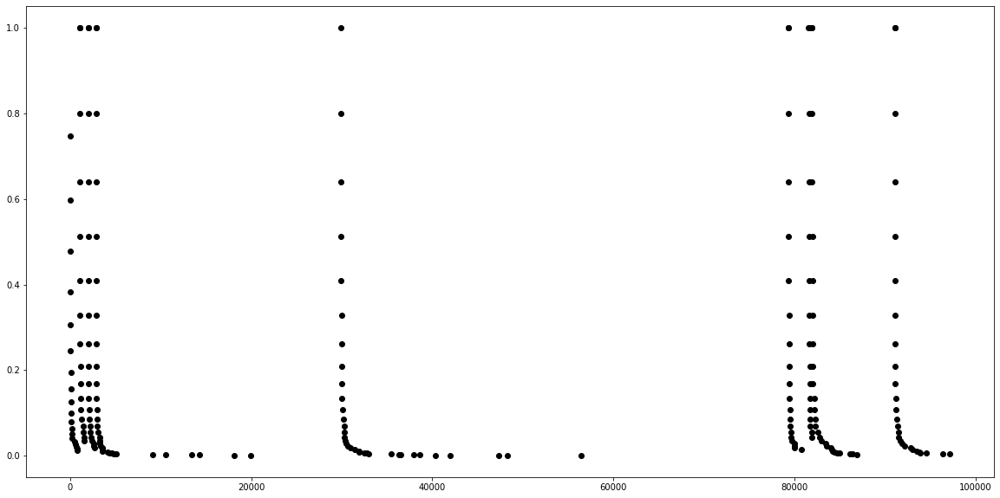

In [34]:
%matplotlib inline
A = Pull_p[:,9]
for i in range(len(A)):
    if A[i] == 0:
        A[i] = np.nan
plt.figure(figsize=(20,10))
plt.plot(A, 'ko')
plt.show()

Plots of TRD high voltage channels on ALICE, indicating when AliceBandit queried each channel. The blue line is the sequence of voltages (normalised) taken between January and May 2015 at intervals of approximately 2 seconds. The red vertical lines indicate when AliceBandit chose to observe feedback from that channel.

0 channel of concern after 99998 rounds.


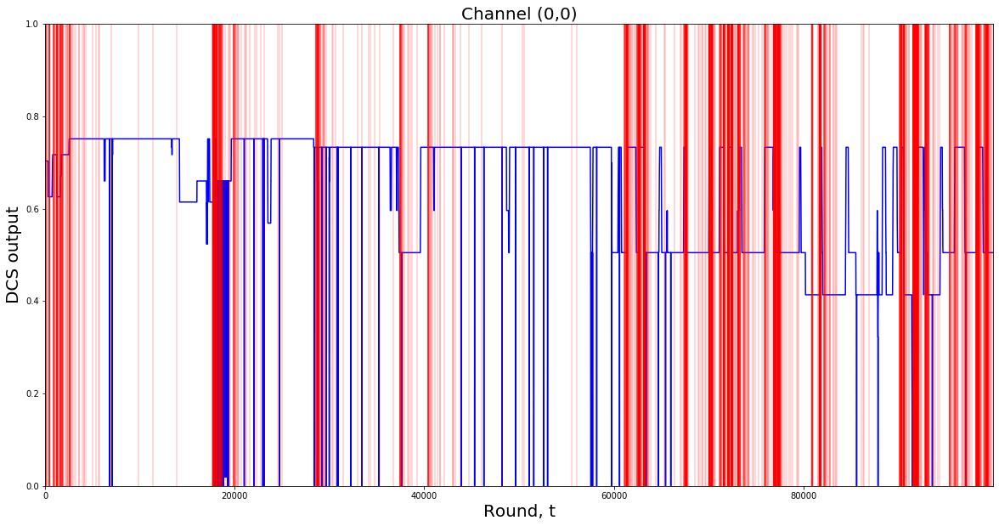

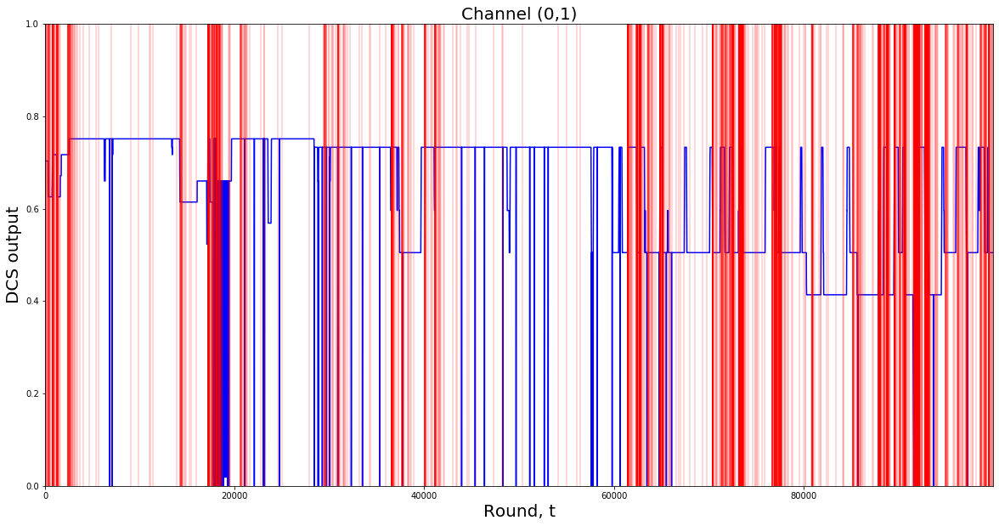

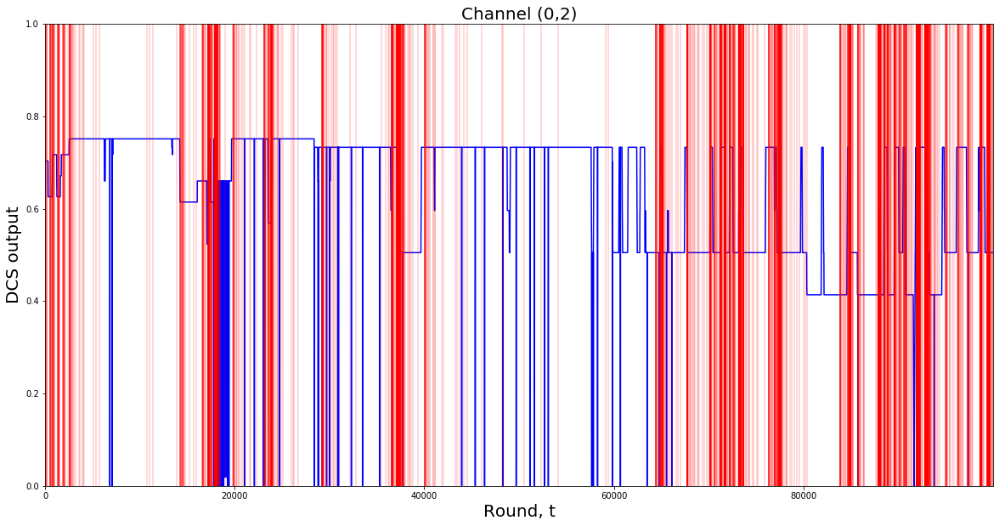

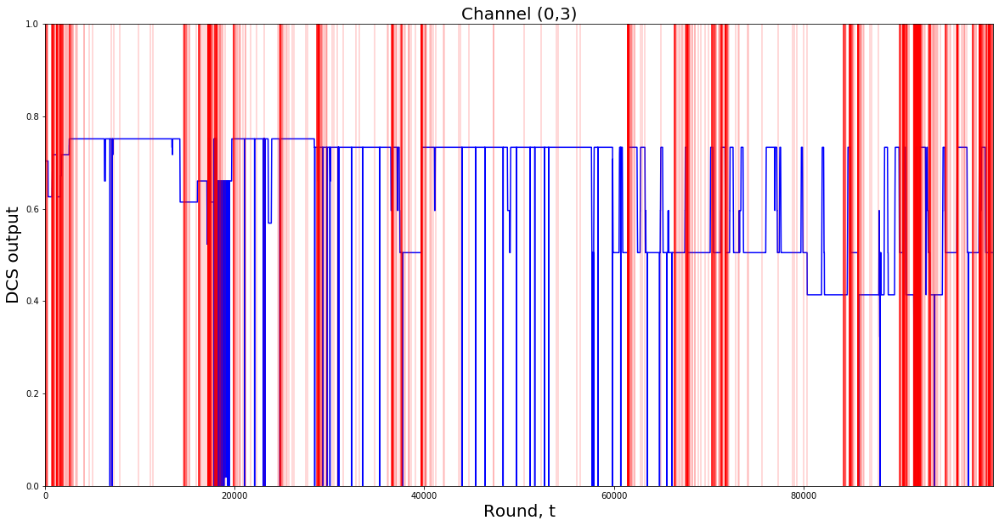

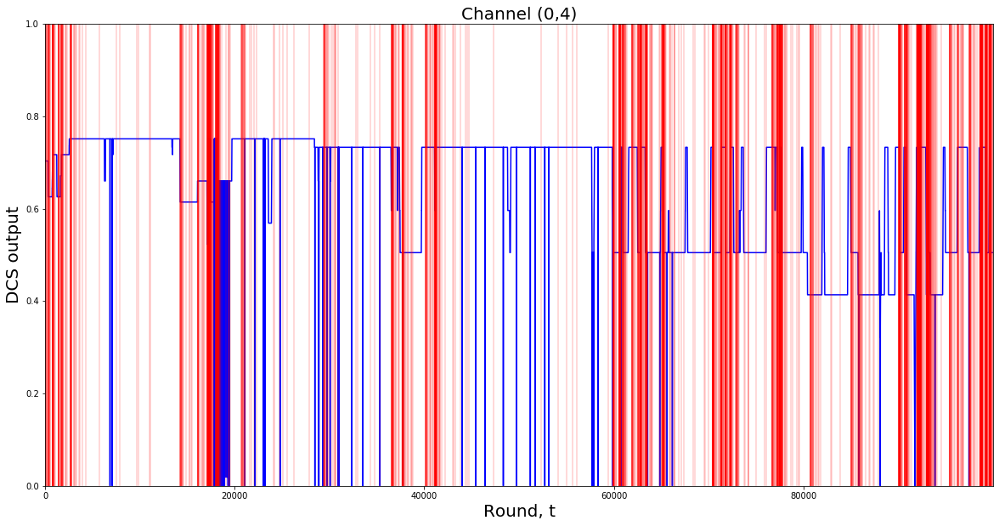

...

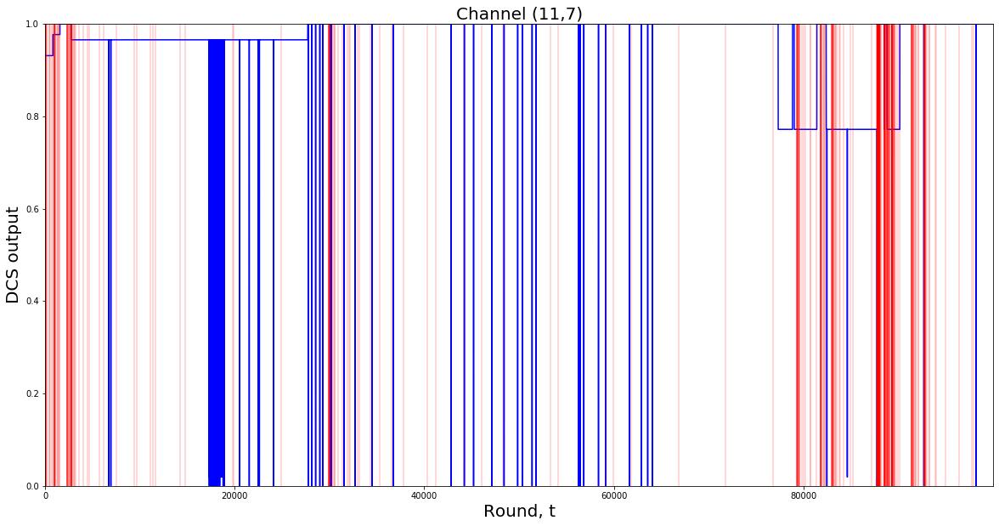

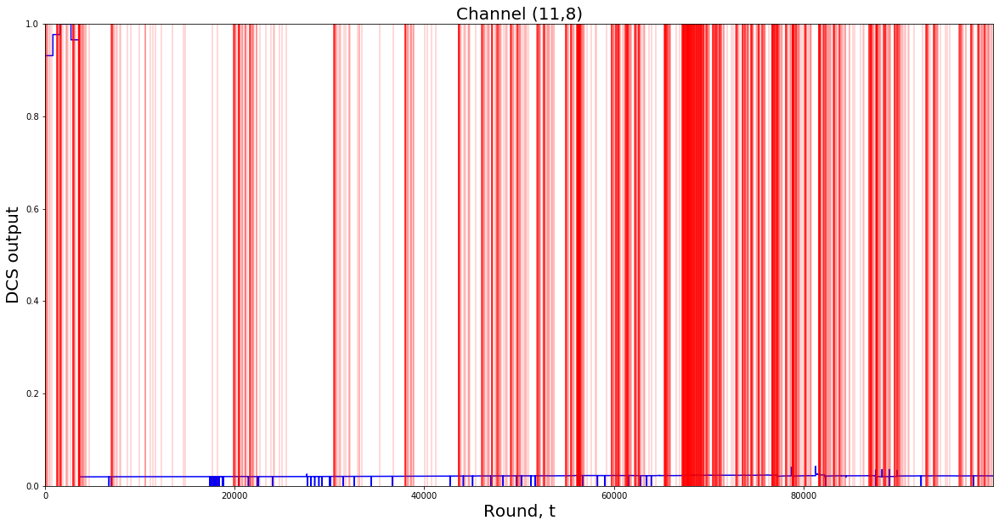

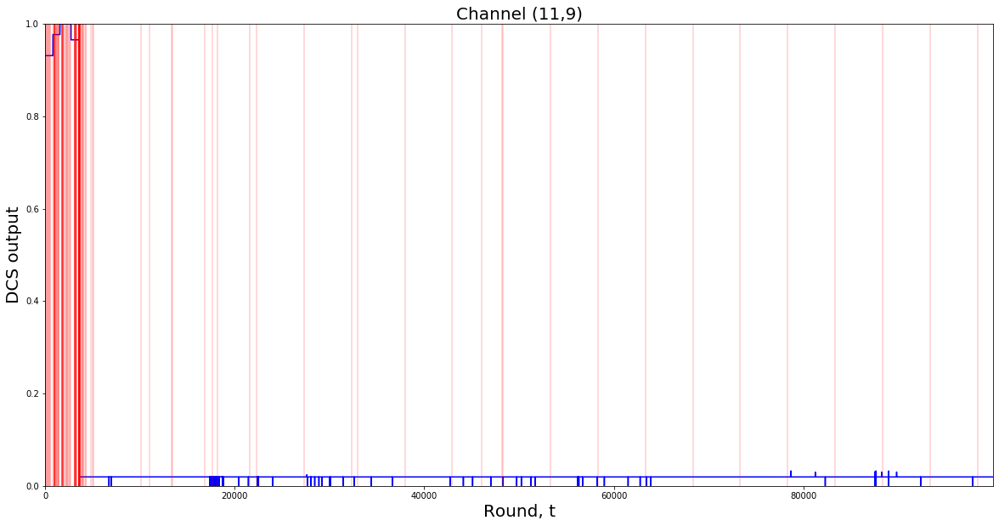

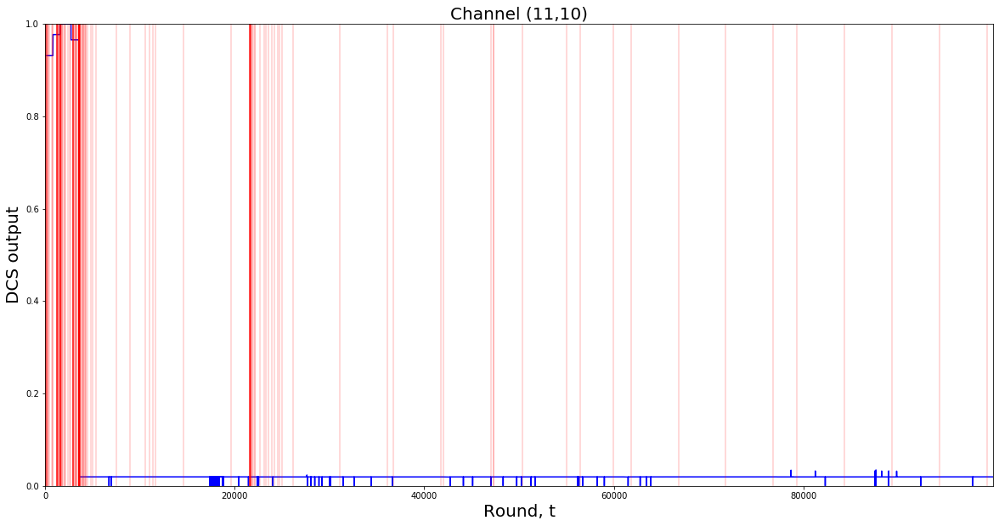

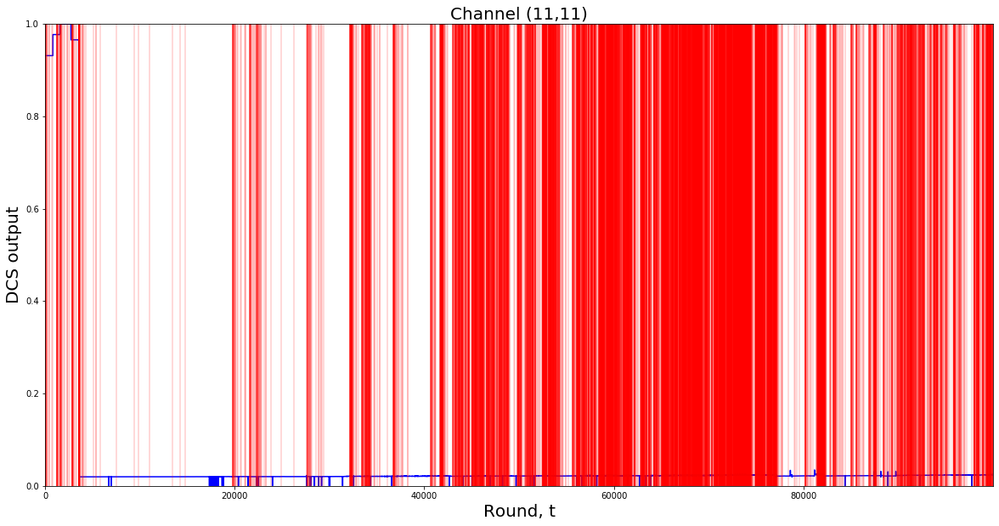

In [35]:
round_ = T-3

%matplotlib inline
for i in range(dim):
    for j in range(dim):
        arm_i = i
        arm_j = j
        arm_ = dim*arm_i + arm_j
        above = Prev_t[arm_].astype(int)
        plt.figure(figsize=(20,10))
        plt.plot(Y[:,dim*arm_i+arm_j], color='blue')
        for j in range(len(above)):
            plt.axvline(x=above[j], color='red', alpha=0.2)
        #plt.plot(threshold, 'k')
        #plt.plot(threshold_, 'k')
        plt.xlim([0,round_+1])
        plt.ylim([0,1])
        plt.title('Channel ({},{})'.format(arm_i,arm_j), fontsize=20)
        plt.xlabel('Round, t', fontsize=20)
        plt.ylabel('DCS output', fontsize=20)
        plt.show()

Further plots of specific channels. The channel is split into smaller chunks of rounds to ease visualisation.

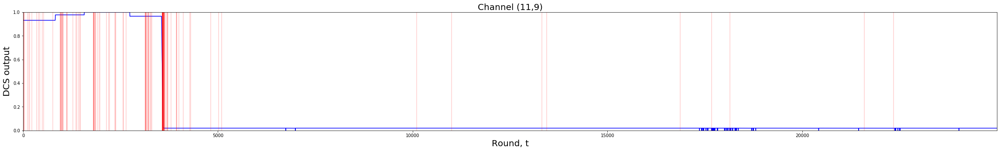

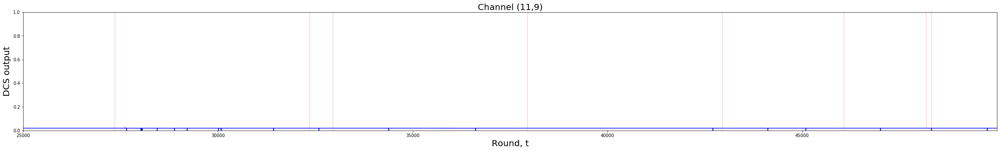

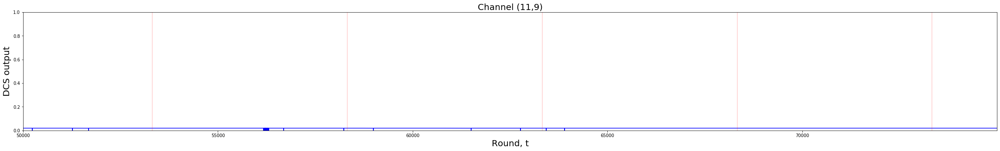

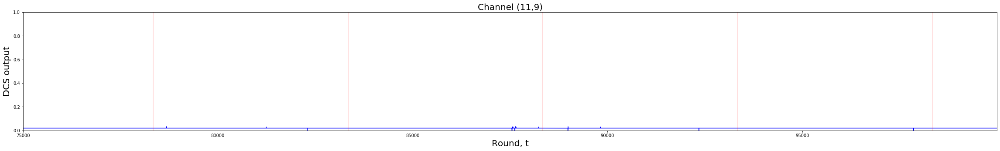

In [89]:
arm_i = 11
arm_j = 9
arm_ = dim*arm_i + arm_j
above = Prev_t[arm_].astype(int)
interval_t = 25000

for i in range(0,T,interval_t):
    if i+interval_t-1<T:
        plt.figure(figsize=(40,5))
        plt.plot(Y[:,dim*arm_i+arm_j], color='blue')
        for j in range(len(above)):
            plt.axvline(x=above[j], color='red', alpha=0.2)
        plt.ylim([0,1])
        plt.xlim([i,i+interval_t-1])
        plt.title('Channel ({},{})'.format(arm_i,arm_j), fontsize=20)
        plt.xlabel('Round, t', fontsize=20)
        plt.ylabel('DCS output', fontsize=20)
        plt.show()
    else:
        plt.figure(figsize=(40,5))
        plt.plot(Y[:,dim*arm_i+arm_j], color='blue')
        for j in range(len(above)):
            plt.axvline(x=above[j], color='red', alpha=0.2)
        plt.ylim([0,1])
        plt.xlim([i,i+T-1])
        plt.title('Channel ({},{})'.format(arm_i,arm_j), fontsize=20)
        plt.xlabel('Round, t', fontsize=20)
        plt.ylabel('DCS output', fontsize=20)
        plt.show()

Technical details for the associated channel.

In [90]:
print('File:',TRD_HV_files[arm_])
df=pd.read_csv(os.getcwd()+'/TRD_DATA/'+str(TRD_HV_files[arm_]), sep=',',header=None,warn_bad_lines=True, error_bad_lines=False)
Channel = df.iloc[0,0]
print('Channel:',Channel)
Interval = np.abs(boundary*(max_val - min_val) + min_val)
print('Interval size: {} V'.format(Interval))
print('Start date:',df.iloc[0,2])
print('End date:',df.iloc[T,2])

File: 1287.csv


/home/bower5005/ALICE_TRD/ALICE_TRD_HV/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Channel: 2890026452037
Interval size: 41.78077905273437 V
Start date: 21-JAN-15 02.41.32.242000000 PM
End date: 19-MAY-15 02.12.51.780000000 PM


In [63]:
df.head()

,0,1,2
0,2890831758405,1499.995361,21-JAN-15 02.41.36.297000000 PM
1,2890831758405,1499.991699,21-JAN-15 02.43.21.684000000 PM
2,2890831758405,1499.997559,21-JAN-15 02.45.03.287000000 PM
3,2890831758405,1499.999756,21-JAN-15 02.46.46.792000000 PM
4,2890831758405,1499.995361,21-JAN-15 02.48.31.483000000 PM
